In [1]:
import numpy as np
import pandas as pd
from keras.models import load_model
from keras.preprocessing import sequence
import matplotlib.pyplot as plt
import tensorflow as tf
import cupy as cp
import matplotlib.pyplot as plt

Using TensorFlow backend.
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/lab606a/.virtualenvs/keras/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/lab606a/.virtualenvs

In [2]:
class Listener:
    def __init__(self):
        self.__time_step = 9
        self.__tmp = cp.zeros([1,3])
        self.__arr_classification = cp.zeros([1,90])
        self.__vis_point = cp.zeros((1,3))
        self.__vis_balls = cp.zeros((self.__time_step,3))
        self.__vis_balls2 = cp.zeros((1,4))
        self.__predction_balls = cp.zeros((1,self.__time_step,3))
        self.__arr_prediction = cp.zeros([1,self.__time_step*3])
        self.__arr_pred_possible = cp.zeros((1,4))
        self.__diff = cp.zeros([1,3])
        self.__padding_done = False
        self.__cnt = 1
        self.__num = 1
        self.__max_index = 0
        self.__coor = -10*cp.ones(6)
        self.__find_possible_point = False
        self.__cal_possible_point = False
        self.__vis_possible_point = False
        self.__vis_hitting_point = cp.zeros((1,4))
        self.__hitting_point = -45
        self.__hitting_timimg = 0
        self.__possible_point = cp.zeros((1,4))
        self.__pred = cp.zeros([1,self.__time_step,3])
        self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
        self.__time = 0.016667
        self.__delta_T = 0.016667
        self.__anchor = 0
        self.__rowww = 0
        self.__direction = 'top6'
        self.traj_done = False
        #self.fig, self.ax = plt.subplots(2,2, figsize=(10.24,7.2))
	#self.__name = sys.argv[1]
        self.__csv_path = '/home/lab606a/catkin_ws/src/pointcloud/offline/'
        #self.__model = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/60hz_culstm/prediction_top6')
        self.__classifier = load_model('/home/lab606a/catkin_ws/src/pointcloud/models/fixed/classification_fixed')
        #rospy.loginfo("loaded classification model")
        self.__pred_top5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_top5')
        self.__pred_top6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_top6')
        #rospy.loginfo("loaded top prediction model")
        self.__pred_left5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_left5')
        self.__pred_left6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_left6')
        #rospy.loginfo("loaded left prediction model")
        self.__pred_right5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_right5')
        self.__pred_right6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_right6')
        #rospy.loginfo("loaded right prediction model")
        self.__pred_back5 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_back5')
        self.__pred_back6 = load_model('/home/lab606a/Documents/model comparison/fixed model/saved mdoel/500_data/prediction_fixed_back6')
        #rospy.loginfo("loaded back prediction model")
        #rospy.loginfo("Load not fixed model with classification")

    ## print spin direction and speed
    def top5(self):
        print("top spin speed 5")
        self.__model = self.__pred_top5
        self.__direction = '_top5'

    def top6(self):
        print("top spin speed 6")
        self.__model = self.__pred_top6
        self.__direction = '_top6'

    def left5(self):
        print("left spin speed 5")
        self.__model = self.__pred_left5
        self.__direction = '_left5'

    def left6(self):
        print("left spin speed 6")
        self.__model = self.__pred_left6
        self.__direction = '_left6'

    def right5(self):
        print("right spin speed 5")
        self.__model = self.__pred_right5
        self.__direction = '_right5'

    def right6(self):
        print("right spin speed 6")
        self.__model = self.__pred_right6
        self.__direction = '_right6'

    def back5(self):
        print("back spin speed 5")
        self.__model = self.__pred_back5
        self.__direction = '_back5'

    def back6(self):
        print("back spin speed 6")
        self.__model = self.__pred_back6
        self.__direction = '_back6'
        
    def append_pred(self): ## Exhaustive
        self.__pred = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1))
        while not self.__find_possible_point == True:
            self.__pred = cp.array(self.__pred)
            if ( -50 < float(cp.min(self.__pred[self.__pred.shape[0]-1,:,:])) < -40): ## find possible hitting point
                index = cp.argmin(self.__pred[self.__pred.shape[0]-1,:,:])
                row = int((index-1)/3)
                count_down = row + (self.__pred.shape[0]-1)*9
                self.__find_possible_point = True
                self.__anchor = self.__pred.shape[0]-1
                print("count down = ", int(count_down))
                #index = cp.argmin(self.__anchor[self.__anchor,:,:])
                #row = int((index-1)/3)
                self.__pred[self.__anchor, row+1:, :] = 0
                self.__pred_for_offline = self.__pred

            else: ## predict next time step
                self.__pred = cp.vstack((self.__pred, cp.zeros([1,self.__time_step,3])))
                self.__pred[self.__pred.shape[0]-1,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[self.__pred.shape[0]-2,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
                if (self.__pred.shape[0] >= 8):
                    self.__pred = cp.zeros([1,self.__time_step,3])
                    self.__find_possible_point = True
                
    def update_prediction(self):
        self.__pred[0,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__arr_prediction.reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)
        for i in range(1, self.__pred.shape[0]):
            self.__pred[i,:,:] = cp.array(self.__model.predict(cp.asnumpy(self.__pred[i-1,:,:].reshape(1,self.__time_step,3)), verbose=1)).reshape(self.__time_step,3)

    def modify(self):
        #index = cp.argmin(self.__pred[self.__anchor,:,:])
        #row = int((index-1)/3)
        if (self.__rowww < 8):
            self.__pred[self.__anchor, self.__rowww+1:, :] = 0
        if (self.__anchor != self.__pred.shape[0]-1):
            self.__pred[self.__anchor+1:, :, :] = 0
        if (self.__anchor == 0) and (self.__rowww == 0) and ( -10 < float(cp.min(self.__pred[self.__anchor,0,:])) < 10):
            self.__pred[self.__anchor,0,:] = 0
        self.__pred_for_offline = cp.vstack((self.__pred_for_offline, self.__pred))
        #self.pub_prediction()

    def calculate_hitting_point(self, arr):
        #print("cnt = ", self.__cnt)
        arr = cp.array(arr)
        self.__cal_possible_point = False
        while not self.__cal_possible_point == True:
            print(arr[self.__anchor,:,:])
            if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= -35) and (self.__anchor >= 0):
                #print("anchor = ", self.__anchor)
                index = cp.argmin(arr[self.__anchor,:,:])
                row = int((index-1)/3)
                self.__rowww = row
                if (-55 <= float(cp.min(arr[self.__anchor,:,:])) <= self.__hitting_point): ## interpolation
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case a1")
                        self.__vis_point = cp.array(self.__vis_point)
                        w1 = (self.__hitting_point-self.__vis_point[:,1]) / (arr[self.__anchor,row,1]-self.__vis_point[:,1])
                        self.__possible_point = w1*arr[self.__anchor,row,:] + (1-w1)*self.__vis_point.reshape(1,1,3)
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))

                        #w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor-1,self.__time_step-1,1])
                        #self.__possible_point = w1*arr[self.__anchor-1,self.__time_step-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        #self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        #self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case a2")
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / (arr[self.__anchor,row,1]-arr[self.__anchor,row-1,1])
                        self.__possible_point = w1*arr[self.__anchor,row-1,:] + (1-w1)*arr[self.__anchor,row,:]
                        self.__hitting_timimg = self.__time + (w1+count_down)*self.__delta_T
                        self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                        print("hitting timing and position = ", self.__possible_point)
                elif (self.__hitting_point < float(cp.min(arr[self.__anchor,:,:])) <= -40):
                    index = cp.argmin(arr[self.__anchor,:,:])
                    row = int((index-1)/3)
                    self.__rowww = row
                    count_down = row + self.__anchor*9
                    print("count down = ", count_down)
                    if (row == 0):
                        print("case b1")
                        if (self.__diff[:,1] > 0):
                            w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                            if w1 < 1:
                                self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                                self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                                self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                                print("hitting timing and position = ", self.__possible_point)
                    else:
                        print("case b2")
                        self.__diff = arr[self.__anchor,row-1,:]-arr[self.__anchor,row,:]
                        self.__diff = self.__diff.reshape(1,3)
                        w1 = (arr[self.__anchor,row,1]-self.__hitting_point) / self.__diff[:,1]
                        if w1 < 1:
                            self.__possible_point = arr[self.__anchor,row,:] - w1*self.__diff
                            self.__hitting_timimg = self.__time + (count_down+1+w1)*self.__delta_T
                            self.__possible_point = cp.hstack((self.__hitting_timimg, self.__possible_point.reshape(3,)))
                            print("hitting timing and position = ", self.__possible_point)
                else:
                    self.__possible_point = self.__possible_point

                self.__cal_possible_point = True
                #self.pub_prediction()
                '''
                if (row < 8):
                    arr[self.__anchor, row+1:, :] = 0
                if (self.__anchor != self.__pred.shape[0]-1):
                    arr[self.__anchor+1:, :, :] = 0
                if (self.__anchor == 0) and ( -10 < float(cp.min(arr[self.__anchor,0,:])) < 10):
                    arr[self.__anchor,0,:] = 0
                '''
                #self.__pred_for_offline = cp.vstack((self.__pred_for_offline, arr))
                #self.__cnt += 1
                if (self.__arr_pred_possible.shape[0] == 1) and (int(self.__arr_pred_possible[0,2]) == 0):
                    self.__arr_pred_possible = self.__possible_point.reshape(1,4)
                else:
                    self.__arr_pred_possible = cp.vstack((self.__arr_pred_possible, self.__possible_point.reshape(1,4)))
            else:
                if ((self.__anchor-1) >= 0) and (abs(float(cp.min(arr[self.__anchor,:,:]))-self.__hitting_point) >= 22.5):
                    self.__anchor = self.__anchor -1
                    #print("case c1")
                else:
                    self.__cal_possible_point = True

    def calculate_vis_hitting_point(self):
        if (-50 <= float(cp.min(self.__vis_balls2)) <= self.__hitting_point):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row,2]-self.__vis_balls2[row-1,2])
            self.__vis_hitting_point = (1-w1)*self.__vis_balls2[row,:] + w1*self.__vis_balls2[row-1,:]
        elif (self.__hitting_point < float(cp.min(self.__vis_balls2)) < -40):
            index = cp.argmin(self.__vis_balls2)
            row = int((index-1)/4)
            w1 = (self.__vis_balls2[row,2]-self.__hitting_point) / (self.__vis_balls2[row-1,2]-self.__vis_balls2[row,2])
            self.__vis_hitting_point = self.__vis_balls2[row,:] - w1*(self.__vis_balls2[row-1,:]-self.__vis_balls2[row,:])
        #print("vis hitting point = ", self.__vis_hitting_point)


    def show_spin_direction(self, max_index):
        ## make dictionary to replace switch case
        dictionary = {0:self.top5, 1:self.top6, 2:self.left5, 3:self.left6, 4:self.right5, 5:self.right6, 6:self.back5, 7:self.back6}
        funcToCall = dictionary[max_index]
        funcToCall()

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def classification(self):
        ## call classifier
        classes = self.__classifier.predict(cp.asnumpy(self.__arr_classification.reshape(1,30,3)), verbose=1)
        print(classes)
        ## figure out which direction is
        self.__max_index = np.argmax(classes)
        #print("number of input balls = ", self.__cnt)
        ## show result
        if (self.__cnt >= 9):
            self.show_spin_direction(self.__max_index)
        #self.__cnt += 1

    def padding(self):
        # if __tmp is empty, init array
        #print("paddinggg")
        if (self.__padding_done == False):
            self.__tmp = self.__vis_point ## pad first point
            self.__padding_done = True
            self.__vis_balls = self.__vis_point.reshape(1,3)
        else:
        # if __tmp is not empty, then filled array
            self.__tmp = cp.hstack((self.__tmp, self.__vis_point))
            self.__vis_balls = cp.vstack((self.__vis_balls, self.__vis_point))
            if (self.__tmp.shape[1] == 15): ## when colect 5 balls
                self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## asigne to classification input array
            #print("shape of tmp = \n", self.__tmp.shape)
            if (self.__tmp.shape[1] == 27):
                #self.__vis_balls = self.__tmp.reshape(1,self.__time_step,3)
                self.__arr_prediction[:,:] = self.__tmp ## for predct next 5 steps
            if (self.__tmp.shape[1] > 27): ## when colect over 5 balls
                #self.__vis_balls = cp.vstack((self.__vis_balls, self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):].reshape(1,self.__time_step,3))) ## visual measurement point for calculate error
                self.__arr_prediction[:,:] = self.__tmp[:,self.__tmp.shape[1]-(self.__time_step*3):] ## rolling visual measurement for predct next 5 steps
                #if (self.__tmp.shape[1] <= 90): ## when colect under 31 balls
                    #self.__arr_classification[:,:self.__tmp.shape[1]] = self.__tmp ## still asigne to classification input array

    def save_data(self):
        visurement_balls = cp.asnumpy(self.__vis_balls)
        pred_trajs = cp.asnumpy(self.__pred_for_offline.reshape(self.__pred_for_offline.shape[0]*self.__pred_for_offline.shape[1], self.__pred_for_offline.shape[2]))

        df_vis = pd.DataFrame(data=visurement_balls)
        df_pred = pd.DataFrame(data=pred_trajs)

        vis_name = self.__csv_path + 'visurement' + str(self.__num) + '.csv'
        pred_name = self.__csv_path + 'prediction' + str(self.__num) + '.csv'

        df_vis.to_csv(vis_name, header=0, index=0)
        df_pred.to_csv(pred_name, header=0, index=0)

    def predict_traj(self):
        #self.__model = self.__prediction_model

        if (self.__pred.shape[0] == 1):
            self.append_pred() ## Exhaustive
        elif (self.__pred.shape[0] > 1):
            self.update_prediction() ## update prediction result
            self.calculate_hitting_point(self.__pred) ## calculate hitting timimg and hitting point
            self.modify()

    def plot_res(self):
        self.__arr_pred_possible = cp.round_(self.__arr_pred_possible, 4)
        self.__vis_hitting_point = cp.round_(self.__vis_hitting_point, 4)

        update_times = cp.linspace(1, self.__arr_pred_possible.shape[0], self.__arr_pred_possible.shape[0])
        t = self.__arr_pred_possible[:,0]
        x = self.__arr_pred_possible[:,1]
        z = self.__arr_pred_possible[:,3]
        Euclidean_vis = cp.sqrt(cp.sum(cp.power(self.__vis_hitting_point[1:],2)))
        Euclidean_pred = cp.sqrt(cp.sum(cp.power(self.__arr_pred_possible[:,1:],2), axis=1))

        plt.figure(figsize=(8,7))

        ## plot hitting timing
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[0]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(t), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(t), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg (sec)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((t-self.__vis_hitting_point[0])*1000)
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Hitting timimg error (ms)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and hitting timing error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_timing_error' + '.png'
        plt.savefig(name)

        ## plot Euclidean distance
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*Euclidean_vis), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(Euclidean_pred), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((Euclidean_pred-Euclidean_vis))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Euclidean distance error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Euclidean distance error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_distance_error' + '.png'
        plt.savefig(name)

        ## plot x coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[1]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(x), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(x), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((x-self.__vis_hitting_point[1]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('X-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and X-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_X-coordinate_error' + '.png'
        plt.savefig(name)

        ## plot z coordinate
        plt.clf()
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(cp.ones((self.__arr_pred_possible.shape[0],))*self.__vis_hitting_point[3]), color='green') #vis
        plt.plot(cp.asnumpy(update_times), cp.asnumpy(z), color='blue') #pred
        plt.scatter(cp.asnumpy(update_times), cp.asnumpy(z), color='blue')
        plt.grid(True)
        plt.xticks(fontsize=14, fontname='FreeSerif')
        plt.yticks(fontsize=14, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate' + '.png'
        plt.savefig(name)

        plt.clf()
        err = cp.abs((z-self.__vis_hitting_point[3]))
        plt.bar(cp.asnumpy(update_times), cp.asnumpy(err), color='blue', edgecolor='black', width=0.5)
        plt.xticks(fontsize=18, fontname='FreeSerif')
        plt.yticks(fontsize=18, fontname='FreeSerif')
        plt.xlabel('Update times', fontsize=24, fontname='FreeSerif')
        plt.ylabel('Z-coordinate error (cm)', fontsize=24, fontname='FreeSerif')
        plt.title('Relationship between \n update times and Z-coordinate error', fontsize=24, fontweight='bold', fontname='FreeSerif')
        name = '/home/lab606a/catkin_ws/src/pointcloud/fig/' + str(self.__num) + '_Z-coordinate_error' + '.png'
        plt.savefig(name)
        
    def return_vis_point(self):
        return self.__vis_hitting_point
    
    def return_pred_res(self):
        return self.__arr_pred_possible
    
    def reset_arr_pred(self):
        self.__arr_pred_possible = cp.zeros((1,4))

    def assigne(self, visss):
        #a = data.data
        self.__vis_point = cp.array(visss).reshape(1,3)
        #print(self.__vis_point)

        if (-50 < self.__vis_point[:,1] < -30):
            tmp = cp.hstack((self.__time, self.__vis_point.reshape(3,)))
            if self.__vis_possible_point == False:
                self.__vis_balls2 = tmp.reshape(1,4)
                self.__vis_possible_point = True
            else:
                self.__vis_balls2 = cp.vstack((self.__vis_balls2, tmp.reshape(1,4)))


        if self.traj_done == False:
            print("\nTime = ", self.__time) ## show current time
            print("visual measurement = ", self.__vis_point) ## show visual measurement coordinate
            self.padding() ## colect 5 balls
            
            if ((self.__tmp.shape[1] >= 15) and (self.__tmp.shape[1] <= 90)): ## while colect balls over 5 balls and under 30 balls
                self.classification() ## doing classification and prediction
            if (self.__tmp.shape[1] > 90): ## while colect balls over 30 balls, stop doing classification
                self.show_spin_direction(self.__max_index) ## skip classification doing prediction
            
            if (self.__tmp.shape[1] >= 27):
                self.predict_traj()
            
            #self.for_ttbot()
            self.__time += self.__delta_T
            self.__cnt += 1
            
        else:
            #print("aaaaa")
            if (self.__padding_done == True):
                self.calculate_vis_hitting_point()
                #print("pred hitting point = \n", self.__arr_pred_possible)
                #if (self.__pred_for_offline.shape[0] != 1):
                    #self.plot_error()
                    #self.plot_res()
                    #self.save_data()
                self.__num += 1

            self.__padding_done = False
            self.__arr_classification = cp.zeros([1,90])
            self.__coor = -10*cp.ones(6)
            self.__vis_balls = cp.zeros((self.__time_step,3))
            self.__cnt = 1
            self.__pred = cp.zeros([1,self.__time_step,3])
            self.__vis_balls2 = cp.zeros((1,4))
            #self.__arr_pred_possible = cp.zeros((1,4))
            self.__find_possible_point = False
            self.__vis_possible_point = False
            self.__pred_for_offline = cp.zeros([1,self.__time_step,3])
            self.__time = 0.016667 ## reset time
            self.traj_done = False

In [3]:
# set GPU memory
gpu_options = tf.GPUOptions(allow_growth=True)
sess = tf.Session(config=tf.ConfigProto(gpu_options=gpu_options))

np.set_printoptions(suppress=True)

In [4]:
obj = Listener()

In [69]:
name = 'back6'

In [70]:
dataset_path = './datasets/split by random for distributed/prediction/' + name + '_test.csv'
print(dataset_path)
dataset = pd.read_csv(dataset_path, header=None)
dataset = dataset.fillna(0)
dataset = np.array(dataset)

./datasets/split by random for distributed/prediction/back6_test.csv


In [71]:
#obj = Listener()
arr_for_vis = np.array([0,0,0,0])
arr_for_pred_3rd = np.array([0,0,0,0])
arr_for_pred_end = np.array([0,0,0,0])

n = 21

arr_for_err_t = np.zeros((1,n))
arr_for_err_x = np.zeros((1,n))
arr_for_err_z = np.zeros((1,n))


for i in range(0,250):
    trajectory = dataset[i,:]
    trajectory = trajectory.reshape(1,trajectory.shape[0])
    trajectory = sequence.pad_sequences(trajectory, maxlen=trajectory.shape[1]+27, padding='post', dtype='float32')
    trajectory = trajectory.reshape(trajectory.shape[1],)
    for j in range(0, trajectory.shape[0], 3):
        obj.assigne(trajectory[j:j+3].reshape(1,3))
    obj.traj_done = True
    obj.assigne(np.array([0,0,0]))
    vis_arr = obj.return_vis_point()
    pred_arr = obj.return_pred_res()
    #print("")
    #print("vis from obj = \n", vis_arr)
    #print("pred from obj = \n", pred_arr)
    #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
    #while pred_arr.shape[0] < n:
        #pred_arr = np.vstack(())
    
    if pred_arr.shape[0] >= n:
        #arr_for_vis = np.vstack((arr_for_vis, vis_arr))
        #arr_for_pred_3rd = np.vstack((arr_for_pred_3rd, pred_arr[2,:]))
        #arr_for_pred_end = np.vstack((arr_for_pred_end, pred_arr[(pred_arr.shape[0]-10),:]))
        err = vis_arr - pred_arr
        print(err.shape)
        err_t = err[:n,0]
        err_x = err[:n,1]
        err_z = err[:n,3]
        
        arr_for_err_t = np.vstack((arr_for_err_t, err_t))
        arr_for_err_x = np.vstack((arr_for_err_x, err_x))
        arr_for_err_z = np.vstack((arr_for_err_z, err_z))
    #else:
        #print("\n\n aaaaa")
        #print(pred_arr)
    
    obj.reset_arr_pred()



Time =  0.016667
visual measurement =  [[ 75.4139 283.917   38.7906]]

Time =  0.033334
visual measurement =  [[ 75.3131 271.152   38.6916]]

Time =  0.050001000000000004
visual measurement =  [[ 75.6915 257.957   38.0592]]

Time =  0.066668
visual measurement =  [[ 75.3593 247.623   37.3042]]

Time =  0.083335
visual measurement =  [[ 75.697  233.448   36.7016]]
1/1 [==============================] - 0s 3ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]

Time =  0.10000200000000001
visual measurement =  [[ 75.5858 222.094   35.7439]]
1/1 [==============================] - 0s 3ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]

Time =  0.11666900000000001
visual measurement =  [[ 75.6873 210.363   34.3661]]
1/1 [==============================] - 0s 3ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]

Time =  0.133336
visual measurement =  [[ 75.5699 199.159   33.0768]]
1/1 [==============================] - 0s 3ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]

Time =  0.150003
visual measurement =  [[ 75.4403 186.699   32.0619]]
1/1 [======

1/1 [==============================] - 0s 804us/step
[[ 74.98133087 -45.4365921   17.41802216]
 [  0.01454926  -0.0816555   -0.01344681]
 [ -0.00712585  -0.07291031  -0.01560879]
 [  0.03679657  -0.10068703  -0.02355766]
 [  0.03924179  -0.09390831  -0.00392532]
 [  0.0599823   -0.0866642   -0.01142025]
 [  0.04794693  -0.11383629  -0.0143013 ]
 [  0.04514313  -0.10606003  -0.00806427]
 [  0.05632782  -0.09704781   0.00140667]]
count down =  18
case a1
hitting timing and position =  [  0.5499696   74.98316516 -45.          17.4317089 ]

Time =  0.2500049999999999
visual measurement =  [[ 75.5842 120.635   20.2505]]
1/1 [==============================] - 0s 3ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01141357 -0.02575493 -0.01484013]
 [-0.02161026 -0.02506065 -0.02037239]
 [-0.0229187  -0.01389885 -0.02566719]
 [-0.00432587 -0.0183754  -0.02015305]
 [-0.01642609 -0.01997566 -0.02190685]
 [-0.01596069 -0.01678658 -0.02068

1/1 [==============================] - 0s 2ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]
back spin speed 6
1/1 [==============================] - 0s 787us/step
[[ 73.98800659 -21.60517311  15.95702648]
 [ 73.87545776 -29.91870689  16.95789719]
 [ 73.62432861 -37.86114502  17.71981621]
 [ 73.32983398 -45.71976471  18.12441063]
 [ -0.41712952   0.19361305  -0.0713129 ]
 [ -0.19051743   0.09836388  -0.04484367]
 [ -0.106987    -0.01600266  -0.03375149]
 [ -0.12774658  -0.04122162  -0.02532196]
 [ -0.13743973   0.00738716  -0.01665306]]
count down =  12
case a2
hitting timing and position =  [  0.53487052  73.35680651 -45.          18.08735415]
1/1 [==============================] - 0s 834us/step
[[ 73.98800659 -21.60517311  15.95702648]
 [ 73.87545776 -29.91870689  16.95789719]
 [ 73.62432861 -37.86114502  17.71981621]
 [ 73.32983398 -45.71976471  18.12441063]
 [ -0.41712952   0.19361305  -0.0713129 ]
 [ -0.19051743   0.09836388  -0.04484367]
 [ -0.106987    -0.01600266  -0.03375149]
 [ -0.12774658

hitting timing and position =  [  0.53824888  71.7723955  -45.          18.62062379]
1/1 [==============================] - 0s 906us/step
[[ 73.37194824  11.87515831   9.50192451]
 [ 73.07162476   3.21014595  11.34551144]
 [ 73.28613281  -5.19852257  13.16250324]
 [ 73.02692413 -13.80392265  14.76755714]
 [ 72.91520691 -22.74393654  15.92378044]
 [ 72.16366577 -30.58870506  17.04368973]
 [ 71.88131714 -38.74567413  18.17990303]
 [ 71.72697449 -47.60809326  18.80440712]
 [ -0.42710876  -0.11079979  -0.16956902]]
count down =  7
case a2
hitting timing and position =  [  0.53824888  71.7723955  -45.          18.62062379]

Time =  0.4333419999999998
visual measurement =  [[74.0799  12.6053   9.55949]]
1/1 [==============================] - 0s 2ms/step
[[0. 0. 0. 0. 0. 0. 0. 1.]]
back spin speed 6
1/1 [==============================] - 0s 777us/step
[[ 73.55614471   3.45973396  11.59468746]
 [ 73.4227066   -5.03318977  13.13095284]
 [ 73.34616089 -13.43014336  14.72278881]
 [ 73.06585693 -2

1/1 [==============================] - 0s 892us/step
[[ 72.43490601 -37.08869934  17.54413986]
 [ 72.29754639 -45.5267334   18.33972931]
 [ -0.18811035  -0.03404045   0.02480125]
 [ -0.07085419  -0.06442833  -0.02643871]
 [  0.02911377  -0.14289665  -0.01528263]
 [  0.0112915   -0.09326363   0.01147461]
 [  0.00296783  -0.11809349   0.00914574]
 [ -0.05843353  -0.10266304   0.00606537]
 [ -0.08403015  -0.06604958   0.00899506]]
count down =  1
case a2
hitting timing and position =  [  0.53438442  72.30612088 -45.          18.29006566]
1/1 [==============================] - 0s 781us/step
[[ 72.43490601 -37.08869934  17.54413986]
 [ 72.29754639 -45.5267334   18.33972931]
 [ -0.18811035  -0.03404045   0.02480125]
 [ -0.07085419  -0.06442833  -0.02643871]
 [  0.02911377  -0.14289665  -0.01528263]
 [  0.0112915   -0.09326363   0.01147461]
 [  0.00296783  -0.11809349   0.00914574]
 [ -0.05843353  -0.10266304   0.00606537]
 [ -0.08403015  -0.06604958   0.00899506]]
count down =  1
case a2
hit

1/1 [==============================] - 0s 727us/step
[[-0.00424957 -0.01729012  0.00402069]
 [-0.00725937 -0.00969887 -0.00223255]
 [-0.00423431  0.00023079  0.00264359]
 [ 0.00170898 -0.01973724  0.00427532]
 [-0.0105896  -0.01546669  0.00054741]
 [-0.01345825 -0.01072311 -0.00092316]
 [-0.01439285 -0.00872612 -0.00188255]
 [-0.0145874  -0.00821495 -0.00268459]
 [-0.01442719 -0.00846672 -0.00341225]]
1/1 [==============================] - 0s 838us/step
[[-0.00424957 -0.01729012  0.00402069]
 [-0.00725937 -0.00969887 -0.00223255]
 [-0.00423431  0.00023079  0.00264359]
 [ 0.00170898 -0.01973724  0.00427532]
 [-0.0105896  -0.01546669  0.00054741]
 [-0.01345825 -0.01072311 -0.00092316]
 [-0.01439285 -0.00872612 -0.00188255]
 [-0.0145874  -0.00821495 -0.00268459]
 [-0.01442719 -0.00846672 -0.00341225]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[-0.00309753 -0.0189209   0.00433731]
 [-0.00811768 -0.

1/1 [==============================] - 0s 999us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 781us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 750us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

count down =  21
case a2
hitting timing and position =  [  0.53684966  76.63746457 -45.          19.96373399]
1/1 [==============================] - 0s 869us/step
[[ 76.58901978 -21.85059929  19.09037209]
 [ 76.76957703 -30.46239662  19.5469265 ]
 [ 76.7331543  -38.73408508  19.98235321]
 [ 76.61197662 -46.66899109  19.95877457]
 [ -0.19785309   0.25680733  -0.17848015]
 [ -0.16312408   0.12965775   0.04784679]
 [ -0.13695526   0.05869293   0.06183624]
 [  0.03277588  -0.03246689   0.08440876]
 [  0.06343079   0.02451134   0.07635307]]
count down =  21
case a2
hitting timing and position =  [  0.53684966  76.63746457 -45.          19.96373399]

Time =  0.20000399999999996
visual measurement =  [[ 74.6957 157.226   18.0016]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 929us/step
[[ 76.0196228  -27.41292763  22.6295433 ]
 [ 76.10

1/1 [==============================] - 0s 853us/step
[[ 76.83267212  16.27401733  15.00725555]
 [ 76.97048187   7.4784584   16.17187881]
 [ 77.00769043  -1.70183754  17.01187706]
 [ 77.3157959   -9.94528389  17.6933918 ]
 [ 77.41871643 -18.43485451  18.21345711]
 [ 77.186409   -26.43945503  18.20541191]
 [ 77.30715942 -34.15795898  18.22268486]
 [ 76.87754059 -42.19563293  17.69284439]
 [ 76.47799683 -48.22599792  16.74946213]]
count down =  17
case a2
hitting timing and position =  [  0.55892716  76.69173635 -45.          17.25413294]

Time =  0.2833389999999999
visual measurement =  [[ 74.9335  101.505     4.49816]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 778us/step
[[ 76.75765991   8.72174644  16.76853943]
 [ 76.45629883   0.11440468  17.65708733]
 [ 76.28408813  -8.14730263  18.41744232]
 [ 76.54335022 -16.38406944  18.

visual measurement =  [[74.7415  51.8517   5.20253]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.8334198  -35.30019379  13.60722542]
 [ 74.91217041 -43.46027374  13.10271835]
 [ -0.46248627   0.04943466  -0.15447617]
 [ -0.13520432  -0.00736046  -0.05089951]
 [ -0.0257225   -0.04756927  -0.01447964]
 [  0.03275299  -0.10315895  -0.0008297 ]
 [  0.02082825  -0.12469101  -0.00791931]
 [ -0.00484467  -0.11654091   0.00827122]
 [  0.01491165  -0.1090374    0.02780342]]
count down =  10
case b2
hitting timing and position =  [  0.5531559   74.92702987 -45.          13.00752287]
1/1 [==============================] - 0s 729us/step
[[ 74.8334198  -35.30019379  13.60722542]
 [ 74.91217041 -43.46027374  13.10271835]
 [ -0.46248627   0.04943466  -0.15447617]
 [ -0.13520432  -0.00736046  -0.05089951]
 [ -0.0257225   -0.0475

1/1 [==============================] - 0s 1ms/step
[[ 74.07063293  -0.80603027  11.61201859]
 [ 74.26844788  -9.37420082  12.03422737]
 [ 74.05541992 -18.02272987  12.28401852]
 [ 73.93943787 -26.11721611  12.41479874]
 [ 74.18507385 -34.35345459  12.07720089]
 [ 74.43680573 -42.40511322  11.63555622]
 [ -0.15510941   0.10042381   0.00189781]
 [ -0.27818298   0.11248589  -0.0589304 ]
 [ -0.42778778   0.11439705  -0.11152267]]
count down =  5
case b2
hitting timing and position =  [  0.55538244  74.51793382 -45.          11.49322307]
1/1 [==============================] - 0s 736us/step
[[ 74.07063293  -0.80603027  11.61201859]
 [ 74.26844788  -9.37420082  12.03422737]
 [ 74.05541992 -18.02272987  12.28401852]
 [ 73.93943787 -26.11721611  12.41479874]
 [ 74.18507385 -34.35345459  12.07720089]
 [ 74.43680573 -42.40511322  11.63555622]
 [ -0.15510941   0.10042381   0.00189781]
 [ -0.27818298   0.11248589  -0.0589304 ]
 [ -0.42778778   0.11439705  -0.11152267]]
count down =  5
case b2
hitti

hitting timing and position =  [  0.55448218  73.10736141 -45.          10.45198641]

Time =  0.5500109999999997
visual measurement =  [[ 73.1808 -43.4665  11.0824]]
back spin speed 6
1/1 [==============================] - 0s 996us/step
[[ 0.10852051  0.00948906  0.03116226]
 [ 0.13479996  0.01170158  0.05569649]
 [ 0.09538269 -0.00438499  0.03758049]
 [ 0.1110878  -0.01506996  0.04196548]
 [ 0.0969162  -0.01860237  0.03962326]
 [ 0.09561539 -0.01671219  0.04071999]
 [ 0.09382629 -0.01320839  0.04195213]
 [ 0.0921402  -0.00900459  0.0433073 ]
 [ 0.09049988 -0.00471687  0.04469585]]
1/1 [==============================] - 0s 818us/step
[[ 0.10852051  0.00948906  0.03116226]
 [ 0.13479996  0.01170158  0.05569649]
 [ 0.09538269 -0.00438499  0.03758049]
 [ 0.1110878  -0.01506996  0.04196548]
 [ 0.0969162  -0.01860237  0.03962326]
 [ 0.09561539 -0.01671219  0.04071999]
 [ 0.09382629 -0.01320839  0.04195213]
 [ 0.0921402  -0.00900459  0.0433073 ]
 [ 0.09049988 -0.00471687  0.04469585]]

Time 

1/1 [==============================] - 0s 894us/step
[[-0.00185394 -0.01969719  0.00451279]
 [-0.0070343  -0.01099968 -0.00342369]
 [-0.00533295 -0.00054169  0.00116539]
 [ 0.00026703 -0.02036285  0.00275803]
 [-0.01213074 -0.01601601 -0.0009346 ]
 [-0.01504517 -0.01124001 -0.00238228]
 [-0.01601028 -0.0092144  -0.00332642]
 [-0.01621246 -0.00869179 -0.00411701]
 [-0.01605988 -0.00891685 -0.00483894]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 911us/step
[[ 0.00078583 -0.01815605  0.00804329]
 [-0.0057373  -0.00858879  0.00078201]
 [-0.00168228 -0.00032616  0.00627899]
 [ 0.00411987 -0.02088737  0.0079422 ]
 [-0.00822449 -0.01677895  0.00421906]
 [-0.0111084  -0.01208305  0.00274849]
 [-0.012043   -0.01010513  0.00178909]
 [-0.01224518 -0.00958633  0.00098801]
 [-0.01208496 -0.00982475  0.00026417]]
1/1 [==============================] - 0s 884us/step
[[ 0.00078583 -0.01815605  0.00804329]
 [-0.0057373  -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 769us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 898us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 75.1315 279.81    39.7303]]

Time =  0.033334
visual measurement =  [[ 75.0388 267.255

1/1 [==============================] - 0s 735us/step
[[ 74.18585205 -24.26127815  20.40749359]
 [ 73.99739075 -31.70430946  20.99364471]
 [ 74.01040649 -39.09695435  21.58718109]
 [ 73.9957962  -46.52694702  21.64361572]
 [ -0.58810425   0.18427467  -0.15716839]
 [ -0.31781769   0.05823708  -0.0976038 ]
 [ -0.19861603   0.02854347  -0.09662151]
 [  0.00183868  -0.08418083  -0.02980995]
 [ -0.11463165  -0.04967499  -0.05143356]]
count down =  21
case a2
hitting timing and position =  [  0.57010326  73.99879878 -45.          21.63201777]
1/1 [==============================] - 0s 824us/step
[[ 74.18585205 -24.26127815  20.40749359]
 [ 73.99739075 -31.70430946  20.99364471]
 [ 74.01040649 -39.09695435  21.58718109]
 [ 73.9957962  -46.52694702  21.64361572]
 [ -0.58810425   0.18427467  -0.15716839]
 [ -0.31781769   0.05823708  -0.0976038 ]
 [ -0.19861603   0.02854347  -0.09662151]
 [  0.00183868  -0.08418083  -0.02980995]
 [ -0.11463165  -0.04967499  -0.05143356]]
count down =  21
case a2
h

1/1 [==============================] - 0s 1ms/step
[[ 75.79624176   5.18157387  14.93454838]
 [ 75.45278168  -2.76307297  16.22013092]
 [ 75.3499527  -10.36842155  17.43452072]
 [ 75.44689941 -18.27543831  18.18558121]
 [ 75.68974304 -26.20432091  18.91573906]
 [ 75.67874146 -33.79605103  19.61444473]
 [ 75.30012512 -41.40596008  19.99823761]
 [ 75.03153229 -48.28781128  19.97069168]
 [  0.06208801  -0.38055611   0.16833496]]
count down =  16
case a2
hitting timing and position =  [  0.57464068  75.15985278 -45.          19.98385178]

Time =  0.31667299999999987
visual measurement =  [[74.7328  83.1021   9.72115]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 753us/step
[[ 75.24498749  -3.68551445  16.66236115]
 [ 74.86236572 -11.48816872  17.81065369]
 [ 75.07037354 -19.46774483  18.99346352]
 [ 75.4985199  -27.25468254  19.94693184]
 [

hitting timing and position =  [  0.57435232  74.42827078 -45.          21.94924816]

Time =  0.4000079999999998
visual measurement =  [[75.0569  36.3515   6.45364]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 740us/step
[[ 75.72499084 -43.70097351  16.50976372]
 [  0.44535065  -0.25277519   0.12448883]
 [ -0.12581635  -0.08101845  -0.03175545]
 [ -0.02157593  -0.01215363  -0.00023079]
 [  0.04302979  -0.06593132   0.03339386]
 [  0.09260559  -0.05693245   0.02079964]
 [  0.07252121  -0.09087563   0.01361561]
 [  0.08383179  -0.08424568   0.0181303 ]
 [  0.11103821  -0.08246803   0.02785683]]
count down =  9
case b1
hitting timing and position =  [  0.56940663  75.62591912 -45.          16.54649094]
1/1 [==============================] - 0s 983us/step
[[ 75.72499084 -43.70097351  16.50976372]
 [  0.44535065  -0.25277519   0.12448883]
 

[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 906us/step
[[ 75.26593018 -13.03825569  14.74862003]
 [ 75.27883148 -21.17401314  15.50223923]
 [ 75.43588257 -29.08129311  16.05540466]
 [ 75.50592804 -36.74843597  16.46002197]
 [ 75.88876343 -44.8685379   16.49405098]
 [ -0.44864273   0.24125481  -0.06087875]
 [ -0.24284363   0.15583229  -0.0269928 ]
 [ -0.17024231   0.07788658  -0.00239372]
 [ -0.20886612  -0.00557327   0.02402592]]
count down =  4
case b2
hitting timing and position =  [  0.56694783  75.89496142 -45.          16.4946019 ]
1/1 [==============================] - 0s 846us/step
[[ 75.26593018 -13.03825569  14.74862003]
 [ 75.27883148 -21.17401314  15.50223923]
 [ 75.43588257 -29.08129311  16.05540466]
 [ 75.50592804 -36.74843597  16.46002197]
 [ 75.88876343 -44.8685379   16.49405098]
 [ -0.44864273   0.24125481  -0.06087875]
 [ -0.24284363   0.15583229  -0.0269928 ]
 [ -0.17

back spin speed 6
1/1 [==============================] - 0s 842us/step
[[ 0.00967407 -0.03757286  0.00028515]
 [ 0.00173569 -0.01957893  0.0079174 ]
 [-0.00067902 -0.01188469  0.00418663]
 [ 0.0051918  -0.03068733  0.00274467]
 [-0.00312424 -0.0270977  -0.00095654]
 [-0.00439453 -0.02147865 -0.00172997]
 [-0.00518799 -0.01784134 -0.0018959 ]
 [-0.00585175 -0.01549721 -0.00190353]
 [-0.00636292 -0.01395988 -0.00187302]]
1/1 [==============================] - 0s 855us/step
[[ 0.00967407 -0.03757286  0.00028515]
 [ 0.00173569 -0.01957893  0.0079174 ]
 [-0.00067902 -0.01188469  0.00418663]
 [ 0.0051918  -0.03068733  0.00274467]
 [-0.00312424 -0.0270977  -0.00095654]
 [-0.00439453 -0.02147865 -0.00172997]
 [-0.00518799 -0.01784134 -0.0018959 ]
 [-0.00585175 -0.01549721 -0.00190353]
 [-0.00636292 -0.01395988 -0.00187302]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 755us/step
[[ 0.01070404 -0.01947594  0.00700951]

1/1 [==============================] - 0s 753us/step
[[ 0.00133514 -0.01721954  0.00862122]
 [-0.00449753 -0.00818062  0.00190735]
 [-0.00029755  0.0000782   0.00740337]
 [ 0.00563049 -0.02046394  0.00908375]
 [-0.00666809 -0.0163517   0.00535202]
 [-0.00954819 -0.01167488  0.00387192]
 [-0.01047897 -0.00969505  0.0029068 ]
 [-0.01067352 -0.00918007  0.00210571]
 [-0.01050568 -0.00943184  0.00137901]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 721us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 748us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

[[0.00000002 0.000001   0.         0.00000014 0.         0.00000004
  0.00000001 0.9999988 ]]

Time =  0.150003
visual measurement =  [[ 74.1687 183.139   30.1887]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.000001   0.         0.00000014 0.         0.00000004
  0.00000001 0.9999988 ]]
back spin speed 6
1/1 [==============================] - 0s 928us/step
count down =  21
1/1 [==============================] - 0s 767us/step
[[ 73.68492126 -16.05930519  14.70564938]
 [ 73.39815521 -24.74480629  15.90601921]
 [ 73.08673859 -33.35003662  17.16613388]
 [ 72.47212219 -42.39904022  18.26080132]
 [ 15.68183517  -9.50734901   3.78947401]
 [  0.56256104  -1.81349754   0.42302036]
 [  0.05121613  -1.04030037   0.1460743 ]
 [ -0.56048584  -0.1831646    0.27948952]
 [  0.06614304   0.03112793   0.21754074]]
count down =  21
case b2
hitting timing and position =  [  0.5214676   72.29546268 -45.          18.57544214]

Time =  0.16666999999999998
visual measurement =  [[ 74.085

1/1 [==============================] - 0s 794us/step
[[ 72.02873993  20.51077271   3.91315174]
 [ 71.70915222  11.41693306   6.95130157]
 [ 71.77687836   2.53793144   9.92849827]
 [ 71.13973999  -5.56455803  12.4778223 ]
 [ 70.74449158 -13.82312202  14.62086487]
 [ 71.18178558 -22.81451607  16.71545029]
 [ 71.16462708 -31.31235695  18.65222931]
 [ 70.26850128 -38.87223053  19.91388321]
 [ 71.41572571 -48.10923767  21.07501602]]
count down =  17
case a2
hitting timing and position =  [  0.52228722  71.02956238 -45.          20.68417104]

Time =  0.2500049999999999
visual measurement =  [[ 73.4324 112.624   18.7512]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.000001   0.         0.00000014 0.         0.00000004
  0.00000001 0.9999988 ]]
back spin speed 6
1/1 [==============================] - 0s 877us/step
[[ 71.73345184   9.70267868   9.55777454]
 [ 71.62400818   0.71846581  12.03169155]
 [ 71.32841492  -8.00601768  14.36562061]
 [ 71.37696838 -17.11746407  16.329

count down =  12
case a2
hitting timing and position =  [  0.52072127  71.22891415 -45.          23.25856482]

Time =  0.33333999999999986
visual measurement =  [[72.852   59.0125   9.85663]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.000001   0.         0.00000014 0.         0.00000004
  0.00000001 0.9999988 ]]
back spin speed 6
1/1 [==============================] - 0s 810us/step
[[ 72.21524048 -33.31749725  14.76335049]
 [ 70.00634766 -40.89653015  15.44347954]
 [ 29.71622086 -17.27080727   6.66867876]
 [ -0.70578003  -1.40894508   0.08817577]
 [ -1.87727356   0.54571533  -0.37177658]
 [ -0.82102203   0.69627571  -0.15045643]
 [ -0.05911255   0.05566216  -0.09337234]
 [  0.24616241  -0.37264061  -0.0258522 ]
 [  0.15140533  -0.39177513  -0.00531006]]
count down =  10
case b2
hitting timing and position =  [  0.52570091  68.8104002  -45.          15.81171769]
1/1 [==============================] - 0s 848us/step
[[ 72.21524048 -33.31749725  14.76335049]
 [ 70.00

1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.000001   0.         0.00000014 0.         0.00000004
  0.00000001 0.9999988 ]]
back spin speed 6
1/1 [==============================] - 0s 907us/step
[[ 72.44586182   3.24855232  10.82166672]
 [ 71.91914368  -5.4163723   12.87179375]
 [ 72.06679535 -14.20031166  14.73723984]
 [ 72.14952087 -22.9291172   16.35944366]
 [ 72.27030945 -31.50198555  17.86510658]
 [ 71.94789886 -39.38748932  19.04508972]
 [ 71.99156952 -47.81384277  19.99343681]
 [ -0.08090973   0.17672539  -0.0092907 ]
 [  0.23864365   0.21694756  -0.06017017]]
count down =  6
case a2
hitting timing and position =  [  0.52224267  71.97698642 -45.          19.67675183]
1/1 [==============================] - 0s 1ms/step
[[ 72.44586182   3.24855232  10.82166672]
 [ 71.91914368  -5.4163723   12.87179375]
 [ 72.06679535 -14.20031166  14.73723984]
 [ 72.14952087 -22.9291172   16.35944366]
 [ 72.27030945 -31.50198555  17.86510658]
 [ 71.94789886 -39.38748932  19.045

1/1 [==============================] - 0s 1ms/step
[[ 72.29208374 -38.8522644   18.65708542]
 [ 72.26426697 -47.2308197   19.56931114]
 [ -0.20005035   0.05801773   0.02966022]
 [ -0.08400726  -0.08956528  -0.06594181]
 [ -0.00728607  -0.12923431  -0.01142693]
 [ -0.0109024   -0.08065796   0.01075172]
 [ -0.00174713  -0.1204834    0.00615883]
 [ -0.03720856  -0.11756325   0.00987434]
 [ -0.01708221  -0.09943199   0.0263195 ]]
count down =  1
case a2
hitting timing and position =  [  0.52111465  72.27167328 -45.          19.32642785]

Time =  0.5166769999999997
visual measurement =  [[ 72.309 -38.924  18.621]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.14974976 -47.41773987  19.44000816]
 [  0.07846451  -0.16393661   0.01403427]
 [  0.0486412   -0.1096077    0.00471306]
 [  0.04253387  -0.1503315   -0.02598381]
 [  0.04466248  -0.10604858  -0.00734138]
 [  0.08444977  -0.11586952   0.00077343]
 [  0.09104919  -0.1347599    0.00790024]
 [  0.09130096  -0.1

[[-0.00430298 -0.01752663  0.00403214]
 [-0.00733948 -0.00993538 -0.00225258]
 [-0.00431061 -0.00000572  0.00262451]
 [ 0.00164413 -0.01997948  0.00425243]
 [-0.01065445 -0.01570702  0.00052738]
 [-0.01353455 -0.01096535 -0.00094604]
 [-0.01446533 -0.00897026 -0.00190353]
 [-0.01465607 -0.00845337 -0.00270748]
 [-0.01450348 -0.0086937  -0.00343323]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 871us/step
[[-0.0031929  -0.0189743   0.00433064]
 [-0.00821686 -0.0101757  -0.00379276]
 [-0.00649261  0.0004406   0.00078011]
 [-0.00084686 -0.01934433  0.00237274]
 [-0.01321411 -0.01500893 -0.00132561]
 [-0.01612854 -0.01022911 -0.00277519]
 [-0.01708984 -0.00820541 -0.00371933]
 [-0.01728821 -0.00767136 -0.00451469]
 [-0.01712036 -0.00790787 -0.00523281]]
1/1 [==============================] - 0s 850us/step
[[-0.0031929  -0.0189743   0.00433064]
 [-0.00821686 -0.0101757  -0.00379276]
 [-0.00649261  0.0004406   0.00

1/1 [==============================] - 0s 843us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 855us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 913us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

[[0.00000004 0.00000009 0.00000001 0.00000003 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 911us/step
[[ 76.57633972  -1.50727654  16.46959114]
 [ 76.61388397  -9.33589363  17.44816208]
 [ 76.69726562 -17.24006462  18.28642845]
 [ 76.65600586 -25.18158913  18.76477242]
 [ 76.66591644 -32.67178345  19.10198593]
 [ 76.8671875  -40.1885376   19.57292747]
 [ 76.66425323 -47.61287689  19.31671333]
 [ -0.13208008   0.07317924  -0.09540176]
 [  0.02264404  -0.03502846   0.00711155]]
count down =  24
case a2
hitting timing and position =  [  0.58921068  76.73567269 -45.          19.40688378]
1/1 [==============================] - 0s 871us/step
[[ 76.57633972  -1.50727654  16.46959114]
 [ 76.61388397  -9.33589363  17.44816208]
 [ 76.69726562 -17.24006462  18.28642845]
 [ 76.65600586 -25.18158913  18.76477242]
 [ 76.66591644 -32.67178345  19.10198593]
 [ 76.8671875  -40.1885376   19.57292747]
 [ 76.66425323 -47.61287689  19.31671333]

hitting timing and position =  [  0.59195115  75.31056333 -45.          19.77896004]
1/1 [==============================] - 0s 989us/step
[[ 75.16533661 -41.09957886  19.80221558]
 [ 75.46561432 -49.16427612  19.75413132]
 [ -0.12284088   0.0337677   -0.03284359]
 [ -0.01683426  -0.04079628   0.01191235]
 [  0.00198364  -0.09961891   0.02117157]
 [ -0.01405334  -0.09922028   0.00008869]
 [  0.01998138  -0.12091446   0.00061131]
 [  0.00204468  -0.11117363   0.00692558]
 [  0.02355957  -0.09016228   0.01842976]]
count down =  19
case a2
hitting timing and position =  [  0.59195115  75.31056333 -45.          19.77896004]

Time =  0.2833389999999999
visual measurement =  [[ 75.8255 114.458   14.482 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000009 0.00000001 0.00000003 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 833us/step
[[ 74.87812042 -46.38451385  20.12822914]
 [  0.05348587  -0.10987663   0.01

1/1 [==============================] - 0s 951us/step
[[ 74.63110352  -7.46306801  20.32651329]
 [ 74.49150848 -15.1677494   21.32035065]
 [ 74.62251282 -22.76442146  22.01774216]
 [ 74.42345428 -30.42948723  22.47897339]
 [ 74.01535034 -37.86525726  22.85134125]
 [ 73.91318512 -45.29795837  22.77494049]
 [ -0.64712906   0.24161339  -0.15646172]
 [ -0.22221756   0.12438011   0.04139805]
 [  0.00914764   0.08092499   0.05528259]]
count down =  14
case a2
hitting timing and position =  [  0.58401314  73.91728067 -45.          22.77800321]

Time =  0.36667399999999983
visual measurement =  [[75.3864  66.6265   2.61113]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000009 0.00000001 0.00000003 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 881us/step
[[ 74.05149841 -15.50034523  21.38162231]
 [ 73.96953583 -23.01680183  21.88718033]
 [ 73.77793121 -30.54055214  22.05709457]
 [ 73.43667603 -37.99514771  22.14

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000009 0.00000001 0.00000003 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[-0.01908493 -0.01910973 -0.00919724]
 [-0.01060486 -0.01280785 -0.01026249]
 [-0.02184296 -0.01101112 -0.01731491]
 [-0.00628281 -0.01900482 -0.01235867]
 [-0.01995468 -0.02203369 -0.01442337]
 [-0.02028656 -0.01950836 -0.01330185]
 [-0.02101135 -0.01573372 -0.01217461]
 [-0.02186203 -0.01153564 -0.01101875]
 [-0.02282333 -0.0074482  -0.00986767]]
[[ 74.3075943   16.61345673  14.50446796]
 [ 74.29628754   8.63323402  15.7199707 ]
 [ 74.15803528   0.730093    16.56179047]
 [ 74.02285004  -7.13786888  17.20540428]
 [ 73.84527588 -14.74257851  17.6697979 ]
 [ 73.67180634 -22.44037819  17.94649696]
 [ 73.59384155 -30.16186714  18.02499771]
 [ 73.49111938 -37.78276062  17.87424278]
 [ 73.24638367 -45.03944397  17.4640522 ]]
count down =  8
case a2
hitting timing and position =

hitting timing and position =  [  0.6002832   73.01291412 -45.          17.44536342]
1/1 [==============================] - 0s 1ms/step
[[ 73.69319153 -22.55031013  18.0487709 ]
 [ 73.38272858 -29.86956978  18.0504303 ]
 [ 73.09788513 -37.29582214  17.92560005]
 [ 73.0142746  -44.87664795  17.45305252]
 [ -0.43260574   0.16073036  -0.05050564]
 [ -0.12006378  -0.01120949   0.02451897]
 [ -0.19335175   0.04953194   0.01314449]
 [ -0.15367889  -0.00168991  -0.02947998]
 [ -0.07591629   0.01732635  -0.01556492]]
count down =  3
case b2
hitting timing and position =  [  0.6002832   73.01291412 -45.          17.44536342]

Time =  0.5500109999999997
visual measurement =  [[ 73.8296 -22.6907  18.2583]]
back spin speed 6
1/1 [==============================] - 0s 915us/step
[[ 73.85502625 -29.98056602  18.10158539]
 [ 73.54521179 -37.44286346  17.92723846]
 [ 73.62931824 -45.17869568  17.58908081]
 [ -0.48365021   0.25441933  -0.01990986]
 [ -0.12521362   0.11061287  -0.00578213]
 [ -0.13937378


Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 835us/step
[[-0.0177803  -0.013731   -0.00738525]
 [-0.01738739 -0.00759315 -0.00058365]
 [-0.00684738  0.0003109   0.00435352]
 [ 0.00108337 -0.02041054  0.00613976]
 [-0.01051331 -0.01658821  0.00221825]
 [-0.01307678 -0.01217461  0.00061989]
 [-0.01387405 -0.01038361 -0.00043106]
 [-0.01397705 -0.01000023 -0.00128746]
 [-0.01375961 -0.01033401 -0.00205231]]
1/1 [==============================] - 0s 874us/step
[[-0.0177803  -0.013731   -0.00738525]
 [-0.01738739 -0.00759315 -0.00058365]
 [-0.00684738  0.0003109   0.00435352]
 [ 0.00108337 -0.02041054  0.00613976]
 [-0.01051331 -0.01658821  0.00221825]
 [-0.01307678 -0.01217461  0.00061989]
 [-0.01387405 -0.01038361 -0.00043106]
 [-0.01397705 -0.01000023 -0.00128746]
 [-0.01375961 -0.01033401 -0.00205231]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 799us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 802us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 925us/step
[[ 0.09278488  0

1/1 [==============================] - 0s 879us/step
[[ 80.55682373 -22.51251411  20.68933296]
 [ 80.81583405 -30.78576469  21.41979218]
 [ 80.9480896  -38.46913147  22.12342644]
 [ 80.82494354 -46.08499146  22.21459961]
 [ -0.4900589    0.07676125  -0.18559837]
 [ -0.25725937   0.12278938  -0.05388927]
 [ -0.24919128   0.10991859  -0.05968761]
 [ -0.08049774  -0.00381279  -0.00902367]
 [ -0.1174469    0.08463097  -0.03394699]]
count down =  21
case a2
hitting timing and position =  [  0.55238546  80.84248751 -45.          22.20161065]
1/1 [==============================] - 0s 944us/step
[[ 80.55682373 -22.51251411  20.68933296]
 [ 80.81583405 -30.78576469  21.41979218]
 [ 80.9480896  -38.46913147  22.12342644]
 [ 80.82494354 -46.08499146  22.21459961]
 [ -0.4900589    0.07676125  -0.18559837]
 [ -0.25725937   0.12278938  -0.05388927]
 [ -0.24919128   0.10991859  -0.05968761]
 [ -0.08049774  -0.00381279  -0.00902367]
 [ -0.1174469    0.08463097  -0.03394699]]
count down =  21
case a2
h

hitting timing and position =  [  0.5716238   79.83081048 -45.          23.32719385]
1/1 [==============================] - 0s 859us/step
[[ 79.4495697   14.14294243  15.96093941]
 [ 79.71325684   6.29200935  17.4687748 ]
 [ 79.93585968  -1.73477364  18.81938171]
 [ 80.07408142  -9.57748604  20.0232296 ]
 [ 80.09799194 -17.20912361  21.14493752]
 [ 79.84894562 -24.97945213  22.02579117]
 [ 79.66794586 -32.47505951  22.68265533]
 [ 79.75852203 -39.84973907  23.18592072]
 [ 79.86131287 -47.173172    23.38680458]]
count down =  17
case a2
hitting timing and position =  [  0.5716238   79.83081048 -45.          23.32719385]

Time =  0.3000059999999999
visual measurement =  [[77.9649 94.6821 10.3718]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 892us/step
[[ 79.72338104   5.68474388  17.22072983]
 [ 79.23756409  -2.52886772  18.4325676 ]
 [ 

hitting timing and position =  [  0.55490559  80.63811422 -45.          20.79543963]

Time =  0.3833409999999998
visual measurement =  [[79.0501  45.1336   2.32032]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.81458282 -38.85470581  19.00735283]
 [ 80.0223999  -46.78534698  19.45823288]
 [ -0.14101791   0.0075531   -0.04627705]
 [ -0.06988525  -0.08221245  -0.0017128 ]
 [  0.01009369  -0.08354378   0.0071373 ]
 [  0.03995514  -0.10423851   0.03317738]
 [  0.04320908  -0.09924126   0.02895355]
 [ -0.00582123  -0.09937096   0.01869583]
 [  0.03829956  -0.09782028   0.03013039]]
count down =  10
case a2
hitting timing and position =  [  0.55376308  79.97561609 -45.          19.3567307 ]
1/1 [==============================] - 0s 953us/step
[[ 79.81458282 -38.85470581  19.00735283]
 [ 80.0223999  -46.78534698  19.45823288]
 [

1/1 [==============================] - 0s 1ms/step
[[ 79.5850296   -6.20880318  13.92376995]
 [ 79.45752716 -14.47241783  15.03740883]
 [ 79.93637085 -23.02279854  16.05563736]
 [ 79.76829529 -30.95775032  16.67179108]
 [ 79.87409973 -38.99157715  17.31109238]
 [ 80.3265152  -47.07868958  17.64345741]
 [  0.14842987  -0.1327858    0.05979252]
 [ -0.14813232  -0.02696419   0.01936245]
 [ -0.47392654   0.02350807  -0.1230917 ]]
count down =  5
case a2
hitting timing and position =  [  0.55429504  80.21022755 -45.          17.5580272 ]
1/1 [==============================] - 0s 743us/step
[[ 79.5850296   -6.20880318  13.92376995]
 [ 79.45752716 -14.47241783  15.03740883]
 [ 79.93637085 -23.02279854  16.05563736]
 [ 79.76829529 -30.95775032  16.67179108]
 [ 79.87409973 -38.99157715  17.31109238]
 [ 80.3265152  -47.07868958  17.64345741]
 [  0.14842987  -0.1327858    0.05979252]
 [ -0.14813232  -0.02696419   0.01936245]
 [ -0.47392654   0.02350807  -0.1230917 ]]
count down =  5
case a2
hitti

hitting timing and position =  [  0.56433515  79.72829861 -45.          17.60087002]

Time =  0.5666779999999997
visual measurement =  [[ 79.7216 -46.0258  17.5459]]
back spin speed 6
1/1 [==============================] - 0s 756us/step
[[ 0.06241608 -0.00641441 -0.01031113]
 [-0.0174408  -0.00802612 -0.01823616]
 [ 0.02082062  0.00185966 -0.01911736]
 [ 0.03636169 -0.00213432 -0.01490974]
 [ 0.02314758 -0.00256157 -0.01741982]
 [ 0.02319336  0.00112152 -0.01651573]
 [ 0.02254868  0.0055294  -0.0155468 ]
 [ 0.02170563  0.01015282 -0.01450729]
 [ 0.02076721  0.01457787 -0.01343918]]
1/1 [==============================] - 0s 775us/step
[[ 0.06241608 -0.00641441 -0.01031113]
 [-0.0174408  -0.00802612 -0.01823616]
 [ 0.02082062  0.00185966 -0.01911736]
 [ 0.03636169 -0.00213432 -0.01490974]
 [ 0.02314758 -0.00256157 -0.01741982]
 [ 0.02319336  0.00112152 -0.01651573]
 [ 0.02254868  0.0055294  -0.0155468 ]
 [ 0.02170563  0.01015282 -0.01450729]
 [ 0.02076721  0.01457787 -0.01343918]]

Time 

1/1 [==============================] - 0s 757us/step
[[-0.0017128  -0.01976585  0.00429153]
 [-0.00693512 -0.01104546 -0.00360203]
 [-0.00532532 -0.00049591  0.00095177]
 [ 0.00027466 -0.02028084  0.00254726]
 [-0.01212311 -0.01594353 -0.00114441]
 [-0.01503754 -0.0111599  -0.00259113]
 [-0.01599503 -0.00913811 -0.00353432]
 [-0.01620483 -0.00860023 -0.00432777]
 [-0.01604462 -0.00883675 -0.00504684]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 777us/step
[[ 0.00015259 -0.01727486  0.00823021]
 [-0.00591278 -0.00801277  0.00119591]
 [-0.00187683  0.00035477  0.00666428]
 [ 0.00396347 -0.02016258  0.00833225]
 [-0.00833893 -0.01604271  0.00460625]
 [-0.01122284 -0.01135826  0.00313568]
 [-0.01215363 -0.00937843  0.00217247]
 [-0.01235199 -0.00885963  0.00137234]
 [-0.01219177 -0.00910378  0.00065041]]
1/1 [==============================] - 0s 683us/step
[[ 0.00015259 -0.01727486  0.00823021]
 [-0.00591278 -0.


Time =  0.016667
visual measurement =  [[ 75.2195 291.615   40.0893]]

Time =  0.033334
visual measurement =  [[ 75.1226 278.483   39.9511]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0388 267.255   39.6099]]

Time =  0.066668
visual measurement =  [[ 75.1814 254.189   39.2163]]

Time =  0.083335
visual measurement =  [[ 75.3152 241.82    38.6107]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.2129 230.054   37.8172]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.3279 217.896   36.8118]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]

Time =  0.133336
visual measureme

count down =  21
case a2
hitting timing and position =  [  0.56721734  72.89461328 -45.          19.4619301 ]

Time =  0.23333799999999993
visual measurement =  [[ 74.9503 140.972   26.0189]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]
back spin speed 6
1/1 [==============================] - 0s 758us/step
[[ 73.27594757 -30.89214516  19.02953339]
 [ 72.87556458 -38.0489502   19.68280792]
 [ 72.97545624 -45.92482758  20.01799202]
 [ -0.54212189   0.24048233  -0.10130215]
 [ -0.17173004   0.03531075  -0.04613304]
 [ -0.15179825   0.0606575   -0.0317564 ]
 [  0.00325012  -0.01426506   0.00416183]
 [  0.00745392  -0.06984901   0.00000668]
 [  0.07112122  -0.06210518   0.0299139 ]]
count down =  20
case a2
hitting timing and position =  [  0.56863513  72.96372643 -45.          19.97863291]
1/1 [==============================] - 0s 828us/step
[[ 73.27594757 -30.89214516  19.02953339]
 [ 72.87

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]
back spin speed 6
1/1 [==============================] - 0s 795us/step
[[ 75.34130859   0.6354084   14.50357819]
 [ 75.5346756   -7.46474266  15.93670177]
 [ 75.5344162  -15.2499752   17.30443573]
 [ 75.47281647 -23.20126534  18.26407623]
 [ 75.83169556 -31.05359077  19.2683754 ]
 [ 76.20018005 -38.92591095  20.14166641]
 [ 76.27191925 -47.05517578  20.6084137 ]
 [  0.80607605  -0.67967415   0.13854599]
 [ -0.50494003  -0.40468597  -0.13887215]]
count down =  15
case a2
hitting timing and position =  [  0.57089162  76.25378272 -45.          20.49041438]
1/1 [==============================] - 0s 783us/step
[[ 75.34130859   0.6354084   14.50357819]
 [ 75.5346756   -7.46474266  15.93670177]
 [ 75.5344162  -15.2499752   17.30443573]
 [ 75.47281647 -23.20126534  18.26407623]
 [ 75.83169556 -31.05359077  19.2683754 ]
 [ 76.20018005 -38.92591095  20.

hitting timing and position =  [  0.58664443  74.99291469 -45.          24.13111843]
1/1 [==============================] - 0s 745us/step
[[ 75.24456787 -36.14647675  23.73358154]
 [ 75.03450012 -43.53696442  24.06542587]
 [  0.21085358  -0.18676186  -0.08304214]
 [  0.16074753  -0.07108879   0.0372858 ]
 [  0.16060257  -0.0886898   -0.02656746]
 [  0.11798859  -0.15782738  -0.04518318]
 [  0.1110611   -0.16968155  -0.04066277]
 [  0.0518837   -0.16273308  -0.0644474 ]
 [  0.08267212  -0.16361427  -0.06479073]]
count down =  10
case b2
hitting timing and position =  [  0.58664443  74.99291469 -45.          24.13111843]

Time =  0.4166749999999998
visual measurement =  [[75.1443  33.4633   7.36578]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.28668213 -42.99081421  23.6584549 ]
 [  0.3470993   -0.28640556   0.1940

1/1 [==============================] - 0s 906us/step
[[ 74.74065399  -8.20089149  19.95420074]
 [ 74.81203461 -16.28376579  21.92010117]
 [ 75.04161072 -24.178545    23.53184509]
 [ 74.71582031 -31.99520302  24.77902031]
 [ 74.99900818 -39.76062775  26.07633781]
 [ 75.49626923 -47.73548889  27.24134636]
 [ -0.18830109   0.04851341  -0.0711422 ]
 [ -0.10596466   0.15275574   0.04501438]
 [ -0.38516617   0.16301727  -0.12304688]]
count down =  5
case a2
hitting timing and position =  [  0.57239501  75.32570173 -45.          26.84173214]

Time =  0.5000099999999997
visual measurement =  [[75.013   -8.54679 20.0153 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000474 0.         0.0000002  0.         0.00000008
  0.00000005 0.9999949 ]]
back spin speed 6
1/1 [==============================] - 0s 807us/step
[[ 74.86761475 -16.49122429  21.62047195]
 [ 74.96859741 -24.7259922   23.27776337]
 [ 75.10113525 -32.75468445  24.63691711]
 [ 75.27085876 -40.50406647  25.6944

1/1 [==============================] - 0s 908us/step
[[-0.02385712 -0.004179    0.00260544]
 [-0.04047012 -0.03022575 -0.00091553]
 [-0.03007889 -0.01383018 -0.01065826]
 [-0.00862122 -0.01775551 -0.0065136 ]
 [-0.01919556 -0.01919746 -0.00949383]
 [-0.01745987 -0.01590538 -0.00911903]
 [-0.01665878 -0.01197243 -0.00861931]
 [-0.01638412 -0.00798988 -0.00801277]
 [-0.01649094 -0.0043087  -0.00734901]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 901us/step
[[ 0.00852203 -0.01021767  0.00612736]
 [-0.00024033 -0.0032711   0.01031876]
 [ 0.01551056 -0.00375175  0.01202297]
 [ 0.01987839 -0.02669334  0.01006413]
 [ 0.01108551 -0.02383995  0.00623703]
 [ 0.00971222 -0.01844978  0.00540543]
 [ 0.00888824 -0.014925    0.00520706]
 [ 0.00822449 -0.01262856  0.00517082]
 [ 0.00771332 -0.01113129  0.00518513]]
1/1 [==============================] - 0s 778us/step
[[ 0.00852203 -0.01021767  0.00612736]
 [-0.00024033 -0.

1/1 [==============================] - 0s 1ms/step
[[ 0.0146904  -0.01899147  0.00413418]
 [ 0.00152588 -0.007761   -0.00267792]
 [ 0.00496674 -0.00067329  0.00288105]
 [ 0.01053619 -0.02164268  0.00473785]
 [-0.00192261 -0.0176754   0.00105   ]
 [-0.00485992 -0.0130291  -0.00039864]
 [-0.00581741 -0.01105118 -0.00134659]
 [-0.00601959 -0.01053047 -0.00214005]
 [-0.00588989 -0.01076889 -0.0028553 ]]
1/1 [==============================] - 0s 791us/step
[[ 0.0146904  -0.01899147  0.00413418]
 [ 0.00152588 -0.007761   -0.00267792]
 [ 0.00496674 -0.00067329  0.00288105]
 [ 0.01053619 -0.02164268  0.00473785]
 [-0.00192261 -0.0176754   0.00105   ]
 [-0.00485992 -0.0130291  -0.00039864]
 [-0.00581741 -0.01105118 -0.00134659]
 [-0.00601959 -0.01053047 -0.00214005]
 [-0.00588989 -0.01076889 -0.0028553 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 843us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

[[ 75.69937897   5.544981    15.6876421 ]
 [ 75.43965912  -2.81061554  17.00048637]
 [ 75.35803986 -10.54662895  18.18014145]
 [ 75.34441376 -18.77382469  19.00853539]
 [ 75.34033203 -26.83042336  19.73102951]
 [ 75.18282318 -34.47371674  20.35051537]
 [ 74.82843018 -42.1186676   20.66788864]
 [ 70.33603668 -45.96566772  19.54508591]
 [  0.58358765  -0.49407387   0.33387327]]
count down =  25
case a2
hitting timing and position =  [  0.57086172  71.46371    -45.          19.82693003]

Time =  0.16666999999999998
visual measurement =  [[ 75.3977 183.442   29.4779]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000005 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 830us/step
[[ 75.20080566  -3.03384209  16.38565826]
 [ 74.73217773 -10.92010689  17.23454666]
 [ 74.86935425 -18.94608116  18.15721893]
 [ 75.32784271 -27.0639286   18.91213608]
 [ 74.9546814  -34.9282074   19.40221024]
 [ 73.49386

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000005 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 856us/step
[[ 75.13893127 -44.69706726  18.62913513]
 [ -0.02145386  -0.0681591   -0.03174973]
 [  0.02053833  -0.0769558    0.00032997]
 [  0.02205658  -0.1129818    0.01603317]
 [ -0.01535034  -0.08712196   0.01589012]
 [  0.02116776  -0.0627079    0.01141548]
 [  0.03025818  -0.10614967   0.01089668]
 [  0.03428268  -0.10432625   0.01970291]
 [  0.0437851   -0.09461784   0.03091526]]
count down =  18
case b1
hitting timing and position =  [  0.56734671  75.08032111 -45.          18.63170915]
1/1 [==============================] - 0s 929us/step
[[ 75.13893127 -44.69706726  18.62913513]
 [ -0.02145386  -0.0681591   -0.03174973]
 [  0.02053833  -0.0769558    0.00032997]
 [  0.02205658  -0.1129818    0.01603317]
 [ -0.01535034  -0.08712196   0.01589012]
 [  0.02116776  -0.0627079    0.01141548

1/1 [==============================] - 0s 837us/step
[[ 73.35745239 -10.04813576  19.66539764]
 [ 73.08242035 -17.9936924   20.63103867]
 [ 73.13587189 -26.00067329  21.42214966]
 [ 73.02027893 -33.95295715  22.04293823]
 [ 72.85395813 -41.4936676   22.61265755]
 [ 72.9048233  -49.48431396  22.8518486 ]
 [ -0.39961243   0.11071777  -0.15870476]
 [  0.01641083  -0.14569092   0.01445484]
 [ -0.01784515  -0.11348915  -0.03001404]]
count down =  14
case a2
hitting timing and position =  [  0.57603144  72.876278   -45.          22.71761568]
1/1 [==============================] - 0s 840us/step
[[ 73.35745239 -10.04813576  19.66539764]
 [ 73.08242035 -17.9936924   20.63103867]
 [ 73.13587189 -26.00067329  21.42214966]
 [ 73.02027893 -33.95295715  22.04293823]
 [ 72.85395813 -41.4936676   22.61265755]
 [ 72.9048233  -49.48431396  22.8518486 ]
 [ -0.39961243   0.11071777  -0.15870476]
 [  0.01641083  -0.14569092   0.01445484]
 [ -0.01784515  -0.11348915  -0.03001404]]
count down =  14
case a2
h

 [ 72.92884827 -45.00332642  17.06896591]]
count down =  8
case a2
hitting timing and position =  [  0.55001826  72.92893612 -45.          17.06880784]
1/1 [==============================] - 0s 836us/step
[[ 74.42098236  20.83505249   9.0487051 ]
 [ 74.13604736  12.22132111  10.74916744]
 [ 73.92610931   3.72839928  12.17690659]
 [ 73.78032684  -4.66813087  13.46584892]
 [ 73.5949173  -12.86770058  14.5569725 ]
 [ 73.45517731 -21.18613243  15.44869232]
 [ 73.30251312 -29.37543678  16.15538788]
 [ 73.13064575 -37.36220551  16.70585251]
 [ 72.92884827 -45.00332642  17.06896591]]
count down =  8
case a2
hitting timing and position =  [  0.55001826  72.92893612 -45.          17.06880784]

Time =  0.4333419999999998
visual measurement =  [[74.3199  21.1865   8.77219]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000005 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.13954926  12.3

count down =  3
case b2
hitting timing and position =  [  0.56813107  73.01537479 -45.          15.46165947]

Time =  0.5166769999999997
visual measurement =  [[ 73.6536 -19.4075  14.4847]]
back spin speed 6
1/1 [==============================] - 0s 751us/step
[[ 73.61946869 -27.94489479  15.11784077]
 [ 73.92170715 -35.70098114  15.52719688]
 [ 72.84069061 -44.13793182  15.41255665]
 [ 11.88617706  -6.57460976   2.12802744]
 [  0.60705566  -1.09028053   0.39701033]
 [ -0.73276138  -0.30638313  -0.13912296]
 [ -0.85769653   0.3238163   -0.03159523]
 [ -0.07366562  -0.01167107  -0.01148605]
 [  0.05953979  -0.22020149   0.08674145]]
count down =  2
case b2
hitting timing and position =  [  0.568381    72.73023483 -45.          15.40084297]
1/1 [==============================] - 0s 1ms/step
[[ 73.61946869 -27.94489479  15.11784077]
 [ 73.92170715 -35.70098114  15.52719688]
 [ 72.84069061 -44.13793182  15.41255665]
 [ 11.88617706  -6.57460976   2.12802744]
 [  0.60705566  -1.09028053   0.

1/1 [==============================] - 0s 803us/step
[[-0.01678467 -0.01585197 -0.00740433]
 [-0.01628113 -0.00897408 -0.00034523]
 [-0.00643158 -0.00074577  0.00432014]
 [ 0.00152588 -0.02132225  0.00610924]
 [-0.01007843 -0.01747322  0.00218105]
 [-0.01265717 -0.01304817  0.00057602]
 [-0.01344299 -0.01125908 -0.00047779]
 [-0.01355743 -0.01086235 -0.00134087]
 [-0.01335144 -0.01119804 -0.00209999]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 820us/step
[[-0.01511002 -0.01611137  0.00094032]
 [-0.01444626 -0.01012421 -0.00219727]
 [-0.00835419 -0.0011425   0.00336838]
 [-0.00164413 -0.0214138   0.00509453]
 [-0.01374054 -0.01725006  0.00131702]
 [-0.01652527 -0.01257896 -0.00020218]
 [-0.01741028 -0.01062965 -0.00119591]
 [-0.01758194 -0.01013947 -0.00201797]
 [-0.01741028 -0.01040459 -0.00275517]]
1/1 [==============================] - 0s 736us/step
[[-0.01511002 -0.01611137  0.00094032]
 [-0.01444626 -0.

1/1 [==============================] - 0s 884us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 889us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 780us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

1/1 [==============================] - 0s 836us/step
[[ 71.74980164   2.35759735  15.53673172]
 [ 71.74504089  -5.67537689  16.38194275]
 [ 71.93089294 -13.60430336  17.13844681]
 [ 71.8241806  -21.43918037  17.48398209]
 [ 71.72441101 -29.27887154  17.68350792]
 [ 71.61767578 -36.97088623  17.70513535]
 [ 71.98823547 -44.70936584  17.33661652]
 [ -0.35096741   0.28454399  -0.05085659]
 [ -0.13473892   0.19179726   0.05397987]]
count down =  24
case b2
hitting timing and position =  [  0.60063796  72.00215259 -45.          17.32277605]
1/1 [==============================] - 0s 754us/step
[[ 71.74980164   2.35759735  15.53673172]
 [ 71.74504089  -5.67537689  16.38194275]
 [ 71.93089294 -13.60430336  17.13844681]
 [ 71.8241806  -21.43918037  17.48398209]
 [ 71.72441101 -29.27887154  17.68350792]
 [ 71.61767578 -36.97088623  17.70513535]
 [ 71.98823547 -44.70936584  17.33661652]
 [ -0.35096741   0.28454399  -0.05085659]
 [ -0.13473892   0.19179726   0.05397987]]
count down =  24
case b2
h

hitting timing and position =  [  0.60974445  69.15928297 -45.          16.52967021]
1/1 [==============================] - 0s 1ms/step
[[ 69.49911499 -34.69306183  16.89308167]
 [ 69.26540375 -41.90361023  16.82621384]
 [ 69.01034546 -49.3456955   16.11347961]
 [ -0.16837311  -0.01593971  -0.08289146]
 [ -0.08127975   0.01514816  -0.09963989]
 [ -0.14748383   0.02353477  -0.11293602]
 [ -0.11342621   0.06073952  -0.12126923]
 [ -0.15460205   0.01209068  -0.13256645]
 [ -0.03908539  -0.0049324   -0.10316658]]
count down =  20
case a2
hitting timing and position =  [  0.60974445  69.15928297 -45.          16.52967021]

Time =  0.2833389999999999
visual measurement =  [[ 72.2399 121.61    14.9905]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.00000012 0.00000001 0.00000001 0.         0.00000014
  0.00000004 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 754us/step
[[ 69.44476318 -41.86919403  17.02951622]
 [ 69.2518158  -49.09309387  16.3826

1/1 [==============================] - 0s 891us/step
[[ 68.68778992  -0.85908699  17.99277115]
 [ 68.43498993  -8.5247364   18.66043854]
 [ 68.30548096 -16.07355309  19.20346451]
 [ 68.08311462 -23.72795296  19.36593056]
 [ 67.96717072 -31.27812386  19.46411705]
 [ 67.64163208 -38.34937286  19.35348892]
 [ 67.56461334 -45.83062744  18.79662323]
 [ -0.23480988   0.14696312  -0.15955257]
 [ -0.01857758  -0.04907036   0.02998352]]
count down =  15
case a2
hitting timing and position =  [  0.6018625   67.57316457 -45.          18.85845082]

Time =  0.36667399999999983
visual measurement =  [[71.1814    71.2955    -0.0439199]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.00000012 0.00000001 0.00000001 0.         0.00000014
  0.00000004 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 836us/step
[[ 68.36878967 -10.55357552  18.59537697]
 [ 68.01605225 -18.2509861   19.31616592]
 [ 68.01327515 -25.97700691  19.76059532]
 [ 68.07633972 -33.83664703 


Time =  0.45000899999999977
visual measurement =  [[69.9646 30.0684 10.9161]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.00000012 0.00000001 0.00000001 0.         0.00000014
  0.00000004 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 813us/step
[[ 67.81419373 -47.41680908  19.69063759]
 [  0.10509491  -0.15892601   0.02446651]
 [  0.03202057  -0.09506035   0.06570148]
 [ -0.00125885  -0.10668182  -0.02306461]
 [  0.03359985  -0.09731483   0.01942253]
 [  0.05541611  -0.1073246    0.02853203]
 [  0.02554321  -0.09943199   0.02442169]
 [  0.00736237  -0.07456398   0.02511501]
 [  0.01639557  -0.05806732   0.03185272]]
count down =  9
case a1
hitting timing and position =  [  0.61615915  67.8812662  -44.99999809  19.41695439]
1/1 [==============================] - 0s 886us/step
[[ 67.81419373 -47.41680908  19.69063759]
 [  0.10509491  -0.15892601   0.02446651]
 [  0.03202057  -0.09506035   0.06570148]
 [ -0.00125885  -0.10668182  -0.023064

1/1 [==============================] - 0s 839us/step
[[ 68.94442749 -16.94120979  19.1498127 ]
 [ 68.7583313  -24.71031761  19.67023277]
 [ 68.940979   -32.71100616  20.34397888]
 [ 68.49806213 -39.89905548  20.44195938]
 [ 68.09791565 -47.05892181  20.03956604]
 [ -0.38389587   0.14692116  -0.0546236 ]
 [ -0.06602097   0.01719666  -0.00990486]
 [ -0.08149719  -0.03291512   0.01558304]
 [ -0.18070984  -0.09126472   0.01255035]]
count down =  4
case a2
hitting timing and position =  [  0.60480483  68.21298349 -45.          20.15527999]

Time =  0.5500109999999997
visual measurement =  [[ 68.816  -16.8077  18.7983]]
back spin speed 6
1/1 [==============================] - 0s 834us/step
[[ 68.72905731 -24.44565773  19.72089577]
 [ 68.7375412  -32.32546997  20.23420715]
 [ 68.33958435 -39.49388885  20.41638565]
 [ 68.00258636 -46.55776215  20.08996201]
 [ -0.4068222    0.2243309   -0.09808922]
 [ -0.23688507   0.19696236  -0.07527924]
 [ -0.00313187  -0.01106071  -0.02912045]
 [  0.0424842

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 867us/step
[[ 0.00426483 -0.00465202 -0.00083923]
 [ 0.00062561 -0.00201797 -0.00269222]
 [ 0.00327682  0.00455666 -0.0026989 ]
 [ 0.01515198 -0.01292229  0.00061798]
 [ 0.00437927 -0.00894928 -0.0025692 ]
 [ 0.00171661 -0.0045414  -0.00372219]
 [ 0.00071335 -0.00268745 -0.00449181]
 [ 0.00046539 -0.00225449 -0.00517941]
 [ 0.00059509 -0.00258446 -0.0058527 ]]
1/1 [==============================] - 0s 772us/step
[[ 0.00426483 -0.00465202 -0.00083923]
 [ 0.00062561 -0.00201797 -0.00269222]
 [ 0.00327682  0.00455666 -0.0026989 ]
 [ 0.01515198 -0.01292229  0.00061798]
 [ 0.00437927 -0.00894928 -0.0025692 ]
 [ 0.00171661 -0.0045414  -0.00372219]
 [ 0.00071335 -0.00268745 -0.00449181]
 [ 0.00046539 -0.00225449 -0.00517941]
 [ 0.00059509 -0.00258446 -0.0058527 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 729us/step
[[-

1/1 [==============================] - 0s 889us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 966us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 865us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

1/1 [==============================] - 0s 782us/step
[[ 76.96574402 -32.63521576  16.80229378]
 [ 76.8276825  -40.71599579  17.27746201]
 [ 77.02664948 -49.1542511   17.51375389]
 [ -0.30282974   0.18925667  -0.03784752]
 [ -0.11762238   0.07726097  -0.008255  ]
 [ -0.06555557  -0.04932976   0.00997257]
 [ -0.00437927  -0.10978508   0.00583649]
 [ -0.04673767  -0.11356163  -0.00491619]
 [ -0.08233643  -0.01639366   0.00828171]]
count down =  20
case a2
hitting timing and position =  [  0.54154936  76.92869572 -45.          17.39742465]
1/1 [==============================] - 0s 850us/step
[[ 76.96574402 -32.63521576  16.80229378]
 [ 76.8276825  -40.71599579  17.27746201]
 [ 77.02664948 -49.1542511   17.51375389]
 [ -0.30282974   0.18925667  -0.03784752]
 [ -0.11762238   0.07726097  -0.008255  ]
 [ -0.06555557  -0.04932976   0.00997257]
 [ -0.00437927  -0.10978508   0.00583649]
 [ -0.04673767  -0.11356163  -0.00491619]
 [ -0.08233643  -0.01639366   0.00828171]]
count down =  20
case a2
h

hitting timing and position =  [  0.53915453  75.70058793 -45.          19.61987923]
1/1 [==============================] - 0s 842us/step
[[ 75.74389648   1.65009117  14.95843315]
 [ 75.62115479  -6.77504158  16.19277191]
 [ 75.78536987 -15.13232994  17.30356598]
 [ 75.80831909 -23.55453682  18.14102173]
 [ 75.80278015 -31.79111671  18.84963036]
 [ 75.6620636  -39.5684967   19.45109177]
 [ 75.72120667 -47.90701294  19.71021652]
 [ -0.07633972  -0.06165504  -0.04598331]
 [ -0.23008728   0.0369091   -0.11233616]]
count down =  15
case a2
hitting timing and position =  [  0.53915453  75.70058793 -45.          19.61987923]

Time =  0.3000059999999999
visual measurement =  [[76.156   84.4344   7.11244]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.87269592  -7.27132225  16.06219673]
 [ 75.70825195 -15.65400505  17.1896

hitting timing and position =  [  0.53808539  74.33549476 -45.          19.73628152]

Time =  0.3833409999999998
visual measurement =  [[75.6114  37.4307   7.52615]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 703us/step
[[ 74.16689301 -46.35046387  17.28226471]
 [  0.00315094  -0.07853127   0.00084019]
 [  0.01283646  -0.0839901    0.00315762]
 [  0.00869751  -0.09996605   0.00486469]
 [ -0.01772308  -0.08380318   0.01369476]
 [  0.01092148  -0.06116867   0.0071373 ]
 [  0.02368164  -0.09616089   0.00834846]
 [  0.02011108  -0.09233665   0.0129137 ]
 [  0.02171326  -0.07890892   0.01924896]]
count down =  9
case a1
hitting timing and position =  [  0.54974234  74.19017695 -44.99999619  17.125006  ]
1/1 [==============================] - 0s 858us/step
[[ 74.16689301 -46.35046387  17.28226471]
 [  0.00315094  -0.07853127   0.000

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 802us/step
[[ 74.9112854  -13.97784615  15.96062469]
 [ 74.81536102 -22.40620613  16.62049103]
 [ 74.81921387 -30.40796089  16.96797943]
 [ 74.50318909 -38.36280823  17.13890457]
 [ 74.46131134 -46.40647888  17.04565048]
 [ -0.32830048   0.17888069  -0.05219269]
 [ -0.15930176   0.01532555   0.01183128]
 [ -0.21101379  -0.02420616   0.03262901]
 [ -0.19930649  -0.03540993  -0.00123215]]
count down =  4
case a2
hitting timing and position =  [  0.53625831  74.46863389 -45.          17.06195646]
1/1 [==============================] - 0s 806us/step
[[ 74.9112854  -13.97784615  15.96062469]
 [ 74.81536102 -22.40620613  16.62049103]
 [ 74.81921387 -30.40796089  16.96797943]
 [ 74.50318909 -38.36280823  17.13890457]
 [ 74.46131134 -46.40647888  17.04565048]
 [ -0.32830048   0.17888069  -0.0

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 890us/step
[[ 0.01126862 -0.03880119  0.0004921 ]
 [ 0.001297   -0.02265739  0.00669575]
 [ 0.00543976 -0.01708221  0.00482368]
 [ 0.01074982 -0.03714752  0.00343227]
 [ 0.00224686 -0.03367233 -0.0002346 ]
 [ 0.00085831 -0.02802277 -0.00097656]
 [ 0.00000763 -0.02434349 -0.00111866]
 [-0.0007019  -0.02194786 -0.00111485]
 [-0.00123978 -0.02037811 -0.00106907]]
1/1 [==============================] - 0s 788us/step
[[ 0.01126862 -0.03880119  0.0004921 ]
 [ 0.001297   -0.02265739  0.00669575]
 [ 0.00543976 -0.01708221  0.00482368]
 [ 0.01074982 -0.03714752  0.00343227]
 [ 0.00224686 -0.03367233 -0.0002346 ]
 [ 0.00085831 -0.02802277 -0.00097656]
 [ 0.00000763 -0.02434349 -0.00111866]
 [-0.0007019  -0.02194786 -0.00111485]
 [-0.00123978 -0.02037811 -0.00106907]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 787us/step
[[ 

1/1 [==============================] - 0s 803us/step
[[-0.00061798 -0.01898956  0.0075798 ]
 [-0.00779724 -0.00907326 -0.00012398]
 [-0.00389862 -0.00081444  0.00537682]
 [ 0.00178528 -0.02139473  0.00702858]
 [-0.01057434 -0.0172863   0.00331688]
 [-0.01346588 -0.0125885   0.00185204]
 [-0.0144043  -0.01060677  0.00089741]
 [-0.01460266 -0.01008415  0.00010204]
 [-0.01445389 -0.0103302  -0.00061798]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 876us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 901us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

visual measurement =  [[ 75.2164 291.892   38.7547]]

Time =  0.033334
visual measurement =  [[ 75.1277 280.119   38.1642]]

Time =  0.050001000000000004
visual measurement =  [[ 75.025  266.348   37.7991]]

Time =  0.066668
visual measurement =  [[ 74.9419 255.776   36.5265]]

Time =  0.083335
visual measurement =  [[ 75.082 243.335  35.746]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1963 229.377   34.9745]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.3114 217.215   34.0477]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 75.2102 206.

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.41048431 -35.40474701  19.27968216]
 [ 76.53225708 -43.77643585  19.96256065]
 [ -0.28540802   0.120821    -0.07456875]
 [ -0.07810211   0.02399254  -0.02899742]
 [  0.00353241   0.00712395  -0.02455711]
 [  0.04688263  -0.04250908   0.01463127]
 [  0.05839539  -0.06795692   0.02303219]
 [  0.03236389  -0.07475471   0.01837349]
 [  0.04067993  -0.06217766   0.02037621]]
count down =  19
case b2
hitting timing and position =  [  0.56911397  76.55005478 -45.          20.06236676]
1/1 [==============================] - 0s 854us/step
[[ 76.41048431 -35.40474701  19.27968216]
 [ 76.53225708 -43.77643585  19.96256065]
 [ -0.28540802   0.120821    -0.07456875]
 [ -0.07810211   0.02399254  -0.02899742]
 [  0.00353241   0.00712395  -0.02455711]
 [  0.04688263  -0.04250908   0.01

1/1 [==============================] - 0s 1ms/step
[[ 75.02397156  -2.95233727  15.63878632]
 [ 74.69122314 -11.14390755  16.77422523]
 [ 74.8449707  -19.31809425  17.90753365]
 [ 75.20714569 -27.47002602  18.85181236]
 [ 75.11223602 -35.59243774  19.64967346]
 [ 75.71126556 -43.85914612  20.15453148]
 [ -0.52791595   0.15219307  -0.13927269]
 [ -0.56874847   0.00042152  -0.16923332]
 [ -0.8570137    0.07912254  -0.15233803]]
count down =  14
case b2
hitting timing and position =  [  0.56897814  75.79393513 -45.          20.22420482]
1/1 [==============================] - 0s 1ms/step
[[ 75.02397156  -2.95233727  15.63878632]
 [ 74.69122314 -11.14390755  16.77422523]
 [ 74.8449707  -19.31809425  17.90753365]
 [ 75.20714569 -27.47002602  18.85181236]
 [ 75.11223602 -35.59243774  19.64967346]
 [ 75.71126556 -43.85914612  20.15453148]
 [ -0.52791595   0.15219307  -0.13927269]
 [ -0.56874847   0.00042152  -0.16923332]
 [ -0.8570137    0.07912254  -0.15233803]]
count down =  14
case b2
hitti

1/1 [==============================] - 0s 975us/step
[[ 74.24119568 -42.33372498  21.79897308]
 [  0.65055847  -0.37518501   0.19440651]
 [ -0.01991272  -0.11007118   0.00939274]
 [ -0.09428406  -0.0505085    0.01539612]
 [  0.0268631   -0.05920601   0.0273571 ]
 [  0.10775375  -0.10914421   0.02469063]
 [  0.03964615  -0.14065742   0.00716591]
 [  0.0164566   -0.10985184   0.01042366]
 [  0.04401398  -0.10449982   0.0243597 ]]
count down =  9
case b1
hitting timing and position =  [  0.57926171  70.60657104 -45.          20.92741436]

Time =  0.4166749999999998
visual measurement =  [[74.839   30.4937   8.19485]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 902us/step
[[-0.11301422 -0.02671623 -0.05715752]
 [-0.02451324  0.06573296  0.01309395]
 [-0.05301666  0.04086685 -0.03531456]
 [-0.03238678  0.02581215 -0.0335083 ]
 [-0.0

count down =  5
case a2
hitting timing and position =  [  0.57597929  74.83818501 -45.          22.74068922]

Time =  0.5000099999999997
visual measurement =  [[ 74.8655 -10.3922  18.6766]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000001 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 984us/step
[[ 74.72811127 -17.92294884  19.709095  ]
 [ 74.72873688 -25.97317696  20.82285881]
 [ 74.73168945 -33.96496582  21.84265137]
 [ 74.78947449 -41.48500824  22.66608238]
 [ 74.93205261 -49.25822449  23.13366508]
 [ -0.58385086   0.21094704  -0.18179798]
 [ -0.18150711   0.15201759  -0.03150558]
 [  0.01948929   0.03998375  -0.05367088]
 [ -0.04575729   0.01985741   0.00702   ]]
count down =  4
case a2
hitting timing and position =  [  0.5758083   74.85394728 -45.          22.87751987]
1/1 [==============================] - 0s 932us/step
[[ 74.72811127 -17.92294884  19.709095  ]
 [ 74.72873


Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02252579 -0.03914833  0.00620747]
 [-0.02661133 -0.03144455  0.00740147]
 [-0.00918579 -0.02834129  0.00867558]
 [-0.0042305  -0.04994011  0.00691319]
 [-0.01290894 -0.04649925  0.00311375]
 [-0.014328   -0.04081154  0.00231075]
 [-0.0151825  -0.03710747  0.00213432]
 [-0.0158844  -0.03470802  0.00211906]
 [-0.01642609 -0.033144    0.00214672]]
1/1 [==============================] - 0s 934us/step
[[-0.02252579 -0.03914833  0.00620747]
 [-0.02661133 -0.03144455  0.00740147]
 [-0.00918579 -0.02834129  0.00867558]
 [-0.0042305  -0.04994011  0.00691319]
 [-0.01290894 -0.04649925  0.00311375]
 [-0.014328   -0.04081154  0.00231075]
 [-0.0151825  -0.03710747  0.00213432]
 [-0.0158844  -0.03470802  0.00211906]
 [-0.01642609 -0.033144    0.00214672]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[-0.00145721 -0.01990128  0.00724792]
 [-0.00935745 -0.00962067 -0.00081921]
 [-0.00551224 -0.0014286   0.00470734]
 [ 0.00009155 -0.02205849  0.00635529]
 [-0.01229858 -0.01794243  0.00264931]
 [-0.01519012 -0.0132618   0.00119114]
 [-0.01613617 -0.01127052  0.00024128]
 [-0.01634216 -0.01075172 -0.00055313]
 [-0.01617432 -0.01099205 -0.0012722 ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.55710602 -26.19625282  12.67485809]
 [ 71.31616211 -35.12031555  14.09520531]
 [ 71.71651459 -43.86911774  15.1918869 ]
 [ -0.53139114   0.1821785   -0.19297504]
 [ -0.16618347   0.04939842  -0.01790237]
 [ -0.00126648   0.03508377   0.00875473]
 [  0.07797241  -0.005867     0.06395054]
 [  0.08890533  -0.05164719   0.03103924]
 [  0.05583191  -0.02806282   0.10885429]]
count down =  20
case b2
hitting timing and position =  [  0.5188314   71.7682647  -45.          15.33364548]
1/1 [==============================] - 0s 971us/step
[[ 71.55710602 -26.19625282  12.67485809]
 [ 71.31616211 -35.12031555  14.09520531]
 [ 71.71651459 -43.86911774  15.1918869 ]
 [ -0.53139114   0.1821785   -0.19297504]
 [ -0.16618347   0.04939842  -0.01790237]
 [ -0.00126648   0.03508377   0.00

1/1 [==============================] - 0s 1ms/step
[[ 69.91630554  13.80781555   7.5441885 ]
 [ 69.77600098   5.08910179   9.25622177]
 [ 69.61179352  -3.92529106  10.94432831]
 [ 69.4394989  -12.75345802  12.44703484]
 [ 69.53610229 -21.63277626  13.62925148]
 [ 69.35960388 -30.4149456   14.78334999]
 [ 69.04426575 -38.86091614  15.73781013]
 [ 68.76646423 -47.35388184  16.47950554]
 [  0.0127182   -0.19488335   0.13832378]]
count down =  16
case a2
hitting timing and position =  [  0.52129637  68.84345877 -45.          16.27393973]
1/1 [==============================] - 0s 1ms/step
[[ 69.91630554  13.80781555   7.5441885 ]
 [ 69.77600098   5.08910179   9.25622177]
 [ 69.61179352  -3.92529106  10.94432831]
 [ 69.4394989  -12.75345802  12.44703484]
 [ 69.53610229 -21.63277626  13.62925148]
 [ 69.35960388 -30.4149456   14.78334999]
 [ 69.04426575 -38.86091614  15.73781013]
 [ 68.76646423 -47.35388184  16.47950554]
 [  0.0127182   -0.19488335   0.13832378]]
count down =  16
case a2
hitti

[[ 69.84437561 -31.49961281  14.55697632]
 [ 69.93600464 -40.20707703  15.92756844]
 [ 69.80821228 -48.49847412  16.64719772]
 [ -0.33514786   0.1235218   -0.13648701]
 [ -0.18209076   0.0486393   -0.07319355]
 [ -0.09038544  -0.00238228  -0.05654812]
 [ -0.00077057  -0.07422829  -0.01489735]
 [  0.0025177   -0.17770195  -0.02777672]
 [ -0.05899811  -0.09153557   0.01527882]]
count down =  11
case a2
hitting timing and position =  [  0.52370948  69.86213302 -45.          16.34355717]

Time =  0.35000699999999985
visual measurement =  [[71.3398  50.5281   3.85542]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.16152191 -40.54418945  14.49754047]
 [ 70.00094604 -49.11127472  15.10699272]
 [ -0.18033218   0.0183506    0.04210758]
 [ -0.02035522   0.03370476   0.01917744]
 [ -0.0196228   -0.04176521  -0.013484  ]
 [  0

count down =  6
case a2
hitting timing and position =  [  0.52305235  70.21464401 -45.          17.05946332]

Time =  0.4333419999999998
visual measurement =  [[70.8481   4.07999  9.20494]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.76528931  -4.70378494  11.35426807]
 [ 70.53883362 -13.36089516  12.78328419]
 [ 70.67706299 -22.42918968  14.14307404]
 [ 70.53775024 -30.94682884  15.55190277]
 [ 70.51927185 -39.40234375  16.62996292]
 [ 70.49313354 -47.63174438  17.38780594]
 [ -0.04230499   0.02526283  -0.00758648]
 [  0.00502777   0.00397682  -0.04473686]
 [ -0.1782608    0.01495934  -0.09357929]]
count down =  5
case a2
hitting timing and position =  [  0.52200707  70.50149252 -45.          17.14544939]
1/1 [==============================] - 0s 1ms/step
[[ 70.76528931  -4.70378494  11.35426807]
 [ 70.53883362 

count down =  0
case a1
hitting timing and position =  [  0.52843432  70.28359035 -45.          17.07343199]
1/1 [==============================] - 0s 1ms/step
[[ 70.24491882 -47.48588562  17.33251572]
 [  0.09244537  -0.13593102  -0.01360607]
 [  0.02976227  -0.11130333   0.01927376]
 [  0.04002762  -0.16301727  -0.04782867]
 [  0.04567719  -0.10505486  -0.02081585]
 [  0.07415771  -0.12005043  -0.01665115]
 [  0.06636047  -0.13114929  -0.01351929]
 [  0.05670929  -0.11473274  -0.00580788]
 [  0.06577682  -0.10132408   0.00464344]]
count down =  0
case a1
hitting timing and position =  [  0.52843432  70.28359035 -45.          17.07343199]

Time =  0.5333439999999997
visual measurement =  [[ 70.3242 -47.7002  17.4671]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.03723145 -0.01371956  0.00374603]
 [-0.01003265 -0.0037365   0.00748825]
 [-0.02751923  0.00080872  0.00057983]
 [-0.0089035  -0.00774956  0.00624371]
 [-0.0213089  -0.01105309  0.00440216]
 [-0.02

1/1 [==============================] - 0s 1ms/step
[[-0.00240326 -0.01999855  0.00432014]
 [-0.00756454 -0.01127243 -0.00374222]
 [-0.00582886 -0.00081825  0.0008564 ]
 [-0.00023651 -0.02063942  0.00244331]
 [-0.0126152  -0.01630211 -0.00124741]
 [-0.01553345 -0.01152039 -0.00269508]
 [-0.01650238 -0.00949287 -0.00363922]
 [-0.01669693 -0.00896263 -0.00443268]
 [-0.01654053 -0.00919724 -0.0051527 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00240326 -0.01999855  0.00432014]
 [-0.00756454 -0.01127243 -0.00374222]
 [-0.00582886 -0.00081825  0.0008564 ]
 [-0.00023651 -0.02063942  0.00244331]
 [-0.0126152  -0.01630211 -0.00124741]
 [-0.01553345 -0.01152039 -0.00269508]
 [-0.01650238 -0.00949287 -0.00363922]
 [-0.01669693 -0.00896263 -0.00443268]
 [-0.01654053 -0.00919724 -0.0051527 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0010376  -0.01987457  0.00759888]
 [-0.00889969 -0.009658

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 75.79795837  -7.01655197  18.32395363]
 [ 75.67008972 -14.84025002  18.84698868]
 [ 75.98379517 -22.55534554  18.92585373]
 [ 76.03358459 -30.24316597  18.81211853]
 [ 75.78079224 -37.61450195  18.60648727]
 [ 76.23680115 -45.34773254  18.09951401]
 [ -0.51916122   0.15626144  -0.21107864]
 [ -0.05002975   0.03671455  -0.01645279]
 [ -0.02531815  -0.09071922  -0.00772762]]
count down =  23
case a2
hitting timing and position =  [  0.58409445  76.21629625 -45.          18.12231057]
1/1 [==============================] - 0s 1ms/step
[[ 75.79795837  -7.01655197  18.32395363]
 [ 75.67008972 -14.84025002  18.84698868]
 [ 75.98379517 -22.55534554  18.92585373]
 [ 76.03358459 -30.24316597  18.81211853]
 [ 75.78079224 -37.61450195  18.60648727]
 [ 76.23680115 -45.34773254  18.09951401]
 [ -0.51916122   0.15626144  -0.21107864]
 [ -0.05002975   0.03671455  -0.01645279]
 [ -0.02531815  -0.09071922  -0.00772762]]
count down =  23
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 77.82984924 -48.58181763  17.54347038]
 [  0.13456726  -0.1900425    0.05321503]
 [  0.06893921  -0.08797646   0.02973175]
 [  0.01757812  -0.08056068   0.01015568]
 [  0.01340866  -0.09354973   0.02493095]
 [  0.03479004  -0.06802559   0.01601982]
 [  0.06799698  -0.10512161   0.01958275]
 [  0.07241058  -0.10477829   0.02330875]
 [  0.07743073  -0.09215355   0.02677536]]
count down =  18
case a1
hitting timing and position =  [  0.59964042  77.79552143 -45.          17.37205058]

Time =  0.3000059999999999
visual measurement =  [[ 76.1267  102.484     6.43863]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000014 0.         0.00000005 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.04835129  0.04400444  0.02252579]
 [ 0.04201889  0.02544212  0.014925  ]
 [ 0.04024506  0.01903725  0.01521492]
 [ 0.04514313 -0.00364304  0.01391888]
 [ 0.0

hitting timing and position =  [  0.58746089  77.03471705 -45.          17.09593706]

Time =  0.3833409999999998
visual measurement =  [[76.8149  56.196    7.65221]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000014 0.         0.00000005 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.61867523 -25.65824318  16.55112839]
 [ 77.69595337 -33.00582886  16.15679169]
 [ 77.68328857 -40.53564453  15.70270538]
 [ 76.30497742 -46.82670593  14.66046047]
 [ -0.59955597   0.06539726  -0.01115417]
 [ -0.28748322   0.03012657   0.00195885]
 [ -0.39769745   0.26800728  -0.02651787]
 [ -0.1077652    0.11084366  -0.02495384]
 [  0.02368927   0.00489616  -0.00904083]]
count down =  12
case a2
hitting timing and position =  [  0.58818452  76.70519115 -45.          14.96309223]
1/1 [==============================] - 0s 1ms/step
[[ 77.61867523 -25.65824318  16.55112839]
 [ 77.69595337 -33.00582886  16.156791

[[0.00000004 0.00000014 0.         0.00000005 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.99299622   6.29490089  16.16267395]
 [ 77.09773254  -1.66527557  16.66361618]
 [ 77.3565979   -9.56081581  17.03717613]
 [ 77.46484375 -17.3243885   17.05963326]
 [ 77.42073059 -25.10872841  16.93769264]
 [ 77.53552246 -32.54148102  16.57866096]
 [ 77.60734558 -40.20809174  16.03344917]
 [ 77.96098328 -47.49897766  15.09890366]
 [  0.10545349  -0.17339134   0.09091091]]
count down =  7
case a2
hitting timing and position =  [  0.58905767  77.83977267 -45.          15.41922253]
1/1 [==============================] - 0s 1ms/step
[[ 76.99299622   6.29490089  16.16267395]
 [ 77.09773254  -1.66527557  16.66361618]
 [ 77.3565979   -9.56081581  17.03717613]
 [ 77.46484375 -17.3243885   17.05963326]
 [ 77.42073059 -25.10872841  16.93769264]
 [ 77.53552246 -32.54148102  16.57866096]
 [ 77.60734558 -40.20809174  16.03344917]
 [ 7

hitting timing and position =  [  0.59036335  78.14111696 -45.          16.20708079]

Time =  0.5666779999999997
visual measurement =  [[ 77.4986 -33.4449  16.1892]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.26418304 -42.41316986  16.24911118]
 [  0.57325745  -0.37064552   0.16056061]
 [ -0.01236725  -0.16868782  -0.01342964]
 [ -0.0683136   -0.10130501  -0.01236916]
 [  0.0487709   -0.1600914    0.04694366]
 [  0.05758667  -0.14966965   0.02606678]
 [  0.04954529  -0.19582748   0.01929283]
 [  0.07320786  -0.19486046   0.032094  ]
 [  0.10554886  -0.20219803   0.04690933]]
count down =  0
case b1
hitting timing and position =  [  0.58917122  78.33833837 -45.          15.96647683]
1/1 [==============================] - 0s 1ms/step
[[ 78.26418304 -42.41316986  16.24911118]
 [  0.57325745  -0.37064552   0.16056061]
 [ -0.01236725  -0.16868782  -0.01342964]
 [ -0.0683136   -0.10130501  -0.01236916]
 [  0.0487709   -0.1600914    0.04694366]
 [  0.05758667  

1/1 [==============================] - 0s 1ms/step
[[-0.00330734 -0.01688576  0.00423241]
 [-0.00617981 -0.0093956  -0.00188923]
 [-0.00310135  0.00045776  0.00300503]
 [ 0.00283432 -0.0195179   0.004632  ]
 [-0.00946045 -0.01524162  0.00090694]
 [-0.01234436 -0.01050377 -0.00056553]
 [-0.01326752 -0.00850677 -0.00152779]
 [-0.01346588 -0.00798798 -0.00233078]
 [-0.01331329 -0.00823784 -0.00305557]]
1/1 [==============================] - 0s 1ms/step
[[-0.00330734 -0.01688576  0.00423241]
 [-0.00617981 -0.0093956  -0.00188923]
 [-0.00310135  0.00045776  0.00300503]
 [ 0.00283432 -0.0195179   0.004632  ]
 [-0.00946045 -0.01524162  0.00090694]
 [-0.01234436 -0.01050377 -0.00056553]
 [-0.01326752 -0.00850677 -0.00152779]
 [-0.01346588 -0.00798798 -0.00233078]
 [-0.01331329 -0.00823784 -0.00305557]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00350189 -0.01929665  0.00380516]
 [-0.00836182 -0.010599

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(51, 4)

Time =  0.016667
visual measurement =  [[ 74.7387 298.711   38.6879]]

Time =  0.033334
visual measurement =  [[ 74.6534 285.203   38.583 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0623 271.216   38.1864]]

Time =  0.066668
visual measurement =  [[ 74.986  261.683   36.6677]]

Time =  0.083335
visual measurement =  [[ 75.1256 249.02    35.3795]]
1/1 [==============================] - 0s 6ms/step
[[0.00000004 0.00000004 0.00000001 0.00000002 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.2507 235.748   35.1022]]
1/1 [==============================] - 0s 4ms/

[[ 75.06217194 -22.97666359  16.99605751]
 [ 74.99754333 -30.96393776  17.66747284]
 [ 74.89962769 -38.6292572   18.11327362]
 [ 74.7678299  -46.29268646  18.11684799]
 [ -0.50875092   0.14787674  -0.11421204]
 [ -0.26129913   0.10129738  -0.09391022]
 [ -0.15296936   0.01194191  -0.0865593 ]
 [ -0.0822258   -0.0940609   -0.06745911]
 [ -0.14939499  -0.01620674  -0.06887436]]
count down =  21
case a2
hitting timing and position =  [  0.56948943  74.79006188 -45.          18.11624506]

Time =  0.23333799999999993
visual measurement =  [[ 75.5235 143.986   22.4648]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000004 0.00000001 0.00000002 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.43345642 -30.15407753  15.14966106]
 [ 75.18867493 -37.98495483  15.30402279]
 [ 75.18088531 -45.85227203  15.36431789]
 [ -0.23686981   0.08793068  -0.0474453 ]
 [ -0.12866592   0.04994011  -0.01307869]
 [ -0


Time =  0.31667299999999987
visual measurement =  [[75.3135  91.171    9.52514]]
1/1 [==============================] - 0s 5ms/step
[[0.00000004 0.00000004 0.00000001 0.00000002 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 808us/step
[[ 74.71578979   1.06729698  14.5668354 ]
 [ 74.63372803  -7.16846275  15.73087311]
 [ 74.73127747 -15.32799721  16.71730423]
 [ 74.70276642 -23.58080482  17.44190979]
 [ 74.61265564 -31.60349464  18.05340576]
 [ 74.55101013 -39.31357574  18.55176926]
 [ 74.70075989 -47.34563446  18.64177704]
 [ -0.16342163   0.02837181  -0.10517597]
 [ -0.12215805   0.05726624  -0.10675335]]
count down =  15
case a2
hitting timing and position =  [  0.57154533  74.65702786 -45.          18.6154917 ]
1/1 [==============================] - 0s 782us/step
[[ 74.71578979   1.06729698  14.5668354 ]
 [ 74.63372803  -7.16846275  15.73087311]
 [ 74.73127747 -15.32799721  16.71730423]
 [ 74.70276642 -23.58080482  17.44

1/1 [==============================] - 0s 953us/step
[[ 73.31510162 -41.10575104  15.44659805]
 [ 73.04427338 -48.77957916  15.20451736]
 [ -0.244133     0.09319115  -0.04021454]
 [  0.01730347  -0.00752068   0.0486145 ]
 [  0.0364151   -0.12371635   0.01951694]
 [  0.02183151  -0.09280777  -0.00449085]
 [  0.02878189  -0.12484932  -0.02480602]
 [ -0.02368164  -0.10405159  -0.0144558 ]
 [ -0.00183105  -0.08161354   0.00340652]]
count down =  10
case a2
hitting timing and position =  [  0.57488697  73.17766401 -45.          15.32374901]

Time =  0.4166749999999998
visual measurement =  [[74.6179  34.1295   4.95524]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000004 0.00000001 0.00000002 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.07400513 -0.13762093 -0.05949497]
 [ 0.04161835 -0.09451866  0.02956486]
 [ 0.00506592 -0.07166481 -0.00289726]
 [ 0.02854919 -0.07145882  0.00488091]
 [ 0.01

visual measurement =  [[73.6944  -8.41637 12.9456 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000004 0.00000004 0.00000001 0.00000002 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 886us/step
[[ 73.61556244 -16.35083961  13.66136074]
 [ 73.51850891 -25.16018105  14.31202412]
 [ 73.26054382 -32.92232513  14.7989254 ]
 [ 73.3260498  -41.02866364  15.03493118]
 [ 73.07891846 -48.58388519  15.02555752]
 [ -0.26921082   0.1131115    0.04575157]
 [ -0.10887146   0.07178879   0.10505295]
 [ -0.02987671  -0.05125618   0.0650053 ]
 [ -0.15656662   0.00794411   0.01587868]]
count down =  4
case a2
hitting timing and position =  [  0.57458414  73.19614737 -45.          15.030004  ]
1/1 [==============================] - 0s 772us/step
[[ 73.61556244 -16.35083961  13.66136074]
 [ 73.51850891 -25.16018105  14.31202412]
 [ 73.26054382 -32.92232513  14.7989254 ]
 [ 73.3260498  -41.02866364  15.03493118]
 [ 73.07891846 -48.583

1/1 [==============================] - 0s 800us/step
[[ 0.02757263 -0.0169735   0.01007271]
 [-0.00439835 -0.00722313  0.00312996]
 [ 0.00967407 -0.00231361  0.003479  ]
 [ 0.01351929 -0.02379227  0.00156021]
 [ 0.00413895 -0.01994514 -0.00240803]
 [ 0.00234985 -0.01395607 -0.00327778]
 [ 0.00131226 -0.01007843 -0.00345039]
 [ 0.00053787 -0.00759697 -0.00344467]
 [-0.00004578 -0.0059948  -0.0033884 ]]
1/1 [==============================] - 0s 854us/step
[[ 0.02757263 -0.0169735   0.01007271]
 [-0.00439835 -0.00722313  0.00312996]
 [ 0.00967407 -0.00231361  0.003479  ]
 [ 0.01351929 -0.02379227  0.00156021]
 [ 0.00413895 -0.01994514 -0.00240803]
 [ 0.00234985 -0.01395607 -0.00327778]
 [ 0.00131226 -0.01007843 -0.00345039]
 [ 0.00053787 -0.00759697 -0.00344467]
 [-0.00004578 -0.0059948  -0.0033884 ]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 872us/step
[[-0.00426483 -0.00844383  0.00011826]
 [-0.00537872 -0.

1/1 [==============================] - 0s 808us/step
[[-0.00128937 -0.01984406  0.00735092]
 [-0.00922394 -0.00959778 -0.00091648]
 [-0.00540543 -0.00140762  0.00460052]
 [ 0.00020599 -0.02205086  0.0062418 ]
 [-0.01215744 -0.01795006  0.00253487]
 [-0.01506042 -0.01325417  0.0010767 ]
 [-0.01602173 -0.01127052  0.00012302]
 [-0.01622772 -0.01074028 -0.00067234]
 [-0.01607513 -0.0109787  -0.00139046]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 920us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 721us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000018 0.         0.00000002 0.         0.00000021
  0.00000002 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 883us/step
[[ 73.03111267   2.27365303  17.24717331]
 [ 72.96835327  -6.04147339  18.68169022]
 [ 73.30607605 -14.15055656  19.99243927]
 [ 73.45697021 -22.23664665  20.86926079]
 [ 73.4196167  -30.29600716  21.57294464]
 [ 73.46003723 -38.19262695  22.18624496]
 [ 73.55698395 -45.73078156  22.32312584]
 [ -0.42260742   0.07548332  -0.11121559]
 [ -0.13790894  -0.00822067  -0.07762718]]
count down =  24
case a2
hitting timing and position =  [  0.56829377  73.54758551 -45.          22.30985601]
1/1 [==============================] - 0s 796us/step
[[ 73.03111267   2.27365303  17.24717331]
 [ 72.96835327  -6.04147339  18.68169022]
 [ 73.30607605 -14.15055656  19.99243927]
 [ 73.45697021 -22.23664665  20.86926079]
 [ 73.4196167  -30.29600716  21.57294464]
 [ 73.46003723 -38.19262695  22.

hitting timing and position =  [  0.60116958  68.96994583 -45.          16.17767248]
1/1 [==============================] - 0s 834us/step
[[ 69.15242004 -29.31953621  16.75863266]
 [ 69.2043457  -36.9467392   16.7784996 ]
 [ 68.98516846 -44.47699738  16.21669197]
 [  0.16127014  -0.19060707  -0.04662609]
 [ -0.04428864   0.0925312    0.01281929]
 [  0.08152771  -0.1031189   -0.03535461]
 [  0.02765274  -0.07356453  -0.01976204]
 [ -0.0020752   -0.13503456  -0.07852364]
 [ -0.01644135  -0.09047127  -0.03079224]]
count down =  20
case b2
hitting timing and position =  [  0.60116958  68.96994583 -45.          16.17767248]

Time =  0.2666719999999999
visual measurement =  [[ 72.2811 126.185   18.4896]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000018 0.         0.00000002 0.         0.00000021
  0.00000002 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 902us/step
[[ 68.79938507 -36.47624969  20.20188332]
 [ 68.72883606 -43.93827057  20.17

1/1 [==============================] - 0s 794us/step
[[ 71.24888611   2.76434517  18.57319832]
 [ 70.9499054   -4.82060242  19.684412  ]
 [ 70.81817627 -12.21900368  20.58027267]
 [ 70.6930542  -19.77720833  21.18610954]
 [ 70.6366272  -27.33243752  21.61729813]
 [ 70.74944305 -34.95350647  22.10832214]
 [ 69.87554169 -42.74008942  22.05197906]
 [ 52.4982872  -35.09420776  15.99262619]
 [  1.97708893  -1.82806206   0.89644575]]
count down =  15
case b2
hitting timing and position =  [  0.60484929  69.6219081  -45.          22.03562654]

Time =  0.35000699999999985
visual measurement =  [[71.856   76.8326   5.16125]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000018 0.         0.00000002 0.         0.00000021
  0.00000002 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 847us/step
[[ 71.1328125   -5.19930077  19.33906555]
 [ 70.89177704 -12.84494209  20.43642998]
 [ 70.94678497 -20.41306496  21.14356232]
 [ 71.0620575  -28.10659981  21.74

1/1 [==============================] - 0s 2ms/step
[[0.00000007 0.00000018 0.         0.00000002 0.         0.00000021
  0.00000002 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 865us/step
[[ 69.67884827 -42.37347412  20.95880699]
 [ 69.27429962 -49.41811371  20.55400467]
 [ -0.29256439   0.03660774  -0.02708912]
 [ -0.00444794   0.04030037   0.0102005 ]
 [ -0.03792572  -0.12604713  -0.00036812]
 [  0.00666428  -0.16435432  -0.00556564]
 [  0.01900482  -0.18115425   0.00707626]
 [ -0.0049057   -0.15533257   0.01808548]
 [ -0.00040436  -0.11487961   0.02852249]]
count down =  10
case a2
hitting timing and position =  [  0.61046487  69.52801621 -45.          20.80788035]
1/1 [==============================] - 0s 989us/step
[[ 69.67884827 -42.37347412  20.95880699]
 [ 69.27429962 -49.41811371  20.55400467]
 [ -0.29256439   0.03660774  -0.02708912]
 [ -0.00444794   0.04030037   0.0102005 ]
 [ -0.03792572  -0.12604713  -0.00036812]
 [  0.00666428  -0.16435432  -0.

[[ 69.30480957 -12.2071743   19.39134026]
 [ 69.07038879 -19.40124702  19.74415398]
 [ 69.02894592 -26.97939491  19.90221214]
 [ 68.86042786 -34.37792206  19.98696899]
 [ 67.89730835 -41.24676514  19.59407806]
 [ 67.27645874 -47.37541199  18.77587318]
 [  0.144207    -0.12023544   0.06021881]
 [ -0.15159607   0.05080986   0.11060333]
 [ -0.27389526   0.04949951   0.17053986]]
count down =  5
case a2
hitting timing and position =  [  0.60647199  67.51709483 -45.          19.09300252]
1/1 [==============================] - 0s 1ms/step
[[ 69.30480957 -12.2071743   19.39134026]
 [ 69.07038879 -19.40124702  19.74415398]
 [ 69.02894592 -26.97939491  19.90221214]
 [ 68.86042786 -34.37792206  19.98696899]
 [ 67.89730835 -41.24676514  19.59407806]
 [ 67.27645874 -47.37541199  18.77587318]
 [  0.144207    -0.12023544   0.06021881]
 [ -0.15159607   0.05080986   0.11060333]
 [ -0.27389526   0.04949951   0.17053986]]
count down =  5
case a2
hitting timing and position =  [  0.60647199  67.51709483 

1/1 [==============================] - 0s 702us/step
[[ 0.02430725  0.02393913  0.03109264]
 [ 0.07028961  0.02670097  0.0254097 ]
 [ 0.03121948  0.01750565  0.01934242]
 [ 0.04354858  0.00498009  0.02412891]
 [ 0.03006744 -0.00005722  0.02252197]
 [ 0.02962494  0.00106812  0.02368927]
 [ 0.02895355  0.00366783  0.02474022]
 [ 0.02819443  0.00682259  0.02574635]
 [ 0.02731323  0.00999451  0.02672386]]
1/1 [==============================] - 0s 893us/step
[[ 0.02430725  0.02393913  0.03109264]
 [ 0.07028961  0.02670097  0.0254097 ]
 [ 0.03121948  0.01750565  0.01934242]
 [ 0.04354858  0.00498009  0.02412891]
 [ 0.03006744 -0.00005722  0.02252197]
 [ 0.02962494  0.00106812  0.02368927]
 [ 0.02895355  0.00366783  0.02474022]
 [ 0.02819443  0.00682259  0.02574635]
 [ 0.02731323  0.00999451  0.02672386]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 712us/step
[[ 0.0049057  -0.03229332  0.00695992]
 [-0.02840042 -0.

1/1 [==============================] - 0s 3ms/step
[[-0.00273895 -0.02002144  0.00444508]
 [-0.00790024 -0.01127815 -0.00373077]
 [-0.0061264  -0.00086021  0.00088787]
 [-0.00052643 -0.02069283  0.00247765]
 [-0.01291275 -0.01635551 -0.00121593]
 [-0.01583862 -0.01157188 -0.00266457]
 [-0.01679611 -0.00955582 -0.0036087 ]
 [-0.01698685 -0.00901794 -0.00440025]
 [-0.01683807 -0.00925636 -0.00512028]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 783us/step
[[-0.00099564 -0.02005959  0.00815105]
 [-0.0089798  -0.00989342  0.00000572]
 [-0.00489044 -0.00199318  0.00559902]
 [ 0.00076294 -0.0227356   0.00725651]
 [-0.01159668 -0.01867867  0.00354385]
 [-0.01448822 -0.01399231  0.00208282]
 [-0.01542664 -0.01200676  0.00112724]
 [-0.01563644 -0.01148796  0.00033283]
 [-0.01548004 -0.01172638 -0.00039005]]
1/1 [==============================] - 0s 737us/step
[[-0.00099564 -0.02005959  0.00815105]
 [-0.0089798  -0.00

count down =  21
case b2
hitting timing and position =  [  0.53548571  71.54649222 -45.          14.92898959]

Time =  0.18333699999999997
visual measurement =  [[ 73.9952 161.317   26.2895]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 765us/step
[[ 73.81816101 -31.83784294  12.56698036]
 [ 73.82975769 -40.35899353  12.73795795]
 [ -0.16934586   0.03772926  -0.10511875]
 [  0.04876709   0.07324028  -0.12191772]
 [ -0.00616455   0.09213829  -0.08454514]
 [  0.03860092   0.06510544  -0.04358673]
 [  0.00664902   0.06450462  -0.04905891]
 [  0.00710678   0.04601288  -0.02973938]
 [  0.03810883   0.03195     -0.00456047]]
count down =  19
case b2
hitting timing and position =  [  0.52575461  73.83607377 -45.          12.83108013]
1/1 [==============================] - 0s 794us/step
[[ 73.81816101 -31.83784294  12.56698036]
 [ 73.82

1/1 [==============================] - 0s 836us/step
[[ 74.48589325   4.11721611   9.61502743]
 [ 74.3881073   -4.89297485  11.0981245 ]
 [ 74.68495178 -13.69963264  12.43250847]
 [ 74.73428345 -22.66314888  13.56253529]
 [ 74.5502243  -31.01125908  14.50130749]
 [ 74.21857452 -39.18024445  15.09257889]
 [ 73.94017029 -46.55757904  15.27647591]
 [  0.48106384  -0.13258171   0.24199963]
 [  0.35834885   0.08258629   0.10406113]]
count down =  15
case a2
hitting timing and position =  [  0.52019591  73.99894986 -45.          15.23764967]
1/1 [==============================] - 0s 736us/step
[[ 74.48589325   4.11721611   9.61502743]
 [ 74.3881073   -4.89297485  11.0981245 ]
 [ 74.68495178 -13.69963264  12.43250847]
 [ 74.73428345 -22.66314888  13.56253529]
 [ 74.5502243  -31.01125908  14.50130749]
 [ 74.21857452 -39.18024445  15.09257889]
 [ 73.94017029 -46.55757904  15.27647591]
 [  0.48106384  -0.13258171   0.24199963]
 [  0.35834885   0.08258629   0.10406113]]
count down =  15
case a2
h

1/1 [==============================] - 0s 863us/step
[[ 74.01792908 -41.90278625  12.77122784]
 [  1.27835083  -0.96376038   0.23208237]
 [ -0.45367432  -0.08876228  -0.00742817]
 [ -0.18470764  -0.10578537   0.03852272]
 [  0.13793182  -0.09806633   0.09603405]
 [  0.0952301   -0.18878555   0.05619526]
 [ -0.01802063  -0.1730442    0.02396774]
 [ -0.04784775  -0.16101646   0.01425552]
 [ -0.01650238  -0.18094063   0.01061726]]
count down =  9
case b1
hitting timing and position =  [  0.5227058   74.03220507 -45.          12.85346484]

Time =  0.36667399999999983
visual measurement =  [[74.1653  41.4124   1.85122]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 858us/step
[[ 74.73406982 -46.58650208  16.30843735]
 [  0.04507065  -0.10008049   0.03017044]
 [  0.01191711  -0.08056068  -0.00383568]
 [  0.03011703  -0.08485603  -0.012

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 943us/step
[[ 74.87260437 -10.9636364   17.13578415]
 [ 74.92272949 -19.54771233  18.92598915]
 [ 75.29676056 -28.2176075   20.60652924]
 [ 75.03907776 -36.19717407  22.04291725]
 [ 75.30648804 -43.85262299  23.14596939]
 [ -0.0607338   -0.21481514  -0.09920502]
 [ -0.39683914   0.20037079  -0.05169678]
 [ -0.35778809   0.18471336   0.02914047]
 [ -0.23009872   0.01078606   0.00724411]]
count down =  4
case b2
hitting timing and position =  [  0.535842    75.34656673 -45.          23.31129172]
1/1 [==============================] - 0s 748us/step
[[ 74.87260437 -10.9636364   17.13578415]
 [ 74.92272949 -19.54771233  18.92598915]
 [ 75.29676056 -28.2176075   20.60652924]
 [ 75.03907776 -36.19717407  22.04291725]
 [ 75.30648804 -43.85262299  23.14596939]
 [ -0.0607338   -0.21481514  -0.0

[[ 0.09371185  0.03390121  0.02193546]
 [ 0.01793671  0.01856995 -0.00646019]
 [ 0.02931213  0.02186775 -0.01119804]
 [ 0.04549026  0.01509094 -0.00757694]
 [ 0.03271103  0.0129528  -0.01017284]
 [ 0.03278351  0.01583672 -0.00935555]
 [ 0.03222656  0.01988411 -0.00838089]
 [ 0.03142166  0.02435875 -0.00729179]
 [ 0.0304718   0.02874184 -0.00614548]]

Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 935us/step
[[ 0.00684357 -0.03131294  0.01530647]
 [ 0.00883102 -0.00562286  0.02384186]
 [ 0.01203156  0.00475502  0.02077103]
 [ 0.01798248 -0.01312065  0.01905918]
 [ 0.00988007 -0.00915146  0.01531124]
 [ 0.00872803 -0.00343132  0.01452541]
 [ 0.00801086  0.00022697  0.01435757]
 [ 0.00740051  0.00257301  0.01434517]
 [ 0.00691223  0.00409317  0.01437569]]
1/1 [==============================] - 0s 829us/step
[[ 0.00684357 -0.03131294  0.01530647]
 [ 0.00883102 -0.00562286  0.02384186]
 [ 0.01203156  0.00475502  0.02

1/1 [==============================] - 0s 1ms/step
[[ 0.00205231 -0.01691818  0.00887489]
 [-0.00343704 -0.0084095   0.00278854]
 [ 0.00084686 -0.00014687  0.00825119]
 [ 0.00691223 -0.0206852   0.0099659 ]
 [-0.00537109 -0.01660347  0.00622559]
 [-0.00823212 -0.01193047  0.00474262]
 [-0.0091629  -0.00995445  0.00377274]
 [-0.00936127 -0.0094471   0.00296783]
 [-0.00918579 -0.00969505  0.00224304]]
1/1 [==============================] - 0s 986us/step
[[ 0.00205231 -0.01691818  0.00887489]
 [-0.00343704 -0.0084095   0.00278854]
 [ 0.00084686 -0.00014687  0.00825119]
 [ 0.00691223 -0.0206852   0.0099659 ]
 [-0.00537109 -0.01660347  0.00622559]
 [-0.00823212 -0.01193047  0.00474262]
 [-0.0091629  -0.00995445  0.00377274]
 [-0.00936127 -0.0094471   0.00296783]
 [-0.00918579 -0.00969505  0.00224304]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 895us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 906us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 877us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

count down =  23
case a2
hitting timing and position =  [  0.59234402  72.02950593 -45.          22.87851825]

Time =  0.21667099999999995
visual measurement =  [[ 73.1889 153.473   27.7943]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000053 0.         0.00000003 0.         0.00000025
  0.00000002 0.99999917]]
back spin speed 6
1/1 [==============================] - 0s 895us/step
[[ 73.40406799 -21.75292015  22.20959854]
 [ 73.40557098 -29.65717506  23.42567825]
 [ 73.43955994 -37.46734619  24.43946648]
 [ 73.61417389 -44.90594482  24.9045887 ]
 [ -0.47769165   0.06164742  -0.1609211 ]
 [ -0.18781662   0.06238747  -0.03310299]
 [ -0.14387894  -0.00566292  -0.04210281]
 [ -0.08718491  -0.07909203  -0.00806236]
 [ -0.09027863   0.01973724  -0.00880718]]
count down =  21
case b2
hitting timing and position =  [  0.58355574  73.61638174 -45.          24.9104698 ]
1/1 [==============================] - 0s 872us/step
[[ 73.40406799 -21.75292015  22.20959854]
 [ 73.40

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000053 0.         0.00000003 0.         0.00000025
  0.00000002 0.99999917]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.99980164  12.58720779  13.55995846]
 [ 71.70545197   4.00411797  15.62776184]
 [ 71.63726807  -4.02101326  17.21684837]
 [ 71.47161865 -11.57789803  18.59906006]
 [ 71.49321747 -19.14673042  19.82278824]
 [ 71.35636902 -26.94367409  20.72557068]
 [ 71.49645233 -35.15759277  21.87559509]
 [ 70.67589569 -42.35346985  21.89910507]
 [ 68.41844177 -46.0905304   20.96436882]]
count down =  17
case a2
hitting timing and position =  [  0.58820868  69.07720073 -45.          21.2371389 ]
1/1 [==============================] - 0s 1ms/step
[[ 71.99980164  12.58720779  13.55995846]
 [ 71.70545197   4.00411797  15.62776184]
 [ 71.63726807  -4.02101326  17.21684837]
 [ 71.47161865 -11.57789803  18.59906006]
 [ 71.49321747 -19.14673042  19.82278824]
 [ 71.35636902 -26.94367409  20.7255

1/1 [==============================] - 0s 1ms/step
[[ 71.93691254 -24.6437397   20.38934898]
 [ 71.87827301 -32.28665161  21.15563965]
 [ 71.93470001 -39.70805359  21.72873306]
 [ 71.65702057 -46.89935303  21.67671776]
 [ -0.53352737   0.20227051  -0.16042995]
 [ -0.28490829   0.09700012  -0.08795357]
 [ -0.18509674   0.05190468  -0.08955956]
 [ -0.06973648  -0.03573799  -0.03770638]
 [ -0.12618637  -0.03005791  -0.03930473]]
count down =  12
case a2
hitting timing and position =  [  0.58774706  71.73036076 -45.          21.69045595]

Time =  0.4000079999999998
visual measurement =  [[71.8749  45.58     2.93207]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000053 0.         0.00000003 0.         0.00000025
  0.00000002 0.99999917]]
back spin speed 6
1/1 [==============================] - 0s 989us/step
[[ 71.33740234 -33.45095062  21.41340637]
 [ 71.27606201 -40.73566437  22.02684593]
 [ 71.24333191 -48.20755005  22.20660973]
 [ -0.32418823   0.08675957  -0.16677

count down =  6
case b2
hitting timing and position =  [  0.58395855  70.95238747 -45.          19.29153467]

Time =  0.48334299999999975
visual measurement =  [[71.0145   4.20396 13.5903 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000053 0.         0.00000003 0.         0.00000025
  0.00000002 0.99999917]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.58576202  -4.24941444  15.0150528 ]
 [ 70.1292572  -12.16103935  16.11170578]
 [ 70.30757904 -20.02775002  17.10038185]
 [ 70.42884064 -28.28264046  18.17655945]
 [ 70.14126587 -36.16359711  18.93112755]
 [ 69.50450134 -43.60428619  18.91732788]
 [  0.68782806  -0.56151009   0.12150192]
 [ -0.39972687  -0.03300285  -0.06410217]
 [ -0.20514297  -0.03876686  -0.03265381]]
count down =  5
case b2
hitting timing and position =  [  0.58647137  69.38505796 -45.          18.91473936]
1/1 [==============================] - 0s 1ms/step
[[ 70.58576202  -4.24941444  15.0150528 ]
 [ 70.1292572 

hitting timing and position =  [  0.58805805  68.70539357 -45.          19.21971022]

Time =  0.5833449999999997
visual measurement =  [[ 69.7981 -42.4532  18.8654]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 23.972229   -16.4512043    6.16207218]
 [ -1.77253723   1.33399773  -0.3606205 ]
 [ -1.63967514   2.44247627  -0.41522408]
 [ -1.02763367   2.43019676  -0.3111763 ]
 [ -1.00893021   2.33898354  -0.30379295]
 [ -1.16280365   2.32636452  -0.35104752]
 [ -1.24373245   2.34039307  -0.38259888]
 [ -1.28256226   2.34291267  -0.40304279]
 [ -1.31064606   2.34169197  -0.41972923]]
1/1 [==============================] - 0s 1ms/step
[[ 23.972229   -16.4512043    6.16207218]
 [ -1.77253723   1.33399773  -0.3606205 ]
 [ -1.63967514   2.44247627  -0.41522408]
 [ -1.02763367   2.43019676  -0.3111763 ]
 [ -1.00893021   2.33898354  -0.30379295]
 [ -1.16280365   2.32636452  -0.35104752]
 [ -1.24373245   2.34039307  -0.38259888]
 [ -1.28256226   2.34291267  -0.40304279]

1/1 [==============================] - 0s 1ms/step
[[-0.00267029 -0.01996803  0.00419521]
 [-0.00793457 -0.01113892 -0.00392151]
 [-0.00625992 -0.00067329  0.00067616]
 [-0.00067902 -0.02048683  0.00226784]
 [-0.01306915 -0.01614952 -0.00142384]
 [-0.01598358 -0.01136208 -0.00287247]
 [-0.01693726 -0.0093441  -0.0038147 ]
 [-0.01715851 -0.00880432 -0.00460815]
 [-0.01699829 -0.00904655 -0.00532532]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00154877 -0.01815224  0.00838661]
 [-0.00418091 -0.00931358  0.00200844]
 [ 0.00013733 -0.00118065  0.00751877]
 [ 0.006073   -0.02175903  0.00921535]
 [-0.00622559 -0.01766586  0.00548077]
 [-0.0091095  -0.01299095  0.00400162]
 [-0.01002121 -0.01101112  0.0030365 ]
 [-0.01021194 -0.01050377  0.00222969]
 [-0.01005554 -0.010746    0.0015049 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00154877 -0.01815224  0.00838661]
 [-0.00418091 -0.009313


Time =  0.150003
visual measurement =  [[ 73.588 191.077  28.516]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  24
1/1 [==============================] - 0s 1ms/step
[[ 71.89823914   1.12919426  15.39968109]
 [ 71.75953674  -7.3927784   16.28775406]
 [ 71.88588715 -15.69719887  17.05142593]
 [ 71.82749939 -23.83815956  17.44100952]
 [ 71.80885315 -32.06393433  17.67432404]
 [ 71.70530701 -39.83760834  17.71596527]
 [ 72.02638245 -48.01753235  17.34373283]
 [ -0.20046234   0.09789467  -0.0708046 ]
 [ -0.19876099   0.167696    -0.01251793]]
count down =  24
case a2
hitting timing and position =  [  0.55615937  71.90793935 -45.          17.48104749]

Time =  0.16666999999999998
visual measurement =  [[ 73.5198 180.752   26.3904]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.  

[[ 70.63421631 -36.65458679  18.67664146]
 [ 70.73792267 -44.77304077  18.37394905]
 [ -0.16783142   0.01317406  -0.05211544]
 [ -0.05702209  -0.02362633  -0.00272942]
 [  0.02653503  -0.10999107   0.02565289]
 [  0.03936005  -0.09669876   0.03140068]
 [  0.03223801  -0.11001778   0.03023148]
 [  0.00008392  -0.0969677    0.03015518]
 [  0.0014801   -0.07511139   0.03524399]]
count down =  19
case b2
hitting timing and position =  [  0.56714394  70.74082188 -45.          18.36548699]

Time =  0.2500049999999999
visual measurement =  [[ 72.7786 125.022   14.3882]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.50723267 -45.77563477  19.59203148]
 [  0.15473175  -0.23342705   0.04221058]
 [  0.0506134   -0.12767982   0.03538895]
 [  0.05386353  -0.1128788    0.00957298]
 [  0.07884216  -0.12423897   0.02809238]
 [  0.

visual measurement =  [[72.1479  74.3791   4.40081]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.19766998 -11.49335289  20.87136841]
 [ 70.95520782 -19.05488396  21.45318031]
 [ 71.1733017  -27.31601143  21.69073486]
 [ 70.6050415  -35.01313019  21.5369072 ]
 [ 69.29447174 -42.09289551  20.97027588]
 [ 64.6280365  -44.49856567  18.91693306]
 [  1.6424942   -1.34092331   0.45179319]
 [ -0.24648666  -0.06168938   0.16337585]
 [ -0.24167633  -0.08220482   0.2639122 ]]
count down =  14
case b2
hitting timing and position =  [  0.58681904  63.65537165 -45.          18.48893732]
1/1 [==============================] - 0s 1ms/step
[[ 71.19766998 -11.49335289  20.87136841]
 [ 70.95520782 -19.05488396  21.45318031]
 [ 71.1733017  -27.31601143  21.69073486]
 [ 70.6050415  -35.01313019  21.5369072 ]
 [ 69.29447174 -42.092895

1/1 [==============================] - 0s 1ms/step
[[ 71.46842957  21.15462303  18.30920029]
 [ 70.87535095  12.82524872  19.81573105]
 [ 71.09274292   4.72576523  20.94223213]
 [ 70.93496704  -3.79573631  21.95247078]
 [ 70.82619476 -12.03052711  22.83930016]
 [ 70.55027771 -20.20459175  23.49410057]
 [ 70.49659729 -28.4106617   24.01989746]
 [ 70.421875   -36.49563599  24.31253433]
 [ 70.12766266 -44.11863708  24.29913902]]
count down =  8
case b2
hitting timing and position =  [  0.56860502  70.09364615 -45.          24.29759027]

Time =  0.4333419999999998
visual measurement =  [[71.1916 21.1838 18.0622]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.71122742  12.61564445  19.54862595]
 [ 70.88534546   4.45752907  20.88287354]
 [ 70.78762817  -4.00342369  21.7136097 ]
 [ 70.33692932 -12.15571022  22.26759529]
 

1/1 [==============================] - 0s 1ms/step
[[ 70.18453979 -28.91550636  23.74293137]
 [ 70.11807251 -37.30192566  23.86509705]
 [ 70.36577606 -45.08847809  23.91819   ]
 [ -0.59881592   0.10363197  -0.11816883]
 [ -0.07925415  -0.05862999   0.06256866]
 [ -0.16358185   0.06453323   0.03643608]
 [ -0.0643158   -0.00959969   0.06209564]
 [ -0.11217499  -0.05627251   0.07565498]
 [  0.02695465  -0.09770012   0.10525703]]
count down =  2
case a2
hitting timing and position =  [  0.55020039  70.36296142 -45.          23.91758671]
1/1 [==============================] - 0s 1ms/step
[[ 70.18453979 -28.91550636  23.74293137]
 [ 70.11807251 -37.30192566  23.86509705]
 [ 70.36577606 -45.08847809  23.91819   ]
 [ -0.59881592   0.10363197  -0.11816883]
 [ -0.07925415  -0.05862999   0.06256866]
 [ -0.16358185   0.06453323   0.03643608]
 [ -0.0643158   -0.00959969   0.06209564]
 [ -0.11217499  -0.05627251   0.07565498]
 [  0.02695465  -0.09770012   0.10525703]]
count down =  2
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[-0.01736832 -0.01447487  0.00176048]
 [-0.01598358 -0.00735855 -0.00101852]
 [-0.01009369  0.00209808  0.00447369]
 [-0.00325775 -0.01802826  0.00622749]
 [-0.01530457 -0.01383781  0.00245476]
 [-0.01806641 -0.00917244  0.00093651]
 [-0.01894379 -0.00721741 -0.00005531]
 [-0.01912308 -0.00673103 -0.00087929]
 [-0.01892853 -0.00700378 -0.00161552]]
1/1 [==============================] - 0s 1ms/step
[[-0.01736832 -0.01447487  0.00176048]
 [-0.01598358 -0.00735855 -0.00101852]
 [-0.01009369  0.00209808  0.00447369]
 [-0.00325775 -0.01802826  0.00622749]
 [-0.01530457 -0.01383781  0.00245476]
 [-0.01806641 -0.00917244  0.00093651]
 [-0.01894379 -0.00721741 -0.00005531]
 [-0.01912308 -0.00673103 -0.00087929]
 [-0.01892853 -0.00700378 -0.00161552]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00470734 -0.01713753  0.00323868]
 [-0.00772095 -0.009706

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 66.72961426 -16.65294838  17.30900574]
 [ 66.204216   -24.39284706  17.6979599 ]
 [ 65.92134094 -33.36487579  18.1083889 ]
 [ 64.95581055 -40.65684509  18.12226105]
 [ 65.89429474 -48.45414734  17.89587212]
 [  0.03341293   0.24612236   0.13869858]
 [ -0.26348114  -0.28967857   0.0460701 ]
 [ -0.70638275   0.38801003   0.19510746]
 [ -0.41607285   0.31787491   0.03766155]]
count down =  22
case a2
hitting timing and position =  [  0.55739436  65.47855317 -45.          17.99616074]

Time =  0.20000399999999996
visual measurement =  [[ 71.2452 160.849   22.433 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000007 0.00000021 0.         0.00000009 0.00000001 0.00000065
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.97852325 -28.39668465  13.06728935]
 [ 67.67961121 -36.65441132  13.53862667]
 [ 67.71318817 -44.88931274  13.3671875 ]
 [ -0.74063873   0.20897484  -0.070008

count down =  16
case b2
hitting timing and position =  [  0.55570145  66.76815156 -45.          16.38438818]

Time =  0.2833389999999999
visual measurement =  [[ 70.1239  105.464     9.48408]]
1/1 [==============================] - 0s 5ms/step
[[0.00000007 0.00000021 0.         0.00000009 0.00000001 0.00000065
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.44229126   9.37663555  13.06469536]
 [ 68.05223083   0.86933708  13.87888718]
 [ 67.49035645  -7.60696983  14.56370544]
 [ 67.27622986 -16.23002815  15.01848412]
 [ 67.17398071 -24.7823658   15.52499485]
 [ 67.02999878 -33.0254364   16.10080147]
 [ 66.04784393 -41.64398956  15.99162102]
 [ 47.7530365  -33.84971619  10.89980316]
 [  2.36203384  -1.77269173   1.16447258]]
count down =  15
case b2
hitting timing and position =  [  0.55650103  65.66539901 -45.          15.94910684]
1/1 [==============================] - 0s 2ms/step
[[ 68.44229126   9.37663555  13.06469536]
 [ 68.0522

hitting timing and position =  [  0.55679614  66.90864957 -45.          21.90414501]
1/1 [==============================] - 0s 2ms/step
[[ 67.22555542 -32.01639557  21.20473289]
 [ 67.20357513 -40.47911072  21.91936874]
 [ 66.70614624 -48.10415649  21.89369202]
 [ -0.42020416   0.03623009  -0.11546326]
 [ -0.05012894   0.16882896  -0.06032181]
 [  0.05760193   0.10573006  -0.03371716]
 [  0.04060364  -0.00096703  -0.03544998]
 [ -0.01151276  -0.10036278  -0.04816818]
 [  0.02767181  -0.05358315  -0.03539944]]
count down =  11
case a2
hitting timing and position =  [  0.55679614  66.90864957 -45.          21.90414501]

Time =  0.3833409999999998
visual measurement =  [[68.7532  45.6403   7.07947]]
1/1 [==============================] - 0s 5ms/step
[[0.00000007 0.00000021 0.         0.00000009 0.00000001 0.00000065
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 66.21082306 -38.36322784  23.88745499]
 [ 65.86981964 -46.37849426  24.338331

[[ 67.52668762   2.13762093  18.02287483]
 [ 67.10565948  -6.14735222  19.33164787]
 [ 67.04673767 -14.58945274  20.69133568]
 [ 67.04654694 -23.04337502  21.76406288]
 [ 66.62324524 -31.41317177  22.48025131]
 [ 66.01853943 -39.15707397  22.86725044]
 [ 66.20359039 -47.0292511   23.01192474]
 [  0.18991852  -0.11278152   0.01442146]
 [  0.22945404  -0.38762856  -0.11731911]]
count down =  6
case a2
hitting timing and position =  [  0.55430734  66.15588887 -45.          22.97463131]

Time =  0.46667599999999976
visual measurement =  [[67.7116   1.76297 18.5943 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000007 0.00000021 0.         0.00000009 0.00000001 0.00000065
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 67.72950745  -6.26526833  19.92879105]
 [ 67.54476929 -14.53204918  21.26989937]
 [ 67.52464294 -22.93101692  22.29909515]
 [ 67.170578   -31.39304924  23.20113945]
 [ 66.91720581 -39.17636108  23.76287079]
 [ 66.

1/1 [==============================] - 0s 1ms/step
[[ 67.08926392 -48.81784058  25.05587387]
 [ -0.17910767  -0.12434959   0.14396763]
 [ -0.10292053   0.04538536  -0.03419876]
 [ -0.0075531   -0.11952209  -0.03918171]
 [  0.05467987  -0.15776443   0.02759361]
 [  0.01416016  -0.14893913   0.02498245]
 [  0.00437164  -0.12154579   0.02469826]
 [  0.02744675  -0.10547447   0.03786278]
 [  0.05669022  -0.10130501   0.05369377]]
count down =  0
case a1
hitting timing and position =  [  0.5592509   66.94222651 -45.          24.61962675]

Time =  0.5666779999999997
visual measurement =  [[ 66.2626 -47.5044  24.2608]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01062393  0.00716782  0.06059933]
 [ 0.01207733  0.0165863   0.03151035]
 [-0.00176239  0.01520729  0.03017521]
 [ 0.01407623  0.00647926  0.03424549]
 [ 0.00325012  0.00412178  0.03233814]
 [ 0.00434113  0.00658607  0.03324127]
 [ 0.00463867  0.00980186  0.03406048]
 [ 0.00447464  0.0131855   0.03485012]

1/1 [==============================] - 0s 2ms/step
[[-0.00479126 -0.02080536  0.00317192]
 [-0.01039124 -0.01163673 -0.005373  ]
 [-0.00879669 -0.00107574 -0.00076962]
 [-0.00325012 -0.02087784  0.00081444]
 [-0.01563644 -0.01652336 -0.00287151]
 [-0.01856232 -0.01173973 -0.00431633]
 [-0.01953125 -0.00970459 -0.00525665]
 [-0.01973343 -0.00916481 -0.0060482 ]
 [-0.01957703 -0.00940323 -0.00676346]]
1/1 [==============================] - 0s 2ms/step
[[-0.00479126 -0.02080536  0.00317192]
 [-0.01039124 -0.01163673 -0.005373  ]
 [-0.00879669 -0.00107574 -0.00076962]
 [-0.00325012 -0.02087784  0.00081444]
 [-0.01563644 -0.01652336 -0.00287151]
 [-0.01856232 -0.01173973 -0.00431633]
 [-0.01953125 -0.00970459 -0.00525665]
 [-0.01973343 -0.00916481 -0.0060482 ]
 [-0.01957703 -0.00940323 -0.00676346]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0062561  -0.019907    0.00771904]
 [ 0.00016785 -0.011304

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(49, 4)

Time =  0.016667
visual measurement =  [[ 75.4344 286.615   38.5961]]

Time =  0.033334
visual measurement =  [[ 75.5712 272.64    37.6862]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4558 259.388   36.5907]]

Time =  0.066668
visual measurement =  [[ 75.3547 247.957   35.34  ]]

Time =  0.083335
visual measurement =  [[ 75.2386 234.877   33.8797]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1352 223.532   32.05

1/1 [==============================] - 0s 1ms/step
[[ 70.4936676  -37.6270752   20.12948608]
 [ 70.44015503 -45.98210144  20.1185627 ]
 [ -0.00344086  -0.07223701   0.02378845]
 [ -0.00960541  -0.06357765   0.01720238]
 [  0.01206207  -0.11459351   0.03970337]
 [  0.018013    -0.09645271   0.04012871]
 [  0.03012085  -0.11618805   0.04129124]
 [  0.00634766  -0.10806656   0.04014397]
 [  0.01134491  -0.08750343   0.04437637]]
count down =  19
case a2
hitting timing and position =  [  0.53530314  70.44644523 -45.          20.1198467 ]

Time =  0.23333799999999993
visual measurement =  [[ 73.713  131.24    14.5669]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.71777344 -47.50907135  21.55117989]
 [  0.12314606  -0.21249008   0.06927299]
 [  0.01702118  -0.11739159   0.01371956]
 [  0.08290863  -0.11495781  -0.003269

case b2
hitting timing and position =  [  0.55210434  69.76307252 -45.          20.69221728]

Time =  0.31667299999999987
visual measurement =  [[72.4497  78.3345   1.43416]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.68029785  -8.85526848  24.90632057]
 [ 69.6385498  -17.56932259  26.07956886]
 [ 69.17976379 -25.27402687  26.85881996]
 [ 68.83026123 -33.36228943  27.53417015]
 [ 68.86084747 -41.72547913  27.9548893 ]
 [ 68.46716309 -49.11364746  28.24861908]
 [ -0.66661072   0.41312599  -0.14143467]
 [ -0.28268433   0.29460907  -0.0147438 ]
 [  0.12150574  -0.03107643  -0.14960384]]
count down =  14
case a2
hitting timing and position =  [  0.55929099  68.68636204 -45.          28.0850737 ]
1/1 [==============================] - 0s 2ms/step
[[ 69.68029785  -8.85526848  24.90632057]
 [ 69.6385498  -17.56932259  

1/1 [==============================] - 0s 1ms/step
[[ 67.5324707  -49.28367615  15.44114876]
 [  0.04537201  -0.12588692   0.02216244]
 [  0.05478287  -0.10617065   0.13739777]
 [ -0.06269836  -0.12750626  -0.0000124 ]
 [  0.00006104  -0.06663322   0.02573586]
 [  0.06765366  -0.12195015   0.02283478]
 [  0.06939316  -0.13380623   0.01331329]
 [  0.04519272  -0.11388206   0.00082493]
 [  0.04240417  -0.09898567  -0.00965214]]
count down =  9
case a1
hitting timing and position =  [  0.565812    67.71267102 -45.00000381  15.24371281]

Time =  0.4166749999999998
visual measurement =  [[70.7655 24.1727 13.0982]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[4.68571472 1.34452629 0.88040495]
 [4.67737961 1.84213257 0.81297207]
 [4.49546051 1.80860329 0.79406166]
 [4.46815491 1.80405045 0.79168797]
 [4.45217133 1.80839729 0

count down =  4
case a2
hitting timing and position =  [  0.556571    66.6643124  -45.          15.61133669]

Time =  0.5000099999999997
visual measurement =  [[ 69.0938 -17.8699  16.3863]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.87812805 -26.41443825  16.8074646 ]
 [ 68.87098694 -34.60552216  16.59732628]
 [ 68.40400696 -42.63982391  16.05195999]
 [ 60.58600616 -43.34346008  13.35950279]
 [ -1.09835434   0.10314178  -0.01819897]
 [ -0.85840607   0.29955864  -0.08277607]
 [ -0.75295639   0.44960594  -0.10369301]
 [ -0.27388     -0.00318336  -0.10888863]
 [ -0.3265686   -0.1715126   -0.09366798]]
count down =  3
case b2
1/1 [==============================] - 0s 966us/step
[[ 68.87812805 -26.41443825  16.8074646 ]
 [ 68.87098694 -34.60552216  16.59732628]
 [ 68.40400696 -42.63982391  16.05195999]
 [ 60.58600616

1/1 [==============================] - 0s 1ms/step
[[-0.01812744 -0.03396988  0.00798416]
 [-0.02165985 -0.00892448 -0.00127411]
 [-0.01467896 -0.005373   -0.00013828]
 [-0.00485229 -0.02327728  0.00249386]
 [-0.0161972  -0.01888084 -0.00072289]
 [-0.01898193 -0.01421165 -0.00183773]
 [-0.0200119  -0.01223183 -0.00257587]
 [-0.02030182 -0.01172066 -0.00324154]
 [-0.02018738 -0.01199913 -0.00389385]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 773us/step
[[-0.02463913 -0.01525497 -0.00559235]
 [-0.02460861 -0.008255   -0.00232315]
 [-0.01185226 -0.00028419  0.00349998]
 [-0.00386047 -0.02116776  0.00522518]
 [-0.01547241 -0.01732826  0.00132942]
 [-0.01807404 -0.01286507 -0.00025368]
 [-0.01886749 -0.01104927 -0.00129032]
 [-0.01898956 -0.01064491 -0.00214005]
 [-0.01878357 -0.01097298 -0.00289154]]
1/1 [==============================] - 0s 745us/step
[[-0.02463913 -0.01525497 -0.00559235]
 [-0.02460861 -0.00

1/1 [==============================] - 0s 820us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 874us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 790us/step
[[ 77.50198364   9.75412846  19.22725105]
 [ 77.26350403   2.34564781  20.88980865]
 [ 77.56221008  -6.08121872  22.38422203]
 [ 77.3744812  -13.55133629  23.5601387 ]
 [ 77.43890381 -20.98440361  24.66968346]
 [ 77.42750549 -28.32572365  25.37575722]
 [ 77.93197632 -36.17353821  26.19125557]
 [ 77.57554626 -43.20988464  26.03234291]
 [ 77.42163086 -50.90170288  25.53536034]]
count down =  26
case a2
hitting timing and position =  [  0.61280009  77.53972556 -45.          25.91668025]

Time =  0.18333699999999997
visual measurement =  [[ 76.1284 175.944   30.2461]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.00000005 0.00000001 0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 844us/step
[[ 79.02958679   0.95724106  20.84729385]
 [ 78.87985992  -6.33295631  22.02705956]
 [ 78.88677979 -14.03051186  23.07951736]
 [ 78.89849091 -21.45868874  23.99

1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.00000005 0.00000001 0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 784us/step
[[ 78.44522095 -38.75413513  20.5618515 ]
 [ 78.58486176 -46.18067932  20.40266418]
 [ -0.26907349   0.09831429  -0.06044674]
 [ -0.07475281  -0.02783775   0.00685692]
 [ -0.03359222  -0.07284927  -0.00503922]
 [  0.00003052  -0.0968914    0.01095009]
 [  0.03079605  -0.08251762   0.0239296 ]
 [  0.00553894  -0.09096146   0.0194664 ]
 [  0.05230713  -0.09685135   0.03356266]]
count down =  19
case a2
hitting timing and position =  [  0.58599474  78.56266152 -45.          20.42797194]
1/1 [==============================] - 0s 771us/step
[[ 78.44522095 -38.75413513  20.5618515 ]
 [ 78.58486176 -46.18067932  20.40266418]
 [ -0.26907349   0.09831429  -0.06044674]
 [ -0.07475281  -0.02783775   0.00685692]
 [ -0.03359222  -0.07284927  -0.00503922]
 [  0.00003052  -0.0968914    0.

1/1 [==============================] - 0s 868us/step
[[ 78.23934937  -5.52750587  22.30163956]
 [ 78.42984772 -13.30355263  23.54310799]
 [ 78.43227386 -20.47735786  24.73056984]
 [ 78.61655426 -27.61084938  25.58463097]
 [ 78.80032349 -35.36972809  26.23218346]
 [ 78.74925232 -42.44735718  26.6946888 ]
 [ 79.13287354 -49.35896301  26.68631172]
 [ -0.01586533   0.06851387   0.05067539]
 [  0.47350311   0.05405426   0.17555237]]
count down =  15
case a2
hitting timing and position =  [  0.61052343  78.890934   -45.          26.69159492]
1/1 [==============================] - 0s 708us/step
[[ 78.23934937  -5.52750587  22.30163956]
 [ 78.42984772 -13.30355263  23.54310799]
 [ 78.43227386 -20.47735786  24.73056984]
 [ 78.61655426 -27.61084938  25.58463097]
 [ 78.80032349 -35.36972809  26.23218346]
 [ 78.74925232 -42.44735718  26.6946888 ]
 [ 79.13287354 -49.35896301  26.68631172]
 [ -0.01586533   0.06851387   0.05067539]
 [  0.47350311   0.05405426   0.17555237]]
count down =  15
case a2
h

count down =  9
case b1
hitting timing and position =  [  0.60165767  78.85062011 -45.          22.6688957 ]
1/1 [==============================] - 0s 843us/step
[[ 78.8237381  -44.29417419  22.66047478]
 [  0.11670685  -0.08973885   0.00723171]
 [  0.06111145  -0.10297203   0.03429794]
 [ -0.02720642  -0.08252907   0.01432228]
 [  0.02488708  -0.0887928    0.03498363]
 [  0.08050919  -0.09392357   0.02233028]
 [  0.03386307  -0.14321327   0.00077629]
 [  0.01495361  -0.11883354   0.00099468]
 [  0.03401947  -0.11262321   0.00963211]]
count down =  9
case b1
hitting timing and position =  [  0.60165767  78.85062011 -45.          22.6688957 ]

Time =  0.45000899999999977
visual measurement =  [[77.7464 23.7638 11.1429]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000005 0.00000001 0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 778us/step
[[ 0.02712631  0.00140953 -0.01238823]
 [-0.04065704 -0

hitting timing and position =  [  0.60225919  78.27003643 -45.          21.2648251 ]

Time =  0.5333439999999997
visual measurement =  [[ 77.6778 -14.5301  18.8553]]
back spin speed 6
1/1 [==============================] - 0s 735us/step
[[ 78.24958801 -22.39431572  19.92564774]
 [ 78.24375916 -29.97261238  20.68456459]
 [ 78.17411041 -37.1536026   21.37367249]
 [ 78.12186432 -44.27365112  21.42557335]
 [ -0.52620697   0.09610939  -0.11167336]
 [ -0.31343842   0.19651604  -0.10938072]
 [ -0.24726105   0.12548637  -0.13726234]
 [ -0.04726791  -0.0247097   -0.06537724]
 [ -0.16872025   0.08635712  -0.08918285]]
count down =  3
case b2
hitting timing and position =  [  0.60171228  78.11653445 -45.          21.43086799]
1/1 [==============================] - 0s 864us/step
[[ 78.24958801 -22.39431572  19.92564774]
 [ 78.24375916 -29.97261238  20.68456459]
 [ 78.17411041 -37.1536026   21.37367249]
 [ 78.12186432 -44.27365112  21.42557335]
 [ -0.52620697   0.09610939  -0.11167336]
 [ -0.313438

1/1 [==============================] - 0s 886us/step
[[ 0.0031662  -0.01693535  0.00438309]
 [-0.0019455  -0.0069313   0.00314331]
 [-0.00585938  0.00373268  0.00082207]
 [ 0.00652695 -0.01280022  0.0044117 ]
 [-0.00428009 -0.00876045  0.00126743]
 [-0.00699234 -0.00429344  0.00017262]
 [-0.00803375 -0.00240517 -0.00054836]
 [-0.00831604 -0.00193596 -0.00119877]
 [-0.00820923 -0.00224113 -0.00184345]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[-0.02193451 -0.01453972 -0.00860882]
 [-0.02046967 -0.0089283  -0.00095558]
 [-0.01010895 -0.00118828  0.00388527]
 [-0.00209045 -0.02193642  0.00568962]
 [-0.0136795  -0.01815033  0.00176811]
 [-0.01623154 -0.01374245  0.00016785]
 [-0.01700592 -0.01196861 -0.00088501]
 [-0.01712799 -0.01158714 -0.00174332]
 [-0.01691437 -0.01192284 -0.00250435]]
1/1 [==============================] - 0s 1ms/step
[[-0.02193451 -0.01453972 -0.00860882]
 [-0.02046967 -0.00

1/1 [==============================] - 0s 864us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 731us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 775us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

count down =  19
case b2
hitting timing and position =  [  0.52273268  65.38545362 -45.          12.81641536]

Time =  0.20000399999999996
visual measurement =  [[ 70.3183 147.004   23.1886]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000005 0.         0.00000002 0.         0.00000018
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 883us/step
[[ 65.67320251 -40.92326355  17.35273933]
 [ 65.36754608 -48.82368469  17.21797562]
 [ -0.14013672  -0.07658577   0.04300499]
 [  0.06263733   0.02205849   0.04443741]
 [ -0.01022339  -0.14549828   0.03929234]
 [  0.05982208  -0.14015388   0.03001976]
 [  0.01620483  -0.1684761    0.00355148]
 [ -0.03844452  -0.14192963   0.00181198]
 [ -0.05539322  -0.09688568   0.00514507]]
count down =  19
case a2
hitting timing and position =  [  0.52474358  65.51547919 -45.          17.28319922]
1/1 [==============================] - 0s 842us/step
[[ 65.67320251 -40.92326355  17.35273933]
 [ 65.36

visual measurement =  [[68.9107 90.8851 11.7719]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.00000005 0.         0.00000002 0.         0.00000018
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 842us/step
[[ 66.09677124  -6.37410545  13.42056084]
 [ 65.83145905 -14.76572609  14.71740532]
 [ 65.81589508 -23.67953682  15.69932175]
 [ 65.25598145 -32.12062836  16.84087563]
 [ 64.95443726 -40.30120087  17.57837486]
 [ 64.2250824  -47.64463806  17.9944973 ]
 [ -0.29415512   0.07846642   0.01930618]
 [ -0.17552185   0.26383209  -0.08033562]
 [  0.00100708   0.05973625   0.08353329]]
count down =  14
case a2
hitting timing and position =  [  0.52267939  64.48774953 -45.          17.84463652]
1/1 [==============================] - 0s 736us/step
[[ 66.09677124  -6.37410545  13.42056084]
 [ 65.83145905 -14.76572609  14.71740532]
 [ 65.81589508 -23.67953682  15.69932175]
 [ 65.25598145 -32.12062836  16.84087563]
 [ 64.95443726 -40.30120

count down =  9
case a1
hitting timing and position =  [  0.53289572  67.61898694 -45.          17.42168216]
1/1 [==============================] - 0s 885us/step
[[ 67.60636902 -47.35281372  17.79797935]
 [  0.03714752  -0.15495491   0.03713036]
 [  0.03422928  -0.11773491   0.00358391]
 [ -0.03512192  -0.17112923  -0.04947948]
 [  0.03898239  -0.10684395  -0.01218796]
 [  0.03463745  -0.12858772  -0.01346779]
 [  0.02199936  -0.13377571  -0.01290894]
 [  0.00943756  -0.11268425  -0.00520611]
 [  0.01791382  -0.10149574   0.00456429]]
count down =  9
case a1
hitting timing and position =  [  0.53289572  67.61898694 -45.          17.42168216]

Time =  0.3833409999999998
visual measurement =  [[68.0908 30.6742  6.567 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000005 0.         0.00000002 0.         0.00000018
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 791us/step
[[-0.08303452 -0.08632851  0.02864838]
 [-0.0501709  -0.

1/1 [==============================] - 0s 937us/step
[[ 67.25815582 -13.32640266  16.48867798]
 [ 66.76230621 -20.5539875   17.40561295]
 [ 66.90699768 -30.03548622  18.77166557]
 [ 66.92630005 -38.37493896  19.77962494]
 [ 66.60377502 -45.94352722  19.77783203]
 [  0.63240051  -0.43031311   0.3536787 ]
 [  0.07099533  -0.48702049   0.01210976]
 [ -0.2388382   -0.10260391  -0.04262543]
 [  0.03773499  -0.12216568   0.04329777]]
count down =  4
case a2
hitting timing and position =  [  0.51875477  66.64398214 -45.          19.77805554]

Time =  0.46667599999999976
visual measurement =  [[ 67.5848 -13.1759  16.3272]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000005 0.         0.00000002 0.         0.00000018
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 896us/step
[[ 67.46694946 -19.93831444  16.12116432]
 [ 67.24203491 -29.58506966  17.310112  ]
 [ 67.16345215 -38.38600159  18.11681938]
 [ 66.72651672 -45.74318695  17.652

1/1 [==============================] - 0s 890us/step
[[ 0.03873062 -0.02111244  0.01078224]
 [ 0.01336288 -0.00990486  0.01223564]
 [ 0.03445053 -0.01153755  0.01485157]
 [ 0.03910065 -0.03528023  0.01343918]
 [ 0.0300827  -0.03235817  0.00969601]
 [ 0.02848434 -0.02676201  0.00893784]
 [ 0.0275116  -0.02303886  0.00879288]
 [ 0.02674484 -0.02059746  0.00880337]
 [ 0.02615356 -0.0189724   0.00884819]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 854us/step
[[-0.03800201  0.00103188 -0.01116943]
 [-0.02387238 -0.00807953 -0.00567245]
 [-0.02111053 -0.00222778 -0.00594139]
 [-0.00845337 -0.0204525  -0.0025816 ]
 [-0.01898956 -0.01688385 -0.00580788]
 [-0.02153778 -0.01267433 -0.00698471]
 [-0.02249146 -0.0109272  -0.00777149]
 [-0.02270508 -0.01055336 -0.0084734 ]
 [-0.02255249 -0.01091766 -0.00915146]]
1/1 [==============================] - 0s 904us/step
[[-0.03800201  0.00103188 -0.01116943]
 [-0.02387238 -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 876us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 890us/step
[[ 0.

 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 74.9025 283.818   39.066 ]]

Time =  0.033334
visual measurement =  [[ 74.8001 268.442   39.6552]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4879 258.898   38.6293]]

Time =  0.066668
visual measurement =  [[ 74.6425 246.238   38.2756]]

Time =  0.083335
visual measurement =  [[ 74.3335 235.284   37.5173]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.0000007  0.         0.00000002 0.         0.00000008
  0.00000005 0.99999905]]

Time =  0.10000200000000001
visual m

hitting timing and position =  [  0.57670768  72.37606983 -45.          18.77659986]
1/1 [==============================] - 0s 984us/step
[[ 73.07595825 -26.99582863  17.96087837]
 [ 73.05731201 -34.79866028  18.62223244]
 [ 73.16116333 -42.63763428  18.98960495]
 [ 71.18971252 -48.56977844  18.45472717]
 [ -0.68328857   0.10281944  -0.08940887]
 [ -0.3842926    0.13991356  -0.10594559]
 [ -0.29234695   0.1694355   -0.11820221]
 [ -0.09757996  -0.09775925  -0.04797554]
 [ -0.13040161  -0.15460205  -0.02621937]]
count down =  21
case a2
hitting timing and position =  [  0.57670768  72.37606983 -45.          18.77659986]

Time =  0.23333799999999993
visual measurement =  [[ 73.8032 135.875   24.2857]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.0000007  0.         0.00000002 0.         0.00000008
  0.00000005 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.55666351 -35.88376617  21.42784119]
 [ 74.99806213 -44.63553619  22.661

1/1 [==============================] - 0s 1ms/step
[[ 71.78873444   4.09379578  14.89294243]
 [ 71.69306183  -4.1893177   16.4516964 ]
 [ 71.57382202 -12.23584938  17.92462921]
 [ 71.41105652 -20.17180061  19.04539108]
 [ 71.33992767 -28.24249077  20.20703888]
 [ 71.49880981 -36.37073517  21.29376602]
 [ 71.41481781 -44.20944977  21.92526245]
 [ -0.35079956   0.05150032   0.02869701]
 [ -0.39605713  -0.10512161  -0.03627968]]
count down =  15
case b2
hitting timing and position =  [  0.5683589   71.40634705 -45.          21.98895014]

Time =  0.31667299999999987
visual measurement =  [[72.8822 85.2169 11.7586]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.0000007  0.         0.00000002 0.         0.00000008
  0.00000005 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.47647095  -4.15608025  15.90339947]
 [ 71.16125488 -12.24655724  17.43677521]
 [ 71.36407471 -20.40631676  18.81117821]
 [ 71.46819305 -28.52643394  20.11968803]

1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.0000007  0.         0.00000002 0.         0.00000008
  0.00000005 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 924us/step
[[ 70.30644226 -44.21763611  21.00004196]
 [  0.14150238  -0.09845161   0.04263878]
 [  0.02374268  -0.13382912   0.02935696]
 [ -0.00254822  -0.15402794   0.02185917]
 [  0.00497818  -0.08078957   0.01671791]
 [  0.06588745  -0.11203766   0.01969528]
 [  0.04008484  -0.13778687   0.0167923 ]
 [  0.02442169  -0.11535645   0.02426624]
 [  0.04058838  -0.10216331   0.03816795]]
count down =  9
case b1
hitting timing and position =  [  0.56836977  70.28989531 -45.          21.13339621]
1/1 [==============================] - 0s 1ms/step
[[ 70.30644226 -44.21763611  21.00004196]
 [  0.14150238  -0.09845161   0.04263878]
 [  0.02374268  -0.13382912   0.02935696]
 [ -0.00254822  -0.15402794   0.02185917]
 [  0.00497818  -0.08078957   0.01671791]
 [  0.06588745  -0.11203766   0.019

1/1 [==============================] - 0s 909us/step
[[ 70.6884079   -8.1821785   15.17298031]
 [ 70.43405151 -15.90860176  16.37958527]
 [ 70.46766663 -23.60214043  17.22760582]
 [ 70.48950195 -31.31180382  18.13703156]
 [ 70.22200012 -38.61675262  18.68234253]
 [ 70.10070038 -46.0848999   18.80064964]
 [ -0.32029724   0.13080025  -0.13510132]
 [ -0.15992737   0.12908745  -0.04969406]
 [ -0.18477631  -0.03975868  -0.04822922]]
count down =  5
case a2
hitting timing and position =  [  0.56909922  70.11832163 -45.          18.78346313]
1/1 [==============================] - 0s 994us/step
[[ 70.6884079   -8.1821785   15.17298031]
 [ 70.43405151 -15.90860176  16.37958527]
 [ 70.46766663 -23.60214043  17.22760582]
 [ 70.48950195 -31.31180382  18.13703156]
 [ 70.22200012 -38.61675262  18.68234253]
 [ 70.10070038 -46.0848999   18.80064964]
 [ -0.32029724   0.13080025  -0.13510132]
 [ -0.15992737   0.12908745  -0.04969406]
 [ -0.18477631  -0.03975868  -0.04822922]]
count down =  5
case a2
hit

visual measurement =  [[ 69.7109 -44.8293  17.9969]]
back spin speed 6
1/1 [==============================] - 0s 755us/step
[[-0.04310989 -0.03762436 -0.01762676]
 [-0.00445175 -0.02059364 -0.0135622 ]
 [-0.03839874 -0.01656723 -0.02276421]
 [-0.02142334 -0.02260017 -0.01687145]
 [-0.03409195 -0.02499199 -0.01830482]
 [-0.03396606 -0.02216911 -0.01688957]
 [-0.0344162  -0.01831627 -0.01560497]
 [-0.03511429 -0.0141964  -0.01437569]
 [-0.03596878 -0.010252   -0.01319218]]
1/1 [==============================] - 0s 876us/step
[[-0.04310989 -0.03762436 -0.01762676]
 [-0.00445175 -0.02059364 -0.0135622 ]
 [-0.03839874 -0.01656723 -0.02276421]
 [-0.02142334 -0.02260017 -0.01687145]
 [-0.03409195 -0.02499199 -0.01830482]
 [-0.03396606 -0.02216911 -0.01688957]
 [-0.0344162  -0.01831627 -0.01560497]
 [-0.03511429 -0.0141964  -0.01437569]
 [-0.03596878 -0.010252   -0.01319218]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] -

1/1 [==============================] - 0s 858us/step
[[-0.0025444  -0.02000237  0.0043087 ]
 [-0.00773621 -0.01123619 -0.00380898]
 [-0.00602722 -0.00076866  0.00079155]
 [-0.00043488 -0.02058601  0.00238037]
 [-0.01282501 -0.01625252 -0.00131226]
 [-0.0157547  -0.01146889 -0.00275993]
 [-0.01670074 -0.00944901 -0.00370598]
 [-0.01691818 -0.00890923 -0.00449657]
 [-0.01674652 -0.00914955 -0.00521469]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 882us/step
[[-0.0004425  -0.01942635  0.00761795]
 [-0.00759125 -0.00953484  0.00005913]
 [-0.00357437 -0.00137329  0.00558758]
 [ 0.0021286  -0.02198792  0.00724411]
 [-0.01023483 -0.01788521  0.00352859]
 [-0.01313782 -0.01319313  0.00206566]
 [-0.0140686  -0.01120567  0.00111198]
 [-0.01426697 -0.0106945   0.00031281]
 [-0.01411438 -0.01093102 -0.00040817]]
1/1 [==============================] - 0s 737us/step
[[-0.0004425  -0.01942635  0.00761795]
 [-0.00759125 -0.

[[0.00000004 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 75.7227 193.839   32.1202]]
1/1 [==============================] - 0s 2ms/step
[[0.00000004 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
count down =  25
1/1 [==============================] - 0s 910us/step
[[ 76.58824158   6.76909637  17.61617279]
 [ 76.54582977  -1.52874565  19.39272499]
 [ 76.77632141  -9.57235909  20.81306076]
 [ 76.69812012 -17.48775673  22.02450562]
 [ 76.82244873 -25.28431129  23.07377434]
 [ 76.91351318 -33.38851166  23.94662285]
 [ 76.77918243 -40.88031769  24.58956718]
 [ 76.65956116 -48.35080719  24.73202705]
 [  0.01472473   0.22004509   0.05540848]]
count down =  25
case a2
hitting timing and position =  [  0.5741538   76.71321599 -45.          24.66812822]

Time =  0.16666999999999998
visual measurement =  [[ 75.604

1/1 [==============================] - 0s 831us/step
[[ 76.00170135 -33.54762268  22.79742241]
 [ 76.06010437 -41.37760162  23.43816948]
 [ 76.13249207 -49.3037796   23.74260712]
 [ -0.36288452   0.14860344  -0.05101871]
 [ -0.12472916   0.0273838   -0.06275368]
 [ -0.00392532  -0.17742348  -0.02943325]
 [  0.01774216  -0.10589218   0.01364136]
 [  0.00982285  -0.16045952   0.01893425]
 [ -0.0261116   -0.08203697  -0.00650215]]
count down =  20
case a2
hitting timing and position =  [  0.5757279   76.09318678 -45.          23.57730267]

Time =  0.2500049999999999
visual measurement =  [[ 75.8604 128.427   19.2293]]
1/1 [==============================] - 0s 2ms/step
[[0.00000004 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 804us/step
[[ 77.47686768 -45.57460022  24.39321518]
 [ 61.63518524 -39.83459473  19.4054203 ]
 [  0.02041626  -1.02898216   0.29932976]
 [ -0.61442566   0.17921448   0.025

hitting timing and position =  [  0.56889621  73.06383141 -45.          24.26115038]

Time =  0.33333999999999986
visual measurement =  [[75.55    76.4951   4.76955]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 808us/step
[[ 74.5245285   -9.16793633  22.34367752]
 [ 74.38497925 -17.11360741  23.59262466]
 [ 74.30266571 -24.90773582  24.70903587]
 [ 74.06489563 -32.51792145  25.52064705]
 [ 73.96990204 -40.59021759  26.29944801]
 [ 73.45950317 -48.21054077  26.76490784]
 [ -0.28283691  -0.00695801   0.16556263]
 [ -0.15747833   0.03384399   0.16261959]
 [ -0.00450897   0.05125618   0.05726528]]
count down =  14
case a2
hitting timing and position =  [  0.57370002  73.67454082 -45.          26.56880359]
1/1 [==============================] - 0s 839us/step
[[ 74.5245285   -9.16793633  22.34367752]
 [ 74.38497925 -17.11360741  23.5

count down =  9
case a1
hitting timing and position =  [  0.58230253  74.99751563 -45.00000191  24.97169831]
1/1 [==============================] - 0s 851us/step
[[ 74.98052979 -50.07615662  25.84205246]
 [  0.09343719  -0.15607452   0.04808426]
 [ -0.02840805  -0.05984879  -0.00543594]
 [  0.06415558  -0.04492188   0.04134178]
 [  0.02085114  -0.10598373   0.03069687]
 [  0.03087997  -0.08603477   0.02152538]
 [  0.04153824  -0.09174538   0.02385616]
 [  0.05392838  -0.08444214   0.02883816]
 [  0.06919861  -0.07303238   0.03546333]]
count down =  9
case a1
hitting timing and position =  [  0.58230253  74.99751563 -45.00000191  24.97169831]

Time =  0.4333419999999998
visual measurement =  [[75.3542 22.2688 14.1773]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 955us/step
[[ 1.65128708 -0.62914085  0.350914  ]
 [ 2.61853409  0.

1/1 [==============================] - 0s 928us/step
[[ 75.02911377 -18.85228157  22.79322243]
 [ 74.63702393 -26.45981789  23.52746201]
 [ 74.70845795 -34.79535675  24.39857674]
 [ 74.67089081 -42.3894043   25.09100342]
 [ 74.38381958 -49.81236267  25.36306381]
 [ -0.74100494   0.34409904  -0.25529766]
 [ -0.3136673    0.21499443  -0.14168167]
 [  0.04771805   0.01892281  -0.03110218]
 [  0.02817917  -0.09445763   0.02994156]]
count down =  4
case a2
hitting timing and position =  [  0.57748335  74.56993013 -45.          25.18668491]

Time =  0.5166769999999997
visual measurement =  [[ 74.824  -18.4556  22.3097]]
back spin speed 6
1/1 [==============================] - 0s 853us/step
[[ 74.80630493 -26.59081459  23.34728813]
 [ 74.72502136 -34.55028534  24.1008873 ]
 [ 74.7331543  -42.37645721  24.75026131]
 [ 74.74845886 -50.12447357  25.18078804]
 [ -0.45926666   0.26101303  -0.08558464]
 [ -0.09793854   0.12928963  -0.0496254 ]
 [ -0.00298309  -0.03444862  -0.06103706]
 [ -0.0504760

1/1 [==============================] - 0s 864us/step
[[-0.01338196 -0.02007866 -0.00661278]
 [-0.01472473 -0.01034737  0.00277424]
 [-0.00695038 -0.00156975  0.00659943]
 [ 0.00119019 -0.02191734  0.00851059]
 [-0.01050568 -0.01807213  0.00457859]
 [-0.01309967 -0.01364326  0.00297832]
 [-0.01392365 -0.01185226  0.00192356]
 [-0.01403809 -0.01145744  0.0010643 ]
 [-0.01382828 -0.01179695  0.00029755]]
1/1 [==============================] - 0s 953us/step
[[-0.01338196 -0.02007866 -0.00661278]
 [-0.01472473 -0.01034737  0.00277424]
 [-0.00695038 -0.00156975  0.00659943]
 [ 0.00119019 -0.02191734  0.00851059]
 [-0.01050568 -0.01807213  0.00457859]
 [-0.01309967 -0.01364326  0.00297832]
 [-0.01392365 -0.01185226  0.00192356]
 [-0.01403809 -0.01145744  0.0010643 ]
 [-0.01382828 -0.01179695  0.00029755]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01609039 -0.01416206  0.0030756 ]
 [-0.01469421 -0.00

1/1 [==============================] - 0s 869us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 875us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 854us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.57404586  79.42202301 -45.          21.43966264]

Time =  0.18333699999999997
visual measurement =  [[ 76.476  173.16    23.7418]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 920us/step
[[ 78.8480072   -6.62133408  21.26599693]
 [ 78.90473938 -14.3891964   22.19424248]
 [ 79.55032349 -22.15928841  22.82491112]
 [ 79.51834106 -29.90590096  23.01457787]
 [ 79.60343933 -37.59710693  23.41358948]
 [ 79.92736816 -45.24146271  23.27337646]
 [ -0.48232269   0.20881081  -0.19193459]
 [  0.18717957  -0.14393044   0.03803539]
 [ -0.22029114  -0.08787346  -0.01117325]]
count down =  23
case a2
hitting timing and position =  [  0.56720446  79.91713621 -45.          23.27780538]
1/1 [==============================] - 0s 877us/step
[[ 78.8480072   -6.62133408  21.26599693]
 [ 78.90473938 -14.3891964   22.1

count down =  18
case a1
hitting timing and position =  [  0.58312028  80.83343789 -45.          23.09964304]
1/1 [==============================] - 0s 958us/step
[[ 80.87750244 -47.22743225  23.25974655]
 [  0.10243225  -0.18232918  -0.08746147]
 [  0.09646606  -0.13409615   0.04348278]
 [  0.03671646  -0.05557251   0.02775764]
 [  0.09518433  -0.11945915   0.04928589]
 [  0.09945679  -0.09849739   0.02806473]
 [  0.06426239  -0.13598061   0.01196194]
 [  0.0593605   -0.11893272   0.01511574]
 [  0.0789032   -0.11476326   0.02425957]]
count down =  18
case a1
hitting timing and position =  [  0.58312028  80.83343789 -45.          23.09964304]

Time =  0.2833389999999999
visual measurement =  [[ 77.9132  107.697     8.56226]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 889us/step
[[ 0.0075264   0.00316048  0.00097179]
 [-0.0687

1/1 [==============================] - 0s 961us/step
[[ 80.24169922 -17.16425514  20.58340073]
 [ 80.16789246 -24.95166969  20.93081284]
 [ 80.55854797 -33.17980194  21.14702415]
 [ 80.52670288 -40.77715302  21.25987434]
 [ 81.12599182 -49.04075623  21.18270302]
 [ -0.51604462   0.33601189  -0.22675419]
 [ -0.02541351   0.16563988  -0.15187645]
 [ -0.23573303   0.16749763  -0.0681572 ]
 [  0.0815239    0.06994629  -0.03365517]]
count down =  13
case a2
hitting timing and position =  [  0.57482787  80.8329501  -45.          21.22043844]

Time =  0.36667399999999983
visual measurement =  [[78.9203  59.8493   6.71806]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 876us/step
[[ 79.91307068 -24.68497276  20.50436401]
 [ 80.05351257 -32.65593719  20.68174553]
 [ 80.17964172 -40.34899902  20.85118103]
 [ 80.43795776 -48.13894653  20.69

count down =  8
case a2
hitting timing and position =  [  0.57174369  80.58938207 -45.          21.08027209]

Time =  0.45000899999999977
visual measurement =  [[79.8115 16.3475 16.7942]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 908us/step
[[ 79.84542847   7.91248798  18.38140297]
 [ 80.0403595   -0.27957535  19.44101906]
 [ 80.08413696  -8.58894539  20.29184151]
 [ 80.32993317 -16.57792854  20.92811012]
 [ 80.54644775 -24.46290779  21.4833889 ]
 [ 80.69691467 -32.46751404  21.70791245]
 [ 80.6185379  -39.871315    21.77308655]
 [ 80.93751526 -47.7093811   21.47197914]
 [ -0.12441254   0.11081505  -0.00870705]]
count down =  7
case a2
hitting timing and position =  [  0.57243928  80.82725449 -45.          21.57606282]
1/1 [==============================] - 0s 915us/step
[[ 79.84542847   7.91248798  18.38140297]
 [ 80.0403595

count down =  2
case a2
hitting timing and position =  [  0.57288291  81.0986507  -45.          21.02610627]
1/1 [==============================] - 0s 982us/step
[[ 80.58222198 -32.0435791   20.70318985]
 [ 80.87780762 -40.06302643  21.05387688]
 [ 81.22962952 -47.92804718  21.00963593]
 [ -0.17291641   0.11145973  -0.11502361]
 [ -0.11013794  -0.03627968  -0.08827591]
 [  0.02452469  -0.24655724  -0.032547  ]
 [  0.13144684  -0.15642738   0.0139389 ]
 [  0.05782318  -0.17923737   0.00080299]
 [ -0.05589294  -0.04765701  -0.0395546 ]]
count down =  2
case a2
hitting timing and position =  [  0.57288291  81.0986507  -45.          21.02610627]

Time =  0.5500109999999997
visual measurement =  [[ 80.3427 -32.2279  20.6394]]
back spin speed 6
1/1 [==============================] - 0s 899us/step
[[ 80.57613373 -39.98351288  20.54197884]
 [ 80.74190521 -47.74468994  20.40670776]
 [ -0.17250061   0.03521538  -0.10066986]
 [ -0.10237122  -0.01592064   0.00611591]
 [  0.00106812  -0.08828735  -

[[-0.01665878 -0.01701164  0.00113201]
 [-0.01551437 -0.01108742 -0.00166416]
 [-0.00924683 -0.00221443  0.0039463 ]
 [-0.00251007 -0.02251434  0.00568295]
 [-0.01459122 -0.01836586  0.00190353]
 [-0.01737213 -0.0137043   0.00038338]
 [-0.01824951 -0.0117588  -0.00061226]
 [-0.01842499 -0.01127052 -0.00143242]
 [-0.01824188 -0.01153946 -0.00217247]]
1/1 [==============================] - 0s 896us/step
[[-0.01665878 -0.01701164  0.00113201]
 [-0.01551437 -0.01108742 -0.00166416]
 [-0.00924683 -0.00221443  0.0039463 ]
 [-0.00251007 -0.02251434  0.00568295]
 [-0.01459122 -0.01836586  0.00190353]
 [-0.01737213 -0.0137043   0.00038338]
 [-0.01824951 -0.0117588  -0.00061226]
 [-0.01842499 -0.01127052 -0.00143242]
 [-0.01824188 -0.01153946 -0.00217247]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 888us/step
[[-0.00456238 -0.01716232  0.00336266]
 [-0.0074234  -0.00977135 -0.00263023]
 [-0.0043869   0.00016975  0.00

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 937us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 918us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01

1/1 [==============================] - 0s 1ms/step
[[ 69.82275391 -43.05076599  18.6756115 ]
 [  2.41501999  -1.35252762   0.27377796]
 [  0.54878235  -0.47009087   0.09851933]
 [  0.48542023  -0.28320885   0.1907177 ]
 [  0.78785706  -0.25603676   0.14267159]
 [  0.62054062  -0.29969788   0.05304146]
 [  0.54702759  -0.32802582   0.02333641]
 [  0.52912903  -0.32841492   0.01540661]
 [  0.55731201  -0.36530304   0.00813866]]
count down =  18
case b1
hitting timing and position =  [  0.52197735  68.95453924 -45.          18.47552526]
1/1 [==============================] - 0s 927us/step
[[ 69.82275391 -43.05076599  18.6756115 ]
 [  2.41501999  -1.35252762   0.27377796]
 [  0.54878235  -0.47009087   0.09851933]
 [  0.48542023  -0.28320885   0.1907177 ]
 [  0.78785706  -0.25603676   0.14267159]
 [  0.62054062  -0.29969788   0.05304146]
 [  0.54702759  -0.32802582   0.02333641]
 [  0.52912903  -0.32841492   0.01540661]
 [  0.55731201  -0.36530304   0.00813866]]
count down =  18
case b1
hit

 [ -0.09649658  -0.0353508   -0.19665146]]
count down =  13
case b2
hitting timing and position =  [  0.51864693  71.63436839 -45.          15.77894219]
1/1 [==============================] - 0s 724us/step
[[ 72.19156647  -9.06376839   8.83434677]
 [ 71.88061523 -17.90608406  10.52095795]
 [ 72.15438843 -26.76156044  12.59979439]
 [ 71.70337677 -35.15717316  14.18698692]
 [ 71.6416626  -43.95960999  15.610672  ]
 [ -0.6607132    0.57386589  -0.19124985]
 [  0.0487442   -0.0263195   -0.09402466]
 [ -0.0597229   -0.24796295  -0.21530628]
 [ -0.09649658  -0.0353508   -0.19665146]]
count down =  13
case b2
hitting timing and position =  [  0.51864693  71.63436839 -45.          15.77894219]

Time =  0.3000059999999999
visual measurement =  [[74.1064 80.1343 14.9416]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.00000008 0.         0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 737us/step
[[ 71.56848

1/1 [==============================] - 0s 961us/step
[[ 73.29032135  27.52048111   0.83290577]
 [ 73.22483826  18.21166992   3.31438828]
 [ 72.41551208   9.08437538   6.62841415]
 [ 72.11378479   0.19345856   9.27637863]
 [ 71.90307617  -8.85489082  11.88439178]
 [ 71.50646973 -17.83059883  14.29177475]
 [ 71.15586853 -26.7115612   16.40476608]
 [ 70.82762909 -35.47174835  18.22242928]
 [ 70.51118469 -44.01999664  19.74726295]]
count down =  8
case b2
hitting timing and position =  [  0.51858777  70.47490632 -45.          19.92207563]

Time =  0.3833409999999998
visual measurement =  [[73.2323  28.2565   3.59762]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000008 0.         0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 863us/step
[[ 73.35608673  18.60032272   5.57061863]
 [ 72.91259003   9.44297218   7.70292568]
 [ 72.92942047   0.24144745   9.98277855]
 [ 72.58145142  -8.76180077  12.3340

visual measurement =  [[ 72.1239 -18.0994  13.1624]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000008 0.         0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.03657532 -27.06833076  14.45592976]
 [ 71.6291275  -35.71913147  15.56838608]
 [ 71.54912567 -44.49069214  16.37188339]
 [ -0.34370422   0.16905403  -0.12067699]
 [ -0.08807755  -0.08996201  -0.03325653]
 [ -0.13470078  -0.07571983  -0.05607986]
 [ -0.07600403  -0.11218071  -0.01383972]
 [ -0.06433868  -0.15301323  -0.03172302]
 [ -0.05415344  -0.1296978    0.03971672]]
count down =  2
case b2
hitting timing and position =  [  0.51764475  71.54448048 -45.          16.41853729]
1/1 [==============================] - 0s 873us/step
[[ 72.03657532 -27.06833076  14.45592976]
 [ 71.6291275  -35.71913147  15.56838608]
 [ 71.54912567 -44.49069214  16.37188339]
 [ -0.34370422   0.16905403  -0.12067699]
 [ -0.08807755  -0.08996

1/1 [==============================] - 0s 820us/step
[[-0.02624512 -0.01675987 -0.01092339]
 [-0.02508926 -0.01178741 -0.00289631]
 [-0.01592255 -0.00344276  0.00149918]
 [-0.00785446 -0.02399254  0.00333977]
 [-0.01945496 -0.02015877 -0.00058174]
 [-0.02202225 -0.01573563 -0.00217628]
 [-0.02280045 -0.01394463 -0.00323105]
 [-0.02291107 -0.01356316 -0.00408936]
 [-0.02268982 -0.01389122 -0.0048542 ]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 798us/step
[[-0.01527405 -0.01594353  0.00205994]
 [-0.01369858 -0.00968361 -0.0007515 ]
 [-0.00742722 -0.00059128  0.00484657]
 [-0.0006485  -0.02079582  0.00657558]
 [-0.01270294 -0.01661682  0.00279617]
 [-0.01548004 -0.01195717  0.00127125]
 [-0.01635742 -0.01000214  0.00027657]
 [-0.01652908 -0.00951576 -0.00054455]
 [-0.01634598 -0.00978088 -0.00128555]]
1/1 [==============================] - 0s 810us/step
[[-0.01527405 -0.01594353  0.00205994]
 [-0.01369858 -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 840us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 762us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 722us/step
[[ 


Time =  0.10000200000000001
visual measurement =  [[ 74.7008 224.115   34.8933]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0381 211.299   33.7332]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 74.9283 199.125   32.2285]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 74.8311 188.439   30.8228]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 877us/step
count down =  24
1/1 [==============================] - 0s 766us/step
[[ 74

[[ 72.26065063 -38.70561981  20.6879158 ]
 [ 72.21589661 -46.37918091  20.82529259]
 [ -0.07901764  -0.05815315  -0.01016426]
 [ -0.09246445   0.00489616  -0.03252792]
 [ -0.00943756  -0.0860424    0.02056122]
 [  0.0158577   -0.09242439   0.02784157]
 [ -0.00295258  -0.10799217   0.01880646]
 [ -0.04668427  -0.08817101   0.01049232]
 [ -0.00695419  -0.07781792   0.02346802]]
count down =  19
case a2
hitting timing and position =  [  0.55300659  72.22394032 -45.          20.80060165]
1/1 [==============================] - 0s 746us/step
[[ 72.26065063 -38.70561981  20.6879158 ]
 [ 72.21589661 -46.37918091  20.82529259]
 [ -0.07901764  -0.05815315  -0.01016426]
 [ -0.09246445   0.00489616  -0.03252792]
 [ -0.00943756  -0.0860424    0.02056122]
 [  0.0158577   -0.09242439   0.02784157]
 [ -0.00295258  -0.10799217   0.01880646]
 [ -0.04668427  -0.08817101   0.01049232]
 [ -0.00695419  -0.07781792   0.02346802]]
count down =  19
case a2
hitting timing and position =  [  0.55300659  72.22394

count down =  14
case a2
hitting timing and position =  [  0.55243055  72.70447365 -45.          20.82005258]
1/1 [==============================] - 0s 762us/step
[[ 72.97640991  -6.89262962  17.84606552]
 [ 72.76674652 -14.8245945   18.88195038]
 [ 72.97493744 -22.94716835  19.71668243]
 [ 72.94587708 -30.8710804   20.33082581]
 [ 72.81942749 -38.50328827  20.78149223]
 [ 72.68495178 -46.10329437  20.82660103]
 [ -0.28912735   0.14632988  -0.09679604]
 [ -0.02723694  -0.10940361  -0.06355858]
 [ -0.19158554   0.03160667  -0.07059479]]
count down =  14
case a2
hitting timing and position =  [  0.55243055  72.70447365 -45.          20.82005258]

Time =  0.33333999999999986
visual measurement =  [[73.6392  70.439    4.00133]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 863us/step
[[ 73.20672607 -18.23361397  16.39826584]
 [ 73.15470123 -

1/1 [==============================] - 0s 823us/step
[[ 73.39418793  23.63922501   8.26702499]
 [ 73.03995514  14.88473511  10.13707542]
 [ 72.75611877   6.2612915   11.81799316]
 [ 72.61486816  -2.36137581  13.2633152 ]
 [ 72.38716125 -10.76625252  14.46063519]
 [ 72.19387817 -19.21916389  15.43927765]
 [ 72.06079102 -27.62145805  16.24230957]
 [ 71.9810791  -35.89409637  16.87065315]
 [ 71.87538147 -43.85107422  17.26534653]]
count down =  8
case b2
hitting timing and position =  [  0.55241759  71.86011955 -45.          17.32233718]

Time =  0.4166749999999998
visual measurement =  [[73.2246 23.8282  8.3298]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.05744934  15.02169323  10.11097336]
 [ 72.77940369   6.36434937  11.64975548]
 [ 72.88789368  -2.09715843  13.11666775]
 [ 72.73767853 -10.49742317  14.33299541]
 [ 72.8

visual measurement =  [[ 72.6549 -18.427   15.5202]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 792us/step
[[ 72.66025543 -27.11880302  16.34394646]
 [ 73.06982422 -35.37146759  17.24604416]
 [ 71.60455322 -44.01689911  17.43445587]
 [ 33.01707077 -20.70865059   7.60077667]
 [  0.61573029  -1.75234032   0.64919853]
 [ -1.65706635  -0.09265327  -0.21284389]
 [ -1.5170784    0.6411438   -0.14328575]
 [ -0.36529922   0.10960197  -0.02996635]
 [ -0.17118073  -0.25367355   0.06979179]]
count down =  2
case b2
hitting timing and position =  [  0.55190626  71.43793236 -45.          17.4558808 ]
1/1 [==============================] - 0s 857us/step
[[ 72.66025543 -27.11880302  16.34394646]
 [ 73.06982422 -35.37146759  17.24604416]
 [ 71.60455322 -44.01689911  17.43445587]
 [ 33.01707077 -20.70865059   7.60077667]
 [  0.61573029  -1.75234032   

1/1 [==============================] - 0s 944us/step
[[-0.01799011 -0.01705742 -0.00894165]
 [-0.01771164 -0.00929832 -0.00137234]
 [-0.00921631 -0.00041962  0.00279427]
 [-0.00119019 -0.02076912  0.00462627]
 [-0.01282501 -0.0168972   0.0007019 ]
 [-0.01540375 -0.0124588  -0.00089836]
 [-0.01618958 -0.01066399 -0.0019455 ]
 [-0.01631165 -0.01026917 -0.00280571]
 [-0.01609802 -0.01060295 -0.00357151]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 820us/step
[[-0.01609802 -0.0152359   0.00131702]
 [-0.01462555 -0.00914574 -0.00144768]
 [-0.00822449 -0.00012398  0.00422859]
 [-0.00147247 -0.02035713  0.0059557 ]
 [-0.01353073 -0.01618767  0.00217628]
 [-0.01630402 -0.01151848  0.00065613]
 [-0.01718903 -0.00957108 -0.00033951]
 [-0.01735687 -0.00908089 -0.00116539]
 [-0.0171814  -0.0093441  -0.00190258]]
1/1 [==============================] - 0s 797us/step
[[-0.01609802 -0.0152359   0.00131702]
 [-0.01462555 -0.

1/1 [==============================] - 0s 749us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 811us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

hitting timing and position =  [  0.52426454  76.80149352 -45.          15.99314707]
1/1 [==============================] - 0s 799us/step
[[ 77.12632751 -24.01088142  15.25212765]
 [ 76.9020462  -32.36433411  15.75279045]
 [ 76.82258606 -40.45664215  15.98089314]
 [ 76.78386688 -48.79679871  16.00338745]
 [ -0.35536194   0.12825584  -0.08943558]
 [ -0.15824127   0.02997589   0.03464699]
 [ -0.03955078  -0.02797318  -0.00900459]
 [ -0.05614471  -0.08991051  -0.03460979]
 [ -0.08924866  -0.02055168  -0.0619812 ]]
count down =  21
case a2
hitting timing and position =  [  0.52426454  76.80149352 -45.          15.99314707]

Time =  0.18333699999999997
visual measurement =  [[ 77.2296 157.586   23.0831]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 972us/step
[[ 76.25639343 -35.74684906  11.64386559]
 [ 75.78039551 -44.08242035  11.8

count down =  15
case a2
hitting timing and position =  [  0.50432605  77.83143219 -45.          13.35120367]

Time =  0.2666719999999999
visual measurement =  [[77.9114 99.6853 10.8962]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 755us/step
[[ 78.48634338  -2.48245811  11.49845314]
 [ 78.53903198 -11.44029045  12.63568306]
 [ 78.60509491 -20.90682411  13.561203  ]
 [ 78.7705307  -29.97174263  14.35965919]
 [ 78.40393066 -38.30556488  14.81470871]
 [ 78.39118195 -46.777565    15.2460804 ]
 [ -0.23023987  -0.1414566   -0.0752182 ]
 [ -0.25260925   0.12595177   0.12337875]
 [ -0.02820587   0.00989151   0.18891335]]
count down =  14
case a2
hitting timing and position =  [  0.50350701  78.39385684 -45.          15.15557152]
1/1 [==============================] - 0s 830us/step
[[ 78.48634338  -2.48245811  11.49845314]
 [ 78.539031

[[ 80.54748535 -44.71068573  20.0137043 ]
 [  0.03052902  -0.07929802   0.05358887]
 [  0.09177017  -0.13642311   0.04024696]
 [  0.00730133  -0.1197834    0.05397892]
 [  0.0521698   -0.1335125    0.08185768]
 [  0.0541153   -0.10362816   0.04815674]
 [  0.03852844  -0.15870094   0.02713013]
 [  0.04086304  -0.15077972   0.02788353]
 [  0.05379486  -0.15012169   0.03142166]]
count down =  9
case b1
hitting timing and position =  [  0.51720987  80.54089766 -45.          20.02631761]
1/1 [==============================] - 0s 799us/step
[[ 80.54748535 -44.71068573  20.0137043 ]
 [  0.03052902  -0.07929802   0.05358887]
 [  0.09177017  -0.13642311   0.04024696]
 [  0.00730133  -0.1197834    0.05397892]
 [  0.0521698   -0.1335125    0.08185768]
 [  0.0541153   -0.10362816   0.04815674]
 [  0.03852844  -0.15870094   0.02713013]
 [  0.04086304  -0.15077972   0.02788353]
 [  0.05379486  -0.15012169   0.03142166]]
count down =  9
case b1
hitting timing and position =  [  0.51720987  80.5408976

count down =  4
case a2
hitting timing and position =  [  0.50311973  79.67623365 -45.          22.76167138]
1/1 [==============================] - 0s 1ms/step
[[ 79.65045166 -11.21739769  17.51682663]
 [ 79.73395538 -20.3283062   19.22829247]
 [ 80.00735474 -29.55220604  20.57891083]
 [ 79.55114746 -37.67677307  21.78328896]
 [ 79.70492554 -46.67977905  22.98608971]
 [ -0.06246185  -0.15582848  -0.0756321 ]
 [ -0.25021362  -0.05467415   0.01106453]
 [ -0.3055954   -0.04812813  -0.02207565]
 [ -0.07674789  -0.12236214   0.07494164]]
count down =  4
case a2
hitting timing and position =  [  0.50311973  79.67623365 -45.          22.76167138]

Time =  0.45000899999999977
visual measurement =  [[ 79.4733 -11.3192  17.6146]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 884us/step
[[ 79.92367554 -19.92439842  19.03433228]
 [ 80.145843

1/1 [==============================] - 0s 898us/step
[[-0.01747131 -0.00969505  0.00497627]
 [ 0.01198578 -0.00377655  0.01345062]
 [ 0.02011108 -0.00440025  0.01314545]
 [ 0.02474213 -0.02614784  0.01120663]
 [ 0.01625824 -0.02350235  0.00750828]
 [ 0.01506042 -0.01839828  0.00672054]
 [ 0.01432037 -0.0150547   0.00652695]
 [ 0.01370239 -0.01286125  0.00648117]
 [ 0.01322174 -0.0114193   0.00647736]]
1/1 [==============================] - 0s 883us/step
[[-0.01747131 -0.00969505  0.00497627]
 [ 0.01198578 -0.00377655  0.01345062]
 [ 0.02011108 -0.00440025  0.01314545]
 [ 0.02474213 -0.02614784  0.01120663]
 [ 0.01625824 -0.02350235  0.00750828]
 [ 0.01506042 -0.01839828  0.00672054]
 [ 0.01432037 -0.0150547   0.00652695]
 [ 0.01370239 -0.01286125  0.00648117]
 [ 0.01322174 -0.0114193   0.00647736]]

Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 966us/step
[[ 0.0008049  -0.02062035  0.00667   ]
 [-0.00454712 -0.

[[ 0.00020599 -0.01667786  0.00893021]
 [-0.00544739 -0.00776672  0.00229836]
 [-0.00126648  0.00056839  0.00777817]
 [ 0.00469971 -0.01996803  0.00946045]
 [-0.00759506 -0.01586342  0.00572681]
 [-0.0104599  -0.0111866   0.00425148]
 [-0.01138306 -0.00921059  0.00328636]
 [-0.01158905 -0.00869751  0.00248337]
 [-0.01142502 -0.00894547  0.00175858]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

1/1 [==============================] - 0s 1ms/step
[[ 76.41055298  -2.77193832  18.16022301]
 [ 76.48025513 -10.42368507  18.79893875]
 [ 76.47600555 -18.20416451  19.22826767]
 [ 76.33591461 -25.80362129  19.29836273]
 [ 76.32827759 -33.39494324  19.35400009]
 [ 76.328125   -40.72970581  19.48540688]
 [ 76.67742157 -48.60099792  19.01903915]
 [  0.02379608   0.07403755  -0.15153885]
 [ -0.24955368  -0.02980995  -0.02239132]]
count down =  24
case a2
hitting timing and position =  [  0.6076369   76.51762364 -45.          19.23239538]
1/1 [==============================] - 0s 1ms/step
[[ 76.41055298  -2.77193832  18.16022301]
 [ 76.48025513 -10.42368507  18.79893875]
 [ 76.47600555 -18.20416451  19.22826767]
 [ 76.33591461 -25.80362129  19.29836273]
 [ 76.32827759 -33.39494324  19.35400009]
 [ 76.328125   -40.72970581  19.48540688]
 [ 76.67742157 -48.60099792  19.01903915]
 [  0.02379608   0.07403755  -0.15153885]
 [ -0.24955368  -0.02980995  -0.02239132]]
count down =  24
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 76.11032104 -36.77457428  21.44692612]
 [ 76.13826752 -44.01527405  20.93725967]
 [ -0.27358246  -0.08474541  -0.07801342]
 [ -0.22271347   0.03900719   0.00814724]
 [  0.00636292  -0.10674477   0.02621555]
 [ -0.0381012   -0.08918953   0.03818226]
 [ -0.07684708  -0.06571388   0.04610825]
 [ -0.08774185  -0.07387924   0.04805374]
 [ -0.06759644  -0.06388664   0.05840874]]
count down =  19
case b2
hitting timing and position =  [  0.61894569  76.1420682  -45.          20.86794569]
1/1 [==============================] - 0s 1ms/step
[[ 76.11032104 -36.77457428  21.44692612]
 [ 76.13826752 -44.01527405  20.93725967]
 [ -0.27358246  -0.08474541  -0.07801342]
 [ -0.22271347   0.03900719   0.00814724]
 [  0.00636292  -0.10674477   0.02621555]
 [ -0.0381012   -0.08918953   0.03818226]
 [ -0.07684708  -0.06571388   0.04610825]
 [ -0.08774185  -0.07387924   0.04805374]
 [ -0.06759644  -0.06388664   0.05840874]]
count down =  19
case b2
hitti

visual measurement =  [[75.4801  72.8303   1.71823]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000003 0.         0.         0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.27971649 -10.35712624  18.54077721]
 [ 75.00289154 -18.18845558  18.99847412]
 [ 75.09492493 -25.85354042  18.96063423]
 [ 75.35467529 -33.75907135  18.94784546]
 [ 75.36174011 -41.22859192  18.78999138]
 [ 75.89480591 -49.82348633  18.45327759]
 [ -0.44228745   0.00054359  -0.26010036]
 [ -0.27518463   0.03572083  -0.062397  ]
 [ -0.27249146   0.05919266  -0.0505867 ]]
count down =  14
case a2
hitting timing and position =  [  0.60936558  75.59564742 -45.          18.6422426 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.27971649 -10.35712624  18.54077721]
 [ 75.00289154 -18.18845558  18.99847412]
 [ 75.09492493 -25.85354042  18.96063423]
 [ 75.35467529 -33.75907135  18.94784546]
 [ 75.36174011 -41.228591

1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000003 0.         0.         0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.3312912  -44.86141968  23.66379547]
 [  0.06721115  -0.13788414   0.02747917]
 [  0.02301788  -0.11721611   0.02392387]
 [  0.02469635  -0.12426567   0.03481483]
 [  0.04627609  -0.14957619   0.02780724]
 [  0.07141113  -0.14685822   0.01524544]
 [  0.03179169  -0.16953087  -0.00117683]
 [  0.02493286  -0.14886093  -0.0007782 ]
 [  0.04459     -0.1407299    0.00675964]]
count down =  9
case b1
hitting timing and position =  [  0.61700381  75.33000108 -45.          23.65703905]
1/1 [==============================] - 0s 1ms/step
[[ 75.3312912  -44.86141968  23.66379547]
 [  0.06721115  -0.13788414   0.02747917]
 [  0.02301788  -0.11721611   0.02392387]
 [  0.02469635  -0.12426567   0.03481483]
 [  0.04627609  -0.14957619   0.02780724]
 [  0.07141113  -0.14685822   0.01524

hitting timing and position =  [  0.60203983  74.7178241  -45.          23.85949474]

Time =  0.5333439999999997
visual measurement =  [[74.9351  -7.61274 22.6249 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.81787109 -15.5612545   23.51156616]
 [ 74.43690491 -22.61821938  23.9082489 ]
 [ 74.61729431 -30.321558    24.32850838]
 [ 74.32202911 -37.95401764  24.51493835]
 [ 74.76990509 -45.19917297  24.54817772]
 [ -0.88705063   0.23283577  -0.28713608]
 [ -0.55827332   0.46229362  -0.1531992 ]
 [ -0.37547302   0.20866203  -0.16140366]
 [ -0.26713562   0.02850342  -0.11346245]]
count down =  4
case a2
hitting timing and position =  [  0.60047018  74.75759275 -45.          24.54726395]
1/1 [==============================] - 0s 1ms/step
[[ 74.81787109 -15.5612545   23.51156616]
 [ 74.43690491 -22.61821938  23.9082489 ]
 [ 74.61729431 -30.321558    24.32850838]
 [ 74.32202911 -37.95401764  24.51493835]
 [ 74.76990509 -45.19917297  24.54817772]
 [ -0.88705063  

1/1 [==============================] - 0s 1ms/step
[[ 0.06044006  0.00428963  0.00507736]
 [-0.01813507 -0.0249424   0.00277233]
 [-0.01715088 -0.00551414 -0.01315498]
 [ 0.00280762 -0.01201439 -0.00921822]
 [-0.0103302  -0.01621437 -0.01278019]
 [-0.01024246 -0.01452255 -0.012743  ]
 [-0.01045227 -0.01144981 -0.01240826]
 [-0.01081085 -0.00790977 -0.01186657]
 [-0.01130676 -0.00442696 -0.01120949]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00632477 -0.02251434  0.00835991]
 [-0.00083923  0.00316811  0.0143795 ]
 [ 0.01007843  0.0074482   0.01423073]
 [ 0.0150528  -0.01363182  0.01229191]
 [ 0.00650024 -0.01051903  0.00846004]
 [ 0.00525665 -0.00511742  0.00762177]
 [ 0.00453186 -0.00164223  0.007411  ]
 [ 0.00391006  0.000597    0.00736713]
 [ 0.00344086  0.00206184  0.00737476]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00632477 -0.02251434  0.00835991]
 [-0.00083923  0.003168

1/1 [==============================] - 0s 1ms/step
[[-0.00267029 -0.02035141  0.00343704]
 [-0.00823975 -0.01123619 -0.00466537]
 [-0.00690079 -0.00053024 -0.0001955 ]
 [-0.00137329 -0.02028084  0.00139236]
 [-0.01377487 -0.01591301 -0.00229263]
 [-0.01670837 -0.01112175 -0.00373077]
 [-0.01766968 -0.00909233 -0.0046711 ]
 [-0.01787567 -0.00856209 -0.00546074]
 [-0.01772308 -0.00879097 -0.0061779 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00154114 -0.01854515  0.00757027]
 [-0.00442886 -0.00951195  0.00115776]
 [-0.00028992 -0.00121689  0.00662041]
 [ 0.00560379 -0.02173424  0.00831795]
 [-0.00671387 -0.01761818  0.00458908]
 [-0.00960541 -0.01293182  0.00311565]
 [-0.01052475 -0.01095009  0.00215149]
 [-0.01072311 -0.0104351   0.0013485 ]
 [-0.01055908 -0.01068497  0.00062466]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00154114 -0.01854515  0.00757027]
 [-0.00442886 -0.009511

count down =  22
case b2
hitting timing and position =  [  0.55517014  80.39903234 -45.          21.95205335]
1/1 [==============================] - 0s 1ms/step
[[ 79.21069336 -11.1587925   19.77114105]
 [ 79.39576721 -19.54307365  20.75315285]
 [ 79.9094696  -27.88963509  21.29971695]
 [ 79.46646118 -35.4539566   21.63557053]
 [ 80.1785965  -42.74356079  21.87724495]
 [  0.414608    -0.87924004   0.00051308]
 [ -0.00338745   0.11816406   0.11380005]
 [ -0.39198303   0.2003231    0.02227592]
 [ -0.19554901  -0.10647011  -0.06497383]]
count down =  22
case b2
hitting timing and position =  [  0.55517014  80.39903234 -45.          21.95205335]

Time =  0.18333699999999997
visual measurement =  [[ 76.353  164.43    21.5944]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.15052795 -21.68433571  17.08576584]
 [ 79.146156

count down =  18
case a1
hitting timing and position =  [  0.56649902  78.64794217 -45.          20.65890516]

Time =  0.2666719999999999
visual measurement =  [[ 76.809  112.228   10.3436]]
1/1 [==============================] - 0s 7ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.03310394 -0.00155449 -0.00289917]
 [-0.02175903 -0.00407219 -0.0110569 ]
 [ 0.0036087   0.00421333 -0.01356697]
 [ 0.0193634  -0.00136757 -0.00952816]
 [ 0.00634766 -0.00284386 -0.01209354]
 [ 0.00655365  0.00034142 -0.01126766]
 [ 0.00613785  0.00445366 -0.01035881]
 [ 0.00549316  0.00884819 -0.00937653]
 [ 0.00470734  0.01306534 -0.00836468]]
[[ 77.40151978  19.6560688   14.45568466]
 [ 77.39452362  11.32167625  15.73243618]
 [ 77.39452362   2.65534592  16.85652924]
 [ 77.46112061  -5.60932159  17.67471504]
 [ 77.41220093 -13.63817787  18.28337479]
 [ 77.48635864 -21.8380146   18.7

visual measurement =  [[77.1396  64.8547   2.60849]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 895us/step
[[ 77.80927277 -18.79202461  14.71053314]
 [ 77.78581238 -26.27755165  14.48894024]
 [ 78.30255127 -34.07002258  14.18785286]
 [ 77.94329834 -42.38970184  13.52595901]
 [  1.8900032   -0.77735329   0.13502121]
 [ -0.13134766  -0.52389336  -0.00147247]
 [  0.11288452  -0.08974266  -0.07761192]
 [  0.22571564  -0.19190788   0.05862427]
 [  0.5203476   -0.12714577   0.04329491]]
count down =  12
case b2
hitting timing and position =  [  0.57190727  77.83058279 -45.          13.31828992]
1/1 [==============================] - 0s 744us/step
[[ 77.80927277 -18.79202461  14.71053314]
 [ 77.78581238 -26.27755165  14.48894024]
 [ 78.30255127 -34.07002258  14.18785286]
 [ 77.94329834 -42.38970184  13.52595901]
 [  1.8900032   -0.77

count down =  8
case a2
hitting timing and position =  [  0.57103032  78.27380929 -45.          14.89152247]
1/1 [==============================] - 0s 777us/step
[[ 77.35757446  15.36891365  13.32664108]
 [ 77.33995056   7.46175194  14.41469765]
 [ 77.62258911  -0.71950722  15.14060593]
 [ 77.81899261  -8.59311485  15.59081173]
 [ 77.82939148 -16.41145515  15.90385818]
 [ 77.88288879 -24.32034492  15.98600197]
 [ 77.95676422 -31.88664818  15.79023361]
 [ 78.12254333 -39.42515564  15.3748827 ]
 [ 78.32727051 -46.97029114  14.72069073]]
count down =  8
case a2
hitting timing and position =  [  0.57103032  78.27380929 -45.          14.89152247]

Time =  0.45000899999999977
visual measurement =  [[77.6191 15.1422 13.679 ]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 803us/step
[[ 77.38336182   6.80023003  14.71104527]
 [ 77.7467651

hitting timing and position =  [  0.57015908  78.22477528 -45.          16.0171039 ]

Time =  0.5333439999999997
visual measurement =  [[ 78.0388 -24.2049  16.7809]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[ 78.28596497 -31.50346565  16.53603363]
 [ 78.31693268 -39.21494293  16.3775425 ]
 [ 78.43023682 -46.91691589  16.06441689]
 [ -0.01255798   0.02048492   0.0163002 ]
 [ -0.03797913  -0.00265503  -0.01354313]
 [ -0.07198334  -0.05870628   0.00954533]
 [  0.0359993   -0.05546379   0.00931454]
 [  0.00974655  -0.08123207   0.00448418]
 [ -0.05198669  -0.00379753   0.01850891]]
count down =  2
case a2
hitting timing and position =  [  0.57082619  78.40203696 -45.          16.14234957]
1/1 [==============================] - 0s 840us/step
[[ 78.28596497 -31.50346565  16.53603363]
 [ 78.31693268 -39.21494293  16.3775425 ]
 [ 78.43023682 -46.91691589  16.06441689]
 [ -0.01255798   0.02048492   0.0163002 ]
 [ -0.03797913  -0.00265503  -0.01354313]
 [ -0.071983

1/1 [==============================] - 0s 860us/step
[[-0.02351379 -0.01444054 -0.00678444]
 [-0.02091599 -0.00945854 -0.00022507]
 [-0.00837708 -0.00244713  0.00538635]
 [-0.00028992 -0.02349281  0.00716591]
 [-0.01187897 -0.01974487  0.00324917]
 [-0.01442337 -0.01533318  0.00164795]
 [-0.01521683 -0.01354408  0.000597  ]
 [-0.01534271 -0.01316261 -0.00026226]
 [-0.01512527 -0.01349449 -0.00102615]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 965us/step
[[-0.01598358 -0.01606941  0.0010891 ]
 [-0.0152359  -0.01014328 -0.0019083 ]
 [-0.00905609 -0.00123024  0.00367546]
 [-0.00232315 -0.02153587  0.00541878]
 [-0.01440048 -0.0173912   0.00164032]
 [-0.0171814  -0.01272774  0.00012302]
 [-0.01807404 -0.01077461 -0.0008707 ]
 [-0.01823044 -0.01028824 -0.00169563]
 [-0.01805878 -0.01055908 -0.00243378]]
1/1 [==============================] - 0s 2ms/step
[[-0.01598358 -0.01606941  0.0010891 ]
 [-0.0152359  -0.01

1/1 [==============================] - 0s 934us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 886us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 821us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.59279564  71.41215492 -45.          21.22475164]

Time =  0.20000399999999996
visual measurement =  [[ 74.0137 163.637   26.6782]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 935us/step
[[ 72.77626038 -10.34620476  19.38680267]
 [ 72.60514832 -18.08707619  20.25645447]
 [ 72.7671051  -25.89857674  20.89240265]
 [ 72.8981781  -33.60402679  21.37785721]
 [ 72.802948   -41.02598572  21.72135735]
 [ 72.82197571 -48.68195343  21.6863308 ]
 [ -0.39455414   0.11381721  -0.17979813]
 [ -0.07706833  -0.05276489  -0.00402164]
 [ -0.09067535  -0.07333183  -0.01401711]]
count down =  23
case a2
hitting timing and position =  [  0.59136059  72.81282479 -45.          21.70317597]
1/1 [==============================] - 0s 866us/step
[[ 72.77626038 -10.34620476  19.38680267]
 [ 72.60514832 -18.08707619  20.25645447]

count down =  17
case b2
hitting timing and position =  [  0.58477134  71.96228864 -45.          18.71005185]
1/1 [==============================] - 0s 999us/step
[[ 72.52626038  18.8499527   11.64000416]
 [ 72.60487366  10.42835522  13.49396706]
 [ 72.46240997   2.37043953  14.87652206]
 [ 72.33935547  -5.63485718  16.04413795]
 [ 72.26042175 -13.4832325   17.02649498]
 [ 72.18199921 -21.35336876  17.77839851]
 [ 72.18385315 -29.22043037  18.32321548]
 [ 72.15467834 -36.97169495  18.6430397 ]
 [ 71.97745514 -44.36711121  18.70476913]]
count down =  17
case b2
hitting timing and position =  [  0.58477134  71.96228864 -45.          18.71005185]

Time =  0.3000059999999999
visual measurement =  [[ 73.6352 100.203   12.3286]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 73.13845825  11.77477455  14.45249367]
 [ 72.95819092   

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 887us/step
[[ 71.94351959 -28.5215168   19.87960052]
 [ 72.26290894 -36.03886414  20.72598267]
 [ 71.32636261 -44.28134918  20.80891991]
 [  9.58889771  -5.44539833   2.61603832]
 [  0.60197449  -0.94825172   0.38862085]
 [ -0.91340256  -0.12031174  -0.08920193]
 [ -0.59430695   0.26154137   0.00401688]
 [  0.14957809  -0.1174984    0.12837887]
 [  0.20253754  -0.29667854   0.16674137]]
count down =  11
case b2
hitting timing and position =  [  0.58479817  71.24470644 -45.          20.81615109]
1/1 [==============================] - 0s 775us/step
[[ 71.94351959 -28.5215168   19.87960052]
 [ 72.26290894 -36.03886414  20.72598267]
 [ 71.32636261 -44.28134918  20.80891991]
 [  9.58889771  -5.44539833   2.61603832]
 [  0.60197449  -0.94825172   0.38862085]
 [ -0.91340256  -0.12031174  -0.08920193

1/1 [==============================] - 0s 770us/step
[[ 72.42736053   2.47822762  14.1754303 ]
 [ 72.44941711  -5.58463669  15.41622925]
 [ 72.50840759 -13.38342476  16.54112434]
 [ 72.43617249 -21.27672005  17.32439041]
 [ 72.35437012 -29.16562843  18.00375366]
 [ 72.24376678 -36.88144684  18.49614525]
 [ 72.27245331 -44.38570404  18.58499908]
 [ -0.26641846   0.21332359  -0.06747437]
 [  0.03344345   0.05731773  -0.01305962]]
count down =  6
case b2
hitting timing and position =  [  0.58470935  72.27480158 -45.          18.59227263]
1/1 [==============================] - 0s 806us/step
[[ 72.42736053   2.47822762  14.1754303 ]
 [ 72.44941711  -5.58463669  15.41622925]
 [ 72.50840759 -13.38342476  16.54112434]
 [ 72.43617249 -21.27672005  17.32439041]
 [ 72.35437012 -29.16562843  18.00375366]
 [ 72.24376678 -36.88144684  18.49614525]
 [ 72.27245331 -44.38570404  18.58499908]
 [ -0.26641846   0.21332359  -0.06747437]
 [  0.03344345   0.05731773  -0.01305962]]
count down =  6
case b2
hit

back spin speed 6
1/1 [==============================] - 0s 839us/step
[[ 71.78903198 -44.16560364  17.66474342]
 [  0.05788422  -0.1099472    0.00442219]
 [  0.04033661  -0.11911583   0.01368332]
 [  0.02910614  -0.11150551   0.01992798]
 [  0.01368332  -0.08936119   0.0259819 ]
 [  0.06240463  -0.07594109   0.02559757]
 [  0.05681229  -0.10561562   0.02512074]
 [  0.05151367  -0.09670067   0.03014565]
 [  0.05971527  -0.08350945   0.03938389]]
count down =  0
case b1
hitting timing and position =  [  0.58513739  71.76952112 -45.          17.68011746]
1/1 [==============================] - 0s 834us/step
[[ 71.78903198 -44.16560364  17.66474342]
 [  0.05788422  -0.1099472    0.00442219]
 [  0.04033661  -0.11911583   0.01368332]
 [  0.02910614  -0.11150551   0.01992798]
 [  0.01368332  -0.08936119   0.0259819 ]
 [  0.06240463  -0.07594109   0.02559757]
 [  0.05681229  -0.10561562   0.02512074]
 [  0.05151367  -0.09670067   0.03014565]
 [  0.05971527  -0.08350945   0.03938389]]
count dow

1/1 [==============================] - 0s 874us/step
[[-0.00318146 -0.01885414  0.00433159]
 [-0.00817871 -0.01007462 -0.00376415]
 [-0.00645447  0.00053596  0.00080967]
 [-0.00078964 -0.01925468  0.0024004 ]
 [-0.01316452 -0.01491547 -0.00129318]
 [-0.01608276 -0.01013184 -0.00274467]
 [-0.01703262 -0.00811195 -0.00368881]
 [-0.0172348  -0.00757408 -0.00448418]
 [-0.01708221 -0.00781441 -0.00520325]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 972us/step
[[-0.00233459 -0.01997185  0.00430298]
 [-0.00751495 -0.01123428 -0.00375271]
 [-0.00582123 -0.00076485  0.00083923]
 [-0.00022888 -0.02058029  0.00243092]
 [-0.01261139 -0.01624107 -0.00126171]
 [-0.01552963 -0.01145744 -0.00271034]
 [-0.01648712 -0.00943565 -0.00365448]
 [-0.01669312 -0.0089016  -0.00444698]
 [-0.01654434 -0.00913811 -0.0051651 ]]
1/1 [==============================] - 0s 888us/step
[[-0.00233459 -0.01997185  0.00430298]
 [-0.00751495 -0.


Time =  0.016667
visual measurement =  [[ 74.2178 298.262   40.5925]]

Time =  0.033334
visual measurement =  [[ 73.897  286.077   40.4854]]

Time =  0.050001000000000004
visual measurement =  [[ 73.5899 274.481   40.1324]]

Time =  0.066668
visual measurement =  [[ 73.774 261.068  39.468]]

Time =  0.083335
visual measurement =  [[ 73.482  250.597   38.6801]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]

Time =  0.10000200000000001
visual measurement =  [[ 72.9675 240.536   37.702 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]

Time =  0.11666900000000001
visual measurement =  [[ 72.922  227.737   36.9179]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]

Time =  0.133336
visual measurement 

count down =  22
case a2
hitting timing and position =  [  0.59007831  65.9710043  -45.          16.47793832]

Time =  0.23333799999999993
visual measurement =  [[ 71.2794 150.104   26.1933]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]
back spin speed 6
1/1 [==============================] - 0s 934us/step
[[ 69.46099091 -21.31773186  18.69170761]
 [ 69.40499878 -29.15872765  19.40667915]
 [ 69.28534698 -36.78235626  19.94935989]
 [ 69.36154938 -44.62815857  19.81846237]
 [ -0.42208862   0.09618378  -0.09508324]
 [ -0.2621994    0.00159645  -0.06455803]
 [ -0.09597015  -0.09426689  -0.04775333]
 [ -0.05210876  -0.11705208  -0.03622627]
 [ -0.12164307  -0.06850624  -0.04017544]]
count down =  21
case b2
hitting timing and position =  [  0.60080191  69.36516089 -45.          19.81225866]
1/1 [==============================] - 0s 805us/step
[[ 69.46099091 -21.31773186  18.69170761]
 [ 69.40

1/1 [==============================] - 0s 999us/step
[[ 67.33528137  16.44416809  12.95060253]
 [ 67.33670807   8.47695541  14.50799274]
 [ 67.11030579   0.49459648  15.70731163]
 [ 66.65522766  -7.2285614   16.53149033]
 [ 66.37020874 -14.69629097  17.18035507]
 [ 66.06793976 -22.26904106  17.62797356]
 [ 65.88793945 -29.88846397  17.89248466]
 [ 65.66140747 -37.39063263  17.92845345]
 [ 65.26763916 -44.46459961  17.69725037]]
count down =  17
case b2
hitting timing and position =  [  0.61794046  65.2378364  -45.          17.67975153]

Time =  0.33333999999999986
visual measurement =  [[70.5071 89.7517 10.999 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.33926392   7.45164108  16.7653141 ]
 [ 67.35600281   0.32051659  18.34591866]
 [ 67.81768799  -7.53295517  19.64166451]
 [ 67.7816925  -14.97944069  20.3280448

hitting timing and position =  [  0.58485897  69.14653996 -45.          15.73092624]

Time =  0.4166749999999998
visual measurement =  [[70.2718  44.1804   7.33095]]
1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]
back spin speed 6
1/1 [==============================] - 0s 828us/step
[[ 70.19085693 -38.49842834  19.51702118]
 [ 70.08778381 -46.41350555  19.42474174]
 [ -0.11315918   0.02294159  -0.01715088]
 [ -0.04139709  -0.0402298    0.00657463]
 [ -0.01074219  -0.08809471   0.02197361]
 [ -0.00624084  -0.05040169   0.01664829]
 [  0.02046967  -0.08234024   0.01611519]
 [  0.00415039  -0.07719231   0.01890659]
 [  0.02388     -0.06020927   0.02838898]]
count down =  10
case a2
hitting timing and position =  [  0.58632146  70.10619102 -45.          19.44122137]
1/1 [==============================] - 0s 923us/step
[[ 70.19085693 -38.49842834  19.51702118]
 [ 70.08778381 -46.41350555  19.42

[[0.00000006 0.00000006 0.00000003 0.         0.         0.00000342
  0.00000125 0.99999523]]
back spin speed 6
1/1 [==============================] - 0s 740us/step
[[ 70.11921692  -3.18104362  15.77306366]
 [ 69.53715515 -12.0486927   16.97582245]
 [ 69.17273712 -19.58836174  17.5062542 ]
 [ 69.01239777 -26.99729347  17.68494034]
 [ 69.44761658 -34.73822784  18.10262108]
 [ 68.15414429 -41.54601288  17.49864388]
 [ 70.20205688 -47.50233459  16.73415375]
 [  2.90872192  -1.16522026   1.07080364]
 [  0.20458221   0.77215004   0.90281487]]
count down =  6
case a2
hitting timing and position =  [  0.60701404  69.34169998 -45.          17.05532681]
1/1 [==============================] - 0s 851us/step
[[ 70.11921692  -3.18104362  15.77306366]
 [ 69.53715515 -12.0486927   16.97582245]
 [ 69.17273712 -19.58836174  17.5062542 ]
 [ 69.01239777 -26.99729347  17.68494034]
 [ 69.44761658 -34.73822784  18.10262108]
 [ 68.15414429 -41.54601288  17.49864388]
 [ 70.20205688 -47.50233459  16.73415375]


hitting timing and position =  [  0.60861444  69.7157097  -45.          17.35758359]

Time =  0.6000119999999997
visual measurement =  [[ 69.8843 -43.0886  18.4861]]
back spin speed 6
1/1 [==============================] - 0s 933us/step
[[ 70.23199463 -50.00331116  16.83254623]
 [ -0.01025391  -0.00044441   0.00579548]
 [  0.02412415  -0.09758186   0.04477215]
 [ -0.04641724  -0.05874634  -0.03808594]
 [ -0.01451492  -0.02358437  -0.01074028]
 [  0.0763855   -0.07102013  -0.00641155]
 [  0.08690643  -0.08512688  -0.008008  ]
 [  0.07392883  -0.07027435  -0.01424408]
 [  0.07821655  -0.05566406  -0.01856709]]
count down =  0
case a1
hitting timing and position =  [  0.60461918  69.9804117  -45.          18.02901565]
1/1 [==============================] - 0s 829us/step
[[ 70.23199463 -50.00331116  16.83254623]
 [ -0.01025391  -0.00044441   0.00579548]
 [  0.02412415  -0.09758186   0.04477215]
 [ -0.04641724  -0.05874634  -0.03808594]
 [ -0.01451492  -0.02358437  -0.01074028]
 [  0.076385

1/1 [==============================] - 0s 819us/step
[[-0.00221252 -0.01985741  0.00443268]
 [-0.00737381 -0.01115417 -0.00357151]
 [-0.00565338 -0.00070953  0.00102997]
 [-0.00003815 -0.02053261  0.00262451]
 [-0.01243591 -0.01619911 -0.00107002]
 [-0.0153656  -0.01142311 -0.00251675]
 [-0.01629639 -0.00939751 -0.00346375]
 [-0.01651001 -0.00886345 -0.00425529]
 [-0.01634979 -0.00910568 -0.00497627]]
1/1 [==============================] - 0s 795us/step
[[-0.00221252 -0.01985741  0.00443268]
 [-0.00737381 -0.01115417 -0.00357151]
 [-0.00565338 -0.00070953  0.00102997]
 [-0.00003815 -0.02053261  0.00262451]
 [-0.01243591 -0.01619911 -0.00107002]
 [-0.0153656  -0.01142311 -0.00251675]
 [-0.01629639 -0.00939751 -0.00346375]
 [-0.01651001 -0.00886345 -0.00425529]
 [-0.01634979 -0.00910568 -0.00497627]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 804us/step
[[ 0.00077057 -0.01852226  0.00815392]
 [-0.00534058 -0.

count down =  23
case a2
hitting timing and position =  [  0.53539989  71.47269067 -45.          15.18408488]

Time =  0.16666999999999998
visual measurement =  [[ 73.8778 173.299   25.9977]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 865us/step
[[ 71.40773773 -13.86664772  14.64441109]
 [ 71.33139038 -22.60188484  15.30699539]
 [ 71.35844421 -30.83280373  15.78902435]
 [ 71.10154724 -38.9094162   15.97240639]
 [ 71.0970459  -47.13314056  15.84827423]
 [ -0.41555405   0.13717079  -0.08905315]
 [ -0.19463348   0.04220581  -0.01644516]
 [ -0.21027374   0.01144981  -0.00340557]
 [ -0.21759033  -0.01211357  -0.03185368]]
count down =  22
case a2
hitting timing and position =  [  0.53766723  71.0982135  -45.          15.8804727 ]
1/1 [==============================] - 0s 827us/step
[[ 71.40773773 -13.86664772  14.64441109]
 [ 71.33139038 -

hitting timing and position =  [  0.53383368  71.75316867 -45.          17.87132984]
1/1 [==============================] - 0s 841us/step
[[ 72.28969574  21.33146095  12.31693459]
 [ 72.21112061  12.70025253  13.84453773]
 [ 72.17786407   4.16526604  15.09978485]
 [ 72.18141174  -4.33273125  16.09516716]
 [ 72.10108948 -12.64324379  16.88219833]
 [ 72.05980682 -21.06267357  17.4734478 ]
 [ 72.06842804 -29.4207058   17.85728836]
 [ 72.00656128 -37.57610321  18.00238228]
 [ 71.74549866 -45.22471619  17.86736298]]
count down =  17
case a2
hitting timing and position =  [  0.53383368  71.75316867 -45.          17.87132984]

Time =  0.2666719999999999
visual measurement =  [[ 73.3438 106.49    11.586 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 72.6068573   11.58029747  13.19830894]
 [ 72.48518372   3.03287697  14.33995438]


hitting timing and position =  [  0.53656663  71.97268325 -45.          17.92212017]

Time =  0.35000699999999985
visual measurement =  [[72.794   56.7625   4.41527]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 814us/step
[[ 72.0037384  -27.81271172  22.8235836 ]
 [ 72.25054932 -36.28839111  23.88915825]
 [ 71.35066223 -44.66375732  24.36387634]
 [  2.87218857  -1.59630013   1.14435673]
 [  0.50413513  -0.32428551   0.18843079]
 [ -0.08078003  -0.18798447  -0.0629425 ]
 [ -0.09185791  -0.04940605  -0.00109863]
 [  0.21446609  -0.23424339   0.1044426 ]
 [  0.20476532  -0.28973579   0.11454582]]
count down =  11
case b2
hitting timing and position =  [  0.55068012  71.3145348  -45.          24.38293467]
1/1 [==============================] - 0s 751us/step
[[ 72.0037384  -27.81271172  22.8235836 ]
 [ 72.25054932 -36.28839111  23.88915825]

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.60757446   5.34183884  17.94055557]
 [ 72.19355774  -2.88173103  19.36510849]
 [ 72.25524902 -10.97722435  20.54494095]
 [ 72.27935791 -19.07232857  21.56317902]
 [ 72.02946472 -26.92754555  22.25660706]
 [ 71.82767487 -34.85813904  22.86120605]
 [ 71.43827057 -43.05235291  23.23542595]
 [ 62.09164429 -41.94348907  19.95879745]
 [  2.18210602  -1.08982468   0.88929653]]
count down =  6
case b2
hitting timing and position =  [  0.55397251  71.34571475 -45.          23.32437265]
1/1 [==============================] - 0s 771us/step
[[ 72.60757446   5.34183884  17.94055557]
 [ 72.19355774  -2.88173103  19.36510849]
 [ 72.25524902 -10.97722435  20.54494095]
 [ 72.27935791 -19.07232857  21.56317902]
 [ 72.02946472 -26.92754555  22.25660706]
 [ 71.82767487 -34.85813904  22.86120605]
 [ 71.43827057 -43.05235291  23.23542595]
 [ 62.0916

hitting timing and position =  [  0.55987307  72.26480708 -45.          22.4783282 ]
1/1 [==============================] - 0s 832us/step
[[ 71.99356079 -33.8371582   21.96870804]
 [ 72.20903015 -41.81051636  22.44080353]
 [ 72.34564209 -49.62237549  22.53271103]
 [ -0.39074326   0.15468788  -0.04361534]
 [ -0.103302     0.03500748  -0.07716465]
 [  0.00637054  -0.1293335   -0.02927589]
 [ -0.00378799  -0.1160183   -0.00229454]
 [ -0.07187653  -0.15198898  -0.00655079]
 [ -0.04849243  -0.09815407  -0.00370979]]
count down =  2
case a2
hitting timing and position =  [  0.55987307  72.26480708 -45.          22.4783282 ]

Time =  0.5333439999999997
visual measurement =  [[ 72.1958 -34.3682  22.0465]]
back spin speed 6
1/1 [==============================] - 0s 847us/step
[[ 72.18907166 -41.78219604  22.14733505]
 [ 72.52642059 -50.00774384  22.3446846 ]
 [ -0.05309296  -0.03918457  -0.00998402]
 [ -0.00114441  -0.01677513   0.00804043]
 [ -0.04665375  -0.07895088   0.00556374]
 [ -0.028766

1/1 [==============================] - 0s 936us/step
[[-0.01618958 -0.01786804  0.00006008]
 [-0.01635742 -0.01156425 -0.00338745]
 [-0.01047897 -0.00248718  0.00214195]
 [-0.00385284 -0.02274895  0.00387096]
 [-0.01597595 -0.01858521  0.00009727]
 [-0.01876831 -0.01390839 -0.00141621]
 [-0.01966858 -0.01195717 -0.00240326]
 [-0.0198288  -0.01146698 -0.00322437]
 [-0.01965332 -0.01172829 -0.00396156]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 930us/step
[[-0.00448608 -0.01736259  0.0032692 ]
 [-0.00761795 -0.00982475 -0.00286102]
 [-0.00461578  0.00012016  0.0020237 ]
 [ 0.00128937 -0.0198307   0.00365257]
 [-0.01102448 -0.01555061 -0.00006866]
 [-0.01390839 -0.01080132 -0.00154305]
 [-0.0148468  -0.00880051 -0.00250244]
 [-0.01502609 -0.00828362 -0.00330544]
 [-0.01486206 -0.00852776 -0.00402927]]
1/1 [==============================] - 0s 860us/step
[[-0.00448608 -0.01736259  0.0032692 ]
 [-0.00761795 -0.


Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 843us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 849us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 925us/step
[[ 72.88430786 -27.2936573   18.29777336]
 [ 72.68058014 -35.48855591  19.30678177]
 [ 72.7505188  -43.66827393  19.91342735]
 [ -0.57299805   0.19348526  -0.14997005]
 [ -0.21899414   0.05999374  -0.10472298]
 [ -0.09185791  -0.02571297  -0.06400871]
 [ -0.07474899  -0.08440208  -0.0263443 ]
 [ -0.12914276  -0.05126381  -0.04310036]
 [ -0.159729    -0.00032997  -0.02022743]]
count down =  20
case b2
hitting timing and position =  [  0.55272453  72.76190539 -45.          20.0121943 ]
1/1 [==============================] - 0s 947us/step
[[ 72.88430786 -27.2936573   18.29777336]
 [ 72.68058014 -35.48855591  19.30678177]
 [ 72.7505188  -43.66827393  19.91342735]
 [ -0.57299805   0.19348526  -0.14997005]
 [ -0.21899414   0.05999374  -0.10472298]
 [ -0.09185791  -0.02571297  -0.06400871

1/1 [==============================] - 0s 903us/step
[[ 72.6749649    7.46696663  13.7038765 ]
 [ 72.48298645  -0.96201134  15.35636044]
 [ 72.54249573  -9.07110405  16.8886261 ]
 [ 72.43537903 -17.13755989  18.05407333]
 [ 72.41683197 -25.1490345   19.06307983]
 [ 72.39326477 -33.22509766  19.96017647]
 [ 72.30406952 -41.01647949  20.70960999]
 [ 72.9788208  -48.99385071  21.25152779]
 [ -0.4094429    0.16245079   0.03484917]]
count down =  16
case a2
hitting timing and position =  [  0.55835529  72.64100828 -45.          20.98021801]
1/1 [==============================] - 0s 820us/step
[[ 72.6749649    7.46696663  13.7038765 ]
 [ 72.48298645  -0.96201134  15.35636044]
 [ 72.54249573  -9.07110405  16.8886261 ]
 [ 72.43537903 -17.13755989  18.05407333]
 [ 72.41683197 -25.1490345   19.06307983]
 [ 72.39326477 -33.22509766  19.96017647]
 [ 72.30406952 -41.01647949  20.70960999]
 [ 72.9788208  -48.99385071  21.25152779]
 [ -0.4094429    0.16245079   0.03484917]]
count down =  16
case a2
h

1/1 [==============================] - 0s 947us/step
[[ 73.23092651 -35.29084015  16.98394394]
 [ 73.14762878 -43.37060547  17.3919487 ]
 [  0.35456467  -0.33448982   0.1094656 ]
 [  0.02959442  -0.15913963  -0.02772045]
 [  0.03090668  -0.17456436  -0.05804825]
 [ -0.06409454  -0.07904053  -0.03477097]
 [ -0.03630066  -0.13233376  -0.0238533 ]
 [ -0.03028107  -0.1614418   -0.01019669]
 [ -0.1071167   -0.10745621  -0.01640701]]
count down =  10
case b2
hitting timing and position =  [  0.55337213  73.13083066 -45.          17.47422841]

Time =  0.3833409999999998
visual measurement =  [[73.2171  41.1784   2.90013]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 741us/step
[[ 72.78639221 -41.83344269  21.26764297]
 [ 73.11141205 -49.63400269  21.43054581]
 [ -0.23305511   0.06780815  -0.07372475]
 [ -0.01956177   0.06620216  -0.05204487]
 

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 806us/step
[[ 73.29531097 -10.77402306  15.59192181]
 [ 73.1341629  -19.14225197  16.82627106]
 [ 73.34692383 -27.57233238  18.01331329]
 [ 73.42050934 -35.90396881  19.14978218]
 [ 73.44285583 -44.21409607  19.85104561]
 [ -0.42944336   0.14497948  -0.06613636]
 [ -0.18149185   0.0664444   -0.06588173]
 [ -0.19930267  -0.0926609   -0.04807758]
 [ -0.16349792  -0.00888252  -0.03498077]]
count down =  4
case b2
hitting timing and position =  [  0.55158723  73.44496918 -45.          19.91736537]
1/1 [==============================] - 0s 865us/step
[[ 73.29531097 -10.77402306  15.59192181]
 [ 73.1341629  -19.14225197  16.82627106]
 [ 73.34692383 -27.57233238  18.01331329]
 [ 73.42050934 -35.90396881  19.14978218]
 [ 73.44285583 -44.21409607  19.85104561]
 [ -0.42944336   0.14497948  -0.06613636]


Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[-0.04018402 -0.01647377  0.01484489]
 [ 0.00476837 -0.03349876  0.00909615]
 [-0.00251007 -0.01045799  0.00268555]
 [ 0.00650024 -0.0203495   0.00039673]
 [ 0.00072098 -0.01476479 -0.00282478]
 [ 0.00043106 -0.0085125  -0.00317287]
 [-0.0000267  -0.0045166  -0.00295544]
 [-0.00067139 -0.00186348 -0.00266457]
 [-0.00128937 -0.00005531 -0.00240517]]
1/1 [==============================] - 0s 961us/step
[[-0.04018402 -0.01647377  0.01484489]
 [ 0.00476837 -0.03349876  0.00909615]
 [-0.00251007 -0.01045799  0.00268555]
 [ 0.00650024 -0.0203495   0.00039673]
 [ 0.00072098 -0.01476479 -0.00282478]
 [ 0.00043106 -0.0085125  -0.00317287]
 [-0.0000267  -0.0045166  -0.00295544]
 [-0.00067139 -0.00186348 -0.00266457]
 [-0.00128937 -0.00005531 -0.00240517]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 910us/step
[[ 0.00085831 -0.01770401  0.00860786]
 [-0.0050354  -0.00865746  0.00194931]
 [-0.00079346 -0.00045395  0.00745678]
 [ 0.00511169 -0.0210247   0.00914001]
 [-0.00719452 -0.01692009  0.00540924]
 [-0.01006699 -0.01224709  0.00393391]
 [-0.01098633 -0.01027107  0.00296783]
 [-0.01119232 -0.00975418  0.00216675]
 [-0.01102448 -0.01000404  0.00144005]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 864us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 739us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

visual measurement =  [[ 74.9249 288.162   37.3162]]

Time =  0.033334
visual measurement =  [[ 75.0684 272.725   36.9275]]

Time =  0.050001000000000004
visual measurement =  [[ 74.9744 260.689   35.6268]]

Time =  0.066668
visual measurement =  [[ 75.1063 246.852   34.8382]]

Time =  0.083335
visual measurement =  [[ 74.9985 233.758   33.8728]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1183 221.442   32.2668]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0123 209.691   30.7627]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 74.6901 1

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 763us/step
[[ 73.61302185 -38.04627991  19.08198738]
 [ 73.70695496 -46.16177368  19.01156425]
 [ -0.15768433   0.01848984  -0.03098011]
 [ -0.05298615  -0.07678986  -0.00492477]
 [ -0.02528381  -0.11092949   0.01828384]
 [  0.00305939  -0.10951424   0.02539921]
 [  0.04254913  -0.1302433    0.03291321]
 [  0.03269196  -0.13150215   0.03913307]
 [  0.07634735  -0.13209724   0.05673218]]
count down =  19
case a2
hitting timing and position =  [  0.55239696  73.69350796 -45.          19.02164568]
1/1 [==============================] - 0s 924us/step
[[ 73.61302185 -38.04627991  19.08198738]
 [ 73.70695496 -46.16177368  19.01156425]
 [ -0.15768433   0.01848984  -0.03098011]
 [ -0.05298615  -0.07678986  -0.00492477]
 [ -0.02528381  -0.11092949   0.01828384]
 [  0.00305939  -0.10951424   0.

1/1 [==============================] - 0s 1ms/step
[[ 71.49947357  -9.64215279  19.99185562]
 [ 71.2565918  -17.95132256  20.92123985]
 [ 71.08293152 -26.03521538  21.53459167]
 [ 70.85716248 -34.25286102  22.04763412]
 [ 70.38833618 -41.88571167  22.33311081]
 [ 70.30719757 -49.7361145   22.31202888]
 [ -0.46130371   0.18751717  -0.11618614]
 [ -0.36883545   0.08094406  -0.0177784 ]
 [ -0.19815063   0.03749657   0.02929115]]
count down =  14
case a2
hitting timing and position =  [  0.56006613  70.35614815 -45.          22.32474752]
1/1 [==============================] - 0s 795us/step
[[ 71.49947357  -9.64215279  19.99185562]
 [ 71.2565918  -17.95132256  20.92123985]
 [ 71.08293152 -26.03521538  21.53459167]
 [ 70.85716248 -34.25286102  22.04763412]
 [ 70.38833618 -41.88571167  22.33311081]
 [ 70.30719757 -49.7361145   22.31202888]
 [ -0.46130371   0.18751717  -0.11618614]
 [ -0.36883545   0.08094406  -0.0177784 ]
 [ -0.19815063   0.03749657   0.02929115]]
count down =  14
case a2
hit

1/1 [==============================] - 0s 801us/step
[[ 70.25582123 -47.91835022  21.0631752 ]
 [  0.13300323  -0.22600937   0.07288647]
 [  0.04051971  -0.06723022   0.05098152]
 [  0.00784302  -0.10413551  -0.01115417]
 [  0.03642273  -0.1043911    0.01541328]
 [  0.05961609  -0.1032238    0.02263927]
 [  0.04728317  -0.10608482   0.0200491 ]
 [  0.03709412  -0.08649063   0.02202892]
 [  0.04778671  -0.07014084   0.02880669]]
count down =  9
case a1
hitting timing and position =  [  0.56608756  70.3376182  -45.00000381  20.71600816]

Time =  0.4166749999999998
visual measurement =  [[72.3999 25.8758 13.1852]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 697us/step
[[-0.03520203 -0.00489998  0.0138483 ]
 [-0.00262451  0.0003643   0.00706768]
 [-0.02555084 -0.00043678  0.00124073]
 [-0.00967407 -0.00952721  0.00608635]
 [-0.0219

count down =  4
case a2
hitting timing and position =  [  0.55529176  70.68888066 -45.          20.72793672]

Time =  0.5000099999999997
visual measurement =  [[ 71.4809 -15.7769  19.3191]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 853us/step
[[ 71.38098145 -23.71972847  19.98462296]
 [ 71.20745087 -31.89420891  20.31388855]
 [ 71.02457428 -39.70272064  20.58190346]
 [ 70.8356781  -47.48168182  20.42808533]
 [ -0.37876129   0.23814964  -0.12004852]
 [ -0.11826324   0.06051826   0.03512001]
 [ -0.02230072  -0.14243126   0.03023148]
 [ -0.09500122  -0.18788338   0.01525116]
 [ -0.24255371  -0.08994865  -0.00827885]]
count down =  3
case a2
hitting timing and position =  [  0.55532819  70.89594067 -45.          20.47715713]
1/1 [==============================] - 0s 920us/step
[[ 71.38098145 -23.71972847  19.98462296]
 [ 71.20745

1/1 [==============================] - 0s 819us/step
[[ 0.00078964 -0.00304985 -0.00112534]
 [-0.00098038 -0.00155449 -0.00151157]
 [ 0.00117493  0.00507545 -0.00178242]
 [ 0.01321411 -0.01254082  0.00156593]
 [ 0.00248337 -0.00865936 -0.00163078]
 [-0.00016022 -0.00429535 -0.00278473]
 [-0.00113297 -0.00247383 -0.00355721]
 [-0.00138855 -0.0020504  -0.00424576]
 [-0.00125885 -0.00238991 -0.00491905]]
1/1 [==============================] - 0s 837us/step
[[ 0.00078964 -0.00304985 -0.00112534]
 [-0.00098038 -0.00155449 -0.00151157]
 [ 0.00117493  0.00507545 -0.00178242]
 [ 0.01321411 -0.01254082  0.00156593]
 [ 0.00248337 -0.00865936 -0.00163078]
 [-0.00016022 -0.00429535 -0.00278473]
 [-0.00113297 -0.00247383 -0.00355721]
 [-0.00138855 -0.0020504  -0.00424576]
 [-0.00125885 -0.00238991 -0.00491905]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 877us/step
[[-0.01945114 -0.0125618  -0.00963974]
 [-0.01828384 -0.

1/1 [==============================] - 0s 802us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 733us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 742us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 789us/step
[[ 73.60421753   2.30925179  15.43295002]
 [ 73.57322693  -5.73737526  16.42542267]
 [ 73.68621063 -13.67829323  17.30502892]
 [ 73.60482788 -21.59906197  17.82323837]
 [ 73.44334412 -29.4337101   18.22159195]
 [ 73.40835571 -37.06906891  18.49082565]
 [ 73.54647064 -44.61882019  18.35195923]
 [ -0.20162964   0.11350632  -0.08855152]
 [ -0.00035858   0.05569267   0.02556229]]
count down =  24
case b2
hitting timing and position =  [  0.5841865   73.55344393 -45.          18.34494799]
1/1 [==============================] - 0s 1ms/step
[[ 73.60421753   2.30925179  15.43295002]
 [ 73.57322693  -5.73737526  16.42542267]
 [ 73.68621063 -13.67829323  17.30502892]
 [ 73.60482788 -21.59906197  17.82323837]
 [ 73.44334412 -29.4337101   18.22159195]
 [ 73.40835571 -37.06906891  18.49

hitting timing and position =  [  0.58593051  76.19803199 -45.          20.02068368]
1/1 [==============================] - 0s 753us/step
[[ 75.95053864 -36.42156982  20.04942703]
 [ 76.16479492 -43.84796143  20.02454376]
 [ -0.2695961    0.07458496  -0.04351425]
 [ -0.04647064   0.03361702   0.01493073]
 [ -0.02357101  -0.04493904  -0.00069237]
 [  0.03816605  -0.07945442   0.02492905]
 [  0.07943726  -0.0649147    0.04699707]
 [  0.06300354  -0.07679558   0.04450417]
 [  0.0968399   -0.08444405   0.0550518 ]]
count down =  19
case b2
hitting timing and position =  [  0.58593051  76.19803199 -45.          20.02068368]

Time =  0.2666719999999999
visual measurement =  [[ 74.3242 118.402   16.2439]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 864us/step
[[ 75.31538391 -43.4532547   20.72411537]
 [  0.03499603  -0.10712814  -0.05

1/1 [==============================] - 0s 783us/step
[[ 73.85910034  -6.15567589  15.92709541]
 [ 73.65013123 -13.89705849  16.84054375]
 [ 73.86303711 -21.84137154  17.52048302]
 [ 73.9623642  -29.49994087  18.03877068]
 [ 73.96961975 -37.13906097  18.41378021]
 [ 74.12034607 -44.64173889  18.33692169]
 [ -0.52851105   0.28449821  -0.18909454]
 [ -0.09798431   0.05409241  -0.08762455]
 [ -0.24339676   0.0588665   -0.09975433]]
count down =  14
case b2
hitting timing and position =  [  0.58414087  74.12754342 -45.          18.33325161]

Time =  0.35000699999999985
visual measurement =  [[74.0622  68.9797   1.68515]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 852us/step
[[ 74.11654663 -13.74990273  17.67228699]
 [ 74.18133545 -21.57894707  18.27798843]
 [ 74.31127167 -29.39218712  18.62952232]
 [ 74.09779358 -36.87000275  18.89

visual measurement =  [[73.9136 26.6951 12.3268]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 855us/step
[[-0.01831436 -0.0219326  -0.01799297]
 [-0.03119659 -0.01809692 -0.01311302]
 [-0.04520416 -0.00615883 -0.02522659]
 [-0.02560806 -0.01054764 -0.01978493]
 [-0.03839111 -0.01270103 -0.02202225]
 [-0.03811646 -0.00961494 -0.0210371 ]
 [-0.038414   -0.00547981 -0.02001953]
 [-0.03896332 -0.00107384 -0.01895332]
 [-0.03970337  0.00313377 -0.01787949]]
[[ 73.5849762   18.54466248  13.99276733]
 [ 73.76818848  10.46229744  15.65067291]
 [ 73.72569275   2.51311302  16.88264465]
 [ 73.63869476  -5.30560112  17.79164886]
 [ 73.60398865 -13.02752113  18.54174042]
 [ 73.52476501 -20.7030735   19.07897377]
 [ 73.50917053 -28.33873177  19.4244442 ]
 [ 73.52101135 -35.92638397  19.57867241]
 [ 73.46123505 -43.30421448  19.52196121]]
cou

[[ 73.87651062 -20.77158546  19.57073593]
 [ 73.48184204 -28.04002571  19.89845276]
 [ 73.6343689  -35.79982758  20.3547039 ]
 [ 72.92460632 -43.96694946  20.21474075]
 [  2.42488098  -1.51874924   0.61694813]
 [ -0.27964783  -0.48368454   0.07798481]
 [ -0.35660934  -0.2618351   -0.07017326]
 [ -0.28879166   0.01772118   0.00186539]
 [  0.08112335  -0.09923744   0.07538891]]
count down =  3
case b2
hitting timing and position =  [  0.58545319  72.83482921 -45.          20.19703696]
1/1 [==============================] - 0s 1ms/step
[[ 73.87651062 -20.77158546  19.57073593]
 [ 73.48184204 -28.04002571  19.89845276]
 [ 73.6343689  -35.79982758  20.3547039 ]
 [ 72.92460632 -43.96694946  20.21474075]
 [  2.42488098  -1.51874924   0.61694813]
 [ -0.27964783  -0.48368454   0.07798481]
 [ -0.35660934  -0.2618351   -0.07017326]
 [ -0.28879166   0.01772118   0.00186539]
 [  0.08112335  -0.09923744   0.07538891]]
count down =  3
case b2
hitting timing and position =  [  0.58545319  72.83482921 

1/1 [==============================] - 0s 942us/step
[[ 0.0237999  -0.0436573   0.02237988]
 [-0.0613327  -0.05997658 -0.00649643]
 [-0.01470947 -0.02921104 -0.00002861]
 [-0.00759888 -0.04603958 -0.00030518]
 [-0.01832581 -0.03930473 -0.00392342]
 [-0.02120209 -0.03134346 -0.00448513]
 [-0.02297974 -0.02625084 -0.00439739]
 [-0.02429199 -0.02298927 -0.00418472]
 [-0.02523422 -0.02087212 -0.00397015]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[-0.02452469 -0.00491905  0.00960159]
 [-0.02797699  0.00810051  0.00425625]
 [-0.01986694  0.00829506  0.00603294]
 [-0.00918198 -0.01138878  0.00888348]
 [-0.02009964 -0.00784111  0.00565147]
 [-0.02265167 -0.00359917  0.00450134]
 [-0.02355194 -0.00183296  0.00373268]
 [-0.02378082 -0.00144386  0.00304317]
 [-0.02361298 -0.00179672  0.00237274]]
1/1 [==============================] - 0s 1ms/step
[[-0.02452469 -0.00491905  0.00960159]
 [-0.02797699  0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 988us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 960us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 924us/step

Time =  0.2666719999999999
visual measurement =  [[ 76.4996 123.41    21.0021]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000056 0.00000004 0.00000029 0.         0.00000002
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 930us/step

Time =  0.2833389999999999
visual measurement =  [[ 76.5734 117.741   16.9953]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000056 0.00000004 0.00000029 0.         0.00000002
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.3000059999999999
visual measurement =  [[ 76.5668 107.443   14.2552]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000056 0.00000004 0.00000029 0.         0.00000002
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.31667299999999987
visual measurement =  [[76.5479

1/1 [==============================] - 0s 793us/step

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 790us/step

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 849us/step

Time =  0.016667
visual measurement =  [[ 74.4801 298.335   40.3178]]

Time =  0.033334
visual measurement =  [[ 74.6581 284.88    40.1643]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8273 272.05    40.28  ]]

Time =  0.066668
visual measurement =  [[ 75.2199 258.772   39.8543]]

Time =  0.083335
visual measurement =  [[ 75.1354 248.446   39.0525]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000064 0.00000002 0.00000029 0.         0.00000003
  0.         0.99999905]]

Time =  0.10000200000000001
visual measurement =  [[ 75.028  235.276   38.2052]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.00000064 0.00000002

1/1 [==============================] - 0s 979us/step
[[ 74.06968689 -27.44460869  17.20598221]
 [ 74.01217651 -35.64086151  18.80546188]
 [ 74.0621109  -43.68583679  19.88672256]
 [ -0.62037277   0.23790169  -0.17218494]
 [ -0.12521362  -0.00862312  -0.07517147]
 [  0.00902557  -0.10490227  -0.01494408]
 [ -0.03021622  -0.13645554   0.02065182]
 [ -0.09242249  -0.10632133   0.00568962]
 [ -0.08888245  -0.06050682   0.03918839]]
count down =  20
case b2
hitting timing and position =  [  0.56940059  74.07026779 -45.          20.06334871]

Time =  0.23333799999999993
visual measurement =  [[ 74.9968 144.423   28.6749]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000064 0.00000002 0.00000029 0.         0.00000003
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 773us/step
[[ 72.96150208 -35.81932068  18.86521721]
 [ 72.79225159 -43.52754974  19.93232536]
 [ -0.4335556    0.01294136  -0.04335976]
 [ -0.03325653  -0.08558083  -0.03

hitting timing and position =  [  0.5699853   71.4125399  -45.          21.58012075]

Time =  0.31667299999999987
visual measurement =  [[74.5577 91.8204 17.5181]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000064 0.00000002 0.00000029 0.         0.00000003
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 73.54721832  -2.11346626  13.50737286]
 [ 73.25698853 -10.39065361  15.68376446]
 [ 73.23313904 -18.48261452  17.68854523]
 [ 73.31938171 -26.68208122  19.46905899]
 [ 73.10418701 -34.75533295  21.1743412 ]
 [ 72.54044342 -42.05010986  22.57193565]
 [ 72.19525146 -47.92521667  23.09762573]
 [  2.43012619  -0.91155434   0.52286863]
 [  0.04505157  -0.45565796   0.14805698]]
count down =  15
case a2
hitting timing and position =  [  0.5749765   72.3671226  -45.          22.83588455]
1/1 [==============================] - 0s 900us/step
[[ 73.54721832  -2.11346626  13.50737286]
 [ 73.25698853 -10.39065361  15.6837

hitting timing and position =  [  0.57084645  72.60199321 -45.          18.30451511]
1/1 [==============================] - 0s 849us/step
[[ 72.82362366 -39.28344727  17.67913628]
 [ 72.52807617 -46.90655518  18.51308823]
 [ -0.37698364  -0.03989029  -0.02392197]
 [ -0.12242889  -0.10329247  -0.07446671]
 [  0.0223465   -0.16340446  -0.04634094]
 [  0.00174713  -0.10499382  -0.02444649]
 [  0.07151794  -0.19691277  -0.00781727]
 [  0.03697205  -0.1993618    0.00906563]
 [  0.00529099  -0.15389633   0.02170753]]
count down =  10
case a2
hitting timing and position =  [  0.57084645  72.60199321 -45.          18.30451511]

Time =  0.4166749999999998
visual measurement =  [[74.1853  32.8414   1.64357]]
1/1 [==============================] - 0s 8ms/step
[[0.00000002 0.00000064 0.00000002 0.00000029 0.         0.00000003
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 982us/step
[[ 73.14389038 -46.91082764  21.4517498 ]
 [  0.05985641  -0.13391685   0.02

1/1 [==============================] - 0s 896us/step
[[ 73.59103394  -9.82816887  13.94785881]
 [ 73.0919342  -17.77947426  15.49651909]
 [ 72.97447968 -25.91830635  16.85350418]
 [ 73.22145081 -34.05957794  18.34347534]
 [ 73.29099274 -41.88657379  19.50491714]
 [ 73.21946716 -49.88661194  20.28573799]
 [ -0.28793335   0.15851021  -0.08416939]
 [ -0.24741364  -0.04777718  -0.03153038]
 [ -0.27293015  -0.02326012   0.02056885]]
count down =  5
case a2
hitting timing and position =  [  0.5768586   73.26315667 -45.          19.80879421]

Time =  0.5000099999999997
visual measurement =  [[73.3647  -9.47344 13.853  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000064 0.00000002 0.00000029 0.         0.00000003
  0.         0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 787us/step
[[ 73.35453033 -17.81962776  15.31701851]
 [ 72.87475586 -26.083498    16.79475784]
 [ 72.67494202 -34.24783325  18.32843399]
 [ 72.616745   -41.97001648  19.5370

1/1 [==============================] - 0s 865us/step
[[-0.01895142 -0.02035332 -0.00737953]
 [ 0.01174545 -0.02791786 -0.00595188]
 [ 0.00193787 -0.02588272 -0.00995827]
 [ 0.01787949 -0.03494453 -0.00478554]
 [ 0.00519562 -0.03829002 -0.0066576 ]
 [ 0.00539398 -0.03614616 -0.00560379]
 [ 0.00514221 -0.03291321 -0.00462723]
 [ 0.00467682 -0.0293541  -0.0036726 ]
 [ 0.00400925 -0.02590752 -0.00273323]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01774979 -0.03650856  0.01592064]
 [-0.06764984 -0.03584862 -0.0012598 ]
 [-0.02317047 -0.01966476  0.00416851]
 [-0.01734924 -0.03909492  0.00238037]
 [-0.02677917 -0.03349495 -0.00175953]
 [-0.0287323  -0.02641106 -0.002635  ]
 [-0.02994537 -0.02188683 -0.00277042]
 [-0.03088379 -0.01901054 -0.00270557]
 [-0.03159714 -0.01714706 -0.0025959 ]]
1/1 [==============================] - 0s 827us/step
[[-0.01774979 -0.03650856  0.01592064]
 [-0.06764984 -0.03

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[-0.00127411 -0.01996803  0.00753403]
 [-0.0092926  -0.00969124 -0.00067711]
 [-0.00540924 -0.00157356  0.00485992]
 [ 0.00020599 -0.02223396  0.00650883]
 [-0.01216507 -0.0181427   0.0028019 ]
 [-0.01506805 -0.01345634  0.00134277]
 [-0.01600647 -0.0114727   0.00039101]
 [-0.01622009 -0.01094246 -0.00040245]
 [-0.01606369 -0.01118851 -0.00112343]]
1/1 [==============================] - 0s 839us/step
[[-0.00127411 -0.01996803  0.00753403]
 [-0.0092926  -0.00969124 -0.00067711]
 [-0.00540924 -0.00157356  0.00485992]
 [ 0.00020599 -0.02223396  0.00650883]
 [-0.01216507 -0.0181427   0.0028019 ]
 [-0.01506805 -0.01345634  0.00134277]
 [-0.01600647 -0.0114727   0.00039101]
 [-0.01622009 -0.01094246 -0.00040245]
 [-0.01606369 -0.01118851 -0.00112343]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 872us/step
[[ 

1/1 [==============================] - 0s 911us/step
[[ 71.32484436 -10.15517998  18.26136208]
 [ 70.99853516 -18.3296833   19.64147186]
 [ 71.25294495 -26.7857914   21.04838371]
 [ 71.36769104 -35.32476044  22.34965134]
 [ 69.66259003 -43.00692749  22.93042374]
 [ 45.19950104 -30.22724724  14.7760849 ]
 [  2.67984009  -2.55893517   1.02749062]
 [ -0.03574753  -1.07599068   0.42617416]
 [  0.51545715  -0.39477539   0.54932642]]
count down =  22
case b2
hitting timing and position =  [  0.53766811  69.22021616 -45.          23.08110017]

Time =  0.16666999999999998
visual measurement =  [[ 73.4703 168.978   28.9377]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 773us/step
[[ 71.24529266 -22.59117317  18.4054985 ]
 [ 71.07348633 -31.00289345  19.70578003]
 [ 71.10174561 -39.45191193  21.09209633]
 [ 71.09605408 -47.79312134  21.98836899]


visual measurement =  [[ 72.4132 114.174   18.238 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 936us/step
[[-0.02959061 -0.00618553  0.01403046]
 [ 0.01262665  0.00352478  0.00749779]
 [-0.01236725  0.00136375  0.00301456]
 [ 0.00270081 -0.0074749   0.00785923]
 [-0.00950241 -0.01060295  0.00618649]
 [-0.00909424 -0.00842476  0.0073185 ]
 [-0.00926208 -0.00520515  0.00833511]
 [-0.00971222 -0.00166702  0.00931168]
 [-0.01036453  0.00173759  0.01025963]]
[[ 70.55956268  17.72301102  11.69176674]
 [ 70.48474121   9.19085884  13.49165249]
 [ 70.29920959   0.7043705   15.07137012]
 [ 70.13421631  -7.62595177  16.44022369]
 [ 69.99394989 -15.69484901  17.61954308]
 [ 69.91950989 -24.03793526  18.61322975]
 [ 69.68730164 -32.14937592  19.38186646]
 [ 69.42469788 -40.02520752  19.98472404]
 [ 69.06104279 -47.40644836  20.30197144]]
count do

1/1 [==============================] - 0s 861us/step
[[ 69.49703217 -24.32790565  18.45116425]
 [ 69.34493256 -32.61058807  19.29553032]
 [ 69.26140594 -40.76239014  20.07204437]
 [ 68.96437073 -48.52313232  20.27516937]
 [ -0.34991074   0.18317604  -0.08452892]
 [ -0.19851685   0.08130455  -0.01299   ]
 [ -0.00239563  -0.07375908   0.01316643]
 [ -0.01822662  -0.17095375   0.04206467]
 [ -0.13132858  -0.15337944   0.05049133]]
count down =  12
case a2
hitting timing and position =  [  0.54091029  69.09921535 -45.          20.18295703]
1/1 [==============================] - 0s 834us/step
[[ 69.49703217 -24.32790565  18.45116425]
 [ 69.34493256 -32.61058807  19.29553032]
 [ 69.26140594 -40.76239014  20.07204437]
 [ 68.96437073 -48.52313232  20.27516937]
 [ -0.34991074   0.18317604  -0.08452892]
 [ -0.19851685   0.08130455  -0.01299   ]
 [ -0.00239563  -0.07375908   0.01316643]
 [ -0.01822662  -0.17095375   0.04206467]
 [ -0.13132858  -0.15337944   0.05049133]]
count down =  12
case a2
h

1/1 [==============================] - 0s 1ms/step
[[ 70.08043671   8.95975304  13.93352795]
 [ 69.7723999    0.46306801  15.41960716]
 [ 69.58700562  -7.93165398  16.82400322]
 [ 69.51428223 -16.23685646  17.92555618]
 [ 69.43226624 -24.53568459  18.8696022 ]
 [ 69.11282349 -32.58631897  19.63080215]
 [ 68.97419739 -40.54924011  20.21899033]
 [ 69.22389221 -48.39767456  20.55382919]
 [ -0.23865509  -0.00658417   0.03147221]]
count down =  7
case a2
hitting timing and position =  [  0.54055933  69.11579655 -45.          20.40887372]

Time =  0.4333419999999998
visual measurement =  [[69.9644   8.97552 13.5259 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 804us/step
[[ 69.89308929   0.89095306  15.06412125]
 [ 69.40871429  -7.65392113  16.29072952]
 [ 69.45193481 -16.12599373  17.41588593]
 [ 69.41762543 -24.46222878  18.17316818]
 [ 6


Time =  0.5166769999999997
visual measurement =  [[ 69.2632 -32.3415  18.7274]]
back spin speed 6
1/1 [==============================] - 0s 880us/step
[[ 69.23344421 -40.00621033  19.33375549]
 [ 68.98127747 -47.60705566  19.15856552]
 [ -0.02078247  -0.07842064  -0.00357819]
 [ -0.04706955  -0.00369263  -0.0114727 ]
 [ -0.01861572  -0.09488487   0.01756001]
 [ -0.01919937  -0.04573631   0.0041256 ]
 [ -0.00592804  -0.08486748  -0.00410175]
 [ -0.02622986  -0.07546043  -0.0009203 ]
 [ -0.01322937  -0.04910088   0.00909996]]
count down =  1
case a2
hitting timing and position =  [  0.53906071  69.06776952 -45.          19.21865489]
1/1 [==============================] - 0s 836us/step
[[ 69.23344421 -40.00621033  19.33375549]
 [ 68.98127747 -47.60705566  19.15856552]
 [ -0.02078247  -0.07842064  -0.00357819]
 [ -0.04706955  -0.00369263  -0.0114727 ]
 [ -0.01861572  -0.09488487   0.01756001]
 [ -0.01919937  -0.04573631   0.0041256 ]
 [ -0.00592804  -0.08486748  -0.00410175]
 [ -0.0262298


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 878us/step
[[-0.0042572  -0.01789665  0.00392342]
 [-0.00748444 -0.010252   -0.00248337]
 [-0.00446701 -0.00032997  0.00239754]
 [ 0.00143051 -0.02030373  0.00402069]
 [-0.01086426 -0.01602936  0.00029945]
 [-0.01373672 -0.01128197 -0.00117302]
 [-0.01468658 -0.00928307 -0.00213623]
 [-0.01486206 -0.00876427 -0.00293636]
 [-0.01470566 -0.00901222 -0.00366211]]
1/1 [==============================] - 0s 905us/step
[[-0.0042572  -0.01789665  0.00392342]
 [-0.00748444 -0.010252   -0.00248337]
 [-0.00446701 -0.00032997  0.00239754]
 [ 0.00143051 -0.02030373  0.00402069]
 [-0.01086426 -0.01602936  0.00029945]
 [-0.01373672 -0.01128197 -0.00117302]
 [-0.01468658 -0.00928307 -0.00213623]
 [-0.01486206 -0.00876427 -0.00293636]
 [-0.01470566 -0.00901222 -0.00366211]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 785us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 829us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

hitting timing and position =  [  0.54284296  75.76332506 -45.          19.59238788]
1/1 [==============================] - 0s 1ms/step
[[ 75.78357697 -25.1247654   16.81405449]
 [ 75.72990417 -33.382164    18.14046478]
 [ 75.7793045  -41.39666748  19.24959183]
 [ 75.74214935 -49.77507782  20.04665565]
 [ -0.33068085   0.17396736  -0.0950985 ]
 [ -0.25222778   0.03705025  -0.06597328]
 [ -0.07335281   0.05533218  -0.07304382]
 [  0.06420898  -0.12024117  -0.000494  ]
 [  0.11804199  -0.19496727   0.02682114]]
count down =  21
case a2
hitting timing and position =  [  0.54284296  75.76332506 -45.          19.59238788]

Time =  0.20000399999999996
visual measurement =  [[ 75.8351 152.595   28.199 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000008 0.00000001 0.00000008 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.7364502  -32.3580246   18.89399147]
 [ 75.61703491 -40.40037537  20.20386314]
 [ 

[[ 74.71284485  18.29804611  11.10396576]
 [ 74.58761597  10.75139999  13.27986526]
 [ 74.48984528   2.68058586  15.24029255]
 [ 74.42513275  -5.41994286  17.03424454]
 [ 74.41564941 -13.10513496  18.53774643]
 [ 74.36522675 -20.81433296  19.77325821]
 [ 74.32881927 -28.42738533  20.83310509]
 [ 74.32304382 -35.90280914  21.72445488]
 [ 74.23900604 -43.05429077  22.37617111]]
count down =  17
case b2
hitting timing and position =  [  0.5712126   74.21614182 -45.          22.55348406]

Time =  0.2833389999999999
visual measurement =  [[75.6049 98.1436 17.6072]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000008 0.00000001 0.00000008 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.89698029   8.60316467  12.35249329]
 [ 75.00360107   0.54106331  14.30640221]
 [ 75.26555634  -7.55270195  16.1936512 ]
 [ 75.10935211 -15.29871559  17.63017464]
 [ 75.22619629 -23.18475533  18.83913231]
 [ 75.21499634 -3

[[0.00000003 0.00000008 0.00000001 0.00000008 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.52998352 -42.44535065  17.82961655]
 [  0.22541428  -0.2385273    0.1231041 ]
 [ -0.05197906  -0.08960533  -0.0218544 ]
 [ -0.02073288  -0.05117989  -0.00042915]
 [  0.06335068  -0.08870125   0.03165817]
 [  0.02811432  -0.07696533   0.00887108]
 [ -0.00683212  -0.08242226  -0.00336647]
 [  0.00933075  -0.07500267   0.00335884]
 [  0.03762817  -0.07758141   0.01368618]]
count down =  9
case b1
hitting timing and position =  [  0.53866755  72.43930966 -45.          18.10000908]
1/1 [==============================] - 0s 1ms/step
[[ 72.52998352 -42.44535065  17.82961655]
 [  0.22541428  -0.2385273    0.1231041 ]
 [ -0.05197906  -0.08960533  -0.0218544 ]
 [ -0.02073288  -0.05117989  -0.00042915]
 [  0.06335068  -0.08870125   0.03165817]
 [  0.02811432  -0.07696533   0.00887108]
 [ -0.00683212  -0.08242226  -0.00336647]
 [  0.009330

[[ 73.6643219   -6.20378304  13.63089275]
 [ 73.30075836 -14.86675453  15.02615356]
 [ 73.23099518 -23.51960945  16.22224045]
 [ 73.13622284 -31.7953434   17.36590767]
 [ 73.06987    -39.89677429  18.30253792]
 [ 72.82318115 -48.08683777  18.90561295]
 [ -0.36872864   0.13144112  -0.10842323]
 [ -0.21443176   0.04395866  -0.04909992]
 [ -0.22418976  -0.061903    -0.05444622]]
count down =  5
case a2
hitting timing and position =  [  0.5396258   72.91615826 -45.          18.67831376]
1/1 [==============================] - 0s 1ms/step
[[ 73.6643219   -6.20378304  13.63089275]
 [ 73.30075836 -14.86675453  15.02615356]
 [ 73.23099518 -23.51960945  16.22224045]
 [ 73.13622284 -31.7953434   17.36590767]
 [ 73.06987    -39.89677429  18.30253792]
 [ 72.82318115 -48.08683777  18.90561295]
 [ -0.36872864   0.13144112  -0.10842323]
 [ -0.21443176   0.04395866  -0.04909992]
 [ -0.22418976  -0.061903    -0.05444622]]
count down =  5
case a2
hitting timing and position =  [  0.5396258   72.91615826 

1/1 [==============================] - 0s 1ms/step
[[-0.02589417 -0.02296066 -0.01978588]
 [-0.06494141 -0.01787758 -0.03077507]
 [-0.07630539 -0.00909615 -0.03660583]
 [-0.05754852 -0.01475334 -0.0308466 ]
 [-0.0697937  -0.01712227 -0.03242874]
 [-0.06946945 -0.01446342 -0.0311451 ]
 [-0.06977081 -0.01081467 -0.02997398]
 [-0.07035828 -0.00684738 -0.02885723]
 [-0.07112885 -0.00300026 -0.02777767]]
1/1 [==============================] - 0s 1ms/step
[[-0.02589417 -0.02296066 -0.01978588]
 [-0.06494141 -0.01787758 -0.03077507]
 [-0.07630539 -0.00909615 -0.03660583]
 [-0.05754852 -0.01475334 -0.0308466 ]
 [-0.0697937  -0.01712227 -0.03242874]
 [-0.06946945 -0.01446342 -0.0311451 ]
 [-0.06977081 -0.01081467 -0.02997398]
 [-0.07035828 -0.00684738 -0.02885723]
 [-0.07112885 -0.00300026 -0.02777767]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02952576 -0.01572227  0.01050949]
 [-0.00130081  0.003046

1/1 [==============================] - 0s 1ms/step
[[-0.00206375 -0.01985741  0.00435066]
 [-0.00722885 -0.01115608 -0.00360489]
 [-0.00553894 -0.00068092  0.00097847]
 [ 0.00004959 -0.02049065  0.00257111]
 [-0.01233673 -0.01615334 -0.00112343]
 [-0.01524734 -0.01136971 -0.00256729]
 [-0.01620483 -0.00934792 -0.00351334]
 [-0.01641083 -0.00881004 -0.00430489]
 [-0.01625824 -0.00905037 -0.00502586]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.00081253 -0.01813316  0.00823498]
 [-0.00541306 -0.00882912  0.00129509]
 [-0.00124359 -0.0006237   0.00680923]
 [ 0.0045929  -0.02119637  0.00848103]
 [-0.00772095 -0.01709175  0.00475502]
 [-0.01060486 -0.0124054   0.00327969]
 [-0.01154327 -0.0104351   0.00231838]
 [-0.01174164 -0.00991249  0.0015192 ]
 [-0.01158142 -0.01016045  0.00079441]]
1/1 [==============================] - 0s 2ms/step
[[ 0.00081253 -0.01813316  0.00823498]
 [-0.00541306 -0.008829

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 74.9568 291.81    39.0287]]

Time =  0.033334
visual measurement =  [[ 74.8653 278.758   38.3976]]

Time =  0.050001000000000004
visual measure

count down =  20
case a2
hitting timing and position =  [  0.5602816   73.72414402 -45.          17.20589866]
1/1 [==============================] - 0s 1ms/step
[[ 73.80324554 -34.09156799  16.80455971]
 [ 73.62239075 -41.77509308  17.18008995]
 [ 73.88752747 -50.17817688  17.24733925]
 [ -0.33597565   0.17475319  -0.07874489]
 [ -0.09272766   0.11503792  -0.01523685]
 [  0.00720978  -0.02186012  -0.00790596]
 [  0.03436279  -0.05678177  -0.01943016]
 [  0.04159546  -0.170681    -0.02410507]
 [ -0.04675293  -0.04987526  -0.01254463]]
count down =  20
case a2
hitting timing and position =  [  0.5602816   73.72414402 -45.          17.20589866]

Time =  0.23333799999999993
visual measurement =  [[ 74.5077 136.127   19.659 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.31269836 -40.31407166  18.24186707]
 [ 74.360626

1/1 [==============================] - 0s 1ms/step
[[ 75.57994843   1.67651939  18.75443268]
 [ 75.66082764  -6.49988365  20.09573746]
 [ 76.03570557 -14.91781044  21.46187019]
 [ 76.27682495 -23.11484718  22.40400505]
 [ 76.31251526 -31.10865211  23.13275528]
 [ 76.46697235 -39.30016327  23.9363842 ]
 [ 76.29989624 -46.8480835   24.21646309]
 [ -0.40090179   0.06142998  -0.06357765]
 [ -0.24687958  -0.16068459  -0.10878944]]
count down =  15
case a2
hitting timing and position =  [  0.55409186  76.34080428 -45.          24.14788669]

Time =  0.31667299999999987
visual measurement =  [[74.8521  81.4253   6.52308]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.51081848  -8.19033623  17.6628685 ]
 [ 75.38323975 -16.31507301  18.60910797]
 [ 75.67491913 -24.62483406  19.35658264]
 [ 75.883255   -32.75878906  19.922313

visual measurement =  [[75.2865  33.9587   7.98719]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 993us/step
[[ 66.74345398 -45.40470886  17.01636124]
 [ -0.32979584   0.17730331  -0.16348648]
 [ -0.40982437   0.28967857  -0.02424717]
 [ -0.09568787   0.42085838   0.02301788]
 [  0.06256866   0.33316231   0.04891682]
 [  0.04095459   0.27869225   0.02041721]
 [ -0.00944519   0.30846977  -0.00063801]
 [ -0.01289368   0.32585716  -0.01381874]
 [ -0.00024414   0.32742882  -0.02367401]]
count down =  9
case a1
hitting timing and position =  [  0.56659301  66.78701913 -44.99999619  16.97031709]
1/1 [==============================] - 0s 862us/step
[[ 66.74345398 -45.40470886  17.01636124]
 [ -0.32979584   0.17730331  -0.16348648]
 [ -0.40982437   0.28967857  -0.02424717]
 [ -0.09568787   0.42085838   0.02301788]
 [  0.06256866   0.333

1/1 [==============================] - 0s 941us/step
[[ 76.08432007 -18.36295128  17.82487869]
 [ 76.09574127 -26.61086464  18.70456696]
 [ 76.00740051 -34.80241394  19.50897217]
 [ 75.7386322  -43.5615387   20.0153923 ]
 [  2.50489044  -1.49406624   0.68058109]
 [ -0.33551407  -0.29777718   0.04329491]
 [ -0.00317383  -0.1854763    0.00066662]
 [ -0.00079727  -0.08040237   0.1382103 ]
 [  0.19906998   0.03434563   0.14678383]]
count down =  3
case b2
hitting timing and position =  [  0.55274813  75.69449391 -45.          20.09855881]
1/1 [==============================] - 0s 925us/step
[[ 76.08432007 -18.36295128  17.82487869]
 [ 76.09574127 -26.61086464  18.70456696]
 [ 76.00740051 -34.80241394  19.50897217]
 [ 75.7386322  -43.5615387   20.0153923 ]
 [  2.50489044  -1.49406624   0.68058109]
 [ -0.33551407  -0.29777718   0.04329491]
 [ -0.00317383  -0.1854763    0.00066662]
 [ -0.00079727  -0.08040237   0.1382103 ]
 [  0.19906998   0.03434563   0.14678383]]
count down =  3
case b2
hit

1/1 [==============================] - 0s 732us/step
[[ 0.0161171  -0.01522446  0.01520824]
 [ 0.0096283  -0.00120163  0.02273178]
 [-0.00335693  0.0094738   0.01702881]
 [ 0.00827026 -0.00720787  0.02112484]
 [-0.00332642 -0.00338173  0.01800346]
 [-0.00645447  0.00115013  0.01703548]
 [-0.00774765  0.00318909  0.01641655]
 [-0.00820923  0.00381279  0.01585388]
 [-0.00820923  0.00364113  0.01527786]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 822us/step
[[-0.02196503 -0.01852226 -0.01207829]
 [-0.02291107 -0.01024055 -0.00339794]
 [-0.01550293 -0.00127792  0.00042343]
 [-0.00745392 -0.02161598  0.00234413]
 [-0.01913452 -0.01775932 -0.00156212]
 [-0.02172852 -0.01333046 -0.00315094]
 [-0.02252197 -0.0115242  -0.00419235]
 [-0.02264404 -0.01113701 -0.00504875]
 [-0.02243805 -0.01146507 -0.0058136 ]]
1/1 [==============================] - 0s 845us/step
[[-0.02196503 -0.01852226 -0.01207829]
 [-0.02291107 -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 873us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 871us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 721us/step
[[ 

1/1 [==============================] - 0s 793us/step
[[ 72.68386078  -8.97955513  16.53181458]
 [ 72.51909637 -17.29050255  17.54824448]
 [ 72.64524841 -25.81928444  18.32529068]
 [ 72.53909302 -34.08916473  18.95848465]
 [ 72.15942383 -41.81380463  19.35479546]
 [ 71.96302032 -49.23733521  19.26571083]
 [  0.04418182  -0.08723259   0.03337669]
 [ -0.18223953  -0.01325035  -0.00677776]
 [ -0.18592834  -0.00697136   0.03071785]]
count down =  23
case a2
hitting timing and position =  [  0.54285749  72.07512702 -45.          19.31656014]

Time =  0.16666999999999998
visual measurement =  [[ 73.0887 175.578   26.4532]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 838us/step
[[ 71.76409912 -13.37951088  13.66097641]
 [ 71.74440002 -22.35327339  14.29216385]
 [ 71.76867676 -30.59774208  14.76940727]
 [ 71.58932495 -38.77946472  14.92

hitting timing and position =  [  0.5497939   70.40329269 -45.          16.68981126]

Time =  0.2500049999999999
visual measurement =  [[ 72.5824 117.914   15.8769]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 847us/step
[[-0.0398941  -0.04485512 -0.01173878]
 [-0.02233887 -0.01680565 -0.01540947]
 [-0.02914429 -0.00592995 -0.01801395]
 [-0.00957108 -0.00984764 -0.01221275]
 [-0.02019501 -0.01059723 -0.0136385 ]
 [-0.01886749 -0.00718498 -0.01231956]
 [-0.01856232 -0.00328255 -0.01118469]
 [-0.01878357  0.00063896 -0.01012993]
 [-0.01931381  0.00431633 -0.00912094]]
[[ 71.50727081  19.83130836   9.71868801]
 [ 71.23488617  10.9224205   11.27223396]
 [ 71.12867737   2.34355354  12.59716225]
 [ 71.03625488  -6.05296898  13.77645874]
 [ 70.92432404 -14.31101799  14.80300236]
 [ 70.88139343 -22.81459999  15.64015007]
 [ 70.70928955

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 813us/step
[[ 71.69816589 -17.15528297  30.6127758 ]
 [ 72.49078369 -26.81994057  32.14050293]
 [ 71.27478027 -35.88972473  32.08245087]
 [ 59.62112427 -36.06503296  28.24776268]
 [ -1.42929459  -0.09422684   0.25406551]
 [ -1.77793884   0.64305305  -0.29212284]
 [ -0.31026459   0.87007141   0.34929609]
 [  1.07542419  -0.13006401   1.16351414]
 [  1.48966599  -0.599823     1.57088375]]
1/1 [==============================] - 0s 756us/step
[[ 71.69816589 -17.15528297  30.6127758 ]
 [ 72.49078369 -26.81994057  32.14050293]
 [ 71.27478027 -35.88972473  32.08245087]
 [ 59.62112427 -36.06503296  28.24776268]
 [ -1.42929459  -0.09422684   0.25406551]
 [ -1.77793884   0.64305305  -0.29212284]
 [ -0.31026459   0.87007141   0.34929609]
 [  1.07542419  -0.13006401   1.16351414]
 [  1.48966599  

hitting timing and position =  [  0.53742648  72.51593033 -45.          17.91684736]
1/1 [==============================] - 0s 1ms/step
[[ 72.12363434  11.14895439  13.57581711]
 [ 72.01810455   2.52168083  14.77102661]
 [ 72.04394531  -6.05810738  15.86464691]
 [ 72.02228546 -14.28055763  16.57423019]
 [ 72.06656647 -22.56516075  17.17662811]
 [ 72.12911987 -30.87220192  17.69255638]
 [ 72.1253891  -38.93315125  17.95855713]
 [ 72.6426239  -46.96811676  17.9033165 ]
 [ -0.09946442   0.12646675   0.11783409]]
count down =  7
case a2
hitting timing and position =  [  0.53742648  72.51593033 -45.          17.91684736]

Time =  0.4333419999999998
visual measurement =  [[72.0965 11.958  15.0503]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.18045044   2.95453453  16.18818092]
 [ 72.13760376  -5.66616631  17.5759964 ]


count down =  2
case a2
hitting timing and position =  [  0.53544422  72.55314922 -45.          23.03480884]

Time =  0.5166769999999997
visual measurement =  [[ 72.5067 -29.8736  21.4699]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.52349854 -38.41034698  22.57393646]
 [ 72.62634277 -46.19918823  22.86832428]
 [ -0.19849396  -0.03660393  -0.08591843]
 [ -0.07625961   0.00298882  -0.05304432]
 [ -0.01564026  -0.04651833  -0.02187347]
 [  0.03560257  -0.10811043  -0.01013851]
 [  0.01422119  -0.12628555  -0.01475143]
 [ -0.0365448   -0.1013298   -0.02692223]
 [  0.00443649  -0.08906555  -0.01612663]]
count down =  1
case a2
hitting timing and position =  [  0.53591009  72.61050863 -45.          22.82299964]
1/1 [==============================] - 0s 1ms/step
[[ 72.52349854 -38.41034698  22.57393646]
 [ 72.62634277 -46.19918823  22.86832428]
 [ -0.19849396  -0.03660393  -0.08591843]
 [ -0.07625961   0.00298882  -0.05304432]
 [ -0.01564026  -0.04651833  -0.02

 [-0.01726532 -0.00947762 -0.00207901]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00488281 -0.01719284  0.0031662 ]
 [-0.00785065 -0.00971413 -0.00285435]
 [-0.00484467  0.00025368  0.00203037]
 [ 0.00105286 -0.01970482  0.0036602 ]
 [-0.01124573 -0.01542091 -0.00006294]
 [-0.01412964 -0.01067352 -0.0015316 ]
 [-0.01506042 -0.0086689  -0.0024929 ]
 [-0.01525116 -0.00816154 -0.00329399]
 [-0.0150795  -0.00840187 -0.00401878]]
1/1 [==============================] - 0s 1ms/step
[[-0.00488281 -0.01719284  0.0031662 ]
 [-0.00785065 -0.00971413 -0.00285435]
 [-0.00484467  0.00025368  0.00203037]
 [ 0.00105286 -0.01970482  0.0036602 ]
 [-0.01124573 -0.01542091 -0.00006294]
 [-0.01412964 -0.01067352 -0.0015316 ]
 [-0.01506042 -0.0086689  -0.0024929 ]
 [-0.01525116 -0.00816154 -0.00329399]
 [-0.0150795  -0.00840187 -0.00401878]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin 

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  20
case b2
hitting timing and position =  [  0.53447846  77.10086412 -45.          21.26169984]
1/1 [==============================] - 0s 959us/step
[[ 76.9070282  -28.41023064  18.95154572]
 [ 76.85826111 -36.41385651  20.26250458]
 [ 77.08540344 -44.45281982  21.19802284]
 [ -0.49615479   0.0995903   -0.08942986]
 [ -0.19069672  -0.0252552   -0.03276253]
 [ -0.13848877   0.02837563  -0.01289177]
 [ -0.045578    -0.03153992   0.01467896]
 [  0.02890778  -0.08612251   0.03319168]
 [  0.02246475  -0.06131935   0.0448761 ]]
count down =  20
case b2
hitting timing and position =  [  0.53447846  77.10086412 -45.          21.26169984]

Time =  0.20000399999999996
visual measurement =  [[ 76.1376 147.659   24.8869]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000003 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.77217865 -36.92930603  19.0341568 ]
 [ 76.83003235 -45

[[ 77.17773438   3.49009514  10.25894642]
 [ 77.13786316  -5.21637154  11.77400684]
 [ 77.36134338 -14.21479988  13.15029812]
 [ 77.31204224 -23.23579979  14.30134201]
 [ 77.21308899 -31.64173317  15.3386488 ]
 [ 76.83255005 -39.92749023  16.12535858]
 [ 77.23124695 -48.70172119  16.74547005]
 [ -0.52400208   0.19085503   0.02012062]
 [ -0.02698517   0.02505684  -0.04586029]]
count down =  15
case a2
hitting timing and position =  [  0.52370857  77.06304249 -45.          16.48385398]

Time =  0.2833389999999999
visual measurement =  [[76.4683 92.2214 13.5892]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000002 0.         0.00000003 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.26421356  -5.44020081  13.00360966]
 [ 77.26495361 -14.27573586  14.61586952]
 [ 77.5355835  -23.20823097  16.05578995]
 [ 77.38537598 -31.62230873  17.24764633]
 [ 77.40473938 -39.94025421  18.34014893]
 [ 77.4622345  -4

[[0.         0.00000002 0.         0.00000003 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.64241028 -46.40033722  21.38892365]
 [  0.02037811  -0.13049889   0.00231934]
 [  0.03887558  -0.09745598  -0.00431633]
 [ -0.00327301  -0.09494209  -0.01283646]
 [  0.01743317  -0.08288765   0.0005188 ]
 [  0.05361176  -0.09049416  -0.00444031]
 [  0.03979492  -0.12342834  -0.00895691]
 [  0.03835297  -0.11103249   0.00073051]
 [  0.05773926  -0.10343361   0.01487255]]
count down =  9
case a1
hitting timing and position =  [  0.53307491  76.6438261  -45.00000381  21.07491366]
1/1 [==============================] - 0s 1ms/step
[[ 76.64241028 -46.40033722  21.38892365]
 [  0.02037811  -0.13049889   0.00231934]
 [  0.03887558  -0.09745598  -0.00431633]
 [ -0.00327301  -0.09494209  -0.01283646]
 [  0.01743317  -0.08288765   0.0005188 ]
 [  0.05361176  -0.09049416  -0.00444031]
 [  0.03979492  -0.12342834  -0.00895691]
 [  0.038352

[[ 77.11044312 -13.85453224  16.02160645]
 [ 76.97512054 -22.43927956  17.5598011 ]
 [ 77.24692535 -31.17794228  18.99859428]
 [ 76.9325943  -39.05970001  20.11141396]
 [ 76.8911438  -47.49085999  21.01399612]
 [ -0.23680878   0.04961395  -0.11391258]
 [ -0.29110718   0.12626457  -0.01434994]
 [ -0.14530945   0.04767418  -0.00269985]
 [ -0.07435608  -0.04511833   0.0502224 ]]
count down =  4
case a2
hitting timing and position =  [  0.52160102  76.90338973 -45.          20.74734174]
1/1 [==============================] - 0s 3ms/step
[[ 77.11044312 -13.85453224  16.02160645]
 [ 76.97512054 -22.43927956  17.5598011 ]
 [ 77.24692535 -31.17794228  18.99859428]
 [ 76.9325943  -39.05970001  20.11141396]
 [ 76.8911438  -47.49085999  21.01399612]
 [ -0.23680878   0.04961395  -0.11391258]
 [ -0.29110718   0.12626457  -0.01434994]
 [ -0.14530945   0.04767418  -0.00269985]
 [ -0.07435608  -0.04511833   0.0502224 ]]
count down =  4
case a2
hitting timing and position =  [  0.52160102  76.90338973 

back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.00286102 -0.03593254  0.00414085]
 [ 0.00080872 -0.02077484  0.00718689]
 [ 0.0062561  -0.01839828  0.00617981]
 [ 0.01115417 -0.03943062  0.00456524]
 [ 0.00263596 -0.03633308  0.00092125]
 [ 0.0013237  -0.03090477  0.00018501]
 [ 0.0005188  -0.02733994  0.0000391 ]
 [-0.00013733 -0.02501869  0.00003624]
 [-0.00066376 -0.02348709  0.00007057]]
1/1 [==============================] - 0s 2ms/step
[[-0.00286102 -0.03593254  0.00414085]
 [ 0.00080872 -0.02077484  0.00718689]
 [ 0.0062561  -0.01839828  0.00617981]
 [ 0.01115417 -0.03943062  0.00456524]
 [ 0.00263596 -0.03633308  0.00092125]
 [ 0.0013237  -0.03090477  0.00018501]
 [ 0.0005188  -0.02733994  0.0000391 ]
 [-0.00013733 -0.02501869  0.00003624]
 [-0.00066376 -0.02348709  0.00007057]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.00127411 -0.00399399  0.00356293]
 [-0.

1/1 [==============================] - 0s 2ms/step
[[-0.00107574 -0.01868057  0.00761032]
 [-0.00811386 -0.0088768  -0.00001717]
 [-0.00424194 -0.00055885  0.00547314]
 [ 0.0014534  -0.02112579  0.00712776]
 [-0.01088715 -0.01701546  0.0034132 ]
 [-0.01379395 -0.01231384  0.00195217]
 [-0.01473999 -0.01033592  0.00099564]
 [-0.01492691 -0.00981712  0.00020027]
 [-0.01476288 -0.01005363 -0.00051975]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 74.678  289.23    38.4255]]

Time =  0.033334
visual measurement =  [[ 74.855  277.588   37.8416]]

Time =  0.050001000000000004
visual measure

case b2
hitting timing and position =  [  0.55164632  77.12129214 -45.          19.75057694]
1/1 [==============================] - 0s 2ms/step
[[ 77.1778183  -36.33531189  19.28857803]
 [ 77.12634277 -44.22580719  19.70929718]
 [ -0.12031555  -0.04533386  -0.05212593]
 [ -0.06639862  -0.034338     0.00513077]
 [ -0.00842285  -0.06454277  -0.00487804]
 [  0.02327347  -0.0870266    0.02309895]
 [  0.05059052  -0.09524345   0.03159523]
 [  0.04275513  -0.11413002   0.02921104]
 [  0.07349014  -0.11641502   0.03721237]]
count down =  19
case b2
hitting timing and position =  [  0.55164632  77.12129214 -45.          19.75057694]

Time =  0.23333799999999993
visual measurement =  [[ 75.9139 132.413   19.096 ]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 76.78057861 -44.6072998   18.30241776]
 [ -0.04286575  -0.06939888  

[[ 75.84764862  -3.85399055  15.01143932]
 [ 75.77307129 -12.4581356   16.16810989]
 [ 76.12154388 -21.07892036  17.13737679]
 [ 76.16940308 -29.51088142  17.85411835]
 [ 76.07881927 -37.42451477  18.42573738]
 [ 76.07975769 -45.58433533  18.64179802]
 [ -0.36749268   0.08340645  -0.09841156]
 [  0.05432892  -0.01237297  -0.01853371]
 [ -0.19792175   0.00249672  -0.06457806]]
count down =  14
case a2
hitting timing and position =  [  0.53453755  76.07969049 -45.          18.62632564]

Time =  0.31667299999999987
visual measurement =  [[76.1887  77.7042   5.07342]]
1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 76.38730621 -13.4583683   16.02434731]
 [ 76.33901978 -22.00596046  17.06487656]
 [ 76.49754333 -30.52405357  17.91344833]
 [ 76.19221497 -38.40395355  18.49927902]
 [ 76.26475525 -46.83739471  18.89957047]
 [ -0

1/1 [==============================] - 0s 5ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.02725601 -0.00082588 -0.00388908]
 [-0.02398682 -0.00929642 -0.01444626]
 [-0.00601196  0.00127602 -0.01769447]
 [ 0.01121521 -0.00427818 -0.01330948]
 [-0.00117493 -0.00598717 -0.01570511]
 [-0.00063324 -0.00284386 -0.01484585]
 [-0.0007782   0.00120354 -0.01393509]
 [-0.00121689  0.00549889 -0.0129652 ]
 [-0.00187683  0.00959969 -0.0119772 ]]
[[ 76.04197693  21.33912659  10.41614246]
 [ 75.79223633  12.45094204  12.50547981]
 [ 75.85956573   3.78424644  14.24211121]
 [ 75.87241364  -4.68471718  15.78459644]
 [ 75.73316956 -12.93087959  17.08773804]
 [ 75.78982544 -21.45991707  18.22380447]
 [ 75.89539337 -29.91533089  19.17479324]
 [ 75.92533875 -38.15314484  19.89452171]
 [ 76.12698364 -46.24040985  20.37542725]]
count down =  8
case a2
hitting timing and position =  

1/1 [==============================] - 0s 2ms/step
[[ 76.01054382 -23.18800163  18.39815712]
 [ 75.86553192 -31.71190071  19.34610558]
 [ 75.77125549 -39.89930725  20.28815842]
 [ 75.60442352 -48.02110291  20.80804825]
 [ -0.33201599   0.1112442   -0.07892704]
 [ -0.1264801    0.06749344   0.02162361]
 [ -0.04003906   0.00017357   0.0189724 ]
 [ -0.01177979  -0.05124664   0.03029919]
 [ -0.0845108    0.01877594   0.01950455]]
count down =  3
case a2
hitting timing and position =  [  0.5395437   75.6664808  -45.          20.61466236]
1/1 [==============================] - 0s 2ms/step
[[ 76.01054382 -23.18800163  18.39815712]
 [ 75.86553192 -31.71190071  19.34610558]
 [ 75.77125549 -39.89930725  20.28815842]
 [ 75.60442352 -48.02110291  20.80804825]
 [ -0.33201599   0.1112442   -0.07892704]
 [ -0.1264801    0.06749344   0.02162361]
 [ -0.04003906   0.00017357   0.0189724 ]
 [ -0.01177979  -0.05124664   0.03029919]
 [ -0.0845108    0.01877594   0.01950455]]
count down =  3
case a2
hitting

1/1 [==============================] - 0s 811us/step
[[-0.0083313   0.00123405 -0.00063515]
 [-0.0062027   0.0011158   0.00152969]
 [-0.00431061  0.00788307  0.00079918]
 [ 0.00808334 -0.00995255  0.00417709]
 [-0.00256729 -0.00622749  0.00095558]
 [-0.00518036 -0.00192833 -0.00020599]
 [-0.00614166 -0.00013161 -0.00097847]
 [-0.00637054  0.00027275 -0.00166702]
 [-0.00623322 -0.00007057 -0.0023365 ]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 831us/step
[[-0.02394867 -0.01416206 -0.00683689]
 [-0.02215576 -0.0086937  -0.00084305]
 [-0.00988388 -0.00136757  0.00469303]
 [-0.00183868 -0.02232552  0.0064621 ]
 [-0.01341248 -0.01855087  0.00254059]
 [-0.01597595 -0.01413536  0.00094223]
 [-0.01676178 -0.01235008 -0.00010872]
 [-0.01687622 -0.01196098 -0.00096512]
 [-0.01665497 -0.01229286 -0.0017252 ]]
1/1 [==============================] - 0s 725us/step
[[-0.02394867 -0.01416206 -0.00683689]
 [-0.02215576 -0.

1/1 [==============================] - 0s 756us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 823us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 823us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

[[ 75.54908752  16.82745171  14.91793156]
 [ 75.86906433   9.07132339  16.65630531]
 [ 75.9223938    1.25113106  18.0479393 ]
 [ 75.99289703  -6.40317345  19.14211082]
 [ 76.07218933 -13.91133308  20.07849503]
 [ 76.09994507 -21.30923271  20.79362869]
 [ 76.21690369 -28.66059303  21.32091522]
 [ 76.38948822 -35.99498749  21.65932846]
 [ 76.54962921 -43.22538757  21.79252052]]
count down =  26
case b2
hitting timing and position =  [  0.60410271  76.58893384 -45.          21.82521087]

Time =  0.16666999999999998
visual measurement =  [[ 74.8417 189.238   31.693 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.00000003 0.00000001 0.         0.         0.00000014
  0.00000014 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 892us/step
[[ 76.67280579  11.40561104  16.09108734]
 [ 76.60775757   3.73306084  17.5426178 ]
 [ 76.6632843   -4.25406265  18.62645149]
 [ 76.54928589 -11.7418232   19.47830963]
 [ 76.49923706 -19.25370598  20.25161171]
 [ 

visual measurement =  [[ 75.43   136.318   21.8717]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.00000003 0.00000001 0.         0.         0.00000014
  0.00000014 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.42488098 -23.900774    22.61235428]
 [ 76.56555939 -31.14526558  22.94936752]
 [ 76.76541138 -38.50987244  23.25272942]
 [ 76.53469849 -45.18997192  22.7360878 ]
 [ -0.60233307   0.22424507  -0.12663746]
 [ -0.22388077   0.13124466  -0.10127449]
 [ -0.21477509   0.13474464  -0.11751652]
 [ -0.12614441  -0.02306557  -0.0844202 ]
 [ -0.13197327  -0.01959038  -0.057724  ]]
count down =  21
case a2
hitting timing and position =  [  0.60048598  76.54125961 -45.          22.75078031]
1/1 [==============================] - 0s 834us/step
[[ 76.42488098 -23.900774    22.61235428]
 [ 76.56555939 -31.14526558  22.94936752]
 [ 76.76541138 -38.50987244  23.25272942]
 [ 76.53469849 -45.18997192  22.7360878 ]
 [ -0.60233307   0.2242

1/1 [==============================] - 0s 860us/step
[[ 76.84810638   2.01085472  18.27306366]
 [ 76.82117462  -5.39008141  19.29323196]
 [ 76.85222626 -13.05210304  20.28512955]
 [ 76.88323212 -20.59331703  20.98006248]
 [ 77.18603516 -27.91868019  21.63214874]
 [ 77.70842743 -35.72137451  22.37869835]
 [ 77.28970337 -44.17870331  22.68604279]
 [ 20.83124542 -11.27964211   5.71192551]
 [  0.33756256  -2.64997864   0.51025486]]
count down =  15
case b2
hitting timing and position =  [  0.60163054  77.2490408  -45.          22.7158892 ]
1/1 [==============================] - 0s 731us/step
[[ 76.84810638   2.01085472  18.27306366]
 [ 76.82117462  -5.39008141  19.29323196]
 [ 76.85222626 -13.05210304  20.28512955]
 [ 76.88323212 -20.59331703  20.98006248]
 [ 77.18603516 -27.91868019  21.63214874]
 [ 77.70842743 -35.72137451  22.37869835]
 [ 77.28970337 -44.17870331  22.68604279]
 [ 20.83124542 -11.27964211   5.71192551]
 [  0.33756256  -2.64997864   0.51025486]]
count down =  15
case b2
h

1/1 [==============================] - 0s 915us/step
[[ 78.54872131 -34.83217621  26.49077415]
 [ 78.86483002 -42.55280304  26.83843613]
 [ 79.24368286 -49.95956421  27.42378044]
 [ -0.58987427   0.35048866  -0.1609726 ]
 [ -0.19680023   0.13479042  -0.11947632]
 [  0.06887054  -0.35761833  -0.12836647]
 [  0.1641922   -0.16870117   0.04256153]
 [  0.07510376  -0.21581459   0.05533028]
 [ -0.08724213  -0.08858299  -0.01939487]]
count down =  11
case a2
hitting timing and position =  [  0.61117222  78.99000315 -45.          27.03183413]

Time =  0.4333419999999998
visual measurement =  [[77.2454 33.5644 11.5224]]
1/1 [==============================] - 0s 3ms/step
[[0.00000017 0.00000003 0.00000001 0.         0.         0.00000014
  0.00000014 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 750us/step
[[ 78.98434448 -43.6601944   28.0680294 ]
 [  0.68593597  -0.47527122   0.40807295]
 [ -0.45566559   0.05402946  -0.07846642]
 [ -0.21822739   0.06788445   0.009284

[[ 78.34540558  -7.08086586  23.49458504]
 [ 77.95333099 -14.16931343  24.61755562]
 [ 78.03740692 -21.33574104  25.82434845]
 [ 78.59191132 -28.702631    26.98125648]
 [ 78.62683868 -36.94378662  27.93603706]
 [ 77.37336731 -44.38848877  28.32714462]
 [ 45.79778671 -26.23715401  16.3412075 ]
 [  3.00719452  -4.14837074   1.23214245]
 [ -0.29209137  -0.6586647    0.84076881]]
count down =  5
case b2
hitting timing and position =  [  0.60138103  77.2704066  -45.          28.35927038]

Time =  0.5166769999999997
visual measurement =  [[78.2833  -5.92222 23.3445 ]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[ 78.46793365 -14.15873146  24.69582939]
 [ 78.9044342  -21.39840126  25.89315224]
 [ 78.86108398 -28.47218895  26.70033073]
 [ 78.59983826 -35.57006836  27.15598869]
 [ 77.92623901 -42.57737732  27.58131981]
 [ 76.40704346 -47.24539185  27.00887108]
 [  0.20389557  -0.41796303   0.0939827 ]
 [ -0.82465363   0.28402901   0.05308819]
 [ -0.7092247    0.42107

[[ 0.20132446  0.04203987  0.02417469]
 [-0.02902985 -0.02139854 -0.02220535]
 [ 0.01237488 -0.00671959 -0.034338  ]
 [ 0.02616882 -0.02343559 -0.03327751]
 [ 0.00785065 -0.03334045 -0.0391655 ]
 [ 0.00453186 -0.03559875 -0.04060364]
 [ 0.00200272 -0.03514671 -0.04119873]
 [ 0.00004578 -0.03322029 -0.04124069]
 [-0.00154877 -0.03063011 -0.04092598]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 836us/step
[[-0.02285767 -0.01180458 -0.00013828]
 [-0.02102661  0.00987053 -0.00684357]
 [-0.0096817   0.00428009 -0.00435638]
 [-0.0069046  -0.02005577 -0.00712776]
 [-0.01594925 -0.01809311 -0.01107788]
 [-0.01712799 -0.01331711 -0.01198769]
 [-0.0177536  -0.01020241 -0.01224518]
 [-0.01826096 -0.00818825 -0.01233006]
 [-0.01866531 -0.0068779  -0.0123558 ]]
1/1 [==============================] - 0s 765us/step
[[-0.02285767 -0.01180458 -0.00013828]
 [-0.02102661  0.00987053 -0.00684357]
 [-0.0096817   0.00428009 -0.00

1/1 [==============================] - 0s 786us/step
[[ 0.01244354 -0.01542091  0.00617313]
 [-0.0001297  -0.00475311  0.0003891 ]
 [ 0.00373077  0.00228691  0.00597954]
 [ 0.00969696 -0.01874352  0.00790596]
 [-0.00267029 -0.01482582  0.0042057 ]
 [-0.0055542  -0.01020622  0.00274181]
 [-0.0064888  -0.00825691  0.00178814]
 [-0.00669479 -0.00774002  0.00098801]
 [-0.00654221 -0.00798416  0.00026798]]
1/1 [==============================] - 0s 808us/step
[[ 0.01244354 -0.01542091  0.00617313]
 [-0.0001297  -0.00475311  0.0003891 ]
 [ 0.00373077  0.00228691  0.00597954]
 [ 0.00969696 -0.01874352  0.00790596]
 [-0.00267029 -0.01482582  0.0042057 ]
 [-0.0055542  -0.01020622  0.00274181]
 [-0.0064888  -0.00825691  0.00178814]
 [-0.00669479 -0.00774002  0.00098801]
 [-0.00654221 -0.00798416  0.00026798]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 819us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.60452563  75.22882445 -45.          20.55993804]
1/1 [==============================] - 0s 982us/step
[[ 74.93600464  13.87997818   8.44160461]
 [ 74.61476135   5.90957069  10.78123474]
 [ 74.60935974  -1.77819633  12.6998024 ]
 [ 74.67488098  -9.32139778  14.4637289 ]
 [ 74.84228516 -16.95582008  16.09529877]
 [ 74.70487976 -24.58538246  17.43339729]
 [ 74.69432068 -31.87792397  18.70973015]
 [ 74.95014954 -39.46303558  19.92986107]
 [ 75.33232117 -47.05636597  20.7939415 ]]
count down =  26
case a2
hitting timing and position =  [  0.60452563  75.22882445 -45.          20.55993804]

Time =  0.18333699999999997
visual measurement =  [[ 75.2528 187.213   35.7106]]
1/1 [==============================] - 0s 3ms/step
[[0.00001228 0.00000514 0.00000187 0.00000064 0.00000018 0.00000801
  0.03878987 0.96118206]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 76.61082458   4.9610672   10.52544212]
 [ 76.40299988  -3.06328773  12.5

hitting timing and position =  [  0.62076152  77.54985853 -45.          19.18653674]

Time =  0.2666719999999999
visual measurement =  [[ 75.458  136.901   27.5436]]
1/1 [==============================] - 0s 2ms/step
[[0.00001228 0.00000514 0.00000187 0.00000064 0.00000018 0.00000801
  0.03878987 0.96118206]]
back spin speed 6
1/1 [==============================] - 0s 806us/step
[[ 76.5400238  -25.29531288  16.40390205]
 [ 76.55284119 -32.50659943  17.01215744]
 [ 76.81064606 -39.80229187  17.51964378]
 [ 77.30037689 -47.68299866  17.97970009]
 [ -0.34503555   0.16776848  -0.04457188]
 [ -0.00577545   0.08556938   0.01977825]
 [ -0.00587463   0.07288361  -0.04043484]
 [ -0.0027771    0.0974865    0.02238369]
 [  0.11253357   0.01410866   0.0362072 ]]
count down =  21
case a2
hitting timing and position =  [  0.62235331  77.13364728 -45.          17.82307322]
1/1 [==============================] - 0s 827us/step
[[ 76.5400238  -25.29531288  16.40390205]
 [ 76.55284119 -32.50659943  17.01

[[0.00001228 0.00000514 0.00000187 0.00000064 0.00000018 0.00000801
  0.03878987 0.96118206]]
back spin speed 6
1/1 [==============================] - 0s 746us/step
[[ 75.89782715   4.10297966  13.3813448 ]
 [ 75.3817749   -3.52194405  14.98253822]
 [ 75.5271759  -11.16365242  16.83241081]
 [ 75.6178894  -19.13947105  17.85033607]
 [ 75.48509216 -26.46889687  18.62787628]
 [ 74.75837708 -33.66101837  19.26362228]
 [ 74.61459351 -40.70741272  19.99300385]
 [ 74.98054504 -48.13111877  20.57598114]
 [  0.83892441  -0.46360588   0.30644131]]
count down =  16
case a2
hitting timing and position =  [  0.62370869  74.82619657 -45.          20.33009706]
1/1 [==============================] - 0s 853us/step
[[ 75.89782715   4.10297966  13.3813448 ]
 [ 75.3817749   -3.52194405  14.98253822]
 [ 75.5271759  -11.16365242  16.83241081]
 [ 75.6178894  -19.13947105  17.85033607]
 [ 75.48509216 -26.46889687  18.62787628]
 [ 74.75837708 -33.66101837  19.26362228]
 [ 74.61459351 -40.70741272  19.99300385]

1/1 [==============================] - 0s 799us/step
[[ 75.01963043 -36.81523895  23.91256142]
 [ 75.40345764 -44.96012115  25.44459724]
 [ -0.11352921  -0.11485863  -0.02801228]
 [  0.01089478  -0.04054832  -0.02793121]
 [  0.06134033  -0.10918045   0.01442242]
 [  0.04363632  -0.17246819   0.03575897]
 [ -0.03327179  -0.16007233   0.01566505]
 [ -0.09335327  -0.14597702  -0.01308918]
 [ -0.0194397   -0.16078758   0.00046635]]
count down =  10
case b2
hitting timing and position =  [  0.6167606   75.40533693 -45.          25.45209837]

Time =  0.45000899999999977
visual measurement =  [[75.6623   34.4133    0.762346]]
1/1 [==============================] - 0s 3ms/step
[[0.00001228 0.00000514 0.00000187 0.00000064 0.00000018 0.00000801
  0.03878987 0.96118206]]
back spin speed 6
1/1 [==============================] - 0s 810us/step
[[ 75.11128235 -43.96240997  18.50337791]
 [ -0.03775787  -0.06009865  -0.03980827]
 [  0.02239609  -0.07515907  -0.02526855]
 [  0.02659607  -0.10704231  -0

hitting timing and position =  [  0.6338837   75.01846786 -45.          22.55500496]

Time =  0.5333439999999997
visual measurement =  [[75.5369  -3.31556 14.597  ]]
back spin speed 6
1/1 [==============================] - 0s 737us/step
[[ 76.22127533 -10.75644875  16.50769043]
 [ 75.8972168  -16.76056099  18.10035515]
 [ 76.61387634 -24.83270836  19.57761002]
 [ 76.37806702 -31.55343056  20.41108131]
 [ 76.00502014 -35.82266235  21.00093842]
 [ 75.28388214 -44.79373169  22.05575562]
 [ -0.63625336  -0.09440041  -0.02147865]
 [ -0.85181427   0.06112099   0.1173439 ]
 [ -0.41781616   0.0845089    0.15805435]]
count down =  5
case b2
hitting timing and position =  [  0.63372922  75.2673013  -45.          22.08000862]
1/1 [==============================] - 0s 834us/step
[[ 76.22127533 -10.75644875  16.50769043]
 [ 75.8972168  -16.76056099  18.10035515]
 [ 76.61387634 -24.83270836  19.57761002]
 [ 76.37806702 -31.55343056  20.41108131]
 [ 76.00502014 -35.82266235  21.00093842]
 [ 75.283882

back spin speed 6
1/1 [==============================] - 0s 802us/step
[[ 0.03275299 -0.00203323 -0.01118279]
 [-0.00051117 -0.02522469 -0.01593208]
 [ 0.00415802 -0.01506233 -0.02274704]
 [ 0.02209473 -0.0203228  -0.01791763]
 [ 0.00971985 -0.02212715 -0.0201683 ]
 [ 0.01022339 -0.01890564 -0.01920223]
 [ 0.0100708  -0.01477051 -0.01819897]
 [ 0.00962067 -0.01042175 -0.01715088]
 [ 0.00893784 -0.0062809  -0.01609802]]
1/1 [==============================] - 0s 982us/step
[[ 0.03275299 -0.00203323 -0.01118279]
 [-0.00051117 -0.02522469 -0.01593208]
 [ 0.00415802 -0.01506233 -0.02274704]
 [ 0.02209473 -0.0203228  -0.01791763]
 [ 0.00971985 -0.02212715 -0.0201683 ]
 [ 0.01022339 -0.01890564 -0.01920223]
 [ 0.0100708  -0.01477051 -0.01819897]
 [ 0.00962067 -0.01042175 -0.01715088]
 [ 0.00893784 -0.0062809  -0.01609802]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 997us/step
[[ 0.0006485  -0.03025627  0.00638771]

1/1 [==============================] - 0s 822us/step
[[-0.00251007 -0.02018929  0.00397015]
 [-0.00772095 -0.01143074 -0.00405312]
 [-0.00601959 -0.00094986  0.00053883]
 [-0.00045013 -0.02076149  0.0021286 ]
 [-0.01284027 -0.01641846 -0.00156593]
 [-0.01575851 -0.01163673 -0.0030117 ]
 [-0.016716   -0.00961113 -0.00395298]
 [-0.016922   -0.00907326 -0.00474453]
 [-0.01677704 -0.00931358 -0.00546455]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[-0.00067139 -0.01866531  0.00776863]
 [-0.00741577 -0.00900841  0.00048733]
 [-0.00341797 -0.00074959  0.0059948 ]
 [ 0.00232697 -0.02131844  0.00765991]
 [-0.0100174  -0.01720619  0.00394249]
 [-0.01290131 -0.01252556  0.00247765]
 [-0.01383591 -0.01054001  0.00152016]
 [-0.0140419  -0.0100193   0.00072384]
 [-0.0138855  -0.01026535  0.00000477]]
1/1 [==============================] - 0s 875us/step
[[-0.00067139 -0.01866531  0.00776863]
 [-0.00741577 -0.

count down =  22
case b2
hitting timing and position =  [  0.56758214  68.53803674 -45.          21.43783194]
1/1 [==============================] - 0s 967us/step
[[ 69.23493195 -13.07655525  19.41738129]
 [ 69.02178955 -21.03712654  20.31630325]
 [ 68.9882431  -29.23040962  21.03692627]
 [ 68.77815247 -36.96880341  21.48246002]
 [ 68.55039215 -44.58674622  21.44012833]
 [ -0.55249786   0.22577095  -0.17320251]
 [ -0.28860474   0.19196892  -0.09094906]
 [ -0.17960358   0.07857132  -0.02589607]
 [ -0.12592316  -0.03372383  -0.03356743]]
count down =  22
case b2
hitting timing and position =  [  0.56758214  68.53803674 -45.          21.43783194]

Time =  0.20000399999999996
visual measurement =  [[ 72.2259 156.363   24.8583]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 884us/step
[[ 68.60878754 -21.84336281  18.71616745]
 [ 68.50

1/1 [==============================] - 0s 853us/step
[[ 69.66593933  15.4054966   11.96078873]
 [ 69.58686066   6.49556923  13.47926331]
 [ 69.26699066  -2.06703949  14.8336401 ]
 [ 69.02188873 -10.2104969   15.99645042]
 [ 69.00222778 -18.48185158  16.93471146]
 [ 68.82308197 -26.61110115  17.5942688 ]
 [ 68.99082947 -34.9853363   18.53193283]
 [ 67.73529053 -42.55410767  18.37104797]
 [ 43.45136642 -30.20880318  11.38198757]]
count down =  16
case b2
hitting timing and position =  [  0.55539704  67.32955584 -45.          18.3190571 ]

Time =  0.2833389999999999
visual measurement =  [[ 70.8344 101.671   12.8654]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.96421051   6.33677864  14.18768406]
 [ 68.64144135  -2.48935127  15.53286362]
 [ 68.34420013 -10.92527962  16.66270065]
 [ 68.099617   -19.33865166  17.44324

hitting timing and position =  [  0.5562342   66.37487413 -45.          15.67785531]

Time =  0.36667399999999983
visual measurement =  [[69.6346  51.5376   2.89799]]
1/1 [==============================] - 0s 2ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 862us/step
[[ 67.19281769 -31.24547005  19.97948456]
 [ 67.04315186 -39.14254761  20.57361412]
 [ 66.7989502  -46.78263855  20.56741714]
 [ -0.34761047   0.14334869  -0.10424805]
 [ -0.07970428   0.05481911  -0.05834579]
 [ -0.00276184   0.04556465  -0.00927734]
 [  0.03607941  -0.01543999   0.00405407]
 [ -0.01616669  -0.0813694   -0.0131321 ]
 [  0.00868988  -0.03431129   0.00305939]]
count down =  11
case a2
hitting timing and position =  [  0.55389986  66.85592901 -45.          20.56886307]
1/1 [==============================] - 0s 800us/step
[[ 67.19281769 -31.24547005  19.97948456]
 [ 67.04315186 -39.14254761  20.5

visual measurement =  [[68.6988  8.9338 14.7511]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 943us/step
[[ 68.63061523   0.82045746  16.38904953]
 [ 68.26599121  -7.33810997  17.72969627]
 [ 68.26126099 -15.42284966  18.95015526]
 [ 68.20863342 -23.42209053  19.79335976]
 [ 68.09252167 -31.60219765  20.53534317]
 [ 67.51486969 -38.9165802   20.87779999]
 [ 67.64102173 -46.61171722  20.87358856]
 [ -0.38763809   0.1515522   -0.1597023 ]
 [ -0.20343781   0.21573067  -0.21466255]]
count down =  6
case a2
hitting timing and position =  [  0.55350184  67.61459966 -45.          20.87447063]
1/1 [==============================] - 0s 891us/step
[[ 68.63061523   0.82045746  16.38904953]
 [ 68.26599121  -7.33810997  17.72969627]
 [ 68.26126099 -15.42284966  18.95015526]
 [ 68.20863342 -23.42209053  19.79335976]
 [ 68.09252167 -31.602197

1/1 [==============================] - 0s 1ms/step
[[ 68.33560944 -39.19647217  21.23439026]
 [ 68.20703125 -46.82037354  21.23868942]
 [ -0.10175705   0.0139637    0.01925564]
 [  0.02103424  -0.06113052   0.0237236 ]
 [ -0.00228882  -0.0723362    0.05145359]
 [  0.00067902  -0.03445244   0.03466511]
 [  0.041008    -0.08537102   0.0362072 ]
 [  0.03678131  -0.08246803   0.04024315]
 [  0.05846786  -0.06130791   0.04872513]]
count down =  1
case a2
hitting timing and position =  [  0.55399061  68.23773211 -45.          21.2376629 ]

Time =  0.5500109999999997
visual measurement =  [[ 67.9178 -38.6316  21.2505]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.79354858 -46.65177917  21.32616043]
 [  0.00809479  -0.12182236   0.04781151]
 [  0.02806091  -0.09262657   0.05431366]
 [  0.04132843  -0.11474419  -0.00391769]
 [  0.05580139  -0.11801529   0.0305481 ]
 [  0.06317902  -0.11903191   0.03746986]
 [  0.03066254  -0.10714149   0.03370667]
 [  0.02503967  -

1/1 [==============================] - 0s 858us/step
[[-0.00466919 -0.01755714  0.00330734]
 [-0.00786972 -0.00989723 -0.0029068 ]
 [-0.00489044  0.00007248  0.0019722 ]
 [ 0.00099945 -0.01988792  0.00360107]
 [-0.01130676 -0.01560211 -0.00012016]
 [-0.01419067 -0.01085854 -0.00159073]
 [-0.01512909 -0.00885582 -0.00254917]
 [-0.01532745 -0.00833321 -0.00335121]
 [-0.01515198 -0.00858498 -0.00407696]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 953us/step
[[-0.00363159 -0.01932335  0.00410461]
 [-0.00874329 -0.01048851 -0.00400352]
 [-0.00699615  0.00012398  0.00057983]
 [-0.00136948 -0.0196743   0.00217056]
 [-0.01373291 -0.01532936 -0.00152302]
 [-0.0166626  -0.01054764 -0.00297356]
 [-0.01760101 -0.00852394 -0.0039196 ]
 [-0.01780701 -0.00798988 -0.00471115]
 [-0.01766205 -0.00822639 -0.00543499]]
1/1 [==============================] - 0s 853us/step
[[-0.00363159 -0.01932335  0.00410461]
 [-0.00874329 -0.

1/1 [==============================] - 0s 743us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 787us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 789us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.52299689  71.40208391 -45.          15.4214393 ]
1/1 [==============================] - 0s 990us/step
[[ 71.44232941 -39.78690338  15.315979  ]
 [ 71.37750244 -48.18409729  15.4858532 ]
 [ -0.0573349    0.00671959   0.00399303]
 [ -0.04899216  -0.03961563  -0.02338028]
 [ -0.06795502  -0.03569603  -0.01499271]
 [  0.00453186   0.00087166  -0.00647831]
 [  0.06432343  -0.08912849  -0.01300812]
 [  0.00257111  -0.08336067  -0.00445747]
 [ -0.0022583   -0.04951096   0.01246452]]
count down =  19
case a2
hitting timing and position =  [  0.52299689  71.40208391 -45.          15.4214393 ]

Time =  0.21667099999999995
visual measurement =  [[ 72.6761 133.603   19.8888]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 888us/step
[[ 71.43133545 -48.0730896   15.81935883]
 [  0.06542969  -0.08608055   0.0

[[ 70.83216858  -4.88332367  14.57913589]
 [ 70.70523834 -13.33445168  15.7816534 ]
 [ 70.82176208 -22.02917671  16.70543671]
 [ 70.59843445 -30.38925743  17.50706863]
 [ 70.43533325 -38.44872284  18.06561661]
 [ 70.48976135 -46.43293762  18.26618004]
 [ -0.31517029   0.14112473  -0.01054001]
 [ -0.12331009   0.09587669  -0.02873611]
 [ -0.13999176   0.11169624  -0.02718925]]
count down =  14
case a2
hitting timing and position =  [  0.51966825  70.47999307 -45.          18.23018465]

Time =  0.3000059999999999
visual measurement =  [[72.0363  78.5354   7.44768]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 835us/step
[[ 70.67828369 -12.82987785  16.61258316]
 [ 70.42944336 -21.13367271  17.71236801]
 [ 70.37567139 -29.70350075  18.72607613]
 [ 70.21463013 -37.71331787  19.57173729]
 [ 70.21124268 -45.8290329   19.91444206]
 [ -

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 949us/step
[[-0.04008484 -0.05412483 -0.00802898]
 [-0.04186249 -0.02999306 -0.00400162]
 [-0.0478096  -0.00940323 -0.01053333]
 [-0.02581787 -0.00976753 -0.00447178]
 [-0.035923   -0.00941658 -0.00602531]
 [-0.03410339 -0.00518036 -0.00476837]
 [-0.03341675 -0.00067329 -0.00367832]
 [-0.03335571  0.00368118 -0.00265503]
 [-0.03368378  0.00764656 -0.00167751]]
[[ 71.27003479  21.43617058   8.79522419]
 [ 71.06515503  12.7914362   10.65127373]
 [ 71.0819931    4.11113167  12.38020992]
 [ 71.08842468  -4.52756691  13.96350098]
 [ 70.91468811 -12.81625557  15.27973652]
 [ 70.87582397 -21.33691978  16.39775848]
 [ 70.93492889 -29.84295082  17.36582184]
 [ 70.84854126 -38.04092407  18.13054085]
 [ 70.73872375 -45.83387756  18.59770203]]
count down =  8
case a2
hitting timing and position =

1/1 [==============================] - 0s 877us/step
[[ 70.86923218 -21.37470436  16.86242676]
 [ 70.8267746  -29.73452187  17.95471001]
 [ 70.78941345 -38.06117249  18.92165756]
 [ 70.73544312 -45.790802    19.25618362]
 [ -0.38397217   0.120821    -0.09640312]
 [ -0.24634171   0.04088783  -0.0620327 ]
 [ -0.15834808  -0.04634857  -0.02454948]
 [ -0.1811142   -0.05941391  -0.02496529]
 [ -0.17245865  -0.03314781  -0.00377274]]
count down =  3
case a2
hitting timing and position =  [  0.51838217  70.74096471 -45.          19.22195897]
1/1 [==============================] - 0s 814us/step
[[ 70.86923218 -21.37470436  16.86242676]
 [ 70.8267746  -29.73452187  17.95471001]
 [ 70.78941345 -38.06117249  18.92165756]
 [ 70.73544312 -45.790802    19.25618362]
 [ -0.38397217   0.120821    -0.09640312]
 [ -0.24634171   0.04088783  -0.0620327 ]
 [ -0.15834808  -0.04634857  -0.02454948]
 [ -0.1811142   -0.05941391  -0.02496529]
 [ -0.17245865  -0.03314781  -0.00377274]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 792us/step
[[ 0.00733948 -0.00938225  0.00213051]
 [ 0.00241089 -0.00261497  0.00010109]
 [ 0.00200653  0.00585365 -0.00091553]
 [ 0.01404953 -0.01114464  0.00251389]
 [ 0.00326157 -0.00710487 -0.00065422]
 [ 0.00055695 -0.00266647 -0.00177956]
 [-0.00043488 -0.00079536 -0.00252819]
 [-0.00072479 -0.00034714 -0.00320148]
 [-0.00059509 -0.00066376 -0.00386047]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01568985 -0.01270485 -0.00538254]
 [-0.01671219 -0.00530815 -0.00019264]
 [-0.00535583  0.00248909  0.00508881]
 [ 0.00257111 -0.01832771  0.00684738]
 [-0.00902557 -0.01451492  0.00292969]
 [-0.01158905 -0.01009178  0.00133324]
 [-0.01238251 -0.00829887  0.0002861 ]
 [-0.01249695 -0.00790596 -0.0005703 ]
 [-0.01229477 -0.00823212 -0.00133133]]
1/1 [==============================] - 0s 873us/step
[[-0.01568985 -0.01270485 -0.00538254]
 [-0.01671219 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 844us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[ 76.9085 204.235   31.2915]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 76.7359 191.599   29.2164]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 77.1841 179.668   27.8775]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 912us/step
count down =  22
1/1 [==============================] - 0s 906us/step
[[ 78.47332764 -12.72955513  14.39274502]
 [ 78.48768616 -21.32472038  15.31451893]
 [ 78.63476562 -29.66677284  15.97419453]
 [ 78.4500351  -37.63581085  16.37421989]
 [ 78.45264435 -45.95050049  16.58141899]
 [ -0.44882202   0.16076088  -0.0413332 ]
 

[[ 77.70615387  19.83583069  13.41534328]
 [ 77.8315506   10.59452248  15.45370674]
 [ 77.70696259   1.21537971  17.2732811 ]
 [ 77.60939026  -7.80575371  18.93009949]
 [ 77.37197876 -16.55416298  20.37312317]
 [ 77.14775848 -25.2135334   21.54185486]
 [ 77.07494354 -33.78504181  22.67173576]
 [ 77.59661865 -42.39920044  23.56513786]
 [ 71.72680664 -46.6497879   22.28203773]]
count down =  17
case a2
hitting timing and position =  [  0.52314599  74.00506698 -45.          22.78004962]
1/1 [==============================] - 0s 1ms/step
[[ 77.70615387  19.83583069  13.41534328]
 [ 77.8315506   10.59452248  15.45370674]
 [ 77.70696259   1.21537971  17.2732811 ]
 [ 77.60939026  -7.80575371  18.93009949]
 [ 77.37197876 -16.55416298  20.37312317]
 [ 77.14775848 -25.2135334   21.54185486]
 [ 77.07494354 -33.78504181  22.67173576]
 [ 77.59661865 -42.39920044  23.56513786]
 [ 71.72680664 -46.6497879   22.28203773]]
count down =  17
case a2
hitting timing and position =  [  0.52314599  74.0050669

1/1 [==============================] - 0s 817us/step
[[ 77.77876282 -25.25268364  15.69842815]
 [ 77.91751099 -33.40729523  16.72242355]
 [ 77.30903625 -41.57898712  17.25988388]
 [ 70.99932861 -44.46037292  16.1668129 ]
 [ -0.55455399  -0.18139076   0.06508446]
 [ -0.87049103   0.20708466  -0.10234833]
 [ -0.66937256   0.42560196  -0.055233  ]
 [ -0.2105484    0.09438515  -0.00688839]
 [ -0.18864441   0.01453209  -0.01472282]]
count down =  12
case b2
hitting timing and position =  [  0.5364654   69.81764407 -45.          15.96210213]

Time =  0.33333999999999986
visual measurement =  [[78.3616 55.2661  1.1085]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 775us/step
[[ 77.71099854 -34.95791626  15.50779724]
 [ 76.7123642  -43.08892822  15.63733196]
 [  4.99180603  -2.49325752   1.04626465]
 [  0.74506378  -0.75471115   0.2220726 ]
 [ 

count down =  6
case b2
hitting timing and position =  [  0.52099513  77.61868122 -45.          16.3107804 ]

Time =  0.4166749999999998
visual measurement =  [[78.0456   9.60027 10.9636 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 951us/step
[[ 78.35910034   0.45306015  12.49758244]
 [ 78.17913055  -8.17546463  13.56167793]
 [ 78.29626465 -17.15975761  14.66255188]
 [ 78.32859802 -25.92907143  15.60222626]
 [ 78.36356354 -34.46683502  16.38283539]
 [ 78.40318298 -43.1010437   16.94043159]
 [ -0.34850311   0.19573593  -0.01680756]
 [ -0.09339523   0.09914207   0.06049347]
 [ -0.05569839   0.239851     0.18284607]]
count down =  5
case b2
hitting timing and position =  [  0.52034264  78.41189665 -45.          17.06306597]
1/1 [==============================] - 0s 836us/step
[[ 78.35910034   0.45306015  12.49758244]
 [ 78.17913055  -8.

count down =  0
case b1
hitting timing and position =  [  0.520243    77.55304323 -45.          16.86958628]
1/1 [==============================] - 0s 839us/step
[[ 77.94857025 -43.21372223  16.8635025 ]
 [  2.72887421  -1.24592781   0.78600502]
 [ -0.54349518  -0.13175011  -0.01879311]
 [ -0.29281616   0.27017593   0.00910473]
 [  0.16234589   0.02190399   0.12954617]
 [  0.21771622  -0.06280708   0.10299301]
 [  0.05069733  -0.04197502   0.06326866]
 [  0.01609802   0.00879097   0.05142975]
 [  0.07331085  -0.00112343   0.05784512]]
count down =  0
case b1
hitting timing and position =  [  0.520243    77.55304323 -45.          16.86958628]

Time =  0.5166769999999997
visual measurement =  [[ 77.7199 -41.8197  16.8181]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.44983673 -49.93843079  17.18212128]
 [  0.01953888   0.00373459   0.06476402]
 [  0.05752945  -0.00099754   0.04263687]
 [  0.0374527   -0.02658653   0.02739811]
 [ -0.00656891  -0.03067589   0.

1/1 [==============================] - 0s 2ms/step
[[-0.00334167 -0.0169487   0.00419903]
 [-0.00623322 -0.00944901 -0.00190735]
 [-0.00315094  0.00042152  0.00298691]
 [ 0.00279236 -0.01955605  0.00461578]
 [-0.00951385 -0.01527596  0.00088692]
 [-0.01238251 -0.01052666 -0.0005846 ]
 [-0.01330566 -0.00853539 -0.00154877]
 [-0.01350403 -0.00801277 -0.00234985]
 [-0.01334381 -0.00826454 -0.00307465]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[-0.00325775 -0.01907539  0.00399971]
 [-0.0080986  -0.01037025 -0.00390625]
 [-0.00628281  0.00016594  0.00069046]
 [-0.00061798 -0.01965141  0.00228119]
 [-0.01298904 -0.01531219 -0.00141525]
 [-0.01591492 -0.01054001 -0.00286865]
 [-0.01686478 -0.00852394 -0.0038147 ]
 [-0.0170517  -0.00798225 -0.00460815]
 [-0.01690674 -0.00822639 -0.00532913]]
1/1 [==============================] - 0s 729us/step
[[-0.00325775 -0.01907539  0.00399971]
 [-0.0080986  -0.01

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 783us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 870us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 734us/step
[[ 

[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[ 70.94017029 -22.21738625  17.70203781]
 [ 70.9124527  -30.38234138  18.25443649]
 [ 70.78585815 -38.36920166  18.54756165]
 [ 70.63288879 -46.11695862  18.34731865]
 [ -0.48006439   0.21834755  -0.12265205]
 [ -0.22549057   0.0821991   -0.04457378]
 [ -0.1383667   -0.03202248  -0.01580429]
 [ -0.10485077  -0.09955978  -0.02808571]
 [ -0.14646149  -0.0430584   -0.01854324]]
count down =  21
case a2
hitting timing and position =  [  0.53574681  70.65494169 -45.          18.37618676]
1/1 [==============================] - 0s 868us/step
[[ 70.94017029 -22.21738625  17.70203781]
 [ 70.9124527  -30.38234138  18.25443649]
 [ 70.78585815 -38.36920166  18.54756165]
 [ 70.63288879 -46.11695862  18.34731865]
 [ -0.48006439   0.21834755  -0.12265205]
 [ -0.22549057   0.0821991   -0.04457378]
 [ -0.1383667   -0.03202248  -0.01580429]
 [ -0.1

1/1 [==============================] - 0s 746us/step
[[ 70.64906311   9.71399593  13.0749712 ]
 [ 70.27606201   1.07894897  14.2377758 ]
 [ 70.06561279  -7.35076714  15.33411884]
 [ 70.0453949  -15.72307777  16.0186882 ]
 [ 70.04374695 -24.18029976  16.61645317]
 [ 69.96025085 -32.496521    17.14797211]
 [ 69.81800842 -40.7147522   17.38839722]
 [ 70.20796204 -48.38761902  17.31092834]
 [  0.00173187  -0.04696655   0.14767265]]
count down =  16
case a2
hitting timing and position =  [  0.54070259  70.03579506 -45.          17.34513134]
1/1 [==============================] - 0s 852us/step
[[ 70.64906311   9.71399593  13.0749712 ]
 [ 70.27606201   1.07894897  14.2377758 ]
 [ 70.06561279  -7.35076714  15.33411884]
 [ 70.0453949  -15.72307777  16.0186882 ]
 [ 70.04374695 -24.18029976  16.61645317]
 [ 69.96025085 -32.496521    17.14797211]
 [ 69.81800842 -40.7147522   17.38839722]
 [ 70.20796204 -48.38761902  17.31092834]
 [  0.00173187  -0.04696655   0.14767265]]
count down =  16
case a2
h

1/1 [==============================] - 0s 808us/step
[[ 70.40190125 -32.23786163  18.80304337]
 [ 70.12924957 -40.12303925  19.30619812]
 [ 70.16710663 -48.25860596  19.33094978]
 [ -0.30197906   0.09289551  -0.10225391]
 [ -0.09822845   0.03951836  -0.05346966]
 [ -0.03008652  -0.02256966  -0.03667736]
 [ -0.01318741  -0.08428955  -0.03023243]
 [  0.00447083  -0.16970634  -0.03623009]
 [  0.05587769  -0.12615967  -0.00066471]]
count down =  11
case a2
hitting timing and position =  [  0.54001977  70.15194343 -45.          19.32103579]

Time =  0.36667399999999983
visual measurement =  [[71.347  45.2164  5.4299]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 852us/step
[[ 71.52184296 -42.2882309   14.94754601]
 [ 66.97974396 -45.46094513  13.21463013]
 [ -1.10833359   0.40242958  -0.14656162]
 [  0.22507477  -0.07367325   0.16181755]
 [ 

1/1 [==============================] - 0s 2ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 892us/step
[[ 71.16205597  -8.42242241  13.57450867]
 [ 70.99189758 -16.90722084  14.16113091]
 [ 71.29686737 -25.88183784  14.65153122]
 [ 71.03123474 -33.98058319  14.95426559]
 [ 70.73958588 -42.02524567  14.91400814]
 [ 69.24698639 -48.36807251  14.23924446]
 [ -0.07233429  -0.04207802   0.17646027]
 [ -0.02514648   0.0413208    0.14652252]
 [  0.01014709  -0.11381149   0.1504097 ]]
count down =  5
case a2
hitting timing and position =  [  0.54219426  70.03956412 -45.          14.59754732]
1/1 [==============================] - 0s 756us/step
[[ 71.16205597  -8.42242241  13.57450867]
 [ 70.99189758 -16.90722084  14.16113091]
 [ 71.29686737 -25.88183784  14.65153122]
 [ 71.03123474 -33.98058319  14.95426559]
 [ 70.73958588 -42.02524567  14.91400814]
 [ 69.24698639 -48.36807251  14.23924446]

1/1 [==============================] - 0s 816us/step
[[ 68.68989563 -48.404953    14.37997627]
 [  0.22457886  -0.03910255   0.06347275]
 [  0.1407547   -0.09201622   0.20855141]
 [ -0.0000267    0.05721474   0.08248901]
 [  0.07884216   0.09758949   0.09921074]
 [  0.21453094   0.00390053   0.09977531]
 [  0.22058487  -0.01194954   0.09061527]
 [  0.20578003   0.00372887   0.07569885]
 [  0.21474457   0.01462173   0.06351471]]
count down =  0
case a1
hitting timing and position =  [  0.54154895  69.67440314 -45.          14.6197302 ]

Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 892us/step
[[ 0.13558197  0.12947845 -0.01860237]
 [ 0.09784698  0.09026909  0.00290108]
 [ 0.09824371  0.04092407  0.0300951 ]
 [ 0.09860992 -0.00305367  0.02814674]
 [ 0.09015274 -0.01595306  0.02439213]
 [ 0.09088898 -0.01939964  0.02339554]
 [ 0.09202576 -0.02068901  0.02312469]
 [ 0.09272003 -0.02106285  0.02304363]
 [ 0.09304047

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00231934 -0.01763725  0.00854301]
 [-0.0033226  -0.00889397  0.00220394]
 [ 0.00099182 -0.00073433  0.0077076 ]
 [ 0.00696945 -0.02129936  0.00940323]
 [-0.00532913 -0.01721001  0.00566387]
 [-0.00820541 -0.01252937  0.00418377]
 [-0.00912094 -0.01056099  0.00321579]
 [-0.00932312 -0.01003838  0.00241184]
 [-0.0091629  -0.01029396  0.0016861 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00231934 -0.01763725  0.00854301]
 [-0.0033226  -0.00889397  0.00220394]
 [ 0.00099182 -0.00073433  0.0077076 ]
 [ 0.00696945 -0.02129936  0.00940323]
 [-0.00532913 -0.01721001  0.00566387]
 [-0.00820541 -0.01252937  0.00418377]
 [-0.00912094 -0.01056099  0.00321579]
 [-0.00932312 -0.01003838  0.00241184]
 [-0.0091629  -0.01029396  0.0016861 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 822us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

hitting timing and position =  [  0.55242071  76.18775704 -45.          18.96223094]

Time =  0.21667099999999995
visual measurement =  [[ 75.9033 144.832   21.6334]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 830us/step
[[ 76.37554932 -36.17737579  13.85474396]
 [ 76.39135742 -44.51437378  14.0579567 ]
 [ -0.24819946   0.09357643  -0.04663467]
 [ -0.04231262  -0.07867622  -0.05083942]
 [ -0.05725861  -0.02521706  -0.03065014]
 [ -0.00172424  -0.04525185   0.00161171]
 [ -0.02170563  -0.04451561  -0.00952148]
 [ -0.09496307  -0.02481842  -0.00407982]
 [ -0.04199982  -0.03164482   0.02054119]]
count down =  19
case b2
hitting timing and position =  [  0.55098184  76.39227824 -45.          14.06979374]
1/1 [==============================] - 0s 747us/step
[[ 76.37554932 -36.17737579  13.85474396]
 [ 76.39135742 -44.51437378  14.0

1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 808us/step
[[ 75.62233734  -5.70463753  14.42403984]
 [ 75.51978302 -14.3670063   15.53889179]
 [ 75.7467041  -23.19034004  16.50941277]
 [ 75.7155838  -31.48675728  17.233181  ]
 [ 75.61383057 -39.46681976  17.84225845]
 [ 75.6947937  -47.93224335  18.14546967]
 [ -0.293396     0.07815361  -0.09964371]
 [ -0.09578323   0.06514549   0.00496292]
 [ -0.13014984   0.039114    -0.01247406]]
count down =  14
case a2
hitting timing and position =  [  0.5391171   75.66674979 -45.          18.04044373]
1/1 [==============================] - 0s 839us/step
[[ 75.62233734  -5.70463753  14.42403984]
 [ 75.51978302 -14.3670063   15.53889179]
 [ 75.7467041  -23.19034004  16.50941277]
 [ 75.7155838  -31.48675728  17.233181  ]
 [ 75.61383057 -39.46681976  17.84225845]
 [ 75.6947937  -47.93224335  18.

hitting timing and position =  [  0.5552335   73.57647843 -45.          24.51581321]
1/1 [==============================] - 0s 746us/step
[[ 73.75393677 -42.35754395  24.28184891]
 [  0.29631042  -0.19767189   0.08142757]
 [  0.11808395  -0.09304619   0.00821114]
 [  0.01555634  -0.0584507    0.02561283]
 [  0.01416779  -0.06826782  -0.00571346]
 [  0.06344604  -0.0889225   -0.01563263]
 [  0.02670288  -0.11057663  -0.02585506]
 [  0.00666428  -0.08808327  -0.02563858]
 [  0.01309967  -0.07475853  -0.01946831]]
count down =  9
case b1
hitting timing and position =  [  0.5552335   73.57647843 -45.          24.51581321]

Time =  0.4000079999999998
visual measurement =  [[75.1125 30.8426 10.3238]]
1/1 [==============================] - 0s 2ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 805us/step
[[ 0.02999115 -0.0032196   0.01093102]
 [-0.01809692 -0.01766396  0.00178719]
 [

1/1 [==============================] - 0s 788us/step
[[ 74.46430969 -12.65485573  21.14170837]
 [ 74.38527679 -21.16047859  22.73175621]
 [ 74.32272339 -29.65657234  24.03452682]
 [ 74.41408539 -38.05395508  25.37663841]
 [ 74.22066498 -45.93477631  26.24165154]
 [ -0.39181519   0.1047039   -0.12181091]
 [ -0.1858902    0.08961296   0.02770042]
 [ -0.1552887   -0.03565979   0.02885628]
 [ -0.24108124  -0.1026001   -0.05413818]]
count down =  4
case a2
hitting timing and position =  [  0.53532094  74.24360736 -45.          26.13904881]

Time =  0.48334299999999975
visual measurement =  [[ 74.6189 -12.8975  20.9979]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 854us/step
[[ 74.63395691 -21.12601662  22.58753586]
 [ 74.39215088 -29.63681984  23.83306694]
 [ 74.42456055 -38.01448822  25.1313839 ]
 [ 74.36959839 -46.03930664  26.018

1/1 [==============================] - 0s 775us/step
[[ 0.0046463  -0.02976799  0.00174332]
 [ 0.00031281 -0.00403023  0.00966454]
 [ 0.01197815  0.00108528  0.00976562]
 [ 0.01689148 -0.02029991  0.008008  ]
 [ 0.00833511 -0.01726723  0.00429535]
 [ 0.00705719 -0.01188469  0.0035305 ]
 [ 0.00628662 -0.00838089  0.0033741 ]
 [ 0.00562286 -0.00610924  0.00336075]
 [ 0.00511932 -0.00461578  0.00339127]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 719us/step
[[-0.00885391 -0.01507568  0.00052071]
 [-0.00987244 -0.01183128  0.00158787]
 [-0.01021576 -0.00554657  0.00057411]
 [ 0.00197601 -0.02327919  0.00403595]
 [-0.0087738  -0.01947975  0.00082207]
 [-0.0114212  -0.01512909 -0.00033379]
 [-0.01239777 -0.0132885  -0.00110626]
 [-0.01264954 -0.01286507 -0.00179291]
 [-0.01251221 -0.01318932 -0.00246143]]
1/1 [==============================] - 0s 716us/step
[[-0.00885391 -0.01507568  0.00052071]
 [-0.00987244 -0.

1/1 [==============================] - 0s 839us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 986us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 870us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.9154 198.37    30.6719]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 74.8067 186.904   28.2298]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 74.7032 175.947   26.1372]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 962us/step
count down =  21
1/1 [==============================] - 0s 934us/step
[[ 73.56967163 -23.11728477  18.02329636]
 [ 73.55007935 -31.74612617  18.99694633]
 [ 73.42507172 -40.105

[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 73.66136169   8.30848503   9.71758652]
 [ 73.58442688  -1.42488289  11.51443768]
 [ 73.83336639 -11.29477882  13.05405617]
 [ 73.78683472 -20.56196022  14.42672729]
 [ 73.68374634 -29.46399879  15.49778843]
 [ 73.41157532 -38.5005722   16.37519836]
 [ 73.68672943 -47.64962769  16.96272278]
 [ -0.10153198   0.14653587  -0.15313148]
 [  0.28895569  -0.36150932   0.07731247]]
count down =  15
case a2
hitting timing and position =  [  0.48816987  73.60704296 -45.          16.79257178]
1/1 [==============================] - 0s 983us/step
[[ 73.66136169   8.30848503   9.71758652]
 [ 73.58442688  -1.42488289  11.51443768]
 [ 73.83336639 -11.29477882  13.05405617]
 [ 73.78683472 -20.56196022  14.42672729]
 [ 73.68374634 -29.46399879  15.49778843]
 [ 73.41157532 -38.5005722   16.37519836]
 [ 73.68672943 -47.64962769  16.96272278]

hitting timing and position =  [  0.48808212  75.55026495 -45.          13.47034945]
1/1 [==============================] - 0s 1ms/step
[[ 75.57054901 -38.89051819  13.08978653]
 [ 75.54220581 -47.42738342  13.62155247]
 [ -0.43301392   0.15031242  -0.01860619]
 [ -0.132267     0.02502632   0.02757931]
 [ -0.04932404  -0.07310677   0.0037632 ]
 [  0.02707672  -0.06068993   0.01647758]
 [  0.07719421  -0.1231823    0.00041103]
 [  0.00080872  -0.11290932   0.00747299]
 [  0.01361465  -0.09424591   0.02514076]]
count down =  10
case a2
hitting timing and position =  [  0.48808212  75.55026495 -45.          13.47034945]

Time =  0.33333999999999986
visual measurement =  [[74.6524  46.8763   1.77266]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.32408905 -46.71327209  22.62385178]
 [  0.0334549   -0.14706993   0.07457

[[ 73.91305542  -0.68101311  13.95702553]
 [ 73.83451843 -10.11743736  15.57691765]
 [ 74.01699829 -19.33831978  17.10361862]
 [ 73.83361816 -28.44754982  18.38131905]
 [ 73.80680084 -36.98809052  19.59320831]
 [ 73.66004944 -45.62934113  20.54225159]
 [ -0.37704468   0.33419991  -0.06338978]
 [ -0.10272598   0.1192894   -0.04049969]
 [ -0.38782501   0.06825638  -0.09000492]]
count down =  5
case a2
hitting timing and position =  [  0.48455686  73.67073732 -45.          20.47313289]

Time =  0.4166749999999998
visual measurement =  [[74.3638   -0.793777 14.0088  ]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.32868958 -10.01695442  15.74760246]
 [ 74.29961395 -19.18424416  17.4376297 ]
 [ 74.57481384 -28.57888985  18.96025658]
 [ 74.25082397 -37.02428436  20.31582451]
 [ 74.44780731 -45.7516861   21.43933105]
 [ -

1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.05529785 -0.04600716 -0.00574207]
 [-0.07036591 -0.03929329 -0.01681137]
 [-0.05325317 -0.02706337 -0.01970291]
 [-0.03194427 -0.03075409 -0.0150547 ]
 [-0.04258347 -0.03120995 -0.01749992]
 [-0.04106903 -0.02747154 -0.01673317]
 [-0.04060364 -0.02319908 -0.01592159]
 [-0.04065704 -0.01887703 -0.01505375]
 [-0.04105377 -0.01483727 -0.01415062]]
1/1 [==============================] - 0s 1ms/step
[[-0.05529785 -0.04600716 -0.00574207]
 [-0.07036591 -0.03929329 -0.01681137]
 [-0.05325317 -0.02706337 -0.01970291]
 [-0.03194427 -0.03075409 -0.0150547 ]
 [-0.04258347 -0.03120995 -0.01749992]
 [-0.04106903 -0.02747154 -0.01673317]
 [-0.04060364 -0.02319908 -0.01592159]
 [-0.04065704 -0.01887703 -0.01505375]
 [-0.04105377 -0.01483727 -0.01415062]]

Time =  0.5166769999999997
vis

1/1 [==============================] - 0s 1ms/step
[[-0.00229645 -0.01998711  0.00417709]
 [-0.00752258 -0.01120949 -0.0038538 ]
 [-0.00587463 -0.00070763  0.00072289]
 [-0.00028229 -0.02051735  0.00231647]
 [-0.01267242 -0.0161705  -0.00137806]
 [-0.0155983  -0.01138878 -0.00282383]
 [-0.01654816 -0.00936699 -0.00376892]
 [-0.01676941 -0.0088253  -0.00455761]
 [-0.01660156 -0.00907326 -0.00527763]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00000381 -0.01816177  0.00823402]
 [-0.00635529 -0.00878525  0.0012064 ]
 [-0.00225067 -0.00055122  0.00671387]
 [ 0.00358582 -0.02112389  0.0083847 ]
 [-0.0087471  -0.01701927  0.00466347]
 [-0.01161957 -0.01233864  0.00319004]
 [-0.01255798 -0.0103569   0.0022316 ]
 [-0.01274872 -0.00984764  0.00143147]
 [-0.01259613 -0.01007843  0.00070953]]
1/1 [==============================] - 0s 1ms/step
[[-0.00000381 -0.01816177  0.00823402]
 [-0.00635529 -0.008785

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 76.00769806  -6.62148857  16.75460815]
 [ 76.00149536 -14.67303658  18.21404648]
 [ 76.32923889 -22.8473835   19.4603672 ]
 [ 76.30877686 -30.82691765  20.44982529]
 [ 76.37051392 -38.49406433  21.401474  ]
 [ 76.34204102 -46.19229889  21.95532227]
 [ -0.53288651   0.24537277  -0.13182259]
 [ -0.06786728   0.12724113  -0.05990696]
 [ -0.25857544   0.10672569  -0.12678528]]
count down =  23
case a2
hitting timing and position =  [  0.56925938  76.34645088 -45.          21.86954251]
1/1 [==============================] - 0s 1ms/step
[[ 76.00769806  -6.62148857  16.75460815]
 [ 76.00149536 -14.67303658  18.21404648]
 [ 76.32923889 -22.8473835   19.4603672 ]
 [ 76.30877686 -30.82691765  20.44982529]
 [ 76.37051392 -38.49406433  21.401474  ]
 [ 76.34204102 -46.19229889  21.95532227]
 [ -0.53288651   0.24537277  -0.13182259]
 [ -0.06786728   0.12724113  -0.05990696]
 [ -0.25857544   0.10672569  -0.12678528]]
count down =  23
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 75.82201385 -43.06240845  20.30730057]
 [  0.12770081  -0.15189934   0.008605  ]
 [ -0.0080986   -0.07576561   0.00115204]
 [ -0.02318573  -0.08901405   0.01202965]
 [  0.00884247  -0.0941906    0.01712418]
 [  0.06890869  -0.08880043   0.01406097]
 [  0.03942108  -0.13360405   0.00347614]
 [  0.03676605  -0.11981392   0.0113306 ]
 [  0.05847931  -0.11427879   0.0258131 ]]
count down =  18
case b1
hitting timing and position =  [  0.58772504  75.77940391 -45.          20.3691328 ]

Time =  0.2833389999999999
visual measurement =  [[ 75.2932 111.941   18.2472]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000013 0.00000001 0.00000001 0.         0.0000001
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.07924652 -0.05261993 -0.00841141]
 [ 0.01842117 -0.04357147  0.01477814]
 [ 0.01293182 -0.02534294 -0.00548172]
 [ 0.03335571 -0.02593422 -0.0004158 ]
 [ 0.02056

hitting timing and position =  [  0.58987809  76.85371825 -45.          21.35156643]

Time =  0.36667399999999983
visual measurement =  [[76.06   62.3441  4.2919]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000013 0.00000001 0.00000001 0.         0.0000001
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.80265808 -17.59604836  20.04001236]
 [ 76.85487366 -25.11130714  21.01108742]
 [ 77.09996033 -32.77264404  21.91836357]
 [ 77.19900513 -39.94404602  22.56726646]
 [ 77.70201111 -47.41105652  22.80890656]
 [ -0.52173615   0.18012238  -0.18933582]
 [ -0.15707016   0.08268166  -0.08318424]
 [ -0.08292389  -0.05392265  -0.12809467]
 [ -0.24962616  -0.05242348  -0.11268425]]
count down =  13
case a2
hitting timing and position =  [  0.58872668  77.53959325 -45.          22.7308823 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.80265808 -17.59604836  20.04001236]
 [ 76.85487366 -25.11130714  21.01108742]

hitting timing and position =  [  0.59019182  77.4375652  -45.          21.5075826 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.37354279  13.36993408  13.89289284]
 [ 76.46246338   5.37841225  15.70611763]
 [ 76.59158325  -2.43348885  17.10634041]
 [ 76.81003571 -10.20705223  18.31924629]
 [ 76.9165802  -17.77911949  19.37465096]
 [ 76.82862854 -25.54102135  20.18173027]
 [ 76.93184662 -33.09140778  20.8485775 ]
 [ 77.31925964 -40.67022705  21.40389442]
 [ 77.52005005 -48.01879883  21.57987595]]
count down =  8
case a2
hitting timing and position =  [  0.59019182  77.4375652  -45.          21.5075826 ]

Time =  0.46667599999999976
visual measurement =  [[76.372  13.1402 13.9666]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000013 0.00000001 0.00000001 0.         0.0000001
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.57264709   5.23589897  15.50167751]
 [ 76.74649048  -2.43919754  16.83562088]


1/1 [==============================] - 0s 751us/step
[[ 76.74885559 -33.2889328   20.51979065]
 [ 76.82244873 -40.61669159  21.00056839]
 [ 77.25770569 -48.5491333   21.19644547]
 [ -0.29576111   0.09238243  -0.02914524]
 [ -0.12975311  -0.06889153  -0.04646111]
 [ -0.08203888  -0.03359795  -0.00485802]
 [  0.04610825  -0.04142952   0.01486301]
 [  0.02814484  -0.10965538   0.00735474]
 [  0.03364563  -0.06282997   0.01181984]]
count down =  2
case a2
hitting timing and position =  [  0.59080215  77.06296301 -45.          21.10880614]
1/1 [==============================] - 0s 848us/step
[[ 76.74885559 -33.2889328   20.51979065]
 [ 76.82244873 -40.61669159  21.00056839]
 [ 77.25770569 -48.5491333   21.19644547]
 [ -0.29576111   0.09238243  -0.02914524]
 [ -0.12975311  -0.06889153  -0.04646111]
 [ -0.08203888  -0.03359795  -0.00485802]
 [  0.04610825  -0.04142952   0.01486301]
 [  0.02814484  -0.10965538   0.00735474]
 [  0.03364563  -0.06282997   0.01181984]]
count down =  2
case a2
hit


Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 925us/step
[[-0.01629257 -0.0173912   0.00047302]
 [-0.0160141  -0.01119423 -0.00276184]
 [-0.00997543 -0.00219917  0.00280762]
 [-0.00331116 -0.02247238  0.0045414 ]
 [-0.01542664 -0.01832008  0.0007658 ]
 [-0.01820374 -0.01364326 -0.00074863]
 [-0.01909256 -0.01169395 -0.00174332]
 [-0.01927185 -0.01120186 -0.00256157]
 [-0.01909256 -0.01146317 -0.00329971]]
1/1 [==============================] - 0s 848us/step
[[-0.01629257 -0.0173912   0.00047302]
 [-0.0160141  -0.01119423 -0.00276184]
 [-0.00997543 -0.00219917  0.00280762]
 [-0.00331116 -0.02247238  0.0045414 ]
 [-0.01542664 -0.01832008  0.0007658 ]
 [-0.01820374 -0.01364326 -0.00074863]
 [-0.01909256 -0.01169395 -0.00174332]
 [-0.01927185 -0.01120186 -0.00256157]
 [-0.01909256 -0.01146317 -0.00329971]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 915us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 880us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 937us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.55354117  74.73104483 -45.          19.73960305]

Time =  0.21667099999999995
visual measurement =  [[ 74.9521 143.952   19.3819]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 964us/step
[[ 75.50041199 -32.73662567  19.20655823]
 [ 75.65611267 -40.89149475  19.65043449]
 [ 75.72318268 -48.96177673  19.54985809]
 [ -0.21700287   0.16466522  -0.05484581]
 [  0.06436157  -0.05719376  -0.00195885]
 [  0.04052353  -0.1303463    0.00586891]
 [  0.02479935  -0.10744858  -0.0157547 ]
 [ -0.00344849  -0.1515789   -0.03164291]
 [ -0.01314545  -0.06912804  -0.0304718 ]]
count down =  20
case a2
hitting timing and position =  [  0.55819299  75.69025739 -45.          19.59923199]
1/1 [==============================] - 0s 981us/step
[[ 75.50041199 -32.73662567  19.20655823]
 [ 75.65611267 -40.89149475  19.6

[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.39030457  -1.6609993   15.93452454]
 [ 73.98226929 -10.05181313  16.69482994]
 [ 74.06458282 -18.40776253  17.33748245]
 [ 74.33953857 -26.87986946  17.87367821]
 [ 74.0846405  -35.32455444  18.20557976]
 [ 73.14650726 -43.46603394  18.1128521 ]
 [ 54.70121765 -34.85632324  12.61267853]
 [  3.31748199  -3.27384949   1.19304276]
 [  0.49930573  -0.45836258   0.65578842]]
count down =  14
case b2
hitting timing and position =  [  0.55315129  72.96975013 -45.          18.09538094]
1/1 [==============================] - 0s 970us/step
[[ 74.39030457  -1.6609993   15.93452454]
 [ 73.98226929 -10.05181313  16.69482994]
 [ 74.06458282 -18.40776253  17.33748245]
 [ 74.33953857 -26.87986946  17.87367821]
 [ 74.0846405  -35.32455444  18.20557976]
 [ 73.14650726 -43.46603394  18.1128521 ]
 [ 54.70121765 -34.85632324  12.61267853]
 

1/1 [==============================] - 0s 1ms/step
[[ 73.29477692 -41.83280945  16.3699131 ]
 [ 73.40921021 -50.15597534  16.31455231]
 [ -0.12624359   0.07445335  -0.02288342]
 [ -0.02968597   0.0063324    0.01992226]
 [ -0.02603912  -0.06141663   0.03227043]
 [ -0.00650024  -0.06289864   0.00329208]
 [  0.04267883  -0.14150429  -0.01579857]
 [  0.00319672  -0.12944031  -0.00567436]
 [  0.01537323  -0.09890175   0.00791264]]
count down =  10
case a2
hitting timing and position =  [  0.56033575  73.33832189 -45.          16.34884682]

Time =  0.4000079999999998
visual measurement =  [[73.8699 34.8376 10.3327]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.68920135 -49.29380798  16.55679512]
 [  0.061306    -0.1531086    0.07099915]
 [  0.02214813  -0.06674385   0.03728676]
 [ -0.06377792  -0.11599541  -0.020854  ]


 [ -0.29880905   0.07961082  -0.08220291]]
count down =  5
case a2
hitting timing and position =  [  0.55810349  72.75612593 -45.          15.57652516]

Time =  0.48334299999999975
visual measurement =  [[72.9629  -8.05674 15.3388 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 72.97542572 -16.54794121  15.78339386]
 [ 72.78583527 -24.99075127  15.93902302]
 [ 72.83538818 -32.75669098  15.95113754]
 [ 72.59078979 -40.54254913  15.77621651]
 [ 72.61579132 -48.766716    15.37453175]
 [ -0.5032959    0.15717125  -0.07762909]
 [ -0.20259094   0.00713539  -0.00113869]
 [ -0.23176575   0.01651573   0.00579071]
 [ -0.33955383   0.05616188  -0.05883598]]
count down =  4
case a2
hitting timing and position =  [  0.55764458  72.60434048 -45.          15.55850569]
1/1 [==============================] - 0s 914us/step
[[ 72.975


Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 807us/step
[[ 0.01804733 -0.00660896  0.01120949]
 [-0.00738907 -0.00323296  0.00829124]
 [ 0.01502609  0.00277138  0.00997543]
 [ 0.01935196 -0.01877594  0.00809288]
 [ 0.01004791 -0.01486588  0.00407791]
 [ 0.00827026 -0.00884438  0.00318623]
 [ 0.00724792 -0.00494957  0.00299263]
 [ 0.00645828 -0.00245857  0.00298595]
 [ 0.00587845 -0.00084877  0.00302982]]
1/1 [==============================] - 0s 817us/step
[[ 0.01804733 -0.00660896  0.01120949]
 [-0.00738907 -0.00323296  0.00829124]
 [ 0.01502609  0.00277138  0.00997543]
 [ 0.01935196 -0.01877594  0.00809288]
 [ 0.01004791 -0.01486588  0.00407791]
 [ 0.00827026 -0.00884438  0.00318623]
 [ 0.00724792 -0.00494957  0.00299263]
 [ 0.00645828 -0.00245857  0.00298595]
 [ 0.00587845 -0.00084877  0.00302982]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 981us/step
[[-0.00134277 -0.01990128  0.00737762]
 [-0.00930023 -0.00965309 -0.00090408]
 [-0.00547791 -0.00148392  0.00461197]
 [ 0.00014496 -0.02213287  0.0062561 ]
 [-0.01223755 -0.01804161  0.00255013]
 [-0.01513672 -0.01334572  0.0010891 ]
 [-0.01607513 -0.01136017  0.00013924]
 [-0.01628113 -0.01083183 -0.00065613]
 [-0.01613617 -0.01107216 -0.00137424]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 837us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 876us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.


Time =  0.150003
visual measurement =  [[ 75.8968 190.156   33.7942]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000014 0.00000001 0.00000011 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 814us/step
count down =  23
1/1 [==============================] - 0s 883us/step
[[ 77.21224976  -2.15695     13.90797329]
 [ 76.97428894 -10.82407188  15.55716515]
 [ 77.29876709 -19.11849785  17.22637177]
 [ 77.39281464 -27.52556801  18.61559296]
 [ 77.76841736 -35.48769379  20.08166122]
 [ 77.73883057 -43.16025543  21.0777626 ]
 [ -0.71313858   0.41367912  -0.21615505]
 [ -0.07775116   0.03033257  -0.09506226]
 [ -0.5061264    0.06441307  -0.06669331]]
count down =  23
case b2
hitting timing and position =  [  0.55400745  77.73173618 -45.          21.3166101 ]

Time =  0.16666999999999998
visual measurement =  [[ 75.7676 179.109   31.9589]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000014 0.000

[[ 73.6010437  -44.8104248   16.45231628]
 [ -0.0356369   -0.08380127   0.05630684]
 [ -0.09327316  -0.1265316   -0.00856972]
 [ -0.01210022  -0.07900047  -0.0320282 ]
 [  0.02915955  -0.11767006   0.0138979 ]
 [  0.0550766   -0.1269474    0.00234699]
 [  0.00613785  -0.142519    -0.00856781]
 [ -0.00127411  -0.12890434  -0.00776577]
 [  0.01675415  -0.12368774  -0.00048542]]
count down =  18
case b1
hitting timing and position =  [  0.55042281  73.60031266 -45.          16.47692816]

Time =  0.2500049999999999
visual measurement =  [[ 75.8048 123.239   23.6247]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000014 0.00000001 0.00000011 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 882us/step
[[ 73.9348526  -49.62471008  19.48901176]
 [  0.05552673  -0.09959984  -0.00843048]
 [  0.02916718  -0.12793922  -0.00837994]
 [  0.01995087  -0.15498543  -0.02040482]
 [  0.00172424  -0.10666275  -0.01311684]
 [  0.052330


Time =  0.33333999999999986
visual measurement =  [[75.2178 72.8796 11.3142]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000014 0.00000001 0.00000011 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 836us/step
[[ 74.62942505 -14.40158272  17.14803886]
 [ 74.45922852 -22.39978218  18.75675964]
 [ 74.67674255 -30.45071602  20.28397369]
 [ 74.74195862 -38.25779724  21.59026718]
 [ 74.61277771 -45.58442688  22.30383492]
 [ -0.33535004   0.06867409  -0.1142683 ]
 [ -0.18276978  -0.0709877    0.06091022]
 [ -0.24662399  -0.04550362   0.05683899]
 [ -0.17707062  -0.05091858   0.02560043]]
count down =  13
case a2
hitting timing and position =  [  0.55134048  74.62308215 -45.          22.24691541]
1/1 [==============================] - 0s 788us/step
[[ 74.62942505 -14.40158272  17.14803886]
 [ 74.45922852 -22.39978218  18.75675964]
 [ 74.67674255 -30.45071602  20.28397369]
 [ 74.74195862 -38.25779724  21.59026718]
 [ 

count down =  8
case a2
hitting timing and position =  [  0.5517314   75.22430822 -45.          22.46736471]
1/1 [==============================] - 0s 2ms/step
[[ 75.00421906  17.49328041   9.81904793]
 [ 75.03959656   9.14510155  12.23248672]
 [ 75.06038666   1.14884377  14.23561859]
 [ 74.92385864  -6.75280571  16.03743744]
 [ 74.92971802 -14.64756203  17.69836044]
 [ 74.64543915 -22.5644207   19.09284019]
 [ 74.74617004 -30.28731728  20.42360306]
 [ 75.31462097 -38.32408142  21.74155807]
 [ 75.21391296 -45.76841736  22.55090714]]
count down =  8
case a2
hitting timing and position =  [  0.5517314   75.22430822 -45.          22.46736471]

Time =  0.4333419999999998
visual measurement =  [[74.8852  17.7759   9.39175]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000014 0.00000001 0.00000011 0.         0.
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 877us/step
[[ 75.03009796   9.5075264   11.91830254]
 [ 74.93978882   1.55

1/1 [==============================] - 0s 2ms/step
[[ 74.35481262 -31.65561867  20.06076241]
 [ 74.12641907 -38.99991608  21.17478943]
 [ 74.21331787 -47.12113953  21.87829971]
 [ -0.3605423    0.1846447   -0.10748672]
 [ -0.17119598   0.01449394  -0.05753136]
 [ -0.05133057   0.00838661  -0.00788307]
 [  0.0075531    0.01615715   0.01159573]
 [  0.09613037  -0.10183144   0.02059746]
 [  0.06449127  -0.0538044    0.01458168]]
count down =  2
case a2
hitting timing and position =  [  0.55436417  74.19062123 -45.          21.69455357]
1/1 [==============================] - 0s 841us/step
[[ 74.35481262 -31.65561867  20.06076241]
 [ 74.12641907 -38.99991608  21.17478943]
 [ 74.21331787 -47.12113953  21.87829971]
 [ -0.3605423    0.1846447   -0.10748672]
 [ -0.17119598   0.01449394  -0.05753136]
 [ -0.05133057   0.00838661  -0.00788307]
 [  0.0075531    0.01615715   0.01159573]
 [  0.09613037  -0.10183144   0.02059746]
 [  0.06449127  -0.0538044    0.01458168]]
count down =  2
case a2
hitti


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 884us/step
[[-0.01535034 -0.01672935  0.00070953]
 [-0.01495361 -0.01078033 -0.00247002]
 [-0.00892639 -0.00183678  0.00308609]
 [-0.00226212 -0.02212906  0.00481606]
 [-0.01436615 -0.01796913  0.0010376 ]
 [-0.01715851 -0.01329994 -0.00047684]
 [-0.01805115 -0.01135254 -0.00147057]
 [-0.01820374 -0.01085854 -0.00229073]
 [-0.0180397  -0.01112556 -0.00302887]]
1/1 [==============================] - 0s 869us/step
[[-0.01535034 -0.01672935  0.00070953]
 [-0.01495361 -0.01078033 -0.00247002]
 [-0.00892639 -0.00183678  0.00308609]
 [-0.00226212 -0.02212906  0.00481606]
 [-0.01436615 -0.01796913  0.0010376 ]
 [-0.01715851 -0.01329994 -0.00047684]
 [-0.01805115 -0.01135254 -0.00147057]
 [-0.01820374 -0.01085854 -0.00229073]
 [-0.0180397  -0.01112556 -0.00302887]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 908us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 842us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

count down =  23
case a2
hitting timing and position =  [  0.57699336  73.37431048 -45.          22.42611848]
1/1 [==============================] - 0s 867us/step
[[ 73.70957947 -10.08467293  20.22915459]
 [ 73.5717926  -18.2629261   21.1149559 ]
 [ 73.49501801 -26.09726906  21.65608978]
 [ 73.49311829 -34.15111542  22.09189224]
 [ 73.36422729 -41.86376953  22.43113899]
 [ 73.39068604 -50.09338379  22.41796494]
 [ -0.43560791   0.07202148  -0.15158844]
 [ -0.17984009  -0.01910591   0.0421648 ]
 [ -0.11720276  -0.03451157   0.00152779]]
count down =  23
case a2
hitting timing and position =  [  0.57699336  73.37431048 -45.          22.42611848]

Time =  0.20000399999999996
visual measurement =  [[ 75.1404 160.99    22.3572]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000005 0.00000001 0.00000006 0.         0.00000007
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 931us/step
[[ 74.05825806 -19.37664986  18.60168839]
 [ 73.58

1/1 [==============================] - 0s 745us/step
[[ 74.45053101  20.25728226  12.20529175]
 [ 74.3875351   11.58724213  13.91688728]
 [ 74.4330368    2.8840847   15.28962421]
 [ 74.38349915  -5.63145828  16.3426075 ]
 [ 74.2767868  -13.9495182   17.18914413]
 [ 74.23877716 -22.35639763  17.84443283]
 [ 74.2206192  -30.65933418  18.28612137]
 [ 74.13961029 -38.76049042  18.50143051]
 [ 73.89254761 -46.42364502  18.46368217]]
count down =  17
case a2
hitting timing and position =  [  0.55310736  73.9384464  -45.          18.47069498]

Time =  0.2833389999999999
visual measurement =  [[ 75.1808 105.8     10.0282]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000005 0.00000001 0.00000006 0.         0.00000007
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 878us/step
[[ 74.37286377  10.98477936  13.73579693]
 [ 74.28622437   2.31350517  15.04107952]
 [ 74.44387817  -6.36988831  16.15708923]
 [ 74.200737   -14.65184212  16.877

hitting timing and position =  [  0.55353871  74.31467563 -45.          15.72412202]

Time =  0.36667399999999983
visual measurement =  [[74.6423  55.9183   2.57774]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000005 0.00000001 0.00000006 0.         0.00000007
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 878us/step
[[ 73.53227234 -32.31640625  14.35293961]
 [ 73.2666626  -40.11321259  14.36106014]
 [ 73.24263    -48.63505554  14.10747528]
 [ -0.40478516   0.23168373  -0.01735306]
 [ -0.05445099   0.10995293   0.10095978]
 [ -0.09883118  -0.06962395   0.0262394 ]
 [ -0.09963226  -0.13517952   0.01300812]
 [ -0.07847977  -0.21060371  -0.00295067]
 [ -0.13560486  -0.10746574   0.04830933]]
count down =  11
case a2
hitting timing and position =  [  0.55712043  73.25288129 -45.          14.21564379]
1/1 [==============================] - 0s 811us/step
[[ 73.53227234 -32.31640625  14.35293961]
 [ 73.2666626  -40.11321259  14.3

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000005 0.00000001 0.00000006 0.         0.00000007
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 851us/step
[[ 73.68966675   2.28989983  12.2274437 ]
 [ 73.5393219   -6.290205    12.86724281]
 [ 73.49559021 -14.73708534  13.47168541]
 [ 73.30519104 -23.26777077  13.859869  ]
 [ 73.2833252  -31.26832771  14.07686615]
 [ 73.10423279 -39.15166473  14.01489925]
 [ 73.22767639 -47.49502563  13.76006413]
 [ -0.22692871   0.23022652  -0.04950142]
 [ -0.01413345   0.0254631    0.10178375]]
count down =  6
case a2
hitting timing and position =  [  0.55499515  73.19076142 -45.          13.83627085]
1/1 [==============================] - 0s 825us/step
[[ 73.68966675   2.28989983  12.2274437 ]
 [ 73.5393219   -6.290205    12.86724281]
 [ 73.49559021 -14.73708534  13.47168541]
 [ 73.30519104 -23.26777077  13.859869  ]
 [ 73.2833252  -31.26832771  14.07686615]
 [ 73.10423279 -39.15166473  14.0

1/1 [==============================] - 0s 1ms/step
[[ 72.82627869 -39.00608063  14.34272671]
 [ 72.60177612 -47.20213318  14.18381882]
 [ -0.24882507  -0.0052433   -0.03137302]
 [ -0.08731842  -0.06737709   0.00849724]
 [ -0.07475281  -0.08899689   0.00486565]
 [ -0.01544189  -0.08026505   0.00747681]
 [  0.0157547   -0.14629555  -0.00544453]
 [ -0.03726959  -0.13177872   0.00694084]
 [ -0.01509857  -0.11235619   0.02910423]]
count down =  1
case a2
hitting timing and position =  [  0.55448913  72.66209596 -45.          14.22651453]

Time =  0.5500109999999997
visual measurement =  [[ 72.6378 -38.4269  14.3239]]
back spin speed 6
1/1 [==============================] - 0s 925us/step
[[ 72.44180298 -46.21832275  14.25765228]
 [  0.06666946  -0.10618019   0.01766491]
 [  0.00005722  -0.02536583   0.02414227]
 [  0.02786636  -0.06726646  -0.02606392]
 [  0.06283569  -0.07209206   0.01414871]
 [  0.0807724   -0.07235718   0.01026821]
 [  0.0663147   -0.08721733   0.00918388]
 [  0.05627441 

1/1 [==============================] - 0s 994us/step
[[-0.00391388 -0.01699448  0.00445366]
 [-0.00688171 -0.00942039 -0.00180244]
 [-0.00381851  0.00045967  0.00308228]
 [ 0.0021286  -0.01952744  0.00471401]
 [-0.01014709 -0.01526642  0.00098991]
 [-0.01303482 -0.01051903 -0.00048447]
 [-0.01396561 -0.00853539 -0.00144482]
 [-0.01415253 -0.00800896 -0.00224781]
 [-0.01399612 -0.00825691 -0.00297356]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 854us/step
[[-0.0035553  -0.0194912   0.00386429]
 [-0.00849152 -0.01070595 -0.00413609]
 [-0.00667572 -0.00016975  0.00046158]
 [-0.00102234 -0.01999664  0.0020504 ]
 [-0.01340485 -0.01565552 -0.00164795]
 [-0.01630402 -0.01087761 -0.00309849]
 [-0.01726532 -0.00884819 -0.00404358]
 [-0.01747131 -0.00832558 -0.00483799]
 [-0.01731873 -0.00855827 -0.00555801]]
1/1 [==============================] - 0s 869us/step
[[-0.0035553  -0.0194912   0.00386429]
 [-0.00849152 -0.

1/1 [==============================] - 0s 752us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 714us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 753us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.60444089  74.60631696 -45.          21.7654768 ]
1/1 [==============================] - 0s 846us/step
[[ 74.9205246   -5.12783623  17.3982029 ]
 [ 74.55930328 -12.40096474  18.48775482]
 [ 74.69650269 -20.17406654  19.54715347]
 [ 74.926651   -27.78470039  20.47230148]
 [ 74.96077728 -35.61099243  21.33779907]
 [ 74.68073273 -43.028862    21.6756897 ]
 [  0.74266052  -0.42436409   0.22254848]
 [ -0.59505081  -0.1689167   -0.10587502]
 [ -0.51197815   0.04333305  -0.07118702]]
count down =  23
case b2
hitting timing and position =  [  0.60444089  74.60631696 -45.          21.7654768 ]

Time =  0.21667099999999995
visual measurement =  [[ 74.3977 162.118   27.8719]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000005 0.00000005 0.00000001 0.         0.00000046
  0.00000031 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 832us/step
[[ 73.36044312 -11.30490303  18.58355141]
 [ 73.19638062 -18.82649422  19.4

hitting timing and position =  [  0.60264189  73.96794977 -45.          19.75360048]

Time =  0.3000059999999999
visual measurement =  [[ 74.4217 110.472   16.7873]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000005 0.00000005 0.00000001 0.         0.00000046
  0.00000031 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 896us/step
[[ 70.19961548 -47.67611694  19.79899979]
 [ -0.13257217   0.15214348  -0.10142326]
 [ -0.1082077    0.00708961  -0.01861382]
 [  0.06925201   0.10274506   0.03576183]
 [  0.11314392   0.07927132   0.04227161]
 [  0.1053009    0.04097366   0.01732445]
 [  0.06813812   0.0603466    0.00129128]
 [  0.06265259   0.07686615  -0.00909519]
 [  0.07393646   0.08174896  -0.01603603]]
count down =  18
case a1
hitting timing and position =  [  0.61639697  70.27105984 -45.          19.74803705]
1/1 [==============================] - 0s 1ms/step
[[ 70.19961548 -47.67611694  19.79899979]
 [ -0.13257217   0.15214348  -0.1014

1/1 [==============================] - 0s 2ms/step
[[0.00000006 0.00000005 0.00000005 0.00000001 0.         0.00000046
  0.00000031 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 742us/step
[[ 74.52174377 -15.30922127  18.54565239]
 [ 74.44723511 -23.14899635  19.2512722 ]
 [ 74.64596558 -30.81370354  19.84612846]
 [ 74.2414856  -37.91982269  20.1320591 ]
 [ 74.36509705 -44.96206665  20.04318237]
 [ -0.55406189   0.18261147  -0.15868759]
 [ -0.22387695   0.23303795  -0.11663151]
 [ -0.1251297    0.11071968  -0.03836727]
 [  0.02975464  -0.03229141   0.04641247]]
count down =  13
case b2
hitting timing and position =  [  0.61676878  74.36576288 -45.          20.04270363]
1/1 [==============================] - 0s 756us/step
[[ 74.52174377 -15.30922127  18.54565239]
 [ 74.44723511 -23.14899635  19.2512722 ]
 [ 74.64596558 -30.81370354  19.84612846]
 [ 74.2414856  -37.91982269  20.1320591 ]
 [ 74.36509705 -44.96206665  20.04318237]
 [ -0.55406189   0.18261147  -0.

hitting timing and position =  [  0.63239548  72.76165947 -44.99999809  22.54632888]
1/1 [==============================] - 0s 771us/step
[[ 72.70035553 -49.27009583  23.15586853]
 [  0.1252594   -0.16934776   0.07491493]
 [  0.00009918  -0.07278633   0.02387428]
 [  0.01124573  -0.11437798   0.00950527]
 [  0.0007515   -0.10570335   0.01708221]
 [  0.03456116  -0.10527229   0.01858425]
 [  0.03944397  -0.11845779   0.01796055]
 [  0.03364944  -0.10372734   0.01895905]
 [  0.04282761  -0.08728218   0.02309608]]
count down =  9
case a1
hitting timing and position =  [  0.63239548  72.76165947 -44.99999809  22.54632888]

Time =  0.48334299999999975
visual measurement =  [[73.6635 13.7663 16.7315]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000005 0.00000005 0.00000001 0.         0.00000046
  0.00000031 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 916us/step
[[2.70304871 0.41988182 0.64420986]
 [3.03385544 0.9179287  0.83200979]
 [3.010

hitting timing and position =  [  0.6283875   67.74160609 -45.          21.40773851]

Time =  0.5666779999999997
visual measurement =  [[ 72.8936 -20.4637  22.2781]]
back spin speed 6
1/1 [==============================] - 0s 788us/step
[[ 73.06027222 -30.03838158  23.28221893]
 [ 72.37670135 -36.58525085  23.64767075]
 [ 72.63557434 -43.88565063  23.79866409]
 [ -0.3223877    0.00528145  -0.18878269]
 [  0.08873749  -0.01470375  -0.12303448]
 [  0.10697937  -0.00364113  -0.04268265]
 [  0.30780792  -0.10105515  -0.01126671]
 [  0.26109695  -0.13652992   0.00491142]
 [  0.24985123  -0.12737083  -0.00845146]]
count down =  2
case b2
hitting timing and position =  [  0.61922309  72.67508929 -45.          23.82171206]
1/1 [==============================] - 0s 727us/step
[[ 73.06027222 -30.03838158  23.28221893]
 [ 72.37670135 -36.58525085  23.64767075]
 [ 72.63557434 -43.88565063  23.79866409]
 [ -0.3223877    0.00528145  -0.18878269]
 [  0.08873749  -0.01470375  -0.12303448]
 [  0.106979

1/1 [==============================] - 0s 921us/step
[[-0.01481628 -0.01553726 -0.01006126]
 [-0.01384735 -0.00857735 -0.00211906]
 [-0.00424194 -0.0002079   0.00251102]
 [ 0.00356293 -0.02066612  0.00430298]
 [-0.00809479 -0.01677132  0.00038147]
 [-0.01068497 -0.01233482 -0.00121689]
 [-0.01148224 -0.01053047 -0.00226593]
 [-0.01160431 -0.01013756 -0.00312424]
 [-0.0113945  -0.01046753 -0.00388336]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 967us/step
[[-0.01754379 -0.0153904   0.00122261]
 [-0.01580048 -0.00888634 -0.00135231]
 [-0.00963211  0.00043106  0.00421524]
 [-0.00282288 -0.01972008  0.00595474]
 [-0.01487732 -0.01553154  0.00217819]
 [-0.01763535 -0.01086235  0.00065899]
 [-0.01852798 -0.00890923 -0.00033569]
 [-0.01867676 -0.00842857 -0.00115776]
 [-0.01850891 -0.0086937  -0.00189972]]
1/1 [==============================] - 0s 791us/step
[[-0.01754379 -0.0153904   0.00122261]
 [-0.01580048 -0.

1/1 [==============================] - 0s 841us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 995us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(57, 4)

Time =  0.016667
visual measurement =  [[ 74.3848 282.363   39.5661]]

Time =  0.033334
visual measurement =  [[ 74.0664 271.021   38.7258]]

Time =  0.050001000000000004
visual mea

[[ 66.82766724 -35.65197754  17.11353874]
 [ 66.59490204 -43.50689697  16.98118973]
 [  0.2555542   -0.25348473   0.04009056]
 [  0.04344177  -0.0599575    0.01171494]
 [ -0.0406456   -0.02581787  -0.00843239]
 [  0.03318024  -0.04255867  -0.0047245 ]
 [  0.0247345   -0.09911346  -0.01915455]
 [ -0.03050995  -0.07510948  -0.02350712]
 [ -0.05337524  -0.0341301   -0.0252142 ]]
count down =  19
case b2
hitting timing and position =  [  0.55317915  66.55065685 -45.          16.95603215]
1/1 [==============================] - 0s 860us/step
[[ 66.82766724 -35.65197754  17.11353874]
 [ 66.59490204 -43.50689697  16.98118973]
 [  0.2555542   -0.25348473   0.04009056]
 [  0.04344177  -0.0599575    0.01171494]
 [ -0.0406456   -0.02581787  -0.00843239]
 [  0.03318024  -0.04255867  -0.0047245 ]
 [  0.0247345   -0.09911346  -0.01915455]
 [ -0.03050995  -0.07510948  -0.02350712]
 [ -0.05337524  -0.0341301   -0.0252142 ]]
count down =  19
case b2
hitting timing and position =  [  0.55317915  66.55065

1/1 [==============================] - 0s 969us/step
[[ 66.82089996  -2.24154472  12.35650444]
 [ 66.69010925 -10.56820869  13.6003027 ]
 [ 66.52498627 -18.79659081  14.44832611]
 [ 66.24179077 -27.37249184  15.67270279]
 [ 65.32540894 -35.03939819  16.25274277]
 [ 65.05210876 -42.75144196  16.53001213]
 [ -0.26514816  -0.09083176   0.06863785]
 [ -0.05781937   0.11488724  -0.0538435 ]
 [  0.29170227  -0.06947327   0.18359947]]
count down =  14
case b2
hitting timing and position =  [  0.55487051  64.97242414 -45.          16.61085403]

Time =  0.31667299999999987
visual measurement =  [[68.9539  80.1482   9.14842]]
1/1 [==============================] - 0s 3ms/step
[[0.00000098 0.0000094  0.         0.00000006 0.         0.00000031
  0.00000032 0.9999888 ]]
back spin speed 6
1/1 [==============================] - 0s 888us/step
[[ 67.3961792   -9.68885612  12.81211281]
 [ 66.8757782  -18.05169106  13.31223106]
 [ 66.54115295 -26.04110146  14.14712143]
 [ 66.5582428  -34.49501801  14.85

count down =  9
case b1
hitting timing and position =  [  0.5546524   68.21478137 -45.          16.2403287 ]

Time =  0.4000079999999998
visual measurement =  [[68.3207  33.0048   6.20522]]
1/1 [==============================] - 0s 3ms/step
[[0.00000098 0.0000094  0.         0.00000006 0.         0.00000031
  0.00000032 0.9999888 ]]
back spin speed 6
1/1 [==============================] - 0s 922us/step
[[ 66.75115967 -47.58821106  17.42545319]
 [  0.0822525   -0.09062195  -0.02662182]
 [  0.01360321  -0.11418152   0.05870247]
 [  0.04355621  -0.18272209  -0.02702904]
 [  0.04499054  -0.10894203   0.00324345]
 [  0.07649994  -0.1320343    0.01211166]
 [  0.07640076  -0.13472176   0.01830769]
 [  0.0670166   -0.1154232    0.02577019]
 [  0.07713318  -0.10160255   0.03561497]]
count down =  9
case a1
hitting timing and position =  [  0.56614275  66.80156486 -45.          17.06512006]
1/1 [==============================] - 0s 887us/step
[[ 66.75115967 -47.58821106  17.42545319]
 [  0.08225

visual measurement =  [[67.6956  -8.52215 14.9334 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000098 0.0000094  0.         0.00000006 0.         0.00000031
  0.00000032 0.9999888 ]]
back spin speed 6
1/1 [==============================] - 0s 911us/step
[[ 67.86201477 -16.96453285  16.00374985]
 [ 67.58468628 -24.88649178  16.32845879]
 [ 66.99774933 -32.96011353  16.95105743]
 [ 66.6749649  -40.86736298  17.2650795 ]
 [ 66.44424438 -48.02209473  16.4577179 ]
 [ -0.50496674   0.25124359  -0.09235668]
 [ -0.21066284   0.0388279   -0.21011353]
 [ -0.12890244  -0.06772995  -0.21718693]
 [  0.06912994  -0.10683632  -0.17295837]]
count down =  4
case a2
hitting timing and position =  [  0.55705099  66.54169867 -45.          16.79874022]
1/1 [==============================] - 0s 1ms/step
[[ 67.86201477 -16.96453285  16.00374985]
 [ 67.58468628 -24.88649178  16.32845879]
 [ 66.99774933 -32.96011353  16.95105743]
 [ 66.6749649  -40.86736298  17.2650795 ]
 [ 66.44424438 -48.02209


Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02495575 -0.03872108  0.01206398]
 [-0.01013947 -0.02983284  0.00886726]
 [ 0.01100922 -0.02463531  0.01063156]
 [ 0.01612473 -0.04607582  0.00917912]
 [ 0.00710678 -0.04214859  0.00530434]
 [ 0.0054245  -0.03604698  0.00448227]
 [ 0.00439453 -0.03207207  0.00432205]
 [ 0.00359344 -0.02949142  0.00433636]
 [ 0.00298309 -0.02779961  0.00439644]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02495575 -0.03872108  0.01206398]
 [-0.01013947 -0.02983284  0.00886726]
 [ 0.01100922 -0.02463531  0.01063156]
 [ 0.01612473 -0.04607582  0.00917912]
 [ 0.00710678 -0.04214859  0.00530434]
 [ 0.0054245  -0.03604698  0.00448227]
 [ 0.00439453 -0.03207207  0.00432205]
 [ 0.00359344 -0.02949142  0.00433636]
 [ 0.00298309 -0.02779961  0.00439644]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[-0.00086975 -0.01998711  0.00826836]
 [-0.00876617 -0.00988579  0.00018311]
 [-0.00463104 -0.00201225  0.00578594]
 [ 0.00105286 -0.02275276  0.00744057]
 [-0.01129913 -0.01869392  0.00372791]
 [-0.0141983  -0.01402473  0.00226402]
 [-0.01513672 -0.01204109  0.00130844]
 [-0.01535034 -0.01151085  0.00051308]
 [-0.01519775 -0.0117569  -0.00020599]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 968us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[ 76.6155 197.204   36.2747]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00017326 0.00000879 0.8179023  0.00000006 0.00000055
  0.00000127 0.18191378]]
left spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  27
1/1 [==============================] - 0s 973us/step
[[ 46.40159988 -44.11487961  23.81159782]
 [  0.19438934  -0.09441757   0.12091446]
 [  0.3036499   -0.14203262   0.15058517]
 [  0.16805649  -0.10565186   0.12974262]
 [  0.10984039  -0.07388687   0.06688118]
 [  0.12139511  -0.10778618   0.0890646 ]
 [  0.06245804  -0.07548904   0.07527447]
 [  0.03448486  -0.05022049   0.07640743]
 [  0.0256691   -0.03568649   0.08853531]]
count down =  27
case b1
hitting timing and position =  [  0.61844431  46.34590865 -45.          23.80698652]

Time =  0.16666999999999998
visual measurement =  [[ 76.6845 186.701   34.9768]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00017326 0.00000879 0.8179

1/1 [==============================] - 0s 973us/step
[[ 58.95532227 -20.34449387  27.24946213]
 [ 57.37817001 -27.81027985  27.66676712]
 [ 56.16534805 -34.96876907  27.9034996 ]
 [ 54.74356079 -42.11966324  27.92031097]
 [ 53.64311218 -48.87408829  27.90771675]
 [  0.17386627  -0.0208416    0.16074657]
 [  0.097229    -0.22088432  -0.03525352]
 [  0.11540985  -0.21315193   0.01603508]
 [ -0.13446045  -0.2193985   -0.03292274]]
count down =  22
case a2
hitting timing and position =  [  0.60957157  54.27428879 -45.          27.91494033]
1/1 [==============================] - 0s 1ms/step
[[ 58.95532227 -20.34449387  27.24946213]
 [ 57.37817001 -27.81027985  27.66676712]
 [ 56.16534805 -34.96876907  27.9034996 ]
 [ 54.74356079 -42.11966324  27.92031097]
 [ 53.64311218 -48.87408829  27.90771675]
 [  0.17386627  -0.0208416    0.16074657]
 [  0.097229    -0.22088432  -0.03525352]
 [  0.11540985  -0.21315193   0.01603508]
 [ -0.13446045  -0.2193985   -0.03292274]]
count down =  22
case a2
hit


Time =  0.31667299999999987
visual measurement =  [[77.5826 91.6147 17.2256]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.00017326 0.00000879 0.8179023  0.00000006 0.00000055
  0.00000127 0.18191378]]
left spin speed 6
1/1 [==============================] - 0s 864us/step
[[ 70.74012756   5.92134476  21.38225937]
 [ 68.73280334  -3.36483765  22.99504852]
 [ 68.26372528 -11.13159943  24.71215248]
 [ 66.90428162 -18.75883484  26.35009384]
 [ 64.64515686 -25.8622551   27.50151634]
 [ 63.88920593 -32.88494492  28.58214378]
 [ 63.81840897 -39.0189476   28.59820938]
 [ 41.37622452 -35.66504288  20.74872398]
 [ -2.39411163   3.34985352   0.45067215]]
1/1 [==============================] - 0s 727us/step
[[ 70.74012756   5.92134476  21.38225937]
 [ 68.73280334  -3.36483765  22.99504852]
 [ 68.26372528 -11.13159943  24.71215248]
 [ 66.90428162 -18.75883484  26.35009384]
 [ 64.64515686 -25.8622551   27.50151634]
 [ 63.88920593 -32.88494492  28.58214378]
 [ 63.81840897 -39.01

1/1 [==============================] - 0s 942us/step
[[ 67.66142273 -34.17393112  24.32767487]
 [ 66.52989197 -41.21455765  24.98139954]
 [ 64.71353149 -48.46829605  25.35277176]
 [  0.98762894  -1.43706512   0.55991364]
 [  0.39607239  -0.88998795   0.3156929 ]
 [ -0.3332634   -0.14330673   0.06482792]
 [  0.16815567  -0.07749557   0.03037262]
 [  0.05333328  -0.29054451  -0.09227943]
 [  0.00573349  -0.33581543  -0.21362877]]
count down =  11
case a2
hitting timing and position =  [  0.59131414  65.58200448 -45.          25.17520417]
1/1 [==============================] - 0s 978us/step
[[ 67.66142273 -34.17393112  24.32767487]
 [ 66.52989197 -41.21455765  24.98139954]
 [ 64.71353149 -48.46829605  25.35277176]
 [  0.98762894  -1.43706512   0.55991364]
 [  0.39607239  -0.88998795   0.3156929 ]
 [ -0.3332634   -0.14330673   0.06482792]
 [  0.16815567  -0.07749557   0.03037262]
 [  0.05333328  -0.29054451  -0.09227943]
 [  0.00573349  -0.33581543  -0.21362877]]
count down =  11
case a2
h

1/1 [==============================] - 0s 929us/step
[[ 75.07463837 -10.36964035  16.93959808]
 [ 76.30935669 -16.52497101  20.94735718]
 [ 72.32242584 -22.3674202   23.01704597]
 [ 69.6157074  -31.10074234  24.27276611]
 [ 69.10853577 -39.05718613  26.49410629]
 [ 18.94434357  -9.16175461   8.84971428]
 [ -3.54551315  -0.42951584   1.19744301]
 [ -2.53912354  -0.63069534  -0.0638895 ]
 [  6.64731598  -5.07395554   3.22870731]]
1/1 [==============================] - 0s 949us/step
[[ 75.07463837 -10.36964035  16.93959808]
 [ 76.30935669 -16.52497101  20.94735718]
 [ 72.32242584 -22.3674202   23.01704597]
 [ 69.6157074  -31.10074234  24.27276611]
 [ 69.10853577 -39.05718613  26.49410629]
 [ 18.94434357  -9.16175461   8.84971428]
 [ -3.54551315  -0.42951584   1.19744301]
 [ -2.53912354  -0.63069534  -0.0638895 ]
 [  6.64731598  -5.07395554   3.22870731]]

Time =  0.5000099999999997
visual measurement =  [[78.4527 -7.8182 14.7696]]
1/1 [==============================] - 0s 3ms/step
[[0.   

count down =  0
case b1
hitting timing and position =  [  0.58592456  71.86176081 -45.          23.25723173]

Time =  0.5833449999999997
visual measurement =  [[ 78.4008 -45.9604  21.266 ]]
left spin speed 6
1/1 [==============================] - 0s 881us/step
[[ 0.43915558  0.64561653 -0.55507851]
 [ 0.14519501  0.46290588 -0.31690216]
 [ 0.11639023  0.37409592 -0.27854919]
 [ 0.07456207  0.33463669 -0.23919487]
 [ 0.04341125  0.34074783 -0.22678375]
 [ 0.03943253  0.35390663 -0.21126842]
 [ 0.04307556  0.36561966 -0.19723225]
 [ 0.04770279  0.37512207 -0.18587303]
 [ 0.05149841  0.38232231 -0.17686939]]
1/1 [==============================] - 0s 1ms/step
[[ 0.43915558  0.64561653 -0.55507851]
 [ 0.14519501  0.46290588 -0.31690216]
 [ 0.11639023  0.37409592 -0.27854919]
 [ 0.07456207  0.33463669 -0.23919487]
 [ 0.04341125  0.34074783 -0.22678375]
 [ 0.03943253  0.35390663 -0.21126842]
 [ 0.04307556  0.36561966 -0.19723225]
 [ 0.04770279  0.37512207 -0.18587303]
 [ 0.05149841  0.3823223

[[-0.22842407 -0.55964661 -0.15298462]
 [-0.0098877  -0.67444992 -0.21531296]
 [ 0.04341125 -0.57476616 -0.18854713]
 [ 0.06649399 -0.59799576 -0.14452934]
 [ 0.04718018 -0.58382607 -0.14454269]
 [ 0.04270935 -0.57171059 -0.14170265]
 [ 0.04010773 -0.56666946 -0.13900757]
 [ 0.0369873  -0.56537437 -0.13698959]
 [ 0.03352356 -0.56580544 -0.13540173]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
left spin speed 6
1/1 [==============================] - 0s 850us/step
[[ 0.08105087 -0.32694244 -0.48974419]
 [-0.70237732 -0.0497303  -0.30146217]
 [-1.21141815 -0.16403198 -0.4466114 ]
 [-1.24308395 -0.11730957 -0.33492947]
 [-1.27548218 -0.02990723 -0.29174423]
 [-1.28253555  0.04575348 -0.26150703]
 [-1.28211212  0.09957504 -0.24157906]
 [-1.28043747  0.13609123 -0.22885323]
 [-1.2792511   0.16026306 -0.22083855]]
1/1 [==============================] - 0s 921us/step
[[ 0.08105087 -0.32694244 -0.48974419]
 [-0.70237732 -0.0497303  -0.30146217]
 [-1.21141815 -0.16403198 -0.44

1/1 [==============================] - 0s 825us/step
[[ -6.75208664  -3.99305344  -4.40023041]
 [ -9.08830261  -2.02149963  -4.54599762]
 [ -9.88401031  -2.97984314  -5.01584435]
 [-10.46539307  -3.09610939  -5.07253838]
 [-10.84650421  -3.12966156  -5.07588577]
 [-11.1125412   -3.12377357  -5.04929543]
 [-11.30538177  -3.11081314  -5.01495743]
 [-11.46046448  -3.10197067  -4.98462296]
 [-11.59278488  -3.0990715   -4.96084213]]
(49, 4)

Time =  0.016667
visual measurement =  [[ 75.2377 294.482   39.3677]]

Time =  0.033334
visual measurement =  [[ 75.88   278.75    38.8934]]

Time =  0.050001000000000004
visual measurement =  [[ 75.7671 266.334   38.2869]]

Time =  0.066668
visual measurement =  [[ 76.1185 252.149   38.1368]]

Time =  0.083335
visual measurement =  [[ 75.9934 239.892   37.3277]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000007 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement 

hitting timing and position =  [  0.53572204  78.16701434 -45.          17.60115925]
1/1 [==============================] - 0s 989us/step
[[ 78.16116333 -43.79918671  17.46312332]
 [  0.07191086  -0.2370739    0.13000584]
 [ -0.2425766   -0.064394    -0.03731823]
 [ -0.06710815  -0.05365372   0.02827072]
 [  0.04405212  -0.1103344    0.07461929]
 [ -0.05428314  -0.06198311   0.02743149]
 [ -0.07735443  -0.07318115   0.00761795]
 [ -0.041008    -0.08343697   0.01312065]
 [ -0.01350403  -0.09613037   0.01804161]]
count down =  18
case b1
hitting timing and position =  [  0.53572204  78.16701434 -45.          17.60115925]

Time =  0.23333799999999993
visual measurement =  [[ 77.1684 131.327   24.8485]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.16741943 -48.74159241  19.83860779]
 [ -0.04845047   0.06842613  -0.077

[[ 80.10174561 -12.8087635   13.01982307]
 [ 80.40753174 -22.1535244   15.06282425]
 [ 80.61690521 -30.79622841  16.96709442]
 [ 80.97099304 -39.40489197  18.60954285]
 [ 81.70976257 -48.89598083  20.27444077]
 [ -0.19135284   0.08918953  -0.154459  ]
 [  0.08241272  -0.24864388  -0.01822186]
 [ -0.07744598  -0.28308296  -0.01508141]
 [ -0.19731903  -0.12137413   0.06245899]]
count down =  13
case a2
hitting timing and position =  [  0.52351861  81.40650633 -45.          19.59101967]

Time =  0.31667299999999987
visual measurement =  [[77.9805 74.8557 14.0653]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.53982544 -22.20456886  14.76661777]
 [ 80.65254974 -31.01372719  16.62046814]
 [ 80.94927216 -39.60684204  18.20912933]
 [ 80.72840881 -48.07620239  19.26602364]
 [ -0.19303131   0.18120384  -0.14541721]
 [ -0.21

count down =  8
case a2
hitting timing and position =  [  0.52080704  77.7037264  -45.          20.57654483]

Time =  0.4000079999999998
visual measurement =  [[78.1101   23.1636   -0.101061]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000007 0.00000001 0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.1059494   14.79185009   3.34466171]
 [ 78.42364502   4.96722031   6.93881702]
 [ 77.86554718  -3.10264397   9.34077454]
 [ 77.98620605 -12.64274025  12.07996559]
 [ 77.72131348 -21.30349159  14.53641319]
 [ 78.19237518 -30.00807381  16.95100594]
 [ 78.66005707 -38.6554184   19.01270676]
 [ 76.98874664 -46.4954071   20.13357162]
 [ -0.72200012   0.22467613   0.00079727]]
count down =  7
case a2
hitting timing and position =  [  0.51985608  77.30753403 -45.          19.91977676]
1/1 [==============================] - 0s 1ms/step
[[ 78.1059494   14.79185009   3.34466171]
 [ 78.423645

hitting timing and position =  [  0.5219489   78.35984234 -45.          18.20305444]
1/1 [==============================] - 0s 1ms/step
[[ 78.36193848 -30.82674599  15.50165272]
 [ 78.26754761 -39.17390442  17.2543602 ]
 [ 78.40254211 -47.69541931  18.64196396]
 [ -0.25169373   0.10668755   0.0368557 ]
 [ -0.20100784  -0.02285576   0.02195549]
 [  0.00521851  -0.10430336   0.05830765]
 [ -0.02954483  -0.10261345   0.09566212]
 [ -0.07223129  -0.12438393   0.07703018]
 [ -0.11191559  -0.05271339   0.09757614]]
count down =  2
case a2
hitting timing and position =  [  0.5219489   78.35984234 -45.          18.20305444]

Time =  0.5000099999999997
visual measurement =  [[ 77.9137 -30.0871  15.1707]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000007 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.98064423 -38.97284698  16.69591522]
 [ 78.04959106 -47.49172974  17.9525833

1/1 [==============================] - 0s 1ms/step
[[-0.01578522 -0.01508522  0.00157547]
 [-0.0142746  -0.00936317 -0.00118065]
 [-0.00789642 -0.0004406   0.00445366]
 [-0.00109863 -0.02073479  0.00618935]
 [-0.01314926 -0.01658058  0.00240898]
 [-0.01591492 -0.01192093  0.00088501]
 [-0.01679993 -0.00996971 -0.00011158]
 [-0.0169754  -0.00948334 -0.00093651]
 [-0.01679993 -0.00975227 -0.00167465]]
1/1 [==============================] - 0s 1ms/step
[[-0.01578522 -0.01508522  0.00157547]
 [-0.0142746  -0.00936317 -0.00118065]
 [-0.00789642 -0.0004406   0.00445366]
 [-0.00109863 -0.02073479  0.00618935]
 [-0.01314926 -0.01658058  0.00240898]
 [-0.01591492 -0.01192093  0.00088501]
 [-0.01679993 -0.00996971 -0.00011158]
 [-0.0169754  -0.00948334 -0.00093651]
 [-0.01679993 -0.00975227 -0.00167465]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00409698 -0.01690102  0.00412178]
 [-0.0069809  -0.009410

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.15156555  11.65407944  15.44112778]
 [ 74.36492157   3.36238861  16.34299278]
 [ 74.13580322  -4.45175362  16.90424156]
 [ 74.24989319 -12.13978004  17.28325844]
 [ 74.22427368 -20.08798027  17.35348129]
 [ 73.95294952 -27.36401558  17.15674019]
 [ 74.23635864 -35.21121979  16.9932518 ]
 [ 74.58171844 -43.09513855  16.15938187]
 [ -0.7711792    0.49225998  -0.09578323]]
count down =  25
case b2
hitting timing and position =  [  0.60403897  74.66516205 -45.          15.95790761]
1/1 [==============================] - 0s 1ms/step
[[ 74.15156555  11.65407944  15.44112778]
 [ 74.36492157   3.36238861  16.34299278]
 [ 74.13580322  -4.45175362  16.90424156]
 [ 74.24989319 -12.13978004  17.28325844]
 [ 74.22427368 -20.08798027  17.35348129]
 [ 73.95294952 -27.36401558  17.15674019]
 [ 74.23635864 -35.21121979  16.9932518 ]
 [ 74.58171844 -43.09513855  16.15938187]
 [ -0.7711792    0.49225998  -0.09578323]]
count down =

hitting timing and position =  [  0.60172708  74.28751153 -45.          18.89362528]
1/1 [==============================] - 0s 1ms/step
[[ 74.39477539 -28.4405117   18.94295311]
 [ 74.2048645  -36.3245697   19.09725571]
 [ 74.27980042 -44.19056702  18.91262436]
 [ -0.48845673   0.2652359   -0.08854389]
 [ -0.08034515  -0.00597763  -0.02639008]
 [ -0.14460754  -0.0132122   -0.02455139]
 [ -0.05725861  -0.06379509  -0.01939869]
 [ -0.11247253  -0.04834938  -0.0477066 ]
 [ -0.08206558  -0.02452469  -0.03192902]]
count down =  20
case b2
hitting timing and position =  [  0.60172708  74.28751153 -45.          18.89362528]

Time =  0.2666719999999999
visual measurement =  [[ 74.2594 131.367   15.0903]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000008 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.37238312 -33.71334076  17.69986534]
 [ 73.34820557 -41.34738159  17.420785

[[ 74.4526825    4.0679245   14.49829578]
 [ 74.6136322   -4.03732491  14.99598312]
 [ 74.83895874 -12.08756065  15.42756081]
 [ 74.8855896  -20.10114479  15.55544853]
 [ 75.00914764 -27.91577721  15.49458885]
 [ 74.79309082 -35.62757874  15.1082592 ]
 [ 74.99899292 -43.38623047  14.4702177 ]
 [ -0.10546112   0.17006111  -0.01806068]
 [  0.22082138  -0.05716133   0.07346153]]
count down =  15
case b2
hitting timing and position =  [  0.60347867  75.04181976 -45.          14.33750754]

Time =  0.35000699999999985
visual measurement =  [[74.496    80.4847    0.613659]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000008 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.51704407  -2.95596504  16.74799919]
 [ 74.31317139 -10.82864189  17.10464096]
 [ 74.17179108 -18.64410591  17.27192307]
 [ 74.08019257 -26.3639431   17.23787117]
 [ 73.88153839 -33.99810028  17.16256714]
 [

[[0.00000004 0.00000008 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 825us/step
[[ 74.19580078 -40.28617859  18.54850197]
 [ 74.15026855 -48.03770447  18.1787014 ]
 [ -0.15661621  -0.02515221  -0.05019665]
 [ -0.05079651  -0.07848549   0.01743317]
 [  0.0375824   -0.14346504   0.03539371]
 [  0.03408051  -0.10948753   0.02103996]
 [  0.08650208  -0.16028023   0.02384949]
 [  0.05603027  -0.15494347   0.02855873]
 [  0.04740143  -0.12060738   0.03469753]]
count down =  10
case a2
hitting timing and position =  [  0.60654354  74.16811194 -45.          18.32362059]
1/1 [==============================] - 0s 891us/step
[[ 74.19580078 -40.28617859  18.54850197]
 [ 74.15026855 -48.03770447  18.1787014 ]
 [ -0.15661621  -0.02515221  -0.05019665]
 [ -0.05079651  -0.07848549   0.01743317]
 [  0.0375824   -0.14346504   0.03539371]
 [  0.03408051  -0.10948753   0.02103996]
 [  0.08650208  -0.16028023   0.02384949]

count down =  5
case a2
hitting timing and position =  [  0.60673187  74.31790318 -45.          18.68185752]
1/1 [==============================] - 0s 914us/step
[[ 74.21379852  -9.81194496  18.22574997]
 [ 73.96709442 -17.49072456  18.75709343]
 [ 74.1027832  -25.10349464  18.87618256]
 [ 74.20284271 -32.72740936  18.93502808]
 [ 74.07624817 -40.10496521  18.87165451]
 [ 74.4811554  -48.30688477  18.55363846]
 [ -0.44428253   0.12228966  -0.24916172]
 [ -0.23009491   0.12919426  -0.06356239]
 [ -0.09707642   0.00752831  -0.0307169 ]]
count down =  5
case a2
hitting timing and position =  [  0.60673187  74.31790318 -45.          18.68185752]

Time =  0.5333439999999997
visual measurement =  [[74.1392  -9.46107 18.2528 ]]
back spin speed 6
1/1 [==============================] - 0s 859us/step
[[ 74.0831604  -16.97397804  18.54748535]
 [ 73.88852692 -24.63772774  18.70448875]
 [ 73.7806015  -32.02528381  18.70253181]
 [ 73.42724609 -39.34738922  18.56754684]
 [ 73.53416443 -46.49882507  1

1/1 [==============================] - 0s 802us/step
[[-0.00966644 -0.01307106  0.00316811]
 [ 0.0047226  -0.00956917  0.00172043]
 [ 0.00252914 -0.00848389 -0.00305939]
 [ 0.01757812 -0.01775169  0.00166225]
 [ 0.00415421 -0.02101898 -0.0005064 ]
 [ 0.00405884 -0.01865959  0.00050163]
 [ 0.00354004 -0.01508904  0.00152588]
 [ 0.00285339 -0.01111603  0.00257587]
 [ 0.00201416 -0.00725365  0.00362968]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 881us/step
[[ 0.00878143 -0.0390377   0.00832367]
 [-0.00452805 -0.02482605  0.00847054]
 [ 0.00534821 -0.01950645  0.00794983]
 [ 0.01015472 -0.04015923  0.00627136]
 [ 0.0014267  -0.03653336  0.00248337]
 [-0.00004959 -0.03077507  0.00168419]
 [-0.00093842 -0.02703667  0.00151825]
 [-0.00165176 -0.02462959  0.00151443]
 [-0.00219345 -0.02305794  0.00155544]]
1/1 [==============================] - 0s 741us/step
[[ 0.00878143 -0.0390377   0.00832367]
 [-0.00452805 -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 801us/step
[[-0.00108719 -0.01952744  0.00740242]
 [-0.00874329 -0.00936699 -0.00064945]
 [-0.00492477 -0.00113487  0.0048542 ]
 [ 0.00071335 -0.02174377  0.00650215]
 [-0.01166153 -0.01764488  0.00279331]
 [-0.01456451 -0.01294327  0.00133324]
 [-0.01551056 -0.01095772  0.00038338]
 [-0.01571274 -0.01043129 -0.00041294]
 [-0.01555634 -0.01067162 -0.00113297]]
1/1 [==============================] - 0s 801us/step
[[-0.00108719 -0.01952744  0.00740242]
 [-0.00874329 -0.00936699 -0.00064945]
 [-0.00492477 -0.00113487  0.0048542 ]
 [ 0.00071335 -0.02174377  0.00650215]
 [-0.01166153 -0.01764488  0.00279331]
 [-0.01456451 -0.01294327  0.00133324]
 [-0.01551056 -0.01095772  0.00038338]
 [-0.01571274 -0.01043129 -0.00041294]
 [-0.01555634 -0.01067162 -0.00113297]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 860us/step
[[ 

1/1 [==============================] - 0s 866us/step
[[ 75.23309326 -46.71635437  12.48334312]
 [ -0.60402298   0.36188698  -0.26745796]
 [ -0.04945374   0.0693264   -0.15586662]
 [  0.05034637   0.09353828  -0.17030525]
 [  0.2126236   -0.02912521  -0.11412144]
 [  0.10778809  -0.02882195  -0.1404686 ]
 [  0.05691147  -0.01235771  -0.14944077]
 [  0.07424164  -0.00723839  -0.14509392]
 [  0.10649872  -0.0168705   -0.13913727]]
count down =  18
case a1
hitting timing and position =  [  0.49986465  75.22994518 -45.          12.63469544]
1/1 [==============================] - 0s 761us/step
[[ 75.23309326 -46.71635437  12.48334312]
 [ -0.60402298   0.36188698  -0.26745796]
 [ -0.04945374   0.0693264   -0.15586662]
 [  0.05034637   0.09353828  -0.17030525]
 [  0.2126236   -0.02912521  -0.11412144]
 [  0.10778809  -0.02882195  -0.1404686 ]
 [  0.05691147  -0.01235771  -0.14944077]
 [  0.07424164  -0.00723839  -0.14509392]
 [  0.10649872  -0.0168705   -0.13913727]]
count down =  18
case a1
h

1/1 [==============================] - 0s 898us/step
[[ 76.62910461 -10.98306847   6.9374423 ]
 [ 76.47164917 -19.23392677  10.70699692]
 [ 77.16576385 -29.22043037  12.61716938]
 [ 76.55307007 -36.9066925   14.72008801]
 [ 75.88766479 -46.35528564  16.57909203]
 [  3.56795502  -2.26268959   1.18228388]
 [  1.28392029  -0.9753418    0.75716496]
 [ -0.77256393  -0.40387154   0.10626698]
 [ -0.87245178   0.14744759   0.31626511]]
count down =  13
case a2
hitting timing and position =  [  0.48573368  75.98310908 -45.          16.31244053]

Time =  0.2833389999999999
visual measurement =  [[75.6524 79.8026 18.5129]]
1/1 [==============================] - 0s 2ms/step
[[0.         0.00000011 0.         0.00000009 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 863us/step
[[ 77.0070343  -21.11213112   9.94193077]
 [ 76.57069397 -29.54561424  11.71592903]
 [ 77.16810608 -38.4565506   12.95610237]
 [ 77.33026886 -45.50262451  14.071883

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000011 0.         0.00000009 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 858us/step
[[ 78.52249146  19.82871246  -2.15539932]
 [ 75.13378906   5.62310791   1.93379688]
 [ 75.65662384  -1.83974266   5.11741257]
 [ 76.65673065 -11.99395943   8.51090813]
 [ 76.42379761 -20.83792686  11.21922398]
 [ 77.81558228 -30.52244759  13.40562439]
 [ 78.61901855 -36.59542084  13.75761414]
 [  3.31344986   0.00419426  -0.33728504]
 [  1.71871948  -0.33614159   1.64907265]]
1/1 [==============================] - 0s 791us/step
[[ 78.52249146  19.82871246  -2.15539932]
 [ 75.13378906   5.62310791   1.93379688]
 [ 75.65662384  -1.83974266   5.11741257]
 [ 76.65673065 -11.99395943   8.51090813]
 [ 76.42379761 -20.83792686  11.21922398]
 [ 77.81558228 -30.52244759  13.40562439]
 [ 78.61901855 -36.59542084  13.75761414]
 [  3.31344986   0.00419426  -0.33728504]
 [  1.71871948  

[[ 76.757164   -32.52445984   9.25404167]
 [ 76.60095978 -41.53153229  11.4535408 ]
 [ 77.78378296 -51.45948792  13.48787498]
 [ -0.96636581   0.62167549  -0.24222183]
 [  0.28384399  -0.04951286   0.02379608]
 [ -0.53316116   0.39679527  -0.07334709]
 [ -0.02823639   0.02520752  -0.11360645]
 [ -0.3921814    0.21578026  -0.0720253 ]
 [  0.05979156  -0.04318237  -0.07600784]]
count down =  2
case a2
hitting timing and position =  [  0.49418715  77.01419531 -45.          12.1642634 ]

Time =  0.46667599999999976
visual measurement =  [[ 77.331  -33.0875  10.9603]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000011 0.         0.00000009 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 948us/step
[[ 77.62686157 -44.5707016   11.43237782]
 [ 38.41619492 -23.46447182   5.28706408]
 [  1.19036102  -1.92642021   0.40863037]
 [ -0.4522934   -0.38803673   0.13699913]
 [ -1.08704376   0.55883598  -0.1537981 ]
 [ -

1/1 [==============================] - 0s 963us/step
[[-0.00388336 -0.01662636  0.00342751]
 [-0.00654602 -0.00922966 -0.00255013]
 [-0.00350189  0.0007      0.00233459]
 [ 0.00242233 -0.0192585   0.00395966]
 [-0.00988007 -0.01497459  0.00023651]
 [-0.01276779 -0.01023102 -0.00123692]
 [-0.01369476 -0.00822639 -0.00219536]
 [-0.01388168 -0.00770378 -0.00300217]
 [-0.01372147 -0.00795555 -0.00372696]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 835us/step
[[-0.00578308 -0.01795769  0.00434875]
 [-0.00984573 -0.00971031 -0.00333214]
 [-0.00762177  0.0003376   0.00153065]
 [-0.0019989  -0.01954651  0.00312996]
 [-0.01438141 -0.01521301 -0.00056362]
 [-0.01729965 -0.01043892 -0.00201416]
 [-0.01824188 -0.00841904 -0.00296021]
 [-0.01844788 -0.0078907  -0.00375557]
 [-0.01829529 -0.00812721 -0.00447559]]
1/1 [==============================] - 0s 993us/step
[[-0.00578308 -0.01795769  0.00434875]
 [-0.00984573 -0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 976us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 0.

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1419 209.413   31.9373]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 73.8479 198.219   30.0682]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 73.7647 185.808   28.2932]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 990us/step
count down =  22
1/1 [==============================] - 0s 896us/step
[[ 72.67475891  -8.46323586  11.70865726]
 [ 72.6105194

hitting timing and position =  [  0.55009649  72.45034825 -45.          16.65275654]
1/1 [==============================] - 0s 1ms/step
[[ 72.45016479 -44.95761871  16.65287018]
 [  0.04098892  -0.08934593   0.0073185 ]
 [ -0.01409149  -0.10766411  -0.00378036]
 [  0.01194763  -0.0892086    0.01564884]
 [ -0.0014801   -0.08474922   0.02518272]
 [  0.02414703  -0.06956673   0.01556778]
 [  0.02444458  -0.0959301    0.0153923 ]
 [  0.02703857  -0.09139633   0.02053452]
 [  0.03585052  -0.08206749   0.02817535]]
count down =  18
case b1
hitting timing and position =  [  0.55009649  72.45034825 -45.          16.65275654]

Time =  0.2500049999999999
visual measurement =  [[ 73.4529 118.78    15.3894]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02264786 -0.03885841 -0.02235889]
 [-0.02581406 -0.02758789 -0.0165844 ]
 [

[[ 73.98786926 -13.79905128  15.98437881]
 [ 74.11663055 -22.39024544  16.77967453]
 [ 74.38493347 -30.69969368  17.3468914 ]
 [ 74.10552216 -38.64365387  17.6455574 ]
 [ 74.38339996 -46.90276337  17.67861176]
 [ -0.32048798   0.16397095  -0.10606575]
 [ -0.12807465   0.03211784  -0.04353714]
 [ -0.12706757  -0.00032997  -0.02138329]
 [ -0.2146492   -0.03101158  -0.05342579]]
count down =  13
case a2
hitting timing and position =  [  0.5371838   74.31938147 -45.          17.67099657]

Time =  0.33333999999999986
visual measurement =  [[73.7215  65.4938   1.02309]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.23854828 -23.31611824  17.56825638]
 [ 74.21549988 -31.67478371  18.20773697]
 [ 74.1877594  -39.78759003  18.69181633]
 [ 74.18792725 -47.94752502  18.76540756]
 [ -0.42004395   0.1821003   -0.13334179]
 [ -0

hitting timing and position =  [  0.55183678  74.2721534  -45.          16.58216914]

Time =  0.4166749999999998
visual measurement =  [[73.719  22.1552 10.0754]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 959us/step
[[ 73.94509888  13.5055275   11.79626369]
 [ 73.82915497   4.97622681  13.12480068]
 [ 73.89400482  -3.33526421  14.29258347]
 [ 73.93625641 -11.6546917   15.11435032]
 [ 74.12857056 -20.05112267  15.68621826]
 [ 74.23672485 -28.17409706  16.2838974 ]
 [ 74.14115906 -36.22451782  16.57503891]
 [ 74.72988892 -44.29619598  16.43961143]
 [ -1.10144806   0.70231819  -0.24650764]]
count down =  7
case b2
hitting timing and position =  [  0.55146427  74.78122278 -45.          16.42780294]
1/1 [==============================] - 0s 818us/step
[[ 73.94509888  13.5055275   11.79626369]
 [ 73.82915497   4.97622681  13.124800

hitting timing and position =  [  0.55259749  75.13551506 -45.          17.2784044 ]
1/1 [==============================] - 0s 877us/step
[[ 74.75543213 -27.95946312  16.7591095 ]
 [ 74.66662598 -35.81085968  17.08073807]
 [ 75.07252502 -43.76554108  17.25185013]
 [ -0.70178604   0.20657539  -0.17092037]
 [ -0.24604034   0.08693123  -0.07761765]
 [ -0.01271439  -0.04913139  -0.08511925]
 [ -0.03712463  -0.10140038  -0.062397  ]
 [ -0.0377121   -0.08504677  -0.09497643]
 [ -0.06648254  -0.05659294  -0.05378342]]
count down =  2
case b2
hitting timing and position =  [  0.55259749  75.13551506 -45.          17.2784044 ]

Time =  0.5166769999999997
visual measurement =  [[ 74.4156 -27.8138  16.3677]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.521698   -35.52570343  16.60971642]
 [ 74.63606262 -43.76837158  16.82465363]
 [ -0.34625244   0.2004261   -0.06598091]
 [ -0.06100082   0.01973534  -0.07049942]
 [ -0.02801895  -0.0093441   -0.04296494]
 [  0.02747726

1/1 [==============================] - 0s 896us/step
[[-0.01543427 -0.01592445  0.00094414]
 [-0.01441956 -0.0100193  -0.00200844]
 [-0.00823593 -0.00107002  0.00358772]
 [-0.00152588 -0.02133942  0.00531387]
 [-0.01360703 -0.01717949  0.00153446]
 [-0.01638031 -0.01250648  0.00001717]
 [-0.01726532 -0.01054955 -0.00097752]
 [-0.01744843 -0.01006699 -0.00180435]
 [-0.01726151 -0.01033211 -0.00254154]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 876us/step
[[-0.00424194 -0.01709557  0.00394249]
 [-0.00719452 -0.009552   -0.00222206]
 [-0.00415039  0.00037766  0.00265312]
 [ 0.00179672 -0.01959419  0.00428677]
 [-0.01049423 -0.01532555  0.00056267]
 [-0.01338196 -0.01058006 -0.0009079 ]
 [-0.01430511 -0.00858307 -0.00187016]
 [-0.01450348 -0.00806236 -0.0026741 ]
 [-0.01433563 -0.00831413 -0.00339794]]
1/1 [==============================] - 0s 852us/step
[[-0.00424194 -0.01709557  0.00394249]
 [-0.00719452 -0.

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 2ms/step
[[ 84.14219666  -2.85112572  23.07917595]
 [ 85.08041382  -9.28974724  23.92856026]
 [ 84.94087219 -17.65833473  25.20269966]
 [ 83.67692566 -24.43836403  25.79108238]
 [ 83.54037476 -31.71516991  26.27002525]
 [ 84.00117493 -39.32279968  26.86103821]
 [ 84.11376953 -46.32291412  26.92349434]
 [  2.76907349  -0.52168465   1.00481701]
 [  2.63632202  -2.27028847   0.96043348]]
count down =  24
case a2
hitting timing and position =  [  0.58649481  84.09249088 -45.          26.91169109]
1/1 [==============================] - 0s 979us/step
[[ 84.14219666  -2.85112572  23.07917595]
 [ 85.08041382  -9.28974724  23.92856026]
 [ 84.94087219 -17.65833473  25.20269966]
 [ 83.67692566 -24.43836403  25.79108238]
 [ 83.54037476 -31.71516991  26.27002525]
 [ 84.00117493 -39.32279968  26.86103821]
 [ 84.11376953 -46.32291412  26.92349434]
 [  2.76907349  -0.52168465   1.00481701]
 [  2.63632202  -2.27028847   0.96043348]]
count down =  24
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 51.06240082 -30.22895241  13.33250046]
 [ -1.70425797   0.9389801   -0.27166176]
 [ -1.63706207   1.70523262  -0.26094532]
 [ -0.39205933   1.78204536  -0.02448273]
 [ -0.11941528   1.46139717   0.05782223]
 [ -0.51789856   1.47808266  -0.05015564]
 [ -0.69472885   1.59348869  -0.10922241]
 [ -0.68570328   1.62091637  -0.12434864]
 [ -0.68066025   1.61929131  -0.13594055]]

Time =  0.2833389999999999
visual measurement =  [[ 80.8818 110.912   13.1493]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000024 0.00000005 0.00000082 0.         0.00000002
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00801849  0.01470947  0.00047684]
 [-0.07221222 -0.00921249 -0.00544643]
 [-0.01146698 -0.01674843 -0.00492477]
 [-0.00362778 -0.02567863 -0.00476837]
 [-0.01898956 -0.02762032 -0.00934219]
 [-0.0196228  -0.02529716 -0.00977039]
 [-0.02067566 -0.02188683 -0.00984383]
 [

count down =  14
case a2
hitting timing and position =  [  0.59539533  86.55071685 -45.          24.57362959]

Time =  0.36667399999999983
visual measurement =  [[82.7839  61.6224   3.43823]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000024 0.00000005 0.00000082 0.         0.00000002
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 83.49145508 -23.56438637  18.29252625]
 [ 83.88070679 -32.12998962  18.65289688]
 [ 84.295578   -40.10609436  18.7653904 ]
 [ 83.96937561 -47.7276001   18.52421951]
 [ -0.0951004    0.05166054  -0.10518646]
 [  0.05935669  -0.02135658  -0.04649353]
 [ -0.03218842  -0.1225872   -0.03392792]
 [ -0.19202423  -0.14988136  -0.0245924 ]
 [ -0.13713837  -0.05521965  -0.03933716]]
count down =  12
case a2
hitting timing and position =  [  0.57264282  84.08611759 -45.          18.61053024]
1/1 [==============================] - 0s 990us/step
[[ 83.49145508 -23.56438637  18.29252625]
 [ 83.8807

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000024 0.00000005 0.00000082 0.         0.00000002
  0.00000002 0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 84.39358521   9.9742012   15.89794064]
 [ 84.21437073   2.1168499   16.90954208]
 [ 84.26515198  -6.05244255  17.91851997]
 [ 84.60894775 -14.25333977  18.85318947]
 [ 84.89135742 -22.17939186  19.69719505]
 [ 85.02759552 -30.13379097  20.10923576]
 [ 84.7840271  -37.92668915  20.61588478]
 [ 85.43634033 -45.41438293  20.45570374]
 [ -0.68471146   0.15311623  -0.3086338 ]]
count down =  7
case a2
hitting timing and position =  [  0.56760038  85.4002401  -45.          20.46456845]
1/1 [==============================] - 0s 965us/step
[[ 84.39358521   9.9742012   15.89794064]
 [ 84.21437073   2.1168499   16.90954208]
 [ 84.26515198  -6.05244255  17.91851997]
 [ 84.60894775 -14.25333977  18.85318947]
 [ 84.89135742 -22.17939186  19.69719505]
 [ 85.02759552 -30.13379097  20.109

1/1 [==============================] - 0s 1ms/step
[[ 84.94853973 -29.06803322  18.99946594]
 [ 85.64398956 -37.19682312  19.35368729]
 [ 85.87728119 -43.91762543  19.21861076]
 [ -0.57327271  -0.23871994  -0.0737381 ]
 [ -0.37241364   0.33856773  -0.17283821]
 [ -0.14011383   0.06263542  -0.02556801]
 [  0.15697098  -0.08231354   0.04552078]
 [ -0.12438965  -0.11118507   0.03088284]
 [ -0.24597931   0.02085686   0.03424263]]
count down =  2
case b2
hitting timing and position =  [  0.58602919  85.91485244 -45.          19.1968569 ]

Time =  0.5500109999999997
visual measurement =  [[ 85.922  -29.5705  19.3652]]
back spin speed 6
1/1 [==============================] - 0s 896us/step
[[ 85.2745285  -37.31112671  19.82598305]
 [ 85.3710556  -44.71495819  19.35542297]
 [ -0.51220703   0.42835617  -0.1210804 ]
 [ -0.07671738   0.00980949  -0.04974747]
 [ -0.02046204   0.00613594  -0.09047318]
 [  0.12232208  -0.10748482  -0.00926018]
 [  0.04032135  -0.01449203  -0.01329613]
 [ -0.07744598 

1/1 [==============================] - 0s 1ms/step
[[-0.01461029 -0.01498032  0.0025425 ]
 [-0.01211548 -0.00936317  0.00030136]
 [-0.00556946 -0.00054359  0.00593948]
 [ 0.00127411 -0.02082443  0.00767517]
 [-0.01077271 -0.01666451  0.00388813]
 [-0.01353073 -0.01199913  0.0023613 ]
 [-0.01441956 -0.01005745  0.00136375]
 [-0.01458359 -0.00957298  0.00053692]
 [-0.01440048 -0.0098362  -0.00020599]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.00428772 -0.01690865  0.00359726]
 [-0.00704193 -0.00951576 -0.00238037]
 [-0.00397873  0.00040627  0.00250721]
 [ 0.00195312 -0.01955223  0.00413513]
 [-0.0103569  -0.01527214  0.00041008]
 [-0.01322174 -0.01053047 -0.00106049]
 [-0.01415253 -0.00853157 -0.00202179]
 [-0.01435089 -0.00801086 -0.00282383]
 [-0.01419067 -0.00826263 -0.00354958]]
1/1 [==============================] - 0s 2ms/step
[[-0.00428772 -0.01690865  0.00359726]
 [-0.00704193 -0.009515

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 872us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 794us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 996us/step
[[ 

1/1 [==============================] - 0s 924us/step
[[ 77.73253632  -3.64280128  17.33602524]
 [ 77.29211426 -11.93712044  18.07574081]
 [ 77.52645111 -19.70368385  18.52574921]
 [ 77.65185547 -27.74882698  18.70813179]
 [ 77.99282837 -35.37850189  19.08428192]
 [ 77.81799316 -43.24693298  18.85145378]
 [  1.17269135  -0.7182312    0.19202137]
 [ -0.29885483   0.01217079  -0.12499619]
 [ -1.51619339   0.33596802  -0.44705868]]
count down =  23
case b2
hitting timing and position =  [  0.60372537  77.77904031 -45.          18.79958025]

Time =  0.21667099999999995
visual measurement =  [[ 76.1434 162.638   24.9148]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000002 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 954us/step
[[ 77.50735474 -11.40809059  18.01661682]
 [ 77.20352173 -19.41348076  18.50074768]
 [ 77.63552094 -27.34397697  18.83079529]
 [ 77.59657288 -35.23181915  19.00

hitting timing and position =  [  0.60417228  75.75478453 -45.          20.21992176]

Time =  0.3000059999999999
visual measurement =  [[ 75.9548 112.023   12.4325]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000002 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.1324234  -47.25022888  19.79166031]
 [  0.07633972  -0.10941696   0.01408195]
 [  0.03292847  -0.10092354   0.03432465]
 [  0.03141785  -0.10293579   0.01444817]
 [  0.00624084  -0.09288216   0.02295876]
 [  0.04921722  -0.0795002    0.02206039]
 [  0.05863953  -0.11203384   0.02330971]
 [  0.05197144  -0.10316467   0.027071  ]
 [  0.05929565  -0.08768654   0.03393173]]
count down =  18
case a1
hitting timing and position =  [  0.61644353  75.14404203 -45.00000763  19.68768967]
1/1 [==============================] - 0s 1ms/step
[[ 75.1324234  -47.25022888  19.79166031]
 [  0.07633972  -0.10941696   0.014081

[[0.00000005 0.00000006 0.00000002 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.50845337 -15.26610756  18.65608788]
 [ 74.24530792 -22.60944939  19.00234222]
 [ 74.12606812 -30.01586342  19.01848221]
 [ 73.80865479 -37.36545563  19.02669144]
 [ 73.68185425 -44.71464539  18.68217278]
 [ -0.63436508   0.08648682  -0.12050056]
 [ -0.35051346   0.00751686  -0.03190613]
 [ -0.14006042   0.01920891   0.03875065]
 [ -0.05336761  -0.13603783  -0.01758289]]
count down =  13
case b2
hitting timing and position =  [  0.61732615  73.67693083 -45.          18.66879579]
1/1 [==============================] - 0s 1ms/step
[[ 74.50845337 -15.26610756  18.65608788]
 [ 74.24530792 -22.60944939  19.00234222]
 [ 74.12606812 -30.01586342  19.01848221]
 [ 73.80865479 -37.36545563  19.02669144]
 [ 73.68185425 -44.71464539  18.68217278]
 [ -0.63436508   0.08648682  -0.12050056]
 [ -0.35051346   0.00751686  -0.03190613]
 [ 

1/1 [==============================] - 0s 932us/step
[[ 75.14912415  15.39863586  14.8809824 ]
 [ 75.20226288   7.38083839  16.15389252]
 [ 75.20352173  -0.53233719  17.03834534]
 [ 75.10830688  -8.47266579  17.73282433]
 [ 75.03546906 -16.17549324  18.28321648]
 [ 74.87905884 -23.98980904  18.63456917]
 [ 74.82698059 -31.74672508  18.77978134]
 [ 74.70748901 -39.3065033   18.68345833]
 [ 74.44573975 -46.45007324  18.32791901]]
count down =  8
case a2
hitting timing and position =  [  0.60339523  74.49887223 -45.          18.40008993]

Time =  0.48334299999999975
visual measurement =  [[75.3504 15.4511 15.02  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000002 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 976us/step
[[ 75.02546692   7.394907    16.17611313]
 [ 75.13011169  -0.68570137  17.08642197]
 [ 75.53084564  -8.65596962  17.90417862]
 [ 75.36512756 -16.30980873  18.349103

count down =  2
case a2
hitting timing and position =  [  0.6025905   75.04018017 -45.          18.49909169]
1/1 [==============================] - 0s 1ms/step
[[ 75.27024078 -31.09441566  18.7463131 ]
 [ 75.01852417 -38.45649719  18.71642876]
 [ 75.04414368 -46.19760132  18.45931435]
 [ -0.36505127   0.22070503   0.02297401]
 [ -0.13925934   0.02000046  -0.01799583]
 [ -0.15010834  -0.03148842  -0.01319885]
 [ -0.01739883  -0.06315804   0.00737762]
 [ -0.00642014  -0.10191345   0.00469971]
 [  0.03237534  -0.08724594   0.02988243]]
count down =  2
case a2
hitting timing and position =  [  0.6025905   75.04018017 -45.          18.49909169]

Time =  0.5833449999999997
visual measurement =  [[ 75.0187 -31.4415  18.8313]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.03937531 -38.54575348  18.66120911]
 [ 74.93629456 -46.17008209  18.29661942]
 [ -0.32164764   0.01093864  -0.08890915]
 [ -0.03308105  -0.08947182   0.01317692]
 [  0.04663086  -0.15005302   0.01

1/1 [==============================] - 0s 1ms/step
[[-0.01580429 -0.01675987  0.00061703]
 [-0.01530457 -0.0107975  -0.00248528]
 [-0.00923157 -0.00185204  0.00307941]
 [-0.00254059 -0.0221386   0.00481033]
 [-0.0146637  -0.01797676  0.00103378]
 [-0.01743317 -0.0133152  -0.00048351]
 [-0.01833344 -0.01135635 -0.00147629]
 [-0.01850128 -0.01087379 -0.00229645]
 [-0.01831818 -0.01113319 -0.00303268]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0044632  -0.01737404  0.00367737]
 [-0.0074234  -0.00984764 -0.00246716]
 [-0.00439453  0.00009155  0.00241184]
 [ 0.00152588 -0.01987839  0.00404167]
 [-0.01076508 -0.01560402  0.00031853]
 [-0.01364899 -0.01085472 -0.00115395]
 [-0.01457214 -0.00885963 -0.00211334]
 [-0.01477432 -0.00833893 -0.00291538]
 [-0.01460266 -0.00858879 -0.00364113]]
1/1 [==============================] - 0s 970us/step
[[-0.0044632  -0.01737404  0.00367737]
 [-0.0074234  -0.0098


Time =  0.033334
visual measurement =  [[ 74.6581 284.875   40.1652]]

Time =  0.050001000000000004
visual measurement =  [[ 74.8201 270.709   40.7524]]

Time =  0.066668
visual measurement =  [[ 75.2211 258.682   40.3528]]

Time =  0.083335
visual measurement =  [[ 75.1288 247.157   39.9931]]
1/1 [==============================] - 0s 4ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]

Time =  0.10000200000000001
visual measurement =  [[ 75.4819 234.136   39.1056]]
1/1 [==============================] - 0s 4ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]

Time =  0.11666900000000001
visual measurement =  [[ 75.8066 220.674   39.1621]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]

Time =  0.133336
visual measurement =  [[ 75.9132 209.972   38.1735]]
1/1 [=============================


Time =  0.23333799999999993
visual measurement =  [[ 76.6159 141.253   30.4647]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]
back spin speed 6
1/1 [==============================] - 0s 928us/step
[[ 77.18987274 -37.57955933  16.442276  ]
 [ 77.24121857 -46.05784607  17.50098419]
 [ -0.12531281   0.05968094  -0.03246593]
 [ -0.00385284  -0.17577934  -0.04806614]
 [  0.03315735  -0.10379601  -0.02136421]
 [  0.02696991  -0.07600212   0.01504803]
 [  0.02781677  -0.10741615   0.01132393]
 [ -0.01786804  -0.1054821    0.01775742]
 [  0.02722168  -0.09890938   0.04199791]]
count down =  19
case a2
hitting timing and position =  [  0.55209056  77.23481209 -45.          17.36888789]
1/1 [==============================] - 0s 1ms/step
[[ 77.18987274 -37.57955933  16.442276  ]
 [ 77.24121857 -46.05784607  17.50098419]
 [ -0.12531281   0.05968094  -0.03246593]
 [ -0.00385284  -0.17577934  -0.0480

1/1 [==============================] - 0s 970us/step
[[ 77.18058777  -3.71782303   9.26939392]
 [ 77.28045654 -12.84918022  11.66732979]
 [ 77.47919464 -21.22755241  13.80497169]
 [ 77.3436203  -29.20751381  15.63927269]
 [ 77.33973694 -37.01389313  17.24943352]
 [ 77.06216431 -44.2688446   18.25710869]
 [  0.54376984  -0.02082634   0.01130581]
 [  0.07860184  -0.126791    -0.15771675]
 [ -0.05839539   0.11686516   0.11595631]]
count down =  14
case b2
hitting timing and position =  [  0.5683577   77.03419048 -45.          18.35866238]
1/1 [==============================] - 0s 872us/step
[[ 77.18058777  -3.71782303   9.26939392]
 [ 77.28045654 -12.84918022  11.66732979]
 [ 77.47919464 -21.22755241  13.80497169]
 [ 77.3436203  -29.20751381  15.63927269]
 [ 77.33973694 -37.01389313  17.24943352]
 [ 77.06216431 -44.2688446   18.25710869]
 [  0.54376984  -0.02082634   0.01130581]
 [  0.07860184  -0.126791    -0.15771675]
 [ -0.05839539   0.11686516   0.11595631]]
count down =  14
case b2
h

[[ 76.85903168 -47.80126953  15.53371048]
 [  0.13041687  -0.16622543   0.15545177]
 [ -0.02830505  -0.02756882   0.01634598]
 [ -0.03529358  -0.0484066   -0.03341675]
 [  0.05831909  -0.07196045   0.01769352]
 [  0.07054138  -0.08104897   0.00440788]
 [  0.04093933  -0.10487938  -0.00503349]
 [  0.01750183  -0.08867073  -0.00793076]
 [  0.02054596  -0.0772934   -0.00726318]]
count down =  9
case a1
hitting timing and position =  [  0.56614194  76.86303167 -45.          15.23060976]

Time =  0.4166749999999998
visual measurement =  [[77.0127  29.8879   2.65658]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[-0.07181168 -0.0276432  -0.02493286]
 [-0.05255127 -0.01443481 -0.01710129]
 [-0.04248047 -0.00829506 -0.02189827]
 [-0.02341461 -0.01581383 -0.0167408 ]
 [-0.0361824  -0.01809883 -0.01915741]
 [-0.03587723 -0.015

count down =  4
case a2
hitting timing and position =  [  0.55485761  77.10693858 -45.          16.3528405 ]

Time =  0.5000099999999997
visual measurement =  [[ 77.3766  -14.4871    9.86929]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00006451 0.         0.00000116 0.         0.00000061
  0.00000032 0.99993324]]
back spin speed 6
1/1 [==============================] - 0s 810us/step
[[ 78.04172516 -22.48034096  11.30935478]
 [ 77.94218445 -30.50156593  13.19359779]
 [ 78.0619812  -39.10231018  14.22757816]
 [ 76.54428864 -45.71833801  14.60685158]
 [  0.15244675  -0.17219734   0.01901817]
 [ -0.15467834  -0.31331825  -0.14817905]
 [ -0.16049576  -0.14152527  -0.13233757]
 [ -0.18846893  -0.0736599   -0.08194923]
 [ -0.11153793  -0.09361458  -0.1011076 ]]
count down =  3
case a2
hitting timing and position =  [  0.55182063  76.70907275 -45.          14.56567181]
1/1 [==============================] - 0s 843us/step
[[ 78.04172516 -22.48034096  11.30935478]
 [ 77.94

1/1 [==============================] - 0s 985us/step
[[ 0.00879669 -0.00827217  0.00090027]
 [ 0.00325012 -0.00831413 -0.00118542]
 [ 0.00658417 -0.00387001 -0.00115013]
 [ 0.01860809 -0.02216148  0.00219154]
 [ 0.00785065 -0.01851273 -0.0010252 ]
 [ 0.00524902 -0.01424217 -0.0021925 ]
 [ 0.00430298 -0.01246452 -0.00297451]
 [ 0.0040741  -0.01207542 -0.00367546]
 [ 0.0042305  -0.01243401 -0.00435543]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00879669 -0.00827217  0.00090027]
 [ 0.00325012 -0.00831413 -0.00118542]
 [ 0.00658417 -0.00387001 -0.00115013]
 [ 0.01860809 -0.02216148  0.00219154]
 [ 0.00785065 -0.01851273 -0.0010252 ]
 [ 0.00524902 -0.01424217 -0.0021925 ]
 [ 0.00430298 -0.01246452 -0.00297451]
 [ 0.0040741  -0.01207542 -0.00367546]
 [ 0.0042305  -0.01243401 -0.00435543]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01896286 -0.01522446 -0.00481606]
 [-0.01738358 -0.0090

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 912us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 1ms/step
[[ 76.23519897 -12.72566414  17.21958542]
 [ 76.15393066 -21.03057289  18.04520035]
 [ 76.34254456 -29.35632515  18.61956024]
 [ 76.08666992 -37.19907379  19.06041145]
 [ 76.13212585 -45.23054504  19.14769936]
 [ -0.36198807   0.05680275  -0.10692215]
 [ -0.18542099  -0.0059185   -0.00088978]
 [ -0.16540909  -0.02864456   0.02808762]
 [ -0.17411804  -0.08202934  -0.03156567]]
count down =  22
case a2
hitting timing and position =  [  0.53382243  76.13082103 -45.          19.14519374]
1/1 [==============================] - 0s 1ms/step
[[ 76.23519897 -12.72566414  17.21958542]
 [ 76.15393066 -21.03057289  18.04520035]
 [ 76.34254456 -29.35632515  18.61956024]
 [ 76.08666992 -37.19907379  19.06041145]
 [ 76.13212585 -45.23054504  19.14769936]
 [ -0.36198807   0.05680275  -0.10692215]
 [ -0.18542099  -0.0059185   -0.00088978]
 [ -0.16540909  -0.02864456   0.02808762]
 [ -0.17411804  -0.08202934  -0.03156567]]
count down =  22
case a2
hitti

hitting timing and position =  [  0.53845978  78.68277637 -45.          20.11124685]
1/1 [==============================] - 0s 930us/step
[[ 77.60662079  19.07820892  12.18736649]
 [ 77.59342957  10.50969696  14.07523632]
 [ 77.80107117   1.81304359  15.58943939]
 [ 77.9912262   -6.62952614  16.85715675]
 [ 78.04885864 -14.83709526  17.93309402]
 [ 78.26763153 -23.29221916  18.85258102]
 [ 78.4311142  -31.52118874  19.52941895]
 [ 78.5014267  -39.51735687  19.95679665]
 [ 78.76309204 -47.42813873  20.17964935]]
count down =  17
case a2
hitting timing and position =  [  0.53845978  78.68277637 -45.          20.11124685]

Time =  0.2666719999999999
visual measurement =  [[ 76.202  106.128   11.8724]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 748us/step
[[ 77.76012421  11.18655682  14.25382137]
 [ 77.79664612   2.59136772  15.6135788 ]


count down =  12
case a2
hitting timing and position =  [  0.53539575  78.0376339  -45.          20.71136109]

Time =  0.35000699999999985
visual measurement =  [[76.9101  54.4823   2.46843]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.40429688 -31.57618141  18.13447189]
 [ 78.44398499 -39.54935455  18.69206238]
 [ 78.7857666  -47.88214111  19.02711105]
 [ -0.22048187   0.16777611  -0.05714321]
 [ -0.06439209  -0.03796387  -0.0317812 ]
 [ -0.04073334  -0.08096886  -0.00041008]
 [  0.03700638  -0.12219238   0.01046753]
 [ -0.05541611  -0.09846115  -0.0097332 ]
 [ -0.09005356  -0.0058136   -0.00756931]]
count down =  11
case a2
hitting timing and position =  [  0.53910878  78.6675513  -45.          18.91122454]
1/1 [==============================] - 0s 1ms/step
[[ 78.40429688 -31.57618141  18.13447189]
 [ 78.44398499 -39.5

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 972us/step
[[ 76.85293579  -0.16706467  12.56088734]
 [ 76.46685791  -8.40912819  13.15724373]
 [ 76.67259216 -17.07245827  13.76508522]
 [ 77.12837982 -25.64571571  14.36770439]
 [ 76.99542999 -34.00134277  14.68852329]
 [ 75.71260071 -42.72328186  14.5200119 ]
 [ 31.76269722 -18.48710442   5.40027523]
 [  1.37583542  -2.92777634   0.82509422]
 [ -0.78939819  -0.50632668   0.29215145]]
count down =  5
case b2
hitting timing and position =  [  0.53769465  75.37773931 -45.          14.47602479]
1/1 [==============================] - 0s 903us/step
[[ 76.85293579  -0.16706467  12.56088734]
 [ 76.46685791  -8.40912819  13.15724373]
 [ 76.67259216 -17.07245827  13.76508522]
 [ 77.12837982 -25.64571571  14.36770439]
 [ 76.99542999 -34.00134277  14.68852329]
 [ 75.71260071 -42.72328186  14.5200119 ]
 [ 31.76269722 -18.48710442   5.40027523]
 [  1.37

1/1 [==============================] - 0s 1ms/step
[[ 78.14259338 -43.39507294  15.22174358]
 [ 71.89355469 -45.72631836  13.84089851]
 [ -1.11742783   0.41981506   0.00807858]
 [  0.2173996   -0.05024338   0.22255898]
 [ -0.04366302   0.07715607   0.16018105]
 [  0.04803467  -0.17077827   0.09115601]
 [  0.2472229   -0.22034264   0.07401562]
 [  0.34284592  -0.26793671   0.10393143]
 [  0.41035461  -0.29277039   0.10161018]]
count down =  1
case a2
hitting timing and position =  [  0.53853674  73.84049322 -45.          14.27111196]

Time =  0.5333439999999997
visual measurement =  [[ 77.5413 -41.9428  14.7527]]
back spin speed 6
1/1 [==============================] - 0s 820us/step
[[ 0.2497139  -0.09049416 -0.02198601]
 [-0.01741791  0.0180912   0.05605984]
 [-0.01035309  0.03669167  0.02251625]
 [ 0.00730133  0.03182602  0.02655888]
 [-0.00621796  0.02793121  0.02099228]
 [-0.00341797  0.02926064  0.01960754]
 [-0.00073624  0.03206062  0.01853466]
 [ 0.00185394  0.03509903  0.0177993

1/1 [==============================] - 0s 892us/step
[[-0.00150299 -0.01963234  0.00452232]
 [-0.00669098 -0.01096344 -0.00332737]
 [-0.00504684 -0.00043106  0.0012331 ]
 [ 0.00054932 -0.02023506  0.00283241]
 [-0.01183319 -0.01589394 -0.00086212]
 [-0.01475525 -0.01111031 -0.00230885]
 [-0.01570129 -0.00908852 -0.00325298]
 [-0.01591873 -0.00855637 -0.00404549]
 [-0.0157547  -0.00879478 -0.00476456]]
1/1 [==============================] - 0s 901us/step
[[-0.00150299 -0.01963234  0.00452232]
 [-0.00669098 -0.01096344 -0.00332737]
 [-0.00504684 -0.00043106  0.0012331 ]
 [ 0.00054932 -0.02023506  0.00283241]
 [-0.01183319 -0.01589394 -0.00086212]
 [-0.01475525 -0.01111031 -0.00230885]
 [-0.01570129 -0.00908852 -0.00325298]
 [-0.01591873 -0.00855637 -0.00404549]
 [-0.0157547  -0.00879478 -0.00476456]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 839us/step
[[ 0.00383759 -0.01588249  0.00880909]
 [-0.00141144 -0.

1/1 [==============================] - 0s 958us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 953us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 1ms/step
[[ 76.55503082 -37.01995087  16.18416214]
 [ 76.61624146 -45.6309967   16.52185059]
 [ -0.23149109   0.12050438  -0.047472  ]
 [ -0.08049774  -0.05959702  -0.05431366]
 [ -0.05677795  -0.02124596  -0.01935768]
 [  0.05997849  -0.06748772   0.02833748]
 [  0.08235168  -0.09242821   0.03067398]
 [  0.01952362  -0.08354378   0.03013611]
 [  0.06707382  -0.08578682   0.05074406]]
count down =  19
case a2
hitting timing and position =  [  0.51789832  76.61175609 -45.          16.49710559]
1/1 [==============================] - 0s 1ms/step
[[ 76.55503082 -37.01995087  16.18416214]
 [ 76.61624146 -45.6309967   16.52185059]
 [ -0.23149109   0.12050438  -0.047472  ]
 [ -0.08049774  -0.05959702  -0.05431366]
 [ -0.05677795  -0.02124596  -0.01935768]
 [  0.05997849  -0.06748772   0.02833748]
 [  0.08235168  -0.09242821   0.03067398]
 [  0.01952362  -0.08354378   0.03013611]
 [  0.06707382  -0.08578682   0.05074406]]
count down =  19
case a2
hitti

count down =  14
case a2
hitting timing and position =  [  0.51729267  77.17388718 -45.          12.7406002 ]
1/1 [==============================] - 0s 985us/step
[[ 76.47647095  -2.85503197  10.7024498 ]
 [ 76.79965973 -11.45992088  11.37927055]
 [ 77.29060364 -20.75821877  12.16121864]
 [ 77.10190582 -29.19179344  12.77870083]
 [ 76.91386414 -37.08290863  12.99263   ]
 [ 77.18386078 -45.30367279  12.73093319]
 [ -0.16607666  -0.14552116   0.06911373]
 [  0.17482376  -0.1113987    0.00740528]
 [  0.06398392   0.00212669   0.0662899 ]]
count down =  14
case a2
hitting timing and position =  [  0.51729267  77.17388718 -45.          12.7406002 ]

Time =  0.3000059999999999
visual measurement =  [[75.3569  83.6799   7.26596]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000003 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.60150909 -10.84863472  12.39473057]
 [ 76.76478

1/1 [==============================] - 0s 1ms/step
[[-0.02088928 -0.01408958 -0.01086617]
 [-0.05021667 -0.01660728 -0.01638412]
 [-0.02772903 -0.00848961 -0.01777267]
 [-0.0105629  -0.01472282 -0.01346588]
 [-0.02285385 -0.0164547  -0.01593971]
 [-0.02213669 -0.01343918 -0.01516438]
 [-0.02215195 -0.00957489 -0.01435757]
 [-0.0224762  -0.005476   -0.01350212]
 [-0.02301407 -0.00157738 -0.01262093]]
[[ 76.37049866  23.24930954   9.08031559]
 [ 76.26824951  14.12591362  11.12555599]
 [ 76.52668762   4.85538101  12.95434475]
 [ 76.7684021   -4.20357323  14.74017239]
 [ 76.56565857 -12.96795845  16.15420532]
 [ 77.02762604 -21.93898201  17.45452118]
 [ 77.42289734 -30.96143532  18.76626968]
 [ 77.08729553 -39.06401825  19.28583908]
 [ 76.10475922 -46.74785614  18.96390343]]
count down =  8
case a2
hitting timing and position =  [  0.52046827  76.32825848 -45.          19.0371347 ]
1/1 [==============================] - 0s 2ms/step
[[ 76.37049866  23.24930954   9.08031559]
 [ 76.26824951  

hitting timing and position =  [  0.52286498  76.20710048 -45.          20.5116096 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.45323181 -22.6879673   18.02193642]
 [ 76.41143799 -31.387537    19.06696701]
 [ 76.23884583 -39.71593475  20.06370544]
 [ 76.18835449 -48.12030029  20.77610207]
 [ -0.35059357   0.14764977  -0.08053493]
 [ -0.13321686   0.06506157   0.01443195]
 [ -0.06905365   0.04774284   0.010746  ]
 [  0.05857468  -0.03816795   0.03898335]
 [  0.06397247  -0.00632095   0.04349804]]
count down =  3
case a2
hitting timing and position =  [  0.52286498  76.20710048 -45.          20.5116096 ]

Time =  0.48334299999999975
visual measurement =  [[ 76.5067 -22.6851  18.4594]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000003 0.         0.00000008
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 972us/step
[[ 76.7363739  -31.66363716  19.50275612]
 [ 76.65412903 -40.25987244  20.9048


Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0259552  -0.01443291 -0.00717163]
 [-0.02368164 -0.00958061 -0.00083733]
 [-0.01126862 -0.00242043  0.00472164]
 [-0.00318146 -0.02342987  0.00649452]
 [-0.01474762 -0.01966667  0.00257111]
 [-0.01731491 -0.01526833  0.00096989]
 [-0.01808929 -0.01348686 -0.00008392]
 [-0.01820374 -0.01309395 -0.00094032]
 [-0.0179863  -0.01342583 -0.00170231]]
1/1 [==============================] - 0s 1ms/step
[[-0.0259552  -0.01443291 -0.00717163]
 [-0.02368164 -0.00958061 -0.00083733]
 [-0.01126862 -0.00242043  0.00472164]
 [-0.00318146 -0.02342987  0.00649452]
 [-0.01474762 -0.01966667  0.00257111]
 [-0.01731491 -0.01526833  0.00096989]
 [-0.01808929 -0.01348686 -0.00008392]
 [-0.01820374 -0.01309395 -0.00094032]
 [-0.0179863  -0.01342583 -0.00170231]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 929us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 779us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02


Time =  0.150003
visual measurement =  [[ 72.4984 179.636   26.8883]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  22
1/1 [==============================] - 0s 858us/step
[[ 69.27471161 -11.91839027  16.26612091]
 [ 69.05410767 -20.41179085  17.0783062 ]
 [ 69.06175232 -28.92933083  17.75120926]
 [ 68.88412476 -37.12039185  18.20650291]
 [ 68.86175537 -45.26430511  18.16202545]
 [ -0.45064926   0.18115425  -0.15983582]
 [ -0.18403625   0.05883598  -0.09112549]
 [ -0.20417786  -0.01030159  -0.008811  ]
 [ -0.1749115   -0.06193542  -0.03608608]]
count down =  22
case a2
hitting timing and position =  [  0.51721792  68.86248135 -45.          18.16346894]

Time =  0.16666999999999998
visual measurement =  [[ 72.2536 167.307   25.1219]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001

hitting timing and position =  [  0.50296616  69.45795719 -45.          15.42755024]
1/1 [==============================] - 0s 1ms/step
[[ 69.98394775  16.12302017   9.46827126]
 [ 70.05690002   6.83689499  10.82676792]
 [ 69.884552    -2.46224022  12.04314041]
 [ 69.82214355 -11.23668861  12.97929001]
 [ 69.97537994 -20.50527763  13.97301865]
 [ 69.727211   -29.25029182  14.79709435]
 [ 69.48525238 -37.92051697  15.28261948]
 [ 69.45207214 -46.52639008  15.45879841]
 [ -0.26787567   0.10630989   0.12837696]]
count down =  16
case a2
hitting timing and position =  [  0.50296616  69.45795719 -45.          15.42755024]

Time =  0.2500049999999999
visual measurement =  [[ 71.3407 108.92    13.4142]]
1/1 [==============================] - 0s 7ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 928us/step
[[ 70.67354584   8.46603394  12.10935211]
 [ 70.41899109  -0.45955467  13.4861

hitting timing and position =  [  0.50007669  70.74346102 -45.          12.73494683]

Time =  0.33333999999999986
visual measurement =  [[70.7602  54.547    2.49622]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.50654602 -34.66227722  16.41243553]
 [ 69.4238739  -43.07781982  16.70218658]
 [  0.54763794  -0.32298088   0.18213367]
 [  0.15231323  -0.12619972  -0.01840973]
 [  0.05474854  -0.09944344  -0.02607059]
 [  0.0421524   -0.05626488   0.00410175]
 [  0.0622139   -0.10866356   0.01604462]
 [  0.02454758  -0.10693169   0.02356911]
 [ -0.04146576  -0.05673218   0.02129364]]
count down =  10
case b2
hitting timing and position =  [  0.52048388  69.4049909  -45.          16.76836814]
1/1 [==============================] - 0s 806us/step
[[ 69.50654602 -34.66227722  16.41243553]
 [ 69.4238739  -43.07781982  16.702

[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 858us/step
[[ 70.0652771   -2.04025459  12.27614403]
 [ 69.8538208  -10.85276222  13.04150581]
 [ 70.14211273 -20.45102882  13.75078773]
 [ 69.78883362 -28.9967823   14.29444313]
 [ 69.735672   -37.46060181  14.47150993]
 [ 70.1335144  -46.46913147  14.68798637]
 [ -0.53366089   0.2496109   -0.1617012 ]
 [ -0.33356476   0.19284821  -0.09679222]
 [ -0.21226883   0.1671772   -0.09040546]]
count down =  5
case a2
hitting timing and position =  [  0.50272809  70.06863336 -45.          14.6526829 ]
1/1 [==============================] - 0s 982us/step
[[ 70.0652771   -2.04025459  12.27614403]
 [ 69.8538208  -10.85276222  13.04150581]
 [ 70.14211273 -20.45102882  13.75078773]
 [ 69.78883362 -28.9967823   14.29444313]
 [ 69.735672   -37.46060181  14.47150993]
 [ 70.1335144  -46.46913147  14.68798637]
 [ -0.53366089   0.2496109   -0.1617012 ]


hitting timing and position =  [  0.51402258  69.6967126  -45.          15.10473186]
1/1 [==============================] - 0s 1ms/step
[[ 69.67773438 -46.40518188  15.15736198]
 [  0.03846741  -0.1006794   -0.00795555]
 [ -0.01681519  -0.12604332   0.02384758]
 [  0.00548553  -0.11929512  -0.0214777 ]
 [  0.05279541  -0.10213089   0.0082531 ]
 [  0.06401825  -0.1190815    0.00109863]
 [  0.05199814  -0.12306404   0.00148201]
 [  0.04940033  -0.10762215   0.00666046]
 [  0.06520844  -0.09861946   0.01435471]]
count down =  0
case a1
hitting timing and position =  [  0.51402258  69.6967126  -45.          15.10473186]

Time =  0.5166769999999997
visual measurement =  [[ 69.5696 -45.6714  14.3977]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.07200623 -0.08302879 -0.01597595]
 [-0.03037262 -0.0368309  -0.00551605]
 [-0.04735565 -0.01999283 -0.01297379]
 [-0.02419281 -0.02279091 -0.00610542]
 [-0.03486633 -0.02326775 -0.00749683]
 [-0.03358459 -0.01947594 -0.00

1/1 [==============================] - 0s 2ms/step
[[-0.00237656 -0.01992416  0.00435448]
 [-0.00751495 -0.0112114  -0.00368023]
 [-0.00577164 -0.00078392  0.00092697]
 [-0.00019073 -0.02060127  0.0025177 ]
 [-0.01257324 -0.01626205 -0.00117493]
 [-0.01548004 -0.01148033 -0.00262451]
 [-0.01644135 -0.00945854 -0.00356865]
 [-0.01665115 -0.00892448 -0.00435925]
 [-0.01651001 -0.009161   -0.00507927]]
1/1 [==============================] - 0s 2ms/step
[[-0.00237656 -0.01992416  0.00435448]
 [-0.00751495 -0.0112114  -0.00368023]
 [-0.00577164 -0.00078392  0.00092697]
 [-0.00019073 -0.02060127  0.0025177 ]
 [-0.01257324 -0.01626205 -0.00117493]
 [-0.01548004 -0.01148033 -0.00262451]
 [-0.01644135 -0.00945854 -0.00356865]
 [-0.01665115 -0.00892448 -0.00435925]
 [-0.01651001 -0.009161   -0.00507927]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 939us/step
[[-0.00073242 -0.01966286  0.00748634]
 [-0.00830078 -0.0095

1/1 [==============================] - 0s 994us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 957us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 873us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

 [ -0.16264343  -0.03125     -0.02844524]]
count down =  22
case a2
hitting timing and position =  [  0.55381236  71.31565219 -45.          19.72386134]
1/1 [==============================] - 0s 858us/step
[[ 71.57420349 -15.41193581  17.3305378 ]
 [ 71.50271606 -23.45923042  18.27821732]
 [ 71.69908142 -31.60989571  19.16899681]
 [ 71.30587006 -39.06051636  19.65127563]
 [ 71.31854248 -46.75491333  19.74530792]
 [ -0.41255951   0.15036201  -0.12579727]
 [ -0.19522095   0.06268883  -0.07404804]
 [ -0.16036224   0.06501579  -0.04450226]
 [ -0.16264343  -0.03125     -0.02844524]]
count down =  22
case a2
hitting timing and position =  [  0.55381236  71.31565219 -45.          19.72386134]

Time =  0.20000399999999996
visual measurement =  [[ 73.3778 155.066   26.1875]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 832us/step
[[ 71.4

1/1 [==============================] - 0s 838us/step
[[ 72.09924316  16.25868988  10.49128723]
 [ 71.92059326   7.47528648  12.22239876]
 [ 71.87200928  -0.937994    13.67876053]
 [ 71.71940613  -9.03814888  14.98598766]
 [ 71.66197968 -17.16678047  16.12042618]
 [ 71.59876251 -25.23668098  16.94749832]
 [ 71.48451233 -33.22338104  17.75105667]
 [ 71.51328278 -41.25670624  18.37037659]
 [ 72.43156433 -49.79036713  18.77672195]]
count down =  17
case a2
hitting timing and position =  [  0.55936701  71.91608735 -45.          18.54862014]

Time =  0.2833389999999999
visual measurement =  [[ 72.834  102.306   14.0244]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[ 72.05935669   8.76016617  13.07439995]
 [ 72.049263     0.29467201  14.49341202]
 [ 72.06786346  -7.9226284   15.79408264]
 [ 71.95976257 -16.09665108  16.775

[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.81609344 -31.57432747  20.31168938]
 [ 72.70870972 -39.25337219  21.33242416]
 [ 72.7364502  -47.25791931  21.88998795]
 [ -0.23490906   0.0703373   -0.10958862]
 [ -0.06515884  -0.09277534  -0.04487228]
 [ -0.06784821  -0.06254005  -0.00933075]
 [ -0.06023407  -0.0625515   -0.00234699]
 [ -0.07062149  -0.10189056  -0.01512337]
 [ -0.03330231  -0.05353737  -0.00583553]]
count down =  11
case a2
hitting timing and position =  [  0.55471242  72.72862517 -45.          21.73271059]
1/1 [==============================] - 0s 1ms/step
[[ 72.81609344 -31.57432747  20.31168938]
 [ 72.70870972 -39.25337219  21.33242416]
 [ 72.7364502  -47.25791931  21.88998795]
 [ -0.23490906   0.0703373   -0.10958862]
 [ -0.06515884  -0.09277534  -0.04487228]
 [ -0.06784821  -0.06254005  -0.00933075]
 [ -0.06023407  -0.0625515   -0.00234699]
 [ 

1/1 [==============================] - 0s 925us/step
[[ 72.55341339   0.97890663  15.51355362]
 [ 72.51888275  -7.05442619  17.27441406]
 [ 72.61457825 -14.94939613  18.79767227]
 [ 72.62186432 -22.99073219  20.02528381]
 [ 72.66436005 -31.08483315  21.19445038]
 [ 72.62745667 -38.80256653  22.24328995]
 [ 72.64529419 -46.55638123  22.87993622]
 [ -0.41378784   0.20904732  -0.06467438]
 [ -0.19788361   0.11506844  -0.07276344]]
count down =  6
case a2
hitting timing and position =  [  0.55335648  72.64171376 -45.          22.75214566]
1/1 [==============================] - 0s 901us/step
[[ 72.55341339   0.97890663  15.51355362]
 [ 72.51888275  -7.05442619  17.27441406]
 [ 72.61457825 -14.94939613  18.79767227]
 [ 72.62186432 -22.99073219  20.02528381]
 [ 72.66436005 -31.08483315  21.19445038]
 [ 72.62745667 -38.80256653  22.24328995]
 [ 72.64529419 -46.55638123  22.87993622]
 [ -0.41378784   0.20904732  -0.06467438]
 [ -0.19788361   0.11506844  -0.07276344]]
count down =  6
case a2
hit

hitting timing and position =  [  0.55063632  72.59392376 -45.          22.46567886]

Time =  0.5500109999999997
visual measurement =  [[ 72.6213 -37.8811  21.9615]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.60019684 -45.85569     22.7334919 ]
 [  0.0005722   -0.12786865  -0.02847576]
 [ -0.02629089  -0.06265068  -0.00704765]
 [ -0.00909805  -0.11547661  -0.00395775]
 [  0.01780701  -0.09503365   0.00995159]
 [  0.05550385  -0.11033058   0.01477242]
 [  0.01374054  -0.12676048   0.00676918]
 [  0.00615311  -0.1041317    0.01500893]
 [  0.03095245  -0.09450722   0.03101158]]
count down =  0
case a1
hitting timing and position =  [  0.5648896   72.60246122 -45.          22.65065559]
1/1 [==============================] - 0s 1ms/step
[[ 72.60019684 -45.85569     22.7334919 ]
 [  0.0005722   -0.12786865  -0.02847576]
 [ -0.02629089  -0.06265068  -0.00704765]
 [ -0.00909805  -0.11547661  -0.00395775]
 [  0.01780701  -0.09503365   0.00995159]
 [  0.05550385  

1/1 [==============================] - 0s 1ms/step
[[-0.00341034 -0.01898003  0.00403976]
 [-0.00841522 -0.01021004 -0.0039711 ]
 [-0.00668716  0.00039482  0.00061226]
 [-0.00105286 -0.01939201  0.00220299]
 [-0.0134201  -0.01504707 -0.00149155]
 [-0.01634216 -0.01027489 -0.00294399]
 [-0.01728058 -0.00824356 -0.00388718]
 [-0.01750183 -0.0077076  -0.00468159]
 [-0.01734161 -0.00794601 -0.0053997 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00341034 -0.01898003  0.00403976]
 [-0.00841522 -0.01021004 -0.0039711 ]
 [-0.00668716  0.00039482  0.00061226]
 [-0.00105286 -0.01939201  0.00220299]
 [-0.0134201  -0.01504707 -0.00149155]
 [-0.01634216 -0.01027489 -0.00294399]
 [-0.01728058 -0.00824356 -0.00388718]
 [-0.01750183 -0.0077076  -0.00468159]
 [-0.01734161 -0.00794601 -0.0053997 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 891us/step
[[-0.00278854 -0.02023506  0.00395584]
 [-0.00800323 -0.0114

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 895us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 4ms/step
[[0.00000016 0.00000024 0.00000001 0.00000001 0.         0.00000111
  0.00000014 0.99999833]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.19071198 -12.78378487  16.29990768]
 [ 71.10016632 -20.76069832  16.56554985]
 [ 71.11901855 -28.32035637  16.59960556]
 [ 70.73391724 -36.00509644  16.48718071]
 [ 70.67105103 -43.75984955  16.0162468 ]
 [ -0.59594727   0.27960968  -0.22713947]
 [ -0.23792267   0.19557762  -0.12962341]
 [ -0.27490997  -0.01223946  -0.10153008]
 [ -0.21495819   0.03423119  -0.09003925]]
count down =  22
case b2
hitting timing and position =  [  0.60267741  70.66099738 -45.          15.94093442]
1/1 [==============================] - 0s 2ms/step
[[ 71.19071198 -12.78378487  16.29990768]
 [ 71.10016632 -20.76069832  16.56554985]
 [ 71.11901855 -28.32035637  16.59960556]
 [ 70.73391724 -36.00509644  16.48718071]
 [ 70.67105103 -43.75984955  16.0162468 ]
 [ -0.59594727   0.27960968  -0.2271

1/1 [==============================] - 0s 870us/step
[[ 71.01080322  18.09115601  15.15336418]
 [ 70.86804199  10.23174191  16.6196804 ]
 [ 70.78257751   2.29375076  17.85245514]
 [ 70.60429382  -5.47800255  18.75047302]
 [ 70.39385986 -13.02800179  19.44403839]
 [ 70.17701721 -20.64474297  19.93512154]
 [ 70.03873444 -28.26239204  20.22646141]
 [ 69.9593811  -35.85107422  20.30615616]
 [ 69.86671448 -43.22527313  20.13589668]]
count down =  17
case b2
hitting timing and position =  [  0.6040232   69.84441267 -45.          20.09492083]

Time =  0.31667299999999987
visual measurement =  [[72.2808  97.4371   9.34828]]
1/1 [==============================] - 0s 3ms/step
[[0.00000016 0.00000024 0.00000001 0.00000001 0.         0.00000111
  0.00000014 0.99999833]]
back spin speed 6
1/1 [==============================] - 0s 873us/step
[[ 70.59062195  10.92783546  15.48635292]
 [ 70.30010986   2.86586189  16.74847794]
 [ 70.20775604  -5.01706314  17.4976368 ]
 [ 69.97735596 -12.38911247  18.12

1/1 [==============================] - 0s 4ms/step
[[0.00000016 0.00000024 0.00000001 0.00000001 0.         0.00000111
  0.00000014 0.99999833]]
back spin speed 6
1/1 [==============================] - 0s 894us/step
[[ 71.11787415 -28.85167122  13.1501627 ]
 [ 71.22497559 -36.44832611  12.96317101]
 [ 71.56186676 -44.48956299  12.22371292]
 [ -0.43380737   0.21089745   0.03714466]
 [ -0.2231369   -0.05831718  -0.0460701 ]
 [ -0.1628952   -0.17603493  -0.04805756]
 [ -0.18006134  -0.13149071  -0.03423882]
 [ -0.17980957  -0.21691704  -0.08123302]
 [ -0.18212891  -0.16847801  -0.00471115]]
count down =  11
case b2
hitting timing and position =  [  0.60106998  71.58325174 -45.          12.17677403]
1/1 [==============================] - 0s 1ms/step
[[ 71.11787415 -28.85167122  13.1501627 ]
 [ 71.22497559 -36.44832611  12.96317101]
 [ 71.56186676 -44.48956299  12.22371292]
 [ -0.43380737   0.21089745   0.03714466]
 [ -0.2231369   -0.05831718  -0.0460701 ]
 [ -0.1628952   -0.17603493  -0.04

1/1 [==============================] - 0s 1ms/step
[[ 71.04256439   1.920084    11.90771484]
 [ 70.96183777  -6.44982338  12.25630379]
 [ 70.85764313 -14.29021645  12.51644039]
 [ 70.56856537 -22.39728737  12.60801983]
 [ 70.306427   -29.8256855   12.54558659]
 [ 70.24987793 -37.46662903  12.16868114]
 [ 70.79397583 -45.26819611  11.54716587]
 [ -0.26935577   0.29254723  -0.03219318]
 [ -0.54048157   0.29995918  -0.00714779]]
count down =  6
case a2
hitting timing and position =  [  0.58391796  70.77527126 -45.          11.56853183]
1/1 [==============================] - 0s 1ms/step
[[ 71.04256439   1.920084    11.90771484]
 [ 70.96183777  -6.44982338  12.25630379]
 [ 70.85764313 -14.29021645  12.51644039]
 [ 70.56856537 -22.39728737  12.60801983]
 [ 70.306427   -29.8256855   12.54558659]
 [ 70.24987793 -37.46662903  12.16868114]
 [ 70.79397583 -45.26819611  11.54716587]
 [ -0.26935577   0.29254723  -0.03219318]
 [ -0.54048157   0.29995918  -0.00714779]]
count down =  6
case a2
hitting

1/1 [==============================] - 0s 797us/step
[[ 70.56619263 -45.22827148  11.59775066]
 [  0.26531601  -0.30745697  -0.0897522 ]
 [ -0.04616165  -0.18459892   0.04619598]
 [ -0.20547485  -0.0200367   -0.05714417]
 [ -0.04315948  -0.03660774  -0.00984001]
 [  0.03004837  -0.12180901  -0.00038242]
 [ -0.00858307  -0.12098122  -0.00180626]
 [ -0.03844452  -0.09262085  -0.00436115]
 [ -0.02120972  -0.08246422  -0.00311089]]
count down =  0
case a1
hitting timing and position =  [  0.59952841  70.56938159 -45.          11.60241474]
1/1 [==============================] - 0s 1ms/step
[[ 70.56619263 -45.22827148  11.59775066]
 [  0.26531601  -0.30745697  -0.0897522 ]
 [ -0.04616165  -0.18459892   0.04619598]
 [ -0.20547485  -0.0200367   -0.05714417]
 [ -0.04315948  -0.03660774  -0.00984001]
 [  0.03004837  -0.12180901  -0.00038242]
 [ -0.00858307  -0.12098122  -0.00180626]
 [ -0.03844452  -0.09262085  -0.00436115]
 [ -0.02120972  -0.08246422  -0.00311089]]
count down =  0
case a1
hitti

1/1 [==============================] - 0s 945us/step
[[-0.00377274 -0.01972961  0.0037365 ]
 [-0.0087738  -0.01088524 -0.00432587]
 [-0.00696564 -0.00034904  0.00027275]
 [-0.00131989 -0.02017021  0.00186157]
 [-0.01370239 -0.01583481 -0.00183868]
 [-0.01662827 -0.0110569  -0.00328445]
 [-0.01756287 -0.00903893 -0.0042305 ]
 [-0.01778412 -0.00849915 -0.00502491]
 [-0.0176239  -0.00874138 -0.00574493]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00224686 -0.01983643  0.00440025]
 [-0.00741577 -0.01112175 -0.00362301]
 [-0.0056839  -0.00068665  0.00098228]
 [-0.000103   -0.02050591  0.00257397]
 [-0.01248932 -0.01617622 -0.00111961]
 [-0.01539612 -0.01139259 -0.00256729]
 [-0.01635742 -0.00936699 -0.00351143]
 [-0.01656342 -0.00883484 -0.00430202]
 [-0.01641464 -0.00907135 -0.00502205]]
1/1 [==============================] - 0s 1ms/step
[[-0.00224686 -0.01983643  0.00440025]
 [-0.00741577 -0.0111


Time =  0.150003
visual measurement =  [[ 76.7005 188.932   29.2089]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000004 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  23
1/1 [==============================] - 0s 887us/step
[[ 77.08482361  -2.48951149  14.76846123]
 [ 76.87641907 -10.91599464  15.91454124]
 [ 77.17643738 -19.46743202  16.94244576]
 [ 77.13926697 -27.94963264  17.74467087]
 [ 76.76657104 -35.91618347  18.33120346]
 [ 77.04186249 -43.93035889  18.68343163]
 [ -0.30371475  -0.00596428  -0.0663166 ]
 [  0.00108337  -0.15372658   0.02774429]
 [ -0.07743835  -0.05942726   0.0507555 ]]
count down =  23
case b2
hitting timing and position =  [  0.55223552  77.07860526 -45.          18.73044304]

Time =  0.16666999999999998
visual measurement =  [[ 76.7639 178.773   27.4798]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003

[[ 75.92297363 -42.82060242  21.14499092]
 [  0.35000229  -0.2059803    0.13600159]
 [  0.01187134  -0.1052227    0.01823139]
 [ -0.02400208  -0.10090065   0.04364872]
 [  0.01082611  -0.09398079   0.03804302]
 [  0.06678391  -0.10276604   0.02178574]
 [  0.02325058  -0.14483833   0.00193596]
 [  0.00491333  -0.12488365  -0.00017166]
 [  0.01850891  -0.11741638   0.00513077]]
count down =  18
case b1
hitting timing and position =  [  0.55440449  75.79787472 -45.          21.27539522]

Time =  0.2500049999999999
visual measurement =  [[ 76.9855 121.616   16.4243]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000004 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 988us/step
[[ 0.01885223 -0.00044632 -0.01015472]
 [-0.01873779 -0.01063919 -0.01476479]
 [-0.01265717 -0.00146675 -0.02282524]
 [ 0.00531006 -0.00752831 -0.01832962]
 [-0.00777435 -0.0098362  -0.02099037]
 [-0.00761032 -0.00

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000004 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.11936188 -20.14073372  20.48877716]
 [ 75.9601593  -28.50169563  21.57794189]
 [ 75.83102417 -36.59236145  22.6563797 ]
 [ 75.67396545 -44.35366058  23.19527626]
 [ -0.48493576   0.04615593  -0.12142658]
 [ -0.17540741   0.13489723  -0.00259686]
 [ -0.08945465   0.03814888   0.00518227]
 [ -0.02152252  -0.04384995   0.03341675]
 [ -0.08636093   0.12929726   0.01161575]]
count down =  12
case b2
hitting timing and position =  [  0.55139898  75.66088604 -45.          23.24015407]
1/1 [==============================] - 0s 957us/step
[[ 76.11936188 -20.14073372  20.48877716]
 [ 75.9601593  -28.50169563  21.57794189]
 [ 75.83102417 -36.59236145  22.6563797 ]
 [ 75.67396545 -44.35366058  23.19527626]
 [ -0.48493576   0.04615593  -0.12142658]
 [ -0.17540741   0.13489723  -0.00

[[ 76.0557251   14.41486931  14.85139275]
 [ 75.79091644   5.90041161  16.79415894]
 [ 75.86981201  -2.26929855  18.58815193]
 [ 75.66291809 -10.62035942  20.20222473]
 [ 75.50248718 -18.86050606  21.45312119]
 [ 75.48155212 -27.02939796  22.55976105]
 [ 75.67887878 -35.0030899   23.85318184]
 [ 73.90274048 -41.61282349  23.82374763]
 [ 20.98664856 -15.3169651    7.48400593]]
count down =  7
case b2
hitting timing and position =  [  0.55855205  72.99255342 -45.          23.80866399]
1/1 [==============================] - 0s 937us/step
[[ 76.0557251   14.41486931  14.85139275]
 [ 75.79091644   5.90041161  16.79415894]
 [ 75.86981201  -2.26929855  18.58815193]
 [ 75.66291809 -10.62035942  20.20222473]
 [ 75.50248718 -18.86050606  21.45312119]
 [ 75.48155212 -27.02939796  22.55976105]
 [ 75.67887878 -35.0030899   23.85318184]
 [ 73.90274048 -41.61282349  23.82374763]
 [ 20.98664856 -15.3169651    7.48400593]]
count down =  7
case b2
hitting timing and position =  [  0.55855205  72.9925534

1/1 [==============================] - 0s 1ms/step
[[ 75.04397583 -28.23288918  22.62143898]
 [ 75.33331299 -36.21722412  23.83394432]
 [ 74.37319946 -44.92154694  24.44405556]
 [  6.2895546   -3.30764008   2.19651508]
 [  0.74451828  -0.83764839   0.37627316]
 [ -0.56128693  -0.27799797  -0.06550217]
 [ -0.41593933   0.06085014   0.03178883]
 [  0.32837677  -0.24265862   0.22038364]
 [  0.3548851   -0.39750481   0.23933601]]
count down =  2
case b2
hitting timing and position =  [  0.55016122  74.36454585 -45.          24.44955456]

Time =  0.5166769999999997
visual measurement =  [[ 74.8307 -27.6153  22.2049]]
back spin speed 6
1/1 [==============================] - 0s 993us/step
[[ 75.02975464 -35.96858978  23.68925476]
 [ 74.61086273 -43.47170258  24.53284645]
 [ -0.49298859   0.07502937  -0.07052994]
 [ -0.16130066  -0.00824165  -0.03099155]
 [ -0.04557037  -0.07517433  -0.06722927]
 [ -0.02214813  -0.0824604   -0.02116013]
 [  0.0266037   -0.12793541   0.00191307]
 [  0.01717377 

1/1 [==============================] - 0s 922us/step
[[-0.0158844  -0.01595879  0.00120163]
 [-0.01409149 -0.00970078 -0.00138092]
 [-0.00785828 -0.00046349  0.00421429]
 [-0.00109863 -0.02061653  0.00594139]
 [-0.01315308 -0.01641464  0.00216293]
 [-0.01593781 -0.01173782  0.00063992]
 [-0.01681519 -0.00978661 -0.00035667]
 [-0.01698303 -0.00929832 -0.00118256]
 [-0.01680756 -0.00956917 -0.0019207 ]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00513458 -0.01724243  0.00319767]
 [-0.00806427 -0.00979233 -0.00281048]
 [-0.00504684  0.00017738  0.00207233]
 [ 0.00085831 -0.01977348  0.00370598]
 [-0.01143646 -0.01548195 -0.00002003]
 [-0.014328   -0.01074409 -0.00148964]
 [-0.01525879 -0.00874138 -0.00244999]
 [-0.01544189 -0.00822639 -0.00325298]
 [-0.01528549 -0.00847435 -0.00397778]]
1/1 [==============================] - 0s 2ms/step
[[-0.00513458 -0.01724243  0.00319767]
 [-0.00806427 -0.0097

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 802us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 929us/step
[[ 71.50241852 -36.99875641  19.15134811]
 [ 71.67211151 -45.50955963  20.0058918 ]
 [ -0.21092987  -0.02451706   0.01865768]
 [ -0.03991699  -0.07649994  -0.01998138]
 [  0.00782776  -0.11884117  -0.00396347]
 [  0.03443146  -0.12972641   0.01937103]
 [  0.03103638  -0.14813042   0.01743126]
 [ -0.00711441  -0.13181686   0.01609993]
 [  0.02461624  -0.12288094   0.02927208]]
count down =  19
case a2
hitting timing and position =  [  0.50100789  71.66195164 -45.          19.95472848]
1/1 [==============================] - 0s 958us/step
[[ 71.50241852 -36.99875641  19.15134811]
 [ 71.67211151 -45.50955963  20.0058918 ]
 [ -0.21092987  -0.02451706   0.01865768]
 [ -0.03991699  -0.07649994  -0.01998138]
 [  0.00782776  -0.11884117  -0.00396347]
 [  0.03443146  -0.12972641   0.01937103]
 [  0.03103638  -0.14813042   0.01743126]
 [ -0.00711441  -0.13181686   0.01609993]
 [  0.02461624  -0.12288094   0.02927208]]
count down =  19
case a2
h

hitting timing and position =  [  0.50265009  71.34858626 -45.          16.79167878]
1/1 [==============================] - 0s 1ms/step
[[ 71.7660675   -2.71221924  12.27621078]
 [ 71.5880661  -11.71148491  13.48750019]
 [ 71.71313477 -20.73748207  14.55407715]
 [ 71.36750793 -29.30893898  15.53192234]
 [ 71.18214417 -37.76461029  16.29955673]
 [ 71.37991333 -46.36181641  16.88430405]
 [ -0.20032501   0.11177254   0.01369572]
 [  0.00074005  -0.0280323    0.02093315]
 [ -0.1361084   -0.15827751   0.03902435]]
count down =  14
case a2
hitting timing and position =  [  0.50265009  71.34858626 -45.          16.79167878]

Time =  0.2833389999999999
visual measurement =  [[72.4098 84.5649 12.0241]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.86049652 -12.15554237  12.122859  ]
 [ 71.96635437 -21.13084602  13.04366779]

count down =  9
case a1
hitting timing and position =  [  0.51665878  71.98724701 -45.00000381  20.48309704]

Time =  0.36667399999999983
visual measurement =  [[72.3797  33.0415   5.99786]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02788544 -0.04064369 -0.00418091]
 [-0.04483795 -0.03829384 -0.00406075]
 [-0.04799652 -0.01777077 -0.01342964]
 [-0.02484512 -0.01780319 -0.00788689]
 [-0.03488922 -0.01720619 -0.00992203]
 [-0.0329361  -0.01260757 -0.00888348]
 [-0.03216553 -0.00774574 -0.0078783 ]
 [-0.03204346 -0.00304985 -0.00686836]
 [-0.03232956  0.00122643 -0.00586128]]
[[ 72.08328247  23.92832375   8.27056313]
 [ 72.23616028  14.90841484  10.75528431]
 [ 72.23540497   6.33416939  13.08451939]
 [ 72.05732727  -2.25382805  15.07473373]
 [ 72.04992676 -10.83392143  16.86090088]
 [ 71.94101715 -19.41958809  18.3

[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.32035828 -20.5177784   18.62624168]
 [ 72.27253723 -29.16469002  20.15024376]
 [ 72.24353027 -37.6651535   21.77185059]
 [ 72.44816589 -46.07984924  22.92551422]
 [ -0.30717087   0.16884422  -0.09721851]
 [ -0.00488281   0.06386757  -0.01036167]
 [  0.08837891  -0.03422737  -0.01912498]
 [  0.04892731  -0.09860039   0.00261307]
 [ -0.0366745    0.03439522   0.00382805]]
count down =  3
case a2
hitting timing and position =  [  0.50214886  72.42190522 -45.          22.77746575]
1/1 [==============================] - 0s 985us/step
[[ 72.32035828 -20.5177784   18.62624168]
 [ 72.27253723 -29.16469002  20.15024376]
 [ 72.24353027 -37.6651535   21.77185059]
 [ 72.44816589 -46.07984924  22.92551422]
 [ -0.30717087   0.16884422  -0.09721851]
 [ -0.00488281   0.06386757  -0.01036167]
 [  0.08837891  -0.03422737  -0.01912498]
 [

1/1 [==============================] - 0s 1ms/step
[[-0.00648117 -0.0141201  -0.00141144]
 [-0.00778961 -0.00927734 -0.00159645]
 [-0.00959015 -0.0010128  -0.0030365 ]
 [ 0.0026741  -0.01822853  0.00047112]
 [-0.00806046 -0.0143261  -0.00269127]
 [-0.0107193  -0.00994301 -0.0038166 ]
 [-0.01171112 -0.00809288 -0.00456524]
 [-0.01197815 -0.00766182 -0.00523758]
 [-0.01185608 -0.00798607 -0.00589752]]
1/1 [==============================] - 0s 976us/step
[[-0.00648117 -0.0141201  -0.00141144]
 [-0.00778961 -0.00927734 -0.00159645]
 [-0.00959015 -0.0010128  -0.0030365 ]
 [ 0.0026741  -0.01822853  0.00047112]
 [-0.00806046 -0.0143261  -0.00269127]
 [-0.0107193  -0.00994301 -0.0038166 ]
 [-0.01171112 -0.00809288 -0.00456524]
 [-0.01197815 -0.00766182 -0.00523758]
 [-0.01185608 -0.00798607 -0.00589752]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 819us/step
[[-0.02218628 -0.01588821 -0.00849724]
 [-0.02101135 -0.01

1/1 [==============================] - 0s 857us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 979us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(43, 4)

Time =  0.016667
visual measurement =  [[ 74.9375 289.184   38.6877]]

Time =  0.033334
visual measurement =  [[ 75.1003 276.175   38.5828]]

Time =  0.050001000000000

[[ 80.98991394 -29.34859276  16.59936142]
 [ 80.92874908 -37.38200378  17.27915573]
 [ 81.45891571 -45.36653137  18.06447983]
 [ -0.40769196  -0.04297829  -0.06938934]
 [ -0.2342453    0.03895378  -0.05576801]
 [ -0.19900513   0.04281425  -0.03174019]
 [  0.03233337  -0.04237556   0.01058865]
 [ -0.05068207  -0.0454483   -0.00968742]
 [ -0.09111023   0.01157188  -0.01770973]]
count down =  20
case a2
hitting timing and position =  [  0.5507761   81.4345783  -45.          18.02842936]
1/1 [==============================] - 0s 936us/step
[[ 80.98991394 -29.34859276  16.59936142]
 [ 80.92874908 -37.38200378  17.27915573]
 [ 81.45891571 -45.36653137  18.06447983]
 [ -0.40769196  -0.04297829  -0.06938934]
 [ -0.2342453    0.03895378  -0.05576801]
 [ -0.19900513   0.04281425  -0.03174019]
 [  0.03233337  -0.04237556   0.01058865]
 [ -0.05068207  -0.0454483   -0.00968742]
 [ -0.09111023   0.01157188  -0.01770973]]
count down =  20
case a2
hitting timing and position =  [  0.5507761   81.43457

1/1 [==============================] - 0s 898us/step
[[ 81.01400757  -1.53344154  10.25140953]
 [ 81.18093872  -9.92004585  12.07105255]
 [ 81.59365845 -18.4935627   13.89427757]
 [ 81.79681396 -27.39103889  15.44975758]
 [ 81.89263916 -35.59501648  16.8224144 ]
 [ 81.17553711 -43.04268646  17.77427101]
 [ -0.23032379  -0.03555107   0.26319218]
 [  0.0859375   -0.39646339   0.34475231]
 [ -0.44551086  -0.4072094    0.14595222]]
count down =  14
case b2
hitting timing and position =  [  0.55439124  80.98707635 -45.          18.02442735]

Time =  0.31667299999999987
visual measurement =  [[78.8242 84.1138 16.0027]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 925us/step
[[ 82.16816711 -10.27100182  12.98167801]
 [ 82.29980469 -18.79893684  14.70038986]
 [ 82.76036835 -27.32578468  16.38197708]
 [ 83.18841553 -35.5625      17.67075348]
 [ 

[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 81.68763733 -44.5058136   19.08596802]
 [  0.02723694  -0.07613564   0.07216549]
 [  0.13578033  -0.09578705   0.05782223]
 [  0.00897598  -0.10608482   0.04294586]
 [  0.04083252  -0.09623718   0.07662582]
 [  0.0770874   -0.07272148   0.04846954]
 [  0.06909943  -0.14175224   0.02810955]
 [  0.06365204  -0.13490868   0.02679634]
 [  0.0700531   -0.1310463    0.02819633]]
count down =  9
case b1
hitting timing and position =  [  0.5677239   81.7616663  -45.          19.16626382]
1/1 [==============================] - 0s 929us/step
[[ 81.68763733 -44.5058136   19.08596802]
 [  0.02723694  -0.07613564   0.07216549]
 [  0.13578033  -0.09578705   0.05782223]
 [  0.00897598  -0.10608482   0.04294586]
 [  0.04083252  -0.09623718   0.07662582]
 [  0.0770874   -0.07272148   0.04846954]
 [  0.06909943  -0.14175224   0.02810955]
 [  0.0636

[[ 81.06517029 -17.16378212  11.69955635]
 [ 81.63048553 -25.6108036   12.62562752]
 [ 82.24108887 -34.38630676  13.54459953]
 [ 81.91028595 -42.13063049  13.93400955]
 [ -0.3824234    0.17691422   0.02542114]
 [ -0.50107574   0.35545921  -0.04124832]
 [  0.02473068   0.22856712  -0.07141113]
 [ -0.25146866  -0.17072105  -0.00349045]
 [ -0.01566315   0.01389885  -0.06122589]]
count down =  3
case b2
hitting timing and position =  [  0.55618633  81.7877193  -45.          14.07829087]
1/1 [==============================] - 0s 1ms/step
[[ 81.06517029 -17.16378212  11.69955635]
 [ 81.63048553 -25.6108036   12.62562752]
 [ 82.24108887 -34.38630676  13.54459953]
 [ 81.91028595 -42.13063049  13.93400955]
 [ -0.3824234    0.17691422   0.02542114]
 [ -0.50107574   0.35545921  -0.04124832]
 [  0.02473068   0.22856712  -0.07141113]
 [ -0.25146866  -0.17072105  -0.00349045]
 [ -0.01566315   0.01389885  -0.06122589]]
count down =  3
case b2
hitting timing and position =  [  0.55618633  81.7877193  

1/1 [==============================] - 0s 1ms/step
[[-0.02682114 -0.0262928   0.00398636]
 [-0.01303101 -0.01808167  0.00041389]
 [-0.01025772 -0.0230999   0.00030613]
 [-0.00658417 -0.04696465 -0.00155258]
 [-0.01557159 -0.04491615 -0.00519943]
 [-0.01702881 -0.03998947 -0.00594997]
 [-0.01785278 -0.03671455 -0.00610733]
 [-0.01850128 -0.03456879 -0.0061245 ]
 [-0.01899719 -0.03315163 -0.00610542]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 941us/step
[[ 0.00993347 -0.00525856 -0.00337601]
 [ 0.02153015 -0.0128231   0.0043335 ]
 [ 0.02603531 -0.01539421  0.00566101]
 [ 0.03652191 -0.03525734  0.00910091]
 [ 0.02532196 -0.03190422  0.00591373]
 [ 0.02255249 -0.02770424  0.00475502]
 [ 0.0215416  -0.02592278  0.00396347]
 [ 0.02128601 -0.0255146   0.00325012]
 [ 0.02143097 -0.0258522   0.00256348]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00993347 -0.00525856 -0.00337601]
 [ 0.02153015 -0.0128

1/1 [==============================] - 0s 803us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 853us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

[[ 73.38397217   3.25154686   9.22958755]
 [ 73.24633026  -5.39000893  10.709548  ]
 [ 73.54370117 -14.04320717  12.14466286]
 [ 73.53170776 -22.75356483  13.40699196]
 [ 73.45199585 -30.82893562  14.53684235]
 [ 73.29191589 -38.97425079  15.32638836]
 [ 73.73857117 -46.97192383  15.74670315]
 [ -0.39954376   0.36698914   0.05207157]
 [  0.0266571    0.40008354   0.02475357]]
count down =  24
case a2
hitting timing and position =  [  0.55412045  73.62844286 -45.          15.64306941]

Time =  0.16666999999999998
visual measurement =  [[ 72.9847 191.493   32.2522]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.00000129 0.         0.00000002 0.         0.00000118
  0.00000015 0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 928us/step
[[ 72.03846741   0.13913536  14.16504955]
 [ 71.95271301  -8.48480415  15.70582581]
 [ 72.00849915 -16.46994972  16.95096779]
 [ 71.9954834  -24.7015934   17.94528961]
 [ 71.89122772 -32.9493866   18.95570946]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.00000129 0.         0.00000002 0.         0.00000118
  0.00000015 0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 824us/step
[[ 72.95802307 -43.14372253  15.6604805 ]
 [ -0.01416016  -0.07945061   0.00647354]
 [ -0.04512024  -0.07640076  -0.03959465]
 [  0.00440216  -0.0783329   -0.01613045]
 [  0.00546646  -0.08703995   0.00141907]
 [  0.02054977  -0.07601357  -0.01077843]
 [  0.01657867  -0.10121346  -0.01106644]
 [  0.03036118  -0.10077095  -0.00276279]
 [  0.04854584  -0.09749794   0.00754547]]
count down =  18
case b1
hitting timing and position =  [  0.57624732  69.66601276 -45.          15.58710005]
1/1 [==============================] - 0s 1ms/step
[[ 72.95802307 -43.14372253  15.6604805 ]
 [ -0.01416016  -0.07945061   0.00647354]
 [ -0.04512024  -0.07640076  -0.03959465]
 [  0.00440216  -0.0783329   -0.01613045]
 [  0.00546646  -0.08703995   0.00141907]
 [  0.02054977  -0.07601357  -0.01

1/1 [==============================] - 0s 1ms/step
[[ 73.84108734 -11.26644325  11.21598244]
 [ 73.94880676 -19.84158516  12.1302824 ]
 [ 74.16004944 -28.08450508  13.16610813]
 [ 74.09240723 -36.20876312  13.79722214]
 [ 74.26486969 -43.99133301  14.14818001]
 [ -0.31182098   0.08900833   0.02092171]
 [ -0.18172455   0.00723457  -0.02849388]
 [ -0.19623566  -0.09817123  -0.02130222]
 [ -0.24085236  -0.14350319  -0.04244041]]
count down =  13
case b2
hitting timing and position =  [  0.56883814  74.28722184 -45.          14.19366622]
1/1 [==============================] - 0s 1ms/step
[[ 73.84108734 -11.26644325  11.21598244]
 [ 73.94880676 -19.84158516  12.1302824 ]
 [ 74.16004944 -28.08450508  13.16610813]
 [ 74.09240723 -36.20876312  13.79722214]
 [ 74.26486969 -43.99133301  14.14818001]
 [ -0.31182098   0.08900833   0.02092171]
 [ -0.18172455   0.00723457  -0.02849388]
 [ -0.19623566  -0.09817123  -0.02130222]
 [ -0.24085236  -0.14350319  -0.04244041]]
count down =  13
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 73.23904419  22.27109909   4.70146847]
 [ 73.00418091  14.01945114   6.56283474]
 [ 73.22727966   5.56204414   8.27901649]
 [ 73.09933472  -2.92963791   9.72551727]
 [ 73.07429504 -11.35499001  10.93324471]
 [ 73.03894043 -19.77662849  11.94446659]
 [ 73.1622467  -28.18821907  12.85716152]
 [ 73.33904266 -36.55306244  13.64889145]
 [ 73.32446289 -44.45889282  14.179842  ]]
count down =  8
case b2
hitting timing and position =  [  0.56781876  73.32346499 -45.          14.21618241]

Time =  0.4333419999999998
visual measurement =  [[73.4379  22.7464   4.65481]]
1/1 [==============================] - 0s 3ms/step
[[0.00000021 0.00000129 0.         0.00000002 0.         0.00000118
  0.00000015 0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 879us/step
[[ 73.59567261  14.70203018   7.44397354]
 [ 73.33702087   5.96331406   9.65582371]
 [ 73.49165344  -2.34548759  11.64643574]
 [ 73.14844513 -10.45890999  13.461462

1/1 [==============================] - 0s 993us/step
[[ 73.54375458 -27.32613564  16.9058342 ]
 [ 74.09091949 -35.38558197  18.32517242]
 [ 73.02841187 -43.48770142  19.05065346]
 [ 54.9473381  -35.97026825  14.37089348]
 [ -0.36606598  -0.80567741   0.29956436]
 [ -1.50163269   0.25102806  -0.21621895]
 [ -1.1660614    0.65076447  -0.16744518]
 [ -0.34395599   0.08383369  -0.01626587]
 [ -0.26360703  -0.2345829    0.04928017]]
count down =  2
case b2
hitting timing and position =  [  0.56978897  72.83008983 -45.          19.18606789]
1/1 [==============================] - 0s 833us/step
[[ 73.54375458 -27.32613564  16.9058342 ]
 [ 74.09091949 -35.38558197  18.32517242]
 [ 73.02841187 -43.48770142  19.05065346]
 [ 54.9473381  -35.97026825  14.37089348]
 [ -0.36606598  -0.80567741   0.29956436]
 [ -1.50163269   0.25102806  -0.21621895]
 [ -1.1660614    0.65076447  -0.16744518]
 [ -0.34395599   0.08383369  -0.01626587]
 [ -0.26360703  -0.2345829    0.04928017]]
count down =  2
case b2
hit

1/1 [==============================] - 0s 743us/step
[[-0.02150345 -0.01875496 -0.00792408]
 [-0.02005005 -0.01111794 -0.00004578]
 [-0.01140594 -0.00229645  0.00410938]
 [-0.0032959  -0.02268028  0.00593567]
 [-0.01490021 -0.0188179   0.00200367]
 [-0.01746368 -0.01439095  0.00040054]
 [-0.01826096 -0.01259422 -0.00065422]
 [-0.01837921 -0.01221275 -0.00151443]
 [-0.01817322 -0.01254082 -0.00227833]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.01522064 -0.01562309  0.00098801]
 [-0.01425171 -0.00965691 -0.00192833]
 [-0.0080719  -0.00069618  0.00366783]
 [-0.00135803 -0.0209713   0.0053997 ]
 [-0.01343536 -0.01680183  0.00162125]
 [-0.01622772 -0.01213455  0.00010109]
 [-0.01708984 -0.01017952 -0.0008955 ]
 [-0.01727295 -0.00969887 -0.00171661]
 [-0.01709747 -0.0099659  -0.00245667]]
1/1 [==============================] - 0s 994us/step
[[-0.01522064 -0.01562309  0.00098801]
 [-0.01425171 -0.00

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 840us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 841us/step
[[ 0.

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.98554993 -22.60963249  17.36346054]
 [ 70.85040283 -30.8503437   18.39295959]
 [ 70.82501984 -39.19972229  19.36046982]
 [ 70.60195923 -47.03881836  19.74071693]
 [ -0.34989166   0.1636219   -0.09012985]
 [ -0.17726135   0.01672935  -0.03320312]
 [ -0.08753204  -0.06848717  -0.01708603]
 [ -0.10799408  -0.11003304   0.00037384]
 [ -0.12470245  -0.08168983   0.02371788]]
count down =  21
case a2
hitting timing and position =  [  0.53767881  70.65997358 -45.          19.64182099]
1/1 [==============================] - 0s 897us/step
[[ 70.98554993 -22.60963249  17.36346054]
 [ 70.85040283 -30.8503437   18.39295959]
 [ 70.82501984 -39.19972229  19.36046982]
 [ 70.60195923 -47.03881836  19.74071693]
 [ -0.34989166   0.1636219   -0.09012985]
 [ -0.17726135   0.01672935  -0.03

1/1 [==============================] - 0s 1ms/step
[[ 69.76554871  11.03458023   9.39017582]
 [ 69.55583191   2.43784904  11.033741  ]
 [ 69.42112732  -6.51648521  12.6124773 ]
 [ 69.21554565 -14.98428535  13.94150448]
 [ 69.10545349 -23.74303627  15.12248611]
 [ 68.79849243 -32.01116943  16.19111633]
 [ 68.33215332 -40.09449005  16.90789795]
 [ 68.12631226 -48.16484833  17.5710144 ]
 [ -0.46290207   0.34391975  -0.20241737]]
count down =  16
case a2
hitting timing and position =  [  0.53988008  68.20703429 -45.          17.31096858]
1/1 [==============================] - 0s 1ms/step
[[ 69.76554871  11.03458023   9.39017582]
 [ 69.55583191   2.43784904  11.033741  ]
 [ 69.42112732  -6.51648521  12.6124773 ]
 [ 69.21554565 -14.98428535  13.94150448]
 [ 69.10545349 -23.74303627  15.12248611]
 [ 68.79849243 -32.01116943  16.19111633]
 [ 68.33215332 -40.09449005  16.90789795]
 [ 68.12631226 -48.16484833  17.5710144 ]
 [ -0.46290207   0.34391975  -0.20241737]]
count down =  16
case a2
hitti

hitting timing and position =  [  0.53480298  69.01168998 -45.          16.774269  ]
1/1 [==============================] - 0s 1ms/step
[[ 69.20687866 -29.18656349  15.60309219]
 [ 68.95603943 -37.45281982  16.34494209]
 [ 69.01702881 -45.72403717  16.81545639]
 [ -0.45849609   0.09637642  -0.1477232 ]
 [ -0.08361816  -0.0486393   -0.01936913]
 [ -0.10057068  -0.0853672   -0.02965832]
 [ -0.0291748   -0.06251717   0.00039291]
 [ -0.02249908  -0.11926079  -0.0156498 ]
 [ -0.07197571  -0.0523262    0.02753067]]
count down =  11
case a2
hitting timing and position =  [  0.53480298  69.01168998 -45.          16.774269  ]

Time =  0.36667399999999983
visual measurement =  [[71.3028   47.258     0.828219]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 69.28214264 -39.02215576  13.41887665]
 [ 68.95824432 -47.31306458  13.

[[ 70.14803314   2.06022453  11.88424587]
 [ 69.76522827  -6.86527443  13.63401318]
 [ 69.61502075 -15.37012672  15.10419369]
 [ 69.57492065 -24.11015892  16.44471741]
 [ 69.48040771 -32.55202484  17.6915741 ]
 [ 69.09603882 -40.54060364  18.60455322]
 [ 69.11833191 -49.14779663  19.26074982]
 [ -0.07657623   0.05227661   0.00792599]
 [ -0.19992065   0.18206024   0.00991058]]
count down =  6
case a2
hitting timing and position =  [  0.54137581  69.10758889 -45.          18.94452942]

Time =  0.45000899999999977
visual measurement =  [[70.085    2.05392 11.8591 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 821us/step
[[ 69.80952454  -6.80301476  13.73227215]
 [ 69.41000366 -15.31328392  15.21367931]
 [ 69.40737152 -23.95998573  16.44229698]
 [ 69.22872925 -32.39559174  17.75      ]
 [ 69.25733185 -40.63718414  18.79949951]
 [ 6

1/1 [==============================] - 0s 1ms/step
[[ 69.05347443 -49.17926025  20.95046997]
 [  0.04283905  -0.1838131    0.05060005]
 [  0.04467773  -0.09595299   0.04362106]
 [ -0.00318146  -0.23814964  -0.02797222]
 [ -0.00248718  -0.13437462   0.00258827]
 [  0.02209854  -0.14826775   0.01465702]
 [  0.03969574  -0.16448784   0.0246315 ]
 [  0.03330231  -0.14792442   0.03712082]
 [  0.04112625  -0.13247871   0.05030251]]
count down =  0
case a1
hitting timing and position =  [  0.54186409  69.06829833 -45.          20.3245704 ]
1/1 [==============================] - 0s 860us/step
[[ 69.05347443 -49.17926025  20.95046997]
 [  0.04283905  -0.1838131    0.05060005]
 [  0.04467773  -0.09595299   0.04362106]
 [ -0.00318146  -0.23814964  -0.02797222]
 [ -0.00248718  -0.13437462   0.00258827]
 [  0.02209854  -0.14826775   0.01465702]
 [  0.03969574  -0.16448784   0.0246315 ]
 [  0.03330231  -0.14792442   0.03712082]
 [  0.04112625  -0.13247871   0.05030251]]
count down =  0
case a1
hitti

1/1 [==============================] - 0s 2ms/step
[[-0.0033493  -0.0191555   0.00439453]
 [-0.00841141 -0.01032066 -0.00377655]
 [-0.00669479  0.00030327  0.00080109]
 [-0.0010376  -0.01948738  0.00239182]
 [-0.01341629 -0.01514626 -0.00130463]
 [-0.01631546 -0.01036644 -0.00275612]
 [-0.01726532 -0.00834084 -0.00370121]
 [-0.01747894 -0.00780678 -0.00449276]
 [-0.01732635 -0.0080452  -0.0052166 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 889us/step
[[-0.00270844 -0.0200386   0.00441647]
 [-0.00787354 -0.01127625 -0.00375652]
 [-0.00611877 -0.00085449  0.00085831]
 [-0.00053024 -0.02068901  0.00244713]
 [-0.01290894 -0.0163517  -0.00124645]
 [-0.01583099 -0.01157188 -0.00269318]
 [-0.01678085 -0.00954628 -0.00363731]
 [-0.01699066 -0.00901222 -0.00443077]
 [-0.01682663 -0.00925064 -0.0051527 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00270844 -0.0200386   0.00441647]
 [-0.00787354 -0.0112

back spin speed 6
1/1 [==============================] - 0s 893us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 807us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 967us/step
[[ 0.09278488  0.0139904   0.03090477]

count down =  20
case b2
hitting timing and position =  [  0.55159196  75.40528067 -45.          15.02584634]
1/1 [==============================] - 0s 1ms/step
[[ 75.23634338 -27.74695778  14.50322628]
 [ 75.01209259 -36.03282928  14.76001358]
 [ 75.37121582 -44.22310638  15.00281525]
 [ -0.57007599   0.17020607  -0.12709999]
 [ -0.13749695   0.07711983   0.00614834]
 [ -0.03270721  -0.05138588  -0.02097702]
 [ -0.01726532  -0.11175346  -0.01293945]
 [ -0.03929901  -0.09523582  -0.04600334]
 [ -0.13062286  -0.03061676  -0.00680542]]
count down =  20
case b2
hitting timing and position =  [  0.55159196  75.40528067 -45.          15.02584634]

Time =  0.21667099999999995
visual measurement =  [[ 74.9795 145.292   22.4758]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.82566833 -35.53343201  11.94215012]
 [ 74.969436

1/1 [==============================] - 0s 1ms/step
[[ 75.68402863   7.05111504  12.28567314]
 [ 75.45185852  -1.40668106  13.59266186]
 [ 75.67738342  -9.76821327  14.88608932]
 [ 75.8704071  -18.07831764  15.83651924]
 [ 76.11042023 -26.56300926  16.70122337]
 [ 76.18242645 -34.58597565  17.29053307]
 [ 75.98728943 -42.45128632  17.58446312]
 [ 76.20295715 -50.39089966  17.69916534]
 [ -0.32483673   0.34041214   0.04013634]]
count down =  16
case a2
hitting timing and position =  [  0.56132769  76.05652142 -45.          17.62128395]

Time =  0.3000059999999999
visual measurement =  [[75.1564 91.1637 10.3945]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.4811554   -1.1252327   13.85986614]
 [ 75.47383118  -9.51375771  15.05577087]
 [ 75.56526184 -17.74090767  16.00669098]
 [ 75.6918335  -26.10712624  16.72536469]



Time =  0.3833409999999998
visual measurement =  [[75.2651  41.5654   3.44014]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000003
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 958us/step
[[ 75.08584595 -42.43449402  17.97413254]
 [ 75.27928162 -50.31123352  17.95821571]
 [ -0.13508606   0.03973579  -0.03178596]
 [  0.02515411  -0.00491142   0.02150631]
 [  0.04998779  -0.11661148   0.02774429]
 [ -0.00505829  -0.10396194  -0.00534534]
 [ -0.00605774  -0.12421989  -0.02302265]
 [ -0.04328918  -0.10429192  -0.01452827]
 [ -0.02904129  -0.07562447  -0.00242233]]
count down =  10
case a2
hitting timing and position =  [  0.56124945  75.14884922 -45.          17.96894832]
1/1 [==============================] - 0s 1ms/step
[[ 75.08584595 -42.43449402  17.97413254]
 [ 75.27928162 -50.31123352  17.95821571]
 [ -0.13508606   0.03973579  -0.03178596]
 [  0.02515411  -0.00491142   0.02150

[[ 74.78323364  -9.48983955  15.39531708]
 [ 74.70289612 -17.52110481  16.5591507 ]
 [ 74.83891296 -25.95156288  17.43616676]
 [ 74.76885986 -33.89595032  18.19515991]
 [ 74.4105072  -41.39086151  18.6843586 ]
 [ 74.56681824 -49.29354858  18.90780258]
 [ -0.25987625   0.08420944  -0.03270817]
 [ -0.31661224   0.05724907   0.01137543]
 [ -0.22524261  -0.01472855   0.05954361]]
count down =  5
case a2
hitting timing and position =  [  0.55906622  74.48189408 -45.          18.78640494]
1/1 [==============================] - 0s 959us/step
[[ 74.78323364  -9.48983955  15.39531708]
 [ 74.70289612 -17.52110481  16.5591507 ]
 [ 74.83891296 -25.95156288  17.43616676]
 [ 74.76885986 -33.89595032  18.19515991]
 [ 74.4105072  -41.39086151  18.6843586 ]
 [ 74.56681824 -49.29354858  18.90780258]
 [ -0.25987625   0.08420944  -0.03270817]
 [ -0.31661224   0.05724907   0.01137543]
 [ -0.22524261  -0.01472855   0.05954361]]
count down =  5
case a2
hitting timing and position =  [  0.55906622  74.4818940

visual measurement =  [[ 74.0107 -49.2383  19.249 ]]
back spin speed 6
1/1 [==============================] - 0s 978us/step
[[-0.02298355 -0.03509331 -0.01700497]
 [-0.00431442 -0.03430176 -0.01712799]
 [ 0.00086212 -0.02396965 -0.01893139]
 [ 0.0187149  -0.03029823 -0.0134325 ]
 [ 0.00697327 -0.03203773 -0.0151453 ]
 [ 0.00757217 -0.02893257 -0.01395416]
 [ 0.00751877 -0.02506828 -0.01284695]
 [ 0.00708008 -0.02104378 -0.01176548]
 [ 0.00640106 -0.01722336 -0.01070023]]
1/1 [==============================] - 0s 1ms/step
[[-0.02298355 -0.03509331 -0.01700497]
 [-0.00431442 -0.03430176 -0.01712799]
 [ 0.00086212 -0.02396965 -0.01893139]
 [ 0.0187149  -0.03029823 -0.0134325 ]
 [ 0.00697327 -0.03203773 -0.0151453 ]
 [ 0.00757217 -0.02893257 -0.01395416]
 [ 0.00751877 -0.02506828 -0.01284695]
 [ 0.00708008 -0.02104378 -0.01176548]
 [ 0.00640106 -0.01722336 -0.01070023]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0

1/1 [==============================] - 0s 965us/step
[[-0.00229645 -0.02002716  0.00416374]
 [-0.00750732 -0.01127052 -0.00388622]
 [-0.00584412 -0.00076485  0.00069141]
 [-0.00024414 -0.02056694  0.00228024]
 [-0.01263428 -0.016222   -0.00141335]
 [-0.01556778 -0.01143837 -0.00285912]
 [-0.01651001 -0.00941277 -0.0038023 ]
 [-0.01670837 -0.00888252 -0.00459099]
 [-0.01657104 -0.00911522 -0.00531387]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00128174 -0.01980591  0.00741196]
 [-0.0092392  -0.00956154 -0.00081444]
 [-0.00540924 -0.00137329  0.00470161]
 [ 0.00021362 -0.0220108   0.00635052]
 [-0.01216125 -0.01791954  0.00264263]
 [-0.01506424 -0.01322365  0.00118256]
 [-0.0160141  -0.01123619  0.00023079]
 [-0.01621246 -0.01071358 -0.00056076]
 [-0.01605988 -0.010952   -0.00128174]]
1/1 [==============================] - 0s 1ms/step
[[-0.00128174 -0.01980591  0.00741196]
 [-0.0092392  -0.0095

visual measurement =  [[ 74.4981 259.972   39.4097]]

Time =  0.066668
visual measurement =  [[ 74.6513 247.346   38.546 ]]

Time =  0.083335
visual measurement =  [[ 74.7895 234.199   38.1799]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.701  222.812   37.1866]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.8196 210.036   36.2005]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]

Time =  0.133336
visual measurement =  [[ 74.93   197.952   35.0627]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9

[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.34469604 -47.05438232  24.40389824]
 [  0.03255463  -0.1675663    0.09219742]
 [  0.05464935  -0.0272541   -0.00571632]
 [ -0.02410126  -0.11545753  -0.00750542]
 [  0.02184296  -0.07343674   0.01851845]
 [  0.04920959  -0.09879494   0.02316284]
 [  0.02841187  -0.11651802   0.02178192]
 [  0.02259827  -0.09561729   0.03430176]
 [  0.04366302  -0.08529091   0.05201149]]
count down =  18
case a1
hitting timing and position =  [  0.54981825  72.36526724 -45.          24.40546181]
1/1 [==============================] - 0s 1ms/step
[[ 72.34469604 -47.05438232  24.40389824]
 [  0.03255463  -0.1675663    0.09219742]
 [  0.05464935  -0.0272541   -0.00571632]
 [ -0.02410126  -0.11545753  -0.00750542]
 [  0.02184296  -0.07343674   0.01851845]
 [  0.04920959  -0.09879494   0.02316284]
 [  0.02841187  -0.11651802   0.02178192]
 [ 

1/1 [==============================] - 0s 890us/step
[[ 72.18209076 -14.73203087  15.23367691]
 [ 72.1104126  -23.31897926  16.64910507]
 [ 72.17212677 -31.71277046  18.14164734]
 [ 72.00222778 -39.63438416  19.29186821]
 [ 71.82809448 -47.82977295  20.09389114]
 [ -0.20701599   0.04492569  -0.03879738]
 [ -0.2039566   -0.03639793  -0.05002022]
 [ -0.14125824  -0.03450584  -0.02854729]
 [ -0.06099701  -0.11742592   0.02165508]]
count down =  13
case a2
hitting timing and position =  [  0.53909892  71.8882207  -45.          19.8169619 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.18209076 -14.73203087  15.23367691]
 [ 72.1104126  -23.31897926  16.64910507]
 [ 72.17212677 -31.71277046  18.14164734]
 [ 72.00222778 -39.63438416  19.29186821]
 [ 71.82809448 -47.82977295  20.09389114]
 [ -0.20701599   0.04492569  -0.03879738]
 [ -0.2039566   -0.03639793  -0.05002022]
 [ -0.14125824  -0.03450584  -0.02854729]
 [ -0.06099701  -0.11742592   0.02165508]]
count down =  13
case a2
hit

count down =  8
case a2
hitting timing and position =  [  0.53763368  71.78099121 -45.          18.52943526]
1/1 [==============================] - 0s 858us/step
[[ 72.82881165  20.13015747   7.85853481]
 [ 72.36669922  11.10304642   9.89414597]
 [ 72.28990173   2.69851112  11.71491814]
 [ 72.08587646  -5.68514252  13.37080193]
 [ 72.10494995 -14.07248878  14.8401432 ]
 [ 72.07107544 -22.57050896  16.08349419]
 [ 72.02960205 -30.97905922  17.14707184]
 [ 71.96425629 -39.2321701   18.04027939]
 [ 71.71747589 -46.99899292  18.69896507]]
count down =  8
case a2
hitting timing and position =  [  0.53763368  71.78099121 -45.          18.52943526]

Time =  0.4166749999999998
visual measurement =  [[72.689   20.0986   7.84517]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 908us/step
[[ 72.38104248  11.29517937  10.24058247]
 [ 72.10575

count down =  3
case a2
hitting timing and position =  [  0.53672641  71.67559056 -45.          18.67968719]

Time =  0.5000099999999997
visual measurement =  [[ 71.8298 -22.2465  16.4812]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000031 0.         0.00000015 0.         0.00000002
  0.         0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.79998779 -30.32947731  17.33539963]
 [ 71.5480957  -38.46273804  18.35704041]
 [ 71.45023346 -46.69815826  19.02812958]
 [ -0.26992035   0.09509468  -0.06593609]
 [ -0.05812073  -0.10997009  -0.04602432]
 [ -0.10784149  -0.09662056  -0.02737808]
 [ -0.0551033   -0.11429787   0.00428963]
 [ -0.08880997  -0.12398911  -0.00793743]
 [ -0.09626389  -0.05916786   0.0139513 ]]
count down =  2
case a2
hitting timing and position =  [  0.53678076  71.47041283 -45.          18.8897498 ]
1/1 [==============================] - 0s 1ms/step
[[ 71.79998779 -30.32947731  17.33539963]
 [ 71.5480957  

1/1 [==============================] - 0s 1ms/step
[[-0.01840591 -0.01317406 -0.00597954]
 [-0.01850891 -0.00538635 -0.00148964]
 [-0.00683212  0.00271988  0.00393295]
 [ 0.00111771 -0.01802635  0.0056839 ]
 [-0.01047516 -0.01419449  0.0017786 ]
 [-0.01306915 -0.00975227  0.00018978]
 [-0.01386261 -0.00795174 -0.00085449]
 [-0.01397705 -0.00755501 -0.00170326]
 [-0.01376343 -0.00787163 -0.00246048]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 919us/step
[[-0.01473618 -0.01638603  0.00088882]
 [-0.014328   -0.01060677 -0.00227356]
 [-0.00832748 -0.00169563  0.0032692 ]
 [-0.00164795 -0.02200127  0.00500107]
 [-0.0137558  -0.0178566   0.00122356]
 [-0.01652908 -0.01318741 -0.00029182]
 [-0.01742935 -0.01123238 -0.00128174]
 [-0.01759338 -0.01074791 -0.00210762]
 [-0.01742172 -0.01100731 -0.00284195]]
1/1 [==============================] - 0s 849us/step
[[-0.01473618 -0.01638603  0.00088882]
 [-0.014328   -0.01

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 883us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09

1/1 [==============================] - 0s 1ms/step
[[ 71.81787109   2.14717102  15.38952923]
 [ 71.87100983  -6.10184669  17.3990345 ]
 [ 71.95756531 -13.94057655  19.16563988]
 [ 71.93175507 -21.70993233  20.54970741]
 [ 71.77236938 -29.82419014  21.9081707 ]
 [ 71.91001892 -37.44538116  23.20294189]
 [ 72.23666382 -45.10916138  24.02140808]
 [  0.04214478   0.08209038  -0.05018711]
 [ -0.11291504  -0.03877831  -0.09253311]]
count down =  24
case a2
hitting timing and position =  [  0.5669154   72.23201115 -45.          24.00975001]

Time =  0.18333699999999997
visual measurement =  [[ 72.5328 179.257   32.1605]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000367 0.00000001 0.00000002 0.         0.00000974
  0.00000147 0.9999846 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.5528717   -5.07397652  18.11426544]
 [ 70.31298828 -13.04717064  19.98581696]
 [ 70.53864288 -21.07003975  21.62779045]
 [ 70.60585022 -29.14146614  23.223594

count down =  19
case b2
hitting timing and position =  [  0.58432195  70.80790421 -45.          24.29283286]

Time =  0.2666719999999999
visual measurement =  [[ 71.9615 124.126   23.3873]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000367 0.00000001 0.00000002 0.         0.00000974
  0.00000147 0.9999846 ]]
back spin speed 6
1/1 [==============================] - 0s 967us/step
[[ 70.59132385 -45.38221741  19.96705627]
 [  0.06578445  -0.04354286   0.03911686]
 [  0.09243011  -0.11190033   0.03020668]
 [  0.02409363  -0.13246346   0.01959801]
 [  0.01052856  -0.05986214   0.02620411]
 [  0.04105377  -0.06831169   0.02271557]
 [  0.01333618  -0.09164047   0.01576996]
 [ -0.0138588   -0.07168388   0.01678276]
 [ -0.0160141   -0.05503654   0.02280521]]
count down =  18
case a1
hitting timing and position =  [  0.58330742  70.59441335 -45.00000763  19.97476829]
1/1 [==============================] - 0s 902us/step
[[ 70.59132385 -45.38221741  19.96705627]
 [  0.065

1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000367 0.00000001 0.00000002 0.         0.00000974
  0.00000147 0.9999846 ]]
back spin speed 6
1/1 [==============================] - 0s 964us/step
[[ 69.76213837 -14.5443058   18.86653137]
 [ 69.67853546 -22.43174171  20.54426956]
 [ 69.54878998 -30.66377068  22.2046814 ]
 [ 69.40140533 -38.16652679  23.43988991]
 [ 69.14373779 -45.59759521  24.24644089]
 [ -0.43226624   0.02702904  -0.12962914]
 [ -0.30524445   0.09421921  -0.12210083]
 [ -0.13601685   0.09348679  -0.03745937]
 [  0.00325012  -0.00033379   0.03820229]]
count down =  13
case a2
hitting timing and position =  [  0.56801833  69.16445902 -45.          24.18157928]
1/1 [==============================] - 0s 897us/step
[[ 69.76213837 -14.5443058   18.86653137]
 [ 69.67853546 -22.43174171  20.54426956]
 [ 69.54878998 -30.66377068  22.2046814 ]
 [ 69.40140533 -38.16652679  23.43988991]
 [ 69.14373779 -45.59759521  24.24644089]
 [ -0.43226624   0.02702904  -0.

1/1 [==============================] - 0s 774us/step
[[ 70.22264099  18.19630814   8.72129726]
 [ 70.19760895   9.73108006  10.64997292]
 [ 70.24303436   1.77875328  12.45914364]
 [ 70.10791779  -6.38774872  14.0475502 ]
 [ 70.29234314 -14.29142952  15.41258621]
 [ 70.36990356 -22.43907356  16.58341217]
 [ 70.27233124 -30.42997551  17.57758141]
 [ 70.29940796 -38.46051788  18.49924469]
 [ 69.94334412 -45.82000732  19.11746597]]
count down =  8
case a2
hitting timing and position =  [  0.56853507  69.98301738 -45.          19.04858266]

Time =  0.45000899999999977
visual measurement =  [[70.472   18.2953   8.59161]]
1/1 [==============================] - 0s 3ms/step
[[0.00000042 0.00000367 0.00000001 0.00000002 0.         0.00000974
  0.00000147 0.9999846 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.31613159   9.83272552  10.91674423]
 [ 70.3327179    1.73570824  12.78586292]
 [ 70.38584137  -6.53418541  14.54156208]
 [ 70.1837616  -14.33050728  15.97022

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.67386627 -30.0308857   17.73821259]
 [ 69.38952637 -37.67959595  18.49009514]
 [ 69.37167358 -45.41749573  18.91023064]
 [ -0.45484543   0.08661079  -0.09212589]
 [ -0.14118195  -0.06492043  -0.03057289]
 [ -0.08376312  -0.0745163    0.00278473]
 [ -0.0499649   -0.04631805   0.01931   ]
 [ -0.11915588  -0.05456161  -0.00764751]
 [ -0.09886169  -0.0117321    0.02254009]]
count down =  2
case a2
hitting timing and position =  [  0.56757726  69.37263682 -45.          18.88756237]
1/1 [==============================] - 0s 1ms/step
[[ 69.67386627 -30.0308857   17.73821259]
 [ 69.38952637 -37.67959595  18.49009514]
 [ 69.37167358 -45.41749573  18.91023064]
 [ -0.45484543   0.08661079  -0.09212589]
 [ -0.14118195  -0.06492043  -0.03057289]
 [ -0.08376312  -0.0745163    0.00278473]
 [ -0.0499649   -0.04631805   0.01931   ]
 [ -0.11915588  -0.05456161  -0.00764751]
 [ -0.09886169  -0.0117321    0.02254009]]
count down = 


Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01431274 -0.01684761  0.00062561]
 [-0.0141983  -0.01110649 -0.00265121]
 [-0.00829315 -0.00220108  0.00286674]
 [-0.00166702 -0.02250481  0.00459576]
 [-0.01377869 -0.0183506   0.00081635]
 [-0.01657104 -0.01368904 -0.00069618]
 [-0.0174675  -0.0117321  -0.00168705]
 [-0.0176239  -0.01124191 -0.00250912]
 [-0.01746368 -0.01150894 -0.00324631]]
1/1 [==============================] - 0s 912us/step
[[-0.01431274 -0.01684761  0.00062561]
 [-0.0141983  -0.01110649 -0.00265121]
 [-0.00829315 -0.00220108  0.00286674]
 [-0.00166702 -0.02250481  0.00459576]
 [-0.01377869 -0.0183506   0.00081635]
 [-0.01657104 -0.01368904 -0.00069618]
 [-0.0174675  -0.0117321  -0.00168705]
 [-0.0176239  -0.01124191 -0.00250912]
 [-0.01746368 -0.01150894 -0.00324631]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 871us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 999us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 1ms/step
[[ 70.14768982 -28.46341896  16.36543274]
 [ 70.04649353 -36.44063568  16.6692009 ]
 [ 70.02152252 -44.3225708   16.49459457]
 [ -0.06156921  -0.10129166  -0.10661602]
 [ -0.10866165   0.05064201  -0.04555321]
 [  0.01273346  -0.11872292  -0.06502056]
 [ -0.05604553  -0.06352043  -0.04861164]
 [ -0.05789948  -0.10826492  -0.09780693]
 [ -0.10029984  -0.05927849  -0.05325222]]
count down =  20
case b2
hitting timing and position =  [  0.55144348  70.01937634 -45.          16.47958767]
1/1 [==============================] - 0s 970us/step
[[ 70.14768982 -28.46341896  16.36543274]
 [ 70.04649353 -36.44063568  16.6692009 ]
 [ 70.02152252 -44.3225708   16.49459457]
 [ -0.06156921  -0.10129166  -0.10661602]
 [ -0.10866165   0.05064201  -0.04555321]
 [  0.01273346  -0.11872292  -0.06502056]
 [ -0.05604553  -0.06352043  -0.04861164]
 [ -0.05789948  -0.10826492  -0.09780693]
 [ -0.10029984  -0.05927849  -0.05325222]]
count down =  20
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 71.49511719   0.87344551  13.4712038 ]
 [ 71.39067841  -7.7403698   14.74006367]
 [ 71.50595093 -15.89819527  15.71528625]
 [ 71.54833984 -24.28011513  16.43145943]
 [ 71.65301514 -32.43831635  17.10148239]
 [ 71.63975525 -40.21601105  17.5724678 ]
 [ 71.85939026 -48.62332153  17.59368134]
 [ -0.04387665  -0.01836395  -0.00905418]
 [ -0.1268158    0.12668037  -0.01977348]]
count down =  15
case a2
hitting timing and position =  [  0.54052702  71.76473356 -45.          17.58453888]

Time =  0.3000059999999999
visual measurement =  [[71.7451 84.1409  7.9607]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[ 71.81537628  -7.04095268  15.81082821]
 [ 71.63024139 -15.3067112   17.0006752 ]
 [ 71.77270508 -23.73229408  17.88704681]
 [ 71.77028656 -31.96948433  18.66893959

count down =  10
case a2
hitting timing and position =  [  0.53911663  72.19398374 -45.          17.79360063]

Time =  0.3833409999999998
visual measurement =  [[71.734   35.1086   6.24431]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 955us/step
[[ 72.53104401 -49.31099701  18.3840065 ]
 [ -0.03347015  -0.03141594  -0.04771614]
 [  0.00183487  -0.06934738   0.00558662]
 [  0.01396179  -0.0983181   -0.00366783]
 [  0.01779938  -0.06853676   0.01356697]
 [  0.05995941  -0.08327293   0.01075077]
 [  0.06555176  -0.09788322   0.01025772]
 [  0.06137848  -0.08733559   0.01062775]
 [  0.0687561   -0.07556725   0.01236343]]
count down =  9
case a1
hitting timing and position =  [  0.54915988  72.49034194 -44.99999619  17.76407649]
1/1 [==============================] - 0s 2ms/step
[[ 72.53104401 -49.31099701  18.3840065 ]
 [ -0.033470

[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.96076202 -16.60198402  16.2083931 ]
 [ 71.87078094 -25.11002159  17.11414337]
 [ 71.88746643 -33.38932037  17.97203064]
 [ 71.7021637  -41.30079651  18.46719551]
 [ 71.73807526 -49.38618469  18.61091614]
 [ -0.25403595   0.01915932  -0.09669495]
 [ -0.07907104  -0.01745796  -0.05876923]
 [ -0.10541534  -0.00568008  -0.1096859 ]
 [ -0.12050629  -0.04137802  -0.08865833]]
count down =  4
case a2
hitting timing and position =  [  0.54238556  71.71859385 -45.          18.53295016]
1/1 [==============================] - 0s 2ms/step
[[ 71.96076202 -16.60198402  16.2083931 ]
 [ 71.87078094 -25.11002159  17.11414337]
 [ 71.88746643 -33.38932037  17.97203064]
 [ 71.7021637  -41.30079651  18.46719551]
 [ 71.73807526 -49.38618469  18.61091614]
 [ -0.25403595   0.01915932  -0.09669495]
 [ -0.07907104  -0.01745796  -0.05876923]
 [ -


Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 952us/step
[[ 0.00900269 -0.04687309  0.00094604]
 [-0.0047493  -0.03371239  0.00264454]
 [ 0.00840759 -0.02821732  0.00267506]
 [ 0.01328659 -0.04927063  0.00117588]
 [ 0.00444794 -0.04563904 -0.0025692 ]
 [ 0.00288391 -0.03981209 -0.00332832]
 [ 0.00193787 -0.03601837 -0.00345802]
 [ 0.00117493 -0.03354454 -0.00344086]
 [ 0.00059128 -0.0319252  -0.00338364]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00900269 -0.04687309  0.00094604]
 [-0.0047493  -0.03371239  0.00264454]
 [ 0.00840759 -0.02821732  0.00267506]
 [ 0.01328659 -0.04927063  0.00117588]
 [ 0.00444794 -0.04563904 -0.0025692 ]
 [ 0.00288391 -0.03981209 -0.00332832]
 [ 0.00193787 -0.03601837 -0.00345802]
 [ 0.00117493 -0.03354454 -0.00344086]
 [ 0.00059128 -0.0319252  -0.00338364]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 941us/step
[[-0.00126648 -0.01994514  0.00755882]
 [-0.00926208 -0.00969887 -0.00070667]
 [-0.00537491 -0.00158501  0.00483227]
 [ 0.00024033 -0.02224922  0.00647736]
 [-0.01213837 -0.01816559  0.00276947]
 [-0.01504517 -0.0134716   0.00130844]
 [-0.01599121 -0.01148796  0.00035858]
 [-0.01618576 -0.01096535 -0.00043774]
 [-0.01602936 -0.01119614 -0.00115395]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 819us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.8165 238.74    36.6234]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.7264 227.119   35.6559]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 74.8607 216.094   34.5075]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 74.7712 205.548   33.2082]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.0000

1/1 [==============================] - 0s 1ms/step
[[ 73.05171204  -6.88527489  20.62045479]
 [ 72.83758545 -14.3258152   21.47362137]
 [ 72.90546417 -21.78136635  22.03033257]
 [ 72.94508362 -29.33228493  22.45396423]
 [ 72.63977051 -37.02450562  22.67523766]
 [ 72.23747253 -44.63846588  22.32325745]
 [  1.29994583  -1.09326172   0.29753494]
 [ -0.67513657  -0.29027557  -0.04291153]
 [ -0.53237534   0.00204849  -0.08397579]]
count down =  23
case b2
hitting timing and position =  [  0.6174704   72.2183702  -45.          22.30654435]

Time =  0.23333799999999993
visual measurement =  [[ 74.6805 152.462   24.1395]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[ 74.64329529 -13.69466591  20.89705276]
 [ 74.30856323 -20.71620369  21.49899673]
 [ 74.34162903 -28.11415291  21.80588913]
 [ 74.52037811 -35.50693512  22.0887

1/1 [==============================] - 0s 1ms/step
[[ 73.71710205 -46.20813751  18.20687675]
 [  0.06045532  -0.15390396   0.03279686]
 [  0.02876282  -0.08257294   0.01128197]
 [ -0.01800537  -0.09058189  -0.00002384]
 [  0.00930405  -0.09165001   0.0243063 ]
 [  0.03496552  -0.07619095   0.01996994]
 [  0.02075195  -0.10447502   0.01429749]
 [  0.00489807  -0.09161568   0.0154438 ]
 [  0.00695801  -0.07701302   0.02083397]]
count down =  18
case a1
hitting timing and position =  [  0.61655196  73.72382427 -45.          18.17884078]

Time =  0.31667299999999987
visual measurement =  [[ 74.6433 102.198   11.5684]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 958us/step
[[-0.01235199 -0.02377892 -0.00697517]
 [-0.00402069 -0.01265144 -0.01247406]
 [-0.00548553 -0.01066589 -0.01508236]
 [ 0.00968933 -0.01861763 -0.01012421]
 [-0.0

1/1 [==============================] - 0s 1ms/step
[[ 74.85336304 -12.7140789   22.44494057]
 [ 74.53421021 -19.3964901   23.11410141]
 [ 74.63722992 -26.70748329  23.63135529]
 [ 74.75205231 -34.03959656  24.05094719]
 [ 74.37744904 -40.98410797  24.12822914]
 [ 74.90487671 -48.41547394  24.08836365]
 [ -0.8480835    0.14771843  -0.19975471]
 [ -0.15978241   0.16745567  -0.00531101]
 [  0.04946899  -0.05281067  -0.09108162]]
count down =  14
case a2
hitting timing and position =  [  0.62433919  74.66246966 -45.          24.10668593]

Time =  0.4000079999999998
visual measurement =  [[74.8072  56.9602   3.82237]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.39874268 -20.37654305  20.19735336]
 [ 75.1686554  -27.47233772  20.51239014]
 [ 75.17327118 -34.68973541  20.78202057]
 [ 75.2905426  -42.06375122  20.9698028

1/1 [==============================] - 0s 946us/step
[[ 74.11686707  16.82663727  13.27264786]
 [ 74.34663391   8.92893219  14.56556511]
 [ 74.2515564    1.14573097  15.4698658 ]
 [ 74.15065002  -6.52060509  16.09829521]
 [ 74.07609558 -14.06442833  16.54362869]
 [ 73.99188995 -21.60056877  16.7677803 ]
 [ 73.99623108 -29.1275959   16.78607941]
 [ 74.03678894 -36.60769653  16.59856796]
 [ 74.00299835 -43.83837891  16.18809891]]
count down =  8
case b2
hitting timing and position =  [  0.61935658  73.99756984 -45.          16.12215637]

Time =  0.48334299999999975
visual measurement =  [[74.7642 16.6506 13.5736]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000006 0.00000001 0.00000001 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.54382324   8.75241756  14.67498589]
 [ 74.7279129    0.83831596  15.61276245]
 [ 74.76341248  -6.78017616  16.49882126]
 [ 74.61815643 -14.40096474  16.95981407

1/1 [==============================] - 0s 975us/step
[[ 74.81158447 -29.52514839  17.49720383]
 [ 74.79463959 -37.00926208  17.38355255]
 [ 75.01647949 -44.61295319  17.17039871]
 [ -0.54972076   0.20278168  -0.06612396]
 [ -0.09648895   0.06331062   0.03229523]
 [ -0.10666656   0.06139946   0.0012989 ]
 [  0.03742218  -0.04413414   0.00766754]
 [  0.00904083  -0.06354523  -0.01746655]
 [  0.03857803  -0.06186867   0.01465607]]
count down =  2
case b2
hitting timing and position =  [  0.61752739  75.0277717  -45.          17.15954865]
1/1 [==============================] - 0s 1ms/step
[[ 74.81158447 -29.52514839  17.49720383]
 [ 74.79463959 -37.00926208  17.38355255]
 [ 75.01647949 -44.61295319  17.17039871]
 [ -0.54972076   0.20278168  -0.06612396]
 [ -0.09648895   0.06331062   0.03229523]
 [ -0.10666656   0.06139946   0.0012989 ]
 [  0.03742218  -0.04413414   0.00766754]
 [  0.00904083  -0.06354523  -0.01746655]
 [  0.03857803  -0.06186867   0.01465607]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 940us/step
[[-0.01677704 -0.01320076 -0.00648689]
 [-0.01685333 -0.00642967 -0.00019646]
 [-0.00600433  0.00138283  0.00486088]
 [ 0.00195312 -0.01937675  0.00665092]
 [-0.00964355 -0.01557732  0.00273323]
 [-0.01219559 -0.0111599   0.00113297]
 [-0.01299286 -0.00937653  0.00008392]
 [-0.01309204 -0.00898743 -0.00077057]
 [-0.01289368 -0.00932503 -0.00153351]]
1/1 [==============================] - 0s 926us/step
[[-0.01677704 -0.01320076 -0.00648689]
 [-0.01685333 -0.00642967 -0.00019646]
 [-0.00600433  0.00138283  0.00486088]
 [ 0.00195312 -0.01937675  0.00665092]
 [-0.00964355 -0.01557732  0.00273323]
 [-0.01219559 -0.0111599   0.00113297]
 [-0.01299286 -0.00937653  0.00008392]
 [-0.01309204 -0.00898743 -0.00077057]
 [-0.01289368 -0.00932503 -0.00153351]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01540375 -0.01624107  0.00107765]
 [-0.01451111 -0.01

1/1 [==============================] - 0s 932us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 815us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

hitting timing and position =  [  0.56672644  73.66885312 -45.          22.00870192]
1/1 [==============================] - 0s 2ms/step
[[ 73.69944763 -21.42991066  20.22536278]
 [ 73.70882416 -29.51761055  21.0977726 ]
 [ 73.72698975 -37.4340744   21.86897087]
 [ 73.66902161 -44.97807312  22.00829697]
 [ -0.53637695   0.1055584   -0.14883614]
 [ -0.28486252   0.08833885  -0.05666447]
 [ -0.18159103   0.01402092  -0.04228973]
 [ -0.09378433  -0.09300804  -0.00834274]
 [ -0.16923904   0.01397133  -0.01569176]]
count down =  21
case b2
hitting timing and position =  [  0.56672644  73.66885312 -45.          22.00870192]

Time =  0.21667099999999995
visual measurement =  [[ 72.7672 147.57    24.9436]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000006
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.85247803 -28.16250038  19.71121979]
 [ 72.87419891 -35.94802856  20.51771

1/1 [==============================] - 0s 806us/step
[[ 73.22847748  11.14902115  12.426157  ]
 [ 73.30976868   2.49551201  14.08827496]
 [ 73.54997253  -5.81878853  15.58280945]
 [ 73.4201355  -13.9262104   16.72460365]
 [ 73.71899414 -22.00251961  17.79234695]
 [ 74.15722656 -30.23997688  18.81011581]
 [ 74.39530945 -38.25959015  19.5678997 ]
 [ 75.58942413 -47.13957214  20.094347  ]
 [ -0.38179016  -0.21446419  -0.08295822]]
count down =  16
case a2
hitting timing and position =  [  0.5540268   75.3017102  -45.          19.96750305]

Time =  0.3000059999999999
visual measurement =  [[72.9448 93.3466 13.7096]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000006
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.29286194   2.48558617  14.66110992]
 [ 73.38227081  -5.97152519  16.18114853]
 [ 73.39749146 -13.94583321  17.51657295]
 [ 73.40068817 -22.03213692  18.49913406

visual measurement =  [[73.0999  45.0145   1.04581]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000006
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 74.00912476 -38.48685455  17.93621063]
 [ 74.06255341 -46.63827515  18.30648422]
 [ -0.22565842   0.04209328  -0.02710056]
 [ -0.06028366  -0.06567001  -0.02166939]
 [  0.01374817  -0.13323021  -0.01343918]
 [  0.0072403   -0.10519218   0.00022125]
 [  0.01398849  -0.12818718  -0.00136375]
 [ -0.02131653  -0.12144279   0.00142288]
 [  0.01062775  -0.11255836   0.01742744]]
count down =  10
case a2
hitting timing and position =  [  0.55336074  74.0518153  -45.          18.23206652]
1/1 [==============================] - 0s 1ms/step
[[ 74.00912476 -38.48685455  17.93621063]
 [ 74.06255341 -46.63827515  18.30648422]
 [ -0.22565842   0.04209328  -0.02710056]
 [ -0.06028366  -0.06567001  -0.02166939]
 [  0.01374817  -0.1332

1/1 [==============================] - 0s 1ms/step
[[ 72.99214172  -5.69939995  12.00573349]
 [ 73.01501465 -13.80355644  12.86428928]
 [ 73.26876831 -22.52384377  13.70143127]
 [ 73.28890991 -30.36254311  14.4383049 ]
 [ 73.07433319 -38.10455322  14.73196125]
 [ 73.22160339 -46.28643799  14.77679157]
 [ -0.28065491   0.02639008  -0.08323288]
 [ -0.07080078   0.06381416  -0.02200508]
 [ -0.11297607  -0.02749443  -0.0638876 ]]
count down =  5
case a2
hitting timing and position =  [  0.55263155  73.1984481  -45.          14.7697429 ]
1/1 [==============================] - 0s 841us/step
[[ 72.99214172  -5.69939995  12.00573349]
 [ 73.01501465 -13.80355644  12.86428928]
 [ 73.26876831 -22.52384377  13.70143127]
 [ 73.28890991 -30.36254311  14.4383049 ]
 [ 73.07433319 -38.10455322  14.73196125]
 [ 73.22160339 -46.28643799  14.77679157]
 [ -0.28065491   0.02639008  -0.08323288]
 [ -0.07080078   0.06381416  -0.02200508]
 [ -0.11297607  -0.02749443  -0.0638876 ]]
count down =  5
case a2
hitti


Time =  0.5666779999999997
visual measurement =  [[ 72.9099 -46.078   14.8985]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00442505 -0.02477455 -0.01845551]
 [-0.0032692  -0.01534462 -0.01981354]
 [-0.00976944 -0.01292992 -0.02414513]
 [ 0.00686646 -0.02057076 -0.01858139]
 [-0.0060463  -0.02321243 -0.02027512]
 [-0.00603867 -0.02074623 -0.01896095]
 [-0.00662231 -0.01719856 -0.01773739]
 [-0.00741959 -0.01326942 -0.0165472 ]
 [-0.00838089 -0.00943375 -0.0153923 ]]
1/1 [==============================] - 0s 933us/step
[[-0.00442505 -0.02477455 -0.01845551]
 [-0.0032692  -0.01534462 -0.01981354]
 [-0.00976944 -0.01292992 -0.02414513]
 [ 0.00686646 -0.02057076 -0.01858139]
 [-0.0060463  -0.02321243 -0.02027512]
 [-0.00603867 -0.02074623 -0.01896095]
 [-0.00662231 -0.01719856 -0.01773739]
 [-0.00741959 -0.01326942 -0.0165472 ]
 [-0.00838089 -0.00943375 -0.0153923 ]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======

1/1 [==============================] - 0s 991us/step
[[-0.0021286  -0.01991463  0.00426483]
 [-0.00731659 -0.01119614 -0.00370979]
 [-0.00561523 -0.00070381  0.00087357]
 [-0.00002289 -0.02051353  0.00246239]
 [-0.01242447 -0.01618004 -0.00122929]
 [-0.01534271 -0.01140594 -0.00267792]
 [-0.01628876 -0.00937462 -0.00361824]
 [-0.01649475 -0.00883675 -0.00441265]
 [-0.01634598 -0.00907516 -0.00513363]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 837us/step
[[-0.00067902 -0.01926994  0.00743484]
 [-0.00809097 -0.00921822 -0.00045204]
 [-0.0042305  -0.00095558  0.00504875]
 [ 0.00142288 -0.02156067  0.00669575]
 [-0.01094055 -0.01744652  0.00298595]
 [-0.01385117 -0.01274872  0.00152302]
 [-0.01477814 -0.01075935  0.0005703 ]
 [-0.01498413 -0.01024818 -0.00022507]
 [-0.01482773 -0.01048088 -0.00094604]]
1/1 [==============================] - 0s 1ms/step
[[-0.00067902 -0.01926994  0.00743484]
 [-0.00809097 -0.00

visual measurement =  [[ 74.8921 282.624   38.5037]]

Time =  0.033334
visual measurement =  [[ 74.5617 271.267   37.6851]]

Time =  0.050001000000000004
visual measurement =  [[ 74.2385 259.182   36.8826]]

Time =  0.066668
visual measurement =  [[ 74.1604 246.564   35.8521]]

Time =  0.083335
visual measurement =  [[ 74.0794 233.481   34.8627]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.0012 221.083   33.7087]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.7104 210.304   31.9689]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 73.4245 198.094   30.5328]]
1/1 [

hitting timing and position =  [  0.55049406  71.89028575 -45.          18.88102747]

Time =  0.23333799999999993
visual measurement =  [[ 72.8291 129.621   18.5029]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.18280029 -44.1288681   16.07112885]
 [  0.0038147   -0.05673218   0.05726814]
 [ -0.05621338  -0.10881615   0.00014114]
 [ -0.01167297  -0.08447647   0.01044941]
 [  0.00583267  -0.07193947   0.03587151]
 [  0.04909515  -0.07154655   0.02592468]
 [  0.04076385  -0.09872246   0.02284622]
 [  0.04373169  -0.09092903   0.02626801]
 [  0.06108856  -0.08311272   0.03353024]]
count down =  18
case b1
hitting timing and position =  [  0.55176655  72.19215915 -45.          16.12386682]
1/1 [==============================] - 0s 982us/step
[[ 72.18280029 -44.1288681   16.07112885]
 [  0.0038147   -0.05673218   0.05726814]
 

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.1076355  -13.32651711  15.16224194]
 [ 72.07727814 -21.91180611  15.93086147]
 [ 72.1706543  -30.1878376   16.49785805]
 [ 71.90354919 -38.19787598  16.78288269]
 [ 72.01493835 -46.37167358  16.71198273]
 [ -0.45665741   0.19005013  -0.11329651]
 [ -0.19451904   0.0674572   -0.05247688]
 [ -0.21037674   0.02289009  -0.0261879 ]
 [ -0.22375107  -0.01374435  -0.05270863]]
count down =  13
case a2
hitting timing and position =  [  0.53614095  71.99624575 -45.          16.7238807 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.1076355  -13.32651711  15.16224194]
 [ 72.07727814 -21.91180611  15.93086147]
 [ 72.1706543  -30.1878376   16.49785805]
 [ 71.90354919 -38.19787598  16.78288269]
 [ 72.01493835 -46.37167358  16.71198273]
 [ -0.45665741   0.19005013  -0.11329651]
 [ -0.19451904   0.0674572   -0.05247688]
 [ -0.21037

1/1 [==============================] - 0s 791us/step
[[ 72.21702576  21.43423271   9.64789867]
 [ 72.2478714   12.84511375  11.11750698]
 [ 72.20508575   4.39937973  12.30874348]
 [ 72.29297638  -4.01676369  13.30935955]
 [ 72.24763489 -12.25739861  14.11012268]
 [ 72.27423859 -20.62826729  14.69775295]
 [ 72.41581726 -28.99451637  15.08305836]
 [ 72.48926544 -37.15390015  15.24334335]
 [ 72.36326599 -44.79904175  15.13269806]]
count down =  8
case b2
hitting timing and position =  [  0.5504491   72.359954   -45.          15.12978966]

Time =  0.4166749999999998
visual measurement =  [[72.3437  21.9013   9.52472]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[ 72.53500366  13.30226803  11.29702759]
 [ 72.44329834   4.67764091  12.43791389]
 [ 72.22261047  -3.67817497  13.38570976]
 [ 72.30249023 -11.97387886  14.03790283]
 [

visual measurement =  [[ 72.2225 -20.2902  14.368 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 813us/step
[[ 72.32590485 -28.39853096  15.01226521]
 [ 72.11952209 -36.40988159  15.18055916]
 [ 72.20724487 -44.74836731  15.0744648 ]
 [ -0.27720642   0.09363747  -0.09232044]
 [ -0.12036896   0.04527473  -0.0037632 ]
 [ -0.06320572  -0.10693169  -0.03706551]
 [ -0.0850296   -0.13993645  -0.01433277]
 [ -0.08396149  -0.15964317  -0.05195522]
 [ -0.12478256  -0.09736252   0.00911903]]
count down =  2
case b2
hitting timing and position =  [  0.55051396  72.20989211 -45.          15.07126316]
1/1 [==============================] - 0s 1ms/step
[[ 72.32590485 -28.39853096  15.01226521]
 [ 72.11952209 -36.40988159  15.18055916]
 [ 72.20724487 -44.74836731  15.0744648 ]
 [ -0.27720642   0.09363747  -0.09232044]
 [ -0.12036896   0.04527473  -0.

1/1 [==============================] - 0s 1ms/step
[[-0.01280212 -0.01283646 -0.00490952]
 [-0.01409149 -0.00543213  0.00040627]
 [-0.00308609  0.00244331  0.00552273]
 [ 0.00489044 -0.01833725  0.00729561]
 [-0.00671768 -0.01452065  0.00337791]
 [-0.00926971 -0.01010323  0.00177765]
 [-0.01005554 -0.00831413  0.00072861]
 [-0.01018524 -0.00792503 -0.00012779]
 [-0.0099678  -0.0082531  -0.00088692]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.01529312 -0.01639366  0.00076866]
 [-0.01483154 -0.01042747 -0.00250244]
 [-0.00882721 -0.00144768  0.00304413]
 [-0.00213623 -0.02172279  0.004776  ]
 [-0.01423645 -0.01757812  0.00099754]
 [-0.01702881 -0.01290321 -0.0005188 ]
 [-0.01790619 -0.0109539  -0.00151062]
 [-0.01808167 -0.01046181 -0.00233269]
 [-0.01790619 -0.01072121 -0.00307083]]
1/1 [==============================] - 0s 1ms/step
[[-0.01529312 -0.01639366  0.00076866]
 [-0.01483154 -0.010427

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 3ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 885us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 71.15958405 -28.19683266  14.56358433]
 [ 70.88374329 -36.83330536  16.04972458]
 [ 70.86778259 -45.42763519  16.99202347]
 [ -0.49373245   0.22397041  -0.17265129]
 [ -0.17262268   0.00673485  -0.06525993]
 [ -0.08357239   0.05749321  -0.0249691 ]
 [  0.06046295  -0.01976013   0.02043343]
 [  0.08857346  -0.10232735   0.01445293]
 [  0.11486435  -0.08009529   0.07709694]]
count down =  20
case a2
hitting timing and position =  [  0.50083931  70.86857676 -45.          16.94513672]

Time =  0.18333699999999997
visual measurement =  [[ 73.0102 155.661   27.9972]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.90352631 -37.02799988  15.15792179]
 [ 71.80543518 -45.64680481  15.99737072]
 [ -0.19280243   0.04458046   0.00629044]
 [ -0.04764557  -0.16156006  -0.064352

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 804us/step
[[ 73.02824402  -1.87834358   7.84637642]
 [ 73.18704224 -10.40840721   9.31352901]
 [ 73.3371048  -19.70960808  10.8591814 ]
 [ 73.09570312 -28.26180077  12.34877205]
 [ 72.61604309 -36.51493835  13.34069252]
 [ 73.25456238 -45.05509186  14.11098385]
 [ -0.36258698   0.20245171  -0.10913754]
 [  0.10828781   0.07738876  -0.00690269]
 [  0.04255676   0.09287071  -0.05039787]]
count down =  14
case a2
hitting timing and position =  [  0.50011752  73.25044334 -45.          14.10601476]
1/1 [==============================] - 0s 880us/step
[[ 73.02824402  -1.87834358   7.84637642]
 [ 73.18704224 -10.40840721   9.31352901]
 [ 73.3371048  -19.70960808  10.8591814 ]
 [ 73.09570312 -28.26180077  12.34877205]
 [ 72.61604309 -36.51493835  13.34069252]
 [ 73.25456238 -45.05509186  14.

hitting timing and position =  [  0.52122623  73.08426202 -45.          20.61212736]
1/1 [==============================] - 0s 875us/step
[[ 73.06945801 -42.72653198  20.47119331]
 [  0.91429901  -0.68710327   0.34611702]
 [ -0.16907501  -0.13978386  -0.0245142 ]
 [ -0.18554688  -0.04447746  -0.03226852]
 [  0.03977203  -0.04419899   0.02601242]
 [  0.03664017  -0.09399223   0.00895119]
 [ -0.05378723  -0.08732224  -0.01769447]
 [ -0.06106186  -0.05535126  -0.01515961]
 [ -0.01577759  -0.05951881  -0.00260162]]
count down =  9
case b1
hitting timing and position =  [  0.52122623  73.08426202 -45.          20.61212736]

Time =  0.36667399999999983
visual measurement =  [[73.1352  34.9174  -0.24503]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.03715515 -0.07091713 -0.01539612]
 [-0.03524399 -0.03966331 -0.01270676]


1/1 [==============================] - 0s 921us/step
[[ 73.85390472  -9.21247673   9.96890259]
 [ 73.81522369 -18.37949181  11.43015099]
 [ 73.92514038 -26.87160301  12.95461273]
 [ 73.81661987 -35.27719879  13.94268227]
 [ 74.08802032 -43.61752319  14.68910694]
 [ -0.43703461   0.03843689   0.02124977]
 [ -0.46632385   0.19760513   0.02463913]
 [ -0.2786026    0.08664894   0.10781097]
 [ -0.10972595  -0.21235085   0.06842327]]
count down =  4
case b2
hitting timing and position =  [  0.51943969  74.13300716 -45.          14.81283292]

Time =  0.45000899999999977
visual measurement =  [[73.5537  -9.2638   9.85319]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.56958771 -17.95259285  10.96805573]
 [ 73.56322479 -26.46528816  12.43193531]
 [ 74.00674438 -35.38630676  13.74733925]
 [ 73.79423523 -43.71606445  14.43476

1/1 [==============================] - 0s 1ms/step
[[ 0.0084343  -0.01555824 -0.00222301]
 [ 0.00783539 -0.01095772  0.01375484]
 [ 0.0114975  -0.00713158  0.01150227]
 [ 0.01737976 -0.0273037   0.01011181]
 [ 0.00893784 -0.02416039  0.00635147]
 [ 0.00759125 -0.01872826  0.00551987]
 [ 0.00675201 -0.0151844   0.00529957]
 [ 0.00608063 -0.01286888  0.00524902]
 [ 0.00556183 -0.01134682  0.00524712]]

Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00627518 -0.02137947  0.00746346]
 [ 0.0005188  -0.01018715  0.00570107]
 [-0.00379562  0.00099945  0.00287056]
 [ 0.0088501  -0.01528168  0.00648975]
 [-0.00202942 -0.01119423  0.00331593]
 [-0.00476837 -0.00670815  0.00221348]
 [-0.00580597 -0.00480843  0.00148392]
 [-0.00610352 -0.00434494  0.00082684]
 [-0.00598907 -0.00464821  0.00017738]]
1/1 [==============================] - 0s 913us/step
[[ 0.00627518 -0.02137947  0.00746346]
 [ 0.0005188  -0.0101

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 813us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02


Time =  0.21667099999999995
visual measurement =  [[ 75.0201 133.551   18.1777]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000003 0.         0.00000007
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 806us/step
[[ 74.56052399 -46.13561249  21.22103119]
 [  0.06734848  -0.13198471   0.00994873]
 [  0.0758934   -0.13098335   0.02378845]
 [  0.01402283  -0.13866234   0.01932144]
 [ -0.0082283   -0.10094833   0.00963211]
 [  0.03781128  -0.09695053   0.00681877]
 [  0.04130936  -0.13426018   0.00448418]
 [  0.03494263  -0.12330818   0.00993919]
 [  0.04360199  -0.1093998    0.01883125]]
count down =  18
case a1
hitting timing and position =  [  0.53323867  74.56342851 -45.          21.20179745]
1/1 [==============================] - 0s 964us/step
[[ 74.56052399 -46.13561249  21.22103119]
 [  0.06734848  -0.13198471   0.00994873]
 [  0.0758934   -0.13098335   0.02378845]
 [  0.01402283  -0.13866234   0.01

1/1 [==============================] - 0s 1ms/step
[[ 76.38124084 -16.056036    15.93164349]
 [ 76.13041687 -24.836092    16.62871933]
 [ 75.76909637 -33.34746552  17.14240265]
 [ 75.45262909 -42.18535614  17.80080605]
 [ 48.38295746 -28.71067619  10.65179062]
 [  3.99220276  -3.69199181   1.21761894]
 [  1.74086761  -2.54611397   0.83504963]
 [ -0.72595978  -1.23410225   0.56369209]
 [ -1.68186951   0.43588066   0.0227108 ]]
count down =  12
case b2
hitting timing and position =  [  0.52198502  75.35184229 -45.          18.01049082]
1/1 [==============================] - 0s 926us/step
[[ 76.38124084 -16.056036    15.93164349]
 [ 76.13041687 -24.836092    16.62871933]
 [ 75.76909637 -33.34746552  17.14240265]
 [ 75.45262909 -42.18535614  17.80080605]
 [ 48.38295746 -28.71067619  10.65179062]
 [  3.99220276  -3.69199181   1.21761894]
 [  1.74086761  -2.54611397   0.83504963]
 [ -0.72595978  -1.23410225   0.56369209]
 [ -1.68186951   0.43588066   0.0227108 ]]
count down =  12
case b2
hit

1/1 [==============================] - 0s 2ms/step
[[ 75.48220825  19.10267639  11.35274601]
 [ 75.29423523   9.96554184  13.47229004]
 [ 75.50144958   1.03195     15.48100758]
 [ 75.27690887  -7.64105415  17.29437256]
 [ 75.10839081 -16.43155861  18.78822327]
 [ 75.08602905 -25.03995705  20.01849365]
 [ 75.15335083 -33.69367981  21.44779778]
 [ 73.82469177 -41.12462616  21.75281525]
 [ 63.2134552  -41.94854736  19.08868408]]
count down =  8
case b2

Time =  0.4000079999999998
visual measurement =  [[75.51   18.0133 11.8763]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000003 0.         0.00000007
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 991us/step
[[ 75.55576324   9.08489227  13.56073475]
 [ 75.42269135   0.20808601  15.40805721]
 [ 75.53044128  -9.13850594  17.15923309]
 [ 75.60922241 -17.95699501  18.69702148]
 [ 75.47859192 -26.69600105  20.03715897]
 [ 74.97880554 -35.18914795  21.20506668]


1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000003 0.         0.00000007
  0.00000001 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[ 75.5825119  -35.08937836  22.3413868 ]
 [ 75.55838013 -43.97328949  24.05543327]
 [ -0.36754608   0.07102013  -0.07911873]
 [ -0.2299118   -0.03647232  -0.1370163 ]
 [  0.01835632  -0.0891552   -0.08382797]
 [  0.0708313   -0.12386131  -0.00764656]
 [  0.00836563  -0.16053581  -0.02455139]
 [ -0.04639435  -0.16871643  -0.04382038]
 [ -0.08782959  -0.12183189  -0.05709839]]
count down =  1
case b2
hitting timing and position =  [  0.5186032   75.55559123 -45.          24.25352503]
1/1 [==============================] - 0s 1ms/step
[[ 75.5825119  -35.08937836  22.3413868 ]
 [ 75.55838013 -43.97328949  24.05543327]
 [ -0.36754608   0.07102013  -0.07911873]
 [ -0.2299118   -0.03647232  -0.1370163 ]
 [  0.01835632  -0.0891552   -0.08382797]
 [  0.0708313   -0.12386131  -0.007

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 831us/step
[[-0.00499725 -0.01720619  0.00317097]
 [-0.00789642 -0.00979805 -0.00283051]
 [-0.00486374  0.0001545   0.00205421]
 [ 0.00104904 -0.01980019  0.00368309]
 [-0.01126099 -0.01551247 -0.00003815]
 [-0.01413727 -0.01076698 -0.00151062]
 [-0.01506424 -0.0087719  -0.00247192]
 [-0.01525879 -0.00824928 -0.00327206]
 [-0.01509094 -0.00850105 -0.0039978 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00499725 -0.01720619  0.00317097]
 [-0.00789642 -0.00979805 -0.00283051]
 [-0.00486374  0.0001545   0.00205421]
 [ 0.00104904 -0.01980019  0.00368309]
 [-0.01126099 -0.01551247 -0.00003815]
 [-0.01413727 -0.01076698 -0.00151062]
 [-0.01506424 -0.0087719  -0.00247192]
 [-0.01525879 -0.00824928 -0.00327206]
 [-0.01509094 -0.00850105 -0.0039978 ]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00

1/1 [==============================] - 0s 920us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 891us/step
[[ 78.58979034 -14.35447884  21.18512344]
 [ 78.48942566 -22.62130165  22.44630814]
 [ 78.49281311 -31.06556129  23.43326569]
 [ 78.55419922 -39.19181824  24.49239922]
 [ 78.0169754  -47.28140259  25.07228661]
 [ -0.41915131   0.16716576  -0.11518192]
 [ -0.18674469   0.23647499   0.00651741]
 [ -0.08811951   0.1972065   -0.04865551]
 [  0.07387161   0.08388329  -0.02763367]]
count down =  22
case a2
hitting timing and position =  [  0.53804438  78.1684818  -45.          24.90874834]
1/1 [==============================] - 0s 863us/step
[[ 78.58979034 -14.35447884  21.18512344]
 [ 78.48942566 -22.62130165  22.44630814]
 [ 78.49281311 -31.06556129  23.43326569]
 [ 78.55419922 -39.19181824  24.49239922]
 [ 78.0169754  -47.28140259  25.07228661]
 [ -0.41915131   0.16716576  -0.11518192]
 [ -0.18674469   0.23647499   0.00651741]
 [ -0.0

hitting timing and position =  [  0.55018836  79.14746941 -45.          23.6078496 ]
1/1 [==============================] - 0s 998us/step
[[ 79.09773254  21.90672112  13.97027493]
 [ 78.94929504  13.26996613  15.90504742]
 [ 78.97776031   4.54654884  17.73694992]
 [ 78.98025513  -3.97407341  19.23190498]
 [ 79.0371933  -12.25938988  20.52514458]
 [ 79.07672882 -20.58504677  21.60749435]
 [ 79.13295746 -28.82496071  22.47914124]
 [ 79.1872406  -36.9876709   23.15041733]
 [ 79.14788818 -44.91563416  23.60303307]]
count down =  17
case b2
hitting timing and position =  [  0.55018836  79.14746941 -45.          23.6078496 ]

Time =  0.2666719999999999
visual measurement =  [[ 77.7745 108.931   13.1689]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 990us/step
[[ 78.64728546  12.87263107  15.31381226]
 [ 78.44333649   4.46684074  16.94393158]


count down =  12
case b2
hitting timing and position =  [  0.55484142  77.62189616 -45.          26.30477759]

Time =  0.35000699999999985
visual measurement =  [[78.57   57.5948  2.0373]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.43193054 -28.99947166  19.27420044]
 [ 79.39688873 -36.82912445  19.76011848]
 [ 79.62911987 -44.78811646  20.03689957]
 [ -0.43009567   0.1450882   -0.15531826]
 [ -0.08932495  -0.06720924  -0.06781292]
 [ -0.12644958  -0.00824928  -0.05552387]
 [ -0.03088379  -0.10387993  -0.03190041]
 [ -0.12567139  -0.05169678  -0.05485916]
 [ -0.12284851  -0.0051403   -0.04799271]]
count down =  11
case b2
hitting timing and position =  [  0.55045471  79.63530231 -45.          20.04426801]
1/1 [==============================] - 0s 1ms/step
[[ 79.43193054 -28.99947166  19.27420044]
 [ 79.39688873 -36.8291

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 875us/step
[[ 79.14315033   6.34998703  15.69973278]
 [ 78.84458923  -1.8545742   16.88775635]
 [ 79.12192535  -9.78186226  18.1163044 ]
 [ 79.17162323 -17.74477577  18.9573555 ]
 [ 79.09102631 -25.63070107  19.65778923]
 [ 79.07065582 -33.39713287  20.17226601]
 [ 79.12664795 -41.27587891  20.62597466]
 [ 79.11676025 -48.10575867  20.49345779]
 [  0.29291534  -0.26223564   0.13010788]]
count down =  7
case a2
hitting timing and position =  [  0.55759     79.1212565  -45.          20.55371733]
1/1 [==============================] - 0s 1ms/step
[[ 79.14315033   6.34998703  15.69973278]
 [ 78.84458923  -1.8545742   16.88775635]
 [ 79.12192535  -9.78186226  18.1163044 ]
 [ 79.17162323 -17.74477577  18.9573555 ]
 [ 79.09102631 -25.63070107  19.65778923]
 [ 79.07065582 -33.39713287  20.17226601]
 [ 79.12664795 -41.27587891  20.62597466]
 [ 79.1167

1/1 [==============================] - 0s 938us/step
[[ 79.17805481 -33.68158722  19.90424347]
 [ 79.28816223 -41.23603821  20.34249496]
 [ 79.61264801 -49.35713959  20.50931549]
 [ -0.23895264   0.14176369  -0.05002594]
 [ -0.07867432  -0.00286865  -0.03488922]
 [  0.01194763  -0.09611511  -0.00272465]
 [  0.09405518  -0.07674217   0.00190735]
 [  0.01884842  -0.12815666  -0.01662636]
 [ -0.07761383  -0.00687218  -0.03988266]]
count down =  2
case a2
hitting timing and position =  [  0.55895319  79.43855465 -45.          20.41981281]

Time =  0.5333439999999997
visual measurement =  [[ 79.0528 -33.8915  20.0229]]
back spin speed 6
1/1 [==============================] - 0s 871us/step
[[ 79.16422272 -41.28791809  20.33095741]
 [ 79.49842834 -49.13375854  20.41726303]
 [ -0.1605835    0.02205086  -0.07767105]
 [ -0.0127182   -0.04159737  -0.00709534]
 [  0.00365829  -0.06924057  -0.01057911]
 [ -0.04676056  -0.08905983  -0.03076935]
 [ -0.04322052  -0.07144737  -0.03699303]
 [ -0.0573577

1/1 [==============================] - 0s 859us/step
[[-0.01634216 -0.01699257  0.00064278]
 [-0.01582718 -0.0109272  -0.00248528]
 [-0.00969696 -0.00197411  0.00310326]
 [-0.00300598 -0.0222702   0.00483894]
 [-0.01510239 -0.01811028  0.00106049]
 [-0.01788712 -0.0134449  -0.0004549 ]
 [-0.01877213 -0.01148987 -0.00144768]
 [-0.0189476  -0.01099968 -0.00226879]
 [-0.01876068 -0.01126862 -0.00300884]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0041275  -0.01741982  0.00373936]
 [-0.00703049 -0.0099926  -0.00234222]
 [-0.00396729 -0.00006676  0.0025425 ]
 [ 0.00197601 -0.02003288  0.00417328]
 [-0.01032257 -0.01574898  0.00044632]
 [-0.01321411 -0.01101112 -0.0010252 ]
 [-0.01413345 -0.0090065  -0.00198746]
 [-0.01432419 -0.00848961 -0.00279045]
 [-0.01416779 -0.00873756 -0.00351715]]
1/1 [==============================] - 0s 1ms/step
[[-0.0041275  -0.01741982  0.00373936]
 [-0.00703049 -0.0099

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 957us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.57610309  72.18012191 -45.          21.20540778]

Time =  0.20000399999999996
visual measurement =  [[ 74.1539 157.596   24.8994]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 73.57008362 -21.59022713  16.48313522]
 [ 73.53673553 -29.73588753  16.66911507]
 [ 73.46582031 -37.65254211  16.67045975]
 [ 73.36615753 -45.56365967  16.25873375]
 [ -0.43021393   0.16339302  -0.12367344]
 [ -0.18388367   0.07522392  -0.0390358 ]
 [ -0.10364532  -0.06863213  -0.00730133]
 [ -0.11733246  -0.09912682  -0.05314255]
 [ -0.13368988  -0.01823235  -0.05497456]]
count down =  21
case a2
hitting timing and position =  [  0.55119851  73.37325841 -45.          16.28806884]
1/1 [==============================] - 0s 987us/step
[[ 73.57008362 -21.59022713  16.48313522]
 [ 73.53673553 -29.73588753  16.669

hitting timing and position =  [  0.59956763  72.34810733 -45.00000763  20.14295258]
1/1 [==============================] - 0s 1ms/step
[[ 72.30659485 -49.21829987  20.40787888]
 [  0.11889648  -0.12252617   0.04334354]
 [  0.0160141   -0.09007454   0.03380585]
 [  0.02741241  -0.09971046   0.00089836]
 [  0.01782227  -0.08743477   0.01668358]
 [  0.07110214  -0.09494972   0.02089119]
 [  0.08256149  -0.10756874   0.02211475]
 [  0.0767746   -0.09498405   0.02147484]
 [  0.08532715  -0.07894135   0.02341938]]
count down =  18
case a1
hitting timing and position =  [  0.59956763  72.34810733 -45.00000763  20.14295258]

Time =  0.3000059999999999
visual measurement =  [[74.0455  92.9877   9.68214]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 983us/step
[[ 0.07403564  0.02828789  0.03126335]
 [ 0.02931976  0.01849365  0.02516747]


1/1 [==============================] - 0s 969us/step
[[ 74.15150452 -30.8165226   26.99297142]
 [ 73.93388367 -39.00834656  27.3893013 ]
 [ 74.22062683 -46.97373199  28.07932091]
 [ -0.30936432  -0.08042717  -0.04247284]
 [  0.10322189  -0.02280235   0.05778408]
 [ -0.20404816   0.00718307  -0.10559654]
 [ -0.14503479  -0.04659081  -0.02109146]
 [ -0.15365219  -0.11972046   0.01210403]
 [ -0.01982498  -0.17063332   0.03650951]]
count down =  11
case a2
hitting timing and position =  [  0.55414089  74.14957513 -45.          27.90834189]

Time =  0.3833409999999998
visual measurement =  [[73.8526  46.0286   8.66697]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 909us/step
[[ 74.34503937 -39.5161972   24.69830513]
 [ 74.51226807 -47.66555786  25.16724968]
 [ -0.27399445   0.02204704  -0.06918335]
 [ -0.08061218  -0.08015633  -0.008

count down =  6
case a2
hitting timing and position =  [  0.55070731  73.51737402 -45.          23.36379533]

Time =  0.46667599999999976
visual measurement =  [[73.8123   6.98903 16.5553 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.82826996  -3.94370842  20.02073288]
 [ 71.86366272 -13.95653725  22.09227371]
 [ 72.67137909 -21.26369667  23.38580894]
 [ 72.80817413 -26.5963192   22.71439171]
 [ 73.83886719 -36.25848389  23.71925735]
 [ 63.61894226 -36.33757019  20.35618401]
 [ 94.88668823 -65.37818909  29.23621941]
 [  6.16085434  -1.3257885    1.73262215]
 [ -0.82628632   2.28130531  -0.40851212]]
1/1 [==============================] - 0s 1ms/step
[[ 73.82826996  -3.94370842  20.02073288]
 [ 71.86366272 -13.95653725  22.09227371]
 [ 72.67137909 -21.26369667  23.38580894]
 [ 72.80817413 -26.5963192   22.7143917

visual measurement =  [[ 73.7648 -45.4855  23.6423]]
back spin speed 6
1/1 [==============================] - 0s 936us/step
[[ 73.68946838 -50.74203491  21.49606514]
 [  0.21858215  -0.06505394   0.00077152]
 [  0.11198425  -0.08568573   0.05396652]
 [  0.04414749  -0.02702904   0.01132965]
 [ -0.05058289  -0.01855469   0.00201988]
 [  0.02091217  -0.01444054   0.0053978 ]
 [  0.06128693  -0.0375843    0.01435375]
 [  0.05447388  -0.0324955    0.01234341]
 [  0.05054474  -0.01218224   0.01011276]]
count down =  0
case a1
hitting timing and position =  [  0.56513861  73.77175885 -45.          23.84052865]
1/1 [==============================] - 0s 2ms/step
[[ 73.68946838 -50.74203491  21.49606514]
 [  0.21858215  -0.06505394   0.00077152]
 [  0.11198425  -0.08568573   0.05396652]
 [  0.04414749  -0.02702904   0.01132965]
 [ -0.05058289  -0.01855469   0.00201988]
 [  0.02091217  -0.01444054   0.0053978 ]
 [  0.06128693  -0.0375843    0.01435375]
 [  0.05447388  -0.0324955    0.01234341]
 

1/1 [==============================] - 0s 985us/step
[[-0.0030365  -0.02042961  0.00359726]
 [-0.00830078 -0.01163292 -0.00445366]
 [-0.0065918  -0.00118446  0.0001564 ]
 [-0.0010376  -0.020998    0.00174141]
 [-0.01343536 -0.01665688 -0.00195122]
 [-0.01636887 -0.01187706 -0.00339603]
 [-0.01731873 -0.00984573 -0.00433826]
 [-0.01751709 -0.0093174  -0.00513077]
 [-0.0173645  -0.00955009 -0.00584984]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00015259 -0.01896858  0.00746536]
 [-0.00628662 -0.00950813  0.00056076]
 [-0.00221634 -0.00125122  0.00605583]
 [ 0.00357056 -0.02181053  0.00773335]
 [-0.00875854 -0.01768494  0.00401115]
 [-0.01165009 -0.01299858  0.0025425 ]
 [-0.0125885  -0.01101875  0.00158405]
 [-0.01278305 -0.01049805  0.00078583]
 [-0.01262283 -0.01074982  0.00006199]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00015259 -0.01896858  0.00746536]
 [-0.00628662 -0.0095


Time =  0.066668
visual measurement =  [[ 75.2215 260.535   36.6287]]

Time =  0.083335
visual measurement =  [[ 75.5839 246.716   36.0476]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.7132 235.908   34.6015]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.8158 223.45    33.4304]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 75.9107 211.686   31.6488]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.68113708 -32.1305542   20.12641525]
 [ 77.80418396 -40.18713379  20.65227127]
 [ 77.92753601 -48.17710876  20.76490402]
 [ -0.22740555   0.15672112  -0.05992317]
 [ -0.04238129  -0.05560493  -0.04431725]
 [  0.00252151  -0.18402672  -0.00876999]
 [  0.04212952  -0.11341476   0.0067606 ]
 [  0.0030899   -0.1390686   -0.00354195]
 [ -0.04832458  -0.0439167   -0.02252293]]
count down =  20
case a2
hitting timing and position =  [  0.57330541  77.87848669 -45.          20.72011709]
1/1 [==============================] - 0s 1ms/step
[[ 77.68113708 -32.1305542   20.12641525]
 [ 77.80418396 -40.18713379  20.65227127]
 [ 77.92753601 -48.17710876  20.76490402]
 [ -0.22740555   0.15672112  -0.05992317]
 [ -0.04238129  -0.05560493  -0.04431725]
 [  0.00252151  -0.18402672  -0.0087

1/1 [==============================] - 0s 913us/step
[[ 78.36080933  -3.02106857  15.66149616]
 [ 78.22642517 -11.29806709  16.6014595 ]
 [ 78.61201477 -19.83815193  17.33049393]
 [ 78.6449585  -28.2479496   17.79606438]
 [ 78.50115967 -36.18281555  18.13791084]
 [ 78.4875946  -44.08813477  18.09636116]
 [ -0.32863617   0.07670212   0.00213909]
 [  0.15530396   0.01442528   0.03229332]
 [  0.00976944  -0.01425743   0.07300758]]
count down =  14
case b2
hitting timing and position =  [  0.56860051  78.4860299  -45.          18.09156847]
1/1 [==============================] - 0s 1ms/step
[[ 78.36080933  -3.02106857  15.66149616]
 [ 78.22642517 -11.29806709  16.6014595 ]
 [ 78.61201477 -19.83815193  17.33049393]
 [ 78.6449585  -28.2479496   17.79606438]
 [ 78.50115967 -36.18281555  18.13791084]
 [ 78.4875946  -44.08813477  18.09636116]
 [ -0.32863617   0.07670212   0.00213909]
 [  0.15530396   0.01442528   0.03229332]
 [  0.00976944  -0.01425743   0.07300758]]
count down =  14
case b2
hit

1/1 [==============================] - 0s 899us/step
[[ 77.49758911 -40.80683136  15.71743011]
 [ 77.35369873 -48.66667938  15.48114014]
 [ -0.19979858  -0.03914452  -0.10460758]
 [ -0.14662552  -0.02385902   0.02175426]
 [ -0.0267868   -0.10822487   0.0613575 ]
 [  0.01298904  -0.08205223   0.04634476]
 [  0.03855133  -0.12352943   0.02930641]
 [ -0.01831055  -0.11828041   0.03032303]
 [  0.00476837  -0.09842873   0.0450573 ]]
count down =  10
case a2
hitting timing and position =  [  0.57445328  77.4208247  -45.          15.59137122]

Time =  0.4166749999999998
visual measurement =  [[77.1336  34.3893   9.35956]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.8581543  -48.14904785  14.78371811]
 [ -0.0146637   -0.04441261   0.0739603 ]
 [  0.00182343   0.02881432   0.02534103]
 [  0.00960922  -0.01936531  -0.01769

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.35985565 -18.31017494  15.65122795]
 [ 77.02238464 -26.32042122  15.72905445]
 [ 77.04572296 -34.4861145   15.893013  ]
 [ 76.57899475 -42.98007202  15.64635944]
 [ -0.19525146   0.07282829  -0.05099773]
 [ -0.04305267  -0.2351532    0.01818943]
 [  0.03872681  -0.15595818   0.02306843]
 [ -0.16421509  -0.06757927   0.00723362]
 [  0.03620148  -0.00827217  -0.00036049]]
count down =  3
case b2
hitting timing and position =  [  0.57064154  76.46800322 -45.          15.58770334]
1/1 [==============================] - 0s 2ms/step
[[ 77.35985565 -18.31017494  15.65122795]
 [ 77.02238464 -26.32042122  15.72905445]
 [ 77.04572296 -34.4861145   15.893013  ]
 [ 76.57899475 -42.98007202  15.64635944]
 [ -0.19525146   0.07282829  -0.05099773]
 [ -0.04305267  -0.2351532    0.01818

1/1 [==============================] - 0s 1ms/step
[[ 0.0094986  -0.023489    0.01202965]
 [ 0.00323486 -0.01249886  0.01004124]
 [-0.00345612 -0.00002289  0.00676727]
 [ 0.0091629  -0.01601601  0.01047611]
 [-0.00170135 -0.01188087  0.00735188]
 [-0.00448608 -0.00736809  0.00628281]
 [-0.00554657 -0.00543022  0.00558376]
 [-0.005867   -0.00493431  0.00494766]
 [-0.00577545 -0.0052166   0.00431633]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02106476 -0.01792717 -0.01189232]
 [-0.0201416  -0.01039696 -0.0033884 ]
 [-0.01200867 -0.00153351  0.00068665]
 [-0.00408936 -0.02184486  0.00253868]
 [-0.01575089 -0.01795006 -0.00137806]
 [-0.01834869 -0.01350975 -0.00296783]
 [-0.01914215 -0.01169968 -0.00401688]
 [-0.01925659 -0.01130486 -0.00487518]
 [-0.01905441 -0.01163292 -0.00563622]]
1/1 [==============================] - 0s 1ms/step
[[-0.02106476 -0.01792717 -0.01189232]
 [-0.0201416  -0.010396

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 957us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-

hitting timing and position =  [  0.58561054  72.49725134 -45.          21.5830622 ]
1/1 [==============================] - 0s 881us/step
[[ 72.09570312   2.5588665   16.70754051]
 [ 72.03907013  -5.35485268  18.03192139]
 [ 72.25449371 -13.21408653  19.25508881]
 [ 72.3412323  -20.98496437  20.12673569]
 [ 72.39532471 -28.89643288  20.89668465]
 [ 72.30944061 -36.69737244  21.45043945]
 [ 72.47477722 -44.00647736  21.56719208]
 [ -0.5798111    0.26401901  -0.16842079]
 [  0.00060272   0.05776596  -0.04848766]]
count down =  24
case b2
hitting timing and position =  [  0.58561054  72.49725134 -45.          21.5830622 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.8916 172.889   28.7763]]
1/1 [==============================] - 0s 2ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000002
  0.00000002 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.53419495  -4.55701637  18.67304993]
 [ 71.07063293 -12.17054176  19.682

hitting timing and position =  [  0.59479255  70.06858101 -45.          17.69399836]

Time =  0.2666719999999999
visual measurement =  [[ 72.78  119.861  17.969]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000002
  0.00000002 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[ 72.28695679 -40.3136673   21.15088463]
 [ 72.42198181 -48.20542145  21.40906906]
 [ -0.066185     0.0070858    0.00063038]
 [ -0.05548096  -0.04120445  -0.01183701]
 [ -0.03144455  -0.07377434   0.02050591]
 [ -0.03713989  -0.04638863   0.01242447]
 [  0.01844788  -0.09903145   0.02314186]
 [  0.00464249  -0.09803009   0.03012466]
 [  0.02927399  -0.0783596    0.04372215]]
count down =  19
case a2
hitting timing and position =  [  0.59011469  72.36713822 -45.          21.30420139]
1/1 [==============================] - 0s 1ms/step
[[ 72.28695679 -40.3136673   21.15088463]
 [ 72.42198181 -48.20542145  21.4090690

1/1 [==============================] - 0s 935us/step
[[ 72.06742096 -11.0339756   19.42693138]
 [ 71.97987366 -18.70298195  20.30369949]
 [ 72.173172   -26.52633858  21.05507278]
 [ 72.22160339 -34.00857544  21.56079865]
 [ 72.20690918 -41.43645477  21.95756721]
 [ 72.10298157 -49.01737213  21.93762398]
 [ -0.41361237   0.10384941  -0.20890999]
 [ -0.09442139  -0.01908684   0.0042944 ]
 [ -0.15533066  -0.04457664  -0.03157425]]
count down =  14
case a2
hitting timing and position =  [  0.59217738  72.15805615 -45.          21.94819254]
1/1 [==============================] - 0s 1ms/step
[[ 72.06742096 -11.0339756   19.42693138]
 [ 71.97987366 -18.70298195  20.30369949]
 [ 72.173172   -26.52633858  21.05507278]
 [ 72.22160339 -34.00857544  21.56079865]
 [ 72.20690918 -41.43645477  21.95756721]
 [ 72.10298157 -49.01737213  21.93762398]
 [ -0.41361237   0.10384941  -0.20890999]
 [ -0.09442139  -0.01908684   0.0042944 ]
 [ -0.15533066  -0.04457664  -0.03157425]]
count down =  14
case a2
hit

hitting timing and position =  [  0.58941185  70.51953141 -45.          21.88170807]
1/1 [==============================] - 0s 1ms/step
[[ 71.64250946  19.15672302  11.76431656]
 [ 71.59913635  11.18261909  13.83047485]
 [ 71.43305206   3.23256683  15.65822506]
 [ 71.24419403  -4.63802338  17.17798996]
 [ 71.10224152 -12.299757    18.4985466 ]
 [ 70.9460907  -19.94130516  19.58952713]
 [ 70.86673737 -27.56462288  20.49812698]
 [ 70.78157806 -35.09929657  21.21444702]
 [ 70.58946228 -42.35785675  21.70363998]]
count down =  8
case b2
hitting timing and position =  [  0.58941185  70.51953141 -45.          21.88170807]

Time =  0.45000899999999977
visual measurement =  [[71.7331 19.5251 11.5112]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000009 0.         0.00000001 0.         0.00000002
  0.00000002 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.64096069  11.39393044  13.72533703]
 [ 71.48664856   3.47879601  15.43570805]

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.56459045 -28.53244209  20.97623253]
 [ 72.0570755  -36.03657532  21.96378326]
 [ 70.91482544 -44.3618927   21.96774292]
 [ 29.9967823  -18.73672676   8.84877586]
 [  0.54862976  -1.56139183   0.54733753]
 [ -1.85632324   0.16290474  -0.18152428]
 [ -1.25752258   0.77941704  -0.12126732]
 [  0.10094452   0.03132057   0.14843464]
 [  0.1350975   -0.34482193   0.2007618 ]]
count down =  2
case b2
hitting timing and position =  [  0.58462247  70.82727585 -45.          21.96804641]
1/1 [==============================] - 0s 1ms/step
[[ 71.56459045 -28.53244209  20.97623253]
 [ 72.0570755  -36.03657532  21.96378326]
 [ 70.91482544 -44.3618927   21.96774292]
 [ 29.9967823  -18.73672676   8.84877586]
 [  0.54862976  -1.56139183   0.54733753]
 [ -1.85632324   0.16290474  -0.18152428]
 [ -1.25752258   0.77941704  -0.12126732]
 [  0.10094452   0.03132057   0.14843464]
 [  0.1350975   -0.34482193   0.2007618 ]]
count down = 

1/1 [==============================] - 0s 943us/step
[[-0.02722931 -0.01542473 -0.00691605]
 [-0.02626419 -0.00888634 -0.00283051]
 [-0.01354599 -0.00106621  0.00295448]
 [-0.00553131 -0.02198982  0.00469685]
 [-0.01715088 -0.01815987  0.00080681]
 [-0.01973724 -0.01371574 -0.00077438]
 [-0.02050781 -0.01191139 -0.00181007]
 [-0.02064133 -0.01150703 -0.00265598]
 [-0.0204277  -0.01183701 -0.00340939]]
1/1 [==============================] - 0s 1ms/step
[[-0.02722931 -0.01542473 -0.00691605]
 [-0.02626419 -0.00888634 -0.00283051]
 [-0.01354599 -0.00106621  0.00295448]
 [-0.00553131 -0.02198982  0.00469685]
 [-0.01715088 -0.01815987  0.00080681]
 [-0.01973724 -0.01371574 -0.00077438]
 [-0.02050781 -0.01191139 -0.00181007]
 [-0.02064133 -0.01150703 -0.00265598]
 [-0.0204277  -0.01183701 -0.00340939]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 928us/step
[[-0.01567078 -0.01825523 -0.00006199]
 [-0.01618195 -0.01

1/1 [==============================] - 0s 895us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 78.37819672  -5.0358181   17.55574036]
 [ 78.20985413 -12.95547676  18.43676949]
 [ 78.67269897 -20.82704353  19.09346771]
 [ 78.70329285 -28.67951775  19.46921539]
 [ 78.72114563 -36.27113342  19.89073944]
 [ 79.22180176 -43.77720642  19.86493492]
 [ -0.42628479   0.21234703  -0.09420681]
 [  0.00492859  -0.00713921  -0.06663322]
 [ -0.11203766   0.00325203  -0.04605484]]
count down =  23
case b2
hitting timing and position =  [  0.60272717  79.30336226 -45.          19.86073118]
1/1 [==============================] - 0s 1ms/step
[[ 78.37819672  -5.0358181   17.55574036]
 [ 78.20985413 -12.95547676  18.43676949]
 [ 78.67269897 -20.82704353  19.09346771]
 [ 78.70329285 -28.67951775  19.46921539]
 [ 78.72114563 -36.27113342  19.89073944]
 [ 79.22180176 -43.77720642  19.86493492]
 [ -0.42628479   0.21234703  -0.09420681]
 [  0.00492859  -0.00713921  -0.06663322]
 [ -0.11203766   0.00325203  -0.04605484]]
count down =  23
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 77.5177536  -40.08522034  21.20459747]
 [ 77.57764435 -47.75616455  21.06501007]
 [ -0.15963745   0.02035332  -0.05428696]
 [ -0.08202362  -0.03797531   0.0250988 ]
 [ -0.00650787  -0.11164474   0.02324486]
 [ -0.03534317  -0.09927559   0.01520443]
 [ -0.01269913  -0.09162331   0.0205164 ]
 [ -0.01825714  -0.0995388    0.02180481]
 [  0.02348328  -0.09791756   0.03493023]]
count down =  19
case a2
hitting timing and position =  [  0.60600044  77.55612565 -45.          21.11516372]

Time =  0.3000059999999999
visual measurement =  [[ 76.4448 110.369   13.7464]]
1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.00000008 0.00000001 0.00000001 0.         0.00000012
  0.00000003 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.34594727 -43.08596802  16.88422966]
 [ -0.43370056   0.22219276  -0.16109848]
 [ -0.57266998   0.4336834   -0.07070255]
 [ -0.04225159   0.57679367   0.0163812

1/1 [==============================] - 0s 3ms/step
[[0.00000009 0.00000008 0.00000001 0.00000001 0.         0.00000012
  0.00000003 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 906us/step
[[ 77.12632751 -18.30607796  20.51050758]
 [ 76.85871887 -25.72478676  21.06574059]
 [ 77.03821564 -33.33292389  21.54687309]
 [ 77.01387787 -40.57992554  21.88778687]
 [ 77.09721375 -48.11988068  22.02588272]
 [ -0.16530609   0.04473305  -0.12458229]
 [ -0.11782837   0.08915901  -0.06776714]
 [ -0.14328766   0.03189659  -0.07839394]
 [ -0.06549072   0.06772804  -0.03022671]]
count down =  13
case a2
hitting timing and position =  [  0.60690847  77.06273105 -45.          21.96874145]
1/1 [==============================] - 0s 964us/step
[[ 77.12632751 -18.30607796  20.51050758]
 [ 76.85871887 -25.72478676  21.06574059]
 [ 77.03821564 -33.33292389  21.54687309]
 [ 77.01387787 -40.57992554  21.88778687]
 [ 77.09721375 -48.11988068  22.02588272]
 [ -0.16530609   0.04473305  -0.

[[ 76.8170929   12.62286663  15.29713535]
 [ 76.96247864   4.56820107  16.94718933]
 [ 77.10015869  -3.40815926  18.25409508]
 [ 77.14500427 -11.10193825  19.44127464]
 [ 77.08776855 -18.77371407  20.51967621]
 [ 77.15361023 -26.52533913  21.31518555]
 [ 77.3549118  -34.31111908  22.05006027]
 [ 76.93843079 -41.37134552  22.17817879]
 [ 78.80352783 -50.40995789  22.64822388]]
count down =  8
case a2
hitting timing and position =  [  0.60998784  77.68719536 -45.          22.36688377]
1/1 [==============================] - 0s 1ms/step
[[ 76.8170929   12.62286663  15.29713535]
 [ 76.96247864   4.56820107  16.94718933]
 [ 77.10015869  -3.40815926  18.25409508]
 [ 77.14500427 -11.10193825  19.44127464]
 [ 77.08776855 -18.77371407  20.51967621]
 [ 77.15361023 -26.52533913  21.31518555]
 [ 77.3549118  -34.31111908  22.05006027]
 [ 76.93843079 -41.37134552  22.17817879]
 [ 78.80352783 -50.40995789  22.64822388]]
count down =  8
case a2
hitting timing and position =  [  0.60998784  77.68719536 

hitting timing and position =  [  0.6080498   77.10532819 -45.          22.36904664]

Time =  0.5666779999999997
visual measurement =  [[ 76.885  -26.2633  21.3205]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.96031189 -33.79761505  21.82310867]
 [ 76.98123169 -41.21228027  22.34389877]
 [ 77.21965027 -49.01870728  22.58008957]
 [ -0.33858109   0.10925102  -0.03846741]
 [ -0.18576813   0.01523018  -0.0519762 ]
 [ -0.08986664  -0.06629562  -0.01383018]
 [  0.04549408  -0.0440731    0.02453613]
 [  0.02737045  -0.11803246   0.01914978]
 [  0.01488495  -0.05643845   0.00291729]]
count down =  2
case a2
hitting timing and position =  [  0.60859208  77.09691365 -45.          22.4584998 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.96031189 -33.79761505  21.82310867]
 [ 76.98123169 -41.21228027  22.34389877]
 [ 77.21965027 -49.01870728  22.58008957]
 [ -0.33858109   0.10925102  -0.03846741]
 [ -0.18576813   0.01523018  -0.0519762 ]
 [ -0.08986664  

1/1 [==============================] - 0s 1ms/step
[[-0.02664185 -0.01492882 -0.00744057]
 [-0.02390671 -0.0098629  -0.00131798]
 [-0.01139069 -0.00266075  0.00431633]
 [-0.0032959  -0.02368164  0.00609779]
 [-0.01488495 -0.0199337   0.00218964]
 [-0.01743698 -0.01552391  0.00059891]
 [-0.01821899 -0.01373482 -0.00044823]
 [-0.01832581 -0.01334953 -0.00130367]
 [-0.01811218 -0.01368141 -0.0020647 ]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01639557 -0.01740837  0.00047016]
 [-0.01602936 -0.0111351  -0.00269413]
 [-0.0099678  -0.00211525  0.00287628]
 [-0.00330353 -0.02239037  0.00461388]
 [-0.01540375 -0.01823044  0.00083542]
 [-0.01819611 -0.01355553 -0.00068092]
 [-0.01908112 -0.01160812 -0.00167274]
 [-0.01925659 -0.01112175 -0.0024929 ]
 [-0.01907349 -0.01138496 -0.00323009]]
1/1 [==============================] - 0s 1ms/step
[[-0.01639557 -0.01740837  0.00047016]
 [-0.01602936 -0.011135

1/1 [==============================] - 0s 914us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 895us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(55, 4)

Time =  0.016667
visual measurement =  [[ 75.1995 288.926   40.0108]]

Time =  0.033334
visual measurement =  [[ 75.3363 273.334   40.3083]]

Time =  0.050001000000000004
visual mea

1/1 [==============================] - 0s 1ms/step
[[ 73.0322876  -24.68560982  19.65625191]
 [ 73.0291214  -32.91482544  21.27860832]
 [ 73.04972839 -40.49958038  22.69844055]
 [ 73.1056366  -48.50186157  23.74312782]
 [ -0.42957306   0.20844078  -0.1327467 ]
 [ -0.13166809   0.09842873  -0.01436615]
 [ -0.02498245   0.01376152  -0.0249157 ]
 [ -0.13698196  -0.04759789  -0.01726151]
 [ -0.13763046  -0.05252838  -0.00593185]]
count down =  21
case a2
hitting timing and position =  [  0.57397161  73.08117072 -45.          23.28596441]

Time =  0.23333799999999993
visual measurement =  [[ 74.775 140.855  28.138]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.00000609 0.         0.00000004 0.         0.00000021
  0.00000021 0.9999932 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.76104736 -33.89492798  17.15130424]
 [ 73.76698303 -41.59123993  18.04811668]
 [ 73.82356262 -49.45068359  18.46437263]
 [ -0.23230743   0.05016899   0.00205898]

hitting timing and position =  [  0.56672992  75.68220155 -45.          20.41803464]

Time =  0.31667299999999987
visual measurement =  [[74.8579 90.7755 16.2036]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.00000609 0.         0.00000004 0.         0.00000021
  0.00000021 0.9999932 ]]
back spin speed 6
1/1 [==============================] - 0s 898us/step
[[ 75.07435608   1.16705894  12.8891983 ]
 [ 75.30503845  -6.63425636  14.85124683]
 [ 75.44895935 -14.54336739  16.83058167]
 [ 75.56629181 -22.57478142  18.34209633]
 [ 75.4747467  -30.27466011  19.73181534]
 [ 75.51754761 -37.50101471  21.05016327]
 [ 75.30285645 -45.18112946  21.90712929]
 [ -0.17346573   0.12009239  -0.05223465]
 [  0.35187531  -0.50479317   0.05105495]]
count down =  15
case a2
hitting timing and position =  [  0.56707108  75.30791977 -45.          21.88691842]
1/1 [==============================] - 0s 923us/step
[[ 75.07435608   1.16705894  12.8891983 ]
 [ 75.30503845  -6.63425636  14.8512

hitting timing and position =  [  0.56643459  74.72961727 -45.          14.3142947 ]
1/1 [==============================] - 0s 844us/step
[[ 74.72766113 -46.30511475  14.5303278 ]
 [ -0.04942322  -0.09114647   0.07069206]
 [ -0.03947449  -0.04543114   0.00195885]
 [ -0.0112381   -0.05912971  -0.03467369]
 [  0.05713654  -0.09393501   0.00996399]
 [  0.04727936  -0.08761978  -0.00582504]
 [  0.02414322  -0.10442543  -0.01156616]
 [  0.01973724  -0.09459877  -0.00983524]
 [  0.03142548  -0.08784485  -0.0053215 ]]
count down =  9
case a1
hitting timing and position =  [  0.56643459  74.72961727 -45.          14.3142947 ]

Time =  0.4166749999999998
visual measurement =  [[74.9833   33.7163    0.103227]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.00000609 0.         0.00000004 0.         0.00000021
  0.00000021 0.9999932 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.91265869 -44.69554901  20.82616806]
 [  0.01038361  -0.10090256  -0.01

hitting timing and position =  [  0.56882833  75.63502543 -45.          19.35552338]

Time =  0.5000099999999997
visual measurement =  [[75.117  -7.3315 12.7589]]
1/1 [==============================] - 0s 3ms/step
[[0.00000015 0.00000609 0.         0.00000004 0.         0.00000021
  0.00000021 0.9999932 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.02139282 -15.3422718   14.31151009]
 [ 75.06382751 -23.40069771  15.82074642]
 [ 75.15779114 -31.19149208  17.27941513]
 [ 75.12387085 -38.73196411  18.37353134]
 [ 75.29850006 -46.52759552  19.08058929]
 [ -0.33764648   0.14134407  -0.1491909 ]
 [ -0.19963837   0.01639748  -0.03407478]
 [ -0.20864487   0.05445099   0.00742722]
 [ -0.21720886   0.02648354   0.02833557]]
count down =  4
case a2
hitting timing and position =  [  0.56994399  75.26428054 -45.          18.94203752]
1/1 [==============================] - 0s 979us/step
[[ 75.02139282 -15.3422718   14.31151009]
 [ 75.06382751 -23.40069771  15.82074642


Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 886us/step
[[ 0.0008316  -0.05862617  0.00732327]
 [-0.00923538 -0.0355854   0.00827122]
 [-0.00750732 -0.03073692  0.00587177]
 [-0.00226593 -0.05033684  0.00419521]
 [-0.01078033 -0.04670525  0.00041389]
 [-0.01210785 -0.04099083 -0.00038242]
 [-0.01290894 -0.03729439 -0.0005579 ]
 [-0.01358414 -0.03489876 -0.00056839]
 [-0.01411057 -0.03333092 -0.00053978]]
1/1 [==============================] - 0s 926us/step
[[ 0.0008316  -0.05862617  0.00732327]
 [-0.00923538 -0.0355854   0.00827122]
 [-0.00750732 -0.03073692  0.00587177]
 [-0.00226593 -0.05033684  0.00419521]
 [-0.01078033 -0.04670525  0.00041389]
 [-0.01210785 -0.04099083 -0.00038242]
 [-0.01290894 -0.03729439 -0.0005579 ]
 [-0.01358414 -0.03489876 -0.00056839]
 [-0.01411057 -0.03333092 -0.00053978]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 1ms/step
[[-0.00057983 -0.01854897  0.0078373 ]
 [-0.00740051 -0.00885582  0.00040436]
 [-0.0034256  -0.00058556  0.00590134]
 [ 0.00231171 -0.02116203  0.00756359]
 [-0.01002884 -0.01704979  0.00384521]
 [-0.01292419 -0.01235199  0.00237846]
 [-0.01385498 -0.01037216  0.00142097]
 [-0.01406097 -0.00985527  0.00062084]
 [-0.01390076 -0.0100956  -0.00009537]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 937us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.20714569  -8.77983284  15.80034447]
 [ 74.0251236  -16.86585426  16.872715  ]
 [ 74.20301056 -25.19981956  17.78634262]
 [ 74.29319763 -33.08329773  18.55370712]
 [ 74.28325653 -40.99021912  19.21998024]
 [ 74.49311066 -49.03647614  19.51898384]
 [ -0.36737823   0.10377693  -0.12836933]
 [ -0.17530823   0.01195526  -0.08920193]
 [ -0.22190094   0.02039909  -0.09403801]]
count down =  23
case a2
hitting timing and position =  [  0.55837215  74.38783547 -45.          19.36898603]
1/1 [==============================] - 0s 1ms/step
[[ 74.20714569  -8.77983284  15.80034447]
 [ 74.0251236  -16.86585426  16.872715  ]
 [ 74.20301056 -25.19981956  17.78634262]
 [ 74.29319763 -33.08329773  18.55370712]
 [ 74.28325653 -40.99021912  19.21998024]
 [ 74.49311066 -49.03647614  19.51898384]
 [

count down =  18
case a1
hitting timing and position =  [  0.56630064  72.22400017 -44.99999237  21.5390164 ]
1/1 [==============================] - 0s 929us/step
[[ 72.1662674  -48.84671783  21.58029747]
 [  0.0362854    0.0769062   -0.06719017]
 [ -0.00171661  -0.08248329  -0.00579643]
 [  0.10213089  -0.0143795    0.0400486 ]
 [  0.07470703  -0.00435448   0.03231621]
 [  0.09451675  -0.03194237   0.01612473]
 [  0.07756424  -0.02617264   0.00797558]
 [  0.07040405  -0.01166344   0.00127029]
 [  0.07792664  -0.00195122  -0.00270557]]
count down =  18
case a1
hitting timing and position =  [  0.56630064  72.22400017 -44.99999237  21.5390164 ]

Time =  0.2666719999999999
visual measurement =  [[ 74.7521 109.395   17.5149]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 929us/step
[[0.43347168 0.22427559 0.10847664]
 [0.33110809 0.18824577

[[ 73.87867737 -12.63901329  20.53909683]
 [ 73.60018158 -20.4106884   21.24120331]
 [ 73.72598267 -28.29059792  21.71597481]
 [ 73.65084076 -36.14446259  22.11182213]
 [ 73.23751831 -44.18154907  22.2274971 ]
 [  1.04975128  -0.7436657    0.36755276]
 [ -0.17197418  -0.06708717   0.04283905]
 [ -0.36825562  -0.11972237  -0.11951065]
 [ -0.22292709   0.14270973  -0.0869236 ]]
count down =  13
case b2
hitting timing and position =  [  0.56837527  73.19542792 -45.          22.23927678]

Time =  0.35000699999999985
visual measurement =  [[74.674   58.1595   2.76197]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 923us/step
[[ 74.14408112 -26.51601601  17.69111633]
 [ 74.20777893 -34.66504669  18.58792877]
 [ 74.07283783 -42.36253357  19.23405838]
 [ 72.42799377 -48.84098816  19.14536476]
 [ -0.48307037   0.0785408   -0.05411434]
 [ -0.30290

count down =  7
case b2
hitting timing and position =  [  0.55003491  74.14238654 -45.          25.44903754]

Time =  0.4333419999999998
visual measurement =  [[74.1336 14.0568 15.2371]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.80509949   5.19931221  17.68297958]
 [ 73.52754211  -3.37535286  19.5574398 ]
 [ 73.53795624 -11.99857521  21.05328369]
 [ 73.7230072  -20.651968    22.61803055]
 [ 73.55867004 -28.62575722  23.76243973]
 [ 73.21141052 -36.88552094  24.65680885]
 [ 72.52287292 -45.36183929  25.30720329]
 [ 52.8949585  -35.23159027  18.45514107]
 [  4.26959991  -2.7596035    1.57688427]]
count down =  6
case a2
hitting timing and position =  [  0.53405549  72.5522654  -45.          25.27943908]
1/1 [==============================] - 0s 1ms/step
[[ 73.80509949   5.19931221  17.68297958]
 [ 73.52754211  -3.3753528

1/1 [==============================] - 0s 938us/step
[[ 73.32763672 -33.58378601  21.82216072]
 [ 73.56819153 -40.76612091  22.48701286]
 [ 73.27085114 -48.35645294  22.35548782]
 [  0.19503784  -0.10444832   0.03781128]
 [ -0.16209793   0.16145897  -0.11366177]
 [  0.14984894  -0.01101875  -0.0588665 ]
 [ -0.06755829   0.07090378  -0.09869576]
 [  0.12557983  -0.14051247  -0.06103325]
 [ -0.0025177   -0.04019165  -0.05779839]]
count down =  2
case a2
hitting timing and position =  [  0.55738117  73.40233538 -45.          22.41364834]

Time =  0.5333439999999997
visual measurement =  [[ 73.6995 -32.1977  21.1221]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.8039093  -39.83944702  22.39318275]
 [ 73.92326355 -47.40313721  22.67196846]
 [ -0.28244781   0.0721302   -0.06493187]
 [ -0.11856079  -0.00684357  -0.06113243]
 [ -0.01205444  -0.00510406  -0.00893879]
 [  0.07500458  -0.04063797   0.01218033]
 [  0.17856979  -0.13567734   0.042099  ]
 [  0.15241623 

1/1 [==============================] - 0s 848us/step
[[-0.00460815 -0.01638794  0.0036087 ]
 [-0.00766754 -0.00885773 -0.00247574]
 [-0.00472641  0.00113869  0.00239944]
 [ 0.0011673  -0.01880455  0.00402737]
 [-0.01112747 -0.01451302  0.00030708]
 [-0.01400375 -0.00976372 -0.00116348]
 [-0.01493073 -0.00777245 -0.00212288]
 [-0.01512146 -0.00725365 -0.00292397]
 [-0.01496887 -0.00749969 -0.00364685]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00543976 -0.01630211  0.00508118]
 [-0.0096283  -0.00858879 -0.00257111]
 [-0.00722504  0.00147438  0.0022974 ]
 [-0.00151825 -0.01844788  0.00390339]
 [-0.01385498 -0.01412773  0.00020599]
 [-0.01676178 -0.00937271 -0.0012455 ]
 [-0.01770782 -0.00735474 -0.00219727]
 [-0.01791382 -0.00682068 -0.00298882]
 [-0.01774597 -0.00706673 -0.00370789]]
1/1 [==============================] - 0s 923us/step
[[-0.00543976 -0.01630211  0.00508118]
 [-0.0096283  -0.00

1/1 [==============================] - 0s 832us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 923us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 949us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

count down =  24
case b2
hitting timing and position =  [  0.60123964  73.70239294 -45.          18.16782097]

Time =  0.20000399999999996
visual measurement =  [[ 74.4646 170.887   27.0208]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.00000016 0.00000001 0.00000001 0.         0.00000024
  0.00000004 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.15760803  -4.41414833  18.3012085 ]
 [ 73.79396057 -12.15453529  18.97768402]
 [ 73.78887939 -19.83670235  19.52412033]
 [ 73.88465881 -27.47932243  19.88764763]
 [ 73.64414978 -35.26219177  20.1708622 ]
 [ 72.51028442 -42.27755737  20.03636742]
 [ 67.41479492 -43.0786972   17.48916054]
 [  3.19956207  -2.27800941   1.03567886]
 [  0.32812119  -0.44018936   0.59398603]]
count down =  24
case b2
1/1 [==============================] - 0s 1ms/step
[[ 74.15760803  -4.41414833  18.3012085 ]
 [ 73.79396057 -12.15453529  18.97768402]
 [ 73.78887939 -19.83670235  19.52412033]
 [ 73.8846588

hitting timing and position =  [  0.59974529  73.83331864 -45.          20.36564923]
1/1 [==============================] - 0s 1ms/step
[[ 73.82835388 -47.64599609  20.44964218]
 [  0.09476471  -0.15881348   0.02453995]
 [  0.01308441  -0.08182716   0.0289669 ]
 [  0.00257874  -0.09587479   0.00082397]
 [  0.00222778  -0.085886     0.01812267]
 [  0.04789734  -0.08272743   0.02277756]
 [  0.04259872  -0.10685158   0.02165031]
 [  0.03153992  -0.09253311   0.02508736]
 [  0.04098511  -0.07645988   0.03304958]]
count down =  18
case a1
hitting timing and position =  [  0.59974529  73.83331864 -45.          20.36564923]

Time =  0.3000059999999999
visual measurement =  [[ 74.3616 106.789   12.3636]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.00000016 0.00000001 0.00000001 0.         0.00000024
  0.00000004 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01270294 -0.0148716  -0.00138474]
 [-0.00520325 -0.0119133  -0.00478077]
 [

1/1 [==============================] - 0s 860us/step
[[ 72.21124268 -11.95217705  19.43047142]
 [ 72.06088257 -19.48353004  20.17850304]
 [ 72.17196655 -27.27640343  20.94597435]
 [ 72.02249146 -34.32311249  21.33898735]
 [ 72.05552673 -41.70589447  21.69747162]
 [ 71.82604218 -49.15229797  21.61405754]
 [ -0.42340088   0.14050865  -0.21583176]
 [ -0.1256485    0.07069206  -0.03356457]
 [ -0.15462875  -0.02600288  -0.08987045]]
count down =  14
case a2
hitting timing and position =  [  0.60930593  71.95400842 -45.          21.66057128]

Time =  0.3833409999999998
visual measurement =  [[73.933    57.7538    0.877036]]
1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.00000016 0.00000001 0.00000001 0.         0.00000024
  0.00000004 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.35015869 -24.28492928  14.53742981]
 [ 73.10258484 -31.7810955   14.75275707]
 [ 73.28170776 -39.61624908  14.68858528]
 [ 73.00134277 -47.1882782   14.27

1/1 [==============================] - 0s 3ms/step
[[0.00000013 0.00000016 0.00000001 0.00000001 0.         0.00000024
  0.00000004 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.15901184   6.72313118  14.65859413]
 [ 73.08283234  -1.4700737   16.2723465 ]
 [ 73.21697998  -9.63918877  17.54801941]
 [ 73.0452652  -17.52036858  18.4718914 ]
 [ 72.88691711 -25.44872475  19.25451469]
 [ 72.7726593  -33.20558929  19.91679764]
 [ 72.70344543 -40.86128235  20.3954525 ]
 [ 73.01865387 -48.7716217   20.56443787]
 [ -0.38253021   0.02728081  -0.18720341]]
count down =  7
case a2
hitting timing and position =  [  0.59129177  72.86836361 -45.          20.48386624]
1/1 [==============================] - 0s 913us/step
[[ 73.15901184   6.72313118  14.65859413]
 [ 73.08283234  -1.4700737   16.2723465 ]
 [ 73.21697998  -9.63918877  17.54801941]
 [ 73.0452652  -17.52036858  18.4718914 ]
 [ 72.88691711 -25.44872475  19.25451469]
 [ 72.7726593  -33.20558929  19.916


Time =  0.5666779999999997
visual measurement =  [[ 73.114  -33.1815  19.5949]]
back spin speed 6
1/1 [==============================] - 0s 890us/step
[[ 72.92974091 -40.46615601  20.65369034]
 [ 73.16608429 -48.16214752  20.43142891]
 [  0.00006104  -0.02794456   0.01092339]
 [ -0.02954865  -0.02351952  -0.0152626 ]
 [ -0.01069641  -0.09134865   0.01511574]
 [  0.03107452  -0.08742905   0.00828934]
 [  0.06983185  -0.12474632   0.01161766]
 [  0.03709412  -0.11525154   0.01118946]
 [  0.06210327  -0.09562492   0.02403831]]
count down =  1
case a2
hitting timing and position =  [  0.59019318  73.06897495 -45.          20.52275222]
1/1 [==============================] - 0s 2ms/step
[[ 72.92974091 -40.46615601  20.65369034]
 [ 73.16608429 -48.16214752  20.43142891]
 [  0.00006104  -0.02794456   0.01092339]
 [ -0.02954865  -0.02351952  -0.0152626 ]
 [ -0.01069641  -0.09134865   0.01511574]
 [  0.03107452  -0.08742905   0.00828934]
 [  0.06983185  -0.12474632   0.01161766]
 [  0.03709412 


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00427246 -0.01767921  0.0037508 ]
 [-0.00736237 -0.01011848 -0.00249481]
 [-0.00432587 -0.00019264  0.00238609]
 [ 0.00159836 -0.02015114  0.00401306]
 [-0.0107193  -0.01587105  0.00028801]
 [-0.01359558 -0.01113319 -0.00118637]
 [-0.01451874 -0.0091362  -0.00214386]
 [-0.01472092 -0.00861168 -0.00294876]
 [-0.01454926 -0.00886726 -0.00367069]]
1/1 [==============================] - 0s 1ms/step
[[-0.00427246 -0.01767921  0.0037508 ]
 [-0.00736237 -0.01011848 -0.00249481]
 [-0.00432587 -0.00019264  0.00238609]
 [ 0.00159836 -0.02015114  0.00401306]
 [-0.0107193  -0.01587105  0.00028801]
 [-0.01359558 -0.01113319 -0.00118637]
 [-0.01451874 -0.0091362  -0.00214386]
 [-0.01472092 -0.00861168 -0.00294876]
 [-0.01454926 -0.00886726 -0.00367069]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(53, 4)

Time =  0.016667
visual measurement =  [[ 75.1489 282.553   39.0206]]

Time =  0.033334
visual measurement =  [[ 75.0539 269.947   38.406 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1957 256.817   37.5431]]

Time =  0.066668
visual measurement =  [[ 75.3116 242.038   37.1649]]

Time =  0.083335
visual measurement =  [[ 75.2079 230.311   35.9363]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.0921 217.079   34.97

1/1 [==============================] - 0s 905us/step
[[ 73.8571167   23.40783119   3.19493103]
 [ 73.9967041   14.07252789   5.66222906]
 [ 74.38904572   4.8038578    7.97965813]
 [ 74.07032776  -4.14857292  10.03216553]
 [ 74.03044128 -13.14218712  11.83349609]
 [ 73.99994659 -22.31694221  13.46949196]
 [ 73.72364044 -31.14077568  14.94137955]
 [ 73.33248901 -39.63926697  16.21341705]
 [ 73.10053253 -47.90288544  17.22923851]]
count down =  17
case a2
hitting timing and position =  [  0.50586487  73.18201537 -45.          16.87239564]

Time =  0.23333799999999993
visual measurement =  [[ 74.707  119.165   22.0038]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.97831726  14.01587772   4.42826843]
 [ 74.0391922    4.68573189   6.54967213]
 [ 74.076828    -3.90749931   8.2092104 ]
 [ 74.09350586 -12.62187386   9.6116

hitting timing and position =  [  0.50672797  73.43603435 -45.          17.64300365]

Time =  0.31667299999999987
visual measurement =  [[74.2203  65.7876   9.19544]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 73.37947083 -31.45456123  14.22608376]
 [ 73.48191833 -40.33577728  15.8051424 ]
 [ 73.65311432 -49.14331055  16.61549187]
 [ -0.67700195   0.3966732   -0.1218729 ]
 [ -0.21169281   0.07658958  -0.05058289]
 [ -0.06393433   0.02197456   0.01586723]
 [  0.18923569  -0.12482262   0.03257465]
 [  0.15473557  -0.23737335   0.03698921]
 [  0.12181473  -0.1573925    0.05255127]]
count down =  11
case a2
hitting timing and position =  [  0.50785062  73.57257893 -45.          16.23428076]
1/1 [==============================] - 0s 2ms/step
[[ 73.37947083 -31.45456123  14.22608376]
 [ 73.48191833 -40.33577728  15.80514

[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.78321838   5.61273384   7.57293606]
 [ 73.25215149  -3.6265316   10.01094055]
 [ 73.40962982 -12.67580605  12.03799057]
 [ 73.64331055 -22.10620689  14.05532551]
 [ 73.51447296 -30.93547249  15.82004261]
 [ 73.42915344 -39.39134979  17.3416214 ]
 [ 73.5791626  -48.29147339  18.37332153]
 [ -0.3360672    0.02537537  -0.05133057]
 [ -0.00281525  -0.39074326  -0.01995277]]
count down =  6
case a2
hitting timing and position =  [  0.50617385  73.52368571 -45.          17.99177475]
1/1 [==============================] - 0s 1ms/step
[[ 73.78321838   5.61273384   7.57293606]
 [ 73.25215149  -3.6265316   10.01094055]
 [ 73.40962982 -12.67580605  12.03799057]
 [ 73.64331055 -22.10620689  14.05532551]
 [ 73.51447296 -30.93547249  15.82004261]
 [ 73.42915344 -39.39134979  17.3416214 ]
 [ 73.5791626  -48.29147339  18.37332153]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 72.99060059 -40.36086273  14.92888451]
 [ 72.77290344 -48.90228271  15.80608845]
 [ -0.25743103   0.086092     0.04014874]
 [ -0.17965698  -0.00679588  -0.04687309]
 [ -0.06167603  -0.0320034   -0.00517654]
 [  0.04114151  -0.02733421   0.01983261]
 [  0.11160278  -0.14747429   0.01117134]
 [  0.03980255  -0.13997078   0.02462196]
 [  0.02968597  -0.09600258   0.0452652 ]]
count down =  1
case a2
hitting timing and position =  [  0.50762458  72.87236182 -45.          15.40532396]

Time =  0.5000099999999997
visual measurement =  [[ 72.717  -40.0842  15.0205]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.74279785 -48.77479553  15.94910049]
 [  0.09112549  -0.23269081   0.12426186]
 [  0.0139122   -0.11872864   0.04546833]
 [ -0.00765991  -0.16966057  -0.04035568

1/1 [==============================] - 0s 1ms/step
[[-0.00376892 -0.0170269   0.00448608]
 [-0.00676346 -0.0094471  -0.00177383]
 [-0.00370026  0.00041389  0.00311279]
 [ 0.0022583  -0.01958275  0.00474453]
 [-0.01004028 -0.01530647  0.00101852]
 [-0.01290512 -0.01056862 -0.0004549 ]
 [-0.01383972 -0.00857544 -0.0014143 ]
 [-0.01403427 -0.00805664 -0.00221539]
 [-0.01387787 -0.00830269 -0.00294399]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0033226  -0.01929665  0.00406647]
 [-0.00826645 -0.01050377 -0.00395203]
 [-0.00646973  0.00004768  0.00063705]
 [-0.00081635 -0.01976013  0.00222778]
 [-0.01320648 -0.01542854 -0.00147438]
 [-0.01610947 -0.01064873 -0.00292397]
 [-0.01705933 -0.00861931 -0.0038662 ]
 [-0.01726532 -0.00808907 -0.00465965]
 [-0.0171051  -0.00832558 -0.00538063]]
1/1 [==============================] - 0s 879us/step
[[-0.0033226  -0.01929665  0.00406647]
 [-0.00826645 -0.0105

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  24
case a2
hitting timing and position =  [  0.56961739  78.70823028 -45.          17.33877656]
1/1 [==============================] - 0s 1ms/step
[[ 78.32952118   1.57248497  13.84466743]
 [ 78.19720459  -6.78686333  14.90975189]
 [ 78.59326172 -14.89744759  15.91150856]
 [ 78.70051575 -23.14028358  16.54557419]
 [ 78.71485901 -30.9375782   17.01239395]
 [ 78.72594452 -38.67733002  17.40719223]
 [ 78.70443726 -46.35382843  17.3241272 ]
 [ -0.18508911   0.08768845  -0.036973  ]
 [  0.09075165   0.20705605   0.01435852]]
count down =  24
case a2
hitting timing and position =  [  0.56961739  78.70823028 -45.          17.33877656]

Time =  0.18333699999999997
visual measurement =  [[ 76.3368 176.987   28.1349]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000007 0.00000002 0.00000004 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 808us/step
[[ 78.5557251   -6.3152771   15.83001709]
 [ 78.5526

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000007 0.00000002 0.00000004 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.03278351 -46.39597321  20.01176453]
 [  0.09757233  -0.1278019   -0.0247612 ]
 [  0.06319427  -0.1060791    0.01415253]
 [  0.02979279  -0.10502434   0.02223587]
 [  0.02310181  -0.09732056   0.02358913]
 [  0.04885101  -0.07935905   0.01450729]
 [  0.04945374  -0.12005424   0.01062584]
 [  0.04257584  -0.11114693   0.01486397]
 [  0.04898834  -0.09939766   0.02196884]]
count down =  18
case a1
hitting timing and position =  [  0.5832075   77.02966939 -45.          19.9849833 ]
1/1 [==============================] - 0s 1ms/step
[[ 77.03278351 -46.39597321  20.01176453]
 [  0.09757233  -0.1278019   -0.0247612 ]
 [  0.06319427  -0.1060791    0.01415253]
 [  0.02979279  -0.10502434   0.02223587]
 [  0.02310181  -0.09732056   0.02358913]
 [  0.04885101  -0.07935905   0.0145

1/1 [==============================] - 0s 1ms/step
[[ 75.79867554 -11.1070652   20.18854332]
 [ 75.83654022 -18.62198448  21.04759979]
 [ 75.84373474 -26.30231667  21.58110809]
 [ 75.36237335 -33.82058716  21.84740448]
 [ 74.03398895 -40.48457336  21.93649483]
 [ 72.90372467 -46.11585999  21.25699425]
 [  1.26748657  -1.09543991   0.36607075]
 [ -0.09739304  -0.06723213   0.19533348]
 [  0.01186371  -0.06675148   0.28256226]]
count down =  14
case a2
hitting timing and position =  [  0.58664763  73.12769066 -45.          21.39163977]
1/1 [==============================] - 0s 1ms/step
[[ 75.79867554 -11.1070652   20.18854332]
 [ 75.83654022 -18.62198448  21.04759979]
 [ 75.84373474 -26.30231667  21.58110809]
 [ 75.36237335 -33.82058716  21.84740448]
 [ 74.03398895 -40.48457336  21.93649483]
 [ 72.90372467 -46.11585999  21.25699425]
 [  1.26748657  -1.09543991   0.36607075]
 [ -0.09739304  -0.06723213   0.19533348]
 [  0.01186371  -0.06675148   0.28256226]]
count down =  14
case a2
hitti

1/1 [==============================] - 0s 947us/step
[[ 75.37503052 -49.17599487  21.68220329]
 [  0.08065796  -0.12254143   0.01071739]
 [  0.02346039  -0.11281013   0.03346252]
 [  0.03538513  -0.11215973   0.01947594]
 [  0.00548553  -0.11073112   0.02189445]
 [  0.03958893  -0.10140419   0.02012539]
 [  0.05279922  -0.12483025   0.02194786]
 [  0.04959488  -0.11580467   0.02476692]
 [  0.05780792  -0.10064125   0.02997017]]
count down =  9
case a1
hitting timing and position =  [  0.59913211  75.42187153 -45.          21.29517146]

Time =  0.45000899999999977
visual measurement =  [[76.2068 21.498  16.2165]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000007 0.00000002 0.00000004 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 911us/step
[[ 0.01143265  0.03513145 -0.03421974]
 [ 0.17444992  0.02697563 -0.02124023]
 [ 0.0659523  -0.01039505 -0.03739548]
 [ 0.07254028 -0.02856255 -0.03177643]
 [ 0.054

hitting timing and position =  [  0.59316933  75.90359417 -45.          22.43408729]

Time =  0.5333439999999997
visual measurement =  [[ 76.0198 -18.8101  21.5875]]
back spin speed 6
1/1 [==============================] - 0s 941us/step
[[ 76.09738159 -27.03854561  21.93906021]
 [ 76.58163452 -34.81949615  22.2659359 ]
 [ 75.90268707 -42.81109619  22.16617203]
 [ 62.9380722  -39.3835144   17.95955658]
 [ -0.38439178  -0.57752419   0.14571762]
 [ -1.11858749   0.15019989  -0.22208786]
 [ -0.81735229   0.41245079  -0.14206505]
 [ -0.09751129  -0.05429268   0.02648926]
 [ -0.04701996  -0.30405617   0.08131695]]
count down =  2
case b2
hitting timing and position =  [  0.5879101   75.71672298 -45.          22.13884665]
1/1 [==============================] - 0s 1ms/step
[[ 76.09738159 -27.03854561  21.93906021]
 [ 76.58163452 -34.81949615  22.2659359 ]
 [ 75.90268707 -42.81109619  22.16617203]
 [ 62.9380722  -39.3835144   17.95955658]
 [ -0.38439178  -0.57752419   0.14571762]
 [ -1.11858749

1/1 [==============================] - 0s 940us/step
[[-0.00157166  0.00009155 -0.00482273]
 [-0.00410843 -0.00258064 -0.0048275 ]
 [ 0.00391769 -0.00222588 -0.0029335 ]
 [ 0.01519775 -0.02188683  0.00021362]
 [ 0.00444794 -0.01852989 -0.00303268]
 [ 0.00188446 -0.01438141 -0.00422859]
 [ 0.0009613  -0.01266861 -0.00503922]
 [ 0.00075912 -0.01230812 -0.00575829]
 [ 0.00091934 -0.01268196 -0.00645256]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02532959 -0.01446724 -0.007061  ]
 [-0.02338409 -0.00881386 -0.00141525]
 [-0.01096344 -0.00139427  0.00419998]
 [-0.00289154 -0.02235985  0.00596905]
 [-0.01447296 -0.01859474  0.00206184]
 [-0.01703262 -0.01417732  0.00046444]
 [-0.01782227 -0.0123806  -0.00057793]
 [-0.01792908 -0.0119915  -0.00143337]
 [-0.01773071 -0.01232338 -0.00219345]]
1/1 [==============================] - 0s 966us/step
[[-0.02532959 -0.01446724 -0.007061  ]
 [-0.02338409 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

 [ -0.09134293  -0.02836037  -0.03531742]]
count down =  19
case b2
hitting timing and position =  [  0.52212899  72.53494151 -45.          13.59168281]

Time =  0.20000399999999996
visual measurement =  [[ 74.2341 145.087   22.9293]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000003
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 880us/step
[[ 74.21496582 -43.16293335  22.62538147]
 [  0.12893677  -0.13835144   0.09374237]
 [  0.06593704  -0.08935356   0.01727295]
 [ -0.00737762  -0.13811874   0.03572464]
 [  0.03649902  -0.1063633    0.03675938]
 [  0.05995941  -0.1286869    0.02049732]
 [  0.01215744  -0.15925407   0.00260735]
 [  0.00191498  -0.13845253   0.00670052]
 [  0.02161026  -0.13452721   0.01688576]]
count down =  18
case b1
hitting timing and position =  [  0.52026015  74.19057108 -45.          22.66678634]
1/1 [==============================] - 0s 1ms/step
[[ 74.214

1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000003
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.87792206  -8.08083916  14.24028397]
 [ 72.52082062 -16.55034065  15.45683098]
 [ 72.71508789 -25.46972084  16.61933327]
 [ 72.9067688  -34.31376648  17.82519722]
 [ 72.05262756 -43.10020447  18.45529175]
 [  3.71863556  -2.33662605   0.92810249]
 [  0.45330048  -0.63895226   0.20540905]
 [ -0.74983215  -0.36335564  -0.10851097]
 [ -0.1101265    0.09390259   0.13228607]]
count down =  13
case b2
hitting timing and position =  [  0.52028072  71.86794593 -45.          18.59153021]
1/1 [==============================] - 0s 966us/step
[[ 72.87792206  -8.08083916  14.24028397]
 [ 72.52082062 -16.55034065  15.45683098]
 [ 72.71508789 -25.46972084  16.61933327]
 [ 72.9067688  -34.31376648  17.82519722]
 [ 72.05262756 -43.10020447  18.45529175]
 [  3.71863556  -2.33662605   0.92

[[ 73.77348328  27.04612541   1.63150406]
 [ 73.27855682  17.22663116   3.76426792]
 [ 73.23731995   8.12838554   5.5091958 ]
 [ 73.05492401  -1.12743759   7.11798   ]
 [ 72.99906921 -10.24442863   8.53764915]
 [ 72.90983582 -19.28022957   9.79937649]
 [ 72.81762695 -28.17220497  10.89639854]
 [ 72.66511536 -36.75648499  11.7794838 ]
 [ 72.32756042 -44.81015015  12.42238808]]
count down =  8
case b2
hitting timing and position =  [  0.51706989  72.31960321 -45.          12.43754332]
1/1 [==============================] - 0s 947us/step
[[ 73.77348328  27.04612541   1.63150406]
 [ 73.27855682  17.22663116   3.76426792]
 [ 73.23731995   8.12838554   5.5091958 ]
 [ 73.05492401  -1.12743759   7.11798   ]
 [ 72.99906921 -10.24442863   8.53764915]
 [ 72.90983582 -19.28022957   9.79937649]
 [ 72.81762695 -28.17220497  10.89639854]
 [ 72.66511536 -36.75648499  11.7794838 ]
 [ 72.32756042 -44.81015015  12.42238808]]
count down =  8
case b2
hitting timing and position =  [  0.51706989  72.3196032

1/1 [==============================] - 0s 997us/step
[[ 72.68595886 -18.47023582  11.75221539]
 [ 72.64111328 -26.76538277  12.86806679]
 [ 72.64558411 -35.53244019  13.95254517]
 [ 72.4527359  -44.6271286   14.67540836]
 [  0.05873108  -0.21663857  -0.0819273 ]
 [  0.00754166  -0.19204903  -0.00338364]
 [ -0.07126617  -0.25826073  -0.00031471]
 [ -0.25226593   0.00785637   0.0275116 ]
 [ -0.12834167   0.00972939   0.04083824]]
count down =  3
case b2
hitting timing and position =  [  0.51736033  72.44482935 -45.          14.70504489]

Time =  0.46667599999999976
visual measurement =  [[ 72.9336 -18.0078  11.6481]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000003
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 983us/step
[[ 73.09759521 -26.72775459  13.03067398]
 [ 73.24842834 -35.69239807  14.1309824 ]
 [ 73.25453949 -43.89125061  14.70382309]
 [ -0.633255     0.26505089  -0.196

1/1 [==============================] - 0s 1ms/step
[[-0.02565765 -0.01623154 -0.01116371]
 [-0.02479553 -0.0113945  -0.00305271]
 [-0.01557159 -0.00314331  0.00137901]
 [-0.00751877 -0.02369499  0.00323296]
 [-0.01913834 -0.01986122 -0.00069141]
 [-0.021698   -0.01543999 -0.00228691]
 [-0.0224762  -0.01364326 -0.00333786]
 [-0.02259064 -0.01325798 -0.00419998]
 [-0.02237701 -0.01358986 -0.00496292]]
1/1 [==============================] - 0s 958us/step
[[-0.02565765 -0.01623154 -0.01116371]
 [-0.02479553 -0.0113945  -0.00305271]
 [-0.01557159 -0.00314331  0.00137901]
 [-0.00751877 -0.02369499  0.00323296]
 [-0.01913834 -0.01986122 -0.00069141]
 [-0.021698   -0.01543999 -0.00228691]
 [-0.0224762  -0.01364326 -0.00333786]
 [-0.02259064 -0.01325798 -0.00419998]
 [-0.02237701 -0.01358986 -0.00496292]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 824us/step
[[-0.0165863  -0.01519394  0.00144672]
 [-0.01548004 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 968us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276


Time =  0.066668
visual measurement =  [[ 74.9031 249.776   37.8634]]

Time =  0.083335
visual measurement =  [[ 75.0415 237.68    36.8232]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.9453 226.15    35.6189]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.0648 214.214   34.2284]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 74.9619 202.835   32.7077]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 75.0566 190.238   31.2492]]
1/1 

[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.63748169 -41.21487427  20.80273056]
 [ 77.08261108 -49.33883667  20.91531181]
 [ -0.10826492   0.0430584   -0.03751087]
 [ -0.03353882  -0.03233719  -0.00718498]
 [ -0.03104401  -0.05714226   0.00800896]
 [ -0.0236702   -0.0806694   -0.00720596]
 [  0.01736832  -0.10033226  -0.00527477]
 [ -0.00019073  -0.09562492  -0.0025425 ]
 [  0.03263092  -0.08143806   0.009758  ]]
count down =  19
case a2
hitting timing and position =  [  0.55891249  76.84487688 -45.          20.85518454]
1/1 [==============================] - 0s 1ms/step
[[ 76.63748169 -41.21487427  20.80273056]
 [ 77.08261108 -49.33883667  20.91531181]
 [ -0.10826492   0.0430584   -0.03751087]
 [ -0.03353882  -0.03233719  -0.00718498]
 [ -0.03104401  -0.05714226   0.00800896]
 [ -0.0236702   -0.0806694   -0.00720596]
 [  0.01736832  -0.10033226  -0.00527477]
 [ -0.00019

[[ 75.48419189  -5.63122749  23.85828018]
 [ 75.48023987 -13.53344917  25.5238018 ]
 [ 75.31786346 -21.42784691  26.92374992]
 [ 74.74555206 -28.68468666  27.64964867]
 [ 74.89628601 -37.20767975  28.51208878]
 [ 75.07518768 -44.50708008  29.40053749]
 [ -1.08560944   0.59157372  -0.22772884]
 [ -0.89469147   0.60795403  -0.13899803]
 [ -0.30690384   0.14086914  -0.07525063]]
count down =  14
case b2
hitting timing and position =  [  0.5678035   75.0872687  -45.          29.46053339]
1/1 [==============================] - 0s 1ms/step
[[ 75.48419189  -5.63122749  23.85828018]
 [ 75.48023987 -13.53344917  25.5238018 ]
 [ 75.31786346 -21.42784691  26.92374992]
 [ 74.74555206 -28.68468666  27.64964867]
 [ 74.89628601 -37.20767975  28.51208878]
 [ 75.07518768 -44.50708008  29.40053749]
 [ -1.08560944   0.59157372  -0.22772884]
 [ -0.89469147   0.60795403  -0.13899803]
 [ -0.30690384   0.14086914  -0.07525063]]
count down =  14
case b2
hitting timing and position =  [  0.5678035   75.0872687

1/1 [==============================] - 0s 1ms/step
[[ 74.85630798 -44.88591766  27.09394646]
 [ -0.17019653  -0.13703346  -0.04206276]
 [ -0.07575226  -0.02723122  -0.04726315]
 [  0.03462601  -0.04982185   0.01030731]
 [  0.02087784  -0.15055466  -0.01436424]
 [  0.08660889  -0.13176727  -0.00996208]
 [  0.10146713  -0.15106773  -0.00385475]
 [  0.12612915  -0.14225197   0.00919724]
 [  0.15083313  -0.13122749   0.02384472]]
count down =  9
case b1
hitting timing and position =  [  0.56692778  74.8467883  -45.          27.09555461]

Time =  0.4166749999999998
visual measurement =  [[75.7149 27.9874 14.6156]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[-0.24887085  0.05096245 -0.0871172 ]
 [-0.10403824  0.02303123  0.00583076]
 [-0.12952423 -0.02311897 -0.0555706 ]
 [-0.1177597  -0.04429817 -0.05762768]
 [-0.13858795 -0.05

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 75.62384033 -21.3428936   24.44404984]
 [ 75.24298096 -28.9811039   25.00681877]
 [ 75.64337158 -37.63925934  25.90950203]
 [ 75.50260925 -44.88626099  26.12284088]
 [ -0.48395538   0.14811897  -0.11913395]
 [ -0.15700531   0.03550529  -0.01398563]
 [ -0.11404037  -0.06918144  -0.05902576]
 [  0.0256424   -0.13111305   0.01777649]
 [  0.07674408  -0.05523872   0.04031181]]
count down =  3
case b2
hitting timing and position =  [  0.56693958  75.50040004 -45.          26.12618916]
1/1 [==============================] - 0s 1ms/step
[[ 75.62384033 -21.3428936   24.44404984]
 [ 75.24298096 -28.9811039   25.00681877]
 [ 75.64337158 -37.63925934  25.90950203]
 [ 75.50260925 -44.88626099  26.12284088]
 [ -0.48395538   0.14811897  -0.11913395]
 [ -0.15700531   0.03550529  -0.01398563]
 

1/1 [==============================] - 0s 785us/step
[[-0.01399994 -0.02112007 -0.00119495]
 [-0.01409912 -0.01372337  0.0000124 ]
 [-0.0160408  -0.00631142 -0.0014782 ]
 [-0.00397491 -0.02358818  0.00205421]
 [-0.01481628 -0.01963615 -0.00112438]
 [-0.01752472 -0.01519966 -0.00225258]
 [-0.01853943 -0.01331902 -0.00300407]
 [-0.01881409 -0.01285744 -0.00367546]
 [-0.01869202 -0.01316261 -0.00433254]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 939us/step
[[-0.01929855 -0.0166111  -0.01156425]
 [-0.01620483 -0.01137161 -0.00259399]
 [-0.0061264  -0.00342941  0.00214005]
 [ 0.0016861  -0.02395821  0.00391579]
 [-0.00999069 -0.02007103 -0.00001144]
 [-0.01257706 -0.01562309 -0.00161743]
 [-0.01335907 -0.01382446 -0.00267029]
 [-0.01348877 -0.01342964 -0.0035305 ]
 [-0.01327515 -0.01376152 -0.00429726]]
1/1 [==============================] - 0s 1ms/step
[[-0.01929855 -0.0166111  -0.01156425]
 [-0.01620483 -0.01

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

hitting timing and position =  [  0.551369    74.04965289 -45.          19.67027844]
1/1 [==============================] - 0s 982us/step
[[ 73.82514191  -5.80446815  15.98303604]
 [ 73.41993713 -13.80670357  16.98247337]
 [ 73.58874512 -21.98283577  17.94610977]
 [ 73.83444214 -29.79186821  18.7076149 ]
 [ 73.9985733  -37.81690216  19.42547798]
 [ 74.05418396 -45.63718414  19.69199371]
 [ -0.4506073    0.07908058  -0.18574047]
 [ -0.19467926   0.14896011  -0.1012249 ]
 [ -0.50779343   0.13365555  -0.16402435]]
count down =  23
case a2
hitting timing and position =  [  0.551369    74.04965289 -45.          19.67027844]

Time =  0.18333699999999997
visual measurement =  [[ 75.0338 167.761   27.6134]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 869us/step
[[ 74.51152039 -11.3689518   18.9211483 ]
 [ 74.31371307 -19.12854958  19.80307579]

hitting timing and position =  [  0.56644087  75.19792519 -45.          17.51191462]

Time =  0.2666719999999999
visual measurement =  [[ 74.9681 113.639   17.1317]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0148735  -0.00189781 -0.00523376]
 [-0.01899719 -0.007061   -0.01527977]
 [-0.01443481 -0.00157356 -0.01939392]
 [ 0.00134659 -0.00832558 -0.01488018]
 [-0.01161194 -0.01072502 -0.01704597]
 [-0.01148987 -0.00798988 -0.01603413]
 [-0.01190948 -0.00415993 -0.01501274]
 [-0.01255035  0.00000572 -0.01395893]
 [-0.01335144  0.00404739 -0.01290512]]
[[ 74.75378418  19.10024643  10.90789413]
 [ 74.79258728  10.65014076  12.85959435]
 [ 74.79243469   2.41047287  14.39034557]
 [ 74.79445648  -5.84777641  15.78142357]
 [ 74.80665588 -13.92197609  16.98781967]
 [ 74.82826233 -22.0621624   17.97156525]
 [ 74.86535645 -30.12228

1/1 [==============================] - 0s 964us/step
[[ 74.27826691 -22.08425331  17.09587288]
 [ 74.23361969 -30.04807472  17.61587524]
 [ 74.08643341 -37.70731354  17.91114807]
 [ 74.05574036 -45.39802551  17.73217964]
 [ -0.59150696   0.16770744  -0.139925  ]
 [ -0.29069519   0.1310215   -0.09259415]
 [ -0.20462036   0.05856514  -0.07798576]
 [ -0.09897232  -0.05056953  -0.07010174]
 [ -0.17958069   0.04926491  -0.07101727]]
count down =  12
case a2
hitting timing and position =  [  0.55087358  74.05732885 -45.          17.74144198]
1/1 [==============================] - 0s 1ms/step
[[ 74.27826691 -22.08425331  17.09587288]
 [ 74.23361969 -30.04807472  17.61587524]
 [ 74.08643341 -37.70731354  17.91114807]
 [ 74.05574036 -45.39802551  17.73217964]
 [ -0.59150696   0.16770744  -0.139925  ]
 [ -0.29069519   0.1310215   -0.09259415]
 [ -0.20462036   0.05856514  -0.07798576]
 [ -0.09897232  -0.05056953  -0.07010174]
 [ -0.17958069   0.04926491  -0.07101727]]
count down =  12
case a2
hit

hitting timing and position =  [  0.56689957  73.41405474 -45.          19.96381839]
1/1 [==============================] - 0s 1ms/step
[[ 73.97773743  10.75954914  12.03691673]
 [ 73.87664795   2.43832588  13.76025105]
 [ 74.04618073  -5.70624924  15.46967411]
 [ 73.73478699 -13.66953468  16.71804428]
 [ 73.57596588 -21.69630623  17.67622566]
 [ 73.40478516 -29.5257473   18.70217896]
 [ 73.31462097 -37.26086426  19.56089592]
 [ 73.41275024 -44.89846802  19.95853233]
 [ -0.74731827   0.35962677  -0.10027218]]
count down =  7
case b2
hitting timing and position =  [  0.56689957  73.41405474 -45.          19.96381839]

Time =  0.45000899999999977
visual measurement =  [[74.192  11.3344 11.4943]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.93782043   3.17258263  13.49617195]
 [ 73.86276245  -4.97301102  14.88631439]
 [ 73.5

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.73828125 -36.23009491  19.04206467]
 [ 73.51965332 -43.63705444  19.15192223]
 [  0.24115753  -0.32347298   0.09350872]
 [  0.00354004  -0.07784081   0.02063179]
 [ -0.00186157  -0.06373596  -0.03814888]
 [ -0.08280945  -0.02191353  -0.0435257 ]
 [ -0.00014877  -0.10880089  -0.01790237]
 [  0.03458405  -0.14227104   0.00328732]
 [ -0.01428986  -0.10133362  -0.00047112]]
count down =  1
case b2
hitting timing and position =  [  0.56974487  73.47942386 -45.          19.17213698]
1/1 [==============================] - 0s 1ms/step
[[ 73.73828125 -36.23009491  19.04206467]
 [ 73.51965332 -43.63705444  19.15192223]
 [  0.24115753  -0.32347298   0.09350872]
 [  0.00354004  -0.07784081   0.02063179]
 [ -0.00186157  -0.06373596  -0.03814888]
 [ -0.08280945  -0.02191353  -0.0435257 ]
 [ -0.00014877  -0.10880089  -0.01790237]
 [  0.03458405  -0.14227104   0.00328732]
 [ -0.01428986  -0.10133362  -0.00047112]]
count down = 

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 952us/step
[[-0.00442505 -0.01724815  0.00374413]
 [-0.00740051 -0.00969887 -0.00243378]
 [-0.0043869   0.00024986  0.00244331]
 [ 0.00155258 -0.01971626  0.00407314]
 [-0.010746   -0.01543617  0.00035   ]
 [-0.01361465 -0.01070213 -0.00112152]
 [-0.01454926 -0.00870323 -0.00208282]
 [-0.01474762 -0.00818062 -0.00288582]
 [-0.0145874  -0.00842667 -0.00361061]]
1/1 [==============================] - 0s 1ms/step
[[-0.00442505 -0.01724815  0.00374413]
 [-0.00740051 -0.00969887 -0.00243378]
 [-0.0043869   0.00024986  0.00244331]
 [ 0.00155258 -0.01971626  0.00407314]
 [-0.010746   -0.01543617  0.00035   ]
 [-0.01361465 -0.01070213 -0.00112152]
 [-0.01454926 -0.00870323 -0.00208282]
 [-0.01474762 -0.00818062 -0.00288582]
 [-0.0145874  -0.00842667 -0.00361061]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 75.71414185 -24.39787865  16.83673668]
 [ 75.81809998 -32.79598999  17.97742081]
 [ 75.56062317 -40.44135284  18.75187874]
 [ 75.46887207 -48.56893921  19.31666565]
 [ -0.32325745   0.12839127  -0.09916306]
 [ -0.12667847   0.05496788  -0.03069305]
 [ -0.03894424   0.02059174  -0.03510094]
 [ -0.0448761   -0.09627342  -0.01110649]
 [ -0.04175568  -0.07044792  -0.00444794]]
count down =  21
case a2
hitting timing and position =  [  0.55732972  75.50916129 -45.          19.06865965]
1/1 [==============================] - 0s 3ms/step
[[ 75.71414185 -24.39787865  16.83673668]
 [ 75.81809998 -32.79598999  17.97742081]
 [ 75.56062317 -40.44135284  18.75187874]
 [ 75.46887207 -48.56893921  19.31666565]
 [ -0.32325745   0.12839127  -0.09916306]
 [ -0.12667847   0.05496788  -0.03069305]
 [ -0.03894424   0.02059174  -0.03510094]
 [ -0.0448761   -0.09627342  -0.01110649]
 [ -0.04175568  -0.07044792  -0.00444794]]
count down =  21
case a2
hitti

hitting timing and position =  [  0.55095968  75.01191824 -45.          16.525585  ]
1/1 [==============================] - 0s 937us/step
[[ 75.36512756   6.56041908   8.82508564]
 [ 75.18286133  -2.42657089  10.7187891 ]
 [ 75.29722595 -10.93195534  12.34882736]
 [ 75.26948547 -19.60398293  13.72197342]
 [ 75.06913757 -28.03809547  14.93530273]
 [ 75.05439758 -36.1011734   15.93986511]
 [ 75.01420593 -44.52075958  16.49404144]
 [  0.08407593   0.08714485  -0.03682041]
 [  0.33153534   0.0506649    0.03110123]]
count down =  15
case b2
hitting timing and position =  [  0.55095968  75.01191824 -45.          16.525585  ]

Time =  0.3000059999999999
visual measurement =  [[75.5467 94.7196 15.0635]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000005 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.35440063  -2.09805489  11.24484825]
 [ 75.32189178 -10.77582359  12.7035408

hitting timing and position =  [  0.55007858  74.82216164 -45.          18.70473754]

Time =  0.3833409999999998
visual measurement =  [[75.5329    42.1013    -0.0650476]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000005 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.97276306 -45.1473465   16.41411591]
 [ -0.02788544  -0.08090401   0.00901794]
 [  0.02492523  -0.08086205  -0.02663994]
 [  0.02612686  -0.07081795  -0.01736355]
 [  0.0409317   -0.09842873   0.00380707]
 [  0.03910065  -0.07347298  -0.01280308]
 [  0.03618622  -0.10403633  -0.01616383]
 [  0.04547119  -0.10243607  -0.00996971]
 [  0.05812836  -0.09731865  -0.00201797]]
count down =  9
case a1
hitting timing and position =  [  0.54998285  75.97202023 -45.00000381  16.38628643]
1/1 [==============================] - 0s 949us/step
[[ 75.97276306 -45.1473465   16.41411591]
 [ -0.02788544  -0.08090401   0

[[0.00000003 0.00000008 0.00000001 0.00000005 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 853us/step
[[ 75.2502594  -10.80887413  12.60170841]
 [ 74.88376617 -19.03111458  13.95319653]
 [ 75.08476257 -27.56067085  15.36253166]
 [ 75.53909302 -36.27120209  16.66305161]
 [ 74.85430145 -44.66902924  17.32084656]
 [  1.42805481  -0.89453316   0.23759651]
 [  0.04310989  -0.12107277   0.07368183]
 [ -0.23464966  -0.3366909   -0.10684395]
 [ -0.1778717   -0.04895592   0.06982994]]
count down =  4
case b2
hitting timing and position =  [  0.55066787  74.82731281 -45.          17.34677123]
1/1 [==============================] - 0s 974us/step
[[ 75.2502594  -10.80887413  12.60170841]
 [ 74.88376617 -19.03111458  13.95319653]
 [ 75.08476257 -27.56067085  15.36253166]
 [ 75.53909302 -36.27120209  16.66305161]
 [ 74.85430145 -44.66902924  17.32084656]
 [  1.42805481  -0.89453316   0.23759651]
 [  0.04310989  -0.12107277   0.07368183]


1/1 [==============================] - 0s 928us/step
[[-0.00872803 -0.03645897  0.00479889]
 [-0.00212479 -0.0223465   0.01738548]
 [-0.00107574 -0.01488304  0.01394558]
 [ 0.00518417 -0.03316689  0.01253414]
 [-0.00285339 -0.02947235  0.00886917]
 [-0.00402451 -0.02384758  0.00811291]
 [-0.004776   -0.02020454  0.00794411]
 [-0.0054245  -0.01783943  0.00792885]
 [-0.0059433  -0.01628304  0.00795174]]
1/1 [==============================] - 0s 1ms/step
[[-0.00872803 -0.03645897  0.00479889]
 [-0.00212479 -0.0223465   0.01738548]
 [-0.00107574 -0.01488304  0.01394558]
 [ 0.00518417 -0.03316689  0.01253414]
 [-0.00285339 -0.02947235  0.00886917]
 [-0.00402451 -0.02384758  0.00811291]
 [-0.004776   -0.02020454  0.00794411]
 [-0.0054245  -0.01783943  0.00792885]
 [-0.0059433  -0.01628304  0.00795174]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0099411  -0.01455879  0.01050186]
 [-0.0130806  -0.0094

1/1 [==============================] - 0s 799us/step
[[ 0.00114441 -0.01722527  0.00869942]
 [-0.00465775 -0.00822639  0.00203133]
 [-0.00043869  0.00002861  0.00752735]
 [ 0.00550842 -0.02052879  0.00921059]
 [-0.00680542 -0.01642227  0.00547791]
 [-0.0096817  -0.01173973  0.00400162]
 [-0.01060486 -0.00976944  0.0030365 ]
 [-0.01079559 -0.00925446  0.00223351]
 [-0.01063538 -0.00949669  0.00150776]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 749us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02


Time =  0.050001000000000004
visual measurement =  [[ 75.9105 255.768   37.2432]]

Time =  0.066668
visual measurement =  [[ 75.8104 245.639   36.0115]]

Time =  0.083335
visual measurement =  [[ 75.9028 231.595   34.9875]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.999  219.364   33.8201]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 76.0787 206.777   32.7114]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 75.9509 195.781   31.0358]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.   

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.1078186  -43.56898499  20.23330688]
 [  0.01621246  -0.13445091  -0.00204849]
 [  0.07008362  -0.08954048   0.0165596 ]
 [  0.00480652  -0.15021706   0.03086281]
 [  0.00482941  -0.11401558   0.02215481]
 [  0.05125809  -0.10708427   0.01636314]
 [  0.04611206  -0.15435219   0.00956917]
 [  0.0451355   -0.14620209   0.01702499]
 [  0.05863953  -0.13839149   0.02820587]]
count down =  18
case b1
hitting timing and position =  [  0.55297089  75.0741981  -45.          20.2716123 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.1078186  -43.56898499  20.23330688]
 [  0.01621246  -0.13445091  -0.00204849]
 [  0.07008362  -0.08954048   0.0165596 ]
 [  0.00480652  -0.15021706   0.03086281]
 [  0.00482941  -0.11401558   0.02215481]
 [  0.05125809  -0.10708427   0.01636314]
 [

1/1 [==============================] - 0s 1ms/step
[[ 73.93660736 -13.67294502  15.82938576]
 [ 73.81636047 -21.99351311  16.75101471]
 [ 73.82028961 -30.14581871  17.44596863]
 [ 73.52432251 -38.0826416   17.9477253 ]
 [ 73.63354492 -46.25470734  18.17797661]
 [ -0.3575058    0.17339134  -0.07274723]
 [ -0.17795563   0.01572609  -0.03553295]
 [ -0.18515778  -0.00570869  -0.01188946]
 [ -0.1889267   -0.04307175  -0.02220058]]
count down =  13
case a2
hitting timing and position =  [  0.53590299  73.61677534 -45.          18.14262471]
1/1 [==============================] - 0s 1ms/step
[[ 73.93660736 -13.67294502  15.82938576]
 [ 73.81636047 -21.99351311  16.75101471]
 [ 73.82028961 -30.14581871  17.44596863]
 [ 73.52432251 -38.0826416   17.9477253 ]
 [ 73.63354492 -46.25470734  18.17797661]
 [ -0.3575058    0.17339134  -0.07274723]
 [ -0.17795563   0.01572609  -0.03553295]
 [ -0.18515778  -0.00570869  -0.01188946]
 [ -0.1889267   -0.04307175  -0.02220058]]
count down =  13
case a2
hitti

count down =  8
case a2
hitting timing and position =  [  0.53435318  72.43900831 -45.          21.31150337]
1/1 [==============================] - 0s 2ms/step
[[ 74.19116211  21.22561646  12.42879772]
 [ 73.98531342  12.5478754   14.34565735]
 [ 73.93154144   3.90460396  16.03535843]
 [ 73.59457397  -4.6515789   17.42098808]
 [ 73.30943298 -12.94930077  18.59201431]
 [ 73.04746246 -21.26026344  19.55563164]
 [ 72.88628387 -29.53769112  20.34689713]
 [ 72.72306824 -37.69270325  20.95358658]
 [ 72.42070007 -45.47097015  21.33457184]]
count down =  8
case a2
hitting timing and position =  [  0.53435318  72.43900831 -45.          21.31150337]

Time =  0.4166749999999998
visual measurement =  [[74.2131 20.9355 12.3944]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 964us/step
[[ 73.96590424  12.18973351  14.10789108]
 [ 73.45463562   3.99321

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.12703705 -29.62234688  19.88049316]
 [ 72.79824829 -37.31882477  20.37614822]
 [ 72.82757568 -45.11056519  20.5470562 ]
 [ -0.328022     0.13154411  -0.13582611]
 [ -0.00737     -0.13426018  -0.01177406]
 [ -0.05524826  -0.06900024   0.00350571]
 [ -0.0271759   -0.12442207   0.00796604]
 [ -0.05711365  -0.13086128  -0.00679779]
 [ -0.04400635  -0.08877182   0.0070591 ]]
count down =  2
case a2
hitting timing and position =  [  0.53358051  72.82715953 -45.          20.54463101]
1/1 [==============================] - 0s 840us/step
[[ 73.12703705 -29.62234688  19.88049316]
 [ 72.79824829 -37.31882477  20.37614822]
 [ 72.82757568 -45.11056519  20.5470562 ]
 [ -0.328022     0.13154411  -0.13582611]
 [ -0.00737     -0.13426018  -0.01177406]
 [ -0.05524826  -0.06900024   0.00350571]
 

1/1 [==============================] - 0s 953us/step
[[-0.01967621 -0.01544952 -0.01019287]
 [-0.01876068 -0.00936699 -0.00244808]
 [-0.00888824 -0.00123024  0.00225258]
 [-0.00100708 -0.02179909  0.00404739]
 [-0.01265335 -0.01793671  0.00012493]
 [-0.01522827 -0.01350212 -0.00147438]
 [-0.01601791 -0.01170921 -0.00252724]
 [-0.01612854 -0.01132011 -0.00338554]
 [-0.01592255 -0.01165581 -0.00414848]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 885us/step
[[-0.01566315 -0.01439857  0.00048447]
 [-0.01447296 -0.00840187 -0.00220585]
 [-0.00819016  0.00060844  0.00345039]
 [-0.00146484 -0.01963425  0.00518417]
 [-0.01354218 -0.01546669  0.00140953]
 [-0.0163269  -0.01079941 -0.00010872]
 [-0.01720047 -0.00884819 -0.00110245]
 [-0.0173645  -0.00836563 -0.00192451]
 [-0.01719666 -0.00863266 -0.00266075]]
1/1 [==============================] - 0s 1ms/step
[[-0.01566315 -0.01439857  0.00048447]
 [-0.01447296 -0.00

1/1 [==============================] - 0s 990us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

count down =  24
case a2
hitting timing and position =  [  0.57823541  69.56366902 -45.          17.6162355 ]
1/1 [==============================] - 0s 3ms/step
[[ 70.11236572  -2.49493027  16.13737869]
 [ 69.85549927 -10.80513954  16.90680313]
 [ 69.79242706 -18.96988106  17.45748329]
 [ 69.61166382 -26.93015862  17.65610313]
 [ 69.453125   -34.98020935  17.80004692]
 [ 69.48867798 -42.61518097  17.82801819]
 [ 69.73329163 -50.3942337   17.13720322]
 [ -0.47553253   0.14112091  -0.12912273]
 [ -0.26525879   0.20600319  -0.06183624]]
count down =  24
case a2
hitting timing and position =  [  0.57823541  69.56366902 -45.          17.6162355 ]

Time =  0.18333699999999997
visual measurement =  [[ 73.2614 170.734   25.6409]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.15425873  -9.04728127  17.91584587]
 [ 69.832229

count down =  18
case b1
hitting timing and position =  [  0.56990388  71.24746143 -45.          17.70943135]

Time =  0.2666719999999999
visual measurement =  [[ 72.3827 117.205   12.8171]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.86784363 -49.26312256  18.7836113 ]
 [  0.03070068  -0.1631012    0.05552864]
 [ -0.00282669  -0.05422783   0.0490799 ]
 [ -0.0452652   -0.10587692  -0.01566696]
 [ -0.00099945  -0.09259605   0.02159977]
 [  0.02004242  -0.09257317   0.02251816]
 [  0.02191162  -0.10119057   0.01984024]
 [  0.0114212   -0.08477592   0.01919365]
 [  0.01727676  -0.0687809    0.02099991]]
count down =  18
case a1
hitting timing and position =  [  0.58291817  70.9066379  -45.          18.63081345]
1/1 [==============================] - 0s 1ms/step
[[ 70.86784363 -49.26312256  18.7836113 ]
 [  0.0307006

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 933us/step
[[ 69.86131287 -17.72706032  23.42351151]
 [ 69.75587463 -25.54945564  24.07043457]
 [ 69.81912231 -33.6124649   24.7798748 ]
 [ 69.75891113 -41.44754028  25.05050659]
 [ 69.36045837 -48.83343506  25.05441856]
 [ -0.31761169   0.14422035  -0.02972698]
 [ -0.1605072    0.012743    -0.01779175]
 [ -0.10328674  -0.02344131   0.01512527]
 [ -0.23436737  -0.0197525    0.0307703 ]]
count down =  13
case a2
hitting timing and position =  [  0.57532852  69.56726375 -45.          25.05238817]
1/1 [==============================] - 0s 932us/step
[[ 69.86131287 -17.72706032  23.42351151]
 [ 69.75587463 -25.54945564  24.07043457]
 [ 69.81912231 -33.6124649   24.7798748 ]
 [ 69.75891113 -41.44754028  25.05050659]
 [ 69.36045837 -48.83343506  25.05441856]
 [ -0.31761169   0.14422035  -0.

1/1 [==============================] - 0s 1ms/step
[[ 70.23820496  15.11637115  13.90820503]
 [ 69.96873474   6.75364494  14.91697502]
 [ 69.8552475   -1.5915699   15.60024548]
 [ 69.69944763  -9.72106743  16.1526432 ]
 [ 69.68019104 -17.82489204  16.59467697]
 [ 69.49346924 -25.92017555  16.79887772]
 [ 69.21305847 -33.74758911  16.85276604]
 [ 69.08358765 -41.63700867  16.77279282]
 [ 68.46918488 -48.81285858  16.2016983 ]]
count down =  8
case a2
hitting timing and position =  [  0.57553394  68.79564528 -45.          16.50514704]

Time =  0.45000899999999977
visual measurement =  [[70.1813 15.2107 13.8498]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 910us/step
[[ 70.00042725   6.5189991   14.91151428]
 [ 69.90605927  -1.60875511  16.0891037 ]
 [ 69.8210144   -9.73085976  16.86211395]
 [ 69.81987762 -17.93075752  17.39578629

1/1 [==============================] - 0s 1ms/step
[[ 69.03942108 -33.28617859  16.99192047]
 [ 68.99378204 -41.13832092  16.73725128]
 [ 68.8550415  -48.77374268  15.90851307]
 [ -0.19244385   0.05417442  -0.13995361]
 [  0.02947235   0.01840401  -0.03507328]
 [ -0.02799988  -0.06387329  -0.07826614]
 [ -0.04258728  -0.02495766  -0.1045742 ]
 [ -0.04698944  -0.09857368  -0.12369442]
 [ -0.01285553  -0.07056236  -0.09532928]]
count down =  2
case a2
hitting timing and position =  [  0.57491552  68.92361284 -45.          16.31810993]
1/1 [==============================] - 0s 966us/step
[[ 69.03942108 -33.28617859  16.99192047]
 [ 68.99378204 -41.13832092  16.73725128]
 [ 68.8550415  -48.77374268  15.90851307]
 [ -0.19244385   0.05417442  -0.13995361]
 [  0.02947235   0.01840401  -0.03507328]
 [ -0.02799988  -0.06387329  -0.07826614]
 [ -0.04258728  -0.02495766  -0.1045742 ]
 [ -0.04698944  -0.09857368  -0.12369442]
 [ -0.01285553  -0.07056236  -0.09532928]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 2ms/step
[[-0.0149231  -0.01783371 -0.00019646]
 [-0.01554871 -0.0117836  -0.0039444 ]
 [-0.00984955 -0.00272942  0.00152874]
 [-0.00328827 -0.02300453  0.00324821]
 [-0.01541519 -0.01884842 -0.00052071]
 [-0.01821899 -0.01416969 -0.00203228]
 [-0.01911163 -0.01220894 -0.00302124]
 [-0.01929092 -0.01171494 -0.0038414 ]
 [-0.01911926 -0.01197815 -0.00457764]]
1/1 [==============================] - 0s 2ms/step
[[-0.0149231  -0.01783371 -0.00019646]
 [-0.01554871 -0.0117836  -0.0039444 ]
 [-0.00984955 -0.00272942  0.00152874]
 [-0.00328827 -0.02300453  0.00324821]
 [-0.01541519 -0.01884842 -0.00052071]
 [-0.01821899 -0.01416969 -0.00203228]
 [-0.01911163 -0.01220894 -0.00302124]
 [-0.01929092 -0.01171494 -0.0038414 ]
 [-0.01911926 -0.01197815 -0.00457764]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00328827 -0.01859856  0.00440788]
 [-0.00684357 -0.010841

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 874us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 951us/step
[[ 69.55387115 -26.63187599  16.76171875]
 [ 69.28749084 -34.70828247  17.12034416]
 [ 68.97236633 -42.24634552  17.31987762]
 [ 68.69551086 -49.99889374  17.06754112]
 [ -0.27891541  -0.03212929  -0.11429214]
 [ -0.11663437   0.08062172   0.01210976]
 [ -0.07051849  -0.06858444  -0.07978821]
 [ -0.2073288   -0.1611824   -0.11727905]
 [ -0.26742554  -0.21927834  -0.11296463]]
count down =  21
case a2
hitting timing and position =  [  0.56075799  68.87402908 -45.          17.23024935]
1/1 [==============================] - 0s 748us/step
[[ 69.55387115 -26.63187599  16.76171875]
 [ 69.28749084 -34.70828247  17.12034416]
 [ 68.97236633 -42.24634552  17.31987762]
 [ 68.69551086 -49.99889374  17.06754112]
 [ -0.27891541  -0.03212929  -0.11429214]
 [ -0.11663437   0.08062172   0.01210976]
 [ -0.07051849  -0.06858444  -0.07978821]
 [ -0.2073288   -0.1611824   -0.11727905]
 [ -0.26742554  -0.21927834  -0.11296463]]
count down =  21
case a2
h

count down =  16
case a2
hitting timing and position =  [  0.55654868  69.66931167 -45.          19.21759817]
1/1 [==============================] - 0s 1ms/step
[[ 71.04190063   8.1104908   15.22913933]
 [ 70.58861542  -0.37771797  16.50669861]
 [ 70.11836243  -8.22800255  17.47840691]
 [ 70.08752441 -16.50249672  18.06623459]
 [ 70.19499207 -24.70996284  18.59771538]
 [ 70.19872284 -32.76988983  19.22008324]
 [ 69.58610535 -40.782341    19.3867836 ]
 [ 69.72301483 -47.72216797  19.10840225]
 [  0.8920784   -0.67529678   0.40920591]]
count down =  16
case a2
hitting timing and position =  [  0.55654868  69.66931167 -45.          19.21759817]

Time =  0.3000059999999999
visual measurement =  [[71.4433  91.0274   8.40628]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000003
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 799us/step
[[ 70.10662079   0.92752647  16.47488022]
 [ 69.93904

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000003
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.26231384 -41.63946533  23.13674355]
 [ 70.49164581 -49.78617096  23.55157661]
 [ -0.07350922  -0.10522842   0.07247353]
 [ -0.05573273   0.01799583  -0.01577091]
 [ -0.13578796  -0.04963493  -0.00880718]
 [ -0.04992676  -0.11555099  -0.00540352]
 [  0.00093842  -0.16737938   0.0092268 ]
 [ -0.00418472  -0.16251183   0.01504707]
 [  0.00593948  -0.13072395   0.02077007]]
count down =  10
case a2
hitting timing and position =  [  0.55980282  70.3569138  -45.          23.30786313]
1/1 [==============================] - 0s 1ms/step
[[ 70.26231384 -41.63946533  23.13674355]
 [ 70.49164581 -49.78617096  23.55157661]
 [ -0.07350922  -0.10522842   0.07247353]
 [ -0.05573273   0.01799583  -0.01577091]
 [ -0.13578796  -0.04963493  -0.00880718]
 [ -0.04992676  -0.11555099  -0.0054

1/1 [==============================] - 0s 870us/step
[[ 70.53803253  -9.14386177  20.95813751]
 [ 70.5959549  -17.51515007  22.35401344]
 [ 70.5612793  -25.66495323  23.4787693 ]
 [ 70.22679138 -33.83035278  24.33029556]
 [ 70.28322601 -41.85728455  24.97701454]
 [ 70.31445312 -49.77461243  25.40748024]
 [ -0.23957062   0.0819149   -0.09963417]
 [ -0.28139496  -0.05347633  -0.11746597]
 [ -0.2621994   -0.02607918  -0.17366219]]
count down =  5
case a2
hitting timing and position =  [  0.56006218  70.29562135 -45.          25.14788421]
1/1 [==============================] - 0s 1ms/step
[[ 70.53803253  -9.14386177  20.95813751]
 [ 70.5959549  -17.51515007  22.35401344]
 [ 70.5612793  -25.66495323  23.4787693 ]
 [ 70.22679138 -33.83035278  24.33029556]
 [ 70.28322601 -41.85728455  24.97701454]
 [ 70.31445312 -49.77461243  25.40748024]
 [ -0.23957062   0.0819149   -0.09963417]
 [ -0.28139496  -0.05347633  -0.11746597]
 [ -0.2621994   -0.02607918  -0.17366219]]
count down =  5
case a2
hitti

hitting timing and position =  [  0.55655969  70.66142195 -45.          24.07290943]

Time =  0.5666779999999997
visual measurement =  [[ 70.4341 -49.7636  24.5578]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.12549591 -0.05077934 -0.00200558]
 [-0.04360199 -0.04956245  0.0066185 ]
 [-0.05635071 -0.0432148   0.0028801 ]
 [-0.03790665 -0.04991341  0.00812149]
 [-0.04853058 -0.05211449  0.00636959]
 [-0.04740906 -0.04961586  0.0072403 ]
 [-0.04699707 -0.04648781  0.00796795]
 [-0.04699707 -0.04327202  0.00865078]
 [-0.04727173 -0.0402832   0.00932407]]
1/1 [==============================] - 0s 995us/step
[[-0.12549591 -0.05077934 -0.00200558]
 [-0.04360199 -0.04956245  0.0066185 ]
 [-0.05635071 -0.0432148   0.0028801 ]
 [-0.03790665 -0.04991341  0.00812149]
 [-0.04853058 -0.05211449  0.00636959]
 [-0.04740906 -0.04961586  0.0072403 ]
 [-0.04699707 -0.04648781  0.00796795]
 [-0.04699707 -0.04327202  0.00865078]
 [-0.04727173 -0.0402832   0.00932407]]

Time = 

1/1 [==============================] - 0s 1ms/step
[[-0.00409698 -0.02064133  0.00333405]
 [-0.00953674 -0.01166344 -0.00501442]
 [-0.00787354 -0.00120735 -0.00039101]
 [-0.00236511 -0.02102089  0.001194  ]
 [-0.01477814 -0.01667213 -0.0024929 ]
 [-0.01768494 -0.01188469 -0.00393867]
 [-0.01864624 -0.00985146 -0.004879  ]
 [-0.01885986 -0.00931549 -0.00566673]
 [-0.01870728 -0.00955009 -0.00638962]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00056458 -0.02072525  0.00739765]
 [-0.00864029 -0.01041222 -0.00046921]
 [-0.00457001 -0.00250816  0.00513268]
 [ 0.0010376  -0.02322578  0.00679588]
 [-0.01134109 -0.01914406  0.00308609]
 [-0.01425171 -0.01446342  0.00162506]
 [-0.01519012 -0.0124836   0.00067425]
 [-0.01539612 -0.01195526 -0.00012016]
 [-0.01524353 -0.01219368 -0.00083828]]
1/1 [==============================] - 0s 1ms/step
[[-0.00056458 -0.02072525  0.00739765]
 [-0.00864029 -0.010412


Time =  0.050001000000000004
visual measurement =  [[ 75.2114 259.391   36.3492]]

Time =  0.066668
visual measurement =  [[ 75.354  247.98    35.0973]]

Time =  0.083335
visual measurement =  [[ 75.47   234.899   33.8732]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.5782 222.507   32.4931]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.4601 210.717   30.9764]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 75.5509 198.611   29.3129]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.   

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.19946289 -42.99464417  19.65737152]
 [  0.040802    -0.10923958  -0.01538181]
 [  0.02985382  -0.09054565   0.00006485]
 [ -0.0198288   -0.06240463   0.00814629]
 [  0.00444031  -0.10566902   0.0240078 ]
 [  0.0298233   -0.07247734   0.00716209]
 [  0.03699493  -0.12691689   0.00146961]
 [  0.06141281  -0.12751198   0.01355934]
 [  0.08770752  -0.12906075   0.0272913 ]]
count down =  18
case b1
hitting timing and position =  [  0.55415043  78.20921374 -45.          19.7036137 ]
1/1 [==============================] - 0s 1ms/step
[[ 78.19946289 -42.99464417  19.65737152]
 [  0.040802    -0.10923958  -0.01538181]
 [  0.02985382  -0.09054565   0.00006485]
 [ -0.0198288   -0.06240463   0.00814629]
 [  0.00444031  -0.10566902   0.0240078 ]
 [  0.0298233   -0.07247734   0.00716209]
 [

1/1 [==============================] - 0s 1ms/step
[[ 78.80535889 -12.47139931  17.18454742]
 [ 78.717453   -20.99427986  17.85137177]
 [ 79.07963562 -29.55186653  18.22973442]
 [ 78.92720032 -37.45892334  18.47933388]
 [ 79.00182343 -46.00598145  18.47846413]
 [ -0.46556091   0.12790871  -0.17328358]
 [ -0.24713135   0.14629555  -0.04736233]
 [ -0.31423187   0.11705399  -0.01428986]
 [ -0.33980179   0.14949989  -0.07943153]]
count down =  13
case a2
hitting timing and position =  [  0.53530569  78.99304035 -45.          18.4785665 ]
1/1 [==============================] - 0s 1ms/step
[[ 78.80535889 -12.47139931  17.18454742]
 [ 78.717453   -20.99427986  17.85137177]
 [ 79.07963562 -29.55186653  18.22973442]
 [ 78.92720032 -37.45892334  18.47933388]
 [ 79.00182343 -46.00598145  18.47846413]
 [ -0.46556091   0.12790871  -0.17328358]
 [ -0.24713135   0.14629555  -0.04736233]
 [ -0.31423187   0.11705399  -0.01428986]
 [ -0.33980179   0.14949989  -0.07943153]]
count down =  13
case a2
hitti

hitting timing and position =  [  0.53395697  78.4473529  -45.          16.65160899]
1/1 [==============================] - 0s 972us/step
[[ 77.80093384  21.86820221  11.90866661]
 [ 77.73898315  13.22229767  13.36301804]
 [ 77.96940613   4.36557579  14.5370512 ]
 [ 78.12608337  -4.17393684  15.36131954]
 [ 78.22333527 -12.5721035   16.01698685]
 [ 78.40078735 -21.04745674  16.49957848]
 [ 78.49869537 -29.34365273  16.757267  ]
 [ 78.53556061 -37.47524261  16.80705643]
 [ 78.44398499 -45.28730774  16.64567375]]
count down =  8
case a2
hitting timing and position =  [  0.53395697  78.4473529  -45.          16.65160899]

Time =  0.4166749999999998
visual measurement =  [[77.6998 22.1413 11.8614]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 77.9836731   13.18655396  13.33236599]
 [ 78.06337738   4.49350166  14.30820751]
 [ 78.

hitting timing and position =  [  0.53572109  77.72982198 -45.          17.24131605]

Time =  0.5000099999999997
visual measurement =  [[ 77.7382 -21.6091  16.5904]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.7070694  -29.98561287  16.875     ]
 [ 77.67230988 -38.1661911   17.03613472]
 [ 77.99343872 -46.53246307  17.06452751]
 [  0.02007294   0.01956367  -0.0466671 ]
 [  0.08049774  -0.15533638  -0.00297546]
 [ -0.07605362  -0.08618164  -0.01815796]
 [  0.00930786  -0.10856056  -0.0195961 ]
 [ -0.00898743  -0.1106739   -0.03255081]
 [ -0.03106689  -0.03855515  -0.0175209 ]]
count down =  2
case a2
hitting timing and position =  [  0.53639692  77.93461705 -45.          17.05932676]
1/1 [==============================] - 0s 2ms/step
[[ 77.7070694  -29.98561287  16.875     ]
 [ 77.67230988 -38.1661911   17.03613472]
 [ 77

1/1 [==============================] - 0s 2ms/step
[[-0.02058029 -0.01364326 -0.00760841]
 [-0.01898193 -0.00822067 -0.00083733]
 [-0.00720215 -0.00076485  0.00450325]
 [ 0.00080109 -0.02161217  0.00627518]
 [-0.01078796 -0.01781654  0.00235176]
 [-0.01334381 -0.01339912  0.00074291]
 [-0.01412964 -0.01161385 -0.0003109 ]
 [-0.01424408 -0.01122093 -0.00117016]
 [-0.01403046 -0.01156044 -0.00193501]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[-0.01592255 -0.01579475  0.00140476]
 [-0.01441193 -0.01012611 -0.00133133]
 [-0.0080719  -0.00123596  0.00428391]
 [-0.00128937 -0.02153778  0.00602245]
 [-0.0133667  -0.01738358  0.00223827]
 [-0.01613617 -0.01271629  0.00071716]
 [-0.01701355 -0.0107708  -0.00027943]
 [-0.01718903 -0.01028824 -0.00110245]
 [-0.01701736 -0.01055527 -0.00184536]]
1/1 [==============================] - 0s 1ms/step
[[-0.01592255 -0.01579475  0.00140476]
 [-0.01441193 -0.0101

1/1 [==============================] - 0s 896us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 991us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 871us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.57592763  69.3493993  -45.          21.7075764 ]
1/1 [==============================] - 0s 1ms/step
[[ 70.22762299  -3.00775719  18.11450195]
 [ 69.89880371 -10.93779182  19.24963379]
 [ 69.91280365 -18.83862495  20.23425484]
 [ 70.01121521 -26.75674629  20.99807739]
 [ 69.88537598 -34.79905701  21.61805916]
 [ 69.47994995 -42.1663208   21.94499779]
 [ 69.18659973 -48.53366089  21.41150665]
 [  0.31033325  -0.17007637   0.1073513 ]
 [ -0.16136169  -0.12217903   0.07282543]]
count down =  24
case a2
hitting timing and position =  [  0.57592763  69.3493993  -45.          21.7075764 ]

Time =  0.18333699999999997
visual measurement =  [[ 72.2731 168.77    27.3805]]
1/1 [==============================] - 0s 10ms/step
[[0.00000007 0.00000017 0.         0.00000001 0.         0.00000009
  0.00000003 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 967us/step
[[ 70.53514862 -11.57042885  19.13245964]
 [ 70.11952209 -19.44973564  20.10

count down =  18
case a1
hitting timing and position =  [  0.56623786  70.82527858 -45.          17.29369739]

Time =  0.2666719999999999
visual measurement =  [[ 71.37   113.217   16.4075]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000017 0.         0.00000001 0.         0.00000009
  0.00000003 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02963257 -0.03277016  0.00645542]
 [ 0.00189209 -0.00946045  0.00389862]
 [-0.00714111 -0.00520515  0.00169945]
 [ 0.00925064 -0.0124073   0.00687408]
 [-0.0023613  -0.0146122   0.0052309 ]
 [-0.00152588 -0.01200676  0.00639153]
 [-0.00142288 -0.00861931  0.00739956]
 [-0.00172424 -0.0050602   0.00835133]
 [-0.00228119 -0.00167274  0.00926971]]
[[ 70.64965057  16.34417534  10.27449322]
 [ 70.51965332   7.49339867  11.93751812]
 [ 70.42176056  -0.9039669   13.38263321]
 [ 70.26418304  -8.97310066  14.61778831]
 [ 70.21321106 -16.99437141  15.7019434 ]
 [ 70.19322205 -25.03159523  16.5

1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000017 0.         0.00000001 0.         0.00000009
  0.00000003 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 990us/step
[[ 70.57500458 -24.04422188  20.06380081]
 [ 70.72105408 -32.37873077  21.08115387]
 [ 70.64723206 -40.25486755  21.90336227]
 [ 70.59967804 -48.00476837  22.22703934]
 [ -0.35264587   0.19522095  -0.08829117]
 [ -0.102005     0.07098198  -0.00448799]
 [  0.03998947  -0.04656029  -0.00568295]
 [  0.00090027  -0.15880394   0.01873493]
 [ -0.10276413  -0.12483406   0.01701164]]
count down =  12
case a2
hitting timing and position =  [  0.55647308  70.61811554 -45.          22.10154423]
1/1 [==============================] - 0s 882us/step
[[ 70.57500458 -24.04422188  20.06380081]
 [ 70.72105408 -32.37873077  21.08115387]
 [ 70.64723206 -40.25486755  21.90336227]
 [ 70.59967804 -48.00476837  22.22703934]
 [ -0.35264587   0.19522095  -0.08829117]
 [ -0.102005     0.07098198  -0.

1/1 [==============================] - 0s 1ms/step
[[ 70.57807922   8.21252728  13.61428833]
 [ 70.55023193  -0.30081367  15.65093422]
 [ 70.56218719  -8.58268929  17.45021057]
 [ 70.43434143 -16.51607704  18.82750511]
 [ 70.32662964 -24.52876472  19.90818214]
 [ 70.36914062 -32.63776398  21.09714508]
 [ 70.31141663 -40.30133057  21.94528389]
 [ 70.49746704 -48.11225128  22.42884254]
 [ -0.26238251   0.16166878  -0.02549839]]
count down =  7
case a2
hitting timing and position =  [  0.55665194  70.42333549 -45.          22.23616922]
1/1 [==============================] - 0s 1ms/step
[[ 70.57807922   8.21252728  13.61428833]
 [ 70.55023193  -0.30081367  15.65093422]
 [ 70.56218719  -8.58268929  17.45021057]
 [ 70.43434143 -16.51607704  18.82750511]
 [ 70.32662964 -24.52876472  19.90818214]
 [ 70.36914062 -32.63776398  21.09714508]
 [ 70.31141663 -40.30133057  21.94528389]
 [ 70.49746704 -48.11225128  22.42884254]
 [ -0.26238251   0.16166878  -0.02549839]]
count down =  7
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[ 70.38830566 -32.50932312  20.96042633]
 [ 70.5630722  -40.5129776   22.05636024]
 [ 70.35431671 -48.22305298  22.47540855]
 [ -0.24494171   0.06723213  -0.05700493]
 [ -0.04524612   0.02672577  -0.05040741]
 [  0.03612518  -0.02973366   0.00338936]
 [  0.00584412  -0.05628967   0.01206017]
 [ -0.02041245  -0.12972832   0.00122643]
 [ -0.01053619  -0.06296921   0.0082655 ]]
count down =  2
case a2
hitting timing and position =  [  0.55697833  70.44158305 -45.          22.30023324]

Time =  0.5333439999999997
visual measurement =  [[ 70.5447 -32.1692  23.1021]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.35892487 -39.75063324  22.00004387]
 [ 70.17218018 -46.95352173  22.11746025]
 [ -0.10705185  -0.02149773   0.02087975]
 [ -0.05633545   0.03695869  -0.05285168]
 [ -0.03214264  -0.06041336   0.01508331]
 [  0.00045776  -0.05151939   0.0253067 ]
 [  0.00054932  -0.07122612   0.01527786]
 [  0.00030518  -

1/1 [==============================] - 0s 931us/step
[[-0.01587677 -0.0179615   0.00005722]
 [-0.0161438  -0.01163673 -0.00345039]
 [-0.01033401 -0.00255394  0.00205421]
 [-0.00372314 -0.02281761  0.00378227]
 [-0.01584625 -0.01865196  0.00000954]
 [-0.01863861 -0.01397514 -0.00150299]
 [-0.01954269 -0.01202393 -0.00249386]
 [-0.01970673 -0.01152611 -0.00331116]
 [-0.01953125 -0.01180077 -0.00404739]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 972us/step
[[-0.00417328 -0.01742363  0.00331593]
 [-0.00724792 -0.00978661 -0.0027771 ]
 [-0.00426865  0.00015259  0.00211048]
 [ 0.00161362 -0.01980782  0.0037384 ]
 [-0.01069641 -0.0155201   0.00001717]
 [-0.01358795 -0.01077652 -0.0014534 ]
 [-0.01451492 -0.00876808 -0.00241089]
 [-0.01470184 -0.0082531  -0.00321579]
 [-0.01454544 -0.00849915 -0.00393867]]
1/1 [==============================] - 0s 895us/step
[[-0.00417328 -0.01742363  0.00331593]
 [-0.00724792 -0.

1/1 [==============================] - 0s 930us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 989us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 956us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

hitting timing and position =  [  0.54176829  72.18755976 -45.          17.62370757]

Time =  0.20000399999999996
visual measurement =  [[ 73.5218 151.553   21.8516]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 912us/step
[[ 72.76708984 -30.9190731   19.77959251]
 [ 72.62319946 -38.9525528   20.27315331]
 [ 72.7943573  -47.16938019  20.39842606]
 [ -0.28752136   0.13597298  -0.09852791]
 [ -0.06171417  -0.01914787  -0.03209305]
 [ -0.06808472  -0.04199409  -0.02931309]
 [ -0.07102203  -0.07130241  -0.03237629]
 [ -0.05537415  -0.11726952  -0.04175758]
 [ -0.00607681  -0.07861137  -0.01507568]]
count down =  20
case a2
hitting timing and position =  [  0.53774437  72.74916876 -45.          20.36535195]
1/1 [==============================] - 0s 1ms/step
[[ 72.76708984 -30.9190731   19.77959251]
 [ 72.62319946 -38.9525528   20.27315331]
 

[[ 71.98039246   5.57472992  15.49203968]
 [ 71.65939331  -2.72146797  16.53963089]
 [ 71.598526   -11.01198006  17.38872528]
 [ 71.56062317 -19.36826897  18.00039673]
 [ 71.49356842 -27.48758125  18.42742538]
 [ 71.55938721 -35.68559265  18.7458477 ]
 [ 71.29580688 -44.74310303  18.68678474]
 [ 43.68774796 -28.65240669  10.60549259]
 [  2.96443176  -2.86887932   1.33999634]]
count down =  15
case b2
hitting timing and position =  [  0.55048372  71.28833099 -45.          18.68510955]
1/1 [==============================] - 0s 1ms/step
[[ 71.98039246   5.57472992  15.49203968]
 [ 71.65939331  -2.72146797  16.53963089]
 [ 71.598526   -11.01198006  17.38872528]
 [ 71.56062317 -19.36826897  18.00039673]
 [ 71.49356842 -27.48758125  18.42742538]
 [ 71.55938721 -35.68559265  18.7458477 ]
 [ 71.29580688 -44.74310303  18.68678474]
 [ 43.68774796 -28.65240669  10.60549259]
 [  2.96443176  -2.86887932   1.33999634]]
count down =  15
case b2
hitting timing and position =  [  0.55048372  71.2883309

1/1 [==============================] - 0s 943us/step
[[ 71.95450592 -35.28285217  19.62179565]
 [ 72.0614624  -43.5965271   19.56645584]
 [ -0.33383179   0.05092239  -0.09747601]
 [ -0.10459518  -0.00722885  -0.03773689]
 [  0.09640503  -0.09790802  -0.00127888]
 [  0.07565689  -0.11305428   0.01485443]
 [  0.0598526   -0.13993263   0.02257729]
 [  0.03199005  -0.12720299   0.02564049]
 [ -0.01998138  -0.07873154   0.01675701]]
count down =  10
case b2
hitting timing and position =  [  0.55282464  72.07951826 -45.          19.55711365]

Time =  0.3833409999999998
visual measurement =  [[72.3331 40.8736 10.742 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.97479248 -44.69792175  19.20522308]
 [ 53.67309189 -36.62001801  13.7165966 ]
 [  0.22253036  -1.01616859   0.33679581]
 [  0.05897522  -0.18835258   0.21409416]
 [ -0.

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.87486267  -9.51709938  17.74454117]
 [ 71.66143799 -17.63040733  18.26618195]
 [ 71.72773743 -25.52192497  18.42505836]
 [ 71.91775513 -33.58089447  18.53595161]
 [ 72.0082016  -41.27890015  18.42918777]
 [ 72.12520599 -49.43800354  17.89457321]
 [ -0.11640549  -0.06555367  -0.14824581]
 [ -0.14191437  -0.10560417  -0.01583099]
 [ -0.27921295  -0.03912544  -0.08539009]]
count down =  5
case a2
hitting timing and position =  [  0.55907673  72.06156347 -45.          18.18536758]
1/1 [==============================] - 0s 1ms/step
[[ 71.87486267  -9.51709938  17.74454117]
 [ 71.66143799 -17.63040733  18.26618195]
 [ 71.72773743 -25.52192497  18.42505836]
 [ 71.91775513 -33.58089447  18.53595161]
 [ 72.0082016  -41.27890015  18.42918777]
 [ 72.12520599 -49.43800354  17.89457321]
 [ 

hitting timing and position =  [  0.5566408   71.57722372 -45.          18.63020886]

Time =  0.5666779999999997
visual measurement =  [[ 71.2725 -48.8691  17.7469]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.03696823 -0.00838661  0.00862885]
 [ 0.01741028  0.00660133  0.00687408]
 [ 0.00249481  0.00243187  0.00377178]
 [ 0.0169754  -0.00847435  0.00867367]
 [ 0.0039711  -0.01226616  0.00683594]
 [ 0.0039711  -0.01038551  0.00793839]
 [ 0.00352859 -0.00728416  0.00896454]
 [ 0.00288391 -0.00376892  0.00997353]
 [ 0.00209045 -0.00031281  0.01097107]]
1/1 [==============================] - 0s 2ms/step
[[-0.03696823 -0.00838661  0.00862885]
 [ 0.01741028  0.00660133  0.00687408]
 [ 0.00249481  0.00243187  0.00377178]
 [ 0.0169754  -0.00847435  0.00867367]
 [ 0.0039711  -0.01226616  0.00683594]
 [ 0.0039711  -0.01038551  0.00793839]
 [ 0.00352859 -0.00728416  0.00896454]
 [ 0.00288391 -0.00376892  0.00997353]
 [ 0.00209045 -0.00031281  0.01097107]]

Time =  0

1/1 [==============================] - 0s 1ms/step
[[-0.00242996 -0.02004814  0.00424576]
 [-0.00759125 -0.01131248 -0.00381947]
 [-0.00588989 -0.00084496  0.00077248]
 [-0.00028992 -0.02066612  0.0023613 ]
 [-0.01268005 -0.01632309 -0.00132751]
 [-0.0155983  -0.01154137 -0.00277805]
 [-0.01655579 -0.00951576 -0.00372028]
 [-0.01676178 -0.00898552 -0.00451469]
 [-0.01660156 -0.00921822 -0.00523186]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00123978 -0.01995277  0.00759411]
 [-0.00923157 -0.00971031 -0.00065804]
 [-0.0053215  -0.00161552  0.00488377]
 [ 0.00029755 -0.02229118  0.00652981]
 [-0.01207733 -0.01820564  0.00282097]
 [-0.0149765  -0.01352119  0.00136185]
 [-0.01591492 -0.01152229  0.00041103]
 [-0.01612473 -0.01100159 -0.00038338]
 [-0.01597595 -0.01124382 -0.0011034 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00123978 -0.01995277  0.00759411]
 [-0.00923157 -0.009710

visual measurement =  [[ 73.9131 290.221   39.8124]]

Time =  0.033334
visual measurement =  [[ 73.8498 277.18    39.4275]]

Time =  0.050001000000000004
visual measurement =  [[ 73.7933 266.08    38.5953]]

Time =  0.066668
visual measurement =  [[ 73.7331 254.252   37.7787]]

Time =  0.083335
visual measurement =  [[ 73.6744 242.992   36.766 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.8417 231.195   35.7757]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9932 218.957   34.5964]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 73.7054 2

count down =  22
case a2
hitting timing and position =  [  0.5855413   74.01232978 -45.          16.28110792]

Time =  0.23333799999999993
visual measurement =  [[ 73.1032 144.888   21.0614]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.1439209  -22.12286568  19.25515747]
 [ 73.31645966 -30.0563755   19.23530769]
 [ 73.23681641 -37.64794922  19.19356155]
 [ 73.12540436 -45.32276917  18.59345627]
 [ -0.41293335   0.24974632  -0.16910934]
 [ -0.12168884   0.07221794   0.00012875]
 [ -0.08890533  -0.00595284   0.00574684]
 [ -0.07987976  -0.06745338  -0.03297615]
 [ -0.15304947   0.03071594  -0.05447865]]
count down =  21
case a2
hitting timing and position =  [  0.58404594  73.13008986 -45.          18.61869406]
1/1 [==============================] - 0s 1ms/step
[[ 73.1439209  -22.12286568  19.25515747]
 [ 73.316459

1/1 [==============================] - 0s 998us/step
[[ 72.41254425  10.47325706  18.83160782]
 [ 72.38313293   2.45831108  20.00196457]
 [ 72.56169128  -5.41250801  20.73666   ]
 [ 72.49183655 -12.84602928  21.40451813]
 [ 72.40568542 -20.30187035  21.7575264 ]
 [ 72.3510437  -27.77202034  21.72405624]
 [ 72.83155823 -35.60132599  22.05639839]
 [ 72.34361267 -43.66607666  21.6692543 ]
 [ 26.11712456 -16.85403633   7.1829648 ]]
count down =  16
case b2
hitting timing and position =  [  0.60276875  72.26290565 -45.          21.60522002]

Time =  0.33333999999999986
visual measurement =  [[72.9849  85.413    4.14838]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 914us/step
[[ 72.8591156    2.67266273  19.48495674]
 [ 72.71409607  -5.21724892  20.27345085]
 [ 72.43908691 -12.84003639  20.77051544]
 [ 72.34596252 -20.30048561  20.99

hitting timing and position =  [  0.60789557  72.60315817 -45.          16.99185726]

Time =  0.4166749999999998
visual measurement =  [[72.8756 42.2081 10.2347]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.34916687 -36.58840942  17.69750977]
 [ 72.43283081 -44.01593018  17.05091095]
 [ -0.28520203   0.00144005  -0.09701347]
 [ -0.07589722  -0.01668739  -0.01285362]
 [  0.03370667  -0.11048698   0.01132965]
 [  0.03342056  -0.10876274   0.01435471]
 [  0.01778412  -0.13187218   0.01745987]
 [ -0.02883911  -0.11453438   0.01926994]
 [ -0.05155945  -0.07856369   0.02230263]]
count down =  10
case b2
hitting timing and position =  [  0.60222021  72.44391542 -45.          16.96524328]
1/1 [==============================] - 0s 1ms/step
[[ 72.34916687 -36.58840942  17.69750977]
 [ 72.43283081 -44.01593018  17.05091095]

[[0.00000007 0.00000005 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.73458862  -4.82898521  16.61396599]
 [ 72.48926544 -12.69116402  17.22533035]
 [ 72.57494354 -20.31043434  17.45841789]
 [ 72.72988892 -27.90436363  17.53253174]
 [ 73.00469971 -35.65677643  17.54501534]
 [ 73.39935303 -43.56976318  16.92903709]
 [  0.54326248  -0.38566399  -0.21583366]
 [ -0.5302124   -0.0806942   -0.08562946]
 [ -1.00306702   0.25304985  -0.31145477]]
count down =  5
case b2
hitting timing and position =  [  0.60302449  73.47068484 -45.          16.81770179]
1/1 [==============================] - 0s 1ms/step
[[ 72.73458862  -4.82898521  16.61396599]
 [ 72.48926544 -12.69116402  17.22533035]
 [ 72.57494354 -20.31043434  17.45841789]
 [ 72.72988892 -27.90436363  17.53253174]
 [ 73.00469971 -35.65677643  17.54501534]
 [ 73.39935303 -43.56976318  16.92903709]
 [  0.54326248  -0.38566399  -0.21583366]
 [ -

1/1 [==============================] - 0s 1ms/step
[[ 0.10025024 -0.11173058 -0.00217247]
 [ 0.08942795 -0.08160591  0.07791805]
 [ 0.05423737 -0.06877708  0.05071068]
 [ 0.06967163 -0.0704937   0.05718231]
 [ 0.05532074 -0.07286644  0.0545578 ]
 [ 0.05594635 -0.07005119  0.0552063 ]
 [ 0.05646515 -0.06630516  0.05572224]
 [ 0.05701447 -0.06256104  0.05621433]
 [ 0.05741119 -0.05931282  0.05664349]]
1/1 [==============================] - 0s 1ms/step
[[ 0.10025024 -0.11173058 -0.00217247]
 [ 0.08942795 -0.08160591  0.07791805]
 [ 0.05423737 -0.06877708  0.05071068]
 [ 0.06967163 -0.0704937   0.05718231]
 [ 0.05532074 -0.07286644  0.0545578 ]
 [ 0.05594635 -0.07005119  0.0552063 ]
 [ 0.05646515 -0.06630516  0.05572224]
 [ 0.05701447 -0.06256104  0.05621433]
 [ 0.05741119 -0.05931282  0.05664349]]

Time =  0.6166789999999996
visual measurement =  [[ 72.2724 -49.7083  15.9027]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.04518127 -0.08205223  0.02093601]
 [ 0.

1/1 [==============================] - 0s 1ms/step
[[-0.00341797 -0.01939201  0.00407982]
 [-0.00842285 -0.01057434 -0.00396729]
 [-0.00663757 -0.00001335  0.0006218 ]
 [-0.00098419 -0.01981926  0.00221252]
 [-0.01335907 -0.01548195 -0.00148773]
 [-0.01625824 -0.01071167 -0.00293636]
 [-0.01721573 -0.00868225 -0.00388145]
 [-0.01743317 -0.00815392 -0.00467491]
 [-0.01726532 -0.00839043 -0.00539494]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00234222 -0.02002907  0.00420189]
 [-0.00747681 -0.01131248 -0.00380898]
 [-0.00576782 -0.00084877  0.00078201]
 [-0.00017929 -0.02066231  0.00237274]
 [-0.01256561 -0.01631927 -0.00131989]
 [-0.0154953  -0.01153374 -0.00276661]
 [-0.01644516 -0.00950813 -0.0037117 ]
 [-0.01664734 -0.00898361 -0.00450325]
 [-0.01649857 -0.00921631 -0.00522423]]
1/1 [==============================] - 0s 1ms/step
[[-0.00234222 -0.02002907  0.00420189]
 [-0.00747681 -0.011312

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.05110931 -18.17905235  14.09244919]
 [ 72.79611206 -26.86056709  15.63142681]
 [ 72.7678833  -35.19016266  17.30599594]
 [ 71.88563538 -43.3865509   18.27646255]
 [  0.72327805  -0.55658531   0.14530659]
 [ -0.40727234  -0.04983711  -0.04103279]
 [  0.16760254  -0.32625198  -0.01160812]
 [ -0.07164001  -0.15983009   0.0806036 ]
 [ -0.14426422  -0.12763405   0.05082893]]
count down =  21
case b2
hitting timing and position =  [  0.53662488  71.71196594 -45.          18.46749773]
1/1 [==============================] - 0s 904us/step
[[ 73.05110931 -18.17905235  14.09244919]
 [ 72.79611206 -26.86056709  15.63142681]
 [ 72.7678833  -35.19016266  17.30599594]
 [ 71.88563538 -43.3865509   18.27646255]
 [  0.72327805  -0.55658531   0.14530659]
 [ -0.40727234  -0.04983711  -0.04103279]


1/1 [==============================] - 0s 1ms/step
[[ 72.1255188   14.5026083    5.48657084]
 [ 72.20553589   5.87700844   7.95479965]
 [ 72.30249786  -2.51344299  10.54091549]
 [ 72.02954102 -11.03621101  12.92833138]
 [ 71.87512207 -19.82733345  15.0151186 ]
 [ 71.66659546 -28.31704903  17.19022751]
 [ 71.46360779 -36.35607147  19.08025742]
 [ 71.34693909 -44.54888916  20.63482666]
 [ -0.39304352   0.55112076   0.25632572]]
count down =  16
case b2
hitting timing and position =  [  0.53426171  71.3405151  -45.          20.72042396]
1/1 [==============================] - 0s 799us/step
[[ 72.1255188   14.5026083    5.48657084]
 [ 72.20553589   5.87700844   7.95479965]
 [ 72.30249786  -2.51344299  10.54091549]
 [ 72.02954102 -11.03621101  12.92833138]
 [ 71.87512207 -19.82733345  15.0151186 ]
 [ 71.66659546 -28.31704903  17.19022751]
 [ 71.46360779 -36.35607147  19.08025742]
 [ 71.34693909 -44.54888916  20.63482666]
 [ -0.39304352   0.55112076   0.25632572]]
count down =  16
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 70.08752441 -29.80237007  17.20455551]
 [ 69.87472534 -38.03919983  18.90235901]
 [ 69.57240295 -46.46842194  19.85857391]
 [ -0.45609665   0.21158028  -0.16785908]
 [ -0.19353485  -0.01339722  -0.12214947]
 [ -0.10242462   0.03809166  -0.04023743]
 [  0.04090881  -0.03959084   0.0144949 ]
 [  0.0475502   -0.11823082   0.01913261]
 [  0.06421661  -0.07668686   0.05757332]]
count down =  11
case a2
hitting timing and position =  [  0.51958049  69.62506936 -45.          19.69199544]

Time =  0.35000699999999985
visual measurement =  [[72.6525  53.4553   7.26281]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 875us/step
[[ 70.02932739 -37.17554474  19.51457214]
 [ 69.83306885 -45.2859726   20.7836647 ]
 [ -0.27033234   0.05851936   0.06176186]
 [ -0.01612854  -0.13426781  -0.05951881]
 [

hitting timing and position =  [  0.53554492  69.84952449 -45.          17.17290154]

Time =  0.4333419999999998
visual measurement =  [[71.0502   6.53481  6.52463]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.80500031  -2.51682091   9.06166935]
 [ 70.39221191 -10.63201714  10.90987587]
 [ 70.27284241 -19.10991096  12.69704247]
 [ 70.46427917 -27.59726906  14.68511486]
 [ 69.98308563 -35.55706787  16.26483536]
 [ 69.81608582 -44.5317688   17.49494362]
 [  1.36204529  -1.3541317    0.30158043]
 [ -0.44122314  -0.10283089  -0.01784134]
 [ -0.06303024  -0.39088058  -0.05179977]]
count down =  5
case b2
hitting timing and position =  [  0.53421356  69.80737304 -45.          17.55912125]
1/1 [==============================] - 0s 2ms/step
[[ 70.80500031  -2.51682091   9.06166935]
 [ 70.39221191 -10.63201714  10.90987587]
 [ 70

count down =  0
case b1
hitting timing and position =  [  0.53418127  68.75051303 -45.          17.36005258]
1/1 [==============================] - 0s 1ms/step
[[ 68.76763916 -44.58554077  17.30381393]
 [  0.13535309  -0.12669563   0.04254246]
 [  0.07147598  -0.12943459   0.00754929]
 [  0.0680275   -0.09944153  -0.01462746]
 [  0.07123566  -0.07809258   0.00315475]
 [  0.09474945  -0.0915699   -0.00059128]
 [  0.06180573  -0.09589577  -0.00502682]
 [  0.05239105  -0.08092117  -0.00167656]
 [  0.06152344  -0.07111168   0.00632668]]
count down =  0
case b1
hitting timing and position =  [  0.53418127  68.75051303 -45.          17.36005258]

Time =  0.5333439999999997
visual measurement =  [[ 68.9084 -44.3471  17.5333]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.05286407 -0.04732704 -0.00063229]
 [-0.02080917 -0.02651024  0.0055294 ]
 [-0.05927277 -0.01954079 -0.00647068]
 [-0.03936005 -0.02749062 -0.00036335]
 [-0.05237579 -0.03121758 -0.00213432]
 [-0.05

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00247955 -0.01995659  0.00437737]
 [-0.00764465 -0.01120949 -0.0037117 ]
 [-0.00591278 -0.00077629  0.00089455]
 [-0.00031281 -0.02060127  0.00248528]
 [-0.01269531 -0.01626015 -0.00120926]
 [-0.01561737 -0.01148224 -0.00265694]
 [-0.01657104 -0.00945854 -0.00360298]
 [-0.01678467 -0.00892067 -0.00439644]
 [-0.01662445 -0.00915718 -0.00511074]]
1/1 [==============================] - 0s 1ms/step
[[-0.00247955 -0.01995659  0.00437737]
 [-0.00764465 -0.01120949 -0.0037117 ]
 [-0.00591278 -0.00077629  0.00089455]
 [-0.00031281 -0.02060127  0.00248528]
 [-0.01269531 -0.01626015 -0.00120926]
 [-0.01561737 -0.01148224 -0.00265694]
 [-0.01657104 -0.00945854 -0.00360298]
 [-0.01678467 -0.00892067 -0.00439644]
 [-0.01662445 -0.00915718 -0.00511074]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0003

1/1 [==============================] - 0s 947us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 933us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 951us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.

1/1 [==============================] - 0s 763us/step
[[ 67.24032593 -40.93178558  16.50416183]
 [ 67.12571716 -49.20330811  16.50086594]
 [ -0.1720047    0.0175457   -0.01626015]
 [  0.01791382   0.0945797    0.01237679]
 [ -0.01129913  -0.05417824  -0.02086639]
 [  0.09690857  -0.09654045  -0.02761841]
 [  0.08238983  -0.16705132  -0.05097198]
 [ -0.00642395  -0.1252079   -0.05412292]
 [ -0.05115891  -0.06049156  -0.05605793]]
count down =  19
case a2
hitting timing and position =  [  0.52514661  67.18395746 -45.          16.5025408 ]
1/1 [==============================] - 0s 1ms/step
[[ 67.24032593 -40.93178558  16.50416183]
 [ 67.12571716 -49.20330811  16.50086594]
 [ -0.1720047    0.0175457   -0.01626015]
 [  0.01791382   0.0945797    0.01237679]
 [ -0.01129913  -0.05417824  -0.02086639]
 [  0.09690857  -0.09654045  -0.02761841]
 [  0.08238983  -0.16705132  -0.05097198]
 [ -0.00642395  -0.1252079   -0.05412292]
 [ -0.05115891  -0.06049156  -0.05605793]]
count down =  19
case a2
hit

count down =  14
case a2
hitting timing and position =  [  0.52269542  67.03748911 -45.          20.13696852]
1/1 [==============================] - 0s 1ms/step
[[ 67.95540619  -5.72119141  16.19566154]
 [ 67.63148499 -14.35570717  17.49846649]
 [ 67.58965302 -23.13891029  18.4354744 ]
 [ 67.23046875 -31.73108864  19.31255913]
 [ 67.01872253 -39.75292969  19.89637375]
 [ 67.0480957  -47.96556854  20.27294922]
 [ -0.39868546   0.1678791   -0.07805252]
 [ -0.29810715   0.18605995  -0.16469383]
 [ -0.25722504   0.0330143   -0.11955833]]
count down =  14
case a2
hitting timing and position =  [  0.52269542  67.03748911 -45.          20.13696852]

Time =  0.3000059999999999
visual measurement =  [[70.3359  78.9968   7.60346]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.29823303 -13.56272697  18.5888195 ]
 [ 67.0760498  -21.89

1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.08763885 -0.0921917   0.03876114]
 [-0.04810333 -0.0259304   0.03971958]
 [-0.07448959 -0.02107811  0.03315163]
 [-0.05709076 -0.02851677  0.03894424]
 [-0.06991577 -0.03087044  0.03725624]
 [-0.06952667 -0.02791023  0.03851032]
 [-0.06977844 -0.02404213  0.03962326]
 [-0.07026672 -0.01996422  0.04069233]
 [-0.07095337 -0.01612091  0.04172897]]
[[ 68.21385193  22.07237053  10.4093647 ]
 [ 67.74221802  13.13112831  12.15643024]
 [ 67.4541626    4.3998394   13.78695679]
 [ 67.24847412  -4.23274803  15.11464119]
 [ 66.981987   -12.64414024  16.25743484]
 [ 66.77636719 -21.24519157  17.24877357]
 [ 66.59707642 -29.81321907  18.08441544]
 [ 66.31038666 -38.11073303  18.71058273]
 [ 65.73821259 -45.74989319  19.03848457]]
count down =  8
case a2
hitting timing and position =  [  0.518

1/1 [==============================] - 0s 1ms/step
[[ 66.88626862 -20.71084023  17.33008385]
 [ 66.55582428 -29.34042931  18.30831146]
 [ 66.22426605 -37.67173767  18.85621262]
 [ 66.16330719 -45.21237183  18.54242325]
 [ -0.34393692   0.16194725  -0.10362816]
 [ -0.1159668   -0.01853371  -0.07042503]
 [ -0.08733368  -0.1069088   -0.00650597]
 [ -0.07639313  -0.14653969  -0.00979042]
 [ -0.11080933  -0.01404572   0.01256561]]
count down =  3
case a2
hitting timing and position =  [  0.5171464   66.16502401 -45.          18.5512607 ]
1/1 [==============================] - 0s 1ms/step
[[ 66.88626862 -20.71084023  17.33008385]
 [ 66.55582428 -29.34042931  18.30831146]
 [ 66.22426605 -37.67173767  18.85621262]
 [ 66.16330719 -45.21237183  18.54242325]
 [ -0.34393692   0.16194725  -0.10362816]
 [ -0.1159668   -0.01853371  -0.07042503]
 [ -0.08733368  -0.1069088   -0.00650597]
 [ -0.07639313  -0.14653969  -0.00979042]
 [ -0.11080933  -0.01404572   0.01256561]]
count down =  3
case a2
hitting

1/1 [==============================] - 0s 940us/step
[[-0.00986099 -0.00670052 -0.00257874]
 [-0.00932312 -0.00581169 -0.00171757]
 [-0.01319885  0.00476265 -0.00436687]
 [-0.00009918 -0.0123806  -0.0007019 ]
 [-0.01076889 -0.00872231 -0.00386238]
 [-0.0134201  -0.00444221 -0.00496197]
 [-0.01439285 -0.00265503 -0.00568581]
 [-0.01466751 -0.00224113 -0.00634575]
 [-0.01454163 -0.00258636 -0.00699425]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01675034 -0.01486969 -0.00925446]
 [-0.01643753 -0.00897789 -0.00196075]
 [-0.00655746 -0.00092125  0.00274467]
 [ 0.00137711 -0.02149963  0.00454807]
 [-0.01022339 -0.0176487   0.00062561]
 [-0.01280212 -0.01321793 -0.00097656]
 [-0.01358032 -0.01142693 -0.00202751]
 [-0.01370239 -0.01103783 -0.00288773]
 [-0.01348877 -0.0113678  -0.00365257]]
1/1 [==============================] - 0s 1ms/step
[[-0.01675034 -0.01486969 -0.00925446]
 [-0.01643753 -0.0089

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 943us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-

[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]

Time =  0.11666900000000001
visual measurement =  [[ 73.0807 217.105   32.0746]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]

Time =  0.133336
visual measurement =  [[ 72.8084 204.525   30.6087]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]

Time =  0.150003
visual measurement =  [[ 72.7608 193.569   28.7898]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 980us/step
count down =  24
1/1 [==============================] - 0s 1ms/step
[[ 69.94295502   1.3309269   13.29733658]
 [ 69.69393158  -7.33993912  14.08896923]
 [ 69.5782547  -15.59879

count down =  19
case a2
hitting timing and position =  [  0.55275845  70.11591925 -45.          15.92021464]
1/1 [==============================] - 0s 1ms/step
[[ 70.30024719 -38.3287735   16.14793968]
 [ 70.07953644 -46.31677246  15.87526608]
 [ -0.19247818  -0.00055504  -0.0869112 ]
 [ -0.08106995  -0.08551788  -0.04767418]
 [ -0.08384705  -0.08873558  -0.02919579]
 [ -0.05423737  -0.02779961  -0.02471161]
 [ -0.00400162  -0.09671593  -0.02633095]
 [ -0.02977371  -0.10017014  -0.01648045]
 [ -0.02315903  -0.07718277  -0.00164223]]
count down =  19
case a2
hitting timing and position =  [  0.55275845  70.11591925 -45.          15.92021464]

Time =  0.2500049999999999
visual measurement =  [[ 71.7229 126.032   15.3707]]
1/1 [==============================] - 0s 8ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.83690643 -48.75328064  16.02517128]
 [  0.0725936

1/1 [==============================] - 0s 1ms/step
[[ 69.6723175   -5.27324486  17.67054367]
 [ 69.43885803 -13.523592    18.67398453]
 [ 69.50045776 -21.82892036  19.2701664 ]
 [ 69.15830994 -30.08516884  19.64735794]
 [ 69.0111618  -37.8583374   19.80993271]
 [ 69.26815033 -45.91384888  19.63340759]
 [ -0.32292938   0.14237785  -0.08190536]
 [ -0.13217545  -0.01518822  -0.05668068]
 [ -0.13166809   0.09782028  -0.00242996]]
count down =  14
case a2
hitting timing and position =  [  0.55190177  69.23899654 -45.          19.6534333 ]

Time =  0.33333999999999986
visual measurement =  [[71.0391   73.7832    0.815728]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.60046387 -13.10344124  16.69524193]
 [ 69.3884964  -21.30791664  17.19266701]
 [ 69.40687561 -29.50134468  17.52534866]
 [ 69.03689575 -37.23442078  17.554

visual measurement =  [[70.4934 28.1952 11.8726]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000002 0.         0.00000015
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.05078506 -0.0493145   0.00085163]
 [-0.03135681 -0.02575111  0.00350189]
 [-0.03757477 -0.01170921 -0.00009727]
 [-0.01787949 -0.01528549  0.00569534]
 [-0.02831268 -0.01620293  0.00421524]
 [-0.02679443 -0.01292038  0.00543118]
 [-0.02630234 -0.00916481  0.00644779]
 [-0.02635193 -0.00541115  0.00738335]
 [-0.02672958 -0.00193977  0.00827408]]
[[ 70.36265564  19.39019394  13.45991611]
 [ 70.29872131  10.49707794  14.78959846]
 [ 70.38983154   1.87063599  15.86542606]
 [ 70.31062317  -6.48089027  16.67654419]
 [ 70.08581543 -14.68818474  17.23134041]
 [ 70.29405975 -22.92931557  17.65367508]
 [ 70.36560822 -31.5026989   18.08556557]
 [ 69.84175873 -39.60718536  17.82276726]
 [ 70.97644806 -48.37202454  17.37438583]]
count

1/1 [==============================] - 0s 887us/step
[[ 69.47711182 -23.12838173  17.39448929]
 [ 69.41894531 -31.31697655  17.53599358]
 [ 69.19741821 -39.21437073  17.47304916]
 [ 69.08152771 -47.06143188  16.94676971]
 [ -0.51107788   0.26981163  -0.17767239]
 [ -0.17765427   0.11454201  -0.01141739]
 [ -0.11560059  -0.06313896   0.00816917]
 [ -0.10903168  -0.12691307  -0.04882431]
 [ -0.19405365  -0.0691452   -0.0533123 ]]
count down =  3
case a2
hitting timing and position =  [  0.55438944  69.11197228 -45.          17.08502392]
1/1 [==============================] - 0s 1ms/step
[[ 69.47711182 -23.12838173  17.39448929]
 [ 69.41894531 -31.31697655  17.53599358]
 [ 69.19741821 -39.21437073  17.47304916]
 [ 69.08152771 -47.06143188  16.94676971]
 [ -0.51107788   0.26981163  -0.17767239]
 [ -0.17765427   0.11454201  -0.01141739]
 [ -0.11560059  -0.06313896   0.00816917]
 [ -0.10903168  -0.12691307  -0.04882431]
 [ -0.19405365  -0.0691452   -0.0533123 ]]
count down =  3
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00182343 -0.00215721 -0.00105953]
 [-0.00164795 -0.00202942 -0.00121498]
 [ 0.001091    0.00450134 -0.00137329]
 [ 0.01314545 -0.01311302  0.00193787]
 [ 0.00242996 -0.0092144  -0.0012722 ]
 [-0.00020218 -0.00484657 -0.00243473]
 [-0.00119019 -0.00301933 -0.00320911]
 [-0.00144196 -0.00260544 -0.00390244]
 [-0.00130463 -0.00294304 -0.00457764]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0188446  -0.01365471 -0.00899124]
 [-0.0178833  -0.00852013 -0.00171661]
 [-0.00748444 -0.00062752  0.00317574]
 [ 0.00042725 -0.02128792  0.00496292]
 [-0.0111618  -0.01745415  0.00104332]
 [-0.01371765 -0.01303673 -0.00055981]
 [-0.01451111 -0.01124001 -0.00161171]
 [-0.01462173 -0.01085281 -0.00246811]
 [-0.01441956 -0.01118279 -0.00323296]]
1/1 [==============================] - 0s 1ms/step
[[-0.0188446  -0.01365471 -0.00899124]
 [-0.0178833  -0.008520

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

hitting timing and position =  [  0.59252227  80.04294068 -45.          24.73495015]
1/1 [==============================] - 0s 808us/step
[[ 79.20326996   5.36476898  16.76728821]
 [ 79.1829071   -2.63214302  18.49524498]
 [ 79.44033813 -10.69024467  20.16608238]
 [ 79.58651733 -18.55813026  21.51611137]
 [ 79.4783783  -26.21185493  22.58386612]
 [ 79.52154541 -34.1080246   23.48812866]
 [ 79.70756531 -41.60891724  24.45685577]
 [ 80.45388031 -49.15513611  25.07570267]
 [  0.0943222   -0.36104965  -0.02886391]]
count down =  25
case a2
hitting timing and position =  [  0.59252227  80.04294068 -45.          24.73495015]

Time =  0.18333699999999997
visual measurement =  [[ 77.3899 179.458   31.2425]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000044 0.00000005 0.0000002  0.         0.00000003
  0.         0.9999993 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.23603821  -4.59057236  20.0187664 ]
 [ 79.12710571 -12.59908104  21.701

hitting timing and position =  [  0.61035823  80.02014144 -45.          22.35962358]

Time =  0.2666719999999999
visual measurement =  [[ 78.4658 125.169   22.0853]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000044 0.00000005 0.0000002  0.         0.00000003
  0.         0.9999993 ]]
back spin speed 6
1/1 [==============================] - 0s 992us/step
[[ 81.68243408 -38.50654602  21.03588676]
 [ 81.82536316 -45.72418976  21.00938988]
 [ -0.17778778   0.01220131  -0.07399082]
 [ -0.02463913  -0.06496429   0.03339291]
 [  0.02603912  -0.09096718  -0.03159142]
 [ -0.01459503  -0.09384346  -0.01851463]
 [  0.00084305  -0.05934525  -0.00826931]
 [ -0.00967789  -0.08753777  -0.01370239]
 [  0.01683807  -0.08997536  -0.00708199]]
count down =  19
case a2
hitting timing and position =  [  0.5850173   81.81102222 -45.          21.01204847]
1/1 [==============================] - 0s 1ms/step
[[ 81.68243408 -38.50654602  21.03588676]
 [ 81.82536316 -45.72418976  21.0093

[[0.00000003 0.00000044 0.00000005 0.0000002  0.         0.00000003
  0.         0.9999993 ]]
back spin speed 6
1/1 [==============================] - 0s 959us/step
[[ 80.54220581 -14.93925667  17.84706497]
 [ 80.51558685 -23.05986214  19.01642799]
 [ 80.804245   -31.12372017  20.01093483]
 [ 80.78317261 -38.80329132  20.79887581]
 [ 80.57723999 -46.80665588  21.3020401 ]
 [ -0.36598206   0.19309807  -0.09953213]
 [ -0.41640472   0.24986458   0.02484226]
 [ -0.3860054    0.16506004  -0.00070667]
 [ -0.3396759    0.11853218   0.02824688]]
count down =  13
case a2
hitting timing and position =  [  0.57044036  80.62372661 -45.          21.18845728]
1/1 [==============================] - 0s 1ms/step
[[ 80.54220581 -14.93925667  17.84706497]
 [ 80.51558685 -23.05986214  19.01642799]
 [ 80.804245   -31.12372017  20.01093483]
 [ 80.78317261 -38.80329132  20.79887581]
 [ 80.57723999 -46.80665588  21.3020401 ]
 [ -0.36598206   0.19309807  -0.09953213]
 [ -0.41640472   0.24986458   0.02484226]
 

count down =  8
case b2
hitting timing and position =  [  0.58806477  83.01573094 -45.          21.42082518]
1/1 [==============================] - 0s 1ms/step
[[ 80.61621094  20.36072922  10.29846096]
 [ 81.43005371  12.7174015   12.19678307]
 [ 81.69047546   4.139925    14.1151886 ]
 [ 82.19789886  -4.29995155  16.03748703]
 [ 82.43525696 -12.38928413  17.68995285]
 [ 82.59086609 -20.26189232  19.02402306]
 [ 82.75513458 -27.96112633  20.05373192]
 [ 82.90268707 -35.52479553  20.79863358]
 [ 82.99078369 -42.90895081  21.28351593]]
count down =  8
case b2
hitting timing and position =  [  0.58806477  83.01573094 -45.          21.42082518]

Time =  0.45000899999999977
visual measurement =  [[80.8716 20.6858 10.2417]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000044 0.00000005 0.0000002  0.         0.00000003
  0.         0.9999993 ]]
back spin speed 6
1/1 [==============================] - 0s 986us/step
[[ 81.80311584  12.30625343  12.70891953]
 [ 81.70650482 

1/1 [==============================] - 0s 910us/step
[[ 81.40997314 -27.49202156  19.39658356]
 [ 81.76385498 -35.57044983  20.40110207]
 [ 81.58963013 -42.89324951  21.23401451]
 [ 77.90080261 -47.24098206  20.47594261]
 [ -0.60267639  -0.11779022  -0.08858871]
 [ -0.5117569    0.35127831  -0.11393261]
 [ -0.1664505    0.37539482  -0.12839031]
 [  0.0273819    0.10310173  -0.08427238]
 [ -0.00298309   0.01228905  -0.08525848]]
count down =  3
case a2
hitting timing and position =  [  0.59193579  79.80216066 -45.          20.86668089]
1/1 [==============================] - 0s 897us/step
[[ 81.40997314 -27.49202156  19.39658356]
 [ 81.76385498 -35.57044983  20.40110207]
 [ 81.58963013 -42.89324951  21.23401451]
 [ 77.90080261 -47.24098206  20.47594261]
 [ -0.60267639  -0.11779022  -0.08858871]
 [ -0.5117569    0.35127831  -0.11393261]
 [ -0.1664505    0.37539482  -0.12839031]
 [  0.0273819    0.10310173  -0.08427238]
 [ -0.00298309   0.01228905  -0.08525848]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 2ms/step
[[-0.01509094 -0.01549339  0.0021553 ]
 [-0.01302338 -0.00950241 -0.00024986]
 [-0.00659943 -0.00055122  0.00538254]
 [ 0.00021362 -0.02079773  0.00712013]
 [-0.01184845 -0.01663017  0.003335  ]
 [-0.01462555 -0.0119648   0.00180912]
 [-0.01548386 -0.0100174   0.00081444]
 [-0.01566315 -0.00953102 -0.00001144]
 [-0.01547241 -0.00980186 -0.0007515 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.01509094 -0.01549339  0.0021553 ]
 [-0.01302338 -0.00950241 -0.00024986]
 [-0.00659943 -0.00055122  0.00538254]
 [ 0.00021362 -0.02079773  0.00712013]
 [-0.01184845 -0.01663017  0.003335  ]
 [-0.01462555 -0.0119648   0.00180912]
 [-0.01548386 -0.0100174   0.00081444]
 [-0.01566315 -0.00953102 -0.00001144]
 [-0.01547241 -0.00980186 -0.0007515 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0043335  -0.0170536   0.00348663]
 [-0.00714111 -0.009653

1/1 [==============================] - 0s 983us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 75.90522766 -15.77495003  16.76028061]
 [ 75.99045563 -23.99064064  17.36856079]
 [ 76.1362915  -31.74484444  17.70639801]
 [ 76.03538513 -39.44651794  17.88015747]
 [ 76.17915344 -47.27064514  17.6974411 ]
 [ -0.29509354   0.12109184  -0.05994701]
 [ -0.12923431   0.0730648   -0.045825  ]
 [ -0.18901062   0.05183601  -0.04732895]
 [ -0.16280365   0.0145874   -0.04213715]]
count down =  22
case a2
hitting timing and position =  [  0.57151494  76.13743035 -45.          17.75046734]
1/1 [==============================] - 0s 906us/step
[[ 75.90522766 -15.77495003  16.76028061]
 [ 75.99045563 -23.99064064  17.36856079]
 [ 76.1362915  -31.74484444  17.70639801]
 [ 76.03538513 -39.44651794  17.88015747]
 [ 76.17915344 -47.27064514  17.6974411 ]
 [ -0.29509354   0.12109184  -0.05994701]
 [ -0.12923431   0.0730648   -0.045825  ]
 [ -0.18901062   0.05183601  -0.04732895]
 [ -0.16280365   0.0145874   -0.04213715]]
count down =  22
case a2
hit

hitting timing and position =  [  0.58395075  75.78824105 -45.          19.9816654 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.56889343  18.6859417   12.32920647]
 [ 75.67227173  10.36397743  14.27496147]
 [ 75.59738922   2.07187843  15.81602859]
 [ 75.66538239  -6.00494576  17.05570602]
 [ 75.65408325 -13.91957283  18.07949257]
 [ 75.66636658 -21.80545998  18.87683678]
 [ 75.72171783 -29.60488701  19.45759201]
 [ 75.79708862 -37.30306244  19.83180618]
 [ 75.78855133 -44.73007202  19.97640991]]
count down =  17
case b2
hitting timing and position =  [  0.58395075  75.78824105 -45.          19.9816654 ]

Time =  0.3000059999999999
visual measurement =  [[75.6031 99.617  11.4734]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000002 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.14230347   9.85873508  14.15892982]
 [ 76.16720581   1.51392174  15.62581253]

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000002 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 77.69013977 -29.55674553  17.59919357]
 [ 77.62963867 -37.07886505  17.84671593]
 [ 77.98953247 -44.94924927  18.06399727]
 [ -0.61453629   0.23395729  -0.08788681]
 [ -0.16960907   0.04096985  -0.03604126]
 [ -0.12709045   0.02915955  -0.02552414]
 [  0.05357361  -0.08909225   0.0105772 ]
 [ -0.03865051  -0.05627823  -0.00495338]
 [ -0.03258514  -0.02713776   0.02029991]]
count down =  11
case b2
hitting timing and position =  [  0.58345247  77.99185318 -45.          18.06539837]
1/1 [==============================] - 0s 914us/step
[[ 77.69013977 -29.55674553  17.59919357]
 [ 77.62963867 -37.07886505  17.84671593]
 [ 77.98953247 -44.94924927  18.06399727]
 [ -0.61453629   0.23395729  -0.08788681]
 [ -0.16960907   0.04096985  -0.03604126]
 [ -0.12709045   0.02915955  -0.02

1/1 [==============================] - 0s 980us/step
[[ 77.4307251    3.4551239   13.93835068]
 [ 77.66920471  -4.37700081  14.93295097]
 [ 78.02347565 -12.1745739   15.83948708]
 [ 78.26451111 -20.05496407  16.41134453]
 [ 78.33888245 -27.79258537  16.8094635 ]
 [ 78.27062225 -35.28870392  16.96807861]
 [ 78.55487061 -42.26715851  16.72755814]
 [ -0.1734314    0.01893234   0.06661797]
 [  0.14505768   0.26142311   0.01008224]]
count down =  6
case b2
hitting timing and position =  [  0.58987199  78.66618546 -45.          16.63336761]
1/1 [==============================] - 0s 1ms/step
[[ 77.4307251    3.4551239   13.93835068]
 [ 77.66920471  -4.37700081  14.93295097]
 [ 78.02347565 -12.1745739   15.83948708]
 [ 78.26451111 -20.05496407  16.41134453]
 [ 78.33888245 -27.79258537  16.8094635 ]
 [ 78.27062225 -35.28870392  16.96807861]
 [ 78.55487061 -42.26715851  16.72755814]
 [ -0.1734314    0.01893234   0.06661797]
 [  0.14505768   0.26142311   0.01008224]]
count down =  6
case b2
hitti

hitting timing and position =  [  0.58772635  78.41396724 -45.          16.9997257 ]

Time =  0.5666779999999997
visual measurement =  [[ 78.4548 -35.14    17.0515]]
back spin speed 6
1/1 [==============================] - 0s 867us/step
[[ 78.72181702 -43.03967285  16.85446739]
 [  0.5918541   -0.29665947   0.17706776]
 [ -0.1159668   -0.06375694  -0.03316116]
 [ -0.05647278   0.00549507   0.00506973]
 [  0.03245163  -0.0725193    0.05122662]
 [  0.06838226  -0.05023575   0.03117275]
 [  0.05675507  -0.09832382   0.02104187]
 [  0.07304382  -0.09581947   0.02637291]
 [  0.09893036  -0.09852028   0.03547478]]
count down =  0
case b1
hitting timing and position =  [  0.58775036  78.70760624 -45.          16.73577906]
1/1 [==============================] - 0s 894us/step
[[ 78.72181702 -43.03967285  16.85446739]
 [  0.5918541   -0.29665947   0.17706776]
 [ -0.1159668   -0.06375694  -0.03316116]
 [ -0.05647278   0.00549507   0.00506973]
 [  0.03245163  -0.0725193    0.05122662]
 [  0.068382

1/1 [==============================] - 0s 1ms/step
[[-0.00282288 -0.01754951  0.00424767]
 [-0.00598145 -0.00989342 -0.00207329]
 [-0.00296021  0.0000248   0.00281429]
 [ 0.00296021 -0.01993942  0.0044384 ]
 [-0.00935364 -0.0156517   0.00071144]
 [-0.01221466 -0.01091194 -0.00076294]
 [-0.01315689 -0.00891304 -0.00172615]
 [-0.0133667  -0.00838661 -0.00252819]
 [-0.01319504 -0.00863838 -0.00325394]]
1/1 [==============================] - 0s 941us/step
[[-0.00282288 -0.01754951  0.00424767]
 [-0.00598145 -0.00989342 -0.00207329]
 [-0.00296021  0.0000248   0.00281429]
 [ 0.00296021 -0.01993942  0.0044384 ]
 [-0.00935364 -0.0156517   0.00071144]
 [-0.01221466 -0.01091194 -0.00076294]
 [-0.01315689 -0.00891304 -0.00172615]
 [-0.0133667  -0.00838661 -0.00252819]
 [-0.01319504 -0.00863838 -0.00325394]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[-0.00333786 -0.01909447  0.00398445]
 [-0.00817108 -0.01

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(51, 4)

Time =  0.016667
visual measurement =  [[ 74.9561 291.869   38.7608]]

Time =  0.033334
visual measurement =  [[ 75.0923 274.819   39.0635]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0089 263.781   38.4952]]

Time =  0.066668
visual measurement =  [[ 74.9187 252.122   37.4352]]

Time =  0.083335
visual measurement =  [[ 75.2655 236.523   37.2734]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1564 223.967   36.5033]]
1/1

hitting timing and position =  [  0.52187626  74.43957793 -45.          16.22054836]
1/1 [==============================] - 0s 910us/step
[[ 75.2930069   28.875103     2.67838097]
 [ 75.10384369  18.57614708   0.56043243]
 [ 75.22356415   9.87998295   2.39643908]
 [ 74.46913147   1.26658058   5.04961967]
 [ 74.7717514   -7.76592445   7.40678835]
 [ 74.77721405 -16.7119236   10.17388725]
 [ 74.61724854 -25.4295063   12.468853  ]
 [ 74.63009644 -34.08838654  14.30282784]
 [ 74.48487854 -42.40548706  15.76456165]]
count down =  17
case b2
hitting timing and position =  [  0.52187626  74.43957793 -45.          16.22054836]

Time =  0.23333799999999993
visual measurement =  [[ 75.5019 126.341   25.7929]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 990us/step
[[ 74.85929871  19.13295555   0.48303556]
 [ 75.34953308   9.74502754   1.07748222]

hitting timing and position =  [  0.51936694  75.57946956 -45.          15.80293223]

Time =  0.31667299999999987
visual measurement =  [[75.6492 70.8368 14.5984]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[ 75.3425293  -26.69303322  12.45366764]
 [ 75.98200989 -36.13343048  14.23981476]
 [ 75.8530426  -44.08825684  15.6530304 ]
 [ -0.70328903   0.15460968  -0.21514606]
 [ -0.09335709  -0.09583092  -0.1311245 ]
 [  0.03248596  -0.12670326  -0.09538841]
 [  0.05348969  -0.19683266  -0.04014778]
 [ -0.09453583  -0.21161842  -0.07310963]
 [ -0.12252426  -0.1531086   -0.03758812]]
count down =  11
case b2
hitting timing and position =  [  0.51858729  75.83826101 -45.          15.81500624]
1/1 [==============================] - 0s 1ms/step
[[ 75.3425293  -26.69303322  12.45366764]
 [ 75.98200989 -36.13343048  14.23981476]
 [ 7

1/1 [==============================] - 0s 1ms/step
[[ 76.71942902   9.21643734   2.48129177]
 [ 76.91621399   0.33244133   5.32802677]
 [ 76.42550659  -8.42863274   7.04685402]
 [ 76.27752686 -17.78661919   9.26959991]
 [ 76.29654694 -26.08761787  11.25345421]
 [ 76.43641663 -34.80570221  12.97202778]
 [ 75.91999817 -43.98808289  14.50928402]
 [  2.46050644  -1.88388062   0.36799145]
 [  0.72018433  -0.72498703   0.18831348]]
count down =  6
case b2
hitting timing and position =  [  0.51851374  75.8630878  -45.          14.6786928 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.71942902   9.21643734   2.48129177]
 [ 76.91621399   0.33244133   5.32802677]
 [ 76.42550659  -8.42863274   7.04685402]
 [ 76.27752686 -17.78661919   9.26959991]
 [ 76.29654694 -26.08761787  11.25345421]
 [ 76.43641663 -34.80570221  12.97202778]
 [ 75.91999817 -43.98808289  14.50928402]
 [  2.46050644  -1.88388062   0.36799145]
 [  0.72018433  -0.72498703   0.18831348]]
count down =  6
case b2
hitting

1/1 [==============================] - 0s 989us/step
[[ 76.529953   -34.60528564  10.88386726]
 [ 76.05265808 -42.36276245  11.41950512]
 [ -0.66017151   0.0730648   -0.31959534]
 [ -0.14180374   0.0605793   -0.10663033]
 [  0.00429535   0.05442047  -0.09547043]
 [ -0.03037262  -0.00514793  -0.0667305 ]
 [ -0.12516785  -0.04560089  -0.09720612]
 [ -0.18107224  -0.01619148  -0.07406807]
 [ -0.12664032  -0.01376152  -0.04075432]]
count down =  1
case b2
hitting timing and position =  [  0.52234313  75.89039655 -45.          11.60160096]

Time =  0.5000099999999997
visual measurement =  [[ 76.3149 -35.1682  12.1821]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 898us/step
[[ 76.08421326 -42.91281891  13.11729145]
 [  0.00993347  -0.03722954  -0.06488419]
 [  0.10915375  -0.04646301  -0.09183884]
 [  0.09570312  -0.02766418  -0.0465126 ]
 [

1/1 [==============================] - 0s 1ms/step
[[-0.00374603 -0.01674652  0.00385284]
 [-0.00656128 -0.00933647 -0.00221729]
 [-0.00350571  0.00052834  0.0026741 ]
 [ 0.00241852 -0.01943398  0.00430202]
 [-0.00989532 -0.01516151  0.00057983]
 [-0.01277161 -0.0104084  -0.00089359]
 [-0.01368713 -0.00841713 -0.00185394]
 [-0.01389313 -0.00789833 -0.00265408]
 [-0.01372528 -0.00814629 -0.00338173]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 962us/step
[[-0.0041275  -0.01911354  0.00374222]
 [-0.00888062 -0.01049042 -0.00411224]
 [-0.00695038 -0.00006676  0.00054932]
 [-0.00131226 -0.01989555  0.00214195]
 [-0.01369476 -0.01555824 -0.0015564 ]
 [-0.01660919 -0.01078606 -0.00300598]
 [-0.01756668 -0.00876617 -0.00395298]
 [-0.01777267 -0.00823021 -0.00474262]
 [-0.01761627 -0.00847435 -0.00546455]]
1/1 [==============================] - 0s 942us/step
[[-0.0041275  -0.01911354  0.00374222]
 [-0.00888062 -0.01

1/1 [==============================] - 0s 998us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

count down =  24
case a2
hitting timing and position =  [  0.57633033  69.6673947  -45.          20.30543666]
1/1 [==============================] - 0s 1ms/step
[[ 70.29580688  -1.89374733  16.38689423]
 [ 69.98255157 -10.11877632  17.62445259]
 [ 70.0244751  -18.25236702  18.64504623]
 [ 70.03010559 -26.31259727  19.36988831]
 [ 69.91795349 -34.43625641  20.01141357]
 [ 69.61164856 -41.911026    20.40267372]
 [ 69.74410248 -49.25048828  20.17163658]
 [ -0.19025421   0.10119438  -0.0488615 ]
 [ -0.16073227   0.09601212  -0.09170151]]
count down =  24
case a2
hitting timing and position =  [  0.57633033  69.6673947  -45.          20.30543666]

Time =  0.18333699999999997
visual measurement =  [[ 72.2948 174.441   28.5999]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000021 0.         0.00000002 0.         0.00000026
  0.00000003 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.23492432  -8.82549477  16.7712307 ]
 [ 67.867279

visual measurement =  [[ 70.6904 119.919   17.9699]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000021 0.         0.00000002 0.         0.00000026
  0.00000003 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 66.26264954 -47.42301941  17.0171051 ]
 [  0.12268066  -0.14413643  -0.05575371]
 [  0.00540543  -0.13553047   0.08003616]
 [  0.00415039  -0.1858387   -0.03929901]
 [  0.01508331  -0.12023544  -0.00609016]
 [  0.0377655   -0.14312935   0.00168991]
 [  0.01906586  -0.14006996   0.00264072]
 [ -0.00317383  -0.11482048   0.00586224]
 [  0.00043488  -0.09810448   0.01293182]]
count down =  18
case a1
hitting timing and position =  [  0.58310367  66.32676069 -45.00000763  17.030901  ]
1/1 [==============================] - 0s 1ms/step
[[ 66.26264954 -47.42301941  17.0171051 ]
 [  0.12268066  -0.14413643  -0.05575371]
 [  0.00540543  -0.13553047   0.08003616]
 [  0.00415039  -0.1858387   -0.03929901]
 [  0.01508331  -0.120235

1/1 [==============================] - 0s 1ms/step
[[ 65.78614807 -17.76843834  15.0551548 ]
 [ 65.09228516 -25.03180885  15.17407227]
 [ 64.60861206 -33.47832489  15.64673138]
 [ 63.81972504 -40.82796478  15.68592262]
 [ 63.91889191 -48.23332214  15.18933964]
 [ -1.49542236   0.95760918   0.03319836]
 [ -0.50979233   0.16098022  -0.00840282]
 [ -0.17545319   0.104002     0.17506027]
 [  0.19942856  -0.12742043   0.10520172]]
count down =  13
case a2
hitting timing and position =  [  0.57395513  63.87559373 -45.          15.40615737]
1/1 [==============================] - 0s 1ms/step
[[ 65.78614807 -17.76843834  15.0551548 ]
 [ 65.09228516 -25.03180885  15.17407227]
 [ 64.60861206 -33.47832489  15.64673138]
 [ 63.81972504 -40.82796478  15.68592262]
 [ 63.91889191 -48.23332214  15.18933964]
 [ -1.49542236   0.95760918   0.03319836]
 [ -0.50979233   0.16098022  -0.00840282]
 [ -0.17545319   0.104002     0.17506027]
 [  0.19942856  -0.12742043   0.10520172]]
count down =  13
case a2
hitti

hitting timing and position =  [  0.56695664  63.02830115 -45.          19.83631725]
1/1 [==============================] - 0s 2ms/step
[[ 66.43156433  17.90950394  13.6403141 ]
 [ 65.9537735    9.87472439  15.23296261]
 [ 65.54508972   1.52448082  16.62781525]
 [ 65.10165405  -6.45195961  17.63738632]
 [ 64.71305084 -14.19608498  18.4795475 ]
 [ 64.31665039 -22.13357735  19.14855576]
 [ 63.98409271 -30.06245232  19.62991333]
 [ 63.58089447 -37.82362366  19.8732357 ]
 [ 63.01890564 -45.12201691  19.83568954]]
count down =  8
case a2
hitting timing and position =  [  0.56695664  63.02830115 -45.          19.83631725]

Time =  0.45000899999999977
visual measurement =  [[66.6494 17.7075 13.6353]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000021 0.         0.00000002 0.         0.00000026
  0.00000003 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.82962036   9.55939674  15.1632843 ]
 [ 65.64176941   1.78110313  16.40502548]

back spin speed 6
1/1 [==============================] - 0s 952us/step
[[ 64.64729309 -29.45674324  19.24834061]
 [ 64.31483459 -37.29836273  19.76209641]
 [ 63.91975021 -44.8474884   19.71790504]
 [ -0.61288452   0.19521141  -0.12602139]
 [ -0.12055969   0.08349419  -0.05692101]
 [ -0.00471497  -0.00065231   0.01030445]
 [  0.00218201  -0.08187485   0.01928329]
 [ -0.18460846  -0.07061386  -0.03109741]
 [ -0.14148331  -0.01812553  -0.00579071]]
count down =  2
case b2
hitting timing and position =  [  0.58368172  63.9117685  -45.          19.71701227]
1/1 [==============================] - 0s 890us/step
[[ 64.64729309 -29.45674324  19.24834061]
 [ 64.31483459 -37.29836273  19.76209641]
 [ 63.91975021 -44.8474884   19.71790504]
 [ -0.61288452   0.19521141  -0.12602139]
 [ -0.12055969   0.08349419  -0.05692101]
 [ -0.00471497  -0.00065231   0.01030445]
 [  0.00218201  -0.08187485   0.01928329]
 [ -0.18460846  -0.07061386  -0.03109741]
 [ -0.14148331  -0.01812553  -0.00579071]]
count dow

1/1 [==============================] - 0s 3ms/step
[[-0.01661682 -0.01521492  0.00054359]
 [-0.01502228 -0.00893211 -0.00208378]
 [-0.0087738   0.00034904  0.00353432]
 [-0.00202179 -0.01981163  0.00526619]
 [-0.0140686  -0.01561165  0.00149155]
 [-0.01686859 -0.01094246 -0.00003052]
 [-0.01773834 -0.00898933 -0.00102425]
 [-0.01789856 -0.00850105 -0.00185013]
 [-0.01773071 -0.0087738  -0.00258732]]
1/1 [==============================] - 0s 1ms/step
[[-0.01661682 -0.01521492  0.00054359]
 [-0.01502228 -0.00893211 -0.00208378]
 [-0.0087738   0.00034904  0.00353432]
 [-0.00202179 -0.01981163  0.00526619]
 [-0.0140686  -0.01561165  0.00149155]
 [-0.01686859 -0.01094246 -0.00003052]
 [-0.01773834 -0.00898933 -0.00102425]
 [-0.01789856 -0.00850105 -0.00185013]
 [-0.01773071 -0.0087738  -0.00258732]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 941us/step
[[-0.00449371 -0.01763344  0.00343895]
 [-0.00778198 -0.0099

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 944us/step
[[ 69.58067322 -19.89491463  17.19403458]
 [ 69.14439392 -27.39016914  17.20644379]
 [ 69.21028137 -35.52907562  17.39933968]
 [ 68.81591797 -42.71009827  17.19579124]
 [ 69.18028259 -50.82056427  16.75214386]
 [ -1.12069702   0.61559868  -0.13163757]
 [ -0.38024139   0.13253212  -0.05974007]
 [ -0.17483139   0.13371086   0.04182053]
 [ -0.11343384   0.02645874  -0.04275131]]
count down =  22
case a2
hitting timing and position =  [  0.57863925  68.91879235 -45.          17.07053224]
1/1 [==============================] - 0s 2ms/step
[[ 69.58067322 -19.89491463  17.19403458]
 [ 69.14439392 -27.39016914  17.20644379]
 [ 69.21028137 -35.52907562  17.39933968]
 [ 68.81591797 -42.71009827  17.19579124]
 [ 69.18028259 -50.82056427  16.75214386]
 [ -1.12069702   0.61559868  -0.13163757]
 [ -0.38024139   0.13253212  -0.05974007]
 [ -0.17483139   0.13371086   0.04182053]
 [ -0.11343384   0.02645874  -0.04275131]]
count down =  22
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 68.64135742  12.92895889  16.06643295]
 [ 68.31939697   4.51984596  17.36472321]
 [ 68.04193115  -3.66669655  18.47826195]
 [ 67.74492645 -11.58838463  19.51932526]
 [ 67.43928528 -19.54685783  20.15585327]
 [ 67.21559143 -27.56140327  20.61935425]
 [ 67.38142395 -35.87860107  21.35594559]
 [ 66.55976868 -43.80097961  21.21757507]
 [ 13.1173439  -10.21298409   3.98617458]]
count down =  16
case b2
hitting timing and position =  [  0.56920048  66.43541443 -45.          21.19663325]

Time =  0.3000059999999999
visual measurement =  [[70.976  92.5953 10.0411]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.34558105   3.76524162  17.27802277]
 [ 68.19554138  -4.14611244  18.50585556]
 [ 67.95297241 -12.07967567  19.5296917 ]
 [ 67.6789856  -20.07261086  20.18034172]


1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.91177368 -37.02610016  16.57092667]
 [ 65.57048798 -44.94807434  15.95243168]
 [ -0.11705017   0.04253578  -0.03883743]
 [ -0.00238037   0.01682281  -0.00429726]
 [ -0.01886749  -0.03796005   0.00416565]
 [  0.050354    -0.00512505   0.01358891]
 [  0.04127502  -0.04092026   0.00552559]
 [ -0.01341248  -0.01959801   0.00596809]
 [ -0.02387238   0.01469994   0.01440811]]
count down =  10
case b2
hitting timing and position =  [  0.56678725  65.56825097 -45.          15.94837767]
1/1 [==============================] - 0s 977us/step
[[ 65.91177368 -37.02610016  16.57092667]
 [ 65.57048798 -44.94807434  15.95243168]
 [ -0.11705017   0.04253578  -0.03883743]
 [ -0.00238037   0.01682281  -0.00429726]
 [ -0.01886749  -0.03796005   0.00416565]
 [  0.050354    -0.00512505   0.01

1/1 [==============================] - 0s 1ms/step
[[ 67.05680847  -4.43675041  14.1839323 ]
 [ 66.54530334 -12.43133736  14.63296509]
 [ 66.48194885 -20.85936928  14.87980461]
 [ 66.02960968 -28.7040844   15.04940987]
 [ 65.81587219 -36.62214661  14.82270241]
 [ 65.91203308 -44.620224    14.24495888]
 [ -0.56470871   0.25880623  -0.19596672]
 [ -0.33061218   0.1257534   -0.10716438]
 [ -0.17304993   0.05405617  -0.08607483]]
count down =  5
case b2
hitting timing and position =  [  0.56746941  65.91659913 -45.          14.21752564]
1/1 [==============================] - 0s 1ms/step
[[ 67.05680847  -4.43675041  14.1839323 ]
 [ 66.54530334 -12.43133736  14.63296509]
 [ 66.48194885 -20.85936928  14.87980461]
 [ 66.02960968 -28.7040844   15.04940987]
 [ 65.81587219 -36.62214661  14.82270241]
 [ 65.91203308 -44.620224    14.24495888]
 [ -0.56470871   0.25880623  -0.19596672]
 [ -0.33061218   0.1257534   -0.10716438]
 [ -0.17304993   0.05405617  -0.08607483]]
count down =  5
case b2
hitting

hitting timing and position =  [  0.56785929  66.12134753 -45.          15.21547735]

Time =  0.5666779999999997
visual measurement =  [[ 65.8483 -44.2629  14.9395]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.07566833 -0.10244179 -0.01579571]
 [-0.04564667  0.00826454 -0.0101757 ]
 [-0.06446075  0.01712799 -0.01387787]
 [-0.04372787  0.01125145 -0.00618839]
 [-0.05662537  0.01021767 -0.00721931]
 [-0.05628586  0.01389122 -0.00535297]
 [-0.05686188  0.01825523 -0.00377369]
 [-0.05770111  0.02277946 -0.00231361]
 [-0.05873871  0.02705574 -0.00094795]]
1/1 [==============================] - 0s 978us/step
[[-0.07566833 -0.10244179 -0.01579571]
 [-0.04564667  0.00826454 -0.0101757 ]
 [-0.06446075  0.01712799 -0.01387787]
 [-0.04372787  0.01125145 -0.00618839]
 [-0.05662537  0.01021767 -0.00721931]
 [-0.05628586  0.01389122 -0.00535297]
 [-0.05686188  0.01825523 -0.00377369]
 [-0.05770111  0.02277946 -0.00231361]
 [-0.05873871  0.02705574 -0.00094795]]

Time = 

1/1 [==============================] - 0s 956us/step
[[-0.00279236 -0.01984596  0.00462341]
 [-0.00789642 -0.01112556 -0.00351524]
 [-0.00608826 -0.00076103  0.00112629]
 [-0.00048828 -0.02059937  0.00271702]
 [-0.01287842 -0.01626778 -0.00097656]
 [-0.01579285 -0.01148796 -0.00242424]
 [-0.01674652 -0.00946808 -0.00337124]
 [-0.01693344 -0.00893211 -0.00416183]
 [-0.01680756 -0.00917244 -0.00488281]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[-0.00060272 -0.01994514  0.00744629]
 [-0.00791168 -0.00993729 -0.00026989]
 [-0.00387192 -0.00185204  0.00527954]
 [ 0.00180817 -0.02249718  0.00693417]
 [-0.0105629  -0.01839447  0.00321865]
 [-0.01345825 -0.01370811  0.00175667]
 [-0.01439667 -0.01171875  0.00079823]
 [-0.01461029 -0.01119995  0.00000381]
 [-0.01445389 -0.01144218 -0.00071621]]
1/1 [==============================] - 0s 1ms/step
[[-0.00060272 -0.01994514  0.00744629]
 [-0.00791168 -0.00

visual measurement =  [[ 74.6423 282.244   40.3427]]

Time =  0.033334
visual measurement =  [[ 74.5541 268.331   40.169 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.477 256.356  39.801]]

Time =  0.066668
visual measurement =  [[ 74.4007 245.031   38.7342]]

Time =  0.083335
visual measurement =  [[ 74.0974 234.165   37.7319]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2383 220.735   36.927 ]]
1/1 [==============================] - 0s 5ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]

Time =  0.11666900000000001
visual measurement =  [[ 74.1652 209.954   36.0041]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]

Time =  0.133336
visual measurement =  [[ 74.0822 197.

count down =  20
case a2
hitting timing and position =  [  0.55416461  71.75183274 -45.          21.11127717]

Time =  0.23333799999999993
visual measurement =  [[ 73.422  133.093   23.9862]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.77561951 -37.33951569  21.73842812]
 [ 73.87695312 -45.15744019  22.35990524]
 [ -0.12766266  -0.02841377  -0.05067539]
 [ -0.06520844   0.00512314  -0.04656792]
 [ -0.00016022  -0.06824684   0.00864124]
 [  0.00150681  -0.08825111   0.02677345]
 [ -0.04534531  -0.08919525   0.01298618]
 [ -0.08111572  -0.07769203  -0.000844  ]
 [ -0.01914978  -0.08292198   0.01375771]]
count down =  19
case a2
hitting timing and position =  [  0.55034665  73.87491243 -45.          22.34738971]
1/1 [==============================] - 0s 1ms/step
[[ 73.77561951 -37.33951569  21.73842812]
 [ 73.876953

[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.09542084   0.22354317  17.2582798 ]
 [ 72.90267181  -6.85282707  18.08324814]
 [ 73.25627136 -14.85872078  19.25409317]
 [ 73.31764221 -22.40135765  20.05574799]
 [ 73.21440887 -29.89099312  20.6171608 ]
 [ 72.44577026 -36.96621704  20.93411827]
 [ 72.82295227 -43.82689667  21.06244087]
 [  0.07000732  -0.03446007   0.02201176]
 [  0.32584381   0.03843498   0.18171024]]
count down =  15
case b2
hitting timing and position =  [  0.58619488  72.88744639 -45.          21.08438267]
1/1 [==============================] - 0s 1ms/step
[[ 73.09542084   0.22354317  17.2582798 ]
 [ 72.90267181  -6.85282707  18.08324814]
 [ 73.25627136 -14.85872078  19.25409317]
 [ 73.31764221 -22.40135765  20.05574799]
 [ 73.21440887 -29.89099312  20.6171608 ]
 [ 72.44577026 -36.96621704  20.93411827]
 [ 72.82295227 -43.82689667  21.06244087]
 [ 

count down =  9
case a1
hitting timing and position =  [  0.56643354  73.45908996 -45.00000381  20.16828337]
1/1 [==============================] - 0s 907us/step
[[ 73.46092224 -46.20359802  20.3551445 ]
 [  0.0571785   -0.09349823  -0.02570057]
 [ -0.01263809  -0.08950996   0.01260185]
 [  0.01844025  -0.10002899   0.00274849]
 [ -0.00374603  -0.07740211   0.00980949]
 [  0.04858017  -0.07717514   0.01562309]
 [  0.03923035  -0.10354042   0.01620674]
 [  0.03229523  -0.090765     0.02388477]
 [  0.0451622   -0.07714081   0.03651428]]
count down =  9
case a1
hitting timing and position =  [  0.56643354  73.45908996 -45.00000381  20.16828337]

Time =  0.4166749999999998
visual measurement =  [[73.399   27.6088   9.72506]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0117836  -0.00616264 -0.00370407]
 [-0.02552795 -0

1/1 [==============================] - 0s 988us/step
[[ 73.72517395 -11.47599983  16.28057289]
 [ 73.45787048 -19.99844551  17.88902664]
 [ 73.48212433 -27.0767765   18.41651344]
 [ 72.82154083 -33.82258606  18.2514801 ]
 [ 71.28272247 -40.10037994  18.55718613]
 [ 50.8444252  -32.35092163  12.15023994]
 [ -0.01567078  -0.27926636   0.83150578]
 [  0.40787506   0.12913322   0.29759407]
 [ -0.66896057   0.16957092   0.12083912]]
count down =  4
case b2
hitting timing and position =  [  0.57968607  70.08172329 -45.          18.79578003]

Time =  0.5000099999999997
visual measurement =  [[ 73.6614 -12.734   16.9593]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000021 0.         0.00000001 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.27190399 -20.2196331   17.44569778]
 [ 72.82854462 -27.52052498  17.9142952 ]
 [ 73.00866699 -34.61013031  18.3711834 ]
 [ 73.86038208 -43.38030243  18.730827

1/1 [==============================] - 0s 949us/step
[[ 0.05328751  0.30057907 -0.05960655]
 [ 0.02445221  0.21040535  0.00535965]
 [ 0.05932999  0.12488365  0.04050064]
 [ 0.05014801  0.07603645  0.03593254]
 [ 0.03965378  0.06211662  0.03052521]
 [ 0.0405426   0.05752563  0.02857876]
 [ 0.04252625  0.05521584  0.02772141]
 [ 0.04415131  0.05396843  0.02731514]
 [ 0.04527664  0.05329132  0.02710724]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01363373 -0.08514977 -0.04508114]
 [ 0.09373856  0.03269005 -0.00360489]
 [ 0.06698608  0.02630806 -0.01607895]
 [ 0.06750488  0.00457191 -0.01380348]
 [ 0.05155182  0.00637245 -0.01825523]
 [ 0.04664993  0.00992012 -0.01948547]
 [ 0.044384    0.01148987 -0.02011585]
 [ 0.04338074  0.01197433 -0.02058029]
 [ 0.04302216  0.01184654 -0.02100945]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01363373 -0.08514977 -0.04508114]
 [ 0.09373856  0.0326

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 999us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[ 71.1540451   -2.08817863  17.55103874]
 [ 70.80230713 -10.36118507  18.38784599]
 [ 70.9004364  -18.70324898  19.00369072]
 [ 70.96160126 -26.79940224  19.3136673 ]
 [ 70.69984436 -34.97801971  19.45949173]
 [ 70.25196838 -42.83621979  19.35160065]
 [ 66.73618317 -46.05757141  17.54454613]
 [  1.21122742  -1.09262657   0.3992753 ]
 [ -0.10183716   0.05955315   0.15832996]]
count down =  24
case a2
hitting timing and position =  [  0.55548278  67.89041728 -45.          18.13780306]

Time =  0.16666999999999998
visual measurement =  [[ 73.2675 173.268   24.5692]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 948us/step
[[ 70.43481445 -10.65574074  18.19342804]
 [ 70.18966675 -18.52210426  18.68671036]
 [ 70.24855804 -26.74211311  18.95929337]
 [ 69.80427551 -34.62023926  19.01898766]
 [ 68.12095642 -41.69073486  18.55658913]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.22898865 -47.19725037  20.13275146]
 [  0.18302917  -0.22723579   0.03176212]
 [  0.02442169  -0.10171318   0.0604763 ]
 [  0.05391693  -0.12639046  -0.0050602 ]
 [  0.06214905  -0.12155151   0.02329445]
 [  0.08506012  -0.12836838   0.03437805]
 [  0.07097626  -0.1215992    0.0370636 ]
 [  0.0628891   -0.10254669   0.04244614]
 [  0.07518768  -0.08835793   0.05244255]]
count down =  18
case a1
hitting timing and position =  [  0.56645849  68.27910875 -45.00000763  20.02515011]
1/1 [==============================] - 0s 1ms/step
[[ 68.22898865 -47.19725037  20.13275146]
 [  0.18302917  -0.22723579   0.03176212]
 [  0.02442169  -0.10171318   0.0604763 ]
 [  0.05391693  -0.12639046  -0.0050602 ]
 [  0.06214905  -0.12155151   0.02329445]
 [  0.08506012  -0.12836838   0.0343

1/1 [==============================] - 0s 1ms/step
[[ 67.3123703  -14.14327049  22.5252552 ]
 [ 67.30940247 -22.09685707  22.75149727]
 [ 67.51501465 -30.09658241  23.06723404]
 [ 67.08084106 -37.93100739  22.66154099]
 [ 66.77883148 -44.95080566  21.70232773]
 [ -0.39595413   0.24655342  -0.31280136]
 [ -0.30564117   0.2496357   -0.32326603]
 [ -0.32624817   0.21002769  -0.24122715]
 [ -0.33628845   0.35102272  -0.26118851]]
count down =  13
case b2
hitting timing and position =  [  0.5667948   66.77671502 -45.          21.69560562]
1/1 [==============================] - 0s 1ms/step
[[ 67.3123703  -14.14327049  22.5252552 ]
 [ 67.30940247 -22.09685707  22.75149727]
 [ 67.51501465 -30.09658241  23.06723404]
 [ 67.08084106 -37.93100739  22.66154099]
 [ 66.77883148 -44.95080566  21.70232773]
 [ -0.39595413   0.24655342  -0.31280136]
 [ -0.30564117   0.2496357   -0.32326603]
 [ -0.32624817   0.21002769  -0.24122715]
 [ -0.33628845   0.35102272  -0.26118851]]
count down =  13
case b2
hitti

1/1 [==============================] - 0s 921us/step
[[ 68.88566589  18.90874863  18.78386497]
 [ 68.31533813  10.76686287  20.07077408]
 [ 68.1147995    2.98881531  20.9022789 ]
 [ 67.64323425  -5.04393768  21.60731125]
 [ 67.4079361  -12.89550209  22.24432564]
 [ 67.04590607 -20.7081852   22.66747665]
 [ 66.77649689 -28.48950386  22.92380142]
 [ 66.51033783 -36.17519379  22.97071075]
 [ 66.19342041 -43.5965271   22.78760147]]
count down =  8
case b2
hitting timing and position =  [  0.56982995  66.13348711 -45.          22.75297307]

Time =  0.4333419999999998
visual measurement =  [[68.5446 18.5493 19.0034]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.06375885  10.50883102  19.9983387 ]
 [ 67.66954041   2.90181541  20.82173538]
 [ 67.75830078  -5.18309212  21.56552887]
 [ 67.11973572 -13.30101204  22.10995102]

visual measurement =  [[ 66.8916 -21.9225  24.0213]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 66.87970734 -29.38994026  24.26201439]
 [ 66.33653259 -37.31061554  23.71934128]
 [ 66.33475494 -45.11811829  23.55920792]
 [ -0.28016663   0.07164192  -0.02017593]
 [ -0.13079834   0.02501297   0.09617424]
 [ -0.20150757   0.11331177   0.04960632]
 [ -0.20111847   0.05586052   0.02090645]
 [ -0.24849701   0.03967476   0.02360916]
 [ -0.10959244   0.01851082   0.04274559]]
count down =  2
case a2
hitting timing and position =  [  0.55026315  66.33478184 -45.          23.56163054]
1/1 [==============================] - 0s 1ms/step
[[ 66.87970734 -29.38994026  24.26201439]
 [ 66.33653259 -37.31061554  23.71934128]
 [ 66.33475494 -45.11811829  23.55920792]
 [ -0.28016663   0.07164192  -0.02017593]
 [ -0.13079834   0.02501297   0.09617424]
 [ -0.20150757   0.11331177   0.04960632]
 [ -0.20111847   0.05586052   0.02090645]
 [ -0.24849701   0.03967476   0.02360916]
 [ 


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01615143 -0.01384163  0.00104713]
 [-0.01452255 -0.00694466 -0.00157547]
 [-0.00852203  0.00249672  0.00395584]
 [-0.00173569 -0.01761436  0.00569725]
 [-0.01379395 -0.01341629  0.00192451]
 [-0.01655579 -0.00873756  0.00040817]
 [-0.0174408  -0.00678253 -0.0005846 ]
 [-0.01761246 -0.00629616 -0.00140762]
 [-0.0174408  -0.00657082 -0.00214195]]
1/1 [==============================] - 0s 923us/step
[[-0.01615143 -0.01384163  0.00104713]
 [-0.01452255 -0.00694466 -0.00157547]
 [-0.00852203  0.00249672  0.00395584]
 [-0.00173569 -0.01761436  0.00569725]
 [-0.01379395 -0.01341629  0.00192451]
 [-0.01655579 -0.00873756  0.00040817]
 [-0.0174408  -0.00678253 -0.0005846 ]
 [-0.01761246 -0.00629616 -0.00140762]
 [-0.0174408  -0.00657082 -0.00214195]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 917us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.55401946  77.8639003  -45.          20.06046987]
1/1 [==============================] - 0s 2ms/step
[[ 78.16313171 -18.69040108  16.33613205]
 [ 78.31642151 -27.02035713  17.73433113]
 [ 78.59525299 -34.98899078  19.16429901]
 [ 78.00569153 -43.05911255  19.88672447]
 [  0.70019531  -0.28480339   0.16357899]
 [ -0.30142975   0.02182198  -0.01126671]
 [  0.30321503  -0.23168373  -0.01965809]
 [  0.10111618  -0.13516045   0.07216644]
 [  0.14955902  -0.04862785   0.05152321]]
count down =  21
case b2
hitting timing and position =  [  0.55401946  77.8639003  -45.          20.06046987]

Time =  0.20000399999999996
visual measurement =  [[ 75.4937 155.422   29.6036]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.0000001  0.         0.00000007 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.71125031 -27.62401772  17.89968491]
 [ 79.62014771 -35.72367096  19.35902

1/1 [==============================] - 0s 984us/step
[[ 76.96577454  13.81185341   8.35557652]
 [ 77.00137329   5.00992393  10.66746807]
 [ 77.34750366  -3.33145714  12.56751251]
 [ 77.6307373  -12.02827644  14.27505207]
 [ 77.86320496 -20.80736732  15.63639641]
 [ 77.99973297 -29.16862679  16.88843536]
 [ 77.9745636  -37.29119873  17.97889709]
 [ 78.32896423 -45.47241974  18.81954956]
 [ -0.81461716   0.21679115  -0.01697063]]
count down =  16
case a2
hitting timing and position =  [  0.53430643  78.30849958 -45.          18.77100658]

Time =  0.2833389999999999
visual measurement =  [[ 76.1436 101.122   18.7983]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.0000001  0.         0.00000007 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.83395386   3.75007629  10.07857037]
 [ 77.72068787  -4.71442604  11.97842216]
 [ 78.03118896 -13.38658333  13.72725868]
 [ 78.00403595 -21.95158577  15.10636

visual measurement =  [[77.3764  50.0648   3.71529]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.0000001  0.         0.00000007 0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.94760895 -36.20131683  20.3984623 ]
 [ 80.02490234 -44.09715271  21.47590637]
 [ -0.6543045    0.07694435  -0.16704178]
 [ -0.21633148  -0.02542305  -0.05150604]
 [  0.15118408  -0.17739487  -0.05566311]
 [ -0.00205994  -0.11415672  -0.02365017]
 [ -0.06672287  -0.10665703  -0.0432806 ]
 [ -0.03193283  -0.151968    -0.03979492]
 [ -0.07205582  -0.11321068  -0.049613  ]]
count down =  10
case b2
hitting timing and position =  [  0.55191678  80.03374044 -45.          21.59910643]
1/1 [==============================] - 0s 1ms/step
[[ 79.94760895 -36.20131683  20.3984623 ]
 [ 80.02490234 -44.09715271  21.47590637]
 [ -0.6543045    0.07694435  -0.16704178]
 [ -0.21633148  -0.02542305  -0.05150604]
 [  0.15118408  -0.177394

1/1 [==============================] - 0s 1ms/step
[[ 78.979599    -3.06178474  13.08715057]
 [ 79.06744385 -11.50127983  14.85430717]
 [ 79.73139191 -20.16397285  16.58877754]
 [ 79.86424255 -28.61237907  17.95661736]
 [ 79.9954834  -36.61971283  19.21194267]
 [ 80.12416077 -44.17758179  20.0928421 ]
 [  0.38128662  -0.2801609    0.11255741]
 [  0.44559479  -0.2226429    0.04950428]
 [ -0.03736877  -0.16028404   0.02879333]]
count down =  5
case b2
hitting timing and position =  [  0.55182464  80.13816294 -45.          20.18869819]
1/1 [==============================] - 0s 1ms/step
[[ 78.979599    -3.06178474  13.08715057]
 [ 79.06744385 -11.50127983  14.85430717]
 [ 79.73139191 -20.16397285  16.58877754]
 [ 79.86424255 -28.61237907  17.95661736]
 [ 79.9954834  -36.61971283  19.21194267]
 [ 80.12416077 -44.17758179  20.0928421 ]
 [  0.38128662  -0.2801609    0.11255741]
 [  0.44559479  -0.2226429    0.04950428]
 [ -0.03736877  -0.16028404   0.02879333]]
count down =  5
case b2
hitting

hitting timing and position =  [  0.5512339   80.40738174 -45.          20.203691  ]

Time =  0.5500109999999997
visual measurement =  [[ 80.8642 -43.953   19.9691]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[-0.23168945  0.05317879 -0.15788841]
 [-0.04567719  0.018713   -0.01753426]
 [-0.10594177 -0.09363556 -0.07817554]
 [-0.10733795 -0.1138916  -0.08414841]
 [-0.12561035 -0.12246132 -0.09393787]
 [-0.12176132 -0.12408829 -0.09643745]
 [-0.11695862 -0.12108803 -0.0977459 ]
 [-0.11121368 -0.11637688 -0.09811592]
 [-0.10587311 -0.11159706 -0.09810257]]
1/1 [==============================] - 0s 1ms/step
[[-0.23168945  0.05317879 -0.15788841]
 [-0.04567719  0.018713   -0.01753426]
 [-0.10594177 -0.09363556 -0.07817554]
 [-0.10733795 -0.1138916  -0.08414841]
 [-0.12561035 -0.12246132 -0.09393787]
 [-0.12176132 -0.12408829 -0.09643745]
 [-0.11695862 -0.12108803 -0.0977459 ]
 [-0.11121368 -0.11637688 -0.09811592]
 [-0.10587311 -0.11159706 -0.09810257]]

Time = 

1/1 [==============================] - 0s 932us/step
[[-0.0017128  -0.01976204  0.00426865]
 [-0.00694275 -0.01101875 -0.00363064]
 [-0.00537109 -0.00044441  0.00091553]
 [ 0.00022888 -0.02023125  0.00251007]
 [-0.01216507 -0.01588631 -0.00118256]
 [-0.01508713 -0.01110649 -0.00262833]
 [-0.01605606 -0.00907707 -0.00357056]
 [-0.01624298 -0.00854301 -0.00436306]
 [-0.01609039 -0.00877762 -0.00508213]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.00243378 -0.01525307  0.00939178]
 [-0.00268173 -0.00711632  0.00350571]
 [ 0.00158691  0.00127602  0.00894165]
 [ 0.00777435 -0.01922989  0.01066971]
 [-0.00448227 -0.01513672  0.00692463]
 [-0.00733185 -0.01047134  0.00543594]
 [-0.00823975 -0.00850487  0.0044632 ]
 [-0.00843048 -0.00800323  0.00365448]
 [-0.00827026 -0.00824547  0.00292873]]
1/1 [==============================] - 0s 971us/step
[[ 0.00243378 -0.01525307  0.00939178]
 [-0.00268173 -0.00

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 951us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 74.9562 291.875   38.7599]]

Time =  0.033334
visual measurement =  [[ 75.3424 274.949  

1/1 [==============================] - 0s 1ms/step
[[ 71.89253998  24.82874107   1.7220974 ]
 [ 70.91409302  16.72115326  -1.41591358]
 [ 71.17667389   7.05977249   4.07492304]
 [ 69.25288391  -1.74108315   5.17669678]
 [ 69.85228729  -9.91443443   8.60465527]
 [ 68.82034302 -18.54623985  11.13958549]
 [ 69.45631409 -28.12977028  13.89487839]
 [ 69.33026886 -37.05127716  16.45834351]
 [ 70.55799103 -46.67110443  18.28736496]]
count down =  17
case a2
hitting timing and position =  [  0.5029053   70.34471776 -45.          17.96963723]
1/1 [==============================] - 0s 1ms/step
[[ 71.89253998  24.82874107   1.7220974 ]
 [ 70.91409302  16.72115326  -1.41591358]
 [ 71.17667389   7.05977249   4.07492304]
 [ 69.25288391  -1.74108315   5.17669678]
 [ 69.85228729  -9.91443443   8.60465527]
 [ 68.82034302 -18.54623985  11.13958549]
 [ 69.45631409 -28.12977028  13.89487839]
 [ 69.33026886 -37.05127716  16.45834351]
 [ 70.55799103 -46.67110443  18.28736496]]
count down =  17
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 68.47688293 -21.18829918  11.78649712]
 [ 68.400177   -30.15812874  14.04378986]
 [ 68.15673065 -38.25196838  15.68639946]
 [ 67.57765961 -46.66244507  17.1197319 ]
 [ -0.81175995   0.59711266  -0.17105484]
 [ -0.18130493   0.34879112  -0.05884933]
 [ -0.01805878   0.13371277   0.0089941 ]
 [ -0.10874176   0.02663231   0.03511429]
 [ -0.12132263  -0.07508659   0.08921242]]
count down =  12
case a2
hitting timing and position =  [  0.50330446  67.69212087 -45.          16.83641426]

Time =  0.31667299999999987
visual measurement =  [[72.0462 67.6583 12.9076]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000006 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 69.34819794 -31.56788063  13.53900623]
 [ 68.48703003 -39.19554901  15.33671284]
 [ 68.05967712 -47.50908661  16.34106255]
 [ -1.01053619   0.4562912   -0.2120676 ]

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000006 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.80989838   6.65150261   2.89708042]
 [ 70.12687683  -2.68906784   5.47148418]
 [ 70.03207397 -11.57898521   7.63373566]
 [ 69.96846008 -20.83018303   9.87853146]
 [ 69.67331696 -29.5706501   11.82055759]
 [ 69.35636902 -38.04123688  13.15771294]
 [ 68.72759247 -45.83926392  14.1422081 ]
 [ -0.97513962   0.18511772  -0.0313549 ]
 [ -0.27056885   0.09811211  -0.16531754]]
count down =  6
case a2
hitting timing and position =  [  0.50180379  68.79526465 -45.          14.03625165]
1/1 [==============================] - 0s 1ms/step
[[ 70.80989838   6.65150261   2.89708042]
 [ 70.12687683  -2.68906784   5.47148418]
 [ 70.03207397 -11.57898521   7.63373566]
 [ 69.96846008 -20.83018303   9.87853146]
 [ 69.67331696 -29.5706501   11.82055759]
 [ 69.35636902 -38.04123688  13.15771

1/1 [==============================] - 0s 950us/step
[[ 69.99925995 -42.26417542  13.61551476]
 [ 46.77823639 -31.18891335   9.7525444 ]
 [ -3.40673828   0.77828598  -0.12345409]
 [ -0.49938583   0.45975685   0.11262989]
 [  0.21361542   0.00505638   0.21544075]
 [  0.98326874  -0.75512505   0.30268383]
 [  0.76628113  -0.7195549    0.26005363]
 [  0.36888504  -0.45525932   0.21534157]
 [  0.30195999  -0.36202431   0.18844128]]
count down =  0
case b1
hitting timing and position =  [  0.50587951  69.78588268 -45.          13.90112989]

Time =  0.5000099999999997
visual measurement =  [[ 69.0406 -39.4257  12.6883]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000006 0.         0.00000003
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.05683899  0.00560188 -0.08677101]
 [-0.19390106  0.23727989  0.04520416]
 [-0.30544281  0.20070839 -0.02705956]
 [-0.28847122  0.14200592 -0.02745628]
 [-0.323


Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.00363922 -0.0197258   0.00393486]
 [-0.00873566 -0.01082039 -0.00421906]
 [-0.00696564 -0.00025749  0.00036621]
 [-0.00131989 -0.02007866  0.00195503]
 [-0.01370621 -0.01573944 -0.00174332]
 [-0.01661682 -0.01095772 -0.00319099]
 [-0.01756287 -0.00893784 -0.00413704]
 [-0.01776123 -0.00840569 -0.0049324 ]
 [-0.01760864 -0.00864029 -0.00565147]]
1/1 [==============================] - 0s 893us/step
[[-0.00363922 -0.0197258   0.00393486]
 [-0.00873566 -0.01082039 -0.00421906]
 [-0.00696564 -0.00025749  0.00036621]
 [-0.00131989 -0.02007866  0.00195503]
 [-0.01370621 -0.01573944 -0.00174332]
 [-0.01661682 -0.01095772 -0.00319099]
 [-0.01756287 -0.00893784 -0.00413704]
 [-0.01776123 -0.00840569 -0.0049324 ]
 [-0.01760864 -0.00864029 -0.00565147]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 934us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.56761723  76.55050313 -45.          24.32906345]

Time =  0.18333699999999997
visual measurement =  [[ 75.7034 174.324   28.802 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 907us/step
[[ 76.37316895  -6.20555305  21.75335693]
 [ 76.24743652 -13.77609825  23.0020237 ]
 [ 76.57713318 -21.71338463  24.25715446]
 [ 76.37575531 -28.95887184  24.98829269]
 [ 76.49565125 -37.47218323  25.92648506]
 [ 75.83781433 -44.43811035  26.12990952]
 [ -0.28939438   0.18726158   0.12268829]
 [ -0.42402649  -0.00686455  -0.05792236]
 [ -0.26478577   0.05009842  -0.05807114]]
count down =  23
case b2
hitting timing and position =  [  0.5846894   75.78475151 -45.          26.14631826]
1/1 [==============================] - 0s 982us/step
[[ 76.37316895  -6.20555305  21.75335693]
 [ 76.24743652 -13.77609825  23.0

hitting timing and position =  [  0.58319436  76.99271419 -45.          23.48751792]
1/1 [==============================] - 0s 960us/step
[[ 77.00109863 -46.49465179  23.53850174]
 [  0.0931015   -0.1417675    0.0016489 ]
 [  0.05853653  -0.11550903   0.02998638]
 [  0.02337646  -0.07367325   0.02788448]
 [  0.05467987  -0.10694695   0.03332043]
 [  0.07989502  -0.10028267   0.02275181]
 [  0.05200958  -0.12942314   0.01112175]
 [  0.04706573  -0.11084938   0.01486492]
 [  0.06797409  -0.10239983   0.02507591]]
count down =  18
case a1
hitting timing and position =  [  0.58319436  76.99271419 -45.          23.48751792]

Time =  0.2833389999999999
visual measurement =  [[ 75.9203 109.069   15.1136]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 949us/step
[[ 0.02245712 -0.00304604  0.00231743]
 [-0.04877472 -0.03180885 -0.00425339

[[ 75.54333496 -14.72568703  20.75621796]
 [ 75.34393311 -22.22924232  21.71263695]
 [ 75.45045471 -30.19930458  22.47832489]
 [ 75.3664093  -37.78717804  23.19327545]
 [ 75.23670959 -45.28245544  23.53309631]
 [ -0.47901154   0.12815666  -0.12518692]
 [ -0.12966156   0.08425331  -0.02291965]
 [ -0.1451683    0.02450752  -0.01837063]
 [ -0.13785553   0.00185204  -0.02762413]]
count down =  13
case a2
hitting timing and position =  [  0.56730609  75.24159726 -45.          23.52029035]

Time =  0.36667399999999983
visual measurement =  [[76.0082  59.9023   2.22522]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.21474457 -24.78199196  19.98381615]
 [ 74.82937622 -32.54812622  20.40653229]
 [ 74.80517578 -40.47325134  20.87648201]
 [ 74.7648468  -48.53738403  20.94263268]
 [ -0.40138626   0.26500893  -0.09760857]
 [ -0

 [ 76.08872986 -45.66004944  21.7466507 ]]
count down =  8
case a2
hitting timing and position =  [  0.56815837  76.09365635 -45.          21.7299289 ]

Time =  0.45000899999999977
visual measurement =  [[75.8768 17.7832 14.0486]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 984us/step
[[ 75.7279129    9.54660416  15.6634388 ]
 [ 75.73130798   1.41575813  17.10521889]
 [ 75.87451172  -6.67653847  18.31046677]
 [ 75.73962402 -14.63414192  19.2206459 ]
 [ 75.72263336 -22.48359871  20.00989723]
 [ 75.8175354  -30.39084435  20.69683456]
 [ 75.67057037 -38.03939056  21.16302872]
 [ 76.13508606 -45.60697937  21.2983036 ]
 [ -0.43722534   0.09847069  -0.0736618 ]]
count down =  7
case a2
hitting timing and position =  [  0.56801482  76.0978283  -45.          21.28745351]
1/1 [==============================] - 0s 1ms/step
[[ 75.7279129 

count down =  2
case a2
hitting timing and position =  [  0.56689039  75.39203311 -45.          20.91499639]
1/1 [==============================] - 0s 968us/step
[[ 75.61213684 -29.90620613  20.36930084]
 [ 75.37463379 -37.33016968  20.78933716]
 [ 75.39225769 -45.09899902  20.91661835]
 [ -0.47373199   0.27489662  -0.06655693]
 [ -0.11203766  -0.03589821  -0.02935219]
 [ -0.1124382   -0.02818489   0.00647926]
 [  0.04450989  -0.11813736   0.04711819]
 [ -0.05335236  -0.09646225   0.03034687]
 [ -0.02384186  -0.06230736   0.03783894]]
count down =  2
case a2
hitting timing and position =  [  0.56689039  75.39203311 -45.          20.91499639]

Time =  0.5500109999999997
visual measurement =  [[ 75.2494 -29.9253  20.59  ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.31404877 -37.31811523  20.95936966]
 [ 75.27101135 -44.76269531  21.01421928]
 [ -0.2928009    0.08354759  -0.02095604]
 [ -0.08241272   0.00192451   0.02150822]
 [ -0.04531097  -0.07051277   0.

1/1 [==============================] - 0s 871us/step
[[-0.0161438  -0.01495171  0.00065804]
 [-0.0148468  -0.00899696 -0.00202847]
 [-0.00855255 -0.00002098  0.00361633]
 [-0.0018158  -0.02028847  0.00535202]
 [-0.01389313 -0.01612091  0.00157738]
 [-0.01665878 -0.01146126  0.00005913]
 [-0.01754761 -0.00950813 -0.00093651]
 [-0.01771545 -0.00901604 -0.00175953]
 [-0.01753998 -0.0092926  -0.00249863]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 960us/step
[[-0.00489426 -0.01732826  0.00321007]
 [-0.00783157 -0.00986099 -0.00281906]
 [-0.00481033  0.00009346  0.00206184]
 [ 0.00110245 -0.01986885  0.00369263]
 [-0.0112114  -0.0155735  -0.00003052]
 [-0.01409149 -0.01083183 -0.00150013]
 [-0.01501465 -0.00884056 -0.00246048]
 [-0.01520538 -0.00832367 -0.00326061]
 [-0.01504135 -0.00856781 -0.00399017]]
1/1 [==============================] - 0s 996us/step
[[-0.00489426 -0.01732826  0.00321007]
 [-0.00783157 -0.

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 913us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 906us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

count down =  20
case a2
hitting timing and position =  [  0.53724447  73.54931549 -45.          18.34767097]
1/1 [==============================] - 0s 1ms/step
[[ 73.74136353 -30.77837563  17.2148056 ]
 [ 73.54689026 -38.74621582  17.96396828]
 [ 73.55005646 -46.91067505  18.46490097]
 [ -0.26908875   0.01337624  -0.06328487]
 [ -0.13566589  -0.07211876  -0.04997444]
 [ -0.09734726  -0.09157753  -0.04357338]
 [ -0.08254623  -0.0772438   -0.02484417]
 [ -0.05807114  -0.11376762  -0.03809643]
 [ -0.06201553  -0.05391884  -0.00975037]]
count down =  20
case a2
hitting timing and position =  [  0.53724447  73.54931549 -45.          18.34767097]

Time =  0.21667099999999995
visual measurement =  [[ 74.782  143.067   24.8519]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.71738434 -42.91812134  17.52100372]
 [  2.717884

1/1 [==============================] - 0s 1ms/step
[[ 74.61549377   1.15527534  12.22862625]
 [ 74.26843262  -7.72469139  13.49711037]
 [ 74.31570435 -16.46652031  14.89974308]
 [ 74.35372925 -25.11532402  16.10986519]
 [ 74.68457031 -33.6468811   17.23061752]
 [ 75.08964539 -42.38850403  18.09079933]
 [ -0.34104538   0.21069336  -0.04849815]
 [ -0.60951996   0.0855999   -0.21300888]
 [ -0.9258194    0.24838257  -0.23262978]]
count down =  14
case b2
hitting timing and position =  [  0.53832314  75.2106586  -45.          18.34777236]

Time =  0.3000059999999999
visual measurement =  [[74.496  88.4082 12.8584]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.68060303  -7.4558239   13.4463129 ]
 [ 73.46730042 -15.79870796  14.78364754]
 [ 73.49990845 -24.48983955  15.98193645]
 [ 73.17848206 -32.68671417  17.05473328]


1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.36141205 -47.89409637  18.88281822]
 [  0.08058929  -0.1299839    0.04403782]
 [ -0.00300598  -0.06263351   0.01739788]
 [ -0.01038742  -0.11554527  -0.00827312]
 [ -0.0067482   -0.07638931   0.01073074]
 [  0.02513504  -0.07687378   0.00707722]
 [  0.01959229  -0.10256195   0.00321388]
 [  0.00386429  -0.08845329   0.00438118]
 [  0.00569916  -0.07272911   0.00867462]]
count down =  9
case a1
hitting timing and position =  [  0.54945104  73.39223335 -45.          18.42233724]
1/1 [==============================] - 0s 1ms/step
[[ 73.36141205 -47.89409637  18.88281822]
 [  0.08058929  -0.1299839    0.04403782]
 [ -0.00300598  -0.06263351   0.01739788]
 [ -0.01038742  -0.11554527  -0.00827312]
 [ -0.0067482   -0.07638931   0.01073074]
 [  0.02513504  -0.07687378   0.00707

1/1 [==============================] - 0s 1ms/step
[[ 73.69020844 -14.25969505  16.33407784]
 [ 73.56398773 -22.83858681  17.51275063]
 [ 73.79798889 -31.31331444  18.72553825]
 [ 73.67947388 -39.55560303  19.77198029]
 [ 73.51629639 -47.70304871  20.37107468]
 [ -0.28422165   0.11653137  -0.0439291 ]
 [ -0.19199371   0.04899216  -0.03723145]
 [ -0.13204193   0.04733086  -0.02636528]
 [ -0.12641907  -0.04658699  -0.0274334 ]]
count down =  4
case a2
hitting timing and position =  [  0.53887355  73.57043319 -45.          20.17231529]
1/1 [==============================] - 0s 845us/step
[[ 73.69020844 -14.25969505  16.33407784]
 [ 73.56398773 -22.83858681  17.51275063]
 [ 73.79798889 -31.31331444  18.72553825]
 [ 73.67947388 -39.55560303  19.77198029]
 [ 73.51629639 -47.70304871  20.37107468]
 [ -0.28422165   0.11653137  -0.0439291 ]
 [ -0.19199371   0.04899216  -0.03723145]
 [ -0.13204193   0.04733086  -0.02636528]
 [ -0.12641907  -0.04658699  -0.0274334 ]]
count down =  4
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00098419 -0.03957176 -0.00203323]
 [-0.01246643 -0.02574348  0.00255775]
 [-0.00255585 -0.0218544   0.00219154]
 [ 0.00245667 -0.04289055  0.00075817]
 [-0.00623322 -0.03946495 -0.00291729]
 [-0.00768661 -0.03376198 -0.00365067]
 [-0.0085907  -0.03003883 -0.00377464]
 [-0.00932312 -0.02760506 -0.00375748]
 [-0.0098877  -0.02599525 -0.00370407]]
1/1 [==============================] - 0s 999us/step
[[-0.00098419 -0.03957176 -0.00203323]
 [-0.01246643 -0.02574348  0.00255775]
 [-0.00255585 -0.0218544   0.00219154]
 [ 0.00245667 -0.04289055  0.00075817]
 [-0.00623322 -0.03946495 -0.00291729]
 [-0.00768661 -0.03376198 -0.00365067]
 [-0.0085907  -0.03003883 -0.00377464]
 [-0.00932312 -0.02760506 -0.00375748]
 [-0.0098877  -0.02599525 -0.00370407]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 984us/step
[[-0.00437164 -0.00126076  0.00065231]
 [-0.00388336 -0.00

1/1 [==============================] - 0s 1ms/step
[[-0.0012207  -0.01975441  0.00745201]
 [-0.00907516 -0.0095253  -0.00067902]
 [-0.00523758 -0.00134277  0.00484276]
 [ 0.00038528 -0.02198219  0.00648975]
 [-0.01198578 -0.01787758  0.00278187]
 [-0.01489258 -0.01318932  0.0013237 ]
 [-0.01582336 -0.01119804  0.00037289]
 [-0.01602936 -0.01067924 -0.00042152]
 [-0.0158844  -0.01091766 -0.00114346]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643


Time =  0.066668
visual measurement =  [[ 74.4321 250.936   37.4174]]

Time =  0.083335
visual measurement =  [[ 74.3493 238.778   36.1541]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.4708 222.984   35.5757]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9491 212.111   33.7931]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 74.0677 197.094   32.9029]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 

 [ 72.38720703 -44.65600586  17.13237762]]
count down =  17
case b2
hitting timing and position =  [  0.51735163  72.38271471 -45.          17.17199804]

Time =  0.23333799999999993
visual measurement =  [[ 73.3588 125.816   21.008 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.04084778  19.57702637   7.05852747]
 [ 72.66218567  10.13848686   8.92314434]
 [ 72.65327454   1.29414558  10.7077322 ]
 [ 72.68770599  -7.62584114  12.3430357 ]
 [ 72.96643066 -16.75666237  13.56816959]
 [ 72.67807007 -25.52874184  14.61610794]
 [ 72.35383606 -34.19765472  15.71225834]
 [ 72.35798645 -43.37020874  16.14023972]
 [ 10.92481995  -8.70536995   2.32165527]]
count down =  16
case b2
hitting timing and position =  [  0.51963841  72.3587239  -45.          16.216284  ]
1/1 [==============================] - 0s 894us/step
[[ 73.040

hitting timing and position =  [  0.52069836  71.16575256 -45.          20.33725723]
1/1 [==============================] - 0s 1ms/step
[[ 72.23151398 -25.52012825  18.07465744]
 [ 72.68974304 -34.00869751  19.49226761]
 [ 71.46198273 -42.86353302  20.17300987]
 [ 46.39627457 -29.94294167  12.99167824]
 [  0.65555573  -1.65287971   0.60575867]
 [ -1.64517975   0.03160286  -0.19224167]
 [ -1.33557129   0.61627388  -0.18410969]
 [ -0.28392792   0.06521416  -0.00382805]
 [ -0.09002304  -0.27733231   0.10375023]]
count down =  11
case b2
hitting timing and position =  [  0.52069836  71.16575256 -45.          20.33725723]

Time =  0.33333999999999986
visual measurement =  [[73.2402  57.8682   5.15472]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.09677124 -35.23963928  14.04856873]
 [ 75.27438354 -43.9158783   14.55610

[[ 72.93533325   8.94672298  10.575243  ]
 [ 72.80984497  -0.52350426  12.3599968 ]
 [ 73.21285248  -9.7664814   13.99682999]
 [ 73.24878693 -18.7740345   15.3586607 ]
 [ 72.99812317 -27.4446125   16.4408493 ]
 [ 72.73939514 -35.97865295  17.33104324]
 [ 73.2072525  -44.87607574  18.01187706]
 [  0.25900269  -0.14457893  -0.06299019]
 [ -0.1997757    0.2533989   -0.02802467]]
count down =  6
case b2
hitting timing and position =  [  0.51690914  73.21376887 -45.          18.02135979]

Time =  0.4166749999999998
visual measurement =  [[73.327    8.92433 10.1917 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.35558319  -0.42697334  11.90793037]
 [ 73.33293152  -9.68050575  13.06689358]
 [ 73.51199341 -18.96675301  14.14542961]
 [ 73.11984253 -27.78686714  14.9730978 ]
 [ 72.94374084 -36.29425812  15.65344238]
 [ 73.5

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000002 0.         0.00000004
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.19397736 -45.25157166  15.35823822]
 [  0.00276947  -0.0753994    0.07383728]
 [  0.11153412  -0.12736702   0.02542305]
 [ -0.00068283  -0.06616783   0.03103447]
 [ -0.00648117  -0.07776833   0.04583549]
 [ -0.01808929  -0.0494442    0.02667999]
 [ -0.01390839  -0.07558441   0.02375221]
 [ -0.00881195  -0.07349586   0.02646255]
 [ -0.00154877  -0.06593323   0.03054047]]
count down =  0
case a1
hitting timing and position =  [  0.51614237  73.19758346 -45.          15.37483057]
1/1 [==============================] - 0s 979us/step
[[ 73.19397736 -45.25157166  15.35823822]
 [  0.00276947  -0.0753994    0.07383728]
 [  0.11153412  -0.12736702   0.02542305]
 [ -0.00068283  -0.06616783   0.03103447]
 [ -0.00648117  -0.07776833   0.04583549]
 [ -0.01808929  -0.0494442    0.026

1/1 [==============================] - 0s 1ms/step
[[-0.00312805 -0.01898384  0.00420189]
 [-0.00804138 -0.01023674 -0.00378227]
 [-0.00626373  0.00034904  0.00079918]
 [-0.00060272 -0.0194664   0.00238991]
 [-0.01296997 -0.01512337 -0.00130939]
 [-0.01588821 -0.01034737 -0.00275993]
 [-0.01683426 -0.00832939 -0.00370407]
 [-0.01704407 -0.00779724 -0.00449944]
 [-0.01689148 -0.00803185 -0.00521851]]
1/1 [==============================] - 0s 1ms/step
[[-0.00312805 -0.01898384  0.00420189]
 [-0.00804138 -0.01023674 -0.00378227]
 [-0.00626373  0.00034904  0.00079918]
 [-0.00060272 -0.0194664   0.00238991]
 [-0.01296997 -0.01512337 -0.00130939]
 [-0.01588821 -0.01034737 -0.00275993]
 [-0.01683426 -0.00832939 -0.00370407]
 [-0.01704407 -0.00779724 -0.00449944]
 [-0.01689148 -0.00803185 -0.00521851]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00210571 -0.01990318  0.00427914]
 [-0.00728607 -0.011194

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

count down =  22
case a2
hitting timing and position =  [  0.5419701   70.19213044 -45.          17.32832766]

Time =  0.18333699999999997
visual measurement =  [[ 72.6287 164.27    23.701 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 919us/step
[[ 71.79498291 -26.08342934  14.14784431]
 [ 71.56586456 -34.62191772  14.4168787 ]
 [ 71.49212646 -43.25954437  14.35380554]
 [  0.02268982  -0.02158165  -0.09955883]
 [ -0.03270721   0.0263958    0.00697517]
 [  0.00992584  -0.08148956  -0.06759548]
 [ -0.05715942  -0.05165291  -0.03880405]
 [  0.01813889  -0.11969566  -0.09518242]
 [ -0.05396271  -0.09174728  -0.01513004]]
count down =  20
case b2
hitting timing and position =  [  0.53670235  71.47726846 -45.          14.34109649]
1/1 [==============================] - 0s 2ms/step
[[ 71.79498291 -26.08342934  14.14784431]
 [ 71.5658

1/1 [==============================] - 0s 7ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.89083099   5.77130127  11.6295166 ]
 [ 72.68122864  -3.16247368  12.5241642 ]
 [ 72.9078064  -12.2777729   13.36896515]
 [ 73.07128906 -21.28265953  14.03949738]
 [ 73.35191345 -29.99975014  14.58394241]
 [ 73.25570679 -38.53987122  14.81374264]
 [ 73.6449585  -47.23068237  14.76247787]
 [ -0.4203186    0.29088402  -0.05198669]
 [ -0.03206635  -0.20896149   0.01960278]]
count down =  15
case a2
hitting timing and position =  [  0.52095494  73.54504873 -45.          14.77563607]
1/1 [==============================] - 0s 1ms/step
[[ 72.89083099   5.77130127  11.6295166 ]
 [ 72.68122864  -3.16247368  12.5241642 ]
 [ 72.9078064  -12.2777729   13.36896515]
 [ 73.07128906 -21.28265953  14.03949738]
 [ 73.35191345 -29.99975014  14.58394241]
 [ 73.25570679 -38.53987122  14.8137

 [ -0.03236389  -0.16942596  -0.08401012]]
count down =  10
case b2
hitting timing and position =  [  0.53627008  74.27924613 -45.          27.03151811]
1/1 [==============================] - 0s 996us/step
[[ 74.66794586 -35.44967651  25.5981884 ]
 [ 74.33729553 -43.57373047  26.81746101]
 [ -0.34513855  -0.05763435  -0.00831223]
 [ -0.25005722  -0.10341454  -0.1308918 ]
 [ -0.24652863   0.05792809  -0.2139349 ]
 [ -0.04802704  -0.06068611  -0.10913849]
 [  0.08329773  -0.19615173  -0.05443001]
 [  0.07009888  -0.24495506  -0.05378532]
 [ -0.03236389  -0.16942596  -0.08401012]]
count down =  10
case b2
hitting timing and position =  [  0.53627008  74.27924613 -45.          27.03151811]

Time =  0.36667399999999983
visual measurement =  [[72.5945  44.9826   6.75713]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 978us/step
[[ 74.0

1/1 [==============================] - 0s 1ms/step
[[ 73.27157593   0.40115738  18.09657097]
 [ 73.1423111   -8.19228554  19.73394775]
 [ 73.26774597 -16.59545708  21.13304329]
 [ 73.41503906 -24.95504189  22.27586555]
 [ 73.40781403 -33.47891235  23.2236557 ]
 [ 73.37239838 -41.55596924  24.06929207]
 [ 73.83659363 -49.93121338  24.60864067]
 [ -0.31263733   0.01925468  -0.0266428 ]
 [ -0.07205963  -0.0978241   -0.03402233]]
count down =  6
case a2
hitting timing and position =  [  0.54315727  73.56328269 -45.          24.29108061]

Time =  0.45000899999999977
visual measurement =  [[72.9617    0.977087 17.965   ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.09429169  -7.74844933  19.6546669 ]
 [ 72.97201538 -16.09468269  20.95583344]
 [ 73.14891052 -24.36400032  21.99373817]
 [ 73.21986389 -32.82116699  22.8743

1/1 [==============================] - 0s 974us/step
[[ 73.80686951 -48.98203278  24.02650261]
 [  0.15040207  -0.21714973   0.05454063]
 [  0.03013611  -0.08813858   0.01654625]
 [  0.02759933  -0.08204079   0.01108932]
 [  0.01236725  -0.09562302   0.00918484]
 [  0.05000305  -0.09378433   0.01143646]
 [  0.05627441  -0.10709      0.01322937]
 [  0.05943298  -0.09402275   0.01833344]
 [  0.07603836  -0.07966805   0.02678108]]
count down =  0
case a1
hitting timing and position =  [  0.54186435  73.69622149 -45.          23.8558654 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.80686951 -48.98203278  24.02650261]
 [  0.15040207  -0.21714973   0.05454063]
 [  0.03013611  -0.08813858   0.01654625]
 [  0.02759933  -0.08204079   0.01108932]
 [  0.01236725  -0.09562302   0.00918484]
 [  0.05000305  -0.09378433   0.01143646]
 [  0.05627441  -0.10709      0.01322937]
 [  0.05943298  -0.09402275   0.01833344]
 [  0.07603836  -0.07966805   0.02678108]]
count down =  0
case a1
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00350189 -0.01906395  0.00385952]
 [-0.00854492 -0.01028442 -0.00413513]
 [-0.00684738  0.00032043  0.0004425 ]
 [-0.00120163 -0.01946259  0.00203419]
 [-0.01360321 -0.01511955 -0.0016613 ]
 [-0.01650238 -0.01033592 -0.00310898]
 [-0.01745605 -0.00831413 -0.00405502]
 [-0.01767731 -0.00778389 -0.00484657]
 [-0.01750183 -0.00802231 -0.00556755]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00305939 -0.02033424  0.00375175]
 [-0.00835419 -0.01148033 -0.00440407]
 [-0.00668335 -0.00100136  0.00019646]
 [-0.00112152 -0.0208168   0.00178146]
 [-0.01352692 -0.01647186 -0.00190926]
 [-0.01643372 -0.01168633 -0.00335503]
 [-0.01739883 -0.00965691 -0.00429726]
 [-0.01760864 -0.00911903 -0.00508976]
 [-0.01745987 -0.00936508 -0.00580883]]
1/1 [==============================] - 0s 1ms/step
[[-0.00305939 -0.02033424  0.00375175]
 [-0.00835419 -0.011480

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 76.81608582 -20.53959084  20.27219391]
 [ 76.64305115 -28.44969368  20.77310371]
 [ 76.54772949 -36.37255096  21.17687798]
 [ 76.5211792  -43.94287872  21.09169769]
 [ -0.55426788   0.11237526  -0.15816689]
 [ -0.29525757   0.16297722  -0.02482224]
 [ -0.25133133   0.12346077  -0.01921272]
 [ -0.11003113   0.00289345  -0.00968742]
 [ -0.06626892   0.07032967  -0.00497437]]
count down =  21
case b2
hitting timing and position =  [  0.56900538  76.51747171 -45.          21.07980311]

Time =  0.21667099999999995
visual measurement =  [[ 75.3656 146.876   21.2326]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.59048462 -28.19264793  19.72722054]
 [ 76.39577484 -36.07450104  20.05550194]
 [ 76.66105652 -44.0062027   20.07959175]
 [ -0.6054306    0.2865963   -0.1396904 ]
 [ -

hitting timing and position =  [  0.55291489  76.10338198 -45.          20.19022052]

Time =  0.3000059999999999
visual measurement =  [[75.4961  93.3246   7.26345]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 872us/step
[[ 75.95950317   1.98906517  16.97188187]
 [ 75.88217163  -6.41036034  17.97898674]
 [ 76.06451416 -14.66251945  18.91061783]
 [ 76.10896301 -22.8666172   19.54417038]
 [ 76.11358643 -31.11763191  19.95516968]
 [ 75.97811127 -38.76023102  20.27201653]
 [ 76.34233093 -47.0695343   20.24064636]
 [ -0.08722305   0.05659676  -0.01661396]
 [ -0.13760757   0.00092125  -0.02904034]]
count down =  15
case a2
hitting timing and position =  [  0.55416212  76.25161754 -45.          20.24845949]
1/1 [==============================] - 0s 1ms/step
[[ 75.95950317   1.98906517  16.97188187]
 [ 75.88217163  -6.41036034  17.97898674]
 [

1/1 [==============================] - 0s 1ms/step
[[ 75.641716   -37.40608215  19.76794624]
 [ 75.72981262 -45.53767395  19.80512428]
 [ -0.25159454   0.04432678  -0.04813194]
 [ -0.10949707  -0.02256393  -0.01855087]
 [ -0.02737045  -0.09774208   0.01164913]
 [ -0.00151062  -0.10162354   0.03900528]
 [  0.00280762  -0.08964348   0.04588318]
 [ -0.00164795  -0.09990501   0.04791164]
 [  0.05325317  -0.10856819   0.06624413]]
count down =  10
case a2
hitting timing and position =  [  0.55111305  75.72398753 -45.          19.80266601]

Time =  0.4000079999999998
visual measurement =  [[75.5104 38.5199 10.8291]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.48130798 -43.2232666   18.76044846]
 [  0.10170746  -0.16208458  -0.02102661]
 [  0.00065994  -0.10350227  -0.01333427]
 [ -0.0026207   -0.07501411  -0.0033493 ]
 [  0.03

1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.08317566 -11.51381493  18.15462875]
 [ 74.89323425 -19.40350151  18.73577881]
 [ 75.01810455 -27.40206337  18.94579506]
 [ 74.89292908 -35.12090302  19.11429405]
 [ 74.43663025 -43.11990356  18.8096981 ]
 [  0.219841    -0.35216713   0.02073288]
 [ -0.35467529   0.05097008  -0.09374619]
 [ -0.29815292  -0.00097847  -0.09993935]
 [ -0.22577667  -0.02837944  -0.09187889]]
count down =  4
case b2
hitting timing and position =  [  0.57059544  74.32938113 -45.          18.73810544]
1/1 [==============================] - 0s 1ms/step
[[ 75.08317566 -11.51381493  18.15462875]
 [ 74.89323425 -19.40350151  18.73577881]
 [ 75.01810455 -27.40206337  18.94579506]
 [ 74.89292908 -35.12090302  19.11429405]
 [ 74.43663025 -43.11990356  18.8096981 ]
 [  0.219841    -0.35216713   0.02073288]
 [ 

1/1 [==============================] - 0s 942us/step
[[ 0.03075409  0.00901413  0.05249405]
 [ 0.06028748 -0.01854134  0.01910496]
 [ 0.03048706 -0.02462196  0.03534985]
 [ 0.03521729 -0.04522896  0.03342724]
 [ 0.02798462 -0.04731941  0.0312252 ]
 [ 0.02773666 -0.04451561  0.031394  ]
 [ 0.02757263 -0.04195023  0.03204536]
 [ 0.02713013 -0.03985023  0.03267479]
 [ 0.02656555 -0.03820229  0.03319263]]
1/1 [==============================] - 0s 921us/step
[[ 0.03075409  0.00901413  0.05249405]
 [ 0.06028748 -0.01854134  0.01910496]
 [ 0.03048706 -0.02462196  0.03534985]
 [ 0.03521729 -0.04522896  0.03342724]
 [ 0.02798462 -0.04731941  0.0312252 ]
 [ 0.02773666 -0.04451561  0.031394  ]
 [ 0.02757263 -0.04195023  0.03204536]
 [ 0.02713013 -0.03985023  0.03267479]
 [ 0.02656555 -0.03820229  0.03319263]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00733185 -0.01916885  0.00690556]
 [-0.00930023 -0.01

1/1 [==============================] - 0s 1ms/step
[[ 0.00265121 -0.01638031  0.00915146]
 [-0.00266647 -0.00805855  0.00317764]
 [ 0.00165176  0.0002079   0.00863647]
 [ 0.00775909 -0.02033615  0.01035404]
 [-0.00450134 -0.0162487   0.00661278]
 [-0.00734711 -0.01157951  0.00512505]
 [-0.00827789 -0.00960732  0.00415421]
 [-0.008461   -0.00909996  0.0033474 ]
 [-0.00830841 -0.00934792  0.00261879]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  22
1/1 [==============================] - 0s 1ms/step
[[ 75.88690948 -10.00367928  13.87112141]
 [ 75.91493988 -18.62071419  15.13908958]
 [ 76.0534668  -27.30858803  16.2027092 ]
 [ 75.96295166 -35.61619568  17.2179718 ]
 [ 76.11016846 -43.77345276  17.7570343 ]
 [ -0.53263855   0.20485497  -0.12914467]
 [ -0.29302216   0.18563843  -0.09384632]
 [ -0.14648819   0.10347176   0.01003838]
 [ -0.10585022  -0.03643227  -0.00198555]]
count down =  22
case b2
hitting timing and position =  [  0.5358501   76.13230437 -45.          17.8380892 ]

Time =  0.16666999999999998
visual measurement =  [[ 75.1002 174.201   28.6331]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6


hitting timing and position =  [  0.53572737  75.84908883 -45.          18.72825708]
1/1 [==============================] - 0s 1ms/step
[[ 75.75779724  24.60093498   6.7838068 ]
 [ 75.76228333  15.56295204   9.14391136]
 [ 75.80239105   6.7226944   11.05488586]
 [ 75.77720642  -1.98189354  12.78593826]
 [ 75.81204987 -10.67485237  14.3583889 ]
 [ 75.82369232 -19.28189278  15.73191452]
 [ 75.86929321 -27.75779915  16.91279221]
 [ 75.92453766 -36.02721405  17.88814545]
 [ 75.85852814 -43.87742615  18.62315178]]
count down =  17
case b2
hitting timing and position =  [  0.53572737  75.84908883 -45.          18.72825708]

Time =  0.2500049999999999
visual measurement =  [[ 75.3622 117.443   18.2007]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.99295044  16.20080376   9.76872635]
 [ 75.99226379   6.98694992  11.73116493]
 [ 7

1/1 [==============================] - 0s 8ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.42003632 -27.45646095  18.57817078]
 [ 76.29371643 -35.68444061  19.90998077]
 [ 76.66227722 -43.82275391  20.89496422]
 [ -0.63751602   0.13669014  -0.15482998]
 [ -0.20026779  -0.00921822  -0.05647278]
 [ -0.19126511   0.07362556  -0.04938889]
 [ -0.07245636  -0.03522301  -0.01987267]
 [ -0.06080627  -0.05648613  -0.01626778]
 [ -0.06604385  -0.02664948  -0.00167465]]
count down =  11
case b2
hitting timing and position =  [  0.53575496  76.71559131 -45.          21.0374468 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.42003632 -27.45646095  18.57817078]
 [ 76.29371643 -35.68444061  19.90998077]
 [ 76.66227722 -43.82275391  20.89496422]
 [ -0.63751602   0.13669014  -0.15482998]
 [ -0.20026779  -0.00921822  -0.05647278]
 [ -0.19126511   0.07362556  -0.04938889]
 [

1/1 [==============================] - 0s 1ms/step
[[ 76.19393921   7.4037838    9.16491604]
 [ 76.35806274  -1.60133934  10.51789665]
 [ 76.23654938 -10.19557381  11.76331997]
 [ 76.39199829 -18.91896248  12.75903797]
 [ 76.60646057 -27.37392616  13.72576046]
 [ 76.7472229  -35.95571899  14.36884975]
 [ 77.04960632 -44.52441406  14.65133667]
 [ -0.63709259   0.23261833  -0.06807709]
 [ -0.16049194   0.07773399  -0.04769039]]
count down =  6
case b2
hitting timing and position =  [  0.53426906  77.06638943 -45.          14.66701546]
1/1 [==============================] - 0s 961us/step
[[ 76.19393921   7.4037838    9.16491604]
 [ 76.35806274  -1.60133934  10.51789665]
 [ 76.23654938 -10.19557381  11.76331997]
 [ 76.39199829 -18.91896248  12.75903797]
 [ 76.60646057 -27.37392616  13.72576046]
 [ 76.7472229  -35.95571899  14.36884975]
 [ 77.04960632 -44.52441406  14.65133667]
 [ -0.63709259   0.23261833  -0.06807709]
 [ -0.16049194   0.07773399  -0.04769039]]
count down =  6
case b2
hitti

1/1 [==============================] - 0s 894us/step
[[ 76.56587219 -35.2440033   14.06706238]
 [ 76.77172852 -43.51249695  14.27952194]
 [ -0.23731232  -0.02925301  -0.01088715]
 [ -0.02885437  -0.04929924  -0.03019142]
 [  0.00520325  -0.11935806  -0.03276443]
 [  0.02035522  -0.11832619  -0.00021839]
 [  0.00674438  -0.09412193  -0.00854206]
 [ -0.01234818  -0.10437202  -0.00281239]
 [  0.04688644  -0.12845039   0.01651764]]
count down =  1
case b2
hitting timing and position =  [  0.5363424   76.80876209 -45.          14.31774344]

Time =  0.5166769999999997
visual measurement =  [[ 76.5854 -35.5173  14.0104]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.96648407 -43.79605103  14.31067467]
 [ -0.09650421  -0.01906776   0.01333809]
 [  0.09129333  -0.06132507  -0.02110386]
 [  0.03736496  -0.08247948  -0.02006435]
 [  0.04653931  -0.10319328   0.01328087]
 [  0.02021408  -0.06998634  -0.00815773]
 [  0.02633286  -0.10900497  -0.01081944]
 [  0.04202271 

[[-0.00402832 -0.01664543  0.0041008 ]
 [-0.00686646 -0.00916481 -0.00200653]
 [-0.00382996  0.00071526  0.00288296]
 [ 0.00210571 -0.01925278  0.00451374]
 [-0.01018906 -0.0149765   0.00078964]
 [-0.01306915 -0.01024055 -0.00068092]
 [-0.01399612 -0.00823784 -0.00164413]
 [-0.01418686 -0.00772285 -0.00244331]
 [-0.01402664 -0.00797462 -0.00317097]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00406647 -0.01914978  0.00367165]
 [-0.00879669 -0.01059151 -0.0041008 ]
 [-0.0068512  -0.00016212  0.00055695]
 [-0.00121307 -0.01999092  0.00214958]
 [-0.01358032 -0.01565361 -0.00154686]
 [-0.01651001 -0.01088142 -0.00300026]
 [-0.01744843 -0.00886345 -0.0039444 ]
 [-0.01766205 -0.00833321 -0.00473785]
 [-0.01749039 -0.00857353 -0.00545979]]
1/1 [==============================] - 0s 992us/step
[[-0.00406647 -0.01914978  0.00367165]
 [-0.00879669 -0.01059151 -0.0041008 ]
 [-0.0068512  -0.00016212  0.0005

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

1/1 [==============================] - 0s 1ms/step
[[ 68.56647491 -20.7970295   17.23290253]
 [ 68.37561035 -28.69584084  17.86990738]
 [ 68.17750549 -36.57953644  18.21264839]
 [ 68.21335602 -44.77535248  18.00184059]
 [ -0.13297653  -0.05746651  -0.06157875]
 [  0.05504227  -0.15910339  -0.00491333]
 [ -0.17089081  -0.12684822  -0.0063343 ]
 [ -0.06578064  -0.08036232   0.00669098]
 [ -0.10186768   0.0126667    0.02415276]]
count down =  21
case b2
hitting timing and position =  [  0.55046784  68.21433868 -45.          17.99606234]
1/1 [==============================] - 0s 982us/step
[[ 68.56647491 -20.7970295   17.23290253]
 [ 68.37561035 -28.69584084  17.86990738]
 [ 68.17750549 -36.57953644  18.21264839]
 [ 68.21335602 -44.77535248  18.00184059]
 [ -0.13297653  -0.05746651  -0.06157875]
 [  0.05504227  -0.15910339  -0.00491333]
 [ -0.17089081  -0.12684822  -0.0063343 ]
 [ -0.06578064  -0.08036232   0.00669098]
 [ -0.10186768   0.0126667    0.02415276]]
count down =  21
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 69.96004486  10.83930588  12.75400352]
 [ 69.94756317   2.24653053  14.22139263]
 [ 69.77500153  -6.16751289  15.59946442]
 [ 69.61294556 -14.32995796  16.67961502]
 [ 69.697258   -22.56846046  17.63228416]
 [ 69.59661102 -30.76606178  18.49782372]
 [ 69.26321411 -38.70061493  19.05554962]
 [ 69.50538635 -46.51646423  19.34524918]
 [ -0.65267944   0.31011772  -0.064641  ]]
count down =  16
case a2
hitting timing and position =  [  0.5365778   69.45839907 -45.          19.28904044]

Time =  0.2833389999999999
visual measurement =  [[71.3275 95.031  12.9105]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[ 69.51753235   3.14707947  14.18457031]
 [ 69.32684326  -5.32133484  15.47131443]
 [ 69.3915863  -13.56736565  16.59883118]
 [ 69.27862549 -21.73977089  17.27967834]
 [ 69.

visual measurement =  [[70.1162  45.6531   6.14224]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 989us/step
[[ 67.20384979 -38.44752502  20.60720444]
 [ 66.89717102 -46.36703491  20.61584282]
 [ -0.09458542  -0.01052666   0.07278824]
 [  0.0378952   -0.0064373    0.02921486]
 [  0.00518036  -0.07504463   0.03929234]
 [  0.0220108   -0.05142593   0.03195381]
 [  0.0232048   -0.07041359   0.02676392]
 [ -0.01251602  -0.05154419   0.01953602]
 [ -0.0121994   -0.02306938   0.01950645]]
count down =  10
case a2
hitting timing and position =  [  0.53622099  66.95010871 -45.          20.6143517 ]
1/1 [==============================] - 0s 895us/step
[[ 67.20384979 -38.44752502  20.60720444]
 [ 66.89717102 -46.36703491  20.61584282]
 [ -0.09458542  -0.01052666   0.07278824]
 [  0.0378952   -0.0064373    0.02921486]
 [  0.00518036  -0.07504463  

1/1 [==============================] - 0s 1ms/step
[[ 68.24795532  -6.31699181  18.7104187 ]
 [ 68.04948425 -14.80194664  20.15256691]
 [ 68.11765289 -23.28690529  21.30766296]
 [ 67.53081512 -31.5831089   22.17119598]
 [ 67.4216156  -39.63186646  22.78575897]
 [ 66.93996429 -47.01146698  22.82602692]
 [  0.00456238   0.06057739   0.00340176]
 [ -0.01859283  -0.09447861  -0.01473427]
 [ -0.19329834  -0.00979805  -0.08565235]]
count down =  5
case a2
hitting timing and position =  [  0.53788695  67.0712486  -45.          22.81505103]
1/1 [==============================] - 0s 1ms/step
[[ 68.24795532  -6.31699181  18.7104187 ]
 [ 68.04948425 -14.80194664  20.15256691]
 [ 68.11765289 -23.28690529  21.30766296]
 [ 67.53081512 -31.5831089   22.17119598]
 [ 67.4216156  -39.63186646  22.78575897]
 [ 66.93996429 -47.01146698  22.82602692]
 [  0.00456238   0.06057739   0.00340176]
 [ -0.01859283  -0.09447861  -0.01473427]
 [ -0.19329834  -0.00979805  -0.08565235]]
count down =  5
case a2
hitting

hitting timing and position =  [  0.54379667  66.92955417 -45.          22.92367675]

Time =  0.5500109999999997
visual measurement =  [[ 66.4924 -47.6624  23.0532]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01549911 -0.00662804  0.04745102]
 [ 0.01528549  0.00438881  0.02843285]
 [-0.00581741  0.00361061  0.02570534]
 [ 0.00978088 -0.00458145  0.03003502]
 [-0.00119781 -0.00716782  0.02824116]
 [-0.00016785 -0.00492668  0.0291748 ]
 [ 0.00011063 -0.00192451  0.02998257]
 [-0.00001526  0.00126076  0.03073788]
 [-0.00041199  0.00427818  0.03147793]]
1/1 [==============================] - 0s 897us/step
[[-0.01549911 -0.00662804  0.04745102]
 [ 0.01528549  0.00438881  0.02843285]
 [-0.00581741  0.00361061  0.02570534]
 [ 0.00978088 -0.00458145  0.03003502]
 [-0.00119781 -0.00716782  0.02824116]
 [-0.00016785 -0.00492668  0.0291748 ]
 [ 0.00011063 -0.00192451  0.02998257]
 [-0.00001526  0.00126076  0.03073788]
 [-0.00041199  0.00427818  0.03147793]]

Time = 

1/1 [==============================] - 0s 791us/step
[[-0.00422287 -0.02039337  0.00370216]
 [-0.0095253  -0.01146698 -0.00466442]
 [-0.00777435 -0.00110435  0.00000381]
 [-0.00222778 -0.02094841  0.00158691]
 [-0.01462555 -0.01659966 -0.00209999]
 [-0.0175705  -0.01181221 -0.00354767]
 [-0.01850891 -0.00979424 -0.0044899 ]
 [-0.01872635 -0.00924873 -0.0052824 ]
 [-0.01858139 -0.00948524 -0.00599766]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00019836 -0.02046204  0.00775909]
 [-0.00720215 -0.01055145  0.00031567]
 [-0.00296021 -0.00270653  0.00592232]
 [ 0.00272369 -0.02342033  0.00759125]
 [-0.0096283  -0.01934242  0.00387192]
 [-0.0125351  -0.0146656   0.00240612]
 [-0.01347733 -0.01268196  0.00145149]
 [-0.01368332 -0.01216316  0.00065422]
 [-0.01351929 -0.01240349 -0.00006485]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00019836 -0.02046204  0.00775909]
 [-0.00720215 -0.0105

1/1 [==============================] - 0s 978us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 862us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 75.2252 293.359   38.2547]]

Time =  0.033334
visual measurement =  [[ 75.1086 277.566   38.0947]]

Time =  0.050001000000000004
visual mea

[[ 75.86392212 -28.62622261  15.03201485]
 [ 75.67660522 -36.65101624  15.02361679]
 [ 76.02680206 -44.56928253  14.97413158]
 [ -0.57048035   0.15664673  -0.14451408]
 [ -0.16915894   0.01311684  -0.04782104]
 [ -0.07406235   0.00426865  -0.09561348]
 [ -0.0579071   -0.0700531   -0.0982132 ]
 [ -0.05259323  -0.09930992  -0.13755894]
 [ -0.08842087  -0.06172752  -0.09424496]]
count down =  20
case b2
hitting timing and position =  [  0.56758461  76.04585117 -45.          14.97143982]
1/1 [==============================] - 0s 1ms/step
[[ 75.86392212 -28.62622261  15.03201485]
 [ 75.67660522 -36.65101624  15.02361679]
 [ 76.02680206 -44.56928253  14.97413158]
 [ -0.57048035   0.15664673  -0.14451408]
 [ -0.16915894   0.01311684  -0.04782104]
 [ -0.07406235   0.00426865  -0.09561348]
 [ -0.0579071   -0.0700531   -0.0982132 ]
 [ -0.05259323  -0.09930992  -0.13755894]
 [ -0.08842087  -0.06172752  -0.09424496]]
count down =  20
case b2
hitting timing and position =  [  0.56758461  76.0458511

hitting timing and position =  [  0.56721693  74.48763099 -45.          20.40857303]
1/1 [==============================] - 0s 950us/step
[[ 74.93901062   3.64761925  15.80476952]
 [ 74.81182861  -4.75586128  17.00560379]
 [ 74.99739075 -12.93544579  18.16501999]
 [ 74.90931702 -21.05744362  18.97670937]
 [ 74.69577026 -29.11698341  19.60717201]
 [ 74.48817444 -36.87983704  20.14593887]
 [ 74.48764801 -44.74565887  20.40034676]
 [  0.0137291    0.01423073   0.01791763]
 [ -0.03334045   0.07667351  -0.04400063]]
count down =  15
case b2
hitting timing and position =  [  0.56721693  74.48763099 -45.          20.40857303]

Time =  0.31667299999999987
visual measurement =  [[75.9778  83.3138   6.56104]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.49582672  -5.80710793  16.75343323]
 [ 75.31243896 -13.94481087  17.896

hitting timing and position =  [  0.56747469  74.71530385 -45.          17.11792927]

Time =  0.4000079999999998
visual measurement =  [[75.4719  37.2775   6.56511]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.49716187 -45.64234924  16.13096809]
 [ -0.01773071  -0.06554222   0.01054382]
 [ -0.01797485  -0.05423546  -0.01194   ]
 [  0.01877594  -0.06261635  -0.00909424]
 [  0.01473999  -0.07667351   0.01426888]
 [  0.03671265  -0.05438042   0.00424957]
 [  0.03673553  -0.08496284   0.00295162]
 [  0.03961945  -0.08256531   0.00735855]
 [  0.0477562   -0.07362175   0.0141468 ]]
count down =  9
case a1
hitting timing and position =  [  0.56654889  74.50471285 -44.99999619  16.05686451]
1/1 [==============================] - 0s 1ms/step
[[ 74.49716187 -45.64234924  16.13096809]
 [ -0.01773071  -0.06554222   0.0105438

[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.09082031 -14.42714882  15.78885174]
 [ 75.03179932 -22.8268528   16.58833504]
 [ 74.9933548  -30.77903938  17.13373947]
 [ 74.75967407 -38.70843506  17.50146294]
 [ 74.8764801  -46.78721619  17.58848763]
 [ -0.39819336   0.1634655   -0.07036591]
 [ -0.17082214   0.00581169  -0.03562737]
 [ -0.21116638   0.0331974   -0.02262306]
 [ -0.16680527  -0.00291061  -0.03842068]]
count down =  4
case a2
hitting timing and position =  [  0.55369813  74.85063986 -45.          17.56923572]
1/1 [==============================] - 0s 1ms/step
[[ 75.09082031 -14.42714882  15.78885174]
 [ 75.03179932 -22.8268528   16.58833504]
 [ 74.9933548  -30.77903938  17.13373947]
 [ 74.75967407 -38.70843506  17.50146294]
 [ 74.8764801  -46.78721619  17.58848763]
 [ -0.39819336   0.1634655   -0.07036591]
 [ -0.17082214   0.00581169  -0.03562737]
 [ -

1/1 [==============================] - 0s 993us/step
[[ 0.00183105 -0.0466423  -0.00173283]
 [-0.00447083 -0.02979279  0.0030508 ]
 [-0.00050354 -0.02397728  0.00110435]
 [ 0.00468063 -0.04409981 -0.00034332]
 [-0.00387955 -0.04062271 -0.00400734]
 [-0.00528717 -0.03496933 -0.00474262]
 [-0.00614548 -0.03128624 -0.00487328]
 [-0.00684357 -0.02889061 -0.00486183]
 [-0.00740814 -0.02732086 -0.00480938]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00183105 -0.0466423  -0.00173283]
 [-0.00447083 -0.02979279  0.0030508 ]
 [-0.00050354 -0.02397728  0.00110435]
 [ 0.00468063 -0.04409981 -0.00034332]
 [-0.00387955 -0.04062271 -0.00400734]
 [-0.00528717 -0.03496933 -0.00474262]
 [-0.00614548 -0.03128624 -0.00487328]
 [-0.00684357 -0.02889061 -0.00486183]
 [-0.00740814 -0.02732086 -0.00480938]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00170135 -0.00429726  0.00212097]
 [-0.00180054 -0.0011

1/1 [==============================] - 0s 1ms/step
[[-0.00098419 -0.0192852   0.00737953]
 [-0.00846863 -0.0092144  -0.0005703 ]
 [-0.00465393 -0.00094032  0.00492477]
 [ 0.00098419 -0.02152824  0.00657177]
 [-0.01137543 -0.01741219  0.00286198]
 [-0.01428223 -0.01272011  0.0014019 ]
 [-0.01522064 -0.01073456  0.00045109]
 [-0.01542664 -0.01021004 -0.00034714]
 [-0.01526642 -0.01044846 -0.00106525]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000038 0.00000009 0.00000004 0.         0.00000173
  0.00007407 0.9999237 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  26
1/1 [==============================] - 0s 883us/step
[[ 74.14365387  21.03020287  11.39837837]
 [ 74.19488525  13.20905113  13.52547646]
 [ 74.24835968   5.52754021  15.26936913]
 [ 74.07233429  -2.26244545  16.79673767]
 [ 73.96354675  -9.91129494  18.1540184 ]
 [ 73.85128784 -17.53856087  19.32142258]
 [ 73.79393005 -25.14755821  20.32782745]
 [ 73.73773956 -32.72127533  21.17229843]
 [ 73.61869812 -40.15465546  21.84268761]]
count down =  26
case b2
hitting timing and position =  [  0.61087615  73.54110263 -45.          22.27967139]

Time =  0.16666999999999998
visual measurement =  [[ 75.299 192.675  34.084]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000038 0.00000009 0.00000004 0.         0.00000173
  0.00007407 0.9999237 ]]
bac

count down =  22
case a2
hitting timing and position =  [  0.60758907  73.66784662 -45.          18.15945459]

Time =  0.2500049999999999
visual measurement =  [[ 75.3205 141.79    24.4477]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000038 0.00000009 0.00000004 0.         0.00000173
  0.00007407 0.9999237 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.25551605 -25.62784004  20.93364716]
 [ 75.14622498 -33.04195404  21.41542435]
 [ 75.23818207 -40.52423096  21.93727875]
 [ 75.33204651 -48.15731812  22.04354095]
 [ -0.39468765   0.17802238  -0.1062746 ]
 [ -0.19875336  -0.00438881  -0.04755783]
 [ -0.09401703  -0.00161552  -0.03955841]
 [  0.03620148  -0.08880806   0.01993942]
 [ -0.01882172  -0.10057259   0.01588631]]
count down =  21
case a2
hitting timing and position =  [  0.60690607  75.29322082 -45.          21.9995871 ]
1/1 [==============================] - 0s 939us/step
[[ 75.25551605 -25.62784004  20.93364716]
 [ 75.14622

1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000038 0.00000009 0.00000004 0.         0.00000173
  0.00007407 0.9999237 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.69249725   7.50955009  16.34034348]
 [ 75.66729736  -0.37484169  18.01289368]
 [ 76.08477783  -8.09021759  19.39470291]
 [ 75.79240417 -15.58556557  20.31330872]
 [ 75.73596954 -22.9241581   20.96572876]
 [ 75.81234741 -30.31310463  21.60336685]
 [ 75.7935791  -37.97705078  22.1625309 ]
 [ 76.10596466 -44.89123535  22.02443314]
 [ -0.6852951    0.24685669  -0.30039883]]
count down =  16
case b2
hitting timing and position =  [  0.61694118  76.11087869 -45.          22.02226077]
1/1 [==============================] - 0s 1ms/step
[[ 75.69249725   7.50955009  16.34034348]
 [ 75.66729736  -0.37484169  18.01289368]
 [ 76.08477783  -8.09021759  19.39470291]
 [ 75.79240417 -15.58556557  20.31330872]
 [ 75.73596954 -22.9241581   20.96572876]
 [ 75.81234741 -30.31310463  21.6033

count down =  11
case b2
hitting timing and position =  [  0.62082817  75.79388476 -45.          16.64066765]
1/1 [==============================] - 0s 880us/step
[[ 75.90168762 -28.42835426  17.05647469]
 [ 76.24171448 -35.73638153  17.0328331 ]
 [ 75.88314819 -43.15353394  16.71883583]
 [  0.79610443  -0.31911659   0.1823864 ]
 [  0.02679443  -0.02410889   0.02248764]
 [ -0.07699585  -0.03285027  -0.05713272]
 [ -0.00657654  -0.04849243  -0.00434875]
 [  0.06748962  -0.09783363  -0.02314568]
 [  0.12373352  -0.14450264   0.0282774 ]]
count down =  11
case b2
hitting timing and position =  [  0.62082817  75.79388476 -45.          16.64066765]

Time =  0.4333419999999998
visual measurement =  [[75.6493  39.409    7.86083]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000038 0.00000009 0.00000004 0.         0.00000173
  0.00007407 0.9999237 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.81513214 -36.96842957  19.82655525]
 [ 76.02893

1/1 [==============================] - 0s 1ms/step
[[ 75.65856934   0.11674309  16.19729042]
 [ 75.73387909  -7.37140465  17.16795349]
 [ 75.79649353 -14.98269081  18.09301758]
 [ 75.78017426 -22.73086739  18.65691185]
 [ 75.7540741  -29.91471291  19.03935623]
 [ 75.87565613 -37.30818939  19.52102661]
 [ 75.61224365 -44.23710632  19.37230682]
 [ -0.48453522   0.43023872  -0.08050632]
 [ -0.00371552   0.19708633   0.12268448]]
count down =  6
case b2
hitting timing and position =  [  0.61851408  75.58324118 -45.          19.35593235]

Time =  0.5166769999999997
visual measurement =  [[75.6263    0.568532 15.8843  ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.94241333  -7.45105934  16.82812119]
 [ 75.71102905 -14.81949043  17.60758591]
 [ 76.01053619 -22.6217823   18.14376259]
 [ 75.95982361 -30.06407738  18.52910995]
 [ 75.74035645 -37.48640442  18.77417564]
 [ 75.87273407 -44.61656189  18.63276672]
 [ -0.14554977   0.06394386  -0.05859089]
 [  0.00327682

1/1 [==============================] - 0s 917us/step
[[ 75.55728149 -44.61937714  17.97144699]
 [ -0.06502533  -0.08874321   0.00378132]
 [  0.04421997  -0.07543373   0.00263405]
 [  0.0080719   -0.09458351   0.02367687]
 [ -0.00572968  -0.10055351   0.03639126]
 [  0.02049255  -0.06567001   0.02815533]
 [  0.02906418  -0.10982132   0.02603722]
 [  0.03070068  -0.10861206   0.03141022]
 [  0.03681946  -0.09875679   0.03898525]]
count down =  0
case b1
hitting timing and position =  [  0.61756732  75.56016289 -45.          17.94659746]

Time =  0.6166789999999996
visual measurement =  [[ 75.7688 -44.356   17.7879]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0007019  -0.02638054 -0.01741791]
 [-0.03201294 -0.02199745 -0.02482986]
 [-0.02270508 -0.0156765  -0.02986526]
 [-0.00642395 -0.02160072 -0.0251236 ]
 [-0.01994324 -0.02336693 -0.02739334]
 [-0.02014542 -0.02013969 -0.02632427]
 [-0.02091217 -0.0158577  -0.02519512]
 [-0.0218277  -0.01125145 -0.0240058


Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 947us/step
[[-0.00201416 -0.01987648  0.00422859]
 [-0.00724411 -0.01113319 -0.00373268]
 [-0.00560379 -0.00060081  0.0008316 ]
 [-0.00001526 -0.02039528  0.00242424]
 [-0.01240158 -0.01605034 -0.00126648]
 [-0.01533508 -0.01127052 -0.00271511]
 [-0.0162735  -0.00924492 -0.00365639]
 [-0.01648712 -0.00870705 -0.00444794]
 [-0.0163269  -0.00894356 -0.00516891]]
1/1 [==============================] - 0s 980us/step
[[-0.00201416 -0.01987648  0.00422859]
 [-0.00724411 -0.01113319 -0.00373268]
 [-0.00560379 -0.00060081  0.0008316 ]
 [-0.00001526 -0.02039528  0.00242424]
 [-0.01240158 -0.01605034 -0.00126648]
 [-0.01533508 -0.01127052 -0.00271511]
 [-0.0162735  -0.00924492 -0.00365639]
 [-0.01648712 -0.00870705 -0.00444794]
 [-0.0163269  -0.00894356 -0.00516891]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=======================

1/1 [==============================] - 0s 734us/step
[[ 71.53237915   3.5765667   15.55146122]
 [ 71.48223877  -4.36783028  16.901577  ]
 [ 71.63223267 -12.36180687  18.16908646]
 [ 71.65835571 -20.17409706  19.03406906]
 [ 71.71678162 -28.05285835  19.85053635]
 [ 71.72224426 -35.9732132   20.51495361]
 [ 71.73860168 -43.40376282  20.72898865]
 [ -0.52683258   0.25113869  -0.1821661 ]
 [  0.03263855   0.03776741  -0.11199379]]
count down =  24
case b2
hitting timing and position =  [  0.58692542  71.7421156  -45.          20.77496784]

Time =  0.18333699999999997
visual measurement =  [[ 72.9126 175.268   30.6452]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000011 0.         0.00000001 0.         0.00000016
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 957us/step
[[ 71.29485321  -6.85764503  16.57931137]
 [ 71.0189209  -14.91977119  17.87882233]
 [ 71.23085022 -22.92207146  18.93675423]
 [ 71.35215759 -31.07275581  19.98

count down =  20
case a2
hitting timing and position =  [  0.58900521  69.65539713 -45.          19.46155587]

Time =  0.2666719999999999
visual measurement =  [[ 71.76   123.432   20.3047]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000011 0.         0.00000001 0.         0.00000016
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 69.57069397 -41.22398376  20.8660984 ]
 [ 69.55615234 -48.61888123  20.73390198]
 [ -0.06576157  -0.04294395  -0.03631496]
 [ -0.03918076  -0.00595665  -0.03366661]
 [ -0.0237236   -0.1113987   -0.00475788]
 [ -0.02431488  -0.06775856  -0.0211935 ]
 [  0.00449371  -0.10582542  -0.02211666]
 [  0.0016861   -0.10225868  -0.01357079]
 [  0.0303421   -0.08063126   0.0006361 ]]
count down =  19
case a2
hitting timing and position =  [  0.59150142  69.56326866 -45.          20.79859566]
1/1 [==============================] - 0s 959us/step
[[ 69.57069397 -41.22398376  20.8660984 ]
 [ 69.55615

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000011 0.         0.00000001 0.         0.00000016
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.85960388  -9.74106789  17.71803665]
 [ 68.49167633 -17.46719551  18.76938629]
 [ 68.5091095  -25.09588051  19.50788498]
 [ 68.63514709 -33.02861023  20.37532616]
 [ 68.35345459 -40.29895782  20.77379227]
 [ 68.08068085 -47.79109192  20.72595406]
 [ -0.24084473   0.03469658  -0.05190468]
 [ -0.17799377   0.04015541  -0.03202438]
 [ -0.24050522  -0.01862144  -0.01446533]]
count down =  14
case a2
hitting timing and position =  [  0.58955406  68.18229897 -45.          20.74377553]
1/1 [==============================] - 0s 1ms/step
[[ 68.85960388  -9.74106789  17.71803665]
 [ 68.49167633 -17.46719551  18.76938629]
 [ 68.5091095  -25.09588051  19.50788498]
 [ 68.63514709 -33.02861023  20.37532616]
 [ 68.35345459 -40.29895782  20.77379227]
 [ 68.08068085 -47.79109192  20.7259

hitting timing and position =  [  0.59987143  68.80984575 -44.99999809  22.36045826]
1/1 [==============================] - 0s 1ms/step
[[ 68.80224609 -45.64715576  22.45730972]
 [ -0.06424713  -0.05516243   0.04572868]
 [  0.02809906  -0.05388069   0.00429153]
 [ -0.02480316  -0.08125496   0.00584984]
 [  0.00260544  -0.06345177   0.04028511]
 [  0.02757263  -0.06920815   0.04550838]
 [  0.00035095  -0.07254982   0.04236984]
 [ -0.00350952  -0.05256081   0.05140305]
 [  0.0160675   -0.04055595   0.06624889]]
count down =  9
case a1
hitting timing and position =  [  0.59987143  68.80984575 -44.99999809  22.36045826]

Time =  0.45000899999999977
visual measurement =  [[69.4017 23.3159 13.4163]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000011 0.         0.00000001 0.         0.00000016
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02304077 -0.00183487  0.03085899]
 [-0.02118683 -0.00932121  0.0088644 ]
 [-0.

hitting timing and position =  [  0.60152176  67.55636059 -45.          24.03595388]

Time =  0.5333439999999997
visual measurement =  [[ 68.3324 -14.6934  22.0001]]
back spin speed 6
1/1 [==============================] - 0s 982us/step
[[ 68.23052216 -22.33568001  22.9689827 ]
 [ 68.19743347 -30.14479637  23.95414734]
 [ 67.58354187 -37.17686462  24.25273132]
 [ 67.65328979 -44.23987579  24.37383652]
 [ -0.44400787   0.18697929  -0.13071728]
 [ -0.32677841   0.24728966  -0.14466858]
 [ -0.08355713   0.03850365  -0.10108185]
 [  0.00196838  -0.10590363  -0.08113098]
 [ -0.01595306  -0.1129055   -0.09275913]]
count down =  3
case b2
hitting timing and position =  [  0.60180571  67.6607961  -45.          24.38686991]
1/1 [==============================] - 0s 995us/step
[[ 68.23052216 -22.33568001  22.9689827 ]
 [ 68.19743347 -30.14479637  23.95414734]
 [ 67.58354187 -37.17686462  24.25273132]
 [ 67.65328979 -44.23987579  24.37383652]
 [ -0.44400787   0.18697929  -0.13071728]
 [ -0.326778

1/1 [==============================] - 0s 1ms/step
[[-0.00646973 -0.02433205  0.00331879]
 [-0.01331329 -0.01952934  0.00074577]
 [-0.01293182 -0.01388359  0.00044441]
 [-0.00113297 -0.0314579   0.00382996]
 [-0.01195908 -0.02747536  0.00063515]
 [-0.01464081 -0.02302361 -0.00052547]
 [-0.01563644 -0.02113914 -0.001297  ]
 [-0.01589966 -0.0206852  -0.00198936]
 [-0.01575851 -0.02100372 -0.00266075]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01704407 -0.01384163 -0.00861359]
 [-0.01551819 -0.0085125  -0.00076485]
 [-0.00484085 -0.00073433  0.0042181 ]
 [ 0.00299835 -0.02139091  0.00598145]
 [-0.00864029 -0.01753426  0.00205421]
 [-0.01121521 -0.01310158  0.00045013]
 [-0.01200104 -0.01130486 -0.00060654]
 [-0.01212311 -0.01091194 -0.0014677 ]
 [-0.01190948 -0.01124954 -0.00223351]]
1/1 [==============================] - 0s 1ms/step
[[-0.01704407 -0.01384163 -0.00861359]
 [-0.01551819 -0.008512

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  23
case a2
hitting timing and position =  [  0.56937166  74.25466772 -45.          11.07967572]

Time =  0.20000399999999996
visual measurement =  [[ 74.1475 159.275   21.2377]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.97250366 -13.78789711  18.73975372]
 [ 74.02482605 -21.60501289  19.13707733]
 [ 74.12507629 -29.59573174  19.22103691]
 [ 73.62652588 -37.00639343  19.13747787]
 [ 74.04865265 -44.96389008  18.86171341]
 [ -0.43228149   0.00475883  -0.17055988]
 [ -0.16780853  -0.02235985  -0.02797031]
 [ -0.19540405   0.09700203  -0.01269054]
 [ -0.03918457  -0.13100243  -0.07619286]]
count down =  22
case b2
hitting timing and position =  [  0.58342063  74.0505682  -45.          18.86046203]
1/1 [==============================] - 0s 1ms/step
[[ 73.97250366 -13.78789711  18.73975372]
 [ 74.024826

count down =  17
case a2
hitting timing and position =  [  0.57226991  72.49372383 -45.          12.43564971]
1/1 [==============================] - 0s 2ms/step
[[ 73.31365967  17.47832489  11.80814934]
 [ 73.41880798   8.80710506  12.80996704]
 [ 73.37953186   0.44148445  13.30943203]
 [ 73.29589081  -7.63885498  13.6145649 ]
 [ 73.11286926 -15.82464027  13.78891754]
 [ 72.85028839 -23.99103737  13.69902992]
 [ 72.89840698 -32.09033203  13.46668911]
 [ 73.03782654 -40.28336334  13.05131149]
 [ 72.21900177 -47.38146973  12.12479687]]
count down =  17
case a2
hitting timing and position =  [  0.57226991  72.49372383 -45.          12.43564971]

Time =  0.3000059999999999
visual measurement =  [[73.9018  97.8032   5.46533]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.72890472   8.01792145  10.78221512]
 [ 73.6480178

hitting timing and position =  [  0.58514674  74.17048471 -45.          20.44459305]

Time =  0.3833409999999998
visual measurement =  [[74.0535  51.8681   8.00537]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.08891296 -30.35997963  17.86489487]
 [ 74.02552032 -38.34247589  17.79769325]
 [ 74.13877869 -46.32570648  17.40148735]
 [ -0.19581985   0.12652206  -0.03902245]
 [  0.00093079  -0.06272316  -0.0013237 ]
 [ -0.0583992   -0.0971241   -0.02103615]
 [ -0.03421783  -0.08322334  -0.04065132]
 [ -0.01399994  -0.12527657  -0.05996799]
 [ -0.01417542  -0.08584404  -0.03969193]]
count down =  11
case a2
hitting timing and position =  [  0.56944575  74.11997084 -45.          17.46728186]
1/1 [==============================] - 0s 1ms/step
[[ 74.08891296 -30.35997963  17.86489487]
 [ 74.02552032 -38.34247589  17.797693

[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.15816498   2.67764473  16.57671547]
 [ 74.20987701  -5.27237701  17.1436615 ]
 [ 74.4264679  -13.1519146   17.55124664]
 [ 74.43185425 -20.83730507  17.57229996]
 [ 74.34502411 -28.57491875  17.43076515]
 [ 74.14151764 -36.08372498  17.17922211]
 [ 74.53054047 -43.7960968   16.63580513]
 [ -0.0594368    0.05338097  -0.07756805]
 [  0.177948    -0.01109123   0.07164383]]
count down =  6
case b2
hitting timing and position =  [  0.58594672  74.59126703 -45.          16.5509776 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.15816498   2.67764473  16.57671547]
 [ 74.20987701  -5.27237701  17.1436615 ]
 [ 74.4264679  -13.1519146   17.55124664]
 [ 74.43185425 -20.83730507  17.57229996]
 [ 74.34502411 -28.57491875  17.43076515]
 [ 74.14151764 -36.08372498  17.17922211]
 [ 74.53054047 -43.7960968   16.63580513]
 [ -


Time =  0.5666779999999997
visual measurement =  [[ 74.3554 -35.9654  17.569 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.42514038 -44.04460907  16.80680084]
 [  0.01963043  -0.14882851   0.02147007]
 [ -0.00002289  -0.09891701  -0.03171539]
 [ -0.0424881   -0.03890038   0.00989914]
 [  0.00551605  -0.08712196   0.0323658 ]
 [  0.01802063  -0.05874443   0.02160072]
 [  0.0368042   -0.09317207   0.02530384]
 [  0.05827332  -0.09476662   0.03647614]
 [  0.07951355  -0.09135628   0.04865074]]
count down =  0
case b1
hitting timing and position =  [  0.58534284  74.44814603 -45.          16.74630814]
1/1 [==============================] - 0s 1ms/step
[[ 74.42514038 -44.04460907  16.80680084]
 [  0.01963043  -0.14882851   0.02147007]
 [ -0.00002289  -0.09891701  -0.03171539]
 [ -0.0424881   -0.03890038   0.00989914]
 [  0.00551605  -0.08712196   0.0323658 ]
 [  0.01802063  -0.05874443   0.02160072]
 [  0.0368042   -0.09317207   0.02530384]
 [  0.05827332  -

[[-0.00289917 -0.01869965  0.00430393]
 [-0.00778198 -0.00998306 -0.00366592]
 [-0.00601196  0.000597    0.00091362]
 [-0.00033188 -0.01920509  0.00250626]
 [-0.01271439 -0.01486015 -0.001194  ]
 [-0.01563263 -0.01008415 -0.00263977]
 [-0.01657104 -0.00805473 -0.00358963]
 [-0.01678467 -0.0075264  -0.00438213]
 [-0.01663208 -0.00776672 -0.00510311]]
1/1 [==============================] - 0s 1ms/step
[[-0.00289917 -0.01869965  0.00430393]
 [-0.00778198 -0.00998306 -0.00366592]
 [-0.00601196  0.000597    0.00091362]
 [-0.00033188 -0.01920509  0.00250626]
 [-0.01271439 -0.01486015 -0.001194  ]
 [-0.01563263 -0.01008415 -0.00263977]
 [-0.01657104 -0.00805473 -0.00358963]
 [-0.01678467 -0.0075264  -0.00438213]
 [-0.01663208 -0.00776672 -0.00510311]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00201416 -0.01986122  0.00426865]
 [-0.00723267 -0.01112938 -0.00367928]
 [-0.00556946 -0.00061989  0.000887


Time =  0.016667
visual measurement =  [[ 75.658  282.751   38.2212]]

Time =  0.033334
visual measurement =  [[ 75.7773 267.656   37.8091]]

Time =  0.050001000000000004
visual measurement =  [[ 75.9314 258.289   36.3003]]

Time =  0.066668
visual measurement =  [[ 76.0349 244.611   35.4942]]

Time =  0.083335
visual measurement =  [[ 76.1311 231.722   34.2686]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 76.4331 218.506   33.0954]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 76.5113 206.964   31.5692]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 76.3509 194.096

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.06085205 -0.000494   -0.00743866]
 [ 0.0086441  -0.00553703 -0.00175095]
 [ 0.00846863  0.00358582 -0.01108742]
 [ 0.02496338 -0.00267601 -0.00618172]
 [ 0.01093292 -0.00558281 -0.00860596]
 [ 0.01053619 -0.00304222 -0.00773048]
 [ 0.0098114   0.0007534  -0.00679016]
 [ 0.00902176  0.00497627 -0.00577736]
 [ 0.00817108  0.00908852 -0.00474834]]
[[ 75.97077179  24.06677246   8.20145035]
 [ 76.09757233  15.3432579   10.38384914]
 [ 76.06826019   6.2968235   12.23662663]
 [ 75.98806763  -2.45453644  13.93024445]
 [ 75.86855316 -10.97022438  15.38369465]
 [ 75.978302   -19.66198158  16.66963387]
 [ 76.01107025 -28.22354698  17.77294159]
 [ 75.88687134 -36.48000336  18.62736511]
 [ 75.79675293 -44.39933777  19.21066284]]
count down =  17
case b2
hitting timing and position =  [  0.53

1/1 [==============================] - 0s 1ms/step
[[ 75.82014465 -19.67045021  18.12845993]
 [ 75.70027161 -28.16185951  19.18160057]
 [ 75.44226074 -36.27404785  20.11467934]
 [ 75.25579834 -44.24693298  20.63811493]
 [ -0.48875427   0.03957176  -0.09660053]
 [ -0.21700668   0.14130211  -0.02235031]
 [ -0.07759476   0.01213646   0.01216888]
 [ -0.0212326   -0.04348564   0.02922153]
 [ -0.04534149   0.09376335   0.01866627]]
count down =  12
case b2
hitting timing and position =  [  0.53491826  75.23818631 -45.          20.68755526]
1/1 [==============================] - 0s 892us/step
[[ 75.82014465 -19.67045021  18.12845993]
 [ 75.70027161 -28.16185951  19.18160057]
 [ 75.44226074 -36.27404785  20.11467934]
 [ 75.25579834 -44.24693298  20.63811493]
 [ -0.48875427   0.03957176  -0.09660053]
 [ -0.21700668   0.14130211  -0.02235031]
 [ -0.07759476   0.01213646   0.01216888]
 [ -0.0212326   -0.04348564   0.02922153]
 [ -0.04534149   0.09376335   0.01866627]]
count down =  12
case b2
hit

hitting timing and position =  [  0.53353604  69.13596108 -45.          16.66391978]
1/1 [==============================] - 0s 1ms/step
[[ 76.18888855  15.86269283  10.25989628]
 [ 75.92671967   7.11603737  11.96282959]
 [ 75.91516876  -1.56162834  13.34705353]
 [ 75.7049408   -9.65741158  14.64283371]
 [ 75.56987    -17.94087029  15.77797604]
 [ 75.38798523 -26.1570034   16.60182571]
 [ 75.25770569 -34.39303589  17.58581161]
 [ 73.81222534 -42.00496674  17.66796494]
 [ 69.08145142 -45.03491211  16.65221596]]
count down =  8
case a2
hitting timing and position =  [  0.53353604  69.13596108 -45.          16.66391978]

Time =  0.4166749999999998
visual measurement =  [[75.9426 15.6854 10.4035]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 984us/step
[[ 75.66587067   7.23872185  12.02040672]
 [ 75.38564301  -1.52867317  13.57278252]
 [ 75.


Time =  0.5000099999999997
visual measurement =  [[ 75.4175 -26.4695  16.4766]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.43049622 -34.59657288  17.2532177 ]
 [ 75.00222778 -42.09288025  17.69267273]
 [ 75.28962708 -50.55033875  17.91917038]
 [ -0.43481064   0.19879913  -0.03384876]
 [ -0.07063293   0.07578087  -0.02371979]
 [  0.01309204  -0.05059624  -0.00636768]
 [  0.06129074  -0.06537056  -0.02588654]
 [  0.02028275  -0.16087151  -0.02718449]
 [ -0.07020569  -0.05180931  -0.03176022]]
count down =  2
case a2
hitting timing and position =  [  0.54428198  75.10101682 -45.          17.77052777]
1/1 [==============================] - 0s 1ms/step
[[ 75.43049622 -34.59657288  17.2532177 ]
 [ 75.00222778 -42.09288025  17.69267273]
 [ 75.28962708 -50.55033875  17.91917038]
 [ -0.43481064   0.19879913  -0.03384876]
 [ -0.

1/1 [==============================] - 0s 1ms/step
[[-0.02864456 -0.01464653 -0.00636005]
 [-0.02710342 -0.00955391 -0.00118542]
 [-0.01403427 -0.0024395   0.00461197]
 [-0.00586319 -0.02356529  0.00638103]
 [-0.01744461 -0.01981926  0.00247097]
 [-0.01998901 -0.01541138  0.00087738]
 [-0.02078247 -0.01362801 -0.00016594]
 [-0.02088165 -0.01323509 -0.00101757]
 [-0.02067566 -0.01357079 -0.00178146]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01626587 -0.01645279  0.00039959]
 [-0.01618195 -0.01024818 -0.00299644]
 [-0.01018906 -0.00120354  0.00256252]
 [-0.00350189 -0.02148628  0.00430012]
 [-0.0155983  -0.01733971  0.00052452]
 [-0.01838684 -0.01267433 -0.00098801]
 [-0.01927567 -0.01071739 -0.00197887]
 [-0.01944733 -0.0102253  -0.00279999]
 [-0.01926804 -0.01048851 -0.00353718]]
1/1 [==============================] - 0s 1ms/step
[[-0.01626587 -0.01645279  0.00039959]
 [-0.01618195 -0.010248

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 953us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 890us/step
[[ 81.17279816  -1.58920479  15.34161949]
 [ 81.25816345  -9.85749626  16.87718964]
 [ 81.5803299  -18.19220161  18.1217823 ]
 [ 81.98789978 -26.57152748  19.10500145]
 [ 82.2125473  -34.72551727  19.92973709]
 [ 82.13265228 -42.49909973  20.77267265]
 [ 82.90512848 -50.71110535  21.11005783]
 [ -0.30558014   0.21188164  -0.10764313]
 [  0.05486298   0.05139351  -0.06324959]]
count down =  24
case a2
hitting timing and position =  [  0.5782692  82.3679037 -45.         20.8754206]

Time =  0.18333699999999997
visual measurement =  [[ 78.1595 177.183   30.1323]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00001072 0.00000041 0.00006878 0.         0.00000016
  0.00000033 0.99991965]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 82.38972473 -11.01980782  16.37669754]
 [ 82.66970062 -19.42713356  17.75748444]
 [ 83.14632416 -28.1245594   18.75931168]
 [ 83.09428406 -36.01696014  19.5982914 


Time =  0.2666719999999999
visual measurement =  [[ 79.2913 122.827   19.876 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00001072 0.00000041 0.00006878 0.         0.00000016
  0.00000033 0.99991965]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01340866 -0.01503181 -0.01680756]
 [-0.09616852 -0.00055695 -0.02249432]
 [-0.02957153 -0.01671982 -0.01747131]
 [-0.02534485 -0.02000237 -0.01754379]
 [-0.03911209 -0.01784325 -0.02137756]
 [-0.03875732 -0.01405525 -0.02130604]
 [-0.03944397 -0.01010704 -0.02114868]
 [-0.04014587 -0.0061512  -0.02082348]
 [-0.040802   -0.00254631 -0.02042294]]
[[ 80.47994232  22.04120255   8.64661789]
 [ 81.44355011  13.64142799  10.57921791]
 [ 81.59255981   4.65175056  12.39718151]
 [ 81.94881439  -3.86074257  14.11423302]
 [ 82.08729553 -12.17908669  15.60174942]
 [ 82.29085541 -20.47080421  16.85532188]
 [ 82.53639221 -28.69411659  17.86918831]
 [ 82.81018066 -36.82011414  18.63525581]
 [ 82.98516083 -4

1/1 [==============================] - 0s 975us/step
[[ 81.41661072 -20.35258293  16.70026779]
 [ 81.68409729 -29.41864204  17.87213135]
 [ 81.76487732 -37.44904327  18.80152512]
 [ 81.68474579 -45.47689819  19.2683506 ]
 [ -0.34031677  -0.06874657  -0.10788441]
 [  0.00642395  -0.04992485   0.08712292]
 [  0.05119324  -0.18282127   0.10845661]
 [  0.00424957  -0.24755287   0.11001396]
 [ -0.20601273  -0.08139992   0.02334595]]
count down =  12
case a2
hitting timing and position =  [  0.55100111  81.68950604 -45.          19.24061863]
1/1 [==============================] - 0s 2ms/step
[[ 81.41661072 -20.35258293  16.70026779]
 [ 81.68409729 -29.41864204  17.87213135]
 [ 81.76487732 -37.44904327  18.80152512]
 [ 81.68474579 -45.47689819  19.2683506 ]
 [ -0.34031677  -0.06874657  -0.10788441]
 [  0.00642395  -0.04992485   0.08712292]
 [  0.05119324  -0.18282127   0.10845661]
 [  0.00424957  -0.24755287   0.11001396]
 [ -0.20601273  -0.08139992   0.02334595]]
count down =  12
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 80.38124084  17.3125267   12.40931416]
 [ 80.42963409   8.83707428  14.54804516]
 [ 80.29098511  -0.13399696  16.32029533]
 [ 80.18490601  -8.61841774  17.91772842]
 [ 79.76986694 -17.10573769  19.25340271]
 [ 79.62498474 -25.70877266  20.3087368 ]
 [ 80.19235229 -34.31697845  21.45189095]
 [ 80.2510376  -42.28201294  22.08275223]
 [ 75.12496948 -47.58580017  21.2527771 ]]
count down =  8
case a2
hitting timing and position =  [  0.5748038   77.62412475 -45.          21.65742188]

Time =  0.45000899999999977
visual measurement =  [[80.3748 17.7827 11.8179]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00001072 0.00000041 0.00006878 0.         0.00000016
  0.00000033 0.99991965]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.38132477   8.56229401  14.11092758]
 [ 80.47268677   0.21116829  15.88709259]
 [ 80.48973083  -8.12658501  17.51908302]
 [ 80.5479126  -16.01325417  18.77068329]


1/1 [==============================] - 0s 1ms/step
[[ 80.787117   -31.07158852  20.11867142]
 [ 80.73973083 -38.39668274  20.95981216]
 [ 81.08602905 -46.4586792   21.51550484]
 [ -0.43403244   0.20392036  -0.063241  ]
 [ -0.18938446   0.04233932  -0.09001923]
 [ -0.10006714  -0.02723885  -0.03125763]
 [  0.06446075  -0.04396248   0.02677345]
 [ -0.00782013  -0.06390381   0.01197433]
 [ -0.0959549    0.01701927  -0.00979042]]
count down =  2
case a2
hitting timing and position =  [  0.56969361  81.02337236 -45.          21.41496183]
1/1 [==============================] - 0s 937us/step
[[ 80.787117   -31.07158852  20.11867142]
 [ 80.73973083 -38.39668274  20.95981216]
 [ 81.08602905 -46.4586792   21.51550484]
 [ -0.43403244   0.20392036  -0.063241  ]
 [ -0.18938446   0.04233932  -0.09001923]
 [ -0.10006714  -0.02723885  -0.03125763]
 [  0.06446075  -0.04396248   0.02677345]
 [ -0.00782013  -0.06390381   0.01197433]
 [ -0.0959549    0.01701927  -0.00979042]]
count down =  2
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.01553345 -0.01600838  0.00178528]
 [-0.01401901 -0.01031685 -0.00088215]
 [-0.0076828  -0.00148964  0.00472641]
 [-0.00091553 -0.02179909  0.006464  ]
 [-0.01299286 -0.01766014  0.00268173]
 [-0.01576614 -0.01299095  0.00115776]
 [-0.01662827 -0.01104546  0.00016403]
 [-0.01681519 -0.01055527 -0.00065994]
 [-0.01663971 -0.01082802 -0.00139999]]
1/1 [==============================] - 0s 1ms/step
[[-0.01553345 -0.01600838  0.00178528]
 [-0.01401901 -0.01031685 -0.00088215]
 [-0.0076828  -0.00148964  0.00472641]
 [-0.00091553 -0.02179909  0.006464  ]
 [-0.01299286 -0.01766014  0.00268173]
 [-0.01576614 -0.01299095  0.00115776]
 [-0.01662827 -0.01104546  0.00016403]
 [-0.01681519 -0.01055527 -0.00065994]
 [-0.01663971 -0.01082802 -0.00139999]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.00444031 -0.01720238  0.00352669]
 [-0.0072937  -0.009748

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 900us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 77.01873016 -21.86287117  20.6675415 ]
 [ 76.7997818  -29.62617302  21.11294746]
 [ 76.69746399 -37.46838379  21.52133942]
 [ 76.86952209 -45.10785675  21.51189423]
 [ -0.48129272   0.14663696  -0.13176155]
 [ -0.21217346   0.09359741  -0.01397133]
 [ -0.26266098   0.11681175  -0.03341484]
 [ -0.12386322   0.01547623  -0.02028179]
 [ -0.04743195   0.042799    -0.00188828]]
count down =  21
case a2
hitting timing and position =  [  0.55024631  76.86709292 -45.          21.51202758]
1/1 [==============================] - 0s 898us/step
[[ 77.01873016 -21.86287117  20.6675415 ]
 [ 76.7997818  -29.62617302  21.11294746]
 [ 76.69746399 -37.46838379  21.52133942]
 [ 76.86952209 -45.10785675  21.51189423]
 [ -0.48129272   0.14663696  -0.13176155]
 [ -0.21217346   0.09359741  -0.01397133]
 [ -0.26266098   0.11681175  -0.03341484]
 [ -0.12386322   0.01547623  -0.02028179]
 [ -0.04743195   0.042799    -0.00188828]]
count down =  21
case a2
hit

hitting timing and position =  [  0.55115034  76.17531045 -45.          18.60583734]
1/1 [==============================] - 0s 1ms/step
[[ 76.68444824   6.69836998  15.63947773]
 [ 76.51623535  -1.85346794  16.47395706]
 [ 76.45345306 -10.4160862   17.30528641]
 [ 76.56755066 -18.81025887  17.95152283]
 [ 76.77841187 -26.97868919  18.46943855]
 [ 76.7881546  -35.42382812  18.71511078]
 [ 76.21452332 -44.38726807  18.61282921]
 [ 14.94694138  -8.82262611   3.32057953]
 [ -0.73607635  -1.32106209   0.27337265]]
count down =  15
case b2
hitting timing and position =  [  0.55115034  76.17531045 -45.          18.60583734]

Time =  0.3000059999999999
visual measurement =  [[76.5573  89.6821   3.68382]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.92488098  -2.01460075  16.68977356]
 [ 76.66105652 -10.43092918  17.60345078]
 [ 7

count down =  11
case a2
hitting timing and position =  [  0.55439965  73.78568909 -45.          16.16832916]

Time =  0.3833409999999998
visual measurement =  [[76.6718  43.0796   9.62307]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.95301819 -40.62056732  19.30771637]
 [ 77.07487488 -48.63037109  19.28189468]
 [ -0.14501953   0.01091957  -0.05285549]
 [ -0.07486725  -0.02802086   0.00304604]
 [ -0.0112114   -0.08587837   0.02628136]
 [ -0.01848602  -0.08576012   0.01377964]
 [ -0.01118088  -0.08808517   0.00592232]
 [ -0.03425217  -0.08346558   0.00745964]
 [  0.00025558  -0.0715313    0.02076244]]
count down =  10
case a2
hitting timing and position =  [  0.55756517  77.01964444 -45.          19.29359813]
1/1 [==============================] - 0s 1ms/step
[[ 76.95301819 -40.62056732  19.30771637]
 [ 77.07487488 -48.63

1/1 [==============================] - 0s 1ms/step
[[ 76.81629944  -7.93313408  17.0434742 ]
 [ 76.66829681 -16.08096504  17.66005516]
 [ 76.92224121 -24.37089729  17.97919846]
 [ 77.00778198 -32.59459686  18.13829041]
 [ 76.91569519 -40.16819     18.17849731]
 [ 77.34934235 -48.63109589  17.95605087]
 [ -0.33940887   0.15996361  -0.11020565]
 [ -0.20355606   0.04572105  -0.04427624]
 [ -0.26225281   0.07277107  -0.06153679]]
count down =  5
case a2
hitting timing and position =  [  0.55716215  77.16328162 -45.          18.05149378]
1/1 [==============================] - 0s 1ms/step
[[ 76.81629944  -7.93313408  17.0434742 ]
 [ 76.66829681 -16.08096504  17.66005516]
 [ 76.92224121 -24.37089729  17.97919846]
 [ 77.00778198 -32.59459686  18.13829041]
 [ 76.91569519 -40.16819     18.17849731]
 [ 77.34934235 -48.63109589  17.95605087]
 [ -0.33940887   0.15996361  -0.11020565]
 [ -0.20355606   0.04572105  -0.04427624]
 [ -0.26225281   0.07277107  -0.06153679]]
count down =  5
case a2
hitting

count down =  0
case a1
hitting timing and position =  [  0.55952478  76.50173557 -45.          18.1580884 ]

Time =  0.5666779999999997
visual measurement =  [[ 76.3319 -48.4646  18.003 ]]
back spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 0.01139069 -0.01618576  0.00412273]
 [ 0.00189972 -0.02111626  0.00393105]
 [ 0.0187912  -0.01515198  0.00104523]
 [ 0.03398132 -0.02259254  0.00540638]
 [ 0.02090454 -0.02474022  0.00298882]
 [ 0.02114868 -0.02181244  0.00387001]
 [ 0.02085876 -0.01791     0.00479412]
 [ 0.02032471 -0.01374626  0.00576687]
 [ 0.0196228  -0.00977516  0.00675392]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01139069 -0.01618576  0.00412273]
 [ 0.00189972 -0.02111626  0.00393105]
 [ 0.0187912  -0.01515198  0.00104523]
 [ 0.03398132 -0.02259254  0.00540638]
 [ 0.02090454 -0.02474022  0.00298882]
 [ 0.02114868 -0.02181244  0.00387001]
 [ 0.02085876 -0.01791     0.00479412]
 [ 0.02032471 -0.01374626  0.00576687]
 [ 0.0196228  -0.00977516 

1/1 [==============================] - 0s 952us/step
[[-0.00209045 -0.01993561  0.00415993]
 [-0.00729752 -0.01118851 -0.00381565]
 [-0.0056572  -0.00065041  0.00074768]
 [-0.00007629 -0.02044868  0.00234032]
 [-0.01245499 -0.01609802 -0.00135231]
 [-0.01538849 -0.01132202 -0.00279999]
 [-0.01633453 -0.00929832 -0.00374222]
 [-0.01654816 -0.00876045 -0.00453377]
 [-0.01638031 -0.00899887 -0.00525284]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[-0.00125885 -0.01937675  0.0072403 ]
 [-0.00886536 -0.00925636 -0.0008297 ]
 [-0.00510406 -0.00094986  0.00465775]
 [ 0.00052643 -0.0215416   0.00630188]
 [-0.01184082 -0.01742363  0.0025959 ]
 [-0.01475525 -0.01272392  0.00113487]
 [-0.01568604 -0.01074409  0.00018311]
 [-0.0159111  -0.01021004 -0.00061035]
 [-0.01575089 -0.01044655 -0.00132942]]
1/1 [==============================] - 0s 1ms/step
[[-0.00125885 -0.01937675  0.0072403 ]
 [-0.00886536 -0.00

visual measurement =  [[ 75.4332 286.708   38.0688]]

Time =  0.033334
visual measurement =  [[ 75.5706 272.676   37.4305]]

Time =  0.050001000000000004
visual measurement =  [[ 75.7199 261.875   36.1372]]

Time =  0.066668
visual measurement =  [[ 75.8305 247.993   35.3287]]

Time =  0.083335
visual measurement =  [[ 75.7221 237.094   33.9014]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 76.0406 223.543   32.9549]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 76.328  209.786   31.8359]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 76.2033 1

count down =  20
case a2
hitting timing and position =  [  0.5591563   74.87529756 -45.          21.18292072]

Time =  0.23333799999999993
visual measurement =  [[ 76.0728 131.127   17.9916]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 927us/step
[[ 74.29229736 -41.29982758  20.08808899]
 [ 74.90479279 -49.44870758  20.07229805]
 [ -0.03216553   0.03648186  -0.0176506 ]
 [ -0.02824402  -0.03506279  -0.03531837]
 [ -0.03784943  -0.06285858   0.01659966]
 [  0.00717545  -0.0735569    0.00404358]
 [  0.06598663  -0.11753654   0.00334072]
 [  0.0512619   -0.1137867    0.00837612]
 [  0.09150314  -0.09882355   0.02459526]]
count down =  19
case a2
hitting timing and position =  [  0.55910999  74.57041395 -45.          20.08091878]
1/1 [==============================] - 0s 995us/step
[[ 74.29229736 -41.29982758  20.08808899]
 [ 74.90

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.76195526 -12.31502724  19.38402557]
 [ 74.4713974  -20.49526405  20.53767014]
 [ 74.42277527 -28.90287209  21.49795532]
 [ 74.2217865  -36.94395447  22.43728256]
 [ 74.00067139 -44.84116364  22.96415329]
 [ -0.43170166   0.080019    -0.11908531]
 [ -0.15275955  -0.01312447   0.00466156]
 [ -0.15835571  -0.05047035   0.02958393]
 [ -0.16310883  -0.06896019  -0.04763126]]
count down =  13
case b2
hitting timing and position =  [  0.55034622  73.9962241  -45.          22.97475023]
1/1 [==============================] - 0s 936us/step
[[ 74.76195526 -12.31502724  19.38402557]
 [ 74.4713974  -20.49526405  20.53767014]
 [ 74.42277527 -28.90287209  21.49795532]
 [ 74.2217865  -36.94395447  22.43728256]
 [ 74.00067139 -44.84116364  22.96415329]
 [ -0.43170166   0.080019    -0.11

hitting timing and position =  [  0.53531602  75.29528164 -45.          16.98384668]
1/1 [==============================] - 0s 973us/step
[[ 75.72740173  20.92671013   9.22239685]
 [ 75.56153107  12.16818047  10.99868011]
 [ 75.52751923   3.50602722  12.4407692 ]
 [ 75.43060303  -4.87098503  13.71098232]
 [ 75.22824097 -13.06526375  14.75299454]
 [ 75.19766235 -21.49112892  15.60456657]
 [ 75.26940155 -29.86650276  16.28226089]
 [ 75.28681946 -38.05565643  16.77103424]
 [ 75.29641724 -45.93190765  17.0124054 ]]
count down =  8
case a2
hitting timing and position =  [  0.53531602  75.29528164 -45.          16.98384668]

Time =  0.4166749999999998
visual measurement =  [[75.3156  21.2482   9.00935]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[ 75.18571472  12.35735798  10.75742149]
 [ 75.10666656   3.74995232  11.975

hitting timing and position =  [  0.53490891  74.09541832 -45.          15.39600677]

Time =  0.5000099999999997
visual measurement =  [[ 74.623  -21.8401  14.663 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 988us/step
[[ 74.66465759 -30.04160118  15.53666973]
 [ 74.17615509 -37.95397186  15.88594437]
 [ 74.13368225 -45.99206543  16.05632973]
 [ -0.39822388   0.14733696  -0.06993198]
 [ -0.13002777   0.06765175  -0.00639153]
 [ -0.09140015   0.01997185  -0.02847862]
 [ -0.04004288  -0.0287838   -0.02097225]
 [  0.02528     -0.09735298  -0.03567791]
 [ -0.02142334  -0.03959846  -0.00182152]]
count down =  2
case a2
hitting timing and position =  [  0.53540105  74.13892427 -45.          16.03530068]
1/1 [==============================] - 0s 1ms/step
[[ 74.66465759 -30.04160118  15.53666973]
 [ 74.17615509 -37.95397186  15.88594

1/1 [==============================] - 0s 922us/step
[[-0.01855469 -0.0145874  -0.00601768]
 [-0.01771927 -0.00771523 -0.00061226]
 [-0.0058136   0.0000248   0.00481224]
 [ 0.00218582 -0.02080536  0.00657463]
 [-0.00944519 -0.01698494  0.00265884]
 [-0.01200104 -0.01255226  0.00106049]
 [-0.01278687 -0.01075745  0.00001144]
 [-0.01290894 -0.01036072 -0.00084114]
 [-0.0126915  -0.01068687 -0.00160217]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 924us/step
[[-0.01531982 -0.0158577   0.00093269]
 [-0.01457596 -0.01000786 -0.00216007]
 [-0.00846863 -0.00106239  0.0034132 ]
 [-0.00175858 -0.02134514  0.00514793]
 [-0.01384735 -0.01720428  0.00137043]
 [-0.01663208 -0.01253319 -0.00014877]
 [-0.0175209  -0.01058006 -0.00113869]
 [-0.01768875 -0.0100956  -0.00196075]
 [-0.01750946 -0.01036263 -0.00270271]]
1/1 [==============================] - 0s 1ms/step
[[-0.01531982 -0.0158577   0.00093269]
 [-0.01457596 -0.01

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 916us/step
[[ 73.83189392   8.02793503  19.03310966]
 [ 73.74134827   0.12626839  20.26081085]
 [ 74.05355835  -7.82621193  21.26546669]
 [ 73.93936157 -15.53142357  22.00513649]
 [ 73.85044098 -22.96523476  22.4005394 ]
 [ 73.92829895 -30.71080971  22.74401093]
 [ 73.99305725 -38.48074341  23.08490562]
 [ 74.08582306 -45.67185974  22.74194336]
 [ -0.68531799   0.18175697  -0.12684155]]
count down =  25
case a2
hitting timing and position =  [  0.58490218  74.07715603 -45.          22.77398603]

Time =  0.18333699999999997
visual measurement =  [[ 73.6996 175.656   27.4599]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.81153107   0.99371529  18.81219101]
 [ 72.72994995  -6.81459236  19.61834145]
 [ 72.60568237 -14.34224892  20.18935776]
 [ 72.48751068 -21.87311745  20.4411

hitting timing and position =  [  0.6091591   73.0170765  -45.          19.06765452]

Time =  0.2666719999999999
visual measurement =  [[ 73.4915 124.558   15.2856]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.36080933 -34.23504639  23.25956917]
 [ 72.20716858 -41.37387085  23.20267677]
 [ 71.84360504 -48.5619278   22.86811447]
 [ -0.27382278   0.09713364   0.06704044]
 [ -0.09596252   0.03007698  -0.0015049 ]
 [ -0.09955597  -0.05944061   0.02162361]
 [ -0.06678009  -0.0374012    0.05018997]
 [ -0.14626694  -0.03563499   0.05074883]
 [ -0.02163696  -0.02934456   0.07529068]]
count down =  20
case a2
hitting timing and position =  [  0.60827107  72.0237632  -45.          23.03390152]
1/1 [==============================] - 0s 1ms/step
[[ 72.36080933 -34.23504639  23.25956917]
 [ 72.20716858 -41.37387085  23.202676

[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.70449829  -3.33621025  20.38153648]
 [ 72.48728943 -11.21154594  21.00492287]
 [ 72.57145691 -18.70496559  21.541399  ]
 [ 72.58538818 -26.15524483  21.66266251]
 [ 72.75654602 -33.78035736  21.74913597]
 [ 72.45706177 -40.67395782  21.62361908]
 [ 72.84243774 -48.16197205  21.00192642]
 [ -0.38626099   0.05297089  -0.29074478]
 [ -0.41131592   0.11908531  -0.00983429]]
count down =  15
case a2
hitting timing and position =  [  0.60704999  72.6797046  -45.          21.26444927]
1/1 [==============================] - 0s 1ms/step
[[ 72.70449829  -3.33621025  20.38153648]
 [ 72.48728943 -11.21154594  21.00492287]
 [ 72.57145691 -18.70496559  21.541399  ]
 [ 72.58538818 -26.15524483  21.66266251]
 [ 72.75654602 -33.78035736  21.74913597]
 [ 72.45706177 -40.67395782  21.62361908]
 [ 72.84243774 -48.16197205  21.00192642]
 [ 

count down =  10
case a2
hitting timing and position =  [  0.60826564  72.82135582 -45.          18.09517809]
1/1 [==============================] - 0s 1ms/step
[[ 72.83401489 -41.22047424  18.4279747 ]
 [ 72.80893707 -48.7077713   17.76869965]
 [ -0.08055878  -0.03537178  -0.01003075]
 [ -0.03818893  -0.06365395   0.0181427 ]
 [  0.02315521  -0.15262413   0.03185463]
 [  0.04169846  -0.105299     0.01420593]
 [  0.1009903   -0.1637516    0.01527214]
 [  0.06712341  -0.16077995   0.01869392]
 [  0.05080414  -0.11963081   0.02376842]]
count down =  10
case a2
hitting timing and position =  [  0.60826564  72.82135582 -45.          18.09517809]

Time =  0.45000899999999977
visual measurement =  [[73.2992 27.0564 14.2624]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000004 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.55377197 -49.36737061  17.13898659]
 [  0.05082703 

hitting timing and position =  [  0.60803455  73.04800184 -45.          18.17068336]

Time =  0.5333439999999997
visual measurement =  [[ 73.2689 -11.5717  18.6707]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.28931427 -18.83461952  18.91700363]
 [ 73.38807678 -26.45809364  18.96247673]
 [ 73.22644806 -33.80311584  18.83973694]
 [ 72.99172211 -41.08667755  18.6246891 ]
 [ 72.82635498 -48.8263855   18.06341934]
 [ -0.33852005  -0.00195503  -0.07568741]
 [ -0.27511215   0.02534294  -0.04894066]
 [  0.00894928   0.12883377   0.0186348 ]
 [  0.16621399  -0.03601646   0.00389671]]
count down =  4
case a2
hitting timing and position =  [  0.60825189  72.90810979 -45.          18.34090197]
1/1 [==============================] - 0s 1ms/step
[[ 73.28931427 -18.83461952  18.91700363]
 [ 73.38807678 -26.45809364  18.96247673]
 [ 73.22644806 -33.80311584  18.83973694]
 [ 72.99172211 -41.08667755  18.6246891 ]
 [ 72.82635498 -48.8263855   18.06341934]
 [ -0.33852005  

1/1 [==============================] - 0s 1ms/step
[[ 0.0032959  -0.0495739   0.00166988]
 [-0.00506592 -0.03281212  0.00623035]
 [ 0.00180054 -0.02339363  0.00430489]
 [ 0.00720215 -0.04286003  0.00283909]
 [-0.001297   -0.03902054 -0.0008564 ]
 [-0.00271225 -0.0331955  -0.00160027]
 [-0.00360107 -0.02942467 -0.00172615]
 [-0.00431061 -0.0269928  -0.00170708]
 [-0.00485992 -0.02540207 -0.00164795]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0032959  -0.0495739   0.00166988]
 [-0.00506592 -0.03281212  0.00623035]
 [ 0.00180054 -0.02339363  0.00430489]
 [ 0.00720215 -0.04286003  0.00283909]
 [-0.001297   -0.03902054 -0.0008564 ]
 [-0.00271225 -0.0331955  -0.00160027]
 [-0.00360107 -0.02942467 -0.00172615]
 [-0.00431061 -0.0269928  -0.00170708]
 [-0.00485992 -0.02540207 -0.00164795]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00274658 -0.00666237 -0.00477028]
 [-0.00452042 -0.004070

1/1 [==============================] - 0s 948us/step
[[-0.00106049 -0.0196209   0.0073967 ]
 [-0.00879669 -0.00942421 -0.00070381]
 [-0.00496674 -0.00120926  0.0048027 ]
 [ 0.00067139 -0.02182388  0.00645161]
 [-0.01171112 -0.0177269   0.00274277]
 [-0.01461792 -0.01302528  0.00128365]
 [-0.01555252 -0.01103783  0.00032902]
 [-0.01576233 -0.01051521 -0.00046539]
 [-0.01560211 -0.01075554 -0.00118256]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 1ms/step
[[ 72.30996704 -29.85375404  20.04461479]
 [ 71.98294067 -37.84224701  20.93377495]
 [ 71.96520996 -46.09900665  21.35370255]
 [ -0.34109116   0.14042664  -0.15340519]
 [ -0.12707138   0.00124168  -0.0723896 ]
 [ -0.06939697  -0.01432991  -0.03240967]
 [ -0.0116806   -0.09677505  -0.01244926]
 [ -0.00954437  -0.1421032   -0.01467133]
 [ -0.02319717  -0.07851219  -0.01016235]]
count down =  20
case a2
hitting timing and position =  [  0.51889544  71.96756999 -45.          21.29780856]

Time =  0.20000399999999996
visual measurement =  [[ 73.8671 146.484   22.1397]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 955us/step
[[ 73.57507324 -44.05908203  15.75064087]
 [  0.00672913  -0.08801079   0.08164883]
 [ -0.00075912  -0.08799553  -0.00475025]
 [  0.00336838  -0.03072166   0.0290

count down =  14
case b2
hitting timing and position =  [  0.52208085  72.3688345  -45.          19.03132247]

Time =  0.2833389999999999
visual measurement =  [[73.5436  91.1814   9.36465]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.78674316  -6.34078026  14.01230907]
 [ 73.51802826 -15.02163124  15.04616737]
 [ 73.85462952 -24.15722084  15.97141838]
 [ 73.77346802 -32.91786957  16.79842377]
 [ 71.8649826  -41.34458923  17.03985596]
 [ 22.50399399 -13.03458595   4.88926601]
 [  2.94243622  -2.89449692   1.00037766]
 [ -0.81433868  -1.14102364   0.26104546]
 [  0.30396271  -0.44327354   0.59734488]]
count down =  13
case b2
hitting timing and position =  [  0.52390695  71.03710433 -45.          17.14458637]
1/1 [==============================] - 0s 1ms/step
[[ 73.78674316  -6.34078026  14.01230907]
 [ 73.5180282

1/1 [==============================] - 0s 1ms/step
[[ 74.14138794 -46.95742035  15.20149612]
 [  0.02820587  -0.08312798   0.05821705]
 [ -0.05639267  -0.04906273   0.01743317]
 [ -0.01208115  -0.06169701  -0.01567268]
 [  0.02237701  -0.07136154   0.02240181]
 [  0.03920364  -0.06757164   0.00920868]
 [  0.02718353  -0.09077644   0.00476837]
 [  0.0199852   -0.08177757   0.00527573]
 [  0.02693939  -0.07196236   0.00853634]]
count down =  9
case a1
hitting timing and position =  [  0.5329722   74.13015194 -45.          14.98228373]

Time =  0.3833409999999998
visual measurement =  [[73.5527  31.7372   7.11594]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0011673  -0.02419472  0.00590706]
 [-0.00259399 -0.00493431  0.00696087]
 [ 0.01262665  0.00912666  0.00352573]
 [ 0.03363037  0.00571251  0.00928879]
 [ 0.02291

count down =  4
case a2
hitting timing and position =  [  0.52193436  73.81406563 -45.          14.27229968]

Time =  0.46667599999999976
visual measurement =  [[ 73.634  -12.6908  12.7946]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.96124268 -22.05829811  13.21184826]
 [ 73.92565155 -30.25612068  13.6928091 ]
 [ 73.89164734 -38.74293518  13.82787323]
 [ 73.91891479 -46.99478149  13.76031876]
 [ -0.50024414   0.14447212  -0.08689976]
 [ -0.30183411   0.1033268   -0.01626396]
 [ -0.13818359   0.10964966   0.00710297]
 [  0.0005722   -0.02356148  -0.02390099]
 [  0.01629639  -0.04413033  -0.01905537]]
count down =  3
case a2
hitting timing and position =  [  0.52070604  73.91232323 -45.          13.77664921]
1/1 [==============================] - 0s 982us/step
[[ 73.96124268 -22.05829811  13.21184826]
 [ 73.925651


Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 989us/step
[[-0.00158691 -0.01404381  0.00287628]
 [-0.00272369 -0.00898552  0.00222683]
 [-0.00373077 -0.00044441  0.00074005]
 [ 0.00852203 -0.01741982  0.00416279]
 [-0.00225067 -0.01342583  0.00096321]
 [-0.00491333 -0.00900078 -0.00017738]
 [-0.00592804 -0.00713539 -0.00093842]
 [-0.00617981 -0.0066967  -0.00161648]
 [-0.00606155 -0.00702286 -0.00227928]]
1/1 [==============================] - 0s 1ms/step
[[-0.00158691 -0.01404381  0.00287628]
 [-0.00272369 -0.00898552  0.00222683]
 [-0.00373077 -0.00044441  0.00074005]
 [ 0.00852203 -0.01741982  0.00416279]
 [-0.00225067 -0.01342583  0.00096321]
 [-0.00491333 -0.00900078 -0.00017738]
 [-0.00592804 -0.00713539 -0.00093842]
 [-0.00617981 -0.0066967  -0.00161648]
 [-0.00606155 -0.00702286 -0.00227928]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 6ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643


Time =  0.066668
visual measurement =  [[ 74.6743 252.347   35.9575]]

Time =  0.083335
visual measurement =  [[ 74.584  240.134   34.4855]]
1/1 [==============================] - 0s 6ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.7186 227.443   33.3062]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.6221 215.4     31.7518]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.133336
visual measurement =  [[ 74.3187 204.886   29.8559]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.150003
visual measurement =  [[ 

1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.7463913  -38.2332077   18.83262634]
 [ 74.8364563  -46.47088623  18.92926788]
 [ -0.21108627   0.06825256  -0.03485107]
 [ -0.09754944  -0.06283379  -0.03361702]
 [ -0.0397644   -0.07967949   0.01341248]
 [  0.01081848  -0.09021187   0.03556156]
 [  0.04259491  -0.11298752   0.04082394]
 [  0.02056885  -0.11224174   0.04467392]
 [  0.07021713  -0.11254692   0.0647707 ]]
count down =  19
case a2
hitting timing and position =  [  0.55298699  74.82037466 -45.          18.91201196]
1/1 [==============================] - 0s 1ms/step
[[ 74.7463913  -38.2332077   18.83262634]
 [ 74.8364563  -46.47088623  18.92926788]
 [ -0.21108627   0.06825256  -0.03485107]
 [ -0.09754944  -0.06283379  -0.03361702]
 [ -0.0397644   -0.07967949   0.01341248]
 [  0.01081848  -0.09021187   0.0355

1/1 [==============================] - 0s 1ms/step
[[ 74.20062256  -5.02191162  18.35984802]
 [ 73.91609192 -13.31308556  19.24078369]
 [ 74.04379272 -21.36796379  19.72550964]
 [ 74.20922089 -29.55745888  20.02144241]
 [ 74.16456604 -37.32972717  20.2447319 ]
 [ 74.44633484 -45.74321747  20.10514069]
 [ -0.26301575  -0.01139641  -0.08972645]
 [ -0.05599213  -0.01569176  -0.03063202]
 [ -0.22726059   0.00968361  -0.02247715]]
count down =  14
case a2
hitting timing and position =  [  0.5514833   74.4214444  -45.          20.11747167]
1/1 [==============================] - 0s 1ms/step
[[ 74.20062256  -5.02191162  18.35984802]
 [ 73.91609192 -13.31308556  19.24078369]
 [ 74.04379272 -21.36796379  19.72550964]
 [ 74.20922089 -29.55745888  20.02144241]
 [ 74.16456604 -37.32972717  20.2447319 ]
 [ 74.44633484 -45.74321747  20.10514069]
 [ -0.26301575  -0.01139641  -0.08972645]
 [ -0.05599213  -0.01569176  -0.03063202]
 [ -0.22726059   0.00968361  -0.02247715]]
count down =  14
case a2
hitti

1/1 [==============================] - 0s 964us/step
[[ 75.51328278 -45.02435303  13.6145401 ]
 [ -0.00057983  -0.08769798  -0.00969982]
 [  0.05766296  -0.05024529   0.0072937 ]
 [  0.03129959  -0.10508919   0.00274467]
 [  0.02165985  -0.08550072   0.03339672]
 [  0.01286316  -0.06256104   0.02530861]
 [  0.02394104  -0.09533882   0.02838898]
 [  0.02797699  -0.09740257   0.03617477]
 [  0.03445435  -0.09020424   0.04332542]]
count down =  9
case a1
hitting timing and position =  [  0.56667308  75.51303845 -45.          13.61290487]

Time =  0.4166749999999998
visual measurement =  [[74.689   28.7669   9.39121]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02442169 -0.0175724   0.00628853]
 [ 0.00187683  0.01008415  0.00892067]
 [ 0.01496887  0.01850319  0.00386047]
 [ 0.03506851  0.01395988  0.00953865]
 [ 0.023

count down =  4
case a2
hitting timing and position =  [  0.5523339   75.32751136 -45.          13.10048199]

Time =  0.5000099999999997
visual measurement =  [[ 74.7763 -13.7095  13.068 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.96370697 -22.37688637  13.3999176 ]
 [ 74.90707397 -30.1429081   13.56607246]
 [ 75.05236053 -38.14733887  13.38951778]
 [ 74.94142914 -46.12281799  12.94895935]
 [ -0.39620972   0.10338402  -0.106143  ]
 [ -0.25023651  -0.00054932  -0.08657646]
 [ -0.11149979   0.00111198  -0.04606628]
 [  0.04258728  -0.10219574  -0.07527924]
 [  0.00066376  -0.07367134  -0.07902336]]
count down =  3
case a2
hitting timing and position =  [  0.55235744  74.95704648 -45.          13.01098283]
1/1 [==============================] - 0s 1ms/step
[[ 74.96370697 -22.37688637  13.3999176 ]
 [ 74.90707397 

[[-0.00180054 -0.02892876  0.00435257]
 [-0.00430679 -0.02073479  0.00251675]
 [-0.00769043 -0.01111984  0.00042725]
 [ 0.00449371 -0.0275631   0.00391483]
 [-0.00638199 -0.02338982  0.00073242]
 [-0.00912857 -0.0188694  -0.00039482]
 [-0.01016235 -0.01695061 -0.0011425 ]
 [-0.01044464 -0.01648521 -0.0018158 ]
 [-0.0103302  -0.01678658 -0.00247478]]
1/1 [==============================] - 0s 1ms/step
[[-0.00180054 -0.02892876  0.00435257]
 [-0.00430679 -0.02073479  0.00251675]
 [-0.00769043 -0.01111984  0.00042725]
 [ 0.00449371 -0.0275631   0.00391483]
 [-0.00638199 -0.02338982  0.00073242]
 [-0.00912857 -0.0188694  -0.00039482]
 [-0.01016235 -0.01695061 -0.0011425 ]
 [-0.01044464 -0.01648521 -0.0018158 ]
 [-0.0103302  -0.01678658 -0.00247478]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01000214 -0.01342583 -0.00279617]
 [-0.01055145 -0.00533104  0.00190926]
 [ 0.00170898  0.0022316   0.007428

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

hitting timing and position =  [  0.57041618  77.90322692 -45.          21.80658203]
1/1 [==============================] - 0s 971us/step
[[ 76.83724213   0.37092018  15.38043022]
 [ 76.98524475  -7.56431007  16.94566345]
 [ 77.18572235 -15.38673592  18.37981033]
 [ 77.26435852 -23.35671806  19.4688282 ]
 [ 77.37734985 -31.28410912  20.45845032]
 [ 77.62789917 -38.93218994  21.40255356]
 [ 77.98283386 -46.75441742  21.92340088]
 [ -0.09130859   0.1321907   -0.04527855]
 [  0.02603912  -0.16511726  -0.03246975]]
count down =  24
case a2
hitting timing and position =  [  0.57041618  77.90322692 -45.          21.80658203]

Time =  0.18333699999999997
visual measurement =  [[ 76.0898 172.603   31.0584]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000438 0.00000001 0.00000126 0.         0.0000001
  0.00000002 0.9999943 ]]
back spin speed 6
1/1 [==============================] - 0s 981us/step
[[ 77.32907104  -9.60630989  18.04554176]
 [ 77.56472778 -17.58056068  19.70

count down =  19
case b2
hitting timing and position =  [  0.58435745  74.73482545 -45.          21.68412347]

Time =  0.2666719999999999
visual measurement =  [[ 76.0926 119.516   21.1527]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000438 0.00000001 0.00000126 0.         0.0000001
  0.00000002 0.9999943 ]]
back spin speed 6
1/1 [==============================] - 0s 937us/step
[[ 75.46897125 -47.87256622  23.06244659]
 [  0.10086441  -0.17765427  -0.01529408]
 [  0.04932785  -0.1052494    0.00494576]
 [ -0.02112579  -0.13736153  -0.00485992]
 [ -0.03512573  -0.09668541  -0.00960922]
 [  0.02014923  -0.10977173  -0.00854492]
 [  0.00868225  -0.14124107  -0.0124836 ]
 [ -0.00671005  -0.12303925  -0.00901031]
 [  0.0030098   -0.1069603   -0.0007782 ]]
count down =  18
case a1
hitting timing and position =  [  0.58305898  75.47967338 -44.99999237  23.02967323]
1/1 [==============================] - 0s 932us/step
[[ 75.46897125 -47.87256622  23.06244659]
 [  0.1008

[[0.00000002 0.00000438 0.00000001 0.00000126 0.         0.0000001
  0.00000002 0.9999943 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.22738647 -18.47013664  18.36114883]
 [ 75.5940094  -26.3327198   19.31944466]
 [ 75.21801758 -34.45964813  20.27986145]
 [ 74.26314545 -41.93478394  21.04872322]
 [ 37.62104797 -22.1056385   10.06894016]
 [  2.71524048  -3.40134239   1.02722549]
 [  0.82233429  -2.04363441   0.66759205]
 [ -0.85958862  -0.80612373   0.444592  ]
 [ -0.96592712   0.16580391   0.12643147]]
count down =  12
case b2
hitting timing and position =  [  0.57351239  73.87159545 -45.          21.36399876]
1/1 [==============================] - 0s 975us/step
[[ 76.22738647 -18.47013664  18.36114883]
 [ 75.5940094  -26.3327198   19.31944466]
 [ 75.21801758 -34.45964813  20.27986145]
 [ 74.26314545 -41.93478394  21.04872322]
 [ 37.62104797 -22.1056385   10.06894016]
 [  2.71524048  -3.40134239   1.02722549]
 [  0.82233429  -2.04363441   0.66759205]
 [

1/1 [==============================] - 0s 2ms/step
[[ 75.21500397  13.12377548   7.4803195 ]
 [ 74.84127808   5.05748558   8.72179985]
 [ 75.12258148  -3.58633232  10.12796402]
 [ 74.83653259 -11.61437416  11.26898479]
 [ 74.72216034 -20.0436039   12.08376789]
 [ 74.70935822 -27.69354439  12.9755497 ]
 [ 74.90423584 -36.80113983  13.63572025]
 [ 76.97650909 -44.8458252   14.26588821]
 [ -3.58176804   0.4822216   -0.7179594 ]]
count down =  7
case b2
hitting timing and position =  [  0.56699742  77.0162238  -45.          14.27796526]
1/1 [==============================] - 0s 962us/step
[[ 75.21500397  13.12377548   7.4803195 ]
 [ 74.84127808   5.05748558   8.72179985]
 [ 75.12258148  -3.58633232  10.12796402]
 [ 74.83653259 -11.61437416  11.26898479]
 [ 74.72216034 -20.0436039   12.08376789]
 [ 74.70935822 -27.69354439  12.9755497 ]
 [ 74.90423584 -36.80113983  13.63572025]
 [ 76.97650909 -44.8458252   14.26588821]
 [ -3.58176804   0.4822216   -0.7179594 ]]
count down =  7
case b2
hitti

1/1 [==============================] - 0s 853us/step
[[ 74.57718658 -34.64540863  13.93783092]
 [ 74.7217865  -42.88261414  14.06084347]
 [  0.02705383  -0.13105583   0.00436115]
 [ -0.06867981  -0.07121277  -0.08088017]
 [ -0.03669357  -0.1420269   -0.05192757]
 [ -0.03398132  -0.12532043  -0.00583267]
 [ -0.10709381  -0.06689644  -0.02070618]
 [ -0.12378693  -0.05901527  -0.01239014]
 [ -0.01176453  -0.09865761   0.02009583]]
count down =  1
case b2
hitting timing and position =  [  0.57096228  74.75895612 -45.          14.09246402]
1/1 [==============================] - 0s 966us/step
[[ 74.57718658 -34.64540863  13.93783092]
 [ 74.7217865  -42.88261414  14.06084347]
 [  0.02705383  -0.13105583   0.00436115]
 [ -0.06867981  -0.07121277  -0.08088017]
 [ -0.03669357  -0.1420269   -0.05192757]
 [ -0.03398132  -0.12532043  -0.00583267]
 [ -0.10709381  -0.06689644  -0.02070618]
 [ -0.12378693  -0.05901527  -0.01239014]
 [ -0.01176453  -0.09865761   0.02009583]]
count down =  1
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[-0.00404358 -0.01667595  0.00407219]
 [-0.00692749 -0.00917625 -0.00204849]
 [-0.00388336  0.0007      0.00284195]
 [ 0.00203705 -0.01927757  0.00447178]
 [-0.01025391 -0.01500702  0.00074959]
 [-0.01314163 -0.01025963 -0.00072289]
 [-0.01405334 -0.00826454 -0.00168228]
 [-0.01425171 -0.00775337 -0.00248432]
 [-0.01409912 -0.00799751 -0.00321388]]
1/1 [==============================] - 0s 1ms/step
[[-0.00404358 -0.01667595  0.00407219]
 [-0.00692749 -0.00917625 -0.00204849]
 [-0.00388336  0.0007      0.00284195]
 [ 0.00203705 -0.01927757  0.00447178]
 [-0.01025391 -0.01500702  0.00074959]
 [-0.01314163 -0.01025963 -0.00072289]
 [-0.01405334 -0.00826454 -0.00168228]
 [-0.01425171 -0.00775337 -0.00248432]
 [-0.01409912 -0.00799751 -0.00321388]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00408173 -0.01917076  0.0036869 ]
 [-0.0087738  -0.010641

1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

[[ 72.2126236  -29.05597115  21.47308922]
 [ 71.83486176 -36.8114624   22.43231201]
 [ 71.75602722 -44.71530151  22.87584114]
 [ -0.51721954   0.16530609  -0.22428703]
 [ -0.16571045   0.03819084  -0.08238602]
 [ -0.09176636   0.04687691  -0.01934433]
 [  0.01896286  -0.10020638   0.00631905]
 [ -0.03668976  -0.11958122   0.00377083]
 [ -0.03826904  -0.0729847   -0.00559902]]
count down =  20
case b2
hitting timing and position =  [  0.55061135  71.75318758 -45.          22.89181718]
1/1 [==============================] - 0s 1ms/step
[[ 72.2126236  -29.05597115  21.47308922]
 [ 71.83486176 -36.8114624   22.43231201]
 [ 71.75602722 -44.71530151  22.87584114]
 [ -0.51721954   0.16530609  -0.22428703]
 [ -0.16571045   0.03819084  -0.08238602]
 [ -0.09176636   0.04687691  -0.01934433]
 [  0.01896286  -0.10020638   0.00631905]
 [ -0.03668976  -0.11958122   0.00377083]
 [ -0.03826904  -0.0729847   -0.00559902]]
count down =  20
case b2
hitting timing and position =  [  0.55061135  71.7531875

count down =  15
case a2
hitting timing and position =  [  0.54026226  69.90290092 -45.          17.79801841]
1/1 [==============================] - 0s 1ms/step
[[ 71.11488342   1.21823692  12.35779762]
 [ 70.89510345  -7.50947762  13.78024006]
 [ 70.6761322  -15.67811775  14.94333458]
 [ 70.47678375 -24.15951729  15.92525673]
 [ 70.31263733 -32.33383179  16.88227844]
 [ 70.06671143 -40.20827484  17.62719727]
 [ 69.78665161 -48.40048218  17.91924286]
 [ -0.36634064   0.14501381   0.02907085]
 [  0.06024933   0.08588028   0.10699368]]
count down =  15
case a2
hitting timing and position =  [  0.54026226  69.90290092 -45.          17.79801841]

Time =  0.3000059999999999
visual measurement =  [[72.8802 86.2223 10.6755]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.0534668   -6.74349403  14.45268059]
 [ 70.79354858 -15.24558

hitting timing and position =  [  0.53447276  69.61717829 -45.          20.19320758]

Time =  0.3833409999999998
visual measurement =  [[71.7475  38.2467   6.54953]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 979us/step
[[ 69.53193665 -45.66291046  18.75064659]
 [  0.14524841  -0.09544182  -0.01734734]
 [  0.02758026  -0.12550163   0.04250526]
 [  0.06533432  -0.13946724   0.01498604]
 [  0.02928543  -0.08205605   0.02078819]
 [  0.07394028  -0.09256554   0.0279541 ]
 [  0.06095886  -0.10547447   0.03220177]
 [  0.04710007  -0.08877373   0.03962135]
 [  0.05366516  -0.07294083   0.05133438]]
count down =  9
case a1
hitting timing and position =  [  0.54987933  69.54944012 -45.00000381  18.65425476]
1/1 [==============================] - 0s 960us/step
[[ 69.53193665 -45.66291046  18.75064659]
 [  0.14524841  -0.09544182  -0.01734734]
 

1/1 [==============================] - 0s 1ms/step
[[ 69.95025635 -12.77293968  16.13233948]
 [ 69.58931732 -20.85369682  16.92567062]
 [ 69.3681488  -28.90881538  17.6475563 ]
 [ 69.20664215 -36.9412384   18.28653336]
 [ 69.00576782 -44.72319794  18.28681374]
 [ -0.59444427   0.23040199  -0.1723423 ]
 [ -0.28754807   0.09373856  -0.11529541]
 [ -0.25429535   0.01454926  -0.06914425]
 [ -0.07008362   0.00109863  -0.0580864 ]]
count down =  4
case b2
hitting timing and position =  [  0.55060384  68.99862278 -45.          18.28682371]
1/1 [==============================] - 0s 947us/step
[[ 69.95025635 -12.77293968  16.13233948]
 [ 69.58931732 -20.85369682  16.92567062]
 [ 69.3681488  -28.90881538  17.6475563 ]
 [ 69.20664215 -36.9412384   18.28653336]
 [ 69.00576782 -44.72319794  18.28681374]
 [ -0.59444427   0.23040199  -0.1723423 ]
 [ -0.28754807   0.09373856  -0.11529541]
 [ -0.25429535   0.01454926  -0.06914425]
 [ -0.07008362   0.00109863  -0.0580864 ]]
count down =  4
case b2
hitti


Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.05271149 -0.0612545   0.00377941]
 [ 0.00091553 -0.06291771  0.00959682]
 [-0.01612091 -0.03120613 -0.00194263]
 [-0.00521088 -0.03623009 -0.00419807]
 [-0.01027298 -0.02960968 -0.00724125]
 [-0.01016998 -0.02287865 -0.00730324]
 [-0.01051331 -0.01858139 -0.00683117]
 [-0.01117325 -0.01570702 -0.00632858]
 [-0.01187134 -0.0137043  -0.00590229]]
1/1 [==============================] - 0s 944us/step
[[-0.05271149 -0.0612545   0.00377941]
 [ 0.00091553 -0.06291771  0.00959682]
 [-0.01612091 -0.03120613 -0.00194263]
 [-0.00521088 -0.03623009 -0.00419807]
 [-0.01027298 -0.02960968 -0.00724125]
 [-0.01016998 -0.02287865 -0.00730324]
 [-0.01051331 -0.01858139 -0.00683117]
 [-0.01117325 -0.01570702 -0.00632858]
 [-0.01187134 -0.0137043  -0.00590229]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 0.00014496 -0.01917458  0.0077486 ]
 [-0.00646591 -0.00960732  0.00061226]
 [-0.00233078 -0.00146484  0.00614166]
 [ 0.00341797 -0.02206421  0.00781155]
 [-0.00891113 -0.0179615   0.00408936]
 [-0.0118103  -0.01327324  0.00261879]
 [-0.01274109 -0.01129723  0.0016613 ]
 [-0.01293182 -0.01077461  0.00086021]
 [-0.01277924 -0.01101875  0.00013924]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 949us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276


Time =  0.033334
visual measurement =  [[ 73.6505 288.742   40.3112]]

Time =  0.050001000000000004
visual measurement =  [[ 73.0997 278.271   40.005 ]]

Time =  0.066668
visual measurement =  [[ 72.8122 265.764   39.6408]]

Time =  0.083335
visual measurement =  [[ 72.5374 253.876   39.0569]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]

Time =  0.10000200000000001
visual measurement =  [[ 72.2714 239.173   38.6617]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]

Time =  0.11666900000000001
visual measurement =  [[ 71.7929 231.723   37.2999]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]

Time =  0.133336
visual measurement =  [[ 71.3341 219.292   36.346 ]]
1/1 [=============================

1/1 [==============================] - 0s 1ms/step
[[ 82.43514252   6.48787689  25.12728882]
 [ 85.03434753  -0.76889801  26.68266678]
 [ 86.17004395  -7.72577286  27.61540222]
 [ 88.18963623 -14.99723816  28.33906174]
 [ 89.19004822 -21.9679985   28.26719284]
 [ 90.9695282  -29.10757065  28.03752136]
 [ 91.53320312 -35.99444199  27.13286972]
 [ 91.53609467 -41.41888809  25.84370804]
 [ 91.66290283 -49.53112411  22.99291229]]
count down =  26
case a2
hitting timing and position =  [  0.65932242  91.59207359 -45.          24.58523645]

Time =  0.23333799999999993
visual measurement =  [[ 68.4062 156.856   26.7385]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]
right spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 83.39122009   0.76976013  26.26375961]
 [ 84.80950928  -5.91492844  26.97352982]
 [ 86.36608887 -12.53310776  27.73861313]
 [ 88.51338196 -19.7501564   28.13887

1/1 [==============================] - 0s 1ms/step
[[ 84.57275391 -35.45634842  26.26872063]
 [ 85.89414215 -43.59395218  26.06320763]
 [ 87.98330688 -50.27221298  25.46113205]
 [ -1.3650322    0.96933556  -0.5025425 ]
 [ -0.54339218   0.9725914   -0.66550255]
 [  0.16947174   0.20170212  -0.32308197]
 [  0.46442795  -0.09771729  -0.1337862 ]
 [  0.31180191  -0.05022049  -0.15647411]
 [  0.25755692   0.08879471  -0.20758152]]
count down =  20
case a2
hitting timing and position =  [  0.64650391  86.33399702 -45.          25.93644602]

Time =  0.31667299999999987
visual measurement =  [[ 65.776  108.385   14.3802]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]
right spin speed 6
1/1 [==============================] - 0s 939us/step
[[ 84.41262817 -40.92193222  28.25933456]
 [ 82.3214798  -48.82912827  27.35071182]
 [ -2.91083908   0.62750244  -1.37004948]
 [ -0.33464432   1.2182045   -0.967

hitting timing and position =  [  0.65215613  79.97212788 -45.          26.04425   ]
1/1 [==============================] - 0s 1ms/step
[[ 73.31412506  -7.89809799  25.18880081]
 [ 74.64788818 -15.53016663  25.96855164]
 [ 77.29295349 -23.49943161  26.7793026 ]
 [ 77.99766541 -31.11406326  26.89395905]
 [ 79.35044861 -38.1221962   26.96587372]
 [ 80.34524536 -45.76203537  26.0962944 ]
 [ 83.2469635  -51.68835068  26.50104141]
 [  3.15286636  -0.61633682   0.09533882]
 [  3.19309235  -1.15791512   0.87317562]]
count down =  15
case a2
hitting timing and position =  [  0.65215613  79.97212788 -45.          26.04425   ]

Time =  0.4000079999999998
visual measurement =  [[63.5594  61.8826   2.69095]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.39682007 -13.80120468  23.7223587 ]
 [ 75.75695801 -23.55755615  25.74824

[[ 66.4704361  -44.36396408  24.38690186]
 [ -4.45444107  -0.27663231   0.32158375]
 [ -5.56689835   0.93240738  -0.45939922]
 [ -3.2896843    0.37416458   0.19153309]
 [ -2.30571747  -0.04616928   0.4546814 ]
 [ -2.03834152  -0.20633507   0.48496437]
 [ -1.77360916  -0.24111176   0.48471737]
 [ -1.40239334  -0.3158226    0.52722645]
 [ -1.03429031  -0.40834427   0.58269119]]
count down =  9
case b1
hitting timing and position =  [  0.63550551  66.3800135  -45.          24.23749704]

Time =  0.48334299999999975
visual measurement =  [[61.7848 22.0139 15.137 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00001351 0.00043403 0.00000007 0.00000001 0.00000029 0.87537426
  0.06772456 0.05645322]]
right spin speed 6
1/1 [==============================] - 0s 959us/step
[[ 82.70204926 -43.85581589  17.35026741]
 [  0.35367203   3.68969154   1.68417072]
 [ -1.75769424   5.9269371    1.00861168]
 [  0.29126358   6.46266937   1.33330059]
 [  2.05358887   6.36931992   1.53445339]
 [  3.

hitting timing and position =  [  0.63336021  73.07420005 -45.          24.49584171]

Time =  0.5666779999999997
visual measurement =  [[ 59.7956 -14.8139  21.3407]]
right spin speed 6
1/1 [==============================] - 0s 971us/step
[[ 61.74557114 -22.52923965  22.20900345]
 [ 59.93588257 -26.40140915  20.98617172]
 [ 61.99147034 -39.00203323  21.07502365]
 [ 59.50926208 -45.98710251  19.22610855]
 [ 46.37514496 -38.37137985  16.08862305]
 [ -2.23141098  -3.0342598   -0.97391987]
 [ -1.88700867   0.50353241  -2.30143261]
 [  2.3652916   -2.10617256  -1.20354176]
 [  2.37471771  -3.45675278  -0.43393707]]
count down =  3
case a2
hitting timing and position =  [  0.61903431  59.86003799 -45.          19.48738996]
1/1 [==============================] - 0s 1ms/step
[[ 61.74557114 -22.52923965  22.20900345]
 [ 59.93588257 -26.40140915  20.98617172]
 [ 61.99147034 -39.00203323  21.07502365]
 [ 59.50926208 -45.98710251  19.22610855]
 [ 46.37514496 -38.37137985  16.08862305]
 [ -2.2314109

1/1 [==============================] - 0s 1ms/step
[[ 0.13299942  0.47097778 -0.16575527]
 [ 0.03700638  0.6852951  -0.09612942]
 [ 0.08374023  0.70850182 -0.09873962]
 [ 0.10823822  0.67631912 -0.05922413]
 [ 0.07621384  0.66074371 -0.07399082]
 [ 0.07341003  0.65562057 -0.07771587]
 [ 0.07944107  0.65401268 -0.07934666]
 [ 0.0864296   0.65455627 -0.08068657]
 [ 0.09373093  0.65656281 -0.08202553]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 939us/step
[[ 0.27396774  0.78381729 -0.1729393 ]
 [ 0.34827042  0.75577927 -0.08204365]
 [ 0.42264938  0.76568794 -0.08129978]
 [ 0.41479874  0.7589798  -0.06192875]
 [ 0.39264297  0.76245499 -0.07831669]
 [ 0.39165878  0.76883698 -0.08511829]
 [ 0.39982605  0.77562141 -0.08901596]
 [ 0.40936661  0.78276825 -0.09227371]
 [ 0.41936493  0.79030228 -0.0953331 ]]
1/1 [==============================] - 0s 907us/step
[[ 0.27396774  0.78381729 -0.1729393 ]
 [ 0.34827042  0.7

1/1 [==============================] - 0s 2ms/step
[[ 0.72574997 -0.59917831  0.20407772]
 [-0.17504501  0.59088898 -0.01949883]
 [-0.13946915  0.45464325  0.02896881]
 [-0.08137894  0.15117264  0.09224224]
 [-0.14215851 -0.00333786  0.11049557]
 [-0.25655746 -0.07295227  0.09830379]
 [-0.36062622 -0.10103226  0.08057976]
 [-0.4458847  -0.10719299  0.06236172]
 [-0.51387405 -0.10119629  0.04580784]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
right spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.72574997 -0.59917831  0.20407772]
 [-0.17504501  0.59088898 -0.01949883]
 [-0.13946915  0.45464325  0.02896881]
 [-0.08137894  0.15117264  0.09224224]
 [-0.14215851 -0.00333786  0.11049557]
 [-0.25655746 -0.07295227  0.09830379]
 [-0.36062622 -0.10103226  0.08057976]
 [-0.4458847  -0.10719299  0.06236172]
 [-0.51387405 -0.10119629  0.04580784]]
1/1 [==============================] - 0s 1ms/step
[[ 0.72574997 -0.59917831  0.20407772]
 [-0.17504501  0.59088

hitting timing and position =  [  0.60475651  78.57054957 -45.          24.66319721]

Time =  0.21667099999999995
visual measurement =  [[ 75.7072 157.789   28.1977]]
1/1 [==============================] - 0s 3ms/step
[[0.00000025 0.00003334 0.         0.00000034 0.         0.00000074
  0.00000014 0.9999652 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.04759979 -12.57830238  21.77920532]
 [ 79.29511261 -20.0231266   22.82619667]
 [ 79.33218384 -27.16207695  23.58014107]
 [ 79.72833252 -34.45668793  24.1801033 ]
 [ 80.13205719 -42.18894958  24.92505455]
 [ 80.13807678 -49.05941772  24.8859787 ]
 [ -0.40685272   0.28823853  -0.04187489]
 [ -0.27015686   0.51444817   0.01005745]
 [ -0.26556396   0.28178406  -0.2179184 ]]
count down =  23
case a2
hitting timing and position =  [  0.6098597   80.1345201  -45.          24.90906667]
1/1 [==============================] - 0s 974us/step
[[ 79.04759979 -12.57830238  21.77920532]
 [ 79.29511261 -20.0231266   22.826

hitting timing and position =  [  0.58368519  79.94824424 -45.          23.5039843 ]
1/1 [==============================] - 0s 999us/step
[[ 78.59303284  16.00643539  14.18303967]
 [ 78.71180725   8.16887951  15.95338535]
 [ 78.81864166   0.2824688   17.60800934]
 [ 79.12942505  -7.63811111  19.0640049 ]
 [ 79.32836914 -15.26083565  20.35412407]
 [ 79.42557526 -22.877985    21.43319511]
 [ 79.65148926 -30.44250679  22.34107399]
 [ 79.85424042 -37.91853333  23.04509163]
 [ 79.95020294 -45.14755249  23.51354599]]
count down =  17
case a2
hitting timing and position =  [  0.58368519  79.94824424 -45.          23.5039843 ]

Time =  0.31667299999999987
visual measurement =  [[76.5616 97.6919 12.7211]]
1/1 [==============================] - 0s 3ms/step
[[0.00000025 0.00003334 0.         0.00000034 0.         0.00000074
  0.00000014 0.9999652 ]]
back spin speed 6
1/1 [==============================] - 0s 977us/step
[[ 78.44012451   9.39528275  17.02443314]
 [ 78.25294495   1.49151421  18.6686

hitting timing and position =  [  0.60182006  77.88399247 -45.          27.24668375]

Time =  0.4000079999999998
visual measurement =  [[77.2594  50.9819   4.97987]]
1/1 [==============================] - 0s 3ms/step
[[0.00000025 0.00003334 0.         0.00000034 0.         0.00000074
  0.00000014 0.9999652 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.2587738  -27.78434181  25.28891182]
 [ 77.68243408 -35.83833313  25.74555969]
 [ 77.68943024 -43.52236938  26.17759514]
 [ 77.5332489  -50.54321289  26.32976341]
 [ -0.59493256   0.19810295  -0.21881199]
 [ -0.47257996   0.23378563  -0.19978333]
 [ -0.00217438  -0.11499596  -0.13371658]
 [  0.09058762  -0.31744576   0.02669716]
 [  0.027565    -0.30415535   0.05597687]]
count down =  12
case a2
hitting timing and position =  [  0.61317121  77.65655978 -45.          26.20962099]
1/1 [==============================] - 0s 916us/step
[[ 77.2587738  -27.78434181  25.28891182]
 [ 77.68243408 -35.83833313  25.7455

[[0.00000025 0.00003334 0.         0.00000034 0.         0.00000074
  0.00000014 0.9999652 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.9105072    3.03759956  18.91362953]
 [ 78.02612305  -4.31131172  20.23724937]
 [ 78.37154388 -12.1472187   21.49396896]
 [ 78.45450592 -19.47330666  22.44678688]
 [ 78.63240814 -26.99610329  23.15507126]
 [ 78.9209137  -34.38599396  23.64660454]
 [ 79.15303802 -42.06001282  24.26126671]
 [ 79.57756042 -49.63431549  24.33534241]
 [ -0.42551422   0.35303116  -0.26183319]]
count down =  7
case a2
hitting timing and position =  [  0.61020966  79.31781761 -45.          24.2900194 ]
1/1 [==============================] - 0s 970us/step
[[ 77.9105072    3.03759956  18.91362953]
 [ 78.02612305  -4.31131172  20.23724937]
 [ 78.37154388 -12.1472187   21.49396896]
 [ 78.45450592 -19.47330666  22.44678688]
 [ 78.63240814 -26.99610329  23.15507126]
 [ 78.9209137  -34.38599396  23.64660454]
 [ 79.15303802 -42.06001282  24.26126671]
 [

1/1 [==============================] - 0s 1ms/step
[[ 78.93180847 -41.58828735  23.91356468]
 [ 79.17179871 -49.3657074   24.23246002]
 [ -0.06932831   0.06965828  -0.10474968]
 [ -0.04148102  -0.07966995   0.0082407 ]
 [ -0.01203156  -0.08065796   0.00538826]
 [ -0.09043884  -0.03663254  -0.01114368]
 [ -0.02953339  -0.05249596   0.00535393]
 [ -0.01478195  -0.08032799   0.01290321]
 [  0.0178299   -0.07271767   0.02661705]]
count down =  1
case a2
hitting timing and position =  [  0.6093677   79.03708473 -45.          24.05345416]
1/1 [==============================] - 0s 1ms/step
[[ 78.93180847 -41.58828735  23.91356468]
 [ 79.17179871 -49.3657074   24.23246002]
 [ -0.06932831   0.06965828  -0.10474968]
 [ -0.04148102  -0.07966995   0.0082407 ]
 [ -0.01203156  -0.08065796   0.00538826]
 [ -0.09043884  -0.03663254  -0.01114368]
 [ -0.02953339  -0.05249596   0.00535393]
 [ -0.01478195  -0.08032799   0.01290321]
 [  0.0178299   -0.07271767   0.02661705]]
count down =  1
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[-0.00484467 -0.01703453  0.00313759]
 [-0.00774384 -0.00967979 -0.0027914 ]
 [-0.00470734  0.00028038  0.0020895 ]
 [ 0.00121307 -0.0196743   0.00372314]
 [-0.01109695 -0.01538658  0.00000095]
 [-0.01397705 -0.01064301 -0.00147247]
 [-0.01490402 -0.0086422  -0.00242996]
 [-0.01509857 -0.00812531 -0.00323296]
 [-0.01492691 -0.00837898 -0.00395679]]
1/1 [==============================] - 0s 1ms/step
[[-0.00484467 -0.01703453  0.00313759]
 [-0.00774384 -0.00967979 -0.0027914 ]
 [-0.00470734  0.00028038  0.0020895 ]
 [ 0.00121307 -0.0196743   0.00372314]
 [-0.01109695 -0.01538658  0.00000095]
 [-0.01397705 -0.01064301 -0.00147247]
 [-0.01490402 -0.0086422  -0.00242996]
 [-0.01509857 -0.00812531 -0.00323296]
 [-0.01492691 -0.00837898 -0.00395679]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00349045 -0.01897812  0.00405693]
 [-0.00852966 -0.010177

[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2975 216.158   31.8257]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]

Time =  0.133336
visual measurement =  [[ 73.2338 203.695   30.1346]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]

Time =  0.150003
visual measurement =  [[ 72.9627 192.77    27.9052]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  24
1/1 [==============================] - 0s 983us/step
[[ 70.17111206   2.95406914  15.70042801]
 [ 70.03122711  -5.12190437  16.67677879]
 [ 70.14611053 -13.37368

hitting timing and position =  [  0.55162394  70.89921842 -45.          16.57942315]
1/1 [==============================] - 0s 994us/step
[[ 70.89504242 -44.17730713  16.56126022]
 [ 13.73025322  -8.81398582   2.65907526]
 [  0.28627777  -1.19263268   0.30245018]
 [ -0.61475372   0.06838799  -0.02894402]
 [  0.3234024   -0.12822533  -0.010149  ]
 [  0.74591064  -0.57897377   0.01473713]
 [  0.62233353  -0.64335442  -0.03158188]
 [  0.38525391  -0.48712349  -0.08648109]
 [  0.39451599  -0.45440102  -0.11113167]]
count down =  18
case b1
hitting timing and position =  [  0.55162394  70.89921842 -45.          16.57942315]

Time =  0.2500049999999999
visual measurement =  [[ 72.0699 124.81    14.6537]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 0.13838577 -0.24808311 -0.07012749]
 [-0.20749664  0.2081337   0.04562855

1/1 [==============================] - 0s 1ms/step
[[ 70.47579956  -7.89162636  18.18039131]
 [ 70.15763092 -16.23644447  19.01342392]
 [ 70.18737793 -24.51983452  19.4668808 ]
 [ 70.06698608 -32.92674255  19.81411362]
 [ 70.16459656 -40.81762695  19.97863579]
 [ 70.39592743 -49.35533142  19.83266449]
 [ -0.39126587   0.12102127  -0.15681553]
 [ -0.25463867  -0.01548576  -0.07831764]
 [ -0.25807571   0.03646469  -0.0861187 ]]
count down =  14
case a2
hitting timing and position =  [  0.55851332  70.27791882 -45.          19.9071287 ]

Time =  0.33333999999999986
visual measurement =  [[71.6399    71.4597     0.0422136]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 943us/step
[[ 70.34553528 -16.60104942  17.04202271]
 [ 70.02903748 -24.84866142  17.55758667]
 [ 70.11116028 -33.22897339  18.09298325]
 [ 69.76444244 -40.78961945  1

visual measurement =  [[71.3935 27.2328 12.9235]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000001 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.04711533 -0.02594566  0.00937176]
 [-0.04017639 -0.02171135 -0.00056458]
 [-0.03759766 -0.01089287 -0.00312805]
 [-0.01829529 -0.0165844   0.0018425 ]
 [-0.02882004 -0.01834679 -0.00011635]
 [-0.02745056 -0.01547432  0.00077057]
 [-0.02693939 -0.01196861  0.00158024]
 [-0.02693176 -0.00837517  0.00236511]
 [-0.02723694 -0.00502205  0.00314331]]
[[ 71.46808624  18.44378853  14.97853851]
 [ 71.23303223   9.66515923  16.78121185]
 [ 71.37903595   1.16827965  18.21422958]
 [ 71.4831543   -7.25765228  19.43325043]
 [ 71.53633118 -15.45730782  20.4493103 ]
 [ 71.60640717 -23.79815865  21.29966736]
 [ 71.66480255 -32.14089966  22.02317429]
 [ 71.62917328 -40.31613922  22.38736534]
 [ 72.03633881 -48.47571564  22.36579895]]
count

1/1 [==============================] - 0s 1ms/step
[[ 71.47642517 -22.67336082  20.52406311]
 [ 71.62812805 -31.07358742  21.10990334]
 [ 71.4066925  -38.90070343  21.46981812]
 [ 71.41998291 -46.71252441  21.42259216]
 [ -0.47402954   0.24682617  -0.15372849]
 [ -0.19122314   0.11275673  -0.0014286 ]
 [ -0.04560089  -0.07090187  -0.00123978]
 [ -0.05554962  -0.18122673   0.01389313]
 [ -0.18679047  -0.07758141  -0.00291252]]
count down =  3
case a2
hitting timing and position =  [  0.55366478  71.41706936 -45.          21.43294514]
1/1 [==============================] - 0s 1000us/step
[[ 71.47642517 -22.67336082  20.52406311]
 [ 71.62812805 -31.07358742  21.10990334]
 [ 71.4066925  -38.90070343  21.46981812]
 [ 71.41998291 -46.71252441  21.42259216]
 [ -0.47402954   0.24682617  -0.15372849]
 [ -0.19122314   0.11275673  -0.0014286 ]
 [ -0.04560089  -0.07090187  -0.00123978]
 [ -0.05554962  -0.18122673   0.01389313]
 [ -0.18679047  -0.07758141  -0.00291252]]
count down =  3
case a2
hitt

1/1 [==============================] - 0s 1ms/step
[[-0.00318527 -0.00414276 -0.00111103]
 [-0.00352097 -0.00364304 -0.00017643]
 [-0.00189209  0.00265312 -0.00064087]
 [ 0.01028442 -0.01513481  0.00274372]
 [-0.00042343 -0.011343   -0.0004673 ]
 [-0.00305176 -0.00701332 -0.00163078]
 [-0.00402832 -0.00519753 -0.00240517]
 [-0.00426483 -0.00478554 -0.00309849]
 [-0.00413513 -0.00513268 -0.00376892]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 988us/step
[[-0.02051544 -0.01387596 -0.01047611]
 [-0.01921082 -0.00899315 -0.00260067]
 [-0.00891495 -0.00110435  0.00223351]
 [-0.00099945 -0.02174568  0.00402832]
 [-0.01262283 -0.0179081   0.00010967]
 [-0.0151825  -0.01348877 -0.00148869]
 [-0.01596832 -0.01170158 -0.00254059]
 [-0.01608276 -0.01131248 -0.00339603]
 [-0.01587677 -0.01164436 -0.00416088]]
1/1 [==============================] - 0s 2ms/step
[[-0.02051544 -0.01387596 -0.01047611]
 [-0.01921082 -0.0089

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

hitting timing and position =  [  0.55628899  71.15363175 -45.          21.92986816]
1/1 [==============================] - 0s 2ms/step
[[ 73.70925903  -9.62667274  17.15542603]
 [ 73.47636414 -17.67134285  18.49004364]
 [ 73.78791809 -26.02585793  19.79962158]
 [ 73.93572235 -34.50443268  21.13022232]
 [ 71.9148407  -42.12830353  21.71107674]
 [ 27.03386307 -16.17297554   7.96067381]
 [  2.87098694  -2.9605732    1.08588696]
 [ -0.758255    -1.20268631   0.2919178 ]
 [  0.31789398  -0.1355648    0.61750174]]
count down =  22
case b2
hitting timing and position =  [  0.55628899  71.15363175 -45.          21.92986816]

Time =  0.18333699999999997
visual measurement =  [[ 73.8585 167.418   29.5281]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000006 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.21360779 -18.69282722  17.39383888]
 [ 74.10302734 -26.72566414  18.56345

1/1 [==============================] - 0s 905us/step
[[ 75.48027039  24.63583374   7.68663025]
 [ 75.52651978  15.44742107  10.32915974]
 [ 75.58569336   6.99543381  12.27453232]
 [ 75.80418396  -1.35420036  14.05819416]
 [ 75.99438477  -9.74954414  15.68347359]
 [ 76.1161499  -18.08543587  17.07455063]
 [ 76.26947021 -26.38002968  18.249403  ]
 [ 76.4389801  -34.59111023  19.20244408]
 [ 76.50645447 -42.54018402  19.89712334]]
count down =  17
case b2
hitting timing and position =  [  0.55516855  76.5273342  -45.          20.11208966]

Time =  0.2666719999999999
visual measurement =  [[ 74.4574 112.924   18.9992]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000006 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.96263123  17.14671326  10.6504755 ]
 [ 76.00401306   8.61014748  12.72385979]
 [ 76.14205933   0.43690681  14.42397213]
 [ 76.080513    -7.64090729  15.99494

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000006 0.         0.00000001 0.         0.00000001
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 944us/step
[[ 75.64833832 -24.15337563  15.44121552]
 [ 75.81645203 -32.08852386  16.29842758]
 [ 75.66845703 -39.72144318  16.86655045]
 [ 75.73498535 -47.75297546  17.19778824]
 [ -0.30363846   0.10759544  -0.09049416]
 [ -0.25123596   0.15319252  -0.07799339]
 [ -0.06514359   0.11559868  -0.04738426]
 [ -0.01881409  -0.02750397  -0.01686764]
 [ -0.10832977   0.01029778  -0.03213787]]
count down =  12
case a2
hitting timing and position =  [  0.55572396  75.71218138 -45.          17.08424957]
1/1 [==============================] - 0s 1ms/step
[[ 75.64833832 -24.15337563  15.44121552]
 [ 75.81645203 -32.08852386  16.29842758]
 [ 75.66845703 -39.72144318  16.86655045]
 [ 75.73498535 -47.75297546  17.19778824]
 [ -0.30363846   0.10759544  -0.09049416]
 [ -0.25123596   0.15319252  -0.07

1/1 [==============================] - 0s 2ms/step
[[ 75.24698639   8.21293736   9.5886879 ]
 [ 75.19392395  -0.12270927  10.93961334]
 [ 75.21478271  -8.84883308  12.26138783]
 [ 75.40666199 -17.29613304  13.25692081]
 [ 75.7118988  -25.53730965  14.20215416]
 [ 75.76998138 -33.84870148  14.79933453]
 [ 76.15447998 -42.25177002  15.09626007]
 [ -0.22698212   0.06032372  -0.21342659]
 [ -0.7065506    0.05064774  -0.21796989]]
count down =  6
case b2
hitting timing and position =  [  0.55546196  76.28023054 -45.          15.1933698 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.24698639   8.21293736   9.5886879 ]
 [ 75.19392395  -0.12270927  10.93961334]
 [ 75.21478271  -8.84883308  12.26138783]
 [ 75.40666199 -17.29613304  13.25692081]
 [ 75.7118988  -25.53730965  14.20215416]
 [ 75.76998138 -33.84870148  14.79933453]
 [ 76.15447998 -42.25177002  15.09626007]
 [ -0.22698212   0.06032372  -0.21342659]
 [ -0.7065506    0.05064774  -0.21796989]]
count down =  6
case b2
hitting

[[ 74.89709473 -33.02728271  14.07786942]
 [ 73.15625    -40.43024445  13.7691288 ]
 [ 21.62452698 -11.02989769   3.94384766]
 [ -0.37449265  -1.5415554    0.16069984]
 [ -1.84057617   0.37648964  -0.24222183]
 [ -1.05680084   0.69786263  -0.06076241]
 [ -0.06156921  -0.00281334  -0.02882099]
 [  0.3547287   -0.48573875   0.02312946]
 [  0.33715057  -0.51475143   0.02087021]]
count down =  1
case b2
hitting timing and position =  [  0.56029933  72.08164835 -45.          13.57854708]

Time =  0.5333439999999997
visual measurement =  [[ 74.9844 -32.076   13.5459]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.29171753 -39.84976196  13.76821899]
 [ 74.39878845 -46.90455627  13.33531189]
 [ -0.65641022   0.29772377  -0.14099598]
 [  0.01012421  -0.00393867   0.01570511]
 [ -0.02220154  -0.05345345  -0.02675343]
 [ -0.02840805  -0.04989052  -0.04486752]
 [ -0.02902985  -0.04325294  -0.06347847]
 [ -0.07151031  -0.02375221  -0.04811954]
 [ -0.01672363  -0.0233039

 [-0.01888275 -0.00932503 -0.00378609]]
1/1 [==============================] - 0s 1ms/step
[[-0.01586914 -0.0153656   0.00006294]
 [-0.01573944 -0.00917625 -0.00324059]
 [-0.00979233 -0.00006676  0.00231171]
 [-0.00311279 -0.02033424  0.00404835]
 [-0.01520538 -0.01617241  0.00027752]
 [-0.01799011 -0.0114994  -0.00123787]
 [-0.01886749 -0.00955009 -0.00222874]
 [-0.01904678 -0.00905609 -0.00304794]
 [-0.01888275 -0.00932503 -0.00378609]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0032692  -0.01679802  0.00444031]
 [-0.00620651 -0.00926781 -0.00179005]
 [-0.00312805  0.00056076  0.0031023 ]
 [ 0.00280762 -0.01943016  0.00473404]
 [-0.00949097 -0.01515579  0.00100899]
 [-0.01237488 -0.01041603 -0.00046539]
 [-0.01330566 -0.00841904 -0.0014286 ]
 [-0.0134964  -0.00789642 -0.00222969]
 [-0.01333237 -0.0081501  -0.00295448]]
1/1 [==============================] - 0s 1ms/step
[[-0.0032692  -0.01679

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 943us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09

count down =  20
case b2
hitting timing and position =  [  0.53337274  72.03423536 -45.          13.83572167]

Time =  0.20000399999999996
visual measurement =  [[ 73.6942 149.386   21.2972]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.88580322 -34.77145386  20.11687469]
 [ 71.87789154 -43.13269806  20.77671432]
 [  0.07368088  -0.15192032   0.06368065]
 [ -0.03835297  -0.05352592  -0.04101753]
 [ -0.01196289  -0.07774544  -0.04396343]
 [  0.00746918  -0.11435318  -0.01352119]
 [  0.02324677  -0.16484642   0.00083637]
 [  0.01195526  -0.16719627   0.00496483]
 [ -0.02581787  -0.12683296  -0.001894  ]]
count down =  19
case b2
hitting timing and position =  [  0.53706621  71.87612464 -45.          20.92407515]
1/1 [==============================] - 0s 906us/step
[[ 71.88580322 -34.77145386  20.11687469]
 [ 71.8778

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.67483521  -0.90731812  15.30211163]
 [ 71.07777405  -9.68889427  16.34811592]
 [ 71.00035095 -18.24183846  17.23233414]
 [ 71.24012756 -26.91148949  18.07479095]
 [ 70.97679901 -35.56417084  18.6770134 ]
 [ 70.04585266 -44.11857605  18.85968018]
 [ 53.66317749 -37.04527283  13.91719341]
 [  2.03019714  -1.98704529   0.75776482]
 [  0.43766022  -0.55213547   0.48429537]]
count down =  14
case b2
hitting timing and position =  [  0.53506132  69.94993034 -45.          18.87850169]
1/1 [==============================] - 0s 1ms/step
[[ 71.67483521  -0.90731812  15.30211163]
 [ 71.07777405  -9.68889427  16.34811592]
 [ 71.00035095 -18.24183846  17.23233414]
 [ 71.24012756 -26.91148949  18.07479095]
 [ 70.97679901 -35.56417084  18.6770134 ]
 [ 70.04585266 -44.11857605  18.8596

hitting timing and position =  [  0.53707677  70.09711978 -45.          19.24554107]
1/1 [==============================] - 0s 1ms/step
[[ 70.09655762 -43.09423828  19.15070724]
 [ 12.40248108  -7.77355385   3.08263016]
 [  0.43986893  -1.31678963   0.38061476]
 [ -0.61237335   0.14862633  -0.06135273]
 [  0.34755707  -0.0237751    0.0058403 ]
 [  0.77803802  -0.49080849   0.06624985]
 [  0.58034134  -0.51843262   0.02057171]
 [  0.31163788  -0.33408928  -0.04643631]
 [  0.3237114   -0.29267311  -0.07124805]]
count down =  9
case b1
hitting timing and position =  [  0.53707677  70.09711978 -45.          19.24554107]

Time =  0.3833409999999998
visual measurement =  [[71.8953  35.4904   9.14266]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.12380981 -0.05751228  0.01159   ]
 [ 0.02104187  0.04904747  0.07300568]
 [-

[[ 71.18509674  -9.46619606  16.4256897 ]
 [ 70.62651062 -18.07602119  17.16651726]
 [ 70.66913605 -26.73838997  17.76943016]
 [ 70.72134399 -35.47092438  18.30841064]
 [ 70.15623474 -44.49159241  18.45370293]
 [  2.16725159  -1.54619026   0.47487545]
 [  0.01902771  -0.41609001   0.06225204]
 [ -0.68553543  -0.20854568  -0.15456867]
 [ -0.19465637   0.1978817   -0.04541683]]
count down =  4
case b2
hitting timing and position =  [  0.53428336  70.12438501 -45.          18.46189164]

Time =  0.46667599999999976
visual measurement =  [[71.0374  -8.74035 16.141  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.75064087 -18.13674355  17.10121918]
 [ 70.53979492 -26.39727974  17.71393204]
 [ 70.42751312 -34.88907623  18.11966705]
 [ 69.94921875 -43.37521362  18.11424446]
 [ -0.04110718  -0.02772331  -0.03869438]
 [  0.

1/1 [==============================] - 0s 1ms/step
[[ 0.09606934  0.03782463  0.05280399]
 [ 0.08036041  0.01074409  0.00004768]
 [ 0.03640747  0.00795937  0.01256847]
 [ 0.0399971  -0.0113678   0.01011467]
 [ 0.03257751 -0.01272011  0.00791359]
 [ 0.03223419 -0.00942802  0.00816536]
 [ 0.03194809 -0.00650978  0.00890446]
 [ 0.03137207 -0.00414085  0.00961113]
 [ 0.0306778  -0.00226402  0.01019287]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[-0.11778259 -0.1251812  -0.04551315]
 [-0.0749054  -0.02686119 -0.01526546]
 [-0.10393143 -0.02873802 -0.02902699]
 [-0.09996796 -0.04917336 -0.02572823]
 [-0.1150856  -0.04683495 -0.02966976]
 [-0.1195755  -0.04284859 -0.03064728]
 [-0.12160873 -0.04097939 -0.03114414]
 [-0.12246704 -0.04032135 -0.03154373]
 [-0.12275696 -0.04036522 -0.03194714]]
1/1 [==============================] - 0s 1ms/step
[[-0.11778259 -0.1251812  -0.04551315]
 [-0.0749054  -0.0268

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 961us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 74.9033 283.768   39.3285]]

Time =  0.033334
visual measurement =  [[ 74.815  271.049   38.9621]]

Time =  0.050001000000000004
visual measurement =  [[ 74.7079 255.321   39.0198]]

Time =  0.066668
visual measurement =  [[ 74.6332 245.198   37.7588]]

Time =  0.083335
visual measurement =  [[ 74.7632 231.09    37.3938]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.6749 219.865   36.1997]]
1/1

[[ 72.15769196 -45.22782898  19.09311485]
 [  0.04651642  -0.12465477  -0.0122385 ]
 [  0.0585022   -0.11891747  -0.0100441 ]
 [  0.05324554  -0.14197159  -0.01386642]
 [  0.05196381  -0.11193466  -0.00611591]
 [  0.06966782  -0.11372948  -0.00921249]
 [  0.04486465  -0.13146591  -0.01308823]
 [  0.03985977  -0.11772156  -0.0055666 ]
 [  0.05297089  -0.10818672   0.00615597]]
count down =  18
case a1
hitting timing and position =  [  0.53332311  72.1600004  -45.          19.10195632]

Time =  0.23333799999999993
visual measurement =  [[ 73.7305 125.891   24.1126]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.04694366 -0.04406929  0.00438881]
 [ 0.00090027 -0.04332542  0.01344299]
 [-0.00893402 -0.01529884 -0.0037384 ]
 [ 0.01623535 -0.01516151  0.00217533]
 [ 0.00550079 -0.01577568 -0.0003109 ]
 [ 0.00695038 -0.01181221  0

count down =  13
case a2
hitting timing and position =  [  0.51908718  71.66476957 -45.          15.95124173]

Time =  0.31667299999999987
visual measurement =  [[73.1124 73.1991 11.8543]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.77784729 -19.52784157  13.66896152]
 [ 71.67785645 -28.28679085  15.34248829]
 [ 71.62249756 -36.56584167  16.7808876 ]
 [ 71.27656555 -44.44255066  17.60148239]
 [ -0.42278671   0.11179924  -0.09743404]
 [ -0.31443024   0.05187798  -0.07478523]
 [ -0.07209778  -0.17556953   0.00206757]
 [ -0.17193985  -0.16404915   0.03780174]
 [ -0.27250671  -0.10816765   0.02537727]]
count down =  12
case b2
hitting timing and position =  [  0.53452355  71.2520833  -45.          17.65955741]
1/1 [==============================] - 0s 1ms/step
[[ 71.77784729 -19.52784157  13.66896152]
 [ 71.67785645 -28.2867

[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.86869812  15.22973442   6.22812891]
 [ 72.91930389   6.55727959   8.88365364]
 [ 73.16762543  -1.59834099  11.8183136 ]
 [ 72.84495544 -10.23328972  14.54989338]
 [ 72.67887115 -18.75601768  16.80626678]
 [ 72.54471588 -27.3492527   19.16823959]
 [ 73.01259613 -35.1009903   21.41223907]
 [ 72.06108093 -42.94451904  22.56620216]
 [  0.90164948   0.09189415   0.89681816]]
count down =  7
case b2
hitting timing and position =  [  0.53771177  71.81172615 -45.          22.86861059]
1/1 [==============================] - 0s 1ms/step
[[ 72.86869812  15.22973442   6.22812891]
 [ 72.91930389   6.55727959   8.88365364]
 [ 73.16762543  -1.59834099  11.8183136 ]
 [ 72.84495544 -10.23328972  14.54989338]
 [ 72.67887115 -18.75601768  16.80626678]
 [ 72.54471588 -27.3492527   19.16823959]
 [ 73.01259613 -35.1009903   21.41223907]
 [ 72.061080

count down =  2
case b2
hitting timing and position =  [  0.53566103  71.57036776 -45.          17.72980212]
1/1 [==============================] - 0s 1ms/step
[[ 72.0927887  -27.02834892  15.07460976]
 [ 72.35653687 -35.38207245  16.66137886]
 [ 71.6663208  -43.82611847  17.59939957]
 [  3.01966858  -1.53134346   0.63839245]
 [  0.50310516  -0.45382118   0.12519741]
 [ -0.03184509  -0.33904457  -0.01853371]
 [ -0.14758301  -0.07871819   0.07698441]
 [  0.01822281  -0.16083908   0.06414795]
 [ -0.00704956  -0.14863014   0.12607002]]
count down =  2
case b2
hitting timing and position =  [  0.53566103  71.57036776 -45.          17.72980212]

Time =  0.5000099999999997
visual measurement =  [[ 72.2758 -26.8174  14.6749]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.32821655 -35.49443054  16.18267059]
 [ 71.54058838 -42.3238

1/1 [==============================] - 0s 955us/step
[[-0.01505661 -0.01550865  0.00088501]
 [-0.01443481 -0.00944901 -0.00225639]
 [-0.00829315 -0.00044823  0.0033493 ]
 [-0.00159454 -0.02071571  0.0050745 ]
 [-0.01367569 -0.01655579  0.00129986]
 [-0.0164566  -0.01188469 -0.00022125]
 [-0.0173378  -0.00993538 -0.00121117]
 [-0.01750946 -0.00944519 -0.00203705]
 [-0.01732635 -0.00971031 -0.00277615]]
1/1 [==============================] - 0s 937us/step
[[-0.01505661 -0.01550865  0.00088501]
 [-0.01443481 -0.00944901 -0.00225639]
 [-0.00829315 -0.00044823  0.0033493 ]
 [-0.00159454 -0.02071571  0.0050745 ]
 [-0.01367569 -0.01655579  0.00129986]
 [-0.0164566  -0.01188469 -0.00022125]
 [-0.0173378  -0.00993538 -0.00121117]
 [-0.01750946 -0.00944519 -0.00203705]
 [-0.01732635 -0.00971031 -0.00277615]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00416946 -0.01704407  0.0040617 ]
 [-0.00714493 -0.00

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 942us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

[[0.00000007 0.00000007 0.00000001 0.00000001 0.         0.00000014
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.91162872   2.2193737   17.14089584]
 [ 75.93264008  -5.98034096  18.30105591]
 [ 76.20872498 -14.03022194  19.35556221]
 [ 76.28955078 -22.05051231  20.06071091]
 [ 76.29598999 -30.10994911  20.60310173]
 [ 76.33906555 -37.8763504   21.08312035]
 [ 76.58283997 -45.62206268  21.14361   ]
 [ -0.10131836   0.03443718  -0.05602169]
 [ -0.07549286   0.00084496  -0.07495689]]
count down =  24
case a2
hitting timing and position =  [  0.56801654  76.5632623  -45.          21.13875204]
1/1 [==============================] - 0s 1ms/step
[[ 75.91162872   2.2193737   17.14089584]
 [ 75.93264008  -5.98034096  18.30105591]
 [ 76.20872498 -14.03022194  19.35556221]
 [ 76.28955078 -22.05051231  20.06071091]
 [ 76.29598999 -30.10994911  20.60310173]
 [ 76.33906555 -37.8763504   21.08312035]
 [ 76.58283997 -45.62206268  21.14361   ]
 [ 

count down =  19
case a2
hitting timing and position =  [  0.56689     76.8638451  -45.          19.71915151]
1/1 [==============================] - 0s 996us/step
[[ 76.71041107 -37.08418274  19.57132721]
 [ 76.86582184 -45.10198212  19.72105598]
 [ -0.31794739   0.10525131  -0.05691338]
 [ -0.10870361  -0.02033043  -0.02438736]
 [ -0.04602814  -0.0573349   -0.00535107]
 [  0.01459885  -0.08896828   0.03024292]
 [  0.03127289  -0.08052635   0.0410471 ]
 [  0.01462555  -0.09069252   0.03944588]
 [  0.06969452  -0.10095978   0.05662727]]
count down =  19
case a2
hitting timing and position =  [  0.56689     76.8638451  -45.          19.71915151]

Time =  0.2666719999999999
visual measurement =  [[ 74.8919 122.98    15.4298]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000007 0.00000001 0.00000001 0.         0.00000014
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.27948761 -44.77896118  20.61422157]
 [  0.05229

1/1 [==============================] - 0s 1ms/step
[[ 77.84472656  -3.7141552   17.42991257]
 [ 77.53688049 -12.0025959   18.2604599 ]
 [ 77.88276672 -19.90465736  18.81341171]
 [ 78.26637268 -28.06162453  19.10179329]
 [ 78.79278564 -35.82627869  19.540802  ]
 [ 79.07112122 -44.00192261  19.4267292 ]
 [  0.69220734  -0.46967888   0.13478565]
 [ -0.21721649   0.00071335  -0.1221447 ]
 [ -1.35661316   0.21205521  -0.41164017]]
count down =  14
case b2
hitting timing and position =  [  0.5853797   79.10510024 -45.          19.41280327]

Time =  0.35000699999999985
visual measurement =  [[75.9099   71.4264    0.520308]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000007 0.00000001 0.00000001 0.         0.00000014
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 992us/step
[[ 77.82553101 -12.31025887  17.48130798]
 [ 77.76721954 -20.48114967  18.11326981]
 [ 78.23966217 -28.63684654  18.49523544]
 [ 77.7542572  -36.11122894  18.6

1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.00000007 0.00000001 0.00000001 0.         0.00000014
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.06227112  0.01247025 -0.00571442]
 [-0.02168274  0.0057354  -0.01601219]
 [ 0.00683594  0.01317787 -0.02036667]
 [ 0.02199936  0.00750923 -0.01677132]
 [ 0.00809097  0.00572777 -0.01973724]
 [ 0.00779343  0.0086956  -0.01912498]
 [ 0.00696945  0.01275063 -0.01834106]
 [ 0.00605011  0.01718712 -0.01741695]
 [ 0.00508118  0.02150536 -0.01642799]]
[[ 77.06285095  19.97127533  13.68087578]
 [ 77.35569763  11.63501835  15.41815758]
 [ 77.51300049   3.37074471  16.77758026]
 [ 77.77157593  -4.68457603  17.8192482 ]
 [ 78.02069855 -12.62703896  18.66217995]
 [ 78.26638031 -20.57166481  19.27939606]
 [ 78.54088593 -28.44883919  19.67025757]
 [ 78.82324219 -36.26077271  19.84072113]
 [ 79.00970459 -43.85405731  19.76832199]]
count down =  8
case b2
hitting timing and position =  

hitting timing and position =  [  0.58619362  79.88697143 -45.          20.73105113]
1/1 [==============================] - 0s 967us/step
[[ 79.18754578 -20.5423069   19.82029915]
 [ 79.49707794 -28.54683113  20.37108803]
 [ 79.74333191 -36.47070312  20.91414261]
 [ 79.86600494 -43.75501251  20.75777626]
 [ -0.32097626  -0.12034607  -0.15224266]
 [ -0.30906677   0.06747437  -0.00365353]
 [ -0.32978821   0.16467857  -0.00980091]
 [ -0.00159454  -0.00253868   0.04814434]
 [  0.00060654   0.08462906   0.0361805 ]]
count down =  3
case b2
hitting timing and position =  [  0.58619362  79.88697143 -45.          20.73105113]

Time =  0.5333439999999997
visual measurement =  [[ 78.979  -20.328   19.6002]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.22924805 -28.81221199  20.21383667]
 [ 79.36696625 -36.5482254   20.66366577]
 [ 79.73988342 -44.28257751  20.78598404]
 [ -0.52507782   0.21061134  -0.16352654]
 [ -0.18818283   0.06005287  -0.12031937]
 [ -0.01272583

1/1 [==============================] - 0s 964us/step
[[-0.02209473 -0.01764488 -0.01258087]
 [-0.02068329 -0.01067924 -0.00405502]
 [-0.01203918 -0.00199318  0.00020313]
 [-0.00413513 -0.02237129  0.00203705]
 [-0.01579285 -0.01849174 -0.00188065]
 [-0.01837921 -0.01405907 -0.00347137]
 [-0.0191803  -0.01225662 -0.00451851]
 [-0.01928711 -0.01186562 -0.00537682]
 [-0.01908112 -0.01220131 -0.00613594]]
1/1 [==============================] - 0s 854us/step
[[-0.02209473 -0.01764488 -0.01258087]
 [-0.02068329 -0.01067924 -0.00405502]
 [-0.01203918 -0.00199318  0.00020313]
 [-0.00413513 -0.02237129  0.00203705]
 [-0.01579285 -0.01849174 -0.00188065]
 [-0.01837921 -0.01405907 -0.00347137]
 [-0.0191803  -0.01225662 -0.00451851]
 [-0.01928711 -0.01186562 -0.00537682]
 [-0.01908112 -0.01220131 -0.00613594]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 815us/step
[[-0.01464081 -0.01626587  0.0018158 ]
 [-0.01297379 -0.

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 858us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 793us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

count down =  21
case b2
hitting timing and position =  [  0.55251647  75.64600044 -45.          21.67875483]
1/1 [==============================] - 0s 942us/step
[[ 76.12007141 -20.13184547  19.80989838]
 [ 75.84358215 -28.10716438  20.57226944]
 [ 75.77627563 -36.01823425  21.38169289]
 [ 75.6630249  -43.8262558   21.63993454]
 [ -0.62236786   0.16422462  -0.13852596]
 [ -0.23524475   0.12487221  -0.0249052 ]
 [ -0.09195328   0.02996635  -0.01735401]
 [  0.01602173  -0.06056786   0.01510239]
 [ -0.10439682   0.09838867  -0.02160645]]
count down =  21
case b2
hitting timing and position =  [  0.55251647  75.64600044 -45.          21.67875483]

Time =  0.20000399999999996
visual measurement =  [[ 75.9673 149.068   24.4924]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 766us/step
[[ 75.61325836 -30.95731926  22.66516876]
 [ 75.79309845 -

1/1 [==============================] - 0s 802us/step
[[ 75.43153381   6.73078728  12.6178894 ]
 [ 75.25930786  -2.17142868  14.37912178]
 [ 75.31244659 -10.78822136  16.03897858]
 [ 75.28442383 -19.3242054   17.34859085]
 [ 74.97283936 -27.88037682  18.47543526]
 [ 74.89321899 -36.11734772  19.54956245]
 [ 75.07163239 -44.11578369  20.33221436]
 [ -0.12759399   0.06554222  -0.01835251]
 [ -0.04262543   0.21889877   0.02837563]]
count down =  15
case b2
hitting timing and position =  [  0.53518651  75.09135574 -45.          20.41873547]

Time =  0.2833389999999999
visual measurement =  [[76.0162 94.2248 12.8268]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 915us/step
[[ 75.8613739   -1.64763069  13.90558815]
 [ 75.53301239 -10.35298347  15.30248928]
 [ 75.74398804 -19.01447868  16.74989128]
 [ 75.5177002  -27.63549232  17.94878578]
 [ 7

[[0.         0.00000003 0.         0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 75.33140564 -43.78585815  20.83537102]
 [  0.11724854  -0.13928032   0.04941177]
 [  0.03800201  -0.1129055    0.00769234]
 [ -0.01046371  -0.12544441   0.00818634]
 [  0.01515198  -0.09920692   0.01643181]
 [  0.05226517  -0.11590576   0.00618649]
 [  0.01834106  -0.15007019  -0.00575638]
 [  0.01066589  -0.13468742   0.00054073]
 [  0.02901459  -0.12946892   0.01237011]]
count down =  9
case b1
hitting timing and position =  [  0.53562586  75.35623309 -45.          21.02971801]
1/1 [==============================] - 0s 867us/step
[[ 75.33140564 -43.78585815  20.83537102]
 [  0.11724854  -0.13928032   0.04941177]
 [  0.03800201  -0.1129055    0.00769234]
 [ -0.01046371  -0.12544441   0.00818634]
 [  0.01515198  -0.09920692   0.01643181]
 [  0.05226517  -0.11590576   0.00618649]
 [  0.01834106  -0.15007019  -0.00575638]
 [  0.01

[[ 74.93710327  -8.10340309  14.7221899 ]
 [ 74.76472473 -16.49579048  16.06263542]
 [ 74.8411026  -25.07632637  17.14899635]
 [ 74.78729248 -33.29203033  18.12863159]
 [ 74.62643433 -41.04138947  18.87539673]
 [ 74.53904724 -49.2116394   19.26974487]
 [ -0.35546494   0.04823494  -0.12298679]
 [ -0.23363876   0.02448654  -0.02904701]
 [ -0.25575256  -0.05929565  -0.07871151]]
count down =  5
case a2
hitting timing and position =  [  0.54193558  74.58409395 -45.          19.06646441]
1/1 [==============================] - 0s 975us/step
[[ 74.93710327  -8.10340309  14.7221899 ]
 [ 74.76472473 -16.49579048  16.06263542]
 [ 74.8411026  -25.07632637  17.14899635]
 [ 74.78729248 -33.29203033  18.12863159]
 [ 74.62643433 -41.04138947  18.87539673]
 [ 74.53904724 -49.2116394   19.26974487]
 [ -0.35546494   0.04823494  -0.12298679]
 [ -0.23363876   0.02448654  -0.02904701]
 [ -0.25575256  -0.05929565  -0.07871151]]
count down =  5
case a2
hitting timing and position =  [  0.54193558  74.5840939

hitting timing and position =  [  0.54154405  74.23103673 -45.          19.36177139]

Time =  0.5500109999999997
visual measurement =  [[ 74.0125 -49.1987  19.4243]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00756454 -0.01732445 -0.01149082]
 [ 0.009655   -0.02359009 -0.00912666]
 [ 0.00947189 -0.01968193 -0.01282883]
 [ 0.02537537 -0.02772331 -0.00771523]
 [ 0.01252747 -0.03039742 -0.00968742]
 [ 0.01277924 -0.02775383 -0.00860023]
 [ 0.01251602 -0.02411652 -0.00756264]
 [ 0.01199341 -0.02018929 -0.00653362]
 [ 0.0112915  -0.01643562 -0.00551128]]
1/1 [==============================] - 0s 975us/step
[[-0.00756454 -0.01732445 -0.01149082]
 [ 0.009655   -0.02359009 -0.00912666]
 [ 0.00947189 -0.01968193 -0.01282883]
 [ 0.02537537 -0.02772331 -0.00771523]
 [ 0.01252747 -0.03039742 -0.00968742]
 [ 0.01277924 -0.02775383 -0.00860023]
 [ 0.01251602 -0.02411652 -0.00756264]
 [ 0.01199341 -0.02018929 -0.00653362]
 [ 0.0112915  -0.01643562 -0.00551128]]

Time = 

1/1 [==============================] - 0s 1ms/step
[[-0.00227356 -0.02001953  0.00417519]
 [-0.00749207 -0.01126289 -0.00387001]
 [-0.00582504 -0.0007515   0.00070381]
 [-0.00023651 -0.02055931  0.00229645]
 [-0.01262283 -0.01621437 -0.00139618]
 [-0.01554871 -0.01142883 -0.00284386]
 [-0.01649475 -0.00941086 -0.00378609]
 [-0.01670074 -0.00886917 -0.00457954]
 [-0.01655579 -0.0091095  -0.00529861]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 925us/step
[[-0.00128937 -0.01980019  0.00741577]
 [-0.00922394 -0.00955391 -0.00080299]
 [-0.00539398 -0.0013752   0.00471687]
 [ 0.00022125 -0.02201271  0.00636292]
 [-0.01216125 -0.01791191  0.00265598]
 [-0.01506042 -0.01321793  0.00119591]
 [-0.01599884 -0.01123619  0.00024509]
 [-0.01620865 -0.01070976 -0.00054741]
 [-0.01606369 -0.01094246 -0.00126648]]
1/1 [==============================] - 0s 1ms/step
[[-0.00128937 -0.01980019  0.00741577]
 [-0.00922394 -0.0095

1/1 [==============================] - 0s 948us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 74.7124 294.604   38.5741]]

Time =  0.033334
visual measurement =  [[ 74.8832 281.339   38.4663]]

Time =  0.050001000000000004
visual measu

[[ 75.36725616 -30.36360359  20.1540432 ]
 [ 75.4402771  -38.29659271  21.07237625]
 [ 75.52236938 -46.07029724  21.54498291]
 [ -0.42430496   0.16288567  -0.16873741]
 [ -0.18253326  -0.00483894  -0.07915306]
 [  0.02548981  -0.10116577   0.0026989 ]
 [  0.01047516  -0.18451118   0.02030373]
 [ -0.0702858   -0.17398643   0.00585365]
 [ -0.13067627  -0.09155846  -0.00034332]]
count down =  20
case a2
hitting timing and position =  [  0.55230574  75.51106678 -45.          21.4799136 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.36725616 -30.36360359  20.1540432 ]
 [ 75.4402771  -38.29659271  21.07237625]
 [ 75.52236938 -46.07029724  21.54498291]
 [ -0.42430496   0.16288567  -0.16873741]
 [ -0.18253326  -0.00483894  -0.07915306]
 [  0.02548981  -0.10116577   0.0026989 ]
 [  0.01047516  -0.18451118   0.02030373]
 [ -0.0702858   -0.17398643   0.00585365]
 [ -0.13067627  -0.09155846  -0.00034332]]
count down =  20
case a2
hitting timing and position =  [  0.55230574  75.5110667

hitting timing and position =  [  0.55724906  74.42189101 -45.          21.0624708 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.34049988   0.98392868  14.65321541]
 [ 74.06197357  -7.42796898  16.09613037]
 [ 74.08543396 -15.76494026  17.48765945]
 [ 74.23096466 -24.19978142  18.65764999]
 [ 74.40694427 -32.60123444  19.8502655 ]
 [ 73.97894287 -40.4524765   20.66963196]
 [ 74.76191711 -48.49087524  21.36403084]
 [ -0.87125397   0.59103775  -0.20310879]
 [  0.19828033   0.03489113  -0.00525951]]
count down =  15
case a2
hitting timing and position =  [  0.55724906  74.42189101 -45.          21.0624708 ]

Time =  0.31667299999999987
visual measurement =  [[75.062   84.2415   9.92852]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.22560883  -8.40716743  15.92818165]
 [ 73.96818542 -16.59809303  17.27330

1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000004 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 36.24029541 -23.97130775   8.49991322]
 [ -1.24977493   0.98187447  -0.25343513]
 [ -1.71097183   2.40941048  -0.2522068 ]
 [ -0.80895233   2.59171867  -0.15241528]
 [ -0.51003647   2.42740822  -0.09745693]
 [ -0.60234451   2.3905735   -0.13818932]
 [ -0.66464233   2.42547035  -0.17347145]
 [ -0.66925049   2.43964005  -0.19478035]
 [ -0.66688156   2.44190979  -0.21254826]]
1/1 [==============================] - 0s 1ms/step
[[ 36.24029541 -23.97130775   8.49991322]
 [ -1.24977493   0.98187447  -0.25343513]
 [ -1.71097183   2.40941048  -0.2522068 ]
 [ -0.80895233   2.59171867  -0.15241528]
 [ -0.51003647   2.42740822  -0.09745693]
 [ -0.60234451   2.3905735   -0.13818932]
 [ -0.66464233   2.42547035  -0.17347145]
 [ -0.66925049   2.43964005  -0.19478035]
 [ -0.66688156   2.4

1/1 [==============================] - 0s 1ms/step
[[ 74.49371338 -16.86666298  14.96943569]
 [ 74.24838257 -25.15252876  15.90130424]
 [ 74.25094604 -33.55315399  16.77431488]
 [ 73.98659515 -41.20475006  17.33198547]
 [ 73.87966919 -49.24360657  17.54604721]
 [ -0.76446533   0.43764687  -0.10061836]
 [ -0.16481781   0.02519417  -0.02455711]
 [ -0.01095581   0.02657127   0.042202  ]
 [ -0.05612183  -0.06734276  -0.02506161]]
count down =  4
case a2
hitting timing and position =  [  0.55880929  73.936114   -45.          17.43304684]

Time =  0.5000099999999997
visual measurement =  [[ 74.3116 -16.8364  14.9574]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[ 74.4162674  -25.60282707  16.024786  ]
 [ 74.51343536 -33.7871933   16.87276459]
 [ 74.16116333 -41.77993011  17.37794876]
 [ 70.98306274 -47.06060791  16.885131


Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02644348 -0.01955605 -0.01202965]
 [-0.02754974 -0.01165962 -0.00370598]
 [-0.02033997 -0.00247383  0.00003242]
 [-0.01222229 -0.02276802  0.0019474 ]
 [-0.02388763 -0.01891518 -0.00196171]
 [-0.02645874 -0.01446724 -0.00355148]
 [-0.02724457 -0.01267433 -0.0045948 ]
 [-0.02735901 -0.01228142 -0.00545311]
 [-0.02716064 -0.01261711 -0.00621319]]
1/1 [==============================] - 0s 1ms/step
[[-0.02644348 -0.01955605 -0.01202965]
 [-0.02754974 -0.01165962 -0.00370598]
 [-0.02033997 -0.00247383  0.00003242]
 [-0.01222229 -0.02276802  0.0019474 ]
 [-0.02388763 -0.01891518 -0.00196171]
 [-0.02645874 -0.01446724 -0.00355148]
 [-0.02724457 -0.01267433 -0.0045948 ]
 [-0.02735901 -0.01228142 -0.00545311]
 [-0.02716064 -0.01261711 -0.00621319]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 907us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000059 0.00000005 0.00000018 0.         0.00000014
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.00085449  11.761446    18.1246891 ]
 [ 77.7729187    4.64484024  19.69727135]
 [ 78.00292206  -3.55809593  21.20406914]
 [ 78.09487915 -11.13463783  22.44332886]
 [ 78.21525574 -18.50644112  23.56789017]
 [ 78.06869507 -25.95140266  24.40275002]
 [ 78.00672913 -33.15844727  24.99663162]
 [ 78.07843781 -40.29605103  25.38502884]
 [ 78.09342194 -47.24394226  25.47297478]]
count down =  26
case a2
hitting timing and position =  [  0.6053949   78.08858255 -45.          25.44457111]
1/1 [==============================] - 0s 1ms/step
[[ 78.00085449  11.761446    18.1246891 ]
 [ 77.7729187    4.64484024  19.69727135]
 [ 78.00292206  -3.55809593  21.20406914]
 [ 78.09487915 -11.13463783  22.44332886]
 [ 78.21525574 -18.50644112  23.56789017]
 [ 78.06869507 -25.95140266  24.4027

1/1 [==============================] - 0s 1ms/step
[[ 80.271492   -28.59230232  22.60969925]
 [ 80.68528748 -36.1446228   23.34645653]
 [ 81.04659271 -43.66602325  24.14289474]
 [ 80.83798218 -50.47805786  24.2526207 ]
 [ -0.49939346   0.11614037  -0.14056206]
 [ -0.4436264    0.171772    -0.12521553]
 [ -0.10935211   0.0414753   -0.12655926]
 [  0.00492859  -0.13536072  -0.00144005]
 [ -0.12899017  -0.12855721  -0.01313782]]
count down =  21
case a2
hitting timing and position =  [  0.61341516  81.00574125 -45.          24.16438199]

Time =  0.2666719999999999
visual measurement =  [[ 77.9987 128.29    20.7444]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000059 0.00000005 0.00000018 0.         0.00000014
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 81.02787781 -36.89186859  19.79305077]
 [ 81.20053101 -44.34970093  19.72918892]
 [ -0.16740036  -0.00699043  -0.06177998]
 [ -0.00936508  -0.04802513   0.0235328

 [ -0.20526123   0.40891838  -0.37415123]]
count down =  16
case a2
hitting timing and position =  [  0.60890512  78.1567206  -45.          25.06023962]

Time =  0.35000699999999985
visual measurement =  [[77.7612  78.7704   6.61869]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000059 0.00000005 0.00000018 0.         0.00000014
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.31809235  -3.82534981  21.19629669]
 [ 77.4901123  -11.5297184   22.45632553]
 [ 77.55602264 -18.92466164  23.67808723]
 [ 77.63122559 -26.30760384  24.52972603]
 [ 77.52036285 -33.79640198  25.06588745]
 [ 77.39808655 -41.02415466  25.60895157]
 [ 77.91191101 -48.34237671  25.80609322]
 [ -0.25076294   0.1524334    0.01039982]
 [ -0.16780853   0.26626015  -0.15602016]]
count down =  15
case a2
hitting timing and position =  [  0.60762415  77.67723722 -45.          25.71605473]
1/1 [==============================] - 0s 932us/step
[[ 77.318

[[ 76.40789795 -43.37812805  23.97381401]
 [ 74.67314911 -49.25881958  23.52046967]
 [ -0.59685135   0.15094948  -0.16577816]
 [ -0.13897705   0.1294117   -0.01282501]
 [ -0.14245224   0.04503059   0.01710606]
 [ -0.01081848  -0.18898582   0.03171158]
 [ -0.02347946  -0.14533806   0.04634857]
 [ -0.01794815  -0.11026192   0.05247974]
 [  0.04487228  -0.09558487   0.06367493]]
count down =  10
case a2
hitting timing and position =  [  0.61208231  75.92946094 -45.          23.8487834 ]
1/1 [==============================] - 0s 936us/step
[[ 76.40789795 -43.37812805  23.97381401]
 [ 74.67314911 -49.25881958  23.52046967]
 [ -0.59685135   0.15094948  -0.16577816]
 [ -0.13897705   0.1294117   -0.01282501]
 [ -0.14245224   0.04503059   0.01710606]
 [ -0.01081848  -0.18898582   0.03171158]
 [ -0.02347946  -0.14533806   0.04634857]
 [ -0.01794815  -0.11026192   0.05247974]
 [  0.04487228  -0.09558487   0.06367493]]
count down =  10
case a2
hitting timing and position =  [  0.61208231  75.92946

hitting timing and position =  [  0.6112873   76.59082673 -45.          23.78337095]
1/1 [==============================] - 0s 1ms/step
[[ 76.77070618 -12.65262032  21.17130089]
 [ 76.73867798 -20.3382473   22.10533142]
 [ 76.5554657  -27.6763401   22.73642349]
 [ 76.44639587 -34.96846008  23.13399506]
 [ 76.63276672 -42.56876373  23.7836628 ]
 [ 76.50312042 -50.08428192  23.78276062]
 [ -0.4655304    0.19946098  -0.10541153]
 [ -0.22376251   0.33248329   0.04894257]
 [ -0.19953918   0.25186729  -0.10532856]]
count down =  5
case a2
hitting timing and position =  [  0.6112873   76.59082673 -45.          23.78337095]

Time =  0.5333439999999997
visual measurement =  [[ 76.3944 -12.4383  20.9487]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.78529358 -20.40872765  22.66028595]
 [ 76.20227051 -27.59137154  23.10196304]
 [ 76.07829285 -35.32485962  23.70229149]
 [ 75.89319611 -42.59970093  24.21973991]
 [ 75.80465698 -49.40046692  24.17212296]
 [ -0.93539047  

1/1 [==============================] - 0s 980us/step
[[-0.05891418 -0.01498985 -0.00352287]
 [-0.04452133 -0.0263176   0.00464153]
 [-0.03283691 -0.01390648 -0.00232124]
 [-0.01339722 -0.01957512  0.0020771 ]
 [-0.02474976 -0.02144432 -0.00065517]
 [-0.02334976 -0.01832008 -0.0001297 ]
 [-0.0227356  -0.01447296  0.00045395]
 [-0.02258301 -0.01054955  0.00111008]
 [-0.02274323 -0.00692177  0.00180531]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 887us/step
[[-0.05643463 -0.05059433 -0.01208305]
 [-0.04208374 -0.05991173  0.00150204]
 [-0.00385284 -0.05347633  0.00527382]
 [ 0.00205231 -0.07442856  0.00345325]
 [-0.00669861 -0.07019615 -0.00055981]
 [-0.00821304 -0.06405258 -0.00142479]
 [-0.00918579 -0.06007957 -0.00161839]
 [-0.0099411  -0.0575161  -0.00163174]
 [-0.01055908 -0.05583382 -0.00159836]]
1/1 [==============================] - 0s 950us/step
[[-0.05643463 -0.05059433 -0.01208305]
 [-0.04208374 -0.

back spin speed 6
1/1 [==============================] - 0s 992us/step
[[-0.00152588 -0.01990318  0.00717545]
 [-0.00942993 -0.00961113 -0.00088882]
 [-0.00561142 -0.00140572  0.00463009]
 [-0.00001144 -0.02202606  0.0062809 ]
 [-0.01239395 -0.01791573  0.00257778]
 [-0.01529694 -0.01322746  0.00111961]
 [-0.01623154 -0.0112381   0.0001688 ]
 [-0.01642609 -0.01071358 -0.00062561]
 [-0.01628494 -0.0109539  -0.00134373]]
1/1 [==============================] - 0s 874us/step
[[-0.00152588 -0.01990318  0.00717545]
 [-0.00942993 -0.00961113 -0.00088882]
 [-0.00561142 -0.00140572  0.00463009]
 [-0.00001144 -0.02202606  0.0062809 ]
 [-0.01239395 -0.01791573  0.00257778]
 [-0.01529694 -0.01322746  0.00111961]
 [-0.01623154 -0.0112381   0.0001688 ]
 [-0.01642609 -0.01071358 -0.00062561]
 [-0.01628494 -0.0109539  -0.00134373]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 

[[0.00000001 0.00000085 0.00000002 0.00000056 0.         0.00000002
  0.         0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 996us/step
[[ 78.49046326 -14.12762642  15.18428421]
 [ 78.06233978 -21.38783455  16.46974945]
 [ 78.4623642  -29.54781914  17.61104774]
 [ 78.97241974 -37.54766083  18.70244789]
 [ 77.11595917 -44.74560547  19.01039124]
 [  3.75338745  -1.91459465   0.76103354]
 [ -0.03442764  -0.4917984    0.1981144 ]
 [ -0.64842987  -0.25761986  -0.1311264 ]
 [ -0.12627411   0.00438118   0.14356995]]
count down =  22
case b2
hitting timing and position =  [  0.56726706  77.05034691 -45.          19.02127477]
1/1 [==============================] - 0s 984us/step
[[ 78.49046326 -14.12762642  15.18428421]
 [ 78.06233978 -21.38783455  16.46974945]
 [ 78.4623642  -29.54781914  17.61104774]
 [ 78.97241974 -37.54766083  18.70244789]
 [ 77.11595917 -44.74560547  19.01039124]
 [  3.75338745  -1.91459465   0.76103354]
 [ -0.03442764  -0.4917984    0.1981144 ]

[[ 77.1126709   19.02039528   4.50567627]
 [ 77.14852905  10.99244118   6.86274242]
 [ 77.00445557   2.81886864   8.88727093]
 [ 77.08059692  -5.43587303  10.79603481]
 [ 77.02832031 -13.62415504  12.44640541]
 [ 76.98958588 -21.87405586  13.90287495]
 [ 77.04119873 -30.00956154  15.22843361]
 [ 77.17540741 -38.02471161  16.39742279]
 [ 76.66075134 -45.37747192  17.1640625 ]]
count down =  17
case a2
hitting timing and position =  [  0.55086664  76.68717247 -45.          17.12470518]
1/1 [==============================] - 0s 1ms/step
[[ 77.1126709   19.02039528   4.50567627]
 [ 77.14852905  10.99244118   6.86274242]
 [ 77.00445557   2.81886864   8.88727093]
 [ 77.08059692  -5.43587303  10.79603481]
 [ 77.02832031 -13.62415504  12.44640541]
 [ 76.98958588 -21.87405586  13.90287495]
 [ 77.04119873 -30.00956154  15.22843361]
 [ 77.17540741 -38.02471161  16.39742279]
 [ 76.66075134 -45.37747192  17.1640625 ]]
count down =  17
case a2
hitting timing and position =  [  0.55086664  76.6871724

1/1 [==============================] - 0s 1ms/step
[[ 77.5065155  -22.95066261  14.36585236]
 [ 77.36232758 -31.32499886  16.00670433]
 [ 77.4773407  -39.29716492  17.38910103]
 [ 77.21975708 -47.25610352  18.24728394]
 [ -0.30546188   0.13430977  -0.1198988 ]
 [ -0.22322083  -0.00732994  -0.0554266 ]
 [ -0.06819916  -0.04138756  -0.06421185]
 [  0.02523041  -0.08083725   0.02337456]
 [ -0.03145981  -0.07626343   0.00770092]]
count down =  12
case a2
hitting timing and position =  [  0.55473556  77.29277376 -45.          18.00401664]

Time =  0.36667399999999983
visual measurement =  [[76.9708  56.7386   8.34138]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000085 0.00000002 0.00000056 0.         0.00000002
  0.         0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 985us/step
[[ 77.22389221 -29.05429268  16.19093704]
 [ 77.10824585 -36.75563812  17.23740005]
 [ 77.28093719 -44.72268677  18.07411194]
 [ -0.74071884   0.2632618   -0.0913

count down =  7
case b2
hitting timing and position =  [  0.56753811  75.3243132  -45.          20.14960062]

Time =  0.45000899999999977
visual measurement =  [[76.696   12.3449   5.16669]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000085 0.00000002 0.00000056 0.         0.00000002
  0.         0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.05302429   3.87823296   7.469419  ]
 [ 77.02627563  -4.13240242   9.45592117]
 [ 76.75017548 -12.41586113  11.18159199]
 [ 76.41798401 -20.34746742  12.75461388]
 [ 76.34412384 -28.38752174  14.28736115]
 [ 76.02268219 -36.4825058   15.60005188]
 [ 75.40511322 -43.54658508  16.49469376]
 [ -0.12101746  -0.34687424   0.10972404]
 [  0.66165924  -0.34272003  -0.04538631]]
count down =  6
case b2
hitting timing and position =  [  0.57010719  75.2780501  -45.          16.67876387]
1/1 [==============================] - 0s 896us/step
[[ 77.05302429   3.87823296   7.469419  ]
 [ 77.026275

count down =  1
case b2
hitting timing and position =  [  0.57536381  72.01046531 -45.          15.69375741]
1/1 [==============================] - 0s 1ms/step
[[ 76.52529907 -35.84327698  15.625     ]
 [ 73.55723572 -41.8629303   15.6702013 ]
 [ 45.70054626 -27.52195168   9.71664429]
 [ -1.97828674  -0.95339394  -0.08156109]
 [ -1.47921753   0.12423515  -0.26115227]
 [ -1.38309097   0.80203819  -0.14289856]
 [ -0.07564545  -0.05132866  -0.13530922]
 [ -0.19635773  -0.15809059  -0.06810379]
 [  0.39633179  -0.5978756   -0.04665756]]
count down =  1
case b2
hitting timing and position =  [  0.57536381  72.01046531 -45.          15.69375741]

Time =  0.5500109999999997
visual measurement =  [[ 76.2433 -34.5462  15.4272]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.00450134 -45.40693665  16.81749344]
 [ 17.33995247 -10.10953712   4.09542179]
 [ -1.93756104  -0.41298103   0.06696701]
 [ -1.289505     0.79619408  -0.14031219]
 [  0.25128937   0.25315857   0.14

1/1 [==============================] - 0s 1ms/step
[[-0.01638794 -0.01612282  0.00038719]
 [-0.01621246 -0.00990105 -0.00298119]
 [-0.01017761 -0.00083733  0.00258923]
 [-0.00347519 -0.02112389  0.00432777]
 [-0.01556396 -0.0169735   0.00055504]
 [-0.01835632 -0.01230812 -0.0009594 ]
 [-0.01923752 -0.01035118 -0.00195026]
 [-0.01940918 -0.00985909 -0.00277042]
 [-0.01922607 -0.01012421 -0.00350952]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 977us/step
[[-0.00287628 -0.01782036  0.00430107]
 [-0.00617599 -0.01009941 -0.00215626]
 [-0.00317764 -0.00018311  0.00273037]
 [ 0.00273132 -0.02014732  0.00435257]
 [-0.00958252 -0.01586342  0.00062656]
 [-0.01246643 -0.01111412 -0.00084686]
 [-0.0133934  -0.0091114  -0.00181007]
 [-0.01358795 -0.00859261 -0.00261307]
 [-0.01343536 -0.00884438 -0.00333786]]
1/1 [==============================] - 0s 1ms/step
[[-0.00287628 -0.01782036  0.00430107]
 [-0.00617599 -0.0100

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 898us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 78.65875244 -20.1876545   19.39077187]
 [ 78.67938995 -28.34504509  19.88009071]
 [ 78.93979645 -36.41208649  20.43492889]
 [ 78.87778473 -43.99179077  20.37628937]
 [ -0.55345154   0.0614109   -0.16163635]
 [ -0.25192642   0.09205437  -0.05584526]
 [ -0.18902588   0.01388359  -0.01539612]
 [ -0.10632324  -0.03897285  -0.01840973]
 [ -0.09819794   0.03817558  -0.03706455]]
count down =  21
case b2
hitting timing and position =  [  0.56889495  78.86953628 -45.          20.36848947]

Time =  0.21667099999999995
visual measurement =  [[ 76.3306 148.507   22.7   ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 915us/step
[[ 78.55010986 -27.38575554  17.47353172]
 [ 78.63645172 -35.34664154  17.51906967]
 [ 78.97520447 -43.13750458  17.46263885]
 [ -0.55912781   0.18008995  -0.12304211]
 [

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 889us/step
[[ 76.67310333   5.04531097  13.65420532]
 [ 76.52236176  -3.2325325   14.6772337 ]
 [ 76.5238266  -11.48491859  15.6723423 ]
 [ 76.58615112 -19.57560921  16.42619514]
 [ 76.84555054 -27.62448692  17.11737251]
 [ 76.58688354 -35.80940247  17.45702934]
 [ 76.08107758 -43.52941895  17.45844269]
 [  0.1447525   -0.0780468   -0.03014183]
 [ -0.1402626    0.24058533  -0.07070923]]
count down =  15
case b2
hitting timing and position =  [  0.56985289  75.98472692 -45.          17.45871192]
1/1 [==============================] - 0s 995us/step
[[ 76.67310333   5.04531097  13.65420532]
 [ 76.52236176  -3.2325325   14.6772337 ]
 [ 76.5238266  -11.48491859  15.6723423 ]
 [ 76.58615112 -19.57560921  16.42619514]
 [ 76.84555054 -27.62448692  17.11737251]
 [ 76.58688354 -35.80940247  17.45702934

count down =  10
case b2
hitting timing and position =  [  0.56979338  75.47966339 -45.          17.37648619]
1/1 [==============================] - 0s 1ms/step
[[ 75.47872162 -35.34918976  17.48859978]
 [ 75.47951508 -43.48016357  17.39414215]
 [ -0.24747467  -0.03270531  -0.08279133]
 [ -0.02561951  -0.05318832  -0.01542091]
 [  0.00701904  -0.09721947  -0.01096725]
 [  0.00836182  -0.10762978   0.00982761]
 [  0.00331879  -0.09783745   0.01942444]
 [ -0.00455475  -0.10732269   0.02555656]
 [  0.01177216  -0.10509491   0.03633022]]
count down =  10
case b2
hitting timing and position =  [  0.56979338  75.47966339 -45.          17.37648619]

Time =  0.4000079999999998
visual measurement =  [[75.9424  40.4539   9.42439]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.94420624 -43.195961    17.62065125]
 [ 72.63838196 -48.59

[[ 75.47853088  -2.41073227  15.45909977]
 [ 74.97132111 -10.56375313  15.77638626]
 [ 74.90658569 -18.62808418  16.06481171]
 [ 75.010849   -26.6823101   16.25459671]
 [ 74.72953796 -34.65979004  16.34846306]
 [ 73.14009857 -42.03064728  15.87041664]
 [ 60.9874649  -37.53346252  11.93425179]
 [  4.22251892  -3.41724586   1.45308256]
 [  1.10349274  -0.65645027   0.99182415]]
count down =  5
case b2
hitting timing and position =  [  0.57339231  72.49979229 -45.          15.67783546]

Time =  0.48334299999999975
visual measurement =  [[75.3505  -1.85635 15.5098 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.26919556 -10.15136147  15.97782516]
 [ 75.06155396 -18.117342    16.36537933]
 [ 75.09721375 -26.26613045  16.43426895]
 [ 74.7816925  -33.99481964  16.37196732]
 [ 74.11110687 -41.28699493  16.08314705]
 [ 73.39483643

1/1 [==============================] - 0s 1ms/step
[[ 53.35446548 -36.69947052  12.43059921]
 [ -0.95217133   0.25746346  -0.19013882]
 [ -1.0771904    0.9442215   -0.11432266]
 [ -0.45090866   1.0378437   -0.07024956]
 [ -0.14456177   0.8884716   -0.00627518]
 [ -0.23655319   0.83817863  -0.04581738]
 [ -0.31828308   0.8878727   -0.0783577 ]
 [ -0.32644272   0.91067505  -0.0959301 ]
 [ -0.32188416   0.91420174  -0.10997868]]

Time =  0.5833449999999997
visual measurement =  [[ 74.2328 -49.9241  15.7434]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02150726 -0.05129051 -0.00005913]
 [ 0.01589584 -0.04210091  0.00795841]
 [ 0.01845551 -0.03504944  0.00553894]
 [ 0.03549194 -0.04310799  0.01118851]
 [ 0.02323532 -0.04555511  0.00947571]
 [ 0.02359772 -0.04291534  0.01067162]
 [ 0.02334595 -0.03938484  0.01177692]
 [ 0.02279282 -0.03560448  0.0128479 ]
 [ 0.02204132 -0.0319767   0.0138979 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.02150726 -0.

back spin speed 6
1/1 [==============================] - 0s 996us/step
[[-0.00219727 -0.01998329  0.00415897]
 [-0.00736237 -0.01127052 -0.00381374]
 [-0.00567627 -0.00076485  0.00076485]
 [-0.00008392 -0.02057457  0.00235748]
 [-0.01248169 -0.01623154 -0.00133514]
 [-0.01539612 -0.01145363 -0.00278378]
 [-0.01635361 -0.00942421 -0.00372505]
 [-0.0165596  -0.00889015 -0.00451851]
 [-0.0164032  -0.00913048 -0.00523949]]
1/1 [==============================] - 0s 854us/step
[[-0.00219727 -0.01998329  0.00415897]
 [-0.00736237 -0.01127052 -0.00381374]
 [-0.00567627 -0.00076485  0.00076485]
 [-0.00008392 -0.02057457  0.00235748]
 [-0.01248169 -0.01623154 -0.00133514]
 [-0.01539612 -0.01145363 -0.00278378]
 [-0.01635361 -0.00942421 -0.00372505]
 [-0.0165596  -0.00889015 -0.00451851]
 [-0.0164032  -0.00913048 -0.00523949]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0016098  -0.0199604   0.00718689]
 

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.9557 213.034   34.0419]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 73.6712 202.608   32.335 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 73.3945 191.712   30.712 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  24
1/1 [==============================] - 0s 954us/step
[[ 72.47157288   4.55770302  16.5021801 ]
 [ 72.20947266 

hitting timing and position =  [  0.55824452  69.74901272 -45.          18.41020623]
1/1 [==============================] - 0s 987us/step
[[ 69.7460556  -41.13509369  18.55931854]
 [ 69.75189972 -48.77326965  18.26462936]
 [  0.02084732  -0.09711266  -0.0804348 ]
 [ -0.05405426   0.01714897  -0.04157925]
 [ -0.00063705  -0.11707878  -0.00177574]
 [  0.00376129  -0.06399345  -0.0211153 ]
 [  0.00750732  -0.10241318  -0.03531837]
 [ -0.01201248  -0.09204102  -0.02874565]
 [  0.00991821  -0.06591988  -0.01412773]]
count down =  19
case a2
hitting timing and position =  [  0.55824452  69.74901272 -45.          18.41020623]

Time =  0.2500049999999999
visual measurement =  [[ 72.0965 123.513   18.4309]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.19941711 -48.0451355   18.66806602]
 [  0.10340118  -0.13373566   0.0008

1/1 [==============================] - 0s 1ms/step
[[ 68.9071579   -6.94948769  19.10777092]
 [ 68.76234436 -15.03690147  20.34467888]
 [ 68.87149048 -23.20150185  21.2927742 ]
 [ 68.62703705 -31.33472252  22.04932404]
 [ 68.36910248 -38.94102478  22.4192543 ]
 [ 68.09637451 -46.39555359  22.35815811]
 [ -0.22026825   0.19836235  -0.01517773]
 [ -0.04563522  -0.00984001  -0.02405262]
 [ -0.15524292   0.04876137  -0.07529449]]
count down =  14
case a2
hitting timing and position =  [  0.55313121  68.14743159 -45.          22.36959586]

Time =  0.33333999999999986
visual measurement =  [[70.9211  70.5024   4.16479]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.64303589 -15.68808556  18.95452499]
 [ 68.3447113  -23.64710426  19.84004021]
 [ 68.28034973 -31.86215019  20.67630196]
 [ 67.98775482 -39.49073792  21.122642

[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0043869   0.00185394  0.0610733 ]
 [-0.00841141 -0.00291252  0.02131653]
 [-0.01225662  0.00024605  0.02010727]
 [ 0.00473022 -0.00602531  0.0238533 ]
 [-0.00516129 -0.00736046  0.02185535]
 [-0.0036087  -0.00440025  0.02272987]
 [-0.00305176 -0.00088692  0.02355289]
 [-0.00306702  0.00269127  0.02435398]
 [-0.00344849  0.00603294  0.02515221]]
[[ 69.39646912  17.17487144  13.5629549 ]
 [ 69.06315613   8.83333588  15.96646118]
 [ 68.74092102   0.46257973  18.09410667]
 [ 68.55368805  -7.62208748  19.81306458]
 [ 68.32585144 -15.36993599  21.26167297]
 [ 68.21218872 -23.50060081  22.58051109]
 [ 68.08544922 -31.52114677  23.70238876]
 [ 67.83188629 -39.23423004  24.55658913]
 [ 67.42246246 -46.42427063  25.07145691]]
count down =  8
case a2
hitting timing and position =  [  0.55331256  67.50356497 -45.          24.9694670

1/1 [==============================] - 0s 1ms/step
[[ 68.33323669 -23.19250679  23.17488098]
 [ 68.11560059 -31.10866737  24.33273315]
 [ 67.99073792 -39.04385376  25.2234745 ]
 [ 67.77934265 -46.60491943  26.02951622]
 [ -0.22127151   0.21253395  -0.10984802]
 [ -0.06581879  -0.09707451  -0.0339222 ]
 [ -0.05118561  -0.05540657   0.00886536]
 [ -0.15153503  -0.07876778   0.01012421]
 [ -0.15473175  -0.10617256   0.00561142]]
count down =  3
case a2
hitting timing and position =  [  0.55354875  67.82421362 -45.          25.85842499]
1/1 [==============================] - 0s 953us/step
[[ 68.33323669 -23.19250679  23.17488098]
 [ 68.11560059 -31.10866737  24.33273315]
 [ 67.99073792 -39.04385376  25.2234745 ]
 [ 67.77934265 -46.60491943  26.02951622]
 [ -0.22127151   0.21253395  -0.10984802]
 [ -0.06581879  -0.09707451  -0.0339222 ]
 [ -0.05118561  -0.05540657   0.00886536]
 [ -0.15153503  -0.07876778   0.01012421]
 [ -0.15473175  -0.10617256   0.00561142]]
count down =  3
case a2
hitti

[[-0.01243973 -0.00971794 -0.0020771 ]
 [-0.01144409 -0.01326942 -0.0005722 ]
 [-0.00776672 -0.00984764 -0.00014305]
 [ 0.0041275  -0.0282917   0.00313854]
 [-0.00656891 -0.02458    -0.00011349]
 [-0.00917816 -0.02028465 -0.00131226]
 [-0.01012802 -0.0184803  -0.00211906]
 [-0.01035309 -0.01807594 -0.00283241]
 [-0.01020432 -0.0184269  -0.00352287]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02072906 -0.01214027 -0.00890255]
 [-0.0187149  -0.00862312 -0.00093842]
 [-0.00726318 -0.00138474  0.00428009]
 [ 0.00064087 -0.02222061  0.00603676]
 [-0.01096344 -0.01840782  0.00210571]
 [-0.01351166 -0.01399994  0.00049877]
 [-0.01429749 -0.01221275 -0.00055504]
 [-0.01441193 -0.01182175 -0.00142097]
 [-0.0141983  -0.01216125 -0.00218391]]
1/1 [==============================] - 0s 1ms/step
[[-0.02072906 -0.01214027 -0.00890255]
 [-0.0187149  -0.00862312 -0.00093842]
 [-0.00726318 -0.00138474  0.004280

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 947us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 912us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01

count down =  24
case a2
hitting timing and position =  [  0.5698316   77.40522964 -45.          18.32322831]
1/1 [==============================] - 0s 1ms/step
[[ 76.78663635   0.61263466  15.22569084]
 [ 76.84558105  -7.47379112  16.25600433]
 [ 77.08629608 -15.37675667  17.13939857]
 [ 77.14048767 -23.44557381  17.69426918]
 [ 77.07609558 -31.25760841  18.07927704]
 [ 77.1483078  -38.77838898  18.40810394]
 [ 77.46518707 -46.45192719  18.30342102]
 [ -0.19374466  -0.0254612   -0.08886147]
 [ -0.14997101   0.11886024  -0.10348034]]
count down =  24
case a2
hitting timing and position =  [  0.5698316   77.40522964 -45.          18.32322831]

Time =  0.18333699999999997
visual measurement =  [[ 75.27   171.917   26.7495]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[ 75.47045898  -8.53485298  15.5883255 ]
 [ 75.39598083 -16


Time =  0.2666719999999999
visual measurement =  [[ 75.3806 119.939   14.9748]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.49461365 -44.76346588  20.72504425]
 [ 53.61032104 -34.11662292  14.30726051]
 [ -1.14072418  -0.60559654   0.11793327]
 [ -0.60334778   0.29958344   0.06816483]
 [ -0.33672333   0.1919632    0.0294838 ]
 [  0.23777008  -0.41390419   0.06708813]
 [  0.35640335  -0.39930153   0.09857273]
 [  0.36193085  -0.33917427   0.09326363]
 [  0.46291733  -0.36278915   0.08857822]]
count down =  18
case b1
hitting timing and position =  [  0.58384049  75.49740051 -45.          20.7267377 ]
1/1 [==============================] - 0s 975us/step
[[ 75.49461365 -44.76346588  20.72504425]
 [ 53.61032104 -34.11662292  14.30726051]
 [ -1.14072418  -0.60559654   0.11793327]
 [ -0.60334778   0.29958344   0.06816483]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 74.78227997 -11.87468147  19.40152931]
 [ 74.43635559 -19.43262291  19.88820457]
 [ 74.71409607 -27.2487278   20.11248779]
 [ 74.56915283 -34.98620605  20.21424866]
 [ 72.69337463 -42.50492859  19.83272743]
 [ 22.86572647 -13.74415779   5.71063328]
 [  1.25473022  -2.29519653   0.61256886]
 [ -1.14523697  -0.48410225   0.01040554]
 [  0.48329926  -0.17123604   0.39225292]]
count down =  13
case b2
hitting timing and position =  [  0.58887591  72.0709018  -45.          19.70612046]
1/1 [==============================] - 0s 1ms/step
[[ 74.78227997 -11.87468147  19.40152931]
 [ 74.43635559 -19.43262291  19.88820457]
 [ 74.71409607 -27.2487278   20.11248779]
 [ 74.56915283 -34.98620605  20.21424866]
 [ 72.69337463 -42.50492859  19.83272743]
 [ 22.86572647 -13.74415779   5.71063328]
 [  1.25473022  -2.29519653   0.61256886]
 [ -1.14523697  -0.48410225   0.01040554]
 [  0.48329926  -0.17123604   0.39225292]]
count down =  13
case b2
hitti

count down =  8
case b2
hitting timing and position =  [  0.58625811  75.96188484 -45.          15.34661685]
1/1 [==============================] - 0s 1ms/step
[[ 75.32904053  19.66719627  12.98072338]
 [ 75.54206848  11.43914795  14.16007233]
 [ 75.56764221   3.31124115  15.01620674]
 [ 75.65242767  -4.68431282  15.62370205]
 [ 75.70281219 -12.58346748  16.02598572]
 [ 75.74447632 -20.47371864  16.1987648 ]
 [ 75.83427429 -28.33195686  16.15388298]
 [ 75.93997955 -36.12589264  15.90044022]
 [ 75.95862579 -43.67971802  15.42901421]]
count down =  8
case b2
hitting timing and position =  [  0.58625811  75.96188484 -45.          15.34661685]

Time =  0.45000899999999977
visual measurement =  [[75.6729 19.872  12.9438]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[ 75.5647049   11.80419731  14.03699303]
 [ 75.63447571   3.5625


Time =  0.5333439999999997
visual measurement =  [[ 75.6724 -20.1644  16.2584]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.89506531 -27.93958855  16.31300354]
 [ 75.92576599 -35.8008194   16.0470047 ]
 [ 76.11960602 -43.61388397  15.66365623]
 [ -0.35391235   0.16192055  -0.05160236]
 [ -0.06033325   0.0114193    0.00801659]
 [ -0.09056473   0.01119614  -0.04249573]
 [ -0.00449753  -0.05572701  -0.02920341]
 [  0.00109482  -0.05422401  -0.05726051]
 [ -0.02093506  -0.03274727  -0.02002335]]
count down =  2
case b2
hitting timing and position =  [  0.58630189  76.15399518 -45.          15.59564637]
1/1 [==============================] - 0s 1ms/step
[[ 75.89506531 -27.93958855  16.31300354]
 [ 75.92576599 -35.8008194   16.0470047 ]
 [ 76.11960602 -43.61388397  15.66365623]
 [ -0.35391235   0.16192055  -0.05160236]
 [ -0.06033325   0.0114193    0.00801659]
 [ -0.09056473   0.01119614  -0.04249573]
 [ -0.00449753  -0.05572701  -0.02920341]
 [  0.00109482  -

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0153923  -0.01573753  0.00096893]
 [-0.01423645 -0.00987053 -0.00191307]
 [-0.00802612 -0.00092125  0.0036869 ]
 [-0.00128937 -0.02118683  0.00541687]
 [-0.01337051 -0.01702309  0.00163651]
 [-0.01615143 -0.0123539   0.00011826]
 [-0.01703644 -0.01040459 -0.00087833]
 [-0.01721191 -0.00991821 -0.00169945]
 [-0.01702118 -0.01018333 -0.0024395 ]]
1/1 [==============================] - 0s 1ms/step
[[-0.0153923  -0.01573753  0.00096893]
 [-0.01423645 -0.00987053 -0.00191307]
 [-0.00802612 -0.00092125  0.0036869 ]
 [-0.00128937 -0.02118683  0.00541687]
 [-0.01337051 -0.01702309  0.00163651]
 [-0.01615143 -0.0123539   0.00011826]
 [-0.01703644 -0.01040459 -0.00087833]
 [-0.01721191 -0.00991821 -0.00169945]
 [-0.01702118 -0.01018333 -0.0024395 ]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0042

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 942us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 924us/step
[[ 71.96935272  -5.18218994  13.6143198 ]
 [ 71.57600403 -12.89596748  15.2619791 ]
 [ 71.71137238 -20.4260807   16.82023811]
 [ 72.05726624 -28.40907478  18.45432281]
 [ 71.96284485 -36.10932159  19.83548927]
 [ 70.52589417 -43.25491333  20.37665558]
 [ 12.30591965  -7.8000927    3.27103853]
 [  0.5638504   -1.59854126   0.45220184]
 [ -1.46621704  -0.31137276   0.10472488]]
count down =  23
case b2
hitting timing and position =  [  0.60408239  70.17496403 -45.          20.50881848]
1/1 [==============================] - 0s 1ms/step
[[ 71.96935272  -5.18218994  13.6143198 ]
 [ 71.57600403 -12.89596748  15.2619791 ]
 [ 71.71137238 -20.4260807   16.82023811]
 [ 72.05726624 -28.40907478  18.45432281]
 [ 71.96284485 -36.10932159  19.83548927]
 [ 70.52589417 -43.25491333  20.37665558]
 [ 12.30591965  -7.8000927    3.27103853]
 [  0.5638504   -1.59854126   0.45220184]
 [ -1.46621704  -0.31137276   0.10472488]]
count down =  23
case b2
hit

1/1 [==============================] - 0s 992us/step
[[ 73.61828613 -36.36428833  24.47148514]
 [ 73.98870087 -43.83747864  26.20999718]
 [ -0.40093994   0.09700203   0.06325245]
 [  0.03371048   0.13729668  -0.03778362]
 [ -0.07653427   0.02122498  -0.0145874 ]
 [  0.03383636  -0.01980782   0.07079029]
 [  0.01050186  -0.02406883   0.06130219]
 [ -0.01629639  -0.05152702   0.03088951]
 [  0.05419922  -0.07057571   0.04299164]]
count down =  19
case b2
hitting timing and position =  [  0.6192717   74.04632218 -45.          26.48043822]

Time =  0.3000059999999999
visual measurement =  [[ 72.7851 114.928   21.9408]]
1/1 [==============================] - 0s 4ms/step
[[0.0000001  0.00000065 0.00000001 0.00000001 0.         0.00000702
  0.00001468 0.9999776 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.57040405 -44.77476501  24.20542526]
 [  9.31318665  -5.40218925   3.29144287]
 [ -1.61540985  -0.2422123   -0.09318924]
 [ -1.42195892   0.79022408  -0.26790

1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000065 0.00000001 0.00000001 0.         0.00000702
  0.00001468 0.9999776 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.99671173 -10.6353054   21.11882591]
 [ 72.8719635  -17.86616707  22.38477325]
 [ 73.40150452 -25.8349247   24.03902245]
 [ 72.9151535  -32.44007874  24.75448799]
 [ 73.24889374 -39.98008728  25.52746773]
 [ 73.19554138 -47.17340088  26.23476982]
 [ -0.1242981    0.03518105  -0.06567383]
 [ -0.10962677  -0.10887909   0.0036335 ]
 [ -0.26602173   0.02947807  -0.20818329]]
count down =  14
case a2
hitting timing and position =  [  0.6217148   73.21166136 -45.          26.02106428]
1/1 [==============================] - 0s 902us/step
[[ 72.99671173 -10.6353054   21.11882591]
 [ 72.8719635  -17.86616707  22.38477325]
 [ 73.40150452 -25.8349247   24.03902245]
 [ 72.9151535  -32.44007874  24.75448799]
 [ 73.24889374 -39.98008728  25.52746773]
 [ 73.19554138 -47.17340088  26.23

1/1 [==============================] - 0s 1ms/step
[[ 73.14880371 -45.95335388  25.28219986]
 [ -0.04248428  -0.10743904   0.05306149]
 [ -0.03173447  -0.02979088  -0.06689835]
 [ -0.10328674  -0.10656548  -0.01339149]
 [ -0.05361938  -0.07597923   0.01256561]
 [ -0.01934052  -0.09376335   0.00574875]
 [ -0.04991913  -0.11856651  -0.00438881]
 [ -0.05176926  -0.09692955   0.00604248]
 [ -0.02602386  -0.08873177   0.02186775]]
count down =  9
case a1
hitting timing and position =  [  0.63312708  73.14360603 -45.00000191  25.07536727]

Time =  0.48334299999999975
visual measurement =  [[72.5949 19.5564 11.7623]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000065 0.00000001 0.00000001 0.         0.00000702
  0.00001468 0.9999776 ]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[-0.0274353  -0.01080132 -0.00056744]
 [-0.02641296 -0.01865196 -0.00628853]
 [-0.04283142 -0.01139641 -0.01644516]
 [-0.02367401 -0.01828575 -0.01152039]
 [-0.03564

visual measurement =  [[ 72.3994 -17.6692  20.3472]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.98103333 -25.08706093  21.50925636]
 [ 71.77604675 -32.19782257  22.35356903]
 [ 72.5300293  -40.08423615  23.23040199]
 [ 71.18276978 -46.22519684  22.96793365]
 [ -0.63232422   0.16061401  -0.18917179]
 [ -0.34529114   0.00331688  -0.05966759]
 [ -0.41791916   0.05707741  -0.08707809]
 [ -0.20878983  -0.01727295   0.02792168]
 [ -0.14426422  -0.0541172    0.07155228]]
count down =  3
case a2
hitting timing and position =  [  0.62000427  71.45156454 -45.          23.0202993 ]
1/1 [==============================] - 0s 1ms/step
[[ 71.98103333 -25.08706093  21.50925636]
 [ 71.77604675 -32.19782257  22.35356903]
 [ 72.5300293  -40.08423615  23.23040199]
 [ 71.18276978 -46.22519684  22.96793365]
 [ -0.63232422   0.16061401  -0.18917179]
 [ -0.34529114   0.00331688  -0.05966759]
 [ -0.41791916   0.05707741  -0.08707809]
 [ -0.20878983  -0.01727295   0.02792168]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 0.00365448 -0.01185799  0.00210571]
 [-0.00277328 -0.00727272 -0.00019264]
 [-0.00233841  0.00004387 -0.00095749]
 [ 0.00989532 -0.01738167  0.00246525]
 [-0.0008316  -0.01349831 -0.00072479]
 [-0.00348663 -0.00911331 -0.00187302]
 [-0.00447083 -0.00727654 -0.00263596]
 [-0.00473404 -0.00684929 -0.00331783]
 [-0.00460052 -0.00717735 -0.00398636]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01630783 -0.01065445 -0.00587654]
 [-0.01636124 -0.00367928 -0.00064468]
 [-0.00460052  0.00412178  0.0048027 ]
 [ 0.00332642 -0.01669884  0.00655365]
 [-0.00826263 -0.01288414  0.0026474 ]
 [-0.01083374 -0.00846291  0.00105286]
 [-0.01161957 -0.00667     0.00000954]
 [-0.01174164 -0.00628471 -0.00084496]
 [-0.0115242  -0.00660515 -0.00160313]]
1/1 [==============================] - 0s 1ms/step
[[-0.01630783 -0.01065445 -0.00587654]
 [-0.01636124 -0.003679

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(57, 4)

Time =  0.016667
visual measurement =  [[ 75.1464 282.78    37.967 ]]

Time =  0.033334
visual measurement =  [[ 75.2813 267.656   3

1/1 [==============================] - 0s 991us/step
[[ 72.76429749 -45.0015564   22.01285553]
 [ 47.02726746 -31.29005623  13.90736675]
 [ -1.25663757  -0.87497902   0.02255058]
 [ -0.89555359   0.19849205  -0.07080269]
 [ -0.57779694   0.03559303  -0.08464909]
 [  0.08499146  -0.55777168  -0.01368427]
 [  0.23579025  -0.61966896   0.03213406]
 [  0.16430664  -0.52306175   0.00583172]
 [  0.24073029  -0.52585793  -0.00195122]]
count down =  18
case a1
hitting timing and position =  [  0.53334386  72.76431561 -45.          22.01283678]
1/1 [==============================] - 0s 1ms/step
[[ 72.76429749 -45.0015564   22.01285553]
 [ 47.02726746 -31.29005623  13.90736675]
 [ -1.25663757  -0.87497902   0.02255058]
 [ -0.89555359   0.19849205  -0.07080269]
 [ -0.57779694   0.03559303  -0.08464909]
 [  0.08499146  -0.55777168  -0.01368427]
 [  0.23579025  -0.61966896   0.03213406]
 [  0.16430664  -0.52306175   0.00583172]
 [  0.24073029  -0.52585793  -0.00195122]]
count down =  18
case a1
hit

1/1 [==============================] - 0s 926us/step
[[ 72.73596191 -12.03464317  12.97197247]
 [ 72.64141083 -20.98813438  13.68335056]
 [ 72.5852356  -29.34674263  14.2329216 ]
 [ 72.32972717 -37.71746063  14.54327106]
 [ 72.19036102 -46.01837158  14.57680702]
 [ -0.27413177   0.1835537   -0.00373268]
 [ -0.10568237  -0.02795982   0.03906059]
 [ -0.12750244  -0.07296753   0.06166363]
 [ -0.06124115  -0.11038399   0.01407528]]
count down =  13
case a2
hitting timing and position =  [  0.51872174  72.20745873 -45.          14.57269277]

Time =  0.31667299999999987
visual measurement =  [[74.2409  70.5881   3.26333]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.08255005 -18.83242989  17.20969391]
 [ 72.8912735  -26.99975014  17.82678604]
 [ 72.78644562 -35.20323181  18.3123436 ]
 [ 72.54380035 -43.80814362  18.4293

hitting timing and position =  [  0.53705928  71.88315046 -45.          21.48528472]

Time =  0.4000079999999998
visual measurement =  [[73.2505 24.514  10.9307]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.0158844   15.57800293  12.87184143]
 [ 72.69906616   6.85319328  14.78821564]
 [ 72.96673584  -1.60170555  16.55356979]
 [ 72.73417664 -10.17471123  18.01871681]
 [ 72.56523132 -18.75604439  19.08972168]
 [ 72.34802246 -27.07923317  20.03997421]
 [ 72.58540344 -35.23243713  21.2087822 ]
 [ 70.98948669 -42.74750519  21.00564003]
 [ 24.78518867 -18.20681953   7.24076605]]
count down =  7
case b2
hitting timing and position =  [  0.53833961  70.51114183 -45.          20.94475213]
1/1 [==============================] - 0s 1ms/step
[[ 73.0158844   15.57800293  12.87184143]
 [ 72.69906616   6.85319328  14.78821564]


hitting timing and position =  [  0.53654529  71.75974823 -45.          22.28948241]
1/1 [==============================] - 0s 1ms/step
[[ 72.20636749 -27.45663643  20.55948639]
 [ 72.0894165  -35.49985504  21.66517448]
 [ 71.81286621 -43.46928406  22.18889046]
 [ -0.12806702  -0.13616753  -0.01069641]
 [ -0.11667633  -0.00349617  -0.09943771]
 [ -0.01573944  -0.09478378  -0.06674004]
 [ -0.01854706  -0.1154995   -0.0318203 ]
 [  0.05026245  -0.1566906   -0.01682472]
 [  0.03730392  -0.14198685  -0.00108242]]
count down =  2
case b2
hitting timing and position =  [  0.53654529  71.75974823 -45.          22.28948241]

Time =  0.5000099999999997
visual measurement =  [[ 72.0385 -26.7893  20.1317]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.81085205 -35.11334991  21.16582489]
 [ 71.61884308 -43.04069519  21.9182090

1/1 [==============================] - 0s 999us/step
[[-0.01560974 -0.01615524  0.0009861 ]
 [-0.01403809 -0.0097599  -0.00164795]
 [-0.00786591 -0.00048256  0.00394154]
 [-0.00111771 -0.02062988  0.00566959]
 [-0.01317596 -0.01642799  0.00189018]
 [-0.01596069 -0.01175499  0.00036907]
 [-0.01683807 -0.00980186 -0.00062752]
 [-0.01701736 -0.00931358 -0.0014534 ]
 [-0.01683807 -0.00958061 -0.00218964]]
1/1 [==============================] - 0s 1ms/step
[[-0.01560974 -0.01615524  0.0009861 ]
 [-0.01403809 -0.0097599  -0.00164795]
 [-0.00786591 -0.00048256  0.00394154]
 [-0.00111771 -0.02062988  0.00566959]
 [-0.01317596 -0.01642799  0.00189018]
 [-0.01596069 -0.01175499  0.00036907]
 [-0.01683807 -0.00980186 -0.00062752]
 [-0.01701736 -0.00931358 -0.0014534 ]
 [-0.01683807 -0.00958061 -0.00218964]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00498962 -0.01735687  0.00319099]
 [-0.00801086 -0.0098

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 1ms/step
[[ 75.42954254 -24.63390923  13.20478058]
 [ 75.86742401 -33.170578    14.3748188 ]
 [ 75.13385773 -42.19024658  15.14532471]
 [  4.87687683  -2.03512383   0.86368847]
 [  0.6463089   -0.61792374   0.18405056]
 [ -0.11165619  -0.4330864   -0.09777641]
 [ -0.34509277  -0.00268364   0.06616592]
 [  0.01126099  -0.05208588   0.02393341]
 [  0.0080452   -0.12229347   0.11857796]]
count down =  20
case b2
hitting timing and position =  [  0.521869    74.90534153 -45.          15.38534812]
1/1 [==============================] - 0s 915us/step
[[ 75.42954254 -24.63390923  13.20478058]
 [ 75.86742401 -33.170578    14.3748188 ]
 [ 75.13385773 -42.19024658  15.14532471]
 [  4.87687683  -2.03512383   0.86368847]
 [  0.6463089   -0.61792374   0.18405056]
 [ -0.11165619  -0.4330864   -0.09777641]
 [ -0.34509277  -0.00268364   0.06616592]
 [  0.01126099  -0.05208588   0.02393341]
 [  0.0080452   -0.12229347   0.11857796]]
count down =  20
case b2
hit

hitting timing and position =  [  0.51863522  75.3896273  -45.          20.74732455]
1/1 [==============================] - 0s 1ms/step
[[ 75.39298248  13.31611061  10.40149403]
 [ 75.14958191   4.79209709  12.51090336]
 [ 75.2745285   -4.01252937  14.45296478]
 [ 75.2243576  -12.51365852  16.20606613]
 [ 75.21276855 -21.31300545  17.55181503]
 [ 75.08689117 -29.51147652  18.86362076]
 [ 75.10339355 -37.70336914  20.11288643]
 [ 75.42773438 -45.97142029  20.83178902]
 [ -0.67577362   0.40326118  -0.19334412]]
count down =  16
case a2
hitting timing and position =  [  0.51863522  75.3896273  -45.          20.74732455]

Time =  0.2666719999999999
visual measurement =  [[ 75.8127 101.52    16.2162]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 74.84474182   3.81219673  11.05962849]
 [ 74.68243408  -5.10392189  12.9098444 ]
 [ 7

 [ -0.02849579  -0.03651047   0.03913498]]
count down =  11
case a2
hitting timing and position =  [  0.52159521  74.77699049 -45.          17.50901002]

Time =  0.35000699999999985
visual measurement =  [[75.9444  48.9737   1.62027]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.03530121 -39.88634491  14.90751553]
 [ 74.81710052 -48.14082336  15.24069023]
 [ -0.20223618   0.02552605   0.01634598]
 [ -0.08882141  -0.00160789   0.01406288]
 [ -0.00625992  -0.09183693   0.01178455]
 [  0.00311279  -0.05273438   0.01016808]
 [  0.01811981  -0.10025978  -0.00921822]
 [ -0.06980133  -0.07937431  -0.01070595]
 [ -0.09568787  -0.03629112  -0.00466537]]
count down =  10
case a2
hitting timing and position =  [  0.52301878  74.90012573 -45.          15.11391749]
1/1 [==============================] - 0s 996us/step
[[ 75.03530121 -3

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.67363739  -5.79307747   9.64187241]
 [ 75.96413422 -14.47574043  10.50187874]
 [ 75.94880676 -23.43291664  11.37006092]
 [ 75.49552917 -31.45041084  12.00086308]
 [ 74.11607361 -39.09827423  12.03528976]
 [ 64.51315308 -38.40019226  10.05450916]
 [  2.75465012  -2.31544113   0.96943235]
 [  0.72322083  -0.58127785   0.39778709]
 [  1.20701599  -1.0779705    0.48027134]]
1/1 [==============================] - 0s 1ms/step
[[ 75.67363739  -5.79307747   9.64187241]
 [ 75.96413422 -14.47574043  10.50187874]
 [ 75.94880676 -23.43291664  11.37006092]
 [ 75.49552917 -31.45041084  12.00086308]
 [ 74.11607361 -39.09827423  12.03528976]
 [ 64.51315308 -38.40019226  10.05450916]
 [  2.75465012  -2.31544113   0.96943235]
 [  0.72322083  -0.58127785   0.39778709]
 [  1.20701599  -1.0779705  


Time =  0.5333439999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00130081  0.0169487  -0.00291061]
 [ 0.0160675  -0.01258659  0.01469517]
 [ 0.01486969 -0.0097599   0.01130581]
 [ 0.02220535 -0.02898216  0.01031685]
 [ 0.01455688 -0.02602959  0.00684071]
 [ 0.01343536 -0.02074814  0.00613594]
 [ 0.01268768 -0.01724052  0.00598717]
 [ 0.01200867 -0.01491737  0.00596809]
 [ 0.01147079 -0.01336098  0.00599003]]
1/1 [==============================] - 0s 1ms/step
[[-0.00130081  0.0169487  -0.00291061]
 [ 0.0160675  -0.01258659  0.01469517]
 [ 0.01486969 -0.0097599   0.01130581]
 [ 0.02220535 -0.02898216  0.01031685]
 [ 0.01455688 -0.02602959  0.00684071]
 [ 0.01343536 -0.02074814  0.00613594]
 [ 0.01268768 -0.01724052  0.00598717]
 [ 0.01200867 -0.01491737  0.00596809]
 [ 0.01147079 -0.01336098  0.00599003]]

Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 988us/step
[[ 0.00486755 -0.01642418  0.00809669]
 [-0.00033951 -0.00848198  0.00244141]
 [ 0.00395203 -0.00014496  0.00786781]
 [ 0.01010132 -0.02062035  0.00960636]
 [-0.00216293 -0.01652336  0.00585747]
 [-0.00502777 -0.01185226  0.00436783]
 [-0.00593948 -0.00987434  0.00339413]
 [-0.00613403 -0.00936699  0.0025835 ]
 [-0.00596619 -0.00961494  0.00185585]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 939us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

back spin speed 6
1/1 [==============================] - 0s 930us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 856us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 

1/1 [==============================] - 0s 1ms/step
[[ 72.03749084  -6.25579453  20.08064461]
 [ 71.82793427 -14.05235481  21.18360519]
 [ 71.87705994 -21.64090157  21.87451363]
 [ 71.85675049 -29.36496925  22.38982391]
 [ 71.79503632 -37.13739777  22.74430084]
 [ 71.98178864 -44.68769836  22.59780312]
 [ -0.3573761    0.06902695  -0.08264828]
 [ -0.39833069   0.13110161  -0.09415054]
 [ -0.37129974   0.20467186  -0.03938484]]
count down =  23
case b2
hitting timing and position =  [  0.60070139  71.98951324 -45.          22.59174356]

Time =  0.21667099999999995
visual measurement =  [[ 73.3761 155.859   25.1831]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.43697357 -17.69704628  18.66796112]
 [ 72.29820251 -25.66407967  19.2912178 ]
 [ 72.40975952 -33.66427612  19.88929176]
 [ 72.23342133 -41.04148865  20.169380

hitting timing and position =  [  0.59998862  70.46426554 -44.99999237  19.73068649]

Time =  0.3000059999999999
visual measurement =  [[ 72.8388 104.603   13.0029]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 944us/step
[[-0.04096222 -0.0110054   0.00138569]
 [-0.00950241 -0.00892448  0.00239754]
 [-0.03922272 -0.00713158 -0.00809097]
 [-0.0222168  -0.01512909 -0.00294781]
 [-0.03508759 -0.01866341 -0.00492859]
 [-0.03500366 -0.0164299  -0.00389671]
 [-0.03539658 -0.01294136 -0.00288677]
 [-0.0359726  -0.00906563 -0.00186539]
 [-0.03671265 -0.00532341 -0.00084686]]
[[ 71.55291748  15.92890739  14.99580383]
 [ 71.51300812   7.94633007  16.57705307]
 [ 71.39533997   0.03114891  17.79566956]
 [ 71.25366211  -7.74501991  18.72426414]
 [ 71.06599426 -15.27646065  19.46406937]
 [ 70.89270782 -22.96932411  20.03503418]
 [ 70.82971954

[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 71.73894501 -20.4298687   23.10811043]
 [ 71.62441254 -27.59507179  23.98116684]
 [ 71.51452637 -34.85463715  24.78647423]
 [ 71.70343018 -42.20504761  25.26841927]
 [ 71.79548645 -49.43661499  25.5743351 ]
 [ -0.46762848   0.10579491  -0.00804138]
 [ -0.30258942   0.17406273  -0.04589844]
 [ -0.05856323  -0.07377052   0.02355003]
 [ -0.26281738  -0.04668045   0.07589626]]
count down =  13
case a2
hitting timing and position =  [  0.61023732  71.73900931 -45.          25.38665369]
1/1 [==============================] - 0s 1ms/step
[[ 71.73894501 -20.4298687   23.10811043]
 [ 71.62441254 -27.59507179  23.98116684]
 [ 71.51452637 -34.85463715  24.78647423]
 [ 71.70343018 -42.20504761  25.26841927]
 [ 71.79548645 -49.43661499  25.5743351 ]
 [ -0.46762848   0.10579491  -0.00804138]
 [ -0.30258942   0.17406273  -0.04589844]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 71.9025116    7.45536613  15.31019878]
 [ 71.76391602  -0.64408684  16.84077072]
 [ 71.95737457  -8.73768806  18.18200874]
 [ 71.82263184 -16.58832359  19.12301636]
 [ 71.74029541 -24.41937447  19.84200287]
 [ 71.70867157 -32.21031952  20.54025841]
 [ 71.51538086 -39.8763504   20.99066162]
 [ 71.574646   -47.34796143  21.05738449]
 [ -0.45332718   0.1193924   -0.08608532]]
count down =  7
case a2
hitting timing and position =  [  0.58858262  71.55602187 -45.          21.03641676]
1/1 [==============================] - 0s 1ms/step
[[ 71.9025116    7.45536613  15.31019878]
 [ 71.76391602  -0.64408684  16.84077072]
 [ 71.95737457  -8.73768806  18.18200874]
 [ 71.82263184 -16.58832359  19.12301636]
 [ 71.74029541 -24.41937447  19.84200287]
 [ 71.70867157 -32.21031952  20.54025841]
 [ 71.51538086 -39.8763504   20.99066162]
 [ 71.574646   -47.34796143  21.05738449]
 [ -0.45332718   0.1193924   -0.08608532]]
count down =  7
case a2
hitting

1/1 [==============================] - 0s 941us/step
[[ 71.57092285 -39.40067291  20.96902466]
 [ 71.47151947 -46.91404724  20.86336327]
 [ -0.10764313  -0.00541115  -0.03522491]
 [ -0.05130768  -0.0140934   -0.00874233]
 [  0.00645447  -0.07681847   0.01160622]
 [  0.00939178  -0.06752205   0.00508881]
 [  0.02256775  -0.10175133   0.00733566]
 [ -0.02120209  -0.08246803   0.00495815]
 [ -0.00558472  -0.05834007   0.01417351]]
count down =  1
case a2
hitting timing and position =  [  0.58759095  71.49684268 -45.          20.89028072]
1/1 [==============================] - 0s 1ms/step
[[ 71.57092285 -39.40067291  20.96902466]
 [ 71.47151947 -46.91404724  20.86336327]
 [ -0.10764313  -0.00541115  -0.03522491]
 [ -0.05130768  -0.0140934   -0.00874233]
 [  0.00645447  -0.07681847   0.01160622]
 [  0.00939178  -0.06752205   0.00508881]
 [  0.02256775  -0.10175133   0.00733566]
 [ -0.02120209  -0.08246803   0.00495815]
 [ -0.00558472  -0.05834007   0.01417351]]
count down =  1
case a2
hitti

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00479889 -0.01747513  0.00327301]
 [-0.00785065 -0.00992012 -0.00284195]
 [-0.00484848  0.00004387  0.00203991]
 [ 0.00105286 -0.01991463  0.00366974]
 [-0.01125336 -0.01562691 -0.00005531]
 [-0.01414108 -0.01088142 -0.00152397]
 [-0.01506042 -0.0088768  -0.00248337]
 [-0.01526642 -0.00836754 -0.00328541]
 [-0.01509857 -0.00861549 -0.00401115]]
1/1 [==============================] - 0s 869us/step
[[-0.00479889 -0.01747513  0.00327301]
 [-0.00785065 -0.00992012 -0.00284195]
 [-0.00484848  0.00004387  0.00203991]
 [ 0.00105286 -0.01991463  0.00366974]
 [-0.01125336 -0.01562691 -0.00005531]
 [-0.01414108 -0.01088142 -0.00152397]
 [-0.01506042 -0.0088768  -0.00248337]
 [-0.01526642 -0.00836754 -0.00328541]
 [-0.01509857 -0.00861549 -0.00401115]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00

1/1 [==============================] - 0s 879us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(53, 4)

Time =  0.016667
visual measurement =  [[ 74.6827 288.891   40.0213]]

Time =  0.033334
visual measurement =  [[ 74.6167 278.427   39.965 ]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0297 266.027   39.5751]]

Time =  0.066668
visual measurement =  [[ 75.1807 254.223   38.9706]]

Time =  0.083335
visual measurement =  [[ 75.0804 241.813   38.3802]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.4404 230.109   37.

1/1 [==============================] - 0s 1ms/step
[[ 72.8114624  -14.11252022  17.09487343]
 [ 72.70259094 -21.6066761   18.01178551]
 [ 72.63554382 -29.09694099  18.72414017]
 [ 72.62258911 -36.49314117  19.34968567]
 [ 72.57751465 -43.73697662  19.45315933]
 [ -0.64520264   0.22456169  -0.14674854]
 [ -0.48940277   0.27513123  -0.17013168]
 [ -0.14038849   0.00447845  -0.09999657]
 [ -0.08911896  -0.0730381   -0.00469017]]
count down =  22
case b2
hitting timing and position =  [  0.60291803  72.56965554 -45.          19.47120083]

Time =  0.23333799999999993
visual measurement =  [[ 74.9863 144.495   25.9791]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.81305695 -22.77549934  17.78068924]
 [ 72.57980347 -30.2101078   18.41749382]
 [ 72.51126099 -37.61226654  18.86595917]
 [ 72.13330078 -44.77334595  18.728256

count down =  17
case a2
hitting timing and position =  [  0.59288138  76.81103177 -45.          20.89915126]

Time =  0.31667299999999987
visual measurement =  [[74.8945 94.5065 14.2868]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 74.72383118   6.19580078  12.80725479]
 [ 74.17948914  -1.86335182  14.18602467]
 [ 74.12059021  -9.54213905  15.7544632 ]
 [ 73.92626953 -17.23600578  16.53751564]
 [ 73.95083618 -24.7611599   17.25542259]
 [ 73.94963074 -32.32147217  17.91100693]
 [ 74.3988266  -40.51387787  18.63545609]
 [ 77.16903687 -49.62770081  19.61136627]
 [ -1.45066452   0.458395    -0.25023651]]
count down =  16
case a2
hitting timing and position =  [  0.59180796  75.76241482 -45.          19.11583104]
1/1 [==============================] - 0s 1ms/step
[[ 74.72383118   6.19580078  12.80725479]
 [ 74.17948914 

1/1 [==============================] - 0s 994us/step
[[ 73.91091919 -29.60032082  22.24762917]
 [ 73.55793762 -36.5699234   23.04982948]
 [ 73.39628601 -43.75057983  23.32774734]
 [ -0.49087524   0.06925774  -0.15501976]
 [ -0.04635239  -0.10871696  -0.00070953]
 [ -0.0865593   -0.06685448   0.04609203]
 [  0.1734314   -0.19013977   0.10613251]
 [  0.03586197  -0.18679619   0.07736874]
 [  0.04879761  -0.1729908    0.06137943]]
count down =  11
case b2
hitting timing and position =  [  0.60291203  73.36815895 -45.          23.37610451]

Time =  0.4166749999999998
visual measurement =  [[74.5709  39.921    5.20891]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.82169342 -36.09101868  21.2169342 ]
 [ 73.88554382 -43.77886963  21.46946144]
 [  0.04162979  -0.11437607   0.01750278]
 [  0.08390045   0.0245285    0.04376

visual measurement =  [[74.2738    0.195582 15.0921  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000007 0.00000001 0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.37506104  -7.70802116  16.34414864]
 [ 74.21611023 -15.23578835  17.49655342]
 [ 74.40370178 -23.12582588  18.47792244]
 [ 74.35426331 -30.81494331  19.3074913 ]
 [ 74.12583923 -38.10603333  19.94068527]
 [ 74.25773621 -45.32024384  20.12175941]
 [ -0.25086594   0.16866875  -0.05109787]
 [ -0.09873962   0.01634598  -0.06706619]
 [ -0.24715424   0.09507179  -0.112813  ]]
count down =  5
case a2
hitting timing and position =  [  0.58408486  74.25188121 -45.          20.11372141]
1/1 [==============================] - 0s 1ms/step
[[ 74.37506104  -7.70802116  16.34414864]
 [ 74.21611023 -15.23578835  17.49655342]
 [ 74.40370178 -23.12582588  18.47792244]
 [ 74.35426331 -30.81494331  19.3074913 ]
 [ 74.12583923 -38.1060

hitting timing and position =  [  0.60126152  72.76520299 -45.          19.80875478]

Time =  0.6000119999999997
visual measurement =  [[ 73.7448 -45.2245  19.7243]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02851105 -0.0087204  -0.00497627]
 [ 0.01397705 -0.00871658 -0.00948143]
 [ 0.00692749 -0.00464439 -0.01639366]
 [ 0.0229187  -0.01207733 -0.01145172]
 [ 0.00941467 -0.01502609 -0.01355743]
 [ 0.00915527 -0.01247215 -0.0124836 ]
 [ 0.00848389 -0.0086689  -0.01139164]
 [ 0.00767517 -0.00446892 -0.01026917]
 [ 0.00675964 -0.00038719 -0.00914574]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02851105 -0.0087204  -0.00497627]
 [ 0.01397705 -0.00871658 -0.00948143]
 [ 0.00692749 -0.00464439 -0.01639366]
 [ 0.0229187  -0.01207733 -0.01145172]
 [ 0.00941467 -0.01502609 -0.01355743]
 [ 0.00915527 -0.01247215 -0.0124836 ]
 [ 0.00848389 -0.0086689  -0.01139164]
 [ 0.00767517 -0.00446892 -0.01026917]
 [ 0.00675964 -0.00038719 -0.00914574]]

Time =  0

1/1 [==============================] - 0s 1ms/step
[[-0.00227737 -0.01992226  0.00423622]
 [-0.00753021 -0.01114464 -0.00381088]
 [-0.00587845 -0.00062943  0.00076675]
 [-0.00028992 -0.02043915  0.00235939]
 [-0.01267242 -0.01609612 -0.00133324]
 [-0.01560211 -0.01130867 -0.00277901]
 [-0.01654816 -0.00928497 -0.00372124]
 [-0.01675797 -0.00875664 -0.00451279]
 [-0.01660919 -0.00898933 -0.00523186]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00019836 -0.01840782  0.00805283]
 [-0.00677109 -0.00887108  0.00083828]
 [-0.00270844 -0.00063515  0.00634575]
 [ 0.00306702 -0.02121544  0.00800991]
 [-0.0092659  -0.0171032   0.00428963]
 [-0.012146   -0.01242065  0.00282288]
 [-0.01309204 -0.01044083  0.00186157]
 [-0.01328659 -0.00992393  0.00106239]
 [-0.01312256 -0.01016808  0.00034332]]
1/1 [==============================] - 0s 1ms/step
[[-0.00019836 -0.01840782  0.00805283]
 [-0.00677109 -0.008871

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.19387817  -5.91976547  21.76812363]
 [ 72.7933197  -13.56685066  22.666502  ]
 [ 72.77467346 -20.91942024  23.53494644]
 [ 73.08251953 -28.58155632  24.29848862]
 [ 72.93569946 -36.71915436  24.74142838]
 [ 71.97653961 -44.63014221  24.65853882]
 [ 14.11902237  -8.92555046   4.78445053]
 [ -0.63310623  -1.86350822   0.2191    ]
 [ -2.0345459    0.08256721  -0.1756649 ]]
count down =  23
case b2
hitting timing and position =  [  0.56745722  71.93169657 -45.          24.65466353]
1/1 [==============================] - 0s 1ms/step
[[ 73.19387817  -5.91976547  21.76812363]
 [ 72.7933197  -13.56685066  22.666502  ]
 [ 72.77467346 -20.91942024  23.53494644]
 [ 73.08251953 -28.58155632  24.29848862]
 [ 72.93569946 -36.71915436  24.74142838]
 [ 71.97653961 -44.63014221  24.6585

1/1 [==============================] - 0s 1ms/step
[[ 72.52671051   6.0809021    7.94373417]
 [ 72.15613556  -3.29907799   9.87641621]
 [ 72.34765625 -12.49215889  11.5344038 ]
 [ 72.33268738 -21.8533268   13.08427048]
 [ 71.97738647 -30.54458046  14.3446846 ]
 [ 71.80692291 -39.18305969  15.36509991]
 [ 72.03933716 -48.05499268  15.9995966 ]
 [ -0.17088318   0.1037693   -0.05631447]
 [  0.1781044   -0.49430275   0.08209801]]
count down =  15
case a2
hitting timing and position =  [  0.50574917  71.95930682 -45.          15.78111177]
1/1 [==============================] - 0s 1ms/step
[[ 72.52671051   6.0809021    7.94373417]
 [ 72.15613556  -3.29907799   9.87641621]
 [ 72.34765625 -12.49215889  11.5344038 ]
 [ 72.33268738 -21.8533268   13.08427048]
 [ 71.97738647 -30.54458046  14.3446846 ]
 [ 71.80692291 -39.18305969  15.36509991]
 [ 72.03933716 -48.05499268  15.9995966 ]
 [ -0.17088318   0.1037693   -0.05631447]
 [  0.1781044   -0.49430275   0.08209801]]
count down =  15
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 73.88023376 -27.05544853  15.17784119]
 [ 73.83922577 -35.28191376  15.76115417]
 [ 74.00982666 -43.46281433  16.10869598]
 [ -0.40718079   0.15693474  -0.08814621]
 [  0.00104523  -0.01457214  -0.03500748]
 [  0.00108719  -0.11494255  -0.04439926]
 [ -0.0351181   -0.08847618  -0.01334   ]
 [ -0.02148438  -0.08945274  -0.03833389]
 [ -0.02176285  -0.06956673   0.01665688]]
count down =  11
case b2
hitting timing and position =  [  0.53647572  74.04188245 -45.          16.17399885]

Time =  0.35000699999999985
visual measurement =  [[73.8427   49.8413    0.567067]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.72816467 -29.33767128  18.26287651]
 [ 73.68684387 -36.69186401  18.8837471 ]
 [ 73.9393158  -44.51746368  19.17123795]
 [ -0.36380768   0.13135529  -0.019

count down =  6
case a2
hitting timing and position =  [  0.51900231  73.70263083 -45.          13.92336076]

Time =  0.4333419999999998
visual measurement =  [[73.9655  4.2826 10.1092]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000003 0.         0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 869us/step
[[ 74.13647461  -4.67290115  11.49903202]
 [ 74.20352173 -13.12711906  12.36524296]
 [ 74.51882935 -22.33181953  13.22156715]
 [ 74.4506073  -30.66076088  13.95823002]
 [ 74.33901215 -38.688797    14.32083893]
 [ 74.30149841 -47.07421112  14.34946251]
 [ -0.26047516   0.07665825  -0.01750374]
 [ -0.01235199   0.00300789   0.046381  ]
 [ -0.06258392  -0.00327873   0.02516747]]
count down =  5
case a2
hitting timing and position =  [  0.52079974  74.31077779 -45.          14.3423822 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.13647461  -4.67290115  11.49903202]
 [ 74.20352173 -

hitting timing and position =  [  0.52953994  74.46304203 -45.          14.15668343]
1/1 [==============================] - 0s 1ms/step
[[ 74.56975555 -46.93157959  14.23294926]
 [  0.03128815  -0.0640316    0.0436182 ]
 [  0.06031799  -0.09098625   0.02227592]
 [ -0.00517273  -0.06868935  -0.02807617]
 [  0.02232361  -0.07165718   0.00186539]
 [  0.0552063   -0.07656479  -0.0046196 ]
 [  0.04634476  -0.09848595  -0.00605774]
 [  0.03146362  -0.08664894  -0.00653362]
 [  0.03554153  -0.07306862  -0.00444412]]
count down =  0
case a1
hitting timing and position =  [  0.52953994  74.46304203 -45.          14.15668343]

Time =  0.5333439999999997
visual measurement =  [[ 74.1068 -47.3469  14.3002]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[ 0.02050018 -0.01342392 -0.00496483]
 [ 0.01113892 -0.00172043  0.00167084]
 [ 0.01584625  0.00982857 -0.00280952]
 [ 0.03590393  0.00526237  0.0032692 ]
 [ 0.02471161  0.00408745  0.00165176]
 [ 0.02573013  0.00729942  0.

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00204468 -0.01987267  0.00428295]
 [-0.00721741 -0.0111599  -0.00367546]
 [-0.00554657 -0.00066757  0.00090599]
 [ 0.00004578 -0.02047539  0.00249863]
 [-0.01234055 -0.01613426 -0.00119591]
 [-0.01525497 -0.01135063 -0.00264359]
 [-0.01622009 -0.00932884 -0.00358582]
 [-0.01641846 -0.00879097 -0.00437832]
 [-0.01626968 -0.00902939 -0.00510025]]
1/1 [==============================] - 0s 1ms/step
[[-0.00204468 -0.01987267  0.00428295]
 [-0.00721741 -0.0111599  -0.00367546]
 [-0.00554657 -0.00066757  0.00090599]
 [ 0.00004578 -0.02047539  0.00249863]
 [-0.01234055 -0.01613426 -0.00119591]
 [-0.01525497 -0.01135063 -0.00264359]
 [-0.01622009 -0.00932884 -0.00358582]
 [-0.01641846 -0.00879097 -0.00437832]
 [-0.01626968 -0.00902939 -0.00510025]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0010

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 77.50846863 -18.40517235  16.25506973]
 [ 77.33316803 -26.4048214   17.33722305]
 [ 77.37619019 -34.30563354  18.27747917]
 [ 77.34371185 -41.61551666  18.86459732]
 [ 77.33664703 -49.73957062  19.27040291]
 [ -0.25246811   0.09987831  -0.06787491]
 [ -0.13597107   0.07047844   0.04346085]
 [ -0.1333847    0.06509399  -0.03739452]
 [ -0.04349518   0.05994606   0.00366592]]
count down =  22
case a2
hitting timing and position =  [  0.57640152  77.34076865 -45.          19.03365605]
1/1 [==============================] - 0s 1ms/step
[[ 77.50846863 -18.40517235  16.25506973]
 [ 77.33316803 -26.4048214   17.33722305]
 [ 77.37619019 -34.30563354  18.27747917]
 [ 77.34371185 -41.61551666  18.86459732]
 [ 77.33664703 -49.73957062  19.27040291]
 [ -0.25246811   0.09987831  -0.06787491]
 [ -0.13597107   0.07047844   0.04346085]
 [ -0.1333847    0.06509399  -0.03739452]
 [ -0.04349518   0.05994606   0.00366592]]
count down =  22
case a2
hitti

hitting timing and position =  [  0.58642283  77.11430559 -45.          21.23918097]
1/1 [==============================] - 0s 1ms/step
[[ 76.61077881  17.63525772  10.34288597]
 [ 76.39545441  10.24172783  12.30560303]
 [ 76.57817078   2.01275444  14.22968578]
 [ 76.80963135  -6.15704155  16.04236031]
 [ 76.978508   -13.94896126  17.59917259]
 [ 77.03135681 -21.68155861  18.8432312 ]
 [ 77.11786652 -29.28180504  19.85219955]
 [ 77.20782471 -36.70555878  20.63707542]
 [ 77.12888336 -43.70706177  21.14532471]]
count down =  17
case b2
hitting timing and position =  [  0.58642283  77.11430559 -45.          21.23918097]

Time =  0.3000059999999999
visual measurement =  [[ 76.7874 100.67    16.688 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000014 0.00000002 0.0000001  0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 77.30050659   9.48848724  11.91514206]
 [ 77.54117584   1.63820267  13.936356

count down =  12
case a2
hitting timing and position =  [  0.56966925  71.86713565 -45.          17.66590373]

Time =  0.3833409999999998
visual measurement =  [[76.8238  50.5986   2.35584]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000014 0.00000002 0.0000001  0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.00769806 -33.5356369   20.38834381]
 [ 76.89550018 -41.06723785  21.56583786]
 [ 76.96440125 -49.10894012  22.221241  ]
 [ -0.412323     0.14238167  -0.15369797]
 [ -0.09007263  -0.07881165  -0.03176403]
 [ -0.05129242  -0.08086586   0.00007915]
 [  0.01460266  -0.0309124    0.01489639]
 [  0.02086258  -0.12161827   0.00287247]
 [ -0.00360107  -0.04314804  -0.01920033]]
count down =  11
case a2
hitting timing and position =  [  0.57519407  76.92919597 -45.          21.88636013]
1/1 [==============================] - 0s 1ms/step
[[ 77.00769806 -33.5356369   20.38834381]
 [ 76.8955001

[[0.00000003 0.00000014 0.00000002 0.0000001  0.         0.00000001
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.99856567  -1.57512474  12.75156593]
 [ 77.0700531   -9.73457146  14.58889961]
 [ 77.33578491 -17.86400032  16.3068676 ]
 [ 77.21202087 -25.79388618  17.5481987 ]
 [ 77.13746643 -33.47852325  18.75890732]
 [ 77.38404846 -41.15496826  20.02399254]
 [ 76.77706909 -48.71893311  20.37451172]
 [ -0.43379211   0.3759861    0.00244713]
 [  0.55352783  -0.10969734   0.0642767 ]]
count down =  6
case a2
hitting timing and position =  [  0.57487257  77.07549931 -45.          20.20217388]
1/1 [==============================] - 0s 964us/step
[[ 76.99856567  -1.57512474  12.75156593]
 [ 77.0700531   -9.73457146  14.58889961]
 [ 77.33578491 -17.86400032  16.3068676 ]
 [ 77.21202087 -25.79388618  17.5481987 ]
 [ 77.13746643 -33.47852325  18.75890732]
 [ 77.38404846 -41.15496826  20.02399254]
 [ 76.77706909 -48.71893311  20.37451172]
 [

1/1 [==============================] - 0s 1ms/step
[[ 76.62762451 -48.93276978  20.79298401]
 [  0.09466553  -0.15563774   0.0400362 ]
 [  0.04230499  -0.08740425   0.01371574]
 [ -0.0173378   -0.12296867  -0.00515175]
 [ -0.02570343  -0.08053398   0.00950432]
 [  0.01969147  -0.08405113   0.00830269]
 [  0.03121185  -0.12288284   0.00945663]
 [  0.01737976  -0.11170387   0.01436234]
 [  0.02043152  -0.09560776   0.02140808]]
count down =  0
case a1
hitting timing and position =  [  0.57504141  76.65003144 -45.          20.34271399]
1/1 [==============================] - 0s 991us/step
[[ 76.62762451 -48.93276978  20.79298401]
 [  0.09466553  -0.15563774   0.0400362 ]
 [  0.04230499  -0.08740425   0.01371574]
 [ -0.0173378   -0.12296867  -0.00515175]
 [ -0.02570343  -0.08053398   0.00950432]
 [  0.01969147  -0.08405113   0.00830269]
 [  0.03121185  -0.12288284   0.00945663]
 [  0.01737976  -0.11170387   0.01436234]
 [  0.02043152  -0.09560776   0.02140808]]
count down =  0
case a1
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00324249 -0.01889038  0.00424004]
 [-0.00823975 -0.01010895 -0.00383949]
 [-0.00653839  0.00052071  0.00073242]
 [-0.00087357 -0.01926804  0.00232315]
 [-0.01325226 -0.01492119 -0.00137234]
 [-0.01616287 -0.01014519 -0.00282001]
 [-0.01712036 -0.00811958 -0.00376701]
 [-0.01732254 -0.00758553 -0.00455761]
 [-0.01715851 -0.00782585 -0.00527859]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00222015 -0.01999474  0.00411701]
 [-0.00746918 -0.01120949 -0.00392723]
 [-0.00584412 -0.00067329  0.00063801]
 [-0.00026703 -0.02046394  0.00222778]
 [-0.01265335 -0.01612282 -0.00146294]
 [-0.01558685 -0.01133919 -0.00290871]
 [-0.0165329  -0.00930595 -0.00385284]
 [-0.01673889 -0.0087719  -0.00464439]
 [-0.0165863  -0.00900841 -0.00536346]]
1/1 [==============================] - 0s 1ms/step
[[-0.00222015 -0.01999474  0.00411701]
 [-0.00746918 -0.011209

visual measurement =  [[ 75.1774 286.524   38.8693]]

Time =  0.033334
visual measurement =  [[ 75.0898 275.036   38.0262]]

Time =  0.050001000000000004
visual measurement =  [[ 75.2233 260.399   37.3841]]

Time =  0.066668
visual measurement =  [[ 75.3673 248.886   36.5945]]

Time =  0.083335
visual measurement =  [[ 75.4831 235.769   35.3282]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.3665 223.288   34.1482]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.6842 210.521   33.0091]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 75.566 199.321  31.531]]
1/1 [===

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.82342529 -40.89853668  19.09305954]
 [ 75.97233582 -48.80137634  19.17875481]
 [ -0.12030029   0.05609703  -0.04202938]
 [ -0.10394287  -0.04778862  -0.03531361]
 [ -0.0171051   -0.08725548   0.02280998]
 [  0.00253296  -0.07061195   0.0197258 ]
 [  0.0319519   -0.104002     0.01006126]
 [ -0.00408936  -0.09442711   0.00911331]
 [  0.04238892  -0.08334541   0.02610874]]
count down =  19
case a2
hitting timing and position =  [  0.55802806  75.90070777 -45.          19.13753419]
1/1 [==============================] - 0s 975us/step
[[ 75.82342529 -40.89853668  19.09305954]
 [ 75.97233582 -48.80137634  19.17875481]
 [ -0.12030029   0.05609703  -0.04202938]
 [ -0.10394287  -0.04778862  -0.03531361]
 [ -0.0171051   -0.08725548   0.02280998]
 [  0.00253296  -0.07061195   0.0197258 ]


1/1 [==============================] - 0s 1ms/step
[[ 75.74656677  -9.54213142  17.47114182]
 [ 75.60115814 -17.59913445  18.46697617]
 [ 75.73383331 -25.86416817  19.26977158]
 [ 75.68016815 -33.85152435  19.90247726]
 [ 75.4263916  -41.45646667  20.44511032]
 [ 75.63323975 -49.31877136  20.64885712]
 [ -0.20808411   0.07082939  -0.07034588]
 [ -0.1044693   -0.03967094  -0.0032444 ]
 [ -0.10077667  -0.00702477   0.0005579 ]]
count down =  14
case a2
hitting timing and position =  [  0.5591662   75.51961787 -45.          20.53693881]
1/1 [==============================] - 0s 921us/step
[[ 75.74656677  -9.54213142  17.47114182]
 [ 75.60115814 -17.59913445  18.46697617]
 [ 75.73383331 -25.86416817  19.26977158]
 [ 75.68016815 -33.85152435  19.90247726]
 [ 75.4263916  -41.45646667  20.44511032]
 [ 75.63323975 -49.31877136  20.64885712]
 [ -0.20808411   0.07082939  -0.07034588]
 [ -0.1044693   -0.03967094  -0.0032444 ]
 [ -0.10077667  -0.00702477   0.0005579 ]]
count down =  14
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 76.01457214  23.3230896    9.06569767]
 [ 75.75857544  14.6587944   10.72806931]
 [ 75.63687134   6.0204792   12.10835648]
 [ 75.62458038  -2.39958763  13.26263905]
 [ 75.47697449 -10.63395119  14.21281338]
 [ 75.40541077 -18.9395771   14.97801208]
 [ 75.3968811  -27.22199059  15.58018112]
 [ 75.39382172 -35.39633179  16.01717758]
 [ 75.3196106  -43.27235413  16.25572968]]
count down =  8
case b2
hitting timing and position =  [  0.55366699  75.30333201 -45.          16.3080573 ]

Time =  0.4166749999999998
visual measurement =  [[75.9727  22.9032   9.36916]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.15507507  14.16659069  11.06048965]
 [ 75.7646637    5.56742668  12.48488331]
 [ 75.98336792  -2.69433022  13.82222557]
 [ 76.06446838 -11.40924263  14.85234261]
 [ 76.

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 988us/step
[[ 75.6787796  -27.77279854  17.45143127]
 [ 75.42840576 -35.74859619  18.21739197]
 [ 75.41934204 -43.61612701  18.68883514]
 [ -0.60612106   0.14027596  -0.12856579]
 [ -0.27514267   0.08913994  -0.09396362]
 [ -0.09322357  -0.00366211  -0.0932169 ]
 [ -0.0871048   -0.09952736  -0.05680847]
 [ -0.09070587  -0.07323074  -0.0693779 ]
 [ -0.09814453  -0.0454216   -0.03053093]]
count down =  2
case b2
hitting timing and position =  [  0.55294267  75.41774776 -45.          18.77176046]
1/1 [==============================] - 0s 1ms/step
[[ 75.6787796  -27.77279854  17.45143127]
 [ 75.42840576 -35.74859619  18.21739197]
 [ 75.41934204 -43.61612701  18.68883514]
 [ -0.60612106   0.14027596  -0.12856579]
 [ -0.27514267   0.08913994  -0.09396362]
 [ -0.09322357  -0.00366211  -0.0932169 ]
 

1/1 [==============================] - 0s 948us/step
[[-0.01874542 -0.01783943 -0.00936794]
 [-0.01794434 -0.00999641 -0.00170898]
 [-0.00908661 -0.00117493  0.00260258]
 [-0.00114441 -0.02153587  0.0044117 ]
 [-0.01278687 -0.0176487   0.00048637]
 [-0.0153656  -0.01320457 -0.00111294]
 [-0.01617432 -0.01140594 -0.00216579]
 [-0.0162735  -0.01101494 -0.00302315]
 [-0.01606369 -0.01134491 -0.00378418]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01528931 -0.01528358  0.00096321]
 [-0.01398468 -0.00940514 -0.00179482]
 [-0.00765991 -0.00046539  0.00385475]
 [-0.00093842 -0.02071571  0.00558567]
 [-0.01300049 -0.01654625  0.00180817]
 [-0.0157814  -0.01188469  0.0002861 ]
 [-0.01665878 -0.00992966 -0.00071049]
 [-0.01683044 -0.00944328 -0.0015316 ]
 [-0.0166626  -0.0097065  -0.00227165]]
1/1 [==============================] - 0s 1ms/step
[[-0.01528931 -0.01528358  0.00096321]
 [-0.01398468 -0.0094

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 957us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

hitting timing and position =  [  0.58500596  75.00389312 -45.          22.04894666]
1/1 [==============================] - 0s 1ms/step
[[ 75.16160583   3.18405342  17.30548668]
 [ 75.08531189  -5.02002525  18.54288864]
 [ 75.23027802 -13.10087013  19.72167969]
 [ 75.22644043 -21.01935005  20.53129578]
 [ 75.04980469 -29.00489998  21.20236588]
 [ 75.12021637 -36.86920166  21.85933304]
 [ 75.01443481 -44.26315308  22.03176308]
 [ -0.34854889   0.02851295  -0.09051609]
 [ -0.07662582  -0.15512276  -0.07228279]]
count down =  24
case b2
hitting timing and position =  [  0.58500596  75.00389312 -45.          22.04894666]

Time =  0.18333699999999997
visual measurement =  [[ 75.5183 175.967   28.1896]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 937us/step
[[ 76.66944885  -5.23635292  17.47584534]
 [ 76.45851135 -13.20278358  18.489

hitting timing and position =  [  0.59134542  74.91618865 -45.          18.12412589]

Time =  0.2666719999999999
visual measurement =  [[ 75.4297 123.129   17.2303]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.99835205 -41.37537384  19.00693703]
 [ 75.5776825  -49.46066284  18.80667305]
 [ -0.14461899   0.11606789  -0.06128025]
 [ -0.03919983  -0.00832558  -0.02402687]
 [ -0.04647827  -0.0566082    0.01924896]
 [ -0.02555084  -0.06454277  -0.00091934]
 [  0.02626038  -0.08861351  -0.00388336]
 [  0.03365326  -0.08961296   0.00876808]
 [  0.10057831  -0.09002686   0.0317688 ]]
count down =  19
case a2
hitting timing and position =  [  0.5925402   75.25806525 -45.          18.91715891]
1/1 [==============================] - 0s 919us/step
[[ 74.99835205 -41.37537384  19.00693703]
 [ 75.5776825  -49.46066284  18.8066

[[0.00000002 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.52572632 -12.00291252  17.08523941]
 [ 76.24570465 -20.06785011  17.65207672]
 [ 76.54204559 -28.12020683  18.06887436]
 [ 76.22885895 -35.7999649   18.35230255]
 [ 76.21677399 -43.25712585  18.26804543]
 [ -0.44374084   0.10025978  -0.07889366]
 [ -0.10318756   0.0076313    0.00810814]
 [ -0.22224426  -0.03808784  -0.00652409]
 [ -0.10257339  -0.02937508  -0.08419991]]
count down =  13
case b2
hitting timing and position =  [  0.58724038  76.21394951 -45.          18.248353  ]
1/1 [==============================] - 0s 1ms/step
[[ 76.52572632 -12.00291252  17.08523941]
 [ 76.24570465 -20.06785011  17.65207672]
 [ 76.54204559 -28.12020683  18.06887436]
 [ 76.22885895 -35.7999649   18.35230255]
 [ 76.21677399 -43.25712585  18.26804543]
 [ -0.44374084   0.10025978  -0.07889366]
 [ -0.10318756   0.0076313    0.00810814]
 [ 

hitting timing and position =  [  0.59976025  68.64147782 -45.00000191  17.48928662]
1/1 [==============================] - 0s 919us/step
[[ 68.5308075  -46.14038086  17.59197235]
 [ -0.25848007   0.16757011  -0.09733582]
 [ -0.30187225   0.20115471  -0.0122509 ]
 [  0.00532532   0.32180595   0.03341103]
 [  0.14208221   0.23555946   0.05923176]
 [  0.11843872   0.18759346   0.03053474]
 [  0.06811905   0.21964836   0.00967121]
 [  0.06980515   0.23714066  -0.00236416]
 [  0.08879089   0.23825264  -0.01054859]]
count down =  9
case a1
hitting timing and position =  [  0.59976025  68.64147782 -45.00000191  17.48928662]

Time =  0.45000899999999977
visual measurement =  [[75.8303 21.5804 12.7312]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00592804 -0.01791191 -0.00248241]
 [-0.02287292 -0.02223778 -0.00548172]
 [ 

hitting timing and position =  [  0.59174125  75.86366822 -45.          20.46217657]

Time =  0.5333439999999997
visual measurement =  [[ 75.7219 -18.4399  19.0356]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 75.83578491 -26.33416176  19.4424839 ]
 [ 75.87456512 -33.91191864  19.80712509]
 [ 75.89849091 -41.42256927  20.1390686 ]
 [ 75.90511322 -49.19877625  20.06436157]
 [ -0.36439514   0.12692833  -0.08727074]
 [ -0.19797134   0.02915764   0.00013924]
 [ -0.1108551    0.10039139  -0.02231407]
 [  0.04094696  -0.02136421   0.01476479]
 [  0.0726738   -0.0854702    0.02050209]]
count down =  3
case a2
hitting timing and position =  [  0.59234438  75.90153749 -45.          20.10469976]
1/1 [==============================] - 0s 992us/step
[[ 75.83578491 -26.33416176  19.4424839 ]
 [ 75.87456512 -33.91191864  19.80712509]
 [ 75.89849091 -41.42256927  20.1390686 ]
 [ 75.90511322 -49.19877625  20.06436157]
 [ -0.36439514   0.12692833  -0.08727074]
 [ -0.19797134

1/1 [==============================] - 0s 1ms/step
[[-0.00550079 -0.00703049 -0.00418854]
 [-0.0069809  -0.00630951 -0.0047226 ]
 [ 0.00030518 -0.00544548 -0.00300789]
 [ 0.01141357 -0.02477646  0.00016022]
 [ 0.00054169 -0.02126503 -0.00305748]
 [-0.0020752  -0.01703453 -0.00423241]
 [-0.00302887 -0.01527214 -0.00502777]
 [-0.00325775 -0.01490021 -0.00573635]
 [-0.00311279 -0.01524925 -0.00642395]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02733612 -0.01595497 -0.00713921]
 [-0.02500916 -0.01048851 -0.0014534 ]
 [-0.01237488 -0.00324821  0.00423908]
 [-0.00429535 -0.0242939   0.00601578]
 [-0.01587677 -0.02052689  0.00211143]
 [-0.01843643 -0.016119    0.00052071]
 [-0.01921844 -0.0143261  -0.00052071]
 [-0.01934052 -0.013937   -0.00137615]
 [-0.01913071 -0.01426888 -0.00213718]]
1/1 [==============================] - 0s 956us/step
[[-0.02733612 -0.01595497 -0.00713921]
 [-0.02500916 -0.0104

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  20
case b2
hitting timing and position =  [  0.53527369  75.51863925 -45.          15.28617352]

Time =  0.20000399999999996
visual measurement =  [[ 75.0756 153.234   25.8847]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.67845154 -35.54911041  15.21799088]
 [ 75.71739197 -43.96287537  15.76182175]
 [ -0.36435699   0.0375576   -0.06337357]
 [ -0.03369904  -0.05395317  -0.04894829]
 [  0.03491211  -0.12877083  -0.05758572]
 [  0.03814697  -0.13192368  -0.01884842]
 [  0.01554489  -0.1253109   -0.02063179]
 [ -0.04605484  -0.10991096  -0.01957321]
 [ -0.03109741  -0.10178947  -0.00671959]]
count down =  19
case b2
hitting timing and position =  [  0.53539846  75.72219197 -45.          15.82885718]
1/1 [==============================] - 0s 1ms/step
[[ 75.67845154 -35.54911041  15.21799088]
 [ 75.71739197 -43.9

[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 74.89687347  -2.34795189  10.29051304]
 [ 74.95072174 -11.15522194  11.63457775]
 [ 75.19166565 -20.24867439  13.03951454]
 [ 74.84806061 -28.62590981  14.1794405 ]
 [ 74.77992249 -37.14889526  15.07166004]
 [ 74.79193115 -45.3399353   15.61377525]
 [ -0.34698486   0.2754612   -0.0189743 ]
 [  0.24139023  -0.02456665   0.05734158]
 [ -0.08894348   0.04501724   0.00605392]]
count down =  14
case a2
hitting timing and position =  [  0.5173687   74.79143278 -45.          15.591277  ]
1/1 [==============================] - 0s 1ms/step
[[ 74.89687347  -2.34795189  10.29051304]
 [ 74.95072174 -11.15522194  11.63457775]
 [ 75.19166565 -20.24867439  13.03951454]
 [ 74.84806061 -28.62590981  14.1794405 ]
 [ 74.77992249 -37.14889526  15.07166004]
 [ 74.79193115 -45.3399353   15.61377525]
 [ -0.34698486   0.2754612   -0.0189743 ]
 [  0.24139

count down =  9
case b1
hitting timing and position =  [  0.53652149  74.55193814 -45.          17.66737525]
1/1 [==============================] - 0s 1ms/step
[[ 74.50688171 -43.43554688  17.54983902]
 [ -0.0096817   -0.10492134  -0.00848103]
 [ -0.00019455  -0.08845711  -0.03187752]
 [  0.01876068  -0.10713005  -0.01283836]
 [  0.02732849  -0.11514473  -0.00127792]
 [  0.03033066  -0.0995121   -0.01602173]
 [  0.02013397  -0.1276989   -0.02108955]
 [  0.03292084  -0.12523079  -0.01261616]
 [  0.05079651  -0.12263107  -0.00199127]]
count down =  9
case b1
hitting timing and position =  [  0.53652149  74.55193814 -45.          17.66737525]

Time =  0.3833409999999998
visual measurement =  [[74.8782  34.9787   1.51118]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 953us/step
[[-0.01422119 -0.05954742 -0.02415848]
 [-0.03424835 -0.0323848

[[ 74.568367    -9.57712364  11.51897526]
 [ 74.44058228 -18.17602348  12.89468765]
 [ 74.66464233 -26.87717628  14.28986931]
 [ 74.86535645 -35.56037903  15.52351761]
 [ 74.89344025 -44.07038879  16.29118729]
 [ -0.52188492   0.32120514  -0.09005356]
 [  0.01023102   0.02396774  -0.05683899]
 [ -0.18035507   0.02144432  -0.02897453]
 [ -0.14171982   0.03146553  -0.03992558]]
count down =  4
case b2
hitting timing and position =  [  0.53516466  74.89650805 -45.          16.37504551]

Time =  0.46667599999999976
visual measurement =  [[74.7446  -9.54126 11.6463 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 74.78072357 -18.3897419   12.90659904]
 [ 74.86320496 -26.97755241  14.02687454]
 [ 74.88809967 -35.5413208   14.95939064]
 [ 74.98945618 -44.06213379  15.52924252]
 [ -0.5031662    0.17220116  -0.12516594]
 [ -0.207069

1/1 [==============================] - 0s 1ms/step
[[ 0.00016022 -0.01895905 -0.00069332]
 [ 0.00312042 -0.01225281  0.01619434]
 [ 0.00649643 -0.00703239  0.01332569]
 [ 0.01271057 -0.02629662  0.0119276 ]
 [ 0.00448608 -0.02287102  0.00818348]
 [ 0.00323486 -0.01733589  0.00737286]
 [ 0.00247192 -0.01375008  0.00717163]
 [ 0.0018158  -0.01141357  0.00712872]
 [ 0.00130463 -0.00988197  0.00713348]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02053833 -0.02137947  0.00871754]
 [ 0.00935364 -0.00671959  0.0051651 ]
 [ 0.00368881  0.00510597  0.00212097]
 [ 0.01618195 -0.01104927  0.00577736]
 [ 0.00529861 -0.00692558  0.00263786]
 [ 0.00255966 -0.00242805  0.00155449]
 [ 0.00151062 -0.00051689  0.00084209]
 [ 0.0012207  -0.00004768  0.00019646]
 [ 0.00133514 -0.00034142 -0.00044537]]
1/1 [==============================] - 0s 1ms/step
[[ 0.02053833 -0.02137947  0.00871754]
 [ 0.00935364 -0.006719

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 981us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 74.9278 287.936   38.3811]]

Time =  0.033334
visual measurement =  [[ 74.828  273.85    37.4831]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4939 261.781   35.9209]]

Time =  0.066668
visual measurement =  [[ 74.6472 249.072   34.8965]]

Time =  0.083335
visual measurement =  [[ 74.3244 237.003   33.2316]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2368 224.475   31.63

1/1 [==============================] - 0s 1ms/step
[[ 71.09805298 -36.58512878  17.61447144]
 [ 71.17526245 -45.17152405  17.37036133]
 [  0.04145813  -0.04620552  -0.03273392]
 [ -0.01718903  -0.06947136  -0.02310467]
 [  0.02748108  -0.11031151   0.01098251]
 [  0.03026962  -0.07657814   0.0176239 ]
 [  0.02600098  -0.0902462    0.0131712 ]
 [ -0.00140381  -0.08318138   0.01503468]
 [  0.01934052  -0.07343102   0.02652931]]
count down =  19
case a2
hitting timing and position =  [  0.53367694  71.17372009 -45.          17.37523773]

Time =  0.23333799999999993
visual measurement =  [[ 73.3449 131.146   13.6494]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.83196259 -44.98170471  17.8046608 ]
 [  0.05681229  -0.21770859   0.03806305]
 [  0.04189682  -0.14070702   0.00951004]
 [  0.02290344  -0.11321831   0.033388

hitting timing and position =  [  0.538621    72.2906617  -45.          17.85871004]

Time =  0.31667299999999987
visual measurement =  [[73.0749  77.5792   2.44989]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 934us/step
[[ 72.11096191 -12.83031654  23.20947075]
 [ 72.01435852 -20.97553825  24.11971283]
 [ 72.13162231 -29.61535072  24.73355293]
 [ 71.79637146 -38.00526428  25.10409355]
 [ 71.30374146 -45.70228577  25.11920357]
 [ -0.51554871   0.2646389   -0.06837082]
 [ -0.49185181   0.27932549  -0.08429527]
 [ -0.3446846    0.26976204  -0.01991272]
 [ -0.1190567    0.04450989  -0.01151848]]
count down =  13
case a2
hitting timing and position =  [  0.53486472  71.34868963 -45.          25.11782491]
1/1 [==============================] - 0s 895us/step
[[ 72.11096191 -12.83031654  23.20947075]
 [ 72.01435852 -20.97553825  24.1

hitting timing and position =  [  0.53593803  71.45537256 -45.          19.93087936]
1/1 [==============================] - 0s 1ms/step
[[ 72.51380157  21.69063377  15.46029472]
 [ 72.28759003  13.14967918  16.54275513]
 [ 72.20507812   4.02340889  17.63930511]
 [ 72.31085205  -4.81815529  18.52074432]
 [ 72.11099243 -13.28180504  19.18868065]
 [ 72.12342834 -21.89400291  19.79851151]
 [ 72.08744049 -30.33356667  20.19249344]
 [ 71.92021179 -38.56519318  20.25824547]
 [ 71.36968994 -46.18611145  19.8705368 ]]
count down =  8
case a2
hitting timing and position =  [  0.53593803  71.45537256 -45.          19.93087936]

Time =  0.4166749999999998
visual measurement =  [[72.515  21.9729 14.9099]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.92926025  12.37861061  16.86265755]
 [ 71.66445923   4.29985237  17.80323792]


[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.87735748 -30.84003258  19.71378326]
 [ 71.69142151 -39.12486267  20.01931953]
 [ 71.5635376  -47.43164825  19.91147041]
 [ -0.14828491   0.16560936  -0.06375885]
 [  0.08197021  -0.02493858   0.06311226]
 [  0.01232147  -0.04800987   0.05773544]
 [  0.01255035  -0.07341576   0.036623  ]
 [ -0.02850723  -0.11372185   0.01586056]
 [ -0.03263855  -0.03440094   0.01664543]]
count down =  2
case a2
hitting timing and position =  [  0.53822294  71.6009731  -45.          19.94304112]
1/1 [==============================] - 0s 1ms/step
[[ 71.87735748 -30.84003258  19.71378326]
 [ 71.69142151 -39.12486267  20.01931953]
 [ 71.5635376  -47.43164825  19.91147041]
 [ -0.14828491   0.16560936  -0.06375885]
 [  0.08197021  -0.02493858   0.06311226]
 [  0.01232147  -0.04800987   0.05773544]
 [  0.01255035  -0.07341576   0.036623  ]
 [ -

[[-0.02090454 -0.01421738 -0.01073074]
 [-0.01987839 -0.00922585 -0.00299835]
 [-0.00964355 -0.00130272  0.00182724]
 [-0.00173187 -0.02193069  0.00362396]
 [-0.01335144 -0.01808929 -0.00029659]
 [-0.01591492 -0.01366615 -0.001894  ]
 [-0.01670074 -0.01187325 -0.00294495]
 [-0.01681137 -0.01148415 -0.00380325]
 [-0.01660919 -0.01181984 -0.00456619]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01534271 -0.0144062   0.00002289]
 [-0.01448059 -0.00830269 -0.0028019 ]
 [-0.00831604  0.00078392  0.00283051]
 [-0.00162888 -0.0194416   0.00456238]
 [-0.01370239 -0.01526642  0.0007925 ]
 [-0.01648331 -0.01059151 -0.00072765]
 [-0.01736832 -0.0086441  -0.00172043]
 [-0.01753998 -0.00815392 -0.00253963]
 [-0.0173645  -0.00841331 -0.00327873]]
1/1 [==============================] - 0s 2ms/step
[[-0.01534271 -0.0144062   0.00002289]
 [-0.01448059 -0.00830269 -0.0028019 ]
 [-0.00831604  0.00078392  0.002830

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 947us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 3ms/step
[[0.         0.00001582 0.00000003 0.00005351 0.         0.00000021
  0.00000003 0.9999304 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.23333799999999993
visual measurement =  [[ 76.2327 127.804   28.0997]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00001582 0.00000003 0.00005351 0.         0.00000021
  0.00000003 0.9999304 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.2500049999999999
visual measurement =  [[ 76.1396 122.029   24.7215]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00001582 0.00000003 0.00005351 0.         0.00000021
  0.00000003 0.9999304 ]]
back spin speed 6
1/1 [==============================] - 0s 952us/step

Time =  0.2666719999999999
visual measurement =  [[ 75.892 105.164  24.204]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00001582 0.00000003 0.00005351 0.         0.00000


Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 988us/step

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 928us/step

Time =  0.016667
visual measurement =  [[ 74.6383 282.493   39.0352]]



[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.46747589 -37.10565186  15.63651085]
 [ 72.43671417 -45.37828827  15.80702591]
 [ -0.179245     0.04530525  -0.04427338]
 [ -0.02096558  -0.08250999  -0.05634403]
 [ -0.03778839  -0.06962013  -0.03391552]
 [  0.01635361  -0.04060173  -0.00367355]
 [  0.04737473  -0.08559799   0.00156689]
 [ -0.00983047  -0.07888603   0.00745201]
 [  0.00009918  -0.06257439   0.02519417]]
count down =  19
case a2
hitting timing and position =  [  0.53410614  72.43812083 -45.          15.79922866]
1/1 [==============================] - 0s 925us/step
[[ 72.46747589 -37.10565186  15.63651085]
 [ 72.43671417 -45.37828827  15.80702591]
 [ -0.179245     0.04530525  -0.04427338]
 [ -0.02096558  -0.08250999  -0.05634403]
 [ -0.03778839  -0.06962013  -0.03391552]
 [  0.01635361  -0.04060173  -0.00367355]
 [  0.04737473  -0.08559799   0.00156689]
 

1/1 [==============================] - 0s 1ms/step
[[ 72.72496796  -2.9156208   15.90699673]
 [ 72.42930603 -11.20327187  17.41498184]
 [ 72.75622559 -19.55307198  18.75775146]
 [ 72.9152298  -27.8127079   19.92298698]
 [ 73.05820465 -35.92121887  20.95075798]
 [ 73.06910706 -43.68162537  21.51588631]
 [ -0.16349792   0.12669563   0.07656002]
 [ -0.27619934   0.06702614  -0.07676983]
 [ -0.21650314   0.05051613  -0.02219009]]
count down =  14
case b2
hitting timing and position =  [  0.55284247  73.07095921 -45.          21.61189299]
1/1 [==============================] - 0s 912us/step
[[ 72.72496796  -2.9156208   15.90699673]
 [ 72.42930603 -11.20327187  17.41498184]
 [ 72.75622559 -19.55307198  18.75775146]
 [ 72.9152298  -27.8127079   19.92298698]
 [ 73.05820465 -35.92121887  20.95075798]
 [ 73.06910706 -43.68162537  21.51588631]
 [ -0.16349792   0.12669563   0.07656002]
 [ -0.27619934   0.06702614  -0.07676983]
 [ -0.21650314   0.05051613  -0.02219009]]
count down =  14
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 72.60273743 -44.79570007  21.90496254]
 [  0.0667572   -0.06702995   0.04379463]
 [  0.05968475  -0.07834053   0.02972794]
 [ -0.00350571  -0.1239109    0.01385498]
 [  0.02471924  -0.05644417   0.02213287]
 [  0.06808472  -0.08460426   0.02338028]
 [  0.02166748  -0.11066055   0.01242447]
 [ -0.00300598  -0.08413506   0.0177021 ]
 [  0.01120377  -0.071661     0.03111076]]
count down =  9
case b1
hitting timing and position =  [  0.55042849  72.5992577  -45.          21.91163182]

Time =  0.4000079999999998
visual measurement =  [[72.4918  31.1253   5.25728]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.5045166  -49.81929779  19.0334549 ]
 [ -0.07663727   0.00889015  -0.05697823]
 [ -0.0050354   -0.09763908  -0.00310707]
 [ -0.03149414  -0.10659218  -0.00249481

hitting timing and position =  [  0.55544494  70.10309659 -45.          18.31698857]

Time =  0.48334299999999975
visual measurement =  [[ 72.6139 -10.6769  14.8517]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.68528748 -18.80884743  16.01003838]
 [ 72.57180786 -27.00491905  17.00692558]
 [ 72.31911469 -34.63765717  17.93827248]
 [ 72.34918976 -42.38333893  18.57673645]
 [ 72.15183258 -50.05797577  18.73840332]
 [ -0.11807251  -0.12503624  -0.02726269]
 [ -0.06356812  -0.06653786  -0.06316185]
 [ -0.11934662  -0.01178932  -0.14727879]
 [ -0.08328247  -0.08313179  -0.09179306]]
count down =  4
case a2
hitting timing and position =  [  0.5609954   72.28190099 -45.          18.63185664]
1/1 [==============================] - 0s 972us/step
[[ 72.68528748 -18.80884743  16.01003838]
 [ 72.57180786 -27.00491905  17.0069

1/1 [==============================] - 0s 1ms/step
[[ 0.0092926  -0.02940941  0.01079464]
 [-0.01529694 -0.0181694   0.00551987]
 [ 0.00153351 -0.01198387  0.00628471]
 [ 0.00587463 -0.03292084  0.00435066]
 [-0.0032196  -0.02893257  0.0003891 ]
 [-0.00486755 -0.02292061 -0.0004797 ]
 [-0.00582886 -0.01904106 -0.00066566]
 [-0.00659943 -0.01655006 -0.0006752 ]
 [-0.00716019 -0.01494598 -0.00062752]]
1/1 [==============================] - 0s 983us/step
[[ 0.0092926  -0.02940941  0.01079464]
 [-0.01529694 -0.0181694   0.00551987]
 [ 0.00153351 -0.01198387  0.00628471]
 [ 0.00587463 -0.03292084  0.00435066]
 [-0.0032196  -0.02893257  0.0003891 ]
 [-0.00486755 -0.02292061 -0.0004797 ]
 [-0.00582886 -0.01904106 -0.00066566]
 [-0.00659943 -0.01655006 -0.0006752 ]
 [-0.00716019 -0.01494598 -0.00062752]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 907us/step
[[-0.02729797 -0.0070858   0.00818062]
 [-0.02619553  0.00

1/1 [==============================] - 0s 947us/step
[[-0.00127792 -0.01991844  0.00749969]
 [-0.00927734 -0.009655   -0.00076675]
 [-0.00542068 -0.00152016  0.00476456]
 [ 0.00020599 -0.02218056  0.00640869]
 [-0.01216888 -0.0180912   0.00270081]
 [-0.01506805 -0.01340294  0.00124454]
 [-0.01602173 -0.0114193   0.00029182]
 [-0.01622391 -0.01089668 -0.00050354]
 [-0.01607132 -0.01112556 -0.0012207 ]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 971us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  21
1/1 [==============================] - 0s 1ms/step
[[ 74.41712952 -18.85744286  11.74993706]
 [ 74.31768799 -27.75372505  13.19641685]
 [ 74.24742126 -36.64365387  14.42889023]
 [ 73.77779388 -45.08744049  15.19393349]
 [ -0.33244324   0.27090454  -0.10917282]
 [  0.02967834   0.09882736  -0.03944206]
 [ -0.05360031   0.04369354  -0.04435825]
 [ -0.02045059   0.03124237  -0.00464058]
 [  0.01135254  -0.01872063  -0.00751209]]
count down =  21
case a2
hitting timing and position =  [  0.5001826   73.78265716 -45.          15.186011  ]

Time =  0.16666999999999998
visual measurement =  [[ 75.9117 175.233   27.9574]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6


1/1 [==============================] - 0s 1ms/step
[[ 76.20448303  19.69810677   6.12623978]
 [ 76.04381561  10.60904694   7.57565308]
 [ 76.17826843   1.73852539   9.08084011]
 [ 75.78107452  -7.30792046  10.41056347]
 [ 75.59107971 -16.42070198  11.28147984]
 [ 75.31776428 -24.94777107  12.020154  ]
 [ 75.50258636 -33.86969757  13.01010704]
 [ 74.55088043 -42.61184692  12.97763443]
 [ 21.32076645 -14.79807472   3.15167427]]
count down =  16
case b2
hitting timing and position =  [  0.52123004  74.29089638 -45.          12.96876366]

Time =  0.2500049999999999
visual measurement =  [[ 75.8716 116.95    17.6329]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.49593353  14.21855354   8.77293873]
 [ 75.21569824   5.47964096  10.64295387]
 [ 75.43392181  -3.3539505   12.51646996]
 [ 75.32258606 -11.94683266  14.13015366]
 [ 75

visual measurement =  [[75.7881  63.6179   4.18237]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.38763428 -25.67638588  17.87731171]
 [ 75.90406799 -34.10145569  19.18257523]
 [ 75.08983612 -42.03189087  19.83600426]
 [ 65.21794128 -41.71534729  17.49861717]
 [ -0.4765625   -0.39330482   0.10949326]
 [ -1.03962326   0.19577217  -0.1468029 ]
 [ -0.79395294   0.38513374  -0.10001183]
 [ -0.26940155  -0.02212906  -0.0018959 ]
 [ -0.28237152  -0.14342117   0.02708149]]
count down =  11
case b2
hitting timing and position =  [  0.53958193  74.78509508 -45.          20.08056192]
1/1 [==============================] - 0s 986us/step
[[ 75.38763428 -25.67638588  17.87731171]
 [ 75.90406799 -34.10145569  19.18257523]
 [ 75.08983612 -42.03189087  19.83600426]
 [ 65.21794128 -41.71534729  17.49861717]
 [ -0.4765625   -0.39330482   0

1/1 [==============================] - 0s 977us/step
[[ 75.18092346   4.4400959   10.75596428]
 [ 75.34147644  -4.0076313   12.51020622]
 [ 75.38882446 -13.65860939  14.48230076]
 [ 74.917099   -22.64399147  15.73577213]
 [ 74.33698273 -30.63942146  16.80677795]
 [ 73.61054993 -38.37073517  17.86846924]
 [ 72.10734558 -47.70428467  18.76699257]
 [ 15.16041756 -10.96796608   4.68373442]
 [  0.13375473  -2.92413712   0.72204494]]
count down =  6
case a2
hitting timing and position =  [  0.52150606  72.54288112 -45.          18.50665615]
1/1 [==============================] - 0s 1ms/step
[[ 75.18092346   4.4400959   10.75596428]
 [ 75.34147644  -4.0076313   12.51020622]
 [ 75.38882446 -13.65860939  14.48230076]
 [ 74.917099   -22.64399147  15.73577213]
 [ 74.33698273 -30.63942146  16.80677795]
 [ 73.61054993 -38.37073517  17.86846924]
 [ 72.10734558 -47.70428467  18.76699257]
 [ 15.16041756 -10.96796608   4.68373442]
 [  0.13375473  -2.92413712   0.72204494]]
count down =  6
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 75.7334137  -38.18518066  17.35562134]
 [ 75.79620361 -46.67481995  18.10024261]
 [ -0.21953583   0.0446682   -0.02860641]
 [ -0.10061646  -0.08449364  -0.04115105]
 [  0.01583099  -0.10315895  -0.00154591]
 [  0.02126312  -0.07502365   0.02412415]
 [  0.02935791  -0.1081028    0.01558876]
 [ -0.03461456  -0.09303284   0.01131439]
 [ -0.03136444  -0.06521416   0.01984882]]
count down =  1
case a2
hitting timing and position =  [  0.51996503  75.78381654 -45.          17.95334514]

Time =  0.5166769999999997
visual measurement =  [[ 75.5824 -38.3846  17.9828]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[ 75.45898438 -46.24780273  17.95972824]
 [ -0.02017975  -0.06289482   0.008955  ]
 [  0.01952362  -0.08922005  -0.01421165]
 [  0.04251099  -0.07499313   0.00091934]
 [  0.0331192   -0.09390068   0.01371193]
 [  0.04407501  -0.06898308   0.00273705]
 [  0.05262375  -0.09705353   0.00304222]
 [  0.06222534 


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00304413 -0.01886559  0.00431347]
 [-0.00800705 -0.01009941 -0.00373936]
 [-0.00627899  0.00051117  0.0008297 ]
 [-0.00064087 -0.0192852   0.00242138]
 [-0.01300049 -0.01494026 -0.00127602]
 [-0.01591492 -0.01016617 -0.00272369]
 [-0.01686096 -0.00813293 -0.00367165]
 [-0.01706696 -0.00761223 -0.00446415]
 [-0.01690674 -0.00784874 -0.00518417]]
1/1 [==============================] - 0s 1ms/step
[[-0.00304413 -0.01886559  0.00431347]
 [-0.00800705 -0.01009941 -0.00373936]
 [-0.00627899  0.00051117  0.0008297 ]
 [-0.00064087 -0.0192852   0.00242138]
 [-0.01300049 -0.01494026 -0.00127602]
 [-0.01591492 -0.01016617 -0.00272369]
 [-0.01686096 -0.00813293 -0.00367165]
 [-0.01706696 -0.00761223 -0.00446415]
 [-0.01690674 -0.00784874 -0.00518417]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 913us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.55491669  75.84456619 -45.          17.22825218]
1/1 [==============================] - 0s 1ms/step
[[ 75.5295105  -15.21709251  17.09327698]
 [ 75.55513763 -23.49248695  17.40169525]
 [ 75.82058716 -31.45390511  17.50957489]
 [ 75.64945221 -39.12555695  17.45406723]
 [ 75.9259491  -47.45025635  17.13406372]
 [ -0.38978958   0.03682137  -0.11355019]
 [ -0.17700577  -0.01070976  -0.02903652]
 [ -0.20467377   0.01925278  -0.02383041]
 [ -0.28637695  -0.00785637  -0.08316994]]
count down =  22
case a2
hitting timing and position =  [  0.55491669  75.84456619 -45.          17.22825218]

Time =  0.20000399999999996
visual measurement =  [[ 74.4997 154.751   21.9169]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 959us/step
[[ 76.1568222  -23.59955025  20.21024704]
 [ 75.91466522 -31.56233025  20.721

1/1 [==============================] - 0s 1ms/step
[[ 75.70820618  17.93893433  13.2977829 ]
 [ 75.71656799   9.51670647  14.82936859]
 [ 75.82209015   1.07334518  15.93819141]
 [ 75.97812653  -7.20028496  16.80953979]
 [ 76.01454163 -15.23052025  17.48634338]
 [ 76.13470459 -23.46006203  17.98363113]
 [ 76.28797913 -31.57590294  18.2439785 ]
 [ 76.31236267 -39.43241119  18.2435379 ]
 [ 76.31211853 -46.97806549  18.01152992]]
count down =  17
case a2
hitting timing and position =  [  0.55438019  76.31218253 -45.          18.07234996]

Time =  0.2833389999999999
visual measurement =  [[74.937   99.9267   9.23756]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.26229095   9.12685204  15.41122818]
 [ 75.39512634   0.65318108  16.66887283]
 [ 75.73060608  -7.69186974  17.7099762 ]
 [ 75.69606781 -15.76164436  18.3695373

1/1 [==============================] - 0s 1ms/step
[[ 74.90393066 -35.00232697  18.38723564]
 [ 74.60514069 -43.08772278  18.47669983]
 [  3.14511871  -1.62075233   0.80275297]
 [  0.38728333  -0.5008564    0.14094162]
 [ -0.19399261  -0.17526054  -0.03654099]
 [ -0.33815002   0.06737518  -0.04877663]
 [ -0.01262283  -0.11595726   0.00978279]
 [  0.18400574  -0.28987312   0.05665779]
 [  0.10540009  -0.26512718   0.04977322]]
count down =  10
case b2
hitting timing and position =  [  0.55395291  74.53447386 -45.          18.49785901]
1/1 [==============================] - 0s 1ms/step
[[ 74.90393066 -35.00232697  18.38723564]
 [ 74.60514069 -43.08772278  18.47669983]
 [  3.14511871  -1.62075233   0.80275297]
 [  0.38728333  -0.5008564    0.14094162]
 [ -0.19399261  -0.17526054  -0.03654099]
 [ -0.33815002   0.06737518  -0.04877663]
 [ -0.01262283  -0.11595726   0.00978279]
 [  0.18400574  -0.28987312   0.05665779]
 [  0.10540009  -0.26512718   0.04977322]]
count down =  10
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 74.60748291  -0.88150024  15.13918781]
 [ 74.45249939  -9.38238716  16.01830673]
 [ 74.47505188 -17.5830555   16.72029877]
 [ 74.37989807 -25.77391243  17.11323929]
 [ 74.23806    -33.73490143  17.34268951]
 [ 74.22801971 -41.46799469  17.52812576]
 [ 74.43814087 -49.52494812  17.23338509]
 [ -0.22016907  -0.02113152  -0.12882042]
 [ -0.09294128   0.06643105  -0.06473923]]
count down =  6
case a2
hitting timing and position =  [  0.55937152  74.32013258 -45.          17.39891742]

Time =  0.46667599999999976
visual measurement =  [[74.374    -0.586739 15.289   ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 982us/step
[[ 74.29696655  -9.30249977  16.27083588]
 [ 74.18527222 -17.29364204  16.95538521]
 [ 74.2747345  -25.54689217  17.33261871]
 [ 74.18252563 -33.34503174  17.59

1/1 [==============================] - 0s 1ms/step
[[ 73.79737854 -48.7218399   17.55682755]
 [  0.05940247  -0.15843201   0.03925133]
 [  0.03878021  -0.09100533   0.00754929]
 [ -0.04969788  -0.12018394  -0.00914192]
 [ -0.01284409  -0.09573555   0.01279354]
 [  0.02289581  -0.09352112   0.008255  ]
 [  0.03607178  -0.12448311   0.00688934]
 [  0.02344513  -0.113451     0.00704384]
 [  0.02287674  -0.09756851   0.00849056]]
count down =  0
case a1
hitting timing and position =  [  0.55913084  73.76410588 -45.          17.52769885]
1/1 [==============================] - 0s 1ms/step
[[ 73.79737854 -48.7218399   17.55682755]
 [  0.05940247  -0.15843201   0.03925133]
 [  0.03878021  -0.09100533   0.00754929]
 [ -0.04969788  -0.12018394  -0.00914192]
 [ -0.01284409  -0.09573555   0.01279354]
 [  0.02289581  -0.09352112   0.008255  ]
 [  0.03607178  -0.12448311   0.00688934]
 [  0.02344513  -0.113451     0.00704384]
 [  0.02287674  -0.09756851   0.00849056]]
count down =  0
case a1
hitting

1/1 [==============================] - 0s 996us/step
[[-0.00318527 -0.01905823  0.00429726]
 [-0.00815201 -0.01026726 -0.00374031]
 [-0.00638962  0.00032234  0.00083733]
 [-0.00072479 -0.01947594  0.00242996]
 [-0.01309204 -0.01513863 -0.00126839]
 [-0.01600647 -0.01036263 -0.00272083]
 [-0.01695251 -0.00833893 -0.00366592]
 [-0.01715851 -0.00780678 -0.00445938]
 [-0.01701355 -0.00803947 -0.00517845]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00222778 -0.01999092  0.0041914 ]
 [-0.00741196 -0.01125908 -0.0038147 ]
 [-0.0057373  -0.00076103  0.00076103]
 [-0.00014877 -0.02056694  0.00235176]
 [-0.01252747 -0.01622009 -0.00134182]
 [-0.01547241 -0.011446   -0.00278759]
 [-0.01641083 -0.00941658 -0.00373268]
 [-0.01662445 -0.00888443 -0.00452518]
 [-0.01646805 -0.00911522 -0.00524139]]
1/1 [==============================] - 0s 1ms/step
[[-0.00222778 -0.01999092  0.0041914 ]
 [-0.00741196 -0.0112

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(49, 4)

Time =  0.016667
visual measurement =  [[ 74.449  294.704   38.0406]]

Time =  0.033334
visual measurement =  [[ 74.6252 281.523   37.4235]]

Time =  0.050001000000000004
visual measure

[[ 80.92214966 -34.43016815  18.41229248]
 [ 78.62213135 -40.9407196   17.99139786]
 [ 61.13461304 -34.94200134  13.63990784]
 [ -1.27053452  -1.00365257  -0.16454506]
 [ -0.59331512  -0.42573929  -0.1952858 ]
 [ -1.52901459   0.70234108  -0.20495987]
 [ -0.05974579   0.00786781  -0.23467731]
 [ -0.74094009   0.17025566  -0.21171761]
 [  0.34149933  -0.37846947  -0.1906662 ]]
count down =  19
case b2
hitting timing and position =  [  0.56040275  77.18808704 -45.          17.72897319]
1/1 [==============================] - 0s 1ms/step
[[ 80.92214966 -34.43016815  18.41229248]
 [ 78.62213135 -40.9407196   17.99139786]
 [ 61.13461304 -34.94200134  13.63990784]
 [ -1.27053452  -1.00365257  -0.16454506]
 [ -0.59331512  -0.42573929  -0.1952858 ]
 [ -1.52901459   0.70234108  -0.20495987]
 [ -0.05974579   0.00786781  -0.23467731]
 [ -0.74094009   0.17025566  -0.21171761]
 [  0.34149933  -0.37846947  -0.1906662 ]]
count down =  19
case b2
hitting timing and position =  [  0.56040275  77.1880870

1/1 [==============================] - 0s 1ms/step
[[ 79.5194397   -3.71644783  12.79066944]
 [ 79.72624969 -12.15121651  13.62492943]
 [ 80.05947876 -21.1393528   14.38267517]
 [ 79.86703491 -29.30756569  14.83358097]
 [ 79.85460663 -37.56997681  15.09449863]
 [ 80.09034729 -45.9790802   15.27707577]
 [ -0.17257309   0.05742073  -0.05363274]
 [ -0.0239563   -0.06840706   0.00099373]
 [ -0.3986969    0.00693321  -0.09635544]]
count down =  14
case a2
hitting timing and position =  [  0.53528456  80.06289977 -45.          15.25581813]

Time =  0.31667299999999987
visual measurement =  [[78.7339  80.409    3.86237]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.13092041 -11.68287468  13.25140381]
 [ 80.19133759 -20.80669594  14.06884384]
 [ 80.08958435 -28.95716286  14.44262028]
 [ 80.11590576 -37.40528107  14.524590

hitting timing and position =  [  0.54998792  82.16391517 -44.99999619  15.8154887 ]

Time =  0.4000079999999998
visual measurement =  [[80.0869  32.6571   8.03212]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.04935074 -0.01160812 -0.00461388]
 [-0.04032516 -0.01207924 -0.00172806]
 [ 0.00328064 -0.00542641 -0.00492668]
 [ 0.01719666 -0.01044273 -0.00176811]
 [ 0.00312805 -0.0114212  -0.00505447]
 [ 0.00292206 -0.00832558 -0.00468063]
 [ 0.00212097 -0.00440598 -0.00415707]
 [ 0.00127792 -0.00019836 -0.00348663]
 [ 0.00041962  0.00383186 -0.00274372]]
[[ 80.54944611  23.55521584   9.99899006]
 [ 80.32770538  14.44114304  11.73947716]
 [ 80.69376373   5.4329071   13.11733627]
 [ 80.75765991  -3.15159607  14.14705276]
 [ 81.00531006 -11.67601204  15.01158428]
 [ 81.28463745 -20.36229134  15.67172146]
 [ 81.48279572 -

[[0.00000001 0.00000003 0.         0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 81.48095703 -19.00346565  15.10660553]
 [ 81.98681641 -27.31112099  15.68940067]
 [ 82.12862396 -35.40523529  15.85289192]
 [ 81.79375458 -43.76222992  15.71323204]
 [  0.54110718  -0.35996819   0.00727654]
 [ -0.09362793  -0.26510811  -0.00237751]
 [  0.20903778  -0.26623154   0.01723099]
 [  0.03342056  -0.39409828   0.12457371]
 [ -0.26903915  -0.03186798   0.03476429]]
count down =  3
case b2
hitting timing and position =  [  0.55247958  81.74415645 -45.          15.69254675]
1/1 [==============================] - 0s 1ms/step
[[ 81.48095703 -19.00346565  15.10660553]
 [ 81.98681641 -27.31112099  15.68940067]
 [ 82.12862396 -35.40523529  15.85289192]
 [ 81.79375458 -43.76222992  15.71323204]
 [  0.54110718  -0.35996819   0.00727654]
 [ -0.09362793  -0.26510811  -0.00237751]
 [  0.20903778  -0.26623154   0.01723099]
 [  

1/1 [==============================] - 0s 894us/step
[[ 0.01548004 -0.03356552  0.01206779]
 [ 0.00684357 -0.01873779  0.00919056]
 [-0.00198746 -0.00566673  0.00541115]
 [ 0.01053619 -0.02135468  0.00912094]
 [-0.00035095 -0.01714516  0.0059967 ]
 [-0.00312805 -0.01259041  0.00492764]
 [-0.0042038  -0.01063347  0.00422668]
 [-0.00450897 -0.01012993  0.00359249]
 [-0.00441742 -0.0104084   0.00296402]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02327728 -0.01947594 -0.01195431]
 [-0.02108383 -0.01237679 -0.00326157]
 [-0.01240921 -0.00362015  0.00098419]
 [-0.00449371 -0.0239563   0.00280952]
 [-0.01615143 -0.02005768 -0.00111008]
 [-0.01873779 -0.01561928 -0.00271034]
 [-0.01953888 -0.01381493 -0.00376129]
 [-0.01965332 -0.0134201  -0.0046196 ]
 [-0.01944733 -0.01375389 -0.00538445]]
1/1 [==============================] - 0s 1ms/step
[[-0.02327728 -0.01947594 -0.01195431]
 [-0.02108383 -0.0123

back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.

1/1 [==============================] - 0s 869us/step
[[ 74.67744446  16.08967781  14.47806549]
 [ 75.07976532   7.83996487  16.49044609]
 [ 75.0118103   -0.15439415  17.91466141]
 [ 75.17116547  -8.07108498  19.12331963]
 [ 75.24789429 -15.75503349  20.15829086]
 [ 75.29945374 -23.47802162  20.98978043]
 [ 75.45648193 -31.18018532  21.62567902]
 [ 75.59260559 -38.79301453  22.03209877]
 [ 75.65046692 -46.15961456  22.18758583]]
count down =  26
case a2
hitting timing and position =  [  0.58596864  75.64135867 -45.          22.16310981]

Time =  0.16666999999999998
visual measurement =  [[ 73.8281 193.53    31.5684]]
1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000005 0.         0.00000001 0.         0.00000008
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 74.55229187   8.32761192  16.78174591]
 [ 74.42733765   0.36367226  18.458601  ]
 [ 74.69124603  -7.47044563  19.83821678]
 [ 74.70182037 -15.3411274   20.8894

1/1 [==============================] - 0s 3ms/step
[[0.00000004 0.00000005 0.         0.00000001 0.         0.00000008
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[ 72.85588074 -29.83440208  22.46733665]
 [ 72.87767029 -37.18179321  23.24250031]
 [ 72.98442078 -44.65659332  23.42704773]
 [ -0.411026     0.15999794  -0.07378674]
 [ -0.0603714    0.00569344  -0.02871132]
 [ -0.03911972   0.02239418   0.02960491]
 [  0.14850616  -0.12053108   0.08786869]
 [  0.00796509  -0.09297752   0.07012844]
 [  0.09034729  -0.09436989   0.08373356]]
count down =  20
case b2
hitting timing and position =  [  0.60077771  72.9893251  -45.          23.43552619]
1/1 [==============================] - 0s 1ms/step
[[ 72.85588074 -29.83440208  22.46733665]
 [ 72.87767029 -37.18179321  23.24250031]
 [ 72.98442078 -44.65659332  23.42704773]
 [ -0.411026     0.15999794  -0.07378674]
 [ -0.0603714    0.00569344  -0.02871132]
 [ -0.03911972   0.02239418   0.02

1/1 [==============================] - 0s 1ms/step
[[ 73.08868408   0.09925652  18.01214409]
 [ 72.92446899  -7.50940514  19.12948608]
 [ 73.11434937 -15.30436897  20.26216507]
 [ 73.07211304 -22.91726875  20.94759369]
 [ 73.04353333 -30.64898491  21.49858093]
 [ 72.86732483 -37.98630524  21.92011452]
 [ 73.15257263 -45.37051392  21.96276093]
 [ -0.31077957   0.10758972  -0.10428619]
 [ -0.03679657  -0.04493523   0.00815105]]
count down =  15
case a2
hitting timing and position =  [  0.58418129  73.13825989 -45.          21.96062108]
1/1 [==============================] - 0s 1ms/step
[[ 73.08868408   0.09925652  18.01214409]
 [ 72.92446899  -7.50940514  19.12948608]
 [ 73.11434937 -15.30436897  20.26216507]
 [ 73.07211304 -22.91726875  20.94759369]
 [ 73.04353333 -30.64898491  21.49858093]
 [ 72.86732483 -37.98630524  21.92011452]
 [ 73.15257263 -45.37051392  21.96276093]
 [ -0.31077957   0.10758972  -0.10428619]
 [ -0.03679657  -0.04493523   0.00815105]]
count down =  15
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 73.64667511 -37.56260681  18.43672562]
 [ 73.80028534 -45.37028503  18.24383163]
 [ -0.14073181   0.02375603  -0.04516888]
 [ -0.08273315  -0.00181389  -0.02933598]
 [ -0.01538086  -0.05926323  -0.01347542]
 [  0.0391922   -0.08202934   0.0006237 ]
 [  0.05757141  -0.10350609   0.00695038]
 [  0.01264954  -0.08925819   0.00662899]
 [  0.04679108  -0.08248711   0.02198029]]
count down =  10
case a2
hitting timing and position =  [  0.58413545  73.79300026 -45.          18.25297978]

Time =  0.4333419999999998
visual measurement =  [[73.192   32.9972   9.52579]]
1/1 [==============================] - 0s 4ms/step
[[0.00000004 0.00000005 0.         0.00000001 0.         0.00000008
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.59468079 -45.09025574  18.64139557]
 [  0.01892853  -0.14373589   0.00418282]
 [  0.02381516  -0.1020813    0.0075655 ]
 [ -0.00971222  -0.09804916   0.0058364

1/1 [==============================] - 0s 952us/step
[[ 72.88247681 -14.20988655  16.94992828]
 [ 72.84864044 -21.9517498   17.39933586]
 [ 72.78417969 -29.53263283  17.61138344]
 [ 72.42136383 -36.86013031  17.74295044]
 [ 72.44041443 -44.20764923  17.4413681 ]
 [ -0.50505447   0.12768364  -0.10409164]
 [ -0.22966003   0.1067524   -0.09804821]
 [ -0.19192505   0.12692833  -0.02067566]
 [  0.01115417  -0.01685524  -0.01812077]]
count down =  4
case b2
hitting timing and position =  [  0.60180936  72.44246883 -45.          17.4088457 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.88247681 -14.20988655  16.94992828]
 [ 72.84864044 -21.9517498   17.39933586]
 [ 72.78417969 -29.53263283  17.61138344]
 [ 72.42136383 -36.86013031  17.74295044]
 [ 72.44041443 -44.20764923  17.4413681 ]
 [ -0.50505447   0.12768364  -0.10409164]
 [ -0.22966003   0.1067524   -0.09804821]
 [ -0.19192505   0.12692833  -0.02067566]
 [  0.01115417  -0.01685524  -0.01812077]]
count down =  4
case b2
hitti

1/1 [==============================] - 0s 958us/step
[[ 0.0137291  -0.05056572  0.00803757]
 [ 0.00648499 -0.02664757  0.01859093]
 [ 0.00901794 -0.01742744  0.01542091]
 [ 0.01519012 -0.03574944  0.01411152]
 [ 0.00701523 -0.031847    0.0104599 ]
 [ 0.00576782 -0.02604485  0.00973511]
 [ 0.00497437 -0.02230644  0.00960732]
 [ 0.00428009 -0.01987267  0.00962353]
 [ 0.00375366 -0.01828194  0.00967216]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01017761 -0.01099205  0.00363159]
 [ 0.0039444  -0.00198936  0.00132751]
 [ 0.00149155  0.00821877 -0.00045204]
 [ 0.01361084 -0.00830269  0.00305367]
 [ 0.00278473 -0.00416756 -0.00009155]
 [ 0.00004959  0.0003109  -0.00119209]
 [-0.00098038  0.00221252 -0.00192451]
 [-0.00126648  0.00268364 -0.0025835 ]
 [-0.0011673   0.00236702 -0.003232  ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01017761 -0.01099205  0.00363159]
 [ 0.0039444  -0.0019

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.13421631 -38.07971954  14.25687218]
 [ 74.11890411 -47.24845123  15.56952858]
 [ -0.09249878   0.04695702   0.12426186]
 [ -0.03652954  -0.09354591  -0.05402851]
 [ -0.02338791  -0.04881859  -0.00869465]
 [  0.07639313  -0.05681801   0.03805923]
 [  0.08891296  -0.13029671   0.02443218]
 [  0.00556183  -0.10760689   0.03347969]
 [  0.03936005  -0.08949471   0.06203651]]
count down =  19
case a2
hitting timing and position =  [  0.50409725  74.12265913 -45.          15.2476254 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.13421631 -38.07971954  14.25687218]
 [ 74.11890411 -47.24845123  15.56952858]
 [ -0.09249878   0.04695702   0.12426186]
 [ -0.03652954  -0.09354591  -0.05402851]
 [ -0.02338791  -0.04881859  -0.00869465]
 [  0.07639313  -0.05681801   0.03805923]
 [  0.08891296  -0.13029671   0.02443218]
 [  0.00556

[[ 74.00270081   0.61875725   6.17530203]
 [ 73.26727295  -8.06620598   8.55672646]
 [ 73.37132263 -17.27137947  10.83797836]
 [ 73.24157715 -26.10492897  12.93418884]
 [ 72.89324951 -34.48416901  14.60357857]
 [ 72.44847107 -42.83023071  16.03203392]
 [ -0.29059219   0.53125191   0.12644196]
 [ -0.057621    -0.11573601   0.32173157]
 [ -0.01564026   0.17951584   0.18647194]]
count down =  14
case b2
hitting timing and position =  [  0.52101001  72.33283969 -45.          16.40339692]
1/1 [==============================] - 0s 951us/step
[[ 74.00270081   0.61875725   6.17530203]
 [ 73.26727295  -8.06620598   8.55672646]
 [ 73.37132263 -17.27137947  10.83797836]
 [ 73.24157715 -26.10492897  12.93418884]
 [ 72.89324951 -34.48416901  14.60357857]
 [ 72.44847107 -42.83023071  16.03203392]
 [ -0.29059219   0.53125191   0.12644196]
 [ -0.057621    -0.11573601   0.32173157]
 [ -0.01564026   0.17951584   0.18647194]]
count down =  14
case b2
hitting timing and position =  [  0.52101001  72.33283

1/1 [==============================] - 0s 1ms/step
[[ 72.03503418 -43.17964935  19.02815437]
 [  0.10010529  -0.12563896   0.16546822]
 [  0.10581207  -0.18577766   0.02359962]
 [  0.10470963  -0.12620735   0.1028204 ]
 [  0.1075592   -0.14660835   0.09376907]
 [  0.11430359  -0.13541603   0.07447624]
 [  0.10519409  -0.15539742   0.06837273]
 [  0.11975098  -0.15199852   0.07422066]
 [  0.13776016  -0.14985847   0.08194542]]
count down =  9
case b1
hitting timing and position =  [  0.52017175  71.99619259 -45.          19.27895776]

Time =  0.36667399999999983
visual measurement =  [[74.2785  38.5574   4.41412]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 993us/step
[[ 6.55305862 -3.60777473  1.38433838]
 [-0.73233032  1.04725075 -0.1504221 ]
 [-0.75892639  1.37500763 -0.25047112]
 [-0.69952393  1.36922264 -0.2359457 ]
 [-0.77467728  

count down =  4
case b2
hitting timing and position =  [  0.5184576   72.95349986 -45.          15.22094748]

Time =  0.45000899999999977
visual measurement =  [[73.5204  -9.86814  6.33052]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.06656647 -19.05725288   9.20296097]
 [ 72.71295166 -27.76109505  11.32308769]
 [ 72.65621185 -35.9802475   12.53441429]
 [ 72.47706604 -44.22101593  13.65292549]
 [ -1.014431     0.54916573  -0.17752075]
 [ -0.45641327   0.43787193  -0.2068882 ]
 [ -0.40363312   0.39091873  -0.26129055]
 [ -0.26074982   0.06118202  -0.2285881 ]
 [ -0.43363571   0.07750511  -0.22243118]]
count down =  3
case b2
hitting timing and position =  [  0.5182525   72.46013173 -45.          13.75865621]
1/1 [==============================] - 0s 857us/step
[[ 73.06656647 -19.05725288   9.20296097]
 [ 72.71295166 -27.7


Time =  0.5500109999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00853729 -0.01243782  0.00386143]
 [-0.00352478 -0.0089016   0.00543404]
 [-0.00436401 -0.00193214  0.00341415]
 [ 0.0085907  -0.01940346  0.0069046 ]
 [-0.00214386 -0.01571465  0.00366402]
 [-0.00476837 -0.01141548  0.00250244]
 [-0.00574875 -0.00964355  0.00172424]
 [-0.00598145 -0.00926018  0.00102901]
 [-0.00584412 -0.00962067  0.00035381]]
1/1 [==============================] - 0s 1ms/step
[[-0.00853729 -0.01243782  0.00386143]
 [-0.00352478 -0.0089016   0.00543404]
 [-0.00436401 -0.00193214  0.00341415]
 [ 0.0085907  -0.01940346  0.0069046 ]
 [-0.00214386 -0.01571465  0.00366402]
 [-0.00476837 -0.01141548  0.00250244]
 [-0.00574875 -0.00964355  0.00172424]
 [-0.00598145 -0.00926018  0.00102901]
 [-0.00584412 -0.00962067  0.00035381]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 991us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(43, 4)

Time =  0.016667
visual measurement =  [[ 73.9351 295.842   38.8994]]

Time =  0.033334
visual measurement =  [[ 73.8664 281.117  

1/1 [==============================] - 0s 878us/step
[[ 76.82550812 -38.19606781  14.94610119]
 [ 76.88214111 -46.37280273  15.37755489]
 [ -0.31462097   0.05083275  -0.01128769]
 [ -0.1017952   -0.0602932   -0.00650787]
 [  0.00466919  -0.14996529  -0.00750351]
 [  0.00053406  -0.09310532   0.01163864]
 [  0.02787018  -0.11156845   0.00454712]
 [ -0.02471924  -0.11101723   0.0062294 ]
 [ -0.01461792  -0.09690285   0.0181694 ]]
count down =  19
case a2
hitting timing and position =  [  0.53614224  76.87263293 -45.          15.30511757]
1/1 [==============================] - 0s 929us/step
[[ 76.82550812 -38.19606781  14.94610119]
 [ 76.88214111 -46.37280273  15.37755489]
 [ -0.31462097   0.05083275  -0.01128769]
 [ -0.1017952   -0.0602932   -0.00650787]
 [  0.00466919  -0.14996529  -0.00750351]
 [  0.00053406  -0.09310532   0.01163864]
 [  0.02787018  -0.11156845   0.00454712]
 [ -0.02471924  -0.11101723   0.0062294 ]
 [ -0.01461792  -0.09690285   0.0181694 ]]
count down =  19
case a2
h

hitting timing and position =  [  0.54063891  75.95848099 -45.          14.59388655]
1/1 [==============================] - 0s 1ms/step
[[ 75.66611481  -6.80810738  10.32934475]
 [ 75.74152374 -15.89747047  11.52825356]
 [ 75.72528839 -24.53037834  12.72732544]
 [ 75.69541931 -33.04438782  13.65219307]
 [ 75.87839508 -41.36026001  14.30719948]
 [ -0.64206314   0.04637146  -0.05204391]
 [ -0.36410141   0.28880501  -0.05801582]
 [ -0.18016434   0.09962654  -0.00876808]
 [ -0.1420784   -0.03056908  -0.07395649]]
count down =  13
case b2
hitting timing and position =  [  0.54063891  75.95848099 -45.          14.59388655]

Time =  0.31667299999999987
visual measurement =  [[74.401  80.5374 11.6165]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00000027 0.         0.00000007 0.         0.00000047
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.42340088 -15.54052925  10.26334667]
 [ 75.90434265 -24.15278816  11.19530869

count down =  9
case a1
hitting timing and position =  [  0.54935423  75.87638771 -45.          21.51686602]

Time =  0.4000079999999998
visual measurement =  [[74.9195  29.4015   1.76892]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.00000027 0.         0.00000007 0.         0.00000047
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.48902893 -0.2964077  -0.11279678]
 [-0.3435173  -0.21607399 -0.1461277 ]
 [-0.34141541 -0.22953987 -0.11890602]
 [-0.33468246 -0.2508297  -0.12260818]
 [-0.34004974 -0.25259209 -0.12634087]
 [-0.33758545 -0.25012016 -0.12716293]
 [-0.33565521 -0.24821663 -0.12723255]
 [-0.33462524 -0.24680328 -0.12713432]
 [-0.33415985 -0.24577332 -0.12701988]]
[[ 75.00944519  19.93374634   4.44713068]
 [ 74.72343445  10.98065948   6.45120621]
 [ 75.28525543   2.48954582   8.36408043]
 [ 75.24112701  -6.70275307  10.04464817]
 [ 75.67556763 -15.59168434  11.30401421]
 [ 75.77414703 -24.14506721  12.76

[[0.00000008 0.00000027 0.         0.00000007 0.         0.00000047
  0.00000002 0.99999905]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.48849487 -25.10101509  12.59167862]
 [ 75.58270264 -33.86089325  13.46620178]
 [ 75.7897644  -42.23239899  14.16065025]
 [ -0.65447235   0.2031002   -0.09313679]
 [ -0.26329803   0.18954277  -0.07952118]
 [ -0.05670166   0.12026787  -0.11119747]
 [ -0.0191803    0.03915596  -0.05550003]
 [ -0.00579834   0.02602196  -0.08990765]
 [ -0.04735184   0.02679634  -0.00655746]]
count down =  2
case b2
hitting timing and position =  [  0.53885407  75.85821856 -45.          14.39023336]
1/1 [==============================] - 0s 1ms/step
[[ 75.48849487 -25.10101509  12.59167862]
 [ 75.58270264 -33.86089325  13.46620178]
 [ 75.7897644  -42.23239899  14.16065025]
 [ -0.65447235   0.2031002   -0.09313679]
 [ -0.26329803   0.18954277  -0.07952118]
 [ -0.05670166   0.12026787  -0.11119747]
 [ -0.0191803    0.03915596  -0.05550003]
 [ -

1/1 [==============================] - 0s 1ms/step
[[-0.02703857 -0.01711273 -0.01294899]
 [-0.02629089 -0.0124073  -0.00410271]
 [-0.01772308 -0.00416756  0.00012207]
 [-0.00970459 -0.024683    0.00200272]
 [-0.02133942 -0.02084351 -0.00191498]
 [-0.02390289 -0.01640892 -0.00351048]
 [-0.02470398 -0.01460457 -0.00456238]
 [-0.02481842 -0.01421928 -0.00542068]
 [-0.02459717 -0.01455116 -0.00618839]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01433563 -0.01569939  0.00243759]
 [-0.01274109 -0.00898552 -0.00043106]
 [-0.00660706  0.00021935  0.00512791]
 [ 0.00017548 -0.01994514  0.00685692]
 [-0.01187134 -0.01575851  0.00307655]
 [-0.01464081 -0.01107979  0.0015564 ]
 [-0.01554108 -0.00913429  0.00056076]
 [-0.01569366 -0.00863647 -0.00026512]
 [-0.01552963 -0.0089016  -0.00100327]]
1/1 [==============================] - 0s 982us/step
[[-0.01433563 -0.01569939  0.00243759]
 [-0.01274109 -0.0089

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 913us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 905us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

[[ 74.07763672  12.24776649  14.93714523]
 [ 73.99382019   4.02759933  16.28210258]
 [ 74.14335632  -4.20069695  17.48825264]
 [ 73.93714142 -12.22242928  18.27694321]
 [ 73.92410278 -20.3264637   18.83679581]
 [ 73.94146729 -28.31227303  19.39233398]
 [ 73.97546387 -36.41203308  19.76683426]
 [ 74.4777832  -44.22898102  19.75742531]
 [ -0.8182869    0.34721565  -0.16100407]]
count down =  25
case b2
hitting timing and position =  [  0.58498894  74.52732911 -45.          19.75649726]

Time =  0.16666999999999998
visual measurement =  [[ 74.3992 187.655   28.476 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 882us/step
[[ 73.76037598   4.14258575  17.29206657]
 [ 73.56640625  -3.95798683  18.26469231]
 [ 73.69715881 -12.10731697  19.20781517]
 [ 73.77526855 -20.04191017  19.9331131 ]
 [ 73.94120026 -28.06398201  20.55952835]
 [ 

visual measurement =  [[ 73.7614 134.579   18.6259]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 71.31079865 -33.49996948  18.30508804]
 [ 71.38555908 -41.17697144  18.47034836]
 [ 71.25424957 -48.74998474  18.11400223]
 [ -0.08430481  -0.00398254  -0.07679272]
 [ -0.0345459   -0.02272224  -0.00954819]
 [ -0.01950836  -0.0682106   -0.01603699]
 [ -0.00484848  -0.07532692  -0.02737236]
 [ -0.01390076  -0.14992332  -0.04821587]
 [  0.03916168  -0.12184143  -0.02434158]]
count down =  20
case a2
hitting timing and position =  [  0.59159812  71.31927107 -45.          18.29045676]
1/1 [==============================] - 0s 1ms/step
[[ 71.31079865 -33.49996948  18.30508804]
 [ 71.38555908 -41.17697144  18.47034836]
 [ 71.25424957 -48.74998474  18.11400223]
 [ -0.08430481  -0.00398254  -0.07679272]
 [ -0.0345459   -0.022722

1/1 [==============================] - 0s 1ms/step
[[ 70.55511475   2.03187752  20.80336571]
 [ 70.29051971  -5.72591972  21.70499802]
 [ 69.92869568 -13.22635078  22.32367325]
 [ 69.51848602 -20.66534615  22.65799141]
 [ 69.66375732 -28.37833595  23.11058426]
 [ 70.10551453 -36.59747314  23.59555054]
 [ 70.03341675 -45.2568512   23.63336754]
 [ 10.08256531  -6.8782711    3.36702824]
 [ -1.46455383  -1.17676926  -0.28648281]]
count down =  15
case a2
hitting timing and position =  [  0.58383937  70.03555529 -45.          23.63224582]
1/1 [==============================] - 0s 1ms/step
[[ 70.55511475   2.03187752  20.80336571]
 [ 70.29051971  -5.72591972  21.70499802]
 [ 69.92869568 -13.22635078  22.32367325]
 [ 69.51848602 -20.66534615  22.65799141]
 [ 69.66375732 -28.37833595  23.11058426]
 [ 70.10551453 -36.59747314  23.59555054]
 [ 70.03341675 -45.2568512   23.63336754]
 [ 10.08256531  -6.8782711    3.36702824]
 [ -1.46455383  -1.17676926  -0.28648281]]
count down =  15
case a2
hitti

hitting timing and position =  [  0.58871693  70.76044168 -45.          16.25395472]
1/1 [==============================] - 0s 1ms/step
[[ 70.97183228 -39.9542923   16.52510834]
 [ 70.65990448 -47.3997345   16.12499428]
 [ -0.22799683  -0.00086403  -0.10330105]
 [ -0.12921524  -0.05348396  -0.03530502]
 [ -0.07691193  -0.09429359  -0.02488518]
 [ -0.0508728   -0.02926445  -0.02588654]
 [  0.01555252  -0.11590767  -0.02624798]
 [ -0.01596832  -0.1146946   -0.01417923]
 [ -0.00889206  -0.08419991   0.00310326]]
count down =  10
case a2
hitting timing and position =  [  0.58871693  70.76044168 -45.          16.25395472]

Time =  0.4333419999999998
visual measurement =  [[71.8845  32.4727   9.22637]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 991us/step
[[ 69.86974335 -45.94116211  15.33311272]
 [  0.16950226  -0.16462135   0.0369

[[ 71.18530273  -8.78856468  15.64360428]
 [ 70.9905777  -16.70162392  16.31844139]
 [ 71.13466644 -24.7101841   16.61325836]
 [ 71.14701843 -32.44581604  16.83582306]
 [ 70.99983215 -40.0847168   16.75944901]
 [ 70.83998871 -47.6751709   16.2801342 ]
 [ -0.18000031   0.11838913  -0.09013176]
 [ -0.03424072   0.07834435   0.01120567]
 [ -0.20400238   0.03132439  -0.02946854]]
count down =  5
case a2
hitting timing and position =  [  0.5892191   70.89632375 -45.          16.44906336]

Time =  0.5166769999999997
visual measurement =  [[71.3525  -8.68938 15.6147 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.19145203 -16.52392769  16.26662064]
 [ 71.11320496 -24.64675331  16.65630531]
 [ 71.04698944 -32.24266052  16.82057381]
 [ 70.72844696 -39.81215668  16.72206688]
 [ 70.74684143 -47.45129395  16.29586792]
 [ -0.42378998   0.18153572  -0.04935265]
 [ -0.18856049   0.06549644  -0.06070518]
 [ -0.23369598   0.07844734  -0.02579594]
 [ -0.17334747  -0.0260601

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 974us/step
[[ 0.01469803 -0.04676247  0.00405216]
 [-0.00700378 -0.03022385  0.00920296]
 [ 0.004879   -0.02336502  0.00859833]
 [ 0.0103302  -0.0437603   0.00723934]
 [ 0.0016098  -0.04000282  0.00346851]
 [ 0.00008392 -0.03411674  0.00269222]
 [-0.00083542 -0.03029251  0.00254822]
 [-0.00158691 -0.02782249  0.00256157]
 [-0.00216293 -0.02620506  0.00261307]]
1/1 [==============================] - 0s 2ms/step
[[ 0.01469803 -0.04676247  0.00405216]
 [-0.00700378 -0.03022385  0.00920296]
 [ 0.004879   -0.02336502  0.00859833]
 [ 0.0103302  -0.0437603   0.00723934]
 [ 0.0016098  -0.04000282  0.00346851]
 [ 0.00008392 -0.03411674  0.00269222]
 [-0.00083542 -0.03029251  0.00254822]
 [-0.00158691 -0.02782249  0.00256157]
 [-0.00216293 -0.02620506  0.00261307]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 976us/step
[[ 0.

1/1 [==============================] - 0s 1ms/step
[[-0.00088501 -0.01973152  0.00749779]
 [-0.00859451 -0.00955009 -0.00056171]
 [-0.00468445 -0.00139046  0.00496674]
 [ 0.00094604 -0.02202034  0.00661373]
 [-0.01142883 -0.01792336  0.00290394]
 [-0.014328   -0.01324272  0.00144005]
 [-0.01527405 -0.01124573  0.00048923]
 [-0.01547241 -0.01072693 -0.00030518]
 [-0.01531601 -0.01096535 -0.00102425]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  22
case b2
hitting timing and position =  [  0.55214984  73.99381621 -45.          18.1912215 ]

Time =  0.18333699999999997
visual measurement =  [[ 73.8386 168.485   24.5915]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.06539154 -17.94770241  17.15958023]
 [ 73.74932861 -26.36295509  17.5219059 ]
 [ 73.44174957 -34.5098877   17.78776932]
 [ 73.16040039 -43.1101532   18.12739372]
 [ 39.61730194 -24.36250496   8.82426643]
 [  2.43177032  -3.05596352   1.00082064]
 [  0.81624603  -1.88910675   0.48000622]
 [ -0.86953735  -0.75443077   0.3466053 ]
 [ -0.93421173   0.1461277    0.04604912]]
count down =  21
case b2
hitting timing and position =  [  0.55367345  73.09857592 -45.          18.20202376]
1/1 [==============================] - 0s 1ms/step
[[ 74.06539154 -17.94770241  17.15958023]
 [ 73.749328

[[ 72.88357544  18.65855598  11.98282623]
 [ 72.7540741   10.02573776  13.47190571]
 [ 72.78475189   1.45345497  14.56132412]
 [ 72.72742462  -6.97541237  15.40455055]
 [ 72.69902039 -15.23499489  16.08460426]
 [ 72.68753052 -23.67800331  16.56671906]
 [ 72.66614532 -31.94348335  16.81534195]
 [ 72.45840454 -39.83721161  16.80873871]
 [ 72.07991028 -47.16700745  16.54808998]]
count down =  17
case a2
hitting timing and position =  [  0.55493849  72.1918097  -45.          16.62514912]
1/1 [==============================] - 0s 1ms/step
[[ 72.88357544  18.65855598  11.98282623]
 [ 72.7540741   10.02573776  13.47190571]
 [ 72.78475189   1.45345497  14.56132412]
 [ 72.72742462  -6.97541237  15.40455055]
 [ 72.69902039 -15.23499489  16.08460426]
 [ 72.68753052 -23.67800331  16.56671906]
 [ 72.66614532 -31.94348335  16.81534195]
 [ 72.45840454 -39.83721161  16.80873871]
 [ 72.07991028 -47.16700745  16.54808998]]
count down =  17
case a2
hitting timing and position =  [  0.55493849  72.1918097

1/1 [==============================] - 0s 1ms/step
[[ 73.11411285 -24.89163399  19.9775486 ]
 [ 72.99172211 -32.95307159  20.69945908]
 [ 72.9794693  -40.96611023  21.30345726]
 [ 72.84161377 -48.87699127  21.43714142]
 [ -0.42851257   0.17683983  -0.12412357]
 [ -0.17108154  -0.0204525   -0.01824093]
 [ -0.10135269  -0.04448891  -0.00942612]
 [  0.00911713  -0.1778965    0.0302496 ]
 [ -0.0639801   -0.14306641   0.0268898 ]]
count down =  12
case a2
hitting timing and position =  [  0.55817922  72.90917447 -45.          21.37162504]

Time =  0.36667399999999983
visual measurement =  [[73.1842 52.8608  3.3073]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.57654572 -35.25054169  14.54649734]
 [ 71.62948608 -43.98516083  14.46879673]
 [ 13.05142975  -7.35692596   2.48653984]
 [  0.99157715  -1.43242073   0.32339191]

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000005
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.37690735  -0.36746025  11.51099014]
 [ 73.18039703  -8.85301399  11.91255665]
 [ 73.15690613 -17.51057625  12.32078552]
 [ 73.45454407 -25.88036156  12.72753525]
 [ 73.75151062 -34.47923279  12.72936821]
 [ 73.51493073 -42.99682617  12.33381081]
 [ -0.12575912  -0.0347271   -0.06793022]
 [ -0.86341858  -0.36651421  -0.13575554]
 [ -0.53889847   0.11146736  -0.34205818]]
count down =  5
case b2
hitting timing and position =  [  0.55393076  73.45929169 -45.          12.24078333]
1/1 [==============================] - 0s 1ms/step
[[ 73.37690735  -0.36746025  11.51099014]
 [ 73.18039703  -8.85301399  11.91255665]
 [ 73.15690613 -17.51057625  12.32078552]
 [ 73.45454407 -25.88036156  12.72753525]
 [ 73.75151062 -34.47923279  12.72936821]
 [ 73.51493073 -42.99682617  12.33381

1/1 [==============================] - 0s 872us/step
[[ 73.5190506  -42.16191101  12.70783329]
 [  0.41173935  -0.25835609  -0.06206512]
 [ -0.06196594  -0.12329292  -0.07317924]
 [ -0.05184937  -0.04379654  -0.04400444]
 [  0.02236176  -0.05412102  -0.00328445]
 [  0.03748322  -0.07951546  -0.01002693]
 [  0.0239563   -0.10116196  -0.00419998]
 [  0.02911377  -0.09517479   0.00731277]
 [  0.05103302  -0.0950222    0.01956558]]
count down =  0
case b1
hitting timing and position =  [  0.55554971  73.55256056 -45.          12.69531903]

Time =  0.5500109999999997
visual measurement =  [[ 73.1302 -41.2968  12.1094]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.07129288 -0.04223824 -0.01574135]
 [ 0.07293701 -0.01852989  0.02003384]
 [ 0.03579712 -0.02144814  0.00083923]
 [ 0.05407715 -0.02812004  0.00678253]
 [ 0.03997803 -0.03068733  0.00467682]
 [ 0.03934097 -0.02812004  0.00587273]
 [ 0.03811646 -0.02426338  0.00704002]
 [ 0.03694153 -0.01994896  0.0082445

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00174713 -0.01967239  0.00454521]
 [-0.00692749 -0.01099586 -0.00335503]
 [-0.00523376 -0.00052834  0.00122833]
 [ 0.00037384 -0.02034378  0.00282764]
 [-0.01202011 -0.01600838 -0.00086784]
 [-0.0149231  -0.01122856 -0.00231552]
 [-0.01589203 -0.00920296 -0.00325966]
 [-0.01609039 -0.00867271 -0.00405312]
 [-0.01593781 -0.00890923 -0.00477219]]
1/1 [==============================] - 0s 1ms/step
[[-0.00174713 -0.01967239  0.00454521]
 [-0.00692749 -0.01099586 -0.00335503]
 [-0.00523376 -0.00052834  0.00122833]
 [ 0.00037384 -0.02034378  0.00282764]
 [-0.01202011 -0.01600838 -0.00086784]
 [-0.0149231  -0.01122856 -0.00231552]
 [-0.01589203 -0.00920296 -0.00325966]
 [-0.01609039 -0.00867271 -0.00405312]
 [-0.01593781 -0.00890923 -0.00477219]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0032

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000025 0.00000004 0.00000002 0.         0.0000007
  0.00000041 0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.25521851 -21.4432621   15.57912445]
 [ 79.94702911 -28.97435188  16.26219749]
 [ 80.32277679 -36.7416153   16.82515907]
 [ 79.63012695 -44.99891663  17.02255249]
 [ 20.37075615 -11.80318642   3.87848568]
 [ -1.20476913  -1.16574287   0.27406597]
 [  0.13700867  -0.65314484   0.14160156]
 [  0.20357513  -0.70274162   0.50052357]
 [  0.01575089  -0.04257774   0.2875843 ]]
count down =  21
case b2
hitting timing and position =  [  0.58334719  79.63003608 -45.          17.02257839]
1/1 [==============================] - 0s 1ms/step
[[ 80.25521851 -21.4432621   15.57912445]
 [ 79.94702911 -28.97435188  16.26219749]
 [ 80.32277679 -36.7416153   16.82515907]
 [ 79.63012695 -44.99891663  17.02255249]
 [ 20.37075615 -11.80318642   3.87848568]
 [ -1.20476913  -1.16574287   0.27406

1/1 [==============================] - 0s 1ms/step
[[ 79.30014038  11.83125877  14.7430954 ]
 [ 78.99723816   4.12336159  16.42189598]
 [ 79.57909393  -3.7319088   18.34127045]
 [ 79.65698242 -11.70614815  19.97719574]
 [ 79.5796051  -19.64597511  21.16644287]
 [ 79.50104523 -27.53379631  22.07324219]
 [ 80.01464081 -35.2869873   23.3132534 ]
 [ 78.71869659 -42.33506775  23.43151665]
 [ 18.9046669  -12.19207191   5.92851782]]
count down =  16
case b2
hitting timing and position =  [  0.58964692  78.22869034 -45.          23.47623287]

Time =  0.31667299999999987
visual measurement =  [[77.9695 94.7951 13.2838]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000025 0.00000004 0.00000002 0.         0.0000007
  0.00000041 0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.75327301   1.43361092  15.84300804]
 [ 78.94456482  -6.74790382  17.38203049]
 [ 79.28355408 -14.97177315  18.8187809 ]
 [ 79.53134155 -23.20087624  19.96353722]



Time =  0.4000079999999998
visual measurement =  [[78.5155 45.7393  2.0122]]
1/1 [==============================] - 0s 3ms/step
[[0.0000001  0.00000025 0.00000004 0.00000002 0.         0.0000007
  0.00000041 0.99999857]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.75491333 -36.10005951  19.8179493 ]
 [ 78.4329834  -44.06404114  20.08929825]
 [ 18.97708893  -9.7238102    4.83677006]
 [  0.92298126  -1.99957848   0.46746874]
 [ -1.41184235   0.02771759  -0.25015068]
 [ -1.17451477   0.73660088  -0.22068977]
 [  0.02511597   0.06738853  -0.05965042]
 [  0.63785934  -0.52466583   0.0612545 ]
 [  0.51125717  -0.56214523   0.05798626]]
count down =  10
case b2
hitting timing and position =  [  0.58530377  78.27762492 -45.          20.12118826]
1/1 [==============================] - 0s 1ms/step
[[ 79.75491333 -36.10005951  19.8179493 ]
 [ 78.4329834  -44.06404114  20.08929825]
 [ 18.97708893  -9.7238102    4.83677006]
 [  0.92298126  -1.99957848   0.46746874]
 

1/1 [==============================] - 0s 1ms/step
[[ 78.86251068  -4.95236969  15.93811321]
 [ 79.10183716 -12.81835747  17.50199509]
 [ 79.66873932 -21.05463982  18.89330482]
 [ 79.88375092 -29.14691353  19.89682388]
 [ 79.75614929 -36.51417542  20.72813797]
 [ 80.21070099 -44.431633    21.29578972]
 [ -0.44550323   0.18748665  -0.17840195]
 [  0.10980225  -0.15175438   0.00588131]
 [ -0.12003326  -0.05514908  -0.0196991 ]]
count down =  5
case b2
hitting timing and position =  [  0.58454147  80.24333169 -45.          21.33653948]
1/1 [==============================] - 0s 953us/step
[[ 78.86251068  -4.95236969  15.93811321]
 [ 79.10183716 -12.81835747  17.50199509]
 [ 79.66873932 -21.05463982  18.89330482]
 [ 79.88375092 -29.14691353  19.89682388]
 [ 79.75614929 -36.51417542  20.72813797]
 [ 80.21070099 -44.431633    21.29578972]
 [ -0.44550323   0.18748665  -0.17840195]
 [  0.10980225  -0.15175438   0.00588131]
 [ -0.12003326  -0.05514908  -0.0196991 ]]
count down =  5
case b2
hitti

visual measurement =  [[ 78.6461 -44.4219  21.1708]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[ 0.07748413  0.01605034 -0.01157093]
 [-0.00757599 -0.00616074 -0.01823235]
 [ 0.01249313  0.00169182 -0.0254221 ]
 [ 0.02806091 -0.00513649 -0.02162552]
 [ 0.01370621 -0.00790215 -0.02470112]
 [ 0.01313782 -0.00535202 -0.02417564]
 [ 0.01224518 -0.00152206 -0.0234499 ]
 [ 0.01131058  0.00277328 -0.02256584]
 [ 0.01034927  0.00700188 -0.02160645]]
1/1 [==============================] - 0s 1ms/step
[[ 0.07748413  0.01605034 -0.01157093]
 [-0.00757599 -0.00616074 -0.01823235]
 [ 0.01249313  0.00169182 -0.0254221 ]
 [ 0.02806091 -0.00513649 -0.02162552]
 [ 0.01370621 -0.00790215 -0.02470112]
 [ 0.01313782 -0.00535202 -0.02417564]
 [ 0.01224518 -0.00152206 -0.0234499 ]
 [ 0.01131058  0.00277328 -0.02256584]
 [ 0.01034927  0.00700188 -0.02160645]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0

1/1 [==============================] - 0s 1ms/step
[[-0.0019989  -0.01989937  0.00412941]
 [-0.00727844 -0.01113129 -0.003829  ]
 [-0.0056839  -0.00056267  0.0007267 ]
 [-0.00010681 -0.02035522  0.00232124]
 [-0.01248169 -0.01600838 -0.00136948]
 [-0.01541901 -0.01122856 -0.00281906]
 [-0.01637268 -0.00919724 -0.00375938]
 [-0.01656723 -0.00866127 -0.00455284]
 [-0.01641846 -0.00889778 -0.00527191]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00149536 -0.01597023  0.0093956 ]
 [-0.00381088 -0.00747108  0.00321388]
 [ 0.00048065  0.00085068  0.00867748]
 [ 0.00656128 -0.01967812  0.01038551]
 [-0.00570297 -0.01559258  0.0066452 ]
 [-0.00855255 -0.01092148  0.00516129]
 [-0.00946045 -0.00895119  0.0041914 ]
 [-0.00965118 -0.00844002  0.00338554]
 [-0.00949097 -0.0086956   0.00265694]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00149536 -0.01597023  0.0093956 ]
 [-0.00381088 -0.007471

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  23
1/1 [==============================] - 0s 1ms/step
[[ 73.60250854  -1.95844078  13.54439926]
 [ 73.17388916 -10.82053566  14.79670525]
 [ 73.15161133 -19.29545403  15.97870541]
 [ 73.03767395 -27.63422585  16.9614315 ]
 [ 73.36844635 -35.81860352  17.94762039]
 [ 73.62431335 -44.472229    18.61680222]
 [  0.22162628  -0.27381325   0.04014397]
 [ -0.52870178   0.1864872   -0.13648415]
 [ -1.00889587   0.10350609  -0.18925762]]
count down =  23
case b2
hitting timing and position =  [  0.55102749  73.63991828 -45.          18.65761456]

Time =  0.16666999999999998
visual measurement =  [[ 75.13   176.594   30.3032]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6


hitting timing and position =  [  0.56682331  73.67749167 -45.          22.20920142]

Time =  0.2500049999999999
visual measurement =  [[ 74.7366 122.965   19.8742]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.56916809 -45.85493469  21.63925743]
 [  0.09816742  -0.13629913  -0.03310776]
 [  0.01088333  -0.09699059   0.00160789]
 [  0.01313782  -0.0780201   -0.00258446]
 [  0.0115509   -0.08015251   0.00583839]
 [  0.06583405  -0.08291817   0.01219559]
 [  0.04369736  -0.10988426   0.00922966]
 [  0.03585434  -0.09384155   0.01681709]
 [  0.0535202   -0.08202934   0.03092766]]
count down =  18
case a1
hitting timing and position =  [  0.5665936   74.57001601 -45.          21.63031886]
1/1 [==============================] - 0s 1ms/step
[[ 74.56916809 -45.85493469  21.63925743]
 [  0.09816742  -0.13629913  -0.03310776]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 72.38150024 -15.24733925  18.27338028]
 [ 72.18321228 -23.33134651  19.25004578]
 [ 72.28126526 -31.54820442  20.20503235]
 [ 71.91718292 -39.09609985  20.84372711]
 [ 71.77375793 -46.84210205  21.09185028]
 [ -0.40642548   0.15182304  -0.12535095]
 [ -0.25153351   0.12845612  -0.08682251]
 [ -0.14624023   0.09341049  -0.06342888]
 [ -0.13426208  -0.02378273  -0.04282951]]
count down =  13
case a2
hitting timing and position =  [  0.55397463  71.8078663  -45.          21.0328433 ]
1/1 [==============================] - 0s 1ms/step
[[ 72.38150024 -15.24733925  18.27338028]
 [ 72.18321228 -23.33134651  19.25004578]
 [ 72.28126526 -31.54820442  20.20503235]
 [ 71.91718292 -39.09609985  20.84372711]
 [ 71.77375793 -46.84210205  21.09185028]
 [ -0.40642548   0.15182304  -0.12535095]
 [ -0.25153351   0.12845612  -0.08682251]
 [ -0.14624023   0.09341049  -0.06342888]
 [ -0.13426208  -0.02378273  -0.04282951]]
count down =  13
case a2
hitti

count down =  8
case a2
hitting timing and position =  [  0.55458342  71.05061914 -45.          20.83233577]
1/1 [==============================] - 0s 1ms/step
[[ 72.5918808   18.09643555  13.28085041]
 [ 72.49708557   9.68127251  15.13058853]
 [ 72.33205414   1.14623451  16.65665817]
 [ 72.04572296  -7.24821663  17.84729385]
 [ 71.77532959 -15.35068703  18.84956932]
 [ 71.50763702 -23.4979496   19.65699387]
 [ 71.35718536 -31.58205605  20.28386307]
 [ 71.23298645 -39.53468323  20.70984268]
 [ 70.98167419 -47.06619263  20.87864494]]
count down =  8
case a2
hitting timing and position =  [  0.55458342  71.05061914 -45.          20.83233577]

Time =  0.4333419999999998
visual measurement =  [[72.9684 18.5906 13.5121]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.52090454   9.90583229  15.52476406]
 [ 72.33111572   1.4995002

1/1 [==============================] - 0s 1ms/step
[[ 71.86422729 -31.23640633  20.85783768]
 [ 71.61383057 -38.884552    21.49146652]
 [ 71.45619202 -46.74542236  21.62593842]
 [ -0.29898834   0.16392899  -0.08858681]
 [ -0.07353973  -0.04554939  -0.03592682]
 [ -0.07575989  -0.01815224  -0.00607014]
 [  0.01124191  -0.11603355   0.01260471]
 [ -0.03120422  -0.15475273   0.00639153]
 [  0.00134277  -0.11005211   0.02078819]]
count down =  2
case a2
hitting timing and position =  [  0.55371173  71.49119397 -45.          21.59608037]
1/1 [==============================] - 0s 1ms/step
[[ 71.86422729 -31.23640633  20.85783768]
 [ 71.61383057 -38.884552    21.49146652]
 [ 71.45619202 -46.74542236  21.62593842]
 [ -0.29898834   0.16392899  -0.08858681]
 [ -0.07353973  -0.04554939  -0.03592682]
 [ -0.07575989  -0.01815224  -0.00607014]
 [  0.01124191  -0.11603355   0.01260471]
 [ -0.03120422  -0.15475273   0.00639153]
 [  0.00134277  -0.11005211   0.02078819]]
count down =  2
case a2
hitting


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01541138 -0.01586151 -0.00003433]
 [-0.01522064 -0.00937462 -0.00327301]
 [-0.00931168 -0.00021935  0.00227928]
 [-0.00267792 -0.02044487  0.00401306]
 [-0.01478195 -0.01627159  0.00024223]
 [-0.01756287 -0.01160049 -0.00127411]
 [-0.01845551 -0.00964355 -0.00226307]
 [-0.01861954 -0.00915337 -0.00308418]
 [-0.01844788 -0.00941658 -0.00381947]]
1/1 [==============================] - 0s 1ms/step
[[-0.01541138 -0.01586151 -0.00003433]
 [-0.01522064 -0.00937462 -0.00327301]
 [-0.00931168 -0.00021935  0.00227928]
 [-0.00267792 -0.02044487  0.00401306]
 [-0.01478195 -0.01627159  0.00024223]
 [-0.01756287 -0.01160049 -0.00127411]
 [-0.01845551 -0.00964355 -0.00226307]
 [-0.01861954 -0.00915337 -0.00308418]
 [-0.01844788 -0.00941658 -0.00381947]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

hitting timing and position =  [  0.57356179  70.11640115 -45.          23.25259897]
1/1 [==============================] - 0s 1ms/step
[[ 70.10704803  -9.20643044  19.85237694]
 [ 70.03691101 -17.18563271  21.0939846 ]
 [ 70.15242004 -25.00201607  21.97724724]
 [ 70.24411011 -33.04670715  22.79534149]
 [ 70.1566925  -40.49932098  23.21376419]
 [ 70.08805084 -48.16682434  23.27992439]
 [ -0.33763885   0.08753777  -0.05524254]
 [ -0.12750244  -0.05256462   0.01022816]
 [ -0.25514221   0.05552864  -0.07571793]]
count down =  23
case a2
hitting timing and position =  [  0.57356179  70.11640115 -45.          23.25259897]

Time =  0.20000399999999996
visual measurement =  [[ 72.4333 159.451   25.8055]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000002
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 927us/step
[[ 69.91174316 -13.4136219   21.34093285]
 [ 69.90054321 -21.16652107  22.235


Time =  0.2833389999999999
visual measurement =  [[ 71.6741 107.223   13.1275]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000002
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02682114 -0.00075722  0.02119637]
 [-0.00727844  0.00232506  0.01051044]
 [-0.02527237  0.00289917  0.00484467]
 [-0.00907516 -0.00583839  0.00950813]
 [-0.02118683 -0.00914955  0.00754929]
 [-0.02072906 -0.0069828   0.00852203]
 [-0.02082062 -0.0037117   0.00944519]
 [-0.02122879 -0.00011635  0.01036167]
 [-0.02184296  0.00335884  0.01127625]]
[[ 70.84757996  15.75417423  15.408741  ]
 [ 70.73719788   7.45968246  16.98273849]
 [ 70.74264526  -0.60923195  18.19947624]
 [ 70.65248108  -8.59274101  19.17895126]
 [ 70.37083435 -16.26200294  19.915411  ]
 [ 70.20661926 -24.11187172  20.51877213]
 [ 70.25289917 -31.98273659  21.00850677]
 [ 70.27024078 -39.7126236   21.22336197]
 [ 70.49700928 -4

1/1 [==============================] - 0s 1ms/step
[[ 71.91973114 -22.51707649  25.90195847]
 [ 71.78533173 -30.37130547  26.70754242]
 [ 71.72618103 -38.33049774  27.30222893]
 [ 72.04786682 -45.74861145  27.79356575]
 [ -0.61491394   0.1718235   -0.18643951]
 [ -0.28113937   0.14514732  -0.10473728]
 [  0.02414322  -0.09050179  -0.05330658]
 [  0.01457596  -0.15773201  -0.02734184]
 [  0.08440399  -0.09905434  -0.02423   ]]
count down =  12
case a2
hitting timing and position =  [  0.56835998  72.01540336 -45.          27.74398167]
1/1 [==============================] - 0s 1ms/step
[[ 71.91973114 -22.51707649  25.90195847]
 [ 71.78533173 -30.37130547  26.70754242]
 [ 71.72618103 -38.33049774  27.30222893]
 [ 72.04786682 -45.74861145  27.79356575]
 [ -0.61491394   0.1718235   -0.18643951]
 [ -0.28113937   0.14514732  -0.10473728]
 [  0.02414322  -0.09050179  -0.05330658]
 [  0.01457596  -0.15773201  -0.02734184]
 [  0.08440399  -0.09905434  -0.02423   ]]
count down =  12
case a2
hitti

hitting timing and position =  [  0.56869442  72.141501   -45.          24.53777359]
1/1 [==============================] - 0s 1ms/step
[[ 71.76612854   8.5993576   18.90230751]
 [ 71.74125671   0.63416862  20.46437073]
 [ 71.90624237  -7.24159622  21.66947174]
 [ 71.92842102 -15.0288868   22.73085403]
 [ 71.84283447 -22.6690464   23.36791229]
 [ 71.95653534 -30.60035133  24.00660706]
 [ 72.02890778 -38.28070831  24.50167656]
 [ 72.15699768 -45.92480469  24.54274178]
 [ -0.41189957   0.14716911  -0.08792782]]
count down =  7
case a2
hitting timing and position =  [  0.56869442  72.141501   -45.          24.53777359]

Time =  0.46667599999999976
visual measurement =  [[71.6543   8.60414 18.9534 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000002
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 861us/step
[[ 71.67549133   0.53652     20.69045258]
 [ 71.64767456  -7.42965889  21.9546

1/1 [==============================] - 0s 928us/step
[[ 72.4138031  -38.33374786  23.9042778 ]
 [ 72.62375641 -45.86447144  23.94706726]
 [ -0.40883636   0.09754181  -0.19480133]
 [ -0.11964417  -0.05655861  -0.04328156]
 [ -0.07925797  -0.13157845   0.00539398]
 [ -0.08577347  -0.09474373   0.01193047]
 [ -0.07779312  -0.08326149   0.02204704]
 [ -0.06936646  -0.09041405   0.0243597 ]
 [  0.00919724  -0.10270882   0.04841614]]
count down =  1
case a2
hitting timing and position =  [  0.56859125  72.59965532 -45.          23.94215535]
1/1 [==============================] - 0s 1ms/step
[[ 72.4138031  -38.33374786  23.9042778 ]
 [ 72.62375641 -45.86447144  23.94706726]
 [ -0.40883636   0.09754181  -0.19480133]
 [ -0.11964417  -0.05655861  -0.04328156]
 [ -0.07925797  -0.13157845   0.00539398]
 [ -0.08577347  -0.09474373   0.01193047]
 [ -0.07779312  -0.08326149   0.02204704]
 [ -0.06936646  -0.09041405   0.0243597 ]
 [  0.00919724  -0.10270882   0.04841614]]
count down =  1
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00474548 -0.01702309  0.00318432]
 [-0.00767517 -0.00964546 -0.00282097]
 [-0.00463104  0.00029564  0.00207138]
 [ 0.00126266 -0.01965904  0.00370216]
 [-0.01104736 -0.01537514 -0.00002098]
 [-0.01391602 -0.01063347 -0.0014925 ]
 [-0.01485825 -0.00863457 -0.00245285]
 [-0.0150528  -0.00812149 -0.0032568 ]
 [-0.01488113 -0.00836372 -0.00398064]]
1/1 [==============================] - 0s 908us/step
[[-0.00474548 -0.01702309  0.00318432]
 [-0.00767517 -0.00964546 -0.00282097]
 [-0.00463104  0.00029564  0.00207138]
 [ 0.00126266 -0.01965904  0.00370216]
 [-0.01104736 -0.01537514 -0.00002098]
 [-0.01391602 -0.01063347 -0.0014925 ]
 [-0.01485825 -0.00863457 -0.00245285]
 [-0.0150528  -0.00812149 -0.0032568 ]
 [-0.01488113 -0.00836372 -0.00398064]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00127411 -0.01710892  0.00434685]
 [-0.00535583 -0.0092

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

hitting timing and position =  [  0.57233741  78.24041735 -45.          17.14366427]

Time =  0.21667099999999995
visual measurement =  [[ 76.6807 158.755   28.3305]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000375 0.00000055 0.00000811 0.         0.0000001
  0.00000001 0.9999875 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.85734558 -23.10505104  12.24287605]
 [ 78.56925201 -30.48619652  13.19390202]
 [ 78.66124725 -38.44577789  13.61274719]
 [ 79.09608459 -46.51266479  13.86449528]
 [ -0.42095184   0.03225136   0.00699902]
 [ -0.03620148  -0.16630936   0.03295994]
 [ -0.24450302   0.09010506   0.0247612 ]
 [ -0.05097198  -0.00862122   0.01327515]
 [ -0.00823975  -0.08888245   0.01318741]]
count down =  21
case a2
hitting timing and position =  [  0.56980332  79.01454594 -45.          13.81728866]
1/1 [==============================] - 0s 1ms/step
[[ 78.85734558 -23.10505104  12.24287605]
 [ 78.56925201 -30.48619652  13.193902

[[0.00000003 0.00000375 0.00000055 0.00000811 0.         0.0000001
  0.00000001 0.9999875 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.59680939  12.40029907  12.60128021]
 [ 78.53367615   4.09036064  14.70946503]
 [ 78.82157898  -3.98734093  16.56419563]
 [ 78.85112    -11.80197334  18.09306335]
 [ 79.08197784 -19.9053669   19.22551346]
 [ 78.98895264 -27.78598213  20.18719482]
 [ 78.8915863  -35.47566223  21.19539261]
 [ 78.6424408  -43.44470978  21.51071167]
 [  3.2869606   -2.45882034   0.91618919]]
count down =  16
case b2
hitting timing and position =  [  0.58659784  78.59381597 -45.          21.57225135]
1/1 [==============================] - 0s 1ms/step
[[ 78.59680939  12.40029907  12.60128021]
 [ 78.53367615   4.09036064  14.70946503]
 [ 78.82157898  -3.98734093  16.56419563]
 [ 78.85112    -11.80197334  18.09306335]
 [ 79.08197784 -19.9053669   19.22551346]
 [ 78.98895264 -27.78598213  20.18719482]
 [ 78.8915863  -35.47566223  21.19539261]
 [ 7

1/1 [==============================] - 0s 1ms/step
[[ 77.49450684 -24.96536446  17.06902695]
 [ 77.42277527 -32.1455307   17.62838936]
 [ 77.06023407 -38.98666382  18.03944778]
 [ 76.97361755 -46.78569031  18.33662224]
 [ -0.44251251   0.21051407  -0.10113525]
 [ -0.13447189   0.13150215  -0.01019192]
 [  0.03282166   0.09617805  -0.0164299 ]
 [  0.03307343   0.03264046   0.0324831 ]
 [  0.11061096  -0.06021309   0.05036259]]
count down =  12
case a2
hitting timing and position =  [  0.58716113  76.99344955 -45.          18.26858021]

Time =  0.4000079999999998
visual measurement =  [[77.4447   47.2983    0.591243]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000375 0.00000055 0.00000811 0.         0.0000001
  0.00000001 0.9999875 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.37732697 -35.38467407  15.60728073]
 [ 77.01132965 -43.32093811  15.31402969]
 [ 14.92994308  -7.4674263    2.8765192 ]
 [  0.98007965  -1.62778854   0.35687

hitting timing and position =  [  0.59597026  76.69652671 -45.          19.16753163]

Time =  0.48334299999999975
visual measurement =  [[77.3298   5.25019 11.8792 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000375 0.00000055 0.00000811 0.         0.0000001
  0.00000001 0.9999875 ]]
back spin speed 6
1/1 [==============================] - 0s 969us/step
[[ 77.65136719  -3.40543747  13.60640717]
 [ 77.45506287 -11.57741356  15.05166626]
 [ 77.45599365 -19.51408577  16.33732986]
 [ 77.41795349 -27.40544701  17.32449722]
 [ 77.12776184 -35.21372986  18.26340103]
 [ 76.46820831 -42.07571411  18.87798309]
 [ 77.17784119 -48.3806839   18.75314713]
 [  2.36961365  -1.22130775   0.80330467]
 [  0.16550827  -0.09592819   0.31403923]]
count down =  6
case a2
hitting timing and position =  [  0.59228174  76.79734064 -45.          18.82008336]
1/1 [==============================] - 0s 983us/step
[[ 77.65136719  -3.40543747  13.60640717]
 [ 77.45506287 -11.57741356  15.051

1/1 [==============================] - 0s 1ms/step
[[ 0.0657959  -0.02067375 -0.0175457 ]
 [ 0.0148201  -0.01688194 -0.00615501]
 [ 0.01290131 -0.01439095 -0.01600838]
 [ 0.0291748  -0.01830864 -0.01102924]
 [ 0.0153389  -0.02015495 -0.01334286]
 [ 0.01504898 -0.01747322 -0.01239777]
 [ 0.01416016 -0.01371956 -0.01149082]
 [ 0.01328278 -0.00956917 -0.01054382]
 [ 0.01239777 -0.00554085 -0.00959873]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0657959  -0.02067375 -0.0175457 ]
 [ 0.0148201  -0.01688194 -0.00615501]
 [ 0.01290131 -0.01439095 -0.01600838]
 [ 0.0291748  -0.01830864 -0.01102924]
 [ 0.0153389  -0.02015495 -0.01334286]
 [ 0.01504898 -0.01747322 -0.01239777]
 [ 0.01416016 -0.01371956 -0.01149082]
 [ 0.01328278 -0.00956917 -0.01054382]
 [ 0.01239777 -0.00554085 -0.00959873]]

Time =  0.6000119999999997
visual measurement =  [[ 77.0745 -49.1862  18.1451]]
back spin speed 6
1/1 [==============================] - 0s 985us/step
[[-0.00539398 -0.02938271 -0.01453018]
 [-

1/1 [==============================] - 0s 956us/step
[[-0.00311279 -0.01893425  0.00425911]
 [-0.00802994 -0.0101757  -0.00371933]
 [-0.00624847  0.00040436  0.00086021]
 [-0.00059891 -0.01939964  0.00244904]
 [-0.01297379 -0.0150547  -0.00124645]
 [-0.0158844  -0.01027489 -0.0026989 ]
 [-0.01683044 -0.0082531  -0.00364113]
 [-0.01703644 -0.00772667 -0.00443649]
 [-0.01688766 -0.00796318 -0.00515652]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 977us/step
[[-0.00210571 -0.0199604   0.00411892]
 [-0.00733185 -0.01119423 -0.00386906]
 [-0.00569916 -0.00065613  0.00069237]
 [-0.00011444 -0.02044868  0.00228405]
 [-0.01251221 -0.01610184 -0.00140953]
 [-0.01543427 -0.01132584 -0.00285721]
 [-0.01638031 -0.00929832 -0.00379848]
 [-0.01659393 -0.00876045 -0.00459099]
 [-0.01644135 -0.00900078 -0.00530815]]
1/1 [==============================] - 0s 934us/step
[[-0.00210571 -0.0199604   0.00411892]
 [-0.00733185 -0.

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000004 0.00000001 0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 955us/step
count down =  26
1/1 [==============================] - 0s 1ms/step
[[ 75.12980652  19.2852211   15.39826202]
 [ 75.28189087  10.80332756  16.72750092]
 [ 75.25331879   2.62451363  17.5384903 ]
 [ 75.32270813  -5.35945129  18.04992676]
 [ 75.33361053 -13.19292641  18.30012131]
 [ 75.36367798 -21.02186394  18.3007164 ]
 [ 75.41357422 -28.79215813  18.05436897]
 [ 75.45520782 -36.47784424  17.57525826]
 [ 75.36096191 -43.86772156  16.85590553]]
count down =  26
case b2
hitting timing and position =  [  0.60256572  75.34652154 -45.          16.74568617]

Time =  0.16666999999999998
visual measurement =  [[ 74.4237 192.308   26.2857]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000004 0.00000001 0.00000001 0.         0.00000002
  0.         0.9999999 ]]


hitting timing and position =  [  0.60477165  73.51456056 -45.          18.83095924]

Time =  0.2500049999999999
visual measurement =  [[ 74.1394 138.9     14.7542]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000004 0.00000001 0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.61061096 -27.31751823  16.24301529]
 [ 74.92370605 -35.27069855  15.72241211]
 [ 74.74563599 -43.08161163  14.83291912]
 [ -0.06182861   0.15752983  -0.01439857]
 [ -0.06551361   0.15016365  -0.0138092 ]
 [  0.00719452  -0.02499962  -0.06960773]
 [ -0.00024033  -0.06590843  -0.04983139]
 [  0.01397705  -0.06700325  -0.09734726]
 [ -0.0281601   -0.04104424  -0.04697704]]
count down =  20
case b2
hitting timing and position =  [  0.60410548  74.70190134 -45.          14.61445644]
1/1 [==============================] - 0s 904us/step
[[ 74.61061096 -27.31751823  16.24301529]
 [ 74.92370605 -35.27069855  15.7224

[[0.00000006 0.00000004 0.00000001 0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 849us/step
[[ 74.82836914   1.07260704  11.62543488]
 [ 74.94387817  -7.35711861  11.99021816]
 [ 75.00047302 -15.58061028  12.20493317]
 [ 74.89276123 -23.96730995  12.19609833]
 [ 74.84838867 -31.50818825  11.95948792]
 [ 74.96002197 -39.32544708  11.41723251]
 [ 74.94274902 -46.38616943  10.56545925]
 [ -0.47223663   0.21514893   0.03614998]
 [ -0.31190109   0.04119682  -0.02107716]]
count down =  15
case a2
hitting timing and position =  [  0.58661709  74.94614007 -45.          10.73268039]
1/1 [==============================] - 0s 908us/step
[[ 74.82836914   1.07260704  11.62543488]
 [ 74.94387817  -7.35711861  11.99021816]
 [ 75.00047302 -15.58061028  12.20493317]
 [ 74.89276123 -23.96730995  12.19609833]
 [ 74.84838867 -31.50818825  11.95948792]
 [ 74.96002197 -39.32544708  11.41723251]
 [ 74.94274902 -46.38616943  10.56545925]

1/1 [==============================] - 0s 1ms/step
[[ 74.42948914 -35.71083832  13.69328117]
 [ 74.84509277 -43.7611084   13.21158218]
 [ -0.2176857    0.12508011  -0.03480721]
 [ -0.045578    -0.14410782  -0.07603455]
 [ -0.01758957  -0.13739586  -0.00972939]
 [  0.04092407  -0.13728333   0.02797699]
 [  0.02717209  -0.1390152    0.01711082]
 [ -0.00811386  -0.13666534   0.02219486]
 [  0.05699158  -0.15065384   0.04414558]]
count down =  10
case b2
hitting timing and position =  [  0.60257696  74.90905185 -45.          13.1374514 ]

Time =  0.4333419999999998
visual measurement =  [[74.545  36.2191 10.3636]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000004 0.00000001 0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 932us/step
[[ 75.30373383 -43.43839264  12.78876114]
 [ -0.01941681  -0.05636978  -0.0165844 ]
 [  0.20090485  -0.05575562   0.00673294]
 [  0.03778076  -0.14557838   0.01848412

hitting timing and position =  [  0.60544536  75.36061346 -45.          12.12377542]

Time =  0.5166769999999997
visual measurement =  [[74.5346  -3.80928 14.0173 ]]
back spin speed 6
1/1 [==============================] - 0s 968us/step
[[ 74.60459137 -12.00029182  14.46324539]
 [ 74.42699432 -20.27828407  14.42252922]
 [ 74.85953522 -27.68034554  14.02934265]
 [ 74.72357178 -35.26093292  13.26690769]
 [ 75.62432861 -43.09780884  12.53284264]
 [ -0.48421478   0.11276817  -0.00509739]
 [ -0.11526871   0.13966179   0.00124741]
 [ -0.04698181  -0.10125542   0.11924744]
 [ -0.43469238  -0.00888252   0.02470398]]
count down =  4
case b2
hitting timing and position =  [  0.60405747  75.84296314 -45.          12.35466806]
1/1 [==============================] - 0s 1ms/step
[[ 74.60459137 -12.00029182  14.46324539]
 [ 74.42699432 -20.27828407  14.42252922]
 [ 74.85953522 -27.68034554  14.02934265]
 [ 74.72357178 -35.26093292  13.26690769]
 [ 75.62432861 -43.09780884  12.53284264]
 [ -0.48421478

1/1 [==============================] - 0s 1ms/step
[[ 0.0215683  -0.01954079 -0.00664902]
 [ 0.01469421 -0.01643944  0.01064873]
 [ 0.01062775 -0.00607109  0.00600338]
 [ 0.01785278 -0.02441216  0.00509834]
 [ 0.00983429 -0.02100563  0.00153446]
 [ 0.00859451 -0.01548195  0.00081635]
 [ 0.0078125  -0.01188087  0.00067806]
 [ 0.00712204 -0.00954056  0.0006876 ]
 [ 0.0065918  -0.00799751  0.00073242]]
1/1 [==============================] - 0s 1ms/step
[[ 0.0215683  -0.01954079 -0.00664902]
 [ 0.01469421 -0.01643944  0.01064873]
 [ 0.01062775 -0.00607109  0.00600338]
 [ 0.01785278 -0.02441216  0.00509834]
 [ 0.00983429 -0.02100563  0.00153446]
 [ 0.00859451 -0.01548195  0.00081635]
 [ 0.0078125  -0.01188087  0.00067806]
 [ 0.00712204 -0.00954056  0.0006876 ]
 [ 0.0065918  -0.00799751  0.00073242]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00061035 -0.03369904  0.00509644]
 [-0.00402069 -0.022394

1/1 [==============================] - 0s 1ms/step
[[ 0.00240326 -0.01696968  0.00872993]
 [-0.00330734 -0.00810242  0.0022068 ]
 [ 0.00097275  0.0001545   0.00769806]
 [ 0.00692749 -0.02038383  0.00938606]
 [-0.00534821 -0.01628685  0.00565052]
 [-0.00822449 -0.01160622  0.00417042]
 [-0.00915527 -0.00963402  0.00320435]
 [-0.00934601 -0.00911903  0.00239849]
 [-0.00917816 -0.0093708   0.00167274]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 988us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[ 73.7431 151.384   27.5707]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.48817444 -43.7647934   17.32475662]
 [ -0.079422    -0.02428246   0.12878227]
 [  0.04777527  -0.13001823   0.00875282]
 [  0.07229996  -0.09336281   0.06533432]
 [  0.1113205   -0.10443115   0.0649786 ]
 [  0.08890915  -0.09713554   0.03403282]
 [  0.07670593  -0.10251427   0.02065468]
 [  0.08771133  -0.09694099   0.01729012]
 [  0.10390854  -0.09464073   0.01576614]]
count down =  18
case b1
hitting timing and position =  [  0.50246495  70.39867337 -45.          17.48809109]
1/1 [==============================] - 0s 2ms/step
[[ 70.48817444 -43.7647934   17.32475662]
 [ -0.079422    -0.02428246   0.12878227]
 [  0.04777527  -0.13001823   0.00875282]
 [  0.07229996  -0.09336281   0.06533432]
 [  0.1113205   -0.104431

hitting timing and position =  [  0.50279353  72.33713593 -45.          16.10239904]
1/1 [==============================] - 0s 949us/step
[[ 72.63414001  -8.21785164   9.27214718]
 [ 72.36560059 -16.99871254  10.87141609]
 [ 72.93382263 -26.10548973  12.88578415]
 [ 72.53022766 -34.60202789  14.45177841]
 [ 72.36476898 -43.51196289  15.86618137]
 [ -0.81082153   0.59012032  -0.17007351]
 [  0.03971863   0.06215096  -0.07965088]
 [ -0.1408844   -0.14886284  -0.14989662]
 [ -0.33589554   0.20894432  -0.17461967]]
count down =  13
case b2
hitting timing and position =  [  0.50279353  72.33713593 -45.          16.10239904]

Time =  0.2833389999999999
visual measurement =  [[73.3527 82.4131 14.7145]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.496521   -18.20308113  12.39888668]
 [ 72.42705536 -26.73755074  14.2580671

[[ 73.41448975  28.18327141   0.6029129 ]
 [ 73.45166016  18.62364578   1.98309898]
 [ 73.08470154   9.34100342   5.14816904]
 [ 72.9881897    0.17673683   7.53854704]
 [ 72.95820618  -8.97841072   9.83239841]
 [ 72.75457764 -17.98781776  11.95800686]
 [ 72.6655426  -26.8862133   13.74481201]
 [ 72.61659241 -35.66529083  15.27872944]
 [ 72.50171661 -44.13146973  16.59880447]]
count down =  8
case b2
hitting timing and position =  [  0.50171984  72.48993171 -45.          16.73422863]

Time =  0.36667399999999983
visual measurement =  [[73.344    29.004     0.236016]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[ 73.78826141  19.26950073   3.45243454]
 [ 73.13786316   9.4271431    6.57762814]
 [ 73.28149414   0.4649601    9.25467777]
 [ 72.91983032  -8.49906731  11.84891319]
 [ 72.67211151 -17.71211433  13.84538078]
 

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000003 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.19172668 -26.46303368  16.35590553]
 [ 73.682724   -35.29331207  18.70664597]
 [ 72.85713196 -44.79187012  20.31521988]
 [  9.9683075   -5.33923912   2.67141342]
 [  1.15441132  -1.37991905   0.39459658]
 [ -0.81612015  -0.292799    -0.08005905]
 [ -0.63735199   0.19828606   0.0726881 ]
 [ -0.07372284   0.01362419   0.11583233]
 [  0.12050629  -0.17277908   0.1943655 ]]
count down =  2
case b2
hitting timing and position =  [  0.5003752   72.8390418  -45.          20.35046652]
1/1 [==============================] - 0s 1ms/step
[[ 73.19172668 -26.46303368  16.35590553]
 [ 73.682724   -35.29331207  18.70664597]
 [ 72.85713196 -44.79187012  20.31521988]
 [  9.9683075   -5.33923912   2.67141342]
 [  1.15441132  -1.37991905   0.39459658]
 [ -0.81612015  -0.292799    -0.08005

1/1 [==============================] - 0s 907us/step
[[-0.0295639  -0.0207653  -0.01040459]
 [-0.02993393 -0.01306725 -0.00205421]
 [-0.0221405  -0.0039959   0.0018425 ]
 [-0.01395416 -0.02436256  0.00374508]
 [-0.02560425 -0.02053261 -0.00017166]
 [-0.0281601  -0.01610374 -0.00176239]
 [-0.02895355 -0.01431465 -0.00280952]
 [-0.02906036 -0.01392937 -0.00366592]
 [-0.02885437 -0.01426315 -0.00442886]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 956us/step
[[-0.0142746  -0.01631165  0.00185871]
 [-0.0128479  -0.00978661 -0.00097275]
 [-0.00675201 -0.00056267  0.00457954]
 [-0.00000763 -0.02072525  0.00630093]
 [-0.01208115 -0.01652718  0.00252151]
 [-0.01485062 -0.01185036  0.00099754]
 [-0.01572418 -0.00989723  0.00000286]
 [-0.01590729 -0.00941277 -0.00082016]
 [-0.01571655 -0.0096817  -0.00156021]]
1/1 [==============================] - 0s 2ms/step
[[-0.0142746  -0.01631165  0.00185871]
 [-0.0128479  -0.00

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(41, 4)

Time =  0.016667
visual measurement =  [[ 74.7227 295.854   39.1503]]

Time =  0.033334
visual measurement =  [[ 74.6451 283.911   38.5443]]

Time =  0.050001000000000004
visual measurement =  [[ 75.0524 270.032   37.8957]]

Time =  0.066668
visual measurement =  [[ 75.2126 259.301   36.852 ]]

Time =  0.083335
visual measurement =  [[ 75.5725 245.657   35.5363]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000007 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.6941 233.651   35.27

1/1 [==============================] - 0s 1ms/step
[[ 79.9712677  -27.69407845  17.41603851]
 [ 80.64874268 -35.59867859  18.15344238]
 [ 79.69168854 -44.14920807  18.35154533]
 [  7.90397263  -3.28770256   1.74203777]
 [  0.72008514  -0.98388863   0.27489758]
 [ -0.32854462  -0.32788849  -0.09114742]
 [ -0.48918915   0.08932686   0.02972031]
 [  0.03235626   0.00496292   0.04422569]
 [  0.18496704  -0.19190407   0.11838341]]
count down =  20
case b2
hitting timing and position =  [  0.56833639  79.59646006 -45.          18.37125691]

Time =  0.23333799999999993
visual measurement =  [[ 77.3759 143.743   21.5534]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000007 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.24859619 -32.71600342  17.50997162]
 [ 80.46097565 -40.6802063   17.75089836]
 [ 80.84698486 -48.75393677  17.70987511]
 [ -0.33390808   0.18189049  -0.007787

count down =  16
case a2
hitting timing and position =  [  0.57433878  81.25832868 -45.          22.30173266]

Time =  0.31667299999999987
visual measurement =  [[78.3248  89.3486   9.01928]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000007 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 898us/step
[[ 79.460495    -1.92610168  18.8157692 ]
 [ 79.11099243  -9.9376545   19.98002243]
 [ 79.44216156 -18.31457329  21.20498085]
 [ 80.01037598 -26.56849861  22.21258545]
 [ 79.56086731 -34.59745789  22.89266205]
 [ 78.19477844 -42.28871155  23.40309525]
 [ 65.86155701 -38.52855682  19.41399384]
 [  3.69254684  -3.37774086   1.11651659]
 [  1.15480042  -0.84582329   0.75851727]]
count down =  14
case b2
hitting timing and position =  [  0.57255338  77.71321053 -45.          23.58303101]
1/1 [==============================] - 0s 1ms/step
[[ 79.460495    -1.92610168  18.8157692 ]
 [ 79.1109

1/1 [==============================] - 0s 1ms/step
[[ 79.59849548 -40.25605774  23.04606438]
 [ 79.71124268 -47.56866455  23.1522522 ]
 [ -0.13771057   0.02347565  -0.04101944]
 [ -0.0960083   -0.00861549   0.01192474]
 [ -0.07892609  -0.03030014  -0.01216602]
 [ -0.03404999  -0.05789757   0.00380325]
 [  0.01913452  -0.06852531   0.0119133 ]
 [ -0.00640869  -0.08806038  -0.00230789]
 [  0.0246048   -0.08242035   0.00238514]]
count down =  10
case a2
hitting timing and position =  [  0.57253254  79.67163851 -45.          23.11495211]

Time =  0.4166749999999998
visual measurement =  [[78.9397  33.5398   9.48432]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000007 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 999us/step
[[ 78.94567871 -47.96089935  23.98459435]
 [  0.11296844  -0.1660347   -0.00903797]
 [  0.04290771  -0.1229763    0.0375843 ]
 [  0.01714706  -0.06157875   0.03948

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000007 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.32876587 -15.73822212  21.31766701]
 [ 79.23864746 -23.46814537  22.50379181]
 [ 79.22929382 -31.14175224  23.3633709 ]
 [ 79.3582077  -38.93043518  24.18920898]
 [ 79.20721436 -46.53486633  24.66089058]
 [ -0.38074112   0.18778801  -0.06311798]
 [ -0.36765671   0.3883667    0.04498291]
 [ -0.39618683   0.19286537  -0.11446476]
 [ -0.24510193   0.07730103  -0.01719856]]
count down =  4
case a2
hitting timing and position =  [  0.57004204  79.23769061 -45.          24.56568711]
1/1 [==============================] - 0s 945us/step
[[ 79.32876587 -15.73822212  21.31766701]
 [ 79.23864746 -23.46814537  22.50379181]
 [ 79.22929382 -31.14175224  23.3633709 ]
 [ 79.3582077  -38.93043518  24.18920898]
 [ 79.20721436 -46.53486633  24.66089058]
 [ -0.38074112   0.18778801  -0.063

1/1 [==============================] - 0s 1ms/step
[[-0.00778961 -0.01179314  0.00265408]
 [ 0.01850891 -0.00639725  0.01309204]
 [ 0.02648926 -0.00655556  0.01271439]
 [ 0.03141403 -0.02843666  0.01102829]
 [ 0.02305222 -0.02584267  0.00744247]
 [ 0.02185822 -0.02073479  0.0067215 ]
 [ 0.02110291 -0.01737022  0.00656891]
 [ 0.02045822 -0.01515388  0.00654888]
 [ 0.01997375 -0.01368904  0.006567  ]]
1/1 [==============================] - 0s 1ms/step
[[-0.00778961 -0.01179314  0.00265408]
 [ 0.01850891 -0.00639725  0.01309204]
 [ 0.02648926 -0.00655556  0.01271439]
 [ 0.03141403 -0.02843666  0.01102829]
 [ 0.02305222 -0.02584267  0.00744247]
 [ 0.02185822 -0.02073479  0.0067215 ]
 [ 0.02110291 -0.01737022  0.00656891]
 [ 0.02045822 -0.01515388  0.00654888]
 [ 0.01997375 -0.01368904  0.006567  ]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1000us/step
[[-0.00687408 -0.01168251  0.00185299]
 [-0.0074234  -0.007

1/1 [==============================] - 0s 1ms/step
[[ 0.00015259 -0.01755524  0.00836754]
 [-0.00588989 -0.00837898  0.00160217]
 [-0.00177002 -0.00007439  0.00708961]
 [ 0.00411987 -0.02061272  0.00877285]
 [-0.0082016  -0.0165081   0.00504589]
 [-0.01107788 -0.01182747  0.00357246]
 [-0.01200104 -0.00985718  0.00261116]
 [-0.01220703 -0.00933647  0.00180912]
 [-0.01203537 -0.0095768   0.00108433]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.0000001  0.00000002 0.00000002 0.         0.00000006
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[ 77.04039764   9.40341949  17.83114624]
 [ 76.79344177   1.59242058  19.4854908 ]
 [ 77.02836609  -6.43673325  21.00246239]
 [ 76.81503296 -14.08855629  22.25052452]
 [ 76.84705353 -21.67464638  23.20599365]
 [ 77.14221954 -29.48222542  24.01494789]
 [ 77.80645752 -37.62219238  24.95026398]
 [ 76.89704895 -44.73892212  24.70483398]
 [  7.96620941  -5.5997715    2.56050587]]
count down =  25
case b2
hitting timing and position =  [  0.60062343  76.86368721 -45.          24.69583036]
1/1 [==============================] - 0s 1ms/step
[[ 77.04039764   9.40341949  17.83114624]
 [ 76.79344177   1.59242058  19.4854908 ]
 [ 77.02836609  -6.43673325  21.00246239]
 [ 76.81503296 -14.08855629  22.25052452]
 [ 76.84705353 -21.67464638  23.20599365]
 [ 77.14221954 -29.48222542  24.01

hitting timing and position =  [  0.6062777   77.07998078 -45.          23.78142036]
1/1 [==============================] - 0s 1ms/step
[[ 76.69267273 -25.24167824  22.88894653]
 [ 76.82806396 -32.86173248  23.32150078]
 [ 76.92707825 -40.32840729  23.78277969]
 [ 77.17208862 -47.81414795  23.7806015 ]
 [ -0.4149704    0.25431633  -0.12692547]
 [ -0.12968063   0.06138802  -0.0538168 ]
 [ -0.06261444  -0.00918388  -0.09065151]
 [ -0.06635284  -0.09525299  -0.04948425]
 [ -0.05648041  -0.09308815  -0.03054428]]
count down =  21
case a2
hitting timing and position =  [  0.6062777   77.07998078 -45.          23.78142036]

Time =  0.2666719999999999
visual measurement =  [[ 75.8621 128.413   19.7938]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.0000001  0.00000002 0.00000002 0.         0.00000006
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.38882446 -35.58182526  20.73502922]
 [ 77.45318604 -42.6300354   20.720220

[[ 76.86914825   2.64832497  17.87779236]
 [ 76.87073517  -4.99912262  19.09999657]
 [ 76.87004089 -12.8251667   20.23271942]
 [ 76.94168091 -20.4010601   21.13817978]
 [ 77.13239288 -27.97835732  21.97614288]
 [ 77.35392761 -35.88691711  22.75401306]
 [ 77.20399475 -43.38168335  23.08865356]
 [ -0.03944778   0.03349686   0.0819788 ]
 [ -0.94953156   0.32000542  -0.23150635]]
count down =  15
case b2
hitting timing and position =  [  0.60361084  77.17162031 -45.          23.16091123]

Time =  0.35000699999999985
visual measurement =  [[76.366   78.8112   5.93936]]
1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.0000001  0.00000002 0.00000002 0.         0.00000006
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 76.4912796   -3.78388405  21.44633865]
 [ 76.67115784 -11.731493    22.64319611]
 [ 76.76045227 -19.24690437  23.80677986]
 [ 76.77915955 -26.59930992  24.52304268]
 [ 76.81018066 -34.16989136  25.01482582]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000008 0.0000001  0.00000002 0.00000002 0.         0.00000006
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 77.43487549 -43.42277527  19.32003021]
 [ -0.00502014  -0.07932472  -0.05198383]
 [  0.04388809  -0.05629921  -0.01428413]
 [  0.02056885  -0.12184334   0.01311111]
 [  0.02674103  -0.11390495   0.02373314]
 [  0.04801178  -0.08800697   0.01094627]
 [  0.03508759  -0.13919067   0.00030804]
 [  0.03585815  -0.13328743   0.00692558]
 [  0.04737091  -0.12903595   0.01671124]]
count down =  9
case b1
hitting timing and position =  [  0.60348081  77.43779715 -45.          19.3082328 ]
1/1 [==============================] - 0s 1ms/step
[[ 77.43487549 -43.42277527  19.32003021]
 [ -0.00502014  -0.07932472  -0.05198383]
 [  0.04388809  -0.05629921  -0.01428413]
 [  0.02056885  -0.12184334   0.01311111]
 [  0.02674103  -0.11390495   0.02373314]
 [  0.04801178  -0.08800697   0.010

hitting timing and position =  [  0.60299127  76.85002625 -45.          18.44013135]
1/1 [==============================] - 0s 1ms/step
[[ 77.01256561 -13.24400139  16.72612762]
 [ 76.93824768 -20.7774601   17.50352287]
 [ 77.09868622 -28.44000816  18.0075264 ]
 [ 77.27220154 -36.16473389  18.45949364]
 [ 76.91404724 -43.66017151  18.44306755]
 [  0.30630493  -0.12357521   0.14042187]
 [ -0.27545929   0.10343933  -0.04002285]
 [ -0.24265671  -0.0575428   -0.10298824]
 [ -0.16047668   0.04074287   0.05367851]]
count down =  4
case b2
hitting timing and position =  [  0.60299127  76.85002625 -45.          18.44013135]

Time =  0.5333439999999997
visual measurement =  [[ 77.1102 -12.8802  16.7741]]
back spin speed 6
1/1 [==============================] - 0s 987us/step
[[ 77.40603638 -21.16684532  17.65878487]
 [ 77.46216583 -28.72828865  18.23946381]
 [ 77.5308075  -36.09851074  18.69584274]
 [ 77.25802612 -43.55133057  18.58992004]
 [ -0.36432648   0.16661263  -0.06735992]
 [ -0.13976288


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01144028 -0.02131462  0.00747299]
 [ 0.00269699 -0.00735664  0.00469398]
 [-0.00332642  0.00491142  0.00176811]
 [ 0.0090332  -0.01106453  0.00542355]
 [-0.00186539 -0.00686073  0.00231075]
 [-0.00463104 -0.00232887  0.00124359]
 [-0.00569534 -0.00038719  0.00054169]
 [-0.00601196  0.00010681 -0.00009918]
 [-0.00591278 -0.00017738 -0.00072861]]
1/1 [==============================] - 0s 989us/step
[[ 0.01144028 -0.02131462  0.00747299]
 [ 0.00269699 -0.00735664  0.00469398]
 [-0.00332642  0.00491142  0.00176811]
 [ 0.0090332  -0.01106453  0.00542355]
 [-0.00186539 -0.00686073  0.00231075]
 [-0.00463104 -0.00232887  0.00124359]
 [-0.00569534 -0.00038719  0.00054169]
 [-0.00601196  0.00010681 -0.00009918]
 [-0.00591278 -0.00017738 -0.00072861]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 849us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 988us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

count down =  21
case a2
hitting timing and position =  [  0.53881819  77.8663941  -45.          21.5854976 ]
1/1 [==============================] - 0s 1ms/step
[[ 77.82415009 -22.97381783  18.88641548]
 [ 77.92217255 -31.61605263  20.05605125]
 [ 77.89154053 -39.51156616  21.13988113]
 [ 77.85409546 -47.68428802  21.80344009]
 [ -0.4004631    0.14569473  -0.14384937]
 [ -0.108284     0.08207512   0.01641846]
 [ -0.0335083    0.01354408  -0.01729584]
 [  0.00973129  -0.05822945   0.01078701]
 [ -0.02922821   0.02044487   0.00162601]]
count down =  21
case a2
hitting timing and position =  [  0.53881819  77.8663941  -45.          21.5854976 ]

Time =  0.20000399999999996
visual measurement =  [[ 76.4167 154.34    24.3882]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.44335938 -31.66589165  20.39856148]
 [ 77.23931885 -39.3

[[ 77.11486053  13.26407909  12.44573116]
 [ 77.07144165   4.62407494  14.25774193]
 [ 77.20698547  -3.81158257  15.94466972]
 [ 77.14465332 -12.22627449  17.28411865]
 [ 77.20457458 -20.74240303  18.33244514]
 [ 77.27851868 -29.0796299   19.49397087]
 [ 76.96501923 -37.10952759  20.40461349]
 [ 77.44306946 -45.10038757  20.84407043]
 [ -0.27425385   0.45108986   0.22183228]]
count down =  16
case a2
hitting timing and position =  [  0.53355338  77.43706381 -45.          20.83854963]

Time =  0.2833389999999999
visual measurement =  [[76.7649 99.9714 12.2098]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 981us/step
[[ 77.31770325   5.44703102  14.90217686]
 [ 77.3980484   -2.83342934  16.38328934]
 [ 77.53449249 -11.42874336  17.82436562]
 [ 77.4755249  -19.62687874  19.02100754]
 [ 77.43624115 -27.86200905  20.06523132]
 [ 77.13900757 

[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.53707886 -35.0490036   21.2334137 ]
 [ 77.32421875 -42.36692047  22.03211212]
 [ 77.04424286 -49.98265076  22.37298012]
 [ -0.72570801   0.19603539  -0.24137878]
 [ -0.26721954   0.07634544  -0.11004448]
 [ -0.0794754   -0.01979065  -0.03859329]
 [  0.08681488  -0.04698753  -0.01003647]
 [ -0.0286026   -0.11521339  -0.03177071]
 [ -0.05268097  -0.01743889  -0.0620327 ]]
count down =  11
case a2
hitting timing and position =  [  0.56091551  77.22741926 -45.          22.14996458]
1/1 [==============================] - 0s 1ms/step
[[ 77.53707886 -35.0490036   21.2334137 ]
 [ 77.32421875 -42.36692047  22.03211212]
 [ 77.04424286 -49.98265076  22.37298012]
 [ -0.72570801   0.19603539  -0.24137878]
 [ -0.26721954   0.07634544  -0.11004448]
 [ -0.0794754   -0.01979065  -0.03859329]
 [  0.08681488  -0.04698753  -0.01003647]
 [ -0.02860

[[ 76.86549377  -2.58911705  14.61528778]
 [ 76.4822998  -10.78585243  15.66938019]
 [ 76.68701172 -19.06126595  16.6128006 ]
 [ 77.09060669 -27.49334908  17.4289093 ]
 [ 76.7888031  -35.55554962  18.03927994]
 [ 75.66835785 -43.35939789  18.21029472]
 [ 58.81281662 -36.07624817  13.34146214]
 [  3.83670807  -3.53894997   1.20912743]
 [  0.40168381  -0.51405525   0.65186977]]
count down =  5
case b2
hitting timing and position =  [  0.5535149   75.43280677 -45.          18.24624714]
1/1 [==============================] - 0s 990us/step
[[ 76.86549377  -2.58911705  14.61528778]
 [ 76.4822998  -10.78585243  15.66938019]
 [ 76.68701172 -19.06126595  16.6128006 ]
 [ 77.09060669 -27.49334908  17.4289093 ]
 [ 76.7888031  -35.55554962  18.03927994]
 [ 75.66835785 -43.35939789  18.21029472]
 [ 58.81281662 -36.07624817  13.34146214]
 [  3.83670807  -3.53894997   1.20912743]
 [  0.40168381  -0.51405525   0.65186977]]
count down =  5
case b2
hitting timing and position =  [  0.5535149   75.4328067

count down =  0
case a1
hitting timing and position =  [  0.54971773  77.73599927 -45.          18.83346204]

Time =  0.5500109999999997
visual measurement =  [[ 77.1623 -42.3209  18.2678]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.13321686 -0.08406258 -0.04045296]
 [-0.00704193  0.03999519  0.03278542]
 [-0.01521301  0.02345657 -0.00491905]
 [-0.00358582  0.01197624 -0.0041275 ]
 [-0.01996613  0.00424767 -0.01149559]
 [-0.01786804  0.00268364 -0.01359844]
 [-0.01541901  0.00380898 -0.01503944]
 [-0.01263428  0.00595474 -0.01590729]
 [-0.01018906  0.00811577 -0.01648617]]
1/1 [==============================] - 0s 1ms/step
[[ 0.13321686 -0.08406258 -0.04045296]
 [-0.00704193  0.03999519  0.03278542]
 [-0.01521301  0.02345657 -0.00491905]
 [-0.00358582  0.01197624 -0.0041275 ]
 [-0.01996613  0.00424767 -0.01149559]
 [-0.01786804  0.00268364 -0.01359844]
 [-0.01541901  0.00380898 -0.01503944]
 [-0.01263428  0.00595474 -0.01590729]
 [-0.01018906  0.00811577 

1/1 [==============================] - 0s 1ms/step
[[-0.00314331 -0.01894951  0.00419521]
 [-0.00803375 -0.01021767 -0.00375557]
 [-0.00624847  0.00035286  0.00082874]
 [-0.00057983 -0.01944542  0.00242043]
 [-0.0129509  -0.01510811 -0.00127792]
 [-0.01586151 -0.01033211 -0.00273037]
 [-0.01681519 -0.00831032 -0.00367546]
 [-0.01702499 -0.00777626 -0.00446892]
 [-0.01686478 -0.0080204  -0.00518894]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00211334 -0.01996422  0.00412178]
 [-0.00732422 -0.01120949 -0.00386143]
 [-0.00567245 -0.00066948  0.00070381]
 [-0.00009918 -0.02046204  0.00229549]
 [-0.01248932 -0.016119   -0.00139809]
 [-0.01540375 -0.01133347 -0.00284576]
 [-0.01636124 -0.00930977 -0.00378799]
 [-0.01656342 -0.00876808 -0.00457954]
 [-0.01641083 -0.00901222 -0.00529861]]
1/1 [==============================] - 0s 1ms/step
[[-0.00211334 -0.01996422  0.00412178]
 [-0.00732422 -0.011209

1/1 [==============================] - 0s 944us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(47, 4)

Time =  0.016667
visual measurement =  [[ 74.226  301.458   38.7742]]

Time =  0.033334
visual measurement =  [[ 74.4027 286.623   38.0925]]

Time =  0.050001000000000004
visual measu

1/1 [==============================] - 0s 1ms/step
[[ 73.76017761 -26.05527687  21.138134  ]
 [ 73.5716095  -34.18048859  21.53877258]
 [ 73.37275696 -41.98332214  21.93856239]
 [ 72.85328674 -49.40466309  21.90063858]
 [ -0.58863068   0.31402779  -0.08976364]
 [ -0.19348907   0.15933609  -0.00090218]
 [ -0.10985184   0.11947441  -0.02645016]
 [ -0.13061905  -0.04128456  -0.02722931]
 [ -0.17815399  -0.07819748  -0.01867962]]
count down =  21
case a2
hitting timing and position =  [  0.57657008  73.16159912 -45.          21.92314686]

Time =  0.23333799999999993
visual measurement =  [[ 74.7366 141.801   17.7117]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.32234192 -36.13813019  20.82985497]
 [ 75.49663544 -44.51365662  21.20396042]
 [ -0.20141602   0.02911568  -0.05006504]
 [ -0.06118774  -0.04247093  -0.009778

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 990us/step
[[ 75.00350189  -2.89483643  18.44576263]
 [ 74.69261169 -11.22045326  19.30020332]
 [ 75.00984192 -19.54236794  19.8348217 ]
 [ 75.04751587 -28.00782967  20.14246178]
 [ 74.78184509 -35.85680389  20.30792618]
 [ 75.3177948  -44.24284363  20.21182251]
 [ -0.29016113  -0.07323647  -0.10962105]
 [  0.1999054   -0.20019531   0.07650375]
 [ -0.06219482   0.1198082    0.10952759]]
count down =  14
case b2
hitting timing and position =  [  0.56818283  75.36618447 -45.          20.20314553]
1/1 [==============================] - 0s 1ms/step
[[ 75.00350189  -2.89483643  18.44576263]
 [ 74.69261169 -11.22045326  19.30020332]
 [ 75.00984192 -19.54236794  19.8348217 ]
 [ 75.04751587 -28.00782967  20.14246178]
 [ 74.78184509 -35.85680389  20.30792618]
 [ 75.3177948  -44.24284363  20.21

count down =  9
case a1
hitting timing and position =  [  0.56658269  74.44430769 -44.99999619  19.28282726]
1/1 [==============================] - 0s 1ms/step
[[ 74.44341278 -45.49107361  19.33924484]
 [  0.12277985  -0.1396656    0.00825691]
 [  0.04978943  -0.14209938   0.02079964]
 [  0.01704788  -0.10904694   0.016572  ]
 [  0.00654602  -0.10215569   0.01774693]
 [  0.03833771  -0.09103394   0.01138115]
 [  0.04006958  -0.12265015   0.00966072]
 [  0.03807831  -0.1145916    0.01486015]
 [  0.04792786  -0.10330772   0.02313995]]
count down =  9
case a1
hitting timing and position =  [  0.56658269  74.44430769 -44.99999619  19.28282726]

Time =  0.4166749999999998
visual measurement =  [[74.3543 31.4479 11.6062]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 965us/step
[[-0.02438736 -0.01886559 -0.00934792]
 [-0.03105164 -0.01

1/1 [==============================] - 0s 1ms/step
[[ 73.82928467 -11.80086708  18.405159  ]
 [ 73.68930054 -20.11046791  19.23480988]
 [ 73.81298828 -28.5329113   19.76712418]
 [ 73.78463745 -36.57229614  20.19997978]
 [ 73.64620972 -44.83753967  20.16041946]
 [ -0.36852264   0.1327877   -0.13426685]
 [ -0.21994019   0.03845787  -0.09186172]
 [ -0.29519653  -0.01000786  -0.08994675]
 [ -0.31478119   0.01408195  -0.16666031]]
count down =  4
case b2
hitting timing and position =  [  0.5670056   73.6434888  -45.          20.15964187]

Time =  0.5000099999999997
visual measurement =  [[ 73.8991 -11.3704  18.3029]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.00000001 0.00000004 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.90309143 -19.89940071  19.05628586]
 [ 73.71727753 -28.06160545  19.42973709]
 [ 73.65840149 -36.22985077  19.76013374]
 [ 73.58161926 -44.21570587  19.6306324 

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01355743 -0.01514244  0.00305367]
 [-0.01235962 -0.01275063  0.00416851]
 [-0.01580811 -0.00303459  0.00213432]
 [-0.00337982 -0.01978874  0.00572395]
 [-0.01417542 -0.01579857  0.00256824]
 [-0.01691437 -0.01135445  0.00146389]
 [-0.01795197 -0.00945854  0.00073338]
 [-0.01824951 -0.00899315  0.00007534]
 [-0.01813507 -0.00929451 -0.00057411]]
1/1 [==============================] - 0s 913us/step
[[-0.01355743 -0.01514244  0.00305367]
 [-0.01235962 -0.01275063  0.00416851]
 [-0.01580811 -0.00303459  0.00213432]
 [-0.00337982 -0.01978874  0.00572395]
 [-0.01417542 -0.01579857  0.00256824]
 [-0.01691437 -0.01135445  0.00146389]
 [-0.01795197 -0.00945854  0.00073338]
 [-0.01824951 -0.00899315  0.00007534]
 [-0.01813507 -0.00929451 -0.00057411]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01774216 -0.01771355 -0.01097202]
 [-

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000014 0.00000001 0.00000005 0.         0.00000002
  0.00000005 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[ 74.55031586  -4.30374718  13.76402664]
 [ 74.16437531 -12.56085777  15.54916286]
 [ 74.41448975 -20.69031715  17.36379433]
 [ 74.77255249 -28.92284584  19.09662628]
 [ 74.85662079 -36.75715637  20.64220047]
 [ 74.20694733 -44.17044067  21.68093109]
 [ -0.25387192  -0.1319561   -0.0680151 ]
 [ -0.5714798    0.03112984  -0.12131119]
 [ -0.44345093  -0.03016853  -0.02220154]]
count down =  23
case b2
hitting timing and position =  [  0.56854307  74.13424774 -45.          21.79716684]
1/1 [==============================] - 0s 1ms/step
[[ 74.55031586  -4.30374718  13.76402664]
 [ 74.16437531 -12.56085777  15.54916286]
 [ 74.41448975 -20.69031715  17.36379433]
 [ 74.77255249 -28.92284584  19.09662628]
 [ 74.85662079 -36.75715637  20.64220047]
 [ 74.20694733 -44.17044067  21.68

hitting timing and position =  [  0.56637291  74.31226464 -44.99999237  18.44163727]
1/1 [==============================] - 0s 861us/step
[[ 74.29338074 -48.19422913  18.30774498]
 [  0.03794861  -0.10876465   0.00328445]
 [  0.08761597  -0.13215446  -0.01554775]
 [  0.02975464  -0.14791107  -0.02386951]
 [  0.02417755  -0.11300468  -0.01490211]
 [  0.06391907  -0.11573982  -0.01706886]
 [  0.07085037  -0.1392498   -0.01642132]
 [  0.06425858  -0.12854195  -0.01316643]
 [  0.07048798  -0.11434364  -0.00804329]]
count down =  18
case a1
hitting timing and position =  [  0.56637291  74.31226464 -44.99999237  18.44163727]

Time =  0.2666719999999999
visual measurement =  [[ 75.189  115.604   23.4914]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000014 0.00000001 0.00000005 0.         0.00000002
  0.00000005 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[2.26560974 0.5320549  0.23394775]
 [2.2495575  0.59452248 0.23253441]
 [2.02

[[ 73.10666656 -14.76736641  15.53003883]
 [ 72.97190857 -22.8217411   17.37937546]
 [ 73.11465454 -31.11589241  19.34044456]
 [ 73.00076294 -38.54232788  20.82982063]
 [ 72.83293915 -46.36637878  21.86147118]
 [ -0.4437027    0.1554203   -0.22492313]
 [ -0.11543274   0.00470161  -0.03825569]
 [ -0.08353043  -0.0237999    0.04046917]
 [ -0.1027832   -0.05477333   0.10509109]]
count down =  13
case a2
hitting timing and position =  [  0.5529217   72.86224761 -45.          21.6813055 ]

Time =  0.35000699999999985
visual measurement =  [[74.37   65.455  10.3062]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000014 0.00000001 0.00000005 0.         0.00000002
  0.00000005 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.6015625  -22.72052193  17.44667053]
 [ 72.67393494 -31.17653084  19.27738762]
 [ 72.7467804  -38.83040619  20.89200783]
 [ 72.64576721 -47.11700439  22.0570507 ]
 [ -0.25621033   0.20487022  -0.06465435]
 [ -0.06


Time =  0.4333419999999998
visual measurement =  [[73.1424  18.1814   4.85135]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000014 0.00000001 0.00000005 0.         0.00000002
  0.00000005 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 943us/step
[[ 73.09680176   9.20666122   7.59972715]
 [ 72.50203705   0.64452553   9.77972984]
 [ 72.10919952  -7.52109528  11.72128963]
 [ 72.09851074 -15.7063427   13.43331623]
 [ 72.08032227 -24.32452965  15.02764511]
 [ 71.7828064  -32.11266327  16.52539825]
 [ 71.72163391 -40.12614441  17.8570919 ]
 [ 72.17913818 -48.58055115  19.27399254]
 [ -0.60084152   0.47491646   0.15135193]]
count down =  7
case a2
hitting timing and position =  [  0.55706969  71.98537918 -45.          18.6739167 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.09680176   9.20666122   7.59972715]
 [ 72.50203705   0.64452553   9.77972984]
 [ 72.10919952  -7.52109528  11.72128963]
 [ 72.09851074 -15.7063427   13.433316

1/1 [==============================] - 0s 1ms/step
[[ 71.05730438 -32.73956299  13.24143219]
 [ 68.65592194 -38.98014832  13.53759956]
 [ 52.60944366 -33.4354248   10.47159004]
 [ -2.60352325  -0.01311302  -0.18715858]
 [ -1.10453033  -0.31238174  -0.265131  ]
 [ -2.07726288   1.1574192   -0.14713097]
 [ -0.12659073  -0.30366707  -0.26168537]
 [ -1.19458771   0.3966732   -0.11104107]
 [  0.48374176  -0.84334755  -0.15520382]]

Time =  0.5333439999999997
visual measurement =  [[ 71.459  -32.1469  13.4055]]
back spin speed 6
1/1 [==============================] - 0s 916us/step
[[ 71.0280304  -39.31063843  13.93397141]
 [ 70.82686615 -47.6231308   14.38037109]
 [ -0.33002472   0.07728386   0.01217747]
 [ -0.04658508  -0.0081501   -0.0154686 ]
 [ -0.01641846  -0.14233208  -0.01624489]
 [  0.01729584  -0.08942604  -0.00757027]
 [  0.03300858  -0.14620018  -0.02557945]
 [ -0.05168915  -0.12218094  -0.0209713 ]
 [ -0.07466888  -0.07754707  -0.00928402]]
count down =  1
case a2
hitting timing 

1/1 [==============================] - 0s 1ms/step
[[-0.01473999 -0.01637459  0.00003052]
 [-0.01516724 -0.01031303 -0.00349808]
 [-0.00936127 -0.00127602  0.00201035]
 [-0.00273895 -0.02156639  0.00374031]
 [-0.01486969 -0.01741028 -0.00002861]
 [-0.01766205 -0.01273727 -0.00154114]
 [-0.01854706 -0.01078606 -0.00253201]
 [-0.01872253 -0.01028633 -0.00335217]
 [-0.01853943 -0.01055527 -0.00408745]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0032959  -0.01749611  0.0044632 ]
 [-0.00648499 -0.00981903 -0.00194645]
 [-0.00345993  0.00004387  0.0029335 ]
 [ 0.00246429 -0.01994324  0.00455952]
 [-0.00984192 -0.01567078  0.00083351]
 [-0.0127182  -0.01093102 -0.00063896]
 [-0.01364136 -0.00893593 -0.00160027]
 [-0.01384735 -0.00841713 -0.00240517]
 [-0.01367569 -0.00866508 -0.00312805]]
1/1 [==============================] - 0s 952us/step
[[-0.0032959  -0.01749611  0.0044632 ]
 [-0.00648499 -0.0098

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 949us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[ 75.7085 158.659   25.5901]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.37110901 -20.41404915  22.43446732]
 [ 77.27991486 -28.40244102  23.18378639]
 [ 77.56376648 -36.47190094  24.26315498]
 [ 76.93858337 -43.57055664  24.50843048]
 [ -0.51134872   0.08238792  -0.18024921]
 [ -0.24169922   0.18421745  -0.05537415]
 [ -0.10016251   0.0263176   -0.05091476]
 [  0.08287048  -0.08078194   0.03681087]
 [ -0.12151718   0.01184273  -0.01836586]]
count down =  21
case b2
hitting timing and position =  [  0.5700342   76.81269139 -45.          24.55782116]
1/1 [==============================] - 0s 1ms/step
[[ 77.37110901 -20.41404915  22.43446732]
 [ 77.27991486 -28.40244102  23.18378639]
 [ 77.56376648 -36.47190094  24.26315498]
 [ 76.93858337 -43.57055664  24.50843048]
 [ -0.51134872   0.082387

1/1 [==============================] - 0s 2ms/step
[[ 75.40345001  11.44218063  13.65035248]
 [ 75.07485962   3.16451454  15.25609207]
 [ 75.200737    -5.11961937  16.86642456]
 [ 75.12654114 -13.40054512  18.19367409]
 [ 75.16331482 -21.72306252  19.21722031]
 [ 75.17541504 -29.795084    20.16627502]
 [ 75.03707886 -37.59568024  20.89786911]
 [ 75.42247772 -45.45126343  21.31745911]
 [  0.67705917  -0.28054619   0.31100082]]
count down =  16
case a2
hitting timing and position =  [  0.55096843  75.40033851 -45.          21.29335579]
1/1 [==============================] - 0s 1ms/step
[[ 75.40345001  11.44218063  13.65035248]
 [ 75.07485962   3.16451454  15.25609207]
 [ 75.200737    -5.11961937  16.86642456]
 [ 75.12654114 -13.40054512  18.19367409]
 [ 75.16331482 -21.72306252  19.21722031]
 [ 75.17541504 -29.795084    20.16627502]
 [ 75.03707886 -37.59568024  20.89786911]
 [ 75.42247772 -45.45126343  21.31745911]
 [  0.67705917  -0.28054619   0.31100082]]
count down =  16
case a2
hitti

hitting timing and position =  [  0.55741743  74.34269718 -45.          21.61384564]
1/1 [==============================] - 0s 1ms/step
[[ 74.50925446 -32.55445862  20.20113564]
 [ 74.3563385  -40.37524414  21.28275108]
 [ 74.33178711 -48.6987915   21.87864876]
 [ -0.21459198   0.17294312  -0.12173843]
 [ -0.07529831   0.03159904  -0.03791428]
 [ -0.02012634  -0.04599953   0.01624489]
 [  0.01325989  -0.12214851   0.036273  ]
 [ -0.04830933  -0.14725685   0.02357483]
 [ -0.08504486  -0.04209518   0.01250839]]
count down =  11
case a2
hitting timing and position =  [  0.55741743  74.34269718 -45.          21.61384564]

Time =  0.3833409999999998
visual measurement =  [[75.3234  45.1517   2.80976]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.30158234 -38.93482971  21.34527016]
 [ 75.45826721 -47.07369995  21.968784

[[ 74.58679962   2.54672241  13.74021435]
 [ 74.5874939   -5.7785511   15.1099472 ]
 [ 74.67462158 -13.98018837  16.43582916]
 [ 74.69403076 -22.23433876  17.44243813]
 [ 74.93450165 -30.49236488  18.47985458]
 [ 75.08849335 -38.6194458   19.40371323]
 [ 74.61877441 -46.65948486  19.6991806 ]
 [ -0.46350861   0.06746483  -0.02427292]
 [ -0.21950531   0.06313896  -0.01683235]]
count down =  6
case a2
hitting timing and position =  [  0.55345111  74.71572562 -45.          19.63819537]

Time =  0.46667599999999976
visual measurement =  [[74.8681   2.49499 13.4989 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 915us/step
[[ 74.70445251  -5.65333176  14.99644279]
 [ 74.5693512  -13.99768257  16.28375053]
 [ 74.76890564 -22.38124275  17.37204742]
 [ 74.77269745 -30.53253365  18.24900627]
 [ 74.62257385 -38.18383789  18.93234444]
 [ 7

1/1 [==============================] - 0s 1ms/step
[[ 74.38880157 -46.1608429   19.18925476]
 [  0.02324677  -0.09314919   0.01088142]
 [  0.00686646  -0.06996918  -0.00280952]
 [  0.00887299  -0.09524345   0.00971985]
 [ -0.00030136  -0.07668877   0.01674175]
 [  0.03459167  -0.06264687   0.01115036]
 [  0.03143692  -0.09654427   0.0079422 ]
 [  0.02755737  -0.08793831   0.0131588 ]
 [  0.03613281  -0.07603836   0.02177048]]
count down =  0
case a1
hitting timing and position =  [  0.56428878  74.41794477 -45.          19.12438088]

Time =  0.5666779999999997
visual measurement =  [[ 74.3407 -45.767   19.3938]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.04886627  0.00774002  0.00311756]
 [ 0.00804901  0.0060482  -0.01187801]
 [ 0.01390457  0.01003456 -0.01418495]
 [ 0.02939987  0.00311661 -0.00967598]
 [ 0.01681519  0.00082397 -0.01168156]
 [ 0.01703644  0.00348854 -0.01060009]
 [ 0.0166626   0.0071907  -0.0095377 ]
 [ 0.01602936  0.01124191 -0.00847054]


Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00220871 -0.0199604   0.00418854]
 [-0.00744629 -0.01120186 -0.00383472]
 [-0.00578308 -0.00067902  0.0007391 ]
 [-0.00020218 -0.02048302  0.00232887]
 [-0.01259995 -0.01614189 -0.00136185]
 [-0.01552582 -0.01135254 -0.00280762]
 [-0.01647186 -0.00933266 -0.00375175]
 [-0.01667786 -0.0087986  -0.0045414 ]
 [-0.01651764 -0.0090313  -0.00526237]]
1/1 [==============================] - 0s 1ms/step
[[-0.00220871 -0.0199604   0.00418854]
 [-0.00744629 -0.01120186 -0.00383472]
 [-0.00578308 -0.00067902  0.0007391 ]
 [-0.00020218 -0.02048302  0.00232887]
 [-0.01259995 -0.01614189 -0.00136185]
 [-0.01552582 -0.01135254 -0.00280762]
 [-0.01647186 -0.00933266 -0.00375175]
 [-0.01667786 -0.0087986  -0.0045414 ]
 [-0.01651764 -0.0090313  -0.00526237]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 954us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(49, 4)

Time =  0.016667
visual measurement =  [[ 74.6201 280.015   38.4393]]

Time =  0.033334
visual measurement =  [[ 74.302  270.142   36.8905]]

Time =  0.050001000000000004
visual measurement =  [[ 73.7416 258.104   35.8686]]

Time =  0.066668
visual measurement =  [[ 74.132  242.16    35.2729]]

Time =  0.083335
visual measurement =  [[ 74.0418 227.136   34.7466]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.7478 216.073   33.

hitting timing and position =  [  0.50302129  67.65181964 -45.          13.33449479]
1/1 [==============================] - 0s 1ms/step
[[ 73.13922882  21.47908211   5.32839918]
 [ 73.11308289  12.20177078   6.98412037]
 [ 73.37420654   2.99501228   8.76925373]
 [ 72.96057129  -6.10946846  10.37528992]
 [ 72.88452911 -15.32769203  11.57625008]
 [ 72.86955261 -24.07858467  12.58201027]
 [ 73.04824829 -33.09503937  13.84302616]
 [ 72.09013367 -41.64022064  14.01531124]
 [ 66.67310333 -45.74088287  13.18436432]]
count down =  17
case a2
hitting timing and position =  [  0.50302129  67.65181964 -45.          13.33449479]

Time =  0.23333799999999993
visual measurement =  [[ 73.1242 118.704   18.3494]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.77674866  14.30356884   9.64505196]
 [ 72.77835083   5.46246147  11.90691

visual measurement =  [[73.8668  63.0077   4.48692]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.89937592 -29.75140953  19.89356232]
 [ 75.86751556 -38.09035492  21.49619865]
 [ 76.14796448 -46.78081512  22.64546204]
 [ -0.115345     0.05203247  -0.09211254]
 [ -0.10586548  -0.01838684  -0.04234314]
 [ -0.10781097   0.03010368  -0.01464462]
 [  0.01196289   0.01103401   0.02548504]
 [  0.07928467  -0.1011982    0.04164505]
 [ -0.02032471  -0.0168972    0.01836967]]
count down =  11
case a2
hitting timing and position =  [  0.50342534  76.09049598 -45.          22.40995948]
1/1 [==============================] - 0s 899us/step
[[ 75.89937592 -29.75140953  19.89356232]
 [ 75.86751556 -38.09035492  21.49619865]
 [ 76.14796448 -46.78081512  22.64546204]
 [ -0.115345     0.05203247  -0.09211254]
 [ -0.10586548  -0.0183

[[ 74.91299438   4.66511154   9.70888138]
 [ 74.87001038  -4.44950294  11.32225895]
 [ 75.2352066  -13.4729557   12.72214127]
 [ 75.42320251 -22.73945808  13.97087193]
 [ 75.35574341 -31.36864662  14.98126984]
 [ 74.97796631 -39.73361206  15.67778587]
 [ 74.97304535 -47.70970154  16.04908752]
 [  0.14556885   0.04922676   0.14606571]
 [  0.23018646  -0.07848358   0.11913967]]
count down =  6
case a2
hitting timing and position =  [  0.50567225  74.97471714 -45.          15.92294593]
1/1 [==============================] - 0s 1ms/step
[[ 74.91299438   4.66511154   9.70888138]
 [ 74.87001038  -4.44950294  11.32225895]
 [ 75.2352066  -13.4729557   12.72214127]
 [ 75.42320251 -22.73945808  13.97087193]
 [ 75.35574341 -31.36864662  14.98126984]
 [ 74.97796631 -39.73361206  15.67778587]
 [ 74.97304535 -47.70970154  16.04908752]
 [  0.14556885   0.04922676   0.14606571]
 [  0.23018646  -0.07848358   0.11913967]]
count down =  6
case a2
hitting timing and position =  [  0.50567225  74.97471714 

1/1 [==============================] - 0s 915us/step
[[ 76.13034058 -40.54357147  17.33399582]
 [ 75.69573975 -48.61888123  18.12657547]
 [ -0.19004059   0.11130142  -0.01791191]
 [  0.01099396  -0.1344738    0.01654625]
 [  0.11862183  -0.11910439   0.04992008]
 [  0.07292938  -0.11040688   0.03481579]
 [  0.09692383  -0.16616631   0.01804543]
 [  0.04005432  -0.14937401   0.02168179]
 [  0.01066971  -0.09704781   0.02205563]]
count down =  1
case a2
hitting timing and position =  [  0.50747917  75.8905024  -45.          17.77138766]

Time =  0.5000099999999997
visual measurement =  [[ 75.8022 -40.0951  15.9787]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.07841492 -49.19244385  17.78813171]
 [  0.11894989  -0.20011902   0.0851841 ]
 [  0.01283264  -0.04143715  -0.00167084]
 [  0.06467438  -0.0721035   -0.031438

1/1 [==============================] - 0s 1ms/step
[[-0.00392151 -0.01697922  0.00424957]
 [-0.00682831 -0.00946236 -0.00191307]
 [-0.00376129  0.00040817  0.00297546]
 [ 0.00218964 -0.01958466  0.00460625]
 [-0.01010132 -0.01530838  0.0008812 ]
 [-0.01298904 -0.01056862 -0.00059128]
 [-0.01390076 -0.00856972 -0.00155258]
 [-0.01410675 -0.00805092 -0.00235558]
 [-0.0139389  -0.00830269 -0.00308037]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00325012 -0.01910973  0.0040226 ]
 [-0.00811005 -0.01038361 -0.00391293]
 [-0.00630951  0.00015068  0.00067902]
 [-0.00063324 -0.01965714  0.00227165]
 [-0.01301575 -0.01532173 -0.0014267 ]
 [-0.01593399 -0.01054573 -0.00287819]
 [-0.01687622 -0.00852013 -0.00382233]
 [-0.01708984 -0.00799561 -0.00461864]
 [-0.01693344 -0.00823021 -0.00533676]]
1/1 [==============================] - 0s 1ms/step
[[-0.00325012 -0.01910973  0.0040226 ]
 [-0.00811005 -0.010383

1/1 [==============================] - 0s 966us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

count down =  23
case a2
hitting timing and position =  [  0.55797276  72.93533358 -45.          17.08907833]
1/1 [==============================] - 0s 1ms/step
[[ 72.73239136  -7.90112495  14.63845348]
 [ 72.65803528 -16.23944664  15.60744095]
 [ 72.89204407 -24.7571888   16.2729969 ]
 [ 72.84222412 -32.74396515  16.80589485]
 [ 72.82732391 -40.73477173  17.10318375]
 [ 73.03411865 -48.9009552   17.0761776 ]
 [ -0.16266632   0.01898575  -0.05932808]
 [ -0.06173706  -0.02808571  -0.01068878]
 [ -0.1908493   -0.03188133  -0.07579422]]
count down =  23
case a2
hitting timing and position =  [  0.55797276  72.93533358 -45.          17.08907833]

Time =  0.18333699999999997
visual measurement =  [[ 73.4642 170.728   26.2542]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.         0.00000002 0.         0.00000017
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.02689362 -17.82707787  13.8538332 ]
 [ 72.565429

count down =  18
case a1
hitting timing and position =  [  0.56650278  73.65477679 -45.00000763  17.24240087]

Time =  0.2666719999999999
visual measurement =  [[ 73.2551 116.209   14.2599]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.         0.00000002 0.         0.00000017
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02006531 -0.02794838 -0.01431274]
 [-0.04535675 -0.01395226 -0.02210617]
 [-0.03764343 -0.00230217 -0.02454758]
 [-0.01937866 -0.00570869 -0.01944733]
 [-0.03076172 -0.00637245 -0.02124691]
 [-0.02977753 -0.00283241 -0.02005768]
 [-0.02967834  0.00132942 -0.01896286]
 [-0.03004456  0.0056057  -0.01789188]
 [-0.03065491  0.0096283  -0.01684761]]
[[ 73.36961365  20.39443207  11.9870224 ]
 [ 73.43173218  11.80105591  13.52338886]
 [ 73.48522949   3.40544701  14.72100925]
 [ 73.57120514  -4.96408653  15.69316673]
 [ 73.65675354 -13.17892647  16.4763813 ]
 [ 73.74430084 -21.4750042   17.0

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.         0.00000002 0.         0.00000017
  0.00000002 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.29936218 -22.64332008  15.89492416]
 [ 73.34176636 -30.86657906  16.32350731]
 [ 73.31369019 -38.83219147  16.49109268]
 [ 73.21092987 -46.6758728   16.21401215]
 [ -0.48262787   0.19662476  -0.13182354]
 [ -0.21626282   0.10249901  -0.07936859]
 [ -0.10579681  -0.03545952  -0.06663322]
 [ -0.10145187  -0.10280037  -0.08904648]
 [ -0.13793182  -0.04397774  -0.08369827]]
count down =  12
case a2
hitting timing and position =  [  0.55357205  73.23288553 -45.          16.27321289]
1/1 [==============================] - 0s 1ms/step
[[ 73.29936218 -22.64332008  15.89492416]
 [ 73.34176636 -30.86657906  16.32350731]
 [ 73.31369019 -38.83219147  16.49109268]
 [ 73.21092987 -46.6758728   16.21401215]
 [ -0.48262787   0.19662476  -0.13182354]
 [ -0.21626282   0.10249901  -0.0793

1/1 [==============================] - 0s 1ms/step
[[ 72.7445755   11.99129105  12.61301136]
 [ 72.54037476   3.46199989  13.90310192]
 [ 72.57479858  -4.85770226  15.05204582]
 [ 72.47393799 -13.03949165  15.75400352]
 [ 72.39756012 -21.19306374  16.24848557]
 [ 72.51281738 -29.27387428  16.78673935]
 [ 72.4959259  -37.24733734  17.00977707]
 [ 72.80665588 -45.00980377  16.92041779]
 [ -0.34692764   0.2625885   -0.01383972]]
count down =  7
case a2
hitting timing and position =  [  0.55003205  72.80626344 -45.          16.92053064]
1/1 [==============================] - 0s 1ms/step
[[ 72.7445755   11.99129105  12.61301136]
 [ 72.54037476   3.46199989  13.90310192]
 [ 72.57479858  -4.85770226  15.05204582]
 [ 72.47393799 -13.03949165  15.75400352]
 [ 72.39756012 -21.19306374  16.24848557]
 [ 72.51281738 -29.27387428  16.78673935]
 [ 72.4959259  -37.24733734  17.00977707]
 [ 72.80665588 -45.00980377  16.92041779]
 [ -0.34692764   0.2625885   -0.01383972]]
count down =  7
case a2
hitting

[[ 73.08755493 -29.76103783  16.94101715]
 [ 72.84539795 -37.56832123  17.12494659]
 [ 73.12334442 -45.61653137  17.11359978]
 [ -0.45671082   0.15849495  -0.12387943]
 [ -0.12845993   0.00034523  -0.01861095]
 [ -0.07332611  -0.04227066  -0.02714348]
 [ -0.0238266   -0.07832527  -0.01761436]
 [  0.00669098  -0.11730385  -0.03625488]
 [ -0.0063324   -0.07427025  -0.00064087]]
count down =  2
case a2
hitting timing and position =  [  0.55128777  73.10205239 -45.          17.114469  ]

Time =  0.5333439999999997
visual measurement =  [[ 72.9429 -29.9075  16.9065]]
back spin speed 6
1/1 [==============================] - 0s 914us/step
[[ 73.03990173 -37.67578888  16.8590126 ]
 [ 72.95470428 -45.86903381  17.05321693]
 [ -0.16032791   0.03651237  -0.03880882]
 [ -0.11605453  -0.0322361   -0.05902481]
 [ -0.07182312  -0.03993034  -0.02349854]
 [ -0.02795029  -0.02591515   0.00115967]
 [  0.003479    -0.06612396   0.00151157]
 [ -0.02960587  -0.06239128   0.0070343 ]
 [  0.0116806   -0.05918

1/1 [==============================] - 0s 1ms/step
[[-0.01535416 -0.01644516  0.00090027]
 [-0.01468658 -0.0106945  -0.0021553 ]
 [-0.00858688 -0.00179863  0.00340462]
 [-0.00189209 -0.02210426  0.0051384 ]
 [-0.01399612 -0.0179615   0.00136089]
 [-0.01677704 -0.01329041 -0.00015545]
 [-0.01766205 -0.01134109 -0.00114822]
 [-0.01783752 -0.01085091 -0.00196934]
 [-0.01764679 -0.01111031 -0.00270844]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00423431 -0.01727867  0.00402451]
 [-0.00722504 -0.00970078 -0.00221062]
 [-0.00419617  0.00022507  0.00266743]
 [ 0.00175095 -0.01975441  0.00430012]
 [-0.01055145 -0.01548195  0.00057316]
 [-0.01342392 -0.01073837 -0.00089836]
 [-0.01436234 -0.00873756 -0.00186157]
 [-0.01454926 -0.00822258 -0.00266171]
 [-0.01438141 -0.00847435 -0.00338554]]
1/1 [==============================] - 0s 1ms/step
[[-0.00423431 -0.01727867  0.00402451]
 [-0.00722504 -0.009700

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 970us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276


Time =  0.20000399999999996
visual measurement =  [[ 74.7252 156.947   24.8731]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.60075378 -25.82438087  16.53847504]
 [ 73.46234894 -33.95976257  17.11040497]
 [ 73.39810181 -41.80883789  17.47237396]
 [ 73.1581192  -49.70039368  17.5246315 ]
 [ -0.37754822   0.03622246  -0.08228683]
 [ -0.13260651   0.10151482  -0.02575111]
 [ -0.08572769   0.04707718  -0.07190418]
 [ -0.13806915  -0.08489609  -0.07419872]
 [ -0.14447784  -0.0946331   -0.06147575]]
count down =  21
case a2
hitting timing and position =  [  0.55993825  73.30105841 -45.          17.4935057 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.60075378 -25.82438087  16.53847504]
 [ 73.46234894 -33.95976257  17.11040497]
 [ 73.39810181 -41.80883789  17.47237396]
 [ 73.1581192  -49.70039368  17.5246315 ]
 [ -

1/1 [==============================] - 0s 2ms/step
[[ 74.15576172   9.55883217  13.28513145]
 [ 74.03358459   1.02131844  14.63155174]
 [ 74.11553955  -7.27969551  15.8440361 ]
 [ 74.10037994 -15.53090858  16.8249054 ]
 [ 74.10618591 -23.79391289  17.65023232]
 [ 73.96933746 -31.73612404  18.27494621]
 [ 73.70492554 -39.39173889  18.64158249]
 [ 73.80119324 -47.40625     18.74003983]
 [ -0.40987778   0.36813927  -0.03185844]]
count down =  16
case a2
hitting timing and position =  [  0.55501504  73.77229015 -45.          18.71047932]
1/1 [==============================] - 0s 997us/step
[[ 74.15576172   9.55883217  13.28513145]
 [ 74.03358459   1.02131844  14.63155174]
 [ 74.11553955  -7.27969551  15.8440361 ]
 [ 74.10037994 -15.53090858  16.8249054 ]
 [ 74.10618591 -23.79391289  17.65023232]
 [ 73.96933746 -31.73612404  18.27494621]
 [ 73.70492554 -39.39173889  18.64158249]
 [ 73.80119324 -47.40625     18.74003983]
 [ -0.40987778   0.36813927  -0.03185844]]
count down =  16
case a2
hit

1/1 [==============================] - 0s 991us/step
[[ 72.2996521  -33.05608368  19.18898392]
 [ 72.0146637  -40.65812683  19.97894669]
 [ 71.86136627 -48.74580383  20.31957436]
 [ -0.28830719   0.13113976  -0.05830956]
 [ -0.16911316   0.07815361  -0.05058098]
 [ -0.07712555  -0.01167107  -0.00566292]
 [ -0.00808716  -0.09230804   0.02099419]
 [ -0.04208374  -0.14163017   0.01410198]
 [ -0.0276947   -0.06851768   0.0296936 ]]
count down =  11
case a2
hitting timing and position =  [  0.55773031  71.9323659  -45.          20.16181281]

Time =  0.3833409999999998
visual measurement =  [[74.0498  42.3281   3.36061]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.71068573 -44.51133728  14.67773342]
 [  0.1180954   -0.10968971  -0.01301956]
 [ -0.0256424   -0.09041786  -0.00024223]
 [  0.00579834  -0.08968925  -0.03008461]
 [ 

count down =  5
case b2
hitting timing and position =  [  0.55128428  73.14925364 -45.          13.16064961]

Time =  0.46667599999999976
visual measurement =  [[73.3226  -2.45389 11.5596 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.06815338 -10.94283104  12.42009354]
 [ 72.94036865 -19.79618263  13.13203049]
 [ 72.8679657  -28.18853951  13.74044991]
 [ 72.54946899 -36.44238281  14.10734749]
 [ 72.38223267 -44.65574646  14.17343426]
 [ -0.31130981   0.21265221   0.00471401]
 [ -0.13272858   0.01659203   0.02885628]
 [ -0.11419678  -0.04022598   0.05993366]
 [  0.02993774  -0.09894371   0.01143932]]
count down =  4
case b2
hitting timing and position =  [  0.55070958  72.37522315 -45.          14.17620421]
1/1 [==============================] - 0s 924us/step
[[ 73.06815338 -10.94283104  12.42009354]
 [ 72.94036865 -19.7

[[-0.05962753 -0.03568459 -0.03696537]
 [-0.03207016 -0.02202034 -0.01661396]
 [-0.0496521  -0.00911522 -0.02747917]
 [-0.02784729 -0.01188087 -0.02066231]
 [-0.03968811 -0.01296425 -0.02219772]
 [-0.03897858 -0.00944901 -0.02083015]
 [-0.03910065 -0.00522804 -0.01960945]
 [-0.03958893 -0.00087166 -0.01844025]
 [-0.04029083  0.00321198 -0.01731873]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 893us/step
[[-0.00045013 -0.0464077  -0.00233936]
 [-0.0099678  -0.0261898   0.01232624]
 [-0.00530243 -0.01573181  0.00908184]
 [ 0.00119019 -0.0339241   0.00779629]
 [-0.00720215 -0.0299015   0.0039959 ]
 [-0.00858307 -0.0240345   0.00318718]
 [-0.0094223  -0.02026749  0.00300884]
 [-0.01011658 -0.01784706  0.00299835]
 [-0.01067352 -0.01626778  0.00304031]]
1/1 [==============================] - 0s 994us/step
[[-0.00045013 -0.0464077  -0.00233936]
 [-0.0099678  -0.0261898   0.01232624]
 [-0.00530243 -0.01573181  0.00

[[ 0.00019836 -0.01859856  0.00783539]
 [-0.00656128 -0.00892067  0.00046349]
 [-0.00253296 -0.00068283  0.00596905]
 [ 0.00323486 -0.02124977  0.00762844]
 [-0.00912476 -0.01714897  0.00391197]
 [-0.01199722 -0.01245308  0.00244141]
 [-0.01294708 -0.01046944  0.00148392]
 [-0.01315308 -0.00995827  0.00068378]
 [-0.01299286 -0.0102005  -0.00003624]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00019836 -0.01859856  0.00783539]
 [-0.00656128 -0.00892067  0.00046349]
 [-0.00253296 -0.00068283  0.00596905]
 [ 0.00323486 -0.02124977  0.00762844]
 [-0.00912476 -0.01714897  0.00391197]
 [-0.01199722 -0.01245308  0.00244141]
 [-0.01294708 -0.01046944  0.00148392]
 [-0.01315308 -0.00995827  0.00068378]
 [-0.01299286 -0.0102005  -0.00003624]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038


Time =  0.016667
visual measurement =  [[ 73.8949 286.18    39.9589]]

Time =  0.033334
visual measurement =  [[ 73.5822 273.313   39.5819]]

Time =  0.050001000000000004
visual measurement =  [[ 73.536  263.619   38.5372]]

Time =  0.066668
visual measurement =  [[ 73.2385 250.716   37.7075]]

Time =  0.083335
visual measurement =  [[ 73.1876 238.508   36.6828]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]

Time =  0.10000200000000001
visual measurement =  [[ 73.136  225.81    35.9306]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]

Time =  0.11666900000000001
visual measurement =  [[ 72.8663 214.773   34.5772]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]

Time =  0.133336
visual measureme

count down =  22
case a2
hitting timing and position =  [  0.58489545  72.21042502 -45.          27.66938812]

Time =  0.23333799999999993
visual measurement =  [[ 72.1568 135.488   22.3418]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.30270386 -28.07505989  31.3983326 ]
 [ 70.51973724 -37.29152679  32.62899017]
 [ 68.33859253 -45.0617981   34.15552139]
 [ -0.69548798   0.8725872   -0.29479313]
 [  1.04229736  -0.50263023   0.68413353]
 [  0.55099487   0.12517929   0.43820047]
 [  1.34044647  -0.25195885   1.28503704]
 [  0.74679565  -0.29232597   0.83160973]
 [  1.00288391  -0.3247261    1.04340839]]
count down =  20
case a2
hitting timing and position =  [  0.56681056  68.35593949 -45.          34.14338067]
1/1 [==============================] - 0s 1ms/step
[[ 69.30270386 -28.07505989  31.3983326 ]
 [ 70.519737

[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.85538483  -9.72117805  16.30995941]
 [ 70.73141479 -17.87954903  17.5735836 ]
 [ 70.88217926 -26.38269615  18.63010025]
 [ 70.65909576 -34.65061188  19.59651756]
 [ 69.71864319 -42.19060516  20.10647774]
 [ 65.59116364 -45.54780579  18.87494469]
 [  1.48778534  -1.07439613   0.53498459]
 [  0.12177658  -0.40780449   0.17582321]
 [  0.01097488  -0.3123951    0.2416296 ]]
count down =  14
case a2
hitting timing and position =  [  0.55273061  66.26465844 -45.          19.0758981 ]
1/1 [==============================] - 0s 1ms/step
[[ 70.85538483  -9.72117805  16.30995941]
 [ 70.73141479 -17.87954903  17.5735836 ]
 [ 70.88217926 -26.38269615  18.63010025]
 [ 70.65909576 -34.65061188  19.59651756]
 [ 69.71864319 -42.19060516  20.10647774]
 [ 65.59116364 -45.54780579  18.87494469]
 [  1.48778534  -1.07439613   0.53498459]
 [ 

hitting timing and position =  [  0.57547723  69.94207227 -45.          18.81136439]
1/1 [==============================] - 0s 926us/step
[[ 69.98174286 -41.62093353  18.96997833]
 [ 69.89770508 -48.77911377  18.63397217]
 [ -0.02472687  -0.09991074  -0.07420254]
 [ -0.06984711  -0.01251411  -0.06051826]
 [  0.02103424  -0.18830681  -0.00912666]
 [  0.00071716  -0.09879494  -0.02093315]
 [  0.00414276  -0.12955475  -0.0304966 ]
 [ -0.00089264  -0.13005829  -0.01834106]
 [  0.03756714  -0.11343575   0.00452042]]
count down =  10
case a2
hitting timing and position =  [  0.57547723  69.94207227 -45.          18.81136439]

Time =  0.4166749999999998
visual measurement =  [[71.6098  33.6707   7.43898]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.15266418 -42.69671631  13.93931961]
 [  2.12748718  -1.05088997   0.2594

hitting timing and position =  [  0.56975157  70.19211735 -45.          19.06009045]

Time =  0.5000099999999997
visual measurement =  [[ 71.5805 -10.9188  17.5707]]
1/1 [==============================] - 0s 3ms/step
[[0.0000002  0.00000123 0.         0.00000002 0.         0.00000023
  0.00000015 0.9999982 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.37982178 -19.64560509  19.06020927]
 [ 71.63877869 -28.85593224  20.30099487]
 [ 70.44636536 -34.94046783  20.49018097]
 [ 71.46186829 -44.16821289  20.88286591]
 [  0.45399475  -0.34851074  -0.00478649]
 [  0.18238449  -0.30281258  -0.02634048]
 [  0.24605942  -0.09995842  -0.05326271]
 [  0.1424408    0.00141716  -0.04024506]
 [  0.00004578   0.30316734  -0.10803795]]
count down =  3
case b2
hitting timing and position =  [  0.56818036  71.55340552 -45.          20.91826245]
1/1 [==============================] - 0s 1ms/step
[[ 71.37982178 -19.64560509  19.06020927]
 [ 71.63877869 -28.85593224  20.3009948

1/1 [==============================] - 0s 1ms/step
[[ 0.01613235 -0.04172325  0.00848389]
 [-0.00737381 -0.02458572  0.00797081]
 [ 0.00307465 -0.01742172  0.00726128]
 [ 0.00809479 -0.03746605  0.00557518]
 [-0.00066376 -0.03352356  0.00171566]
 [-0.00218201 -0.02758026  0.00088596]
 [-0.00307465 -0.02374077  0.00070953]
 [-0.00380707 -0.02127647  0.00070763]
 [-0.0043602  -0.01966667  0.00074768]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01613235 -0.04172325  0.00848389]
 [-0.00737381 -0.02458572  0.00797081]
 [ 0.00307465 -0.01742172  0.00726128]
 [ 0.00809479 -0.03746605  0.00557518]
 [-0.00066376 -0.03352356  0.00171566]
 [-0.00218201 -0.02758026  0.00088596]
 [-0.00307465 -0.02374077  0.00070953]
 [-0.00380707 -0.02127647  0.00070763]
 [-0.0043602  -0.01966667  0.00074768]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00285339 -0.01503563  0.00089073]
 [-0.0103302  -0.011423

1/1 [==============================] - 0s 1ms/step
[[-0.00077057 -0.01948929  0.0075388 ]
 [-0.00825882 -0.00941467 -0.00032902]
 [-0.00434875 -0.00122261  0.0051918 ]
 [ 0.00130463 -0.02184105  0.00684357]
 [-0.01105881 -0.01774406  0.00312996]
 [-0.01396179 -0.01304436  0.00166893]
 [-0.01490021 -0.01106071  0.00071621]
 [-0.0151062  -0.01053619 -0.00008011]
 [-0.01495361 -0.01078224 -0.00080109]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000029 0.         0.00000002 0.         0.00000006
  0.00000001 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.40897369   1.21632576  15.08181381]
 [ 76.53073883  -6.78420067  16.52574921]
 [ 76.69582367 -14.75172615  17.85783768]
 [ 76.89886475 -22.86035347  18.87178421]
 [ 77.21471405 -30.95792961  19.86044693]
 [ 77.44966125 -38.90964508  20.7375946 ]
 [ 77.72031403 -46.8039093   21.14862061]
 [ -0.17686844   0.09783745  -0.09487629]
 [ -0.20597076  -0.08272743  -0.15663528]]
count down =  24
case a2
hitting timing and position =  [  0.57048656  77.65846747 -45.          21.05469752]
1/1 [==============================] - 0s 994us/step
[[ 76.40897369   1.21632576  15.08181381]
 [ 76.53073883  -6.78420067  16.52574921]
 [ 76.69582367 -14.75172615  17.85783768]
 [ 76.89886475 -22.86035347  18.87178421]
 [ 77.21471405 -30.95792961  19.86044693]
 [ 77.44966125 -38.90964508  20.73

count down =  19
case a2
hitting timing and position =  [  0.56823097  76.62663526 -45.          22.17021448]
1/1 [==============================] - 0s 1ms/step
[[ 76.53057861 -38.3850708   22.18585205]
 [ 76.63650513 -45.6796875   22.16860771]
 [ -0.27037048   0.03370857  -0.08412457]
 [ -0.09300232   0.07170677   0.00790977]
 [  0.03718948  -0.02027702   0.0037756 ]
 [  0.13209534  -0.1105175    0.02616692]
 [  0.14806366  -0.12572289   0.03653336]
 [  0.08088303  -0.11136436   0.01991653]
 [  0.10593796  -0.09930229   0.0254364 ]]
count down =  19
case a2
hitting timing and position =  [  0.56823097  76.62663526 -45.          22.17021448]

Time =  0.2666719999999999
visual measurement =  [[ 75.7518 120.067   20.6145]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000029 0.         0.00000002 0.         0.00000006
  0.00000001 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.20581055 -46.93562317  21.75724602]
 [  0.1282196

1/1 [==============================] - 0s 1ms/step
[[ 78.21961975  -7.57971001  18.13485146]
 [ 78.2674942  -15.55454445  19.62174225]
 [ 78.57125854 -23.43271446  20.82199478]
 [ 78.83804321 -31.73476601  21.88954926]
 [ 78.81350708 -38.99058533  22.78492165]
 [ 79.17497253 -46.70169067  23.37698364]
 [ -0.3628006    0.12527657  -0.05737686]
 [ -0.19237518   0.04011345  -0.06328201]
 [ -0.35031891   0.15278816  -0.11309814]]
count down =  14
case a2
hitting timing and position =  [  0.57035608  79.09520415 -45.          23.2463271 ]

Time =  0.35000699999999985
visual measurement =  [[76.6617  70.1566   6.74118]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000029 0.         0.00000002 0.         0.00000006
  0.00000001 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.42110443 -14.42249107  17.83717918]
 [ 78.54350281 -22.13514137  18.96969986]
 [ 78.96949005 -30.11448097  19.91485596]
 [ 78.9841156  -37.38614655  20.597221

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000029 0.         0.00000002 0.         0.00000006
  0.00000001 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.43889618  0.18081474  0.05246639]
 [-0.09981537  0.26096153 -0.00471497]
 [-0.14258575  0.16070366 -0.09214306]
 [-0.14398575  0.14012337 -0.09991646]
 [-0.16248322  0.12744713 -0.1119175 ]
 [-0.15698242  0.12687874 -0.11579132]
 [-0.14611053  0.13516426 -0.11706543]
 [-0.13299561  0.14666176 -0.11679363]
 [-0.11998749  0.15860939 -0.11586571]]
[[ 77.52281189  19.06818008  13.83068752]
 [ 78.0574646   11.15435219  16.010149  ]
 [ 78.16405487   3.14373589  17.76713943]
 [ 78.37846375  -4.73685646  19.28954315]
 [ 78.52127838 -12.44228554  20.62582779]
 [ 78.64827728 -20.06052589  21.75749016]
 [ 78.854599   -27.63158226  22.71478462]
 [ 79.0970459  -35.17883301  23.49957085]
 [ 79.29120636 -42.61924744  24.09527397]]
count down =  8
case b2
hitting timing and position =  

hitting timing and position =  [  0.5873056   77.41103032 -45.          24.86848895]
1/1 [==============================] - 0s 1ms/step
[[ 79.36669922 -20.69227028  22.91676712]
 [ 79.0428009  -28.12146187  23.51055336]
 [ 78.89707184 -36.0443573   24.24708366]
 [ 77.69635773 -43.2804718   24.74917603]
 [ 42.55648422 -24.04663277  12.92113686]
 [  2.32948303  -3.32510567   0.79181767]
 [  0.42980957  -1.81596375   0.65011597]
 [ -0.58277893  -0.80174637   0.50942135]
 [ -0.4359436   -0.02721977   0.39025021]]
count down =  3
case b2
hitting timing and position =  [  0.5873056   77.41103032 -45.          24.86848895]

Time =  0.5333439999999997
visual measurement =  [[ 78.8565 -20.574   22.2879]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.61911011 -28.33905602  23.31864929]
 [ 79.68175507 -36.3577652   24.29087639]
 [ 78.77224731 -44.33201599  24.63377571]
 [ 60.12446976 -36.40851593  18.67529488]
 [  0.11510086  -1.20800781   0.24728584]
 [ -1.4200325   

1/1 [==============================] - 0s 995us/step
[[-0.02216339 -0.0186348  -0.01236439]
 [-0.01971054 -0.01191139 -0.00341892]
 [-0.01078033 -0.00335884  0.00090885]
 [-0.00287628 -0.02373695  0.00272465]
 [-0.01455307 -0.01985168 -0.00119591]
 [-0.01714325 -0.01540565 -0.00279427]
 [-0.01793289 -0.01361275 -0.00384426]
 [-0.01805115 -0.0132103  -0.00470352]
 [-0.01783752 -0.0135479  -0.00546932]]
1/1 [==============================] - 0s 1ms/step
[[-0.02216339 -0.0186348  -0.01236439]
 [-0.01971054 -0.01191139 -0.00341892]
 [-0.01078033 -0.00335884  0.00090885]
 [-0.00287628 -0.02373695  0.00272465]
 [-0.01455307 -0.01985168 -0.00119591]
 [-0.01714325 -0.01540565 -0.00279427]
 [-0.01793289 -0.01361275 -0.00384426]
 [-0.01805115 -0.0132103  -0.00470352]
 [-0.01783752 -0.0135479  -0.00546932]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01553345 -0.01600838  0.00149536]
 [-0.0136795  -0.0096

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 972us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 77.42508698  -1.46448326  17.56984329]
 [ 77.54415894  -9.28530693  18.21120834]
 [ 77.62849426 -17.31684685  18.65937614]
 [ 77.7126236  -25.15846825  18.76357269]
 [ 77.80212402 -32.93195343  18.78628159]
 [ 77.76649475 -40.43599701  18.8247261 ]
 [ 78.05992126 -48.31867218  18.28502274]
 [ -0.16587067   0.167099    -0.18383884]
 [ -0.0201416   -0.01937294  -0.02187443]]
count down =  24
case a2
hitting timing and position =  [  0.59036195  77.93638625 -45.          18.51224237]

Time =  0.20000399999999996
visual measurement =  [[ 75.5908 165.67    24.5111]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.62419128  -8.44926262  18.834795  ]
 [ 77.56074524 -16.2438221   19.46580887]
 [ 77.92472839 -24.0142765   19.67516708]
 [ 78.16593933 -31.92407036  19.747196


Time =  0.2833389999999999
visual measurement =  [[ 75.6496 114.98    11.5544]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.52065277 -45.56781006  19.50864792]
 [  0.06103516  -0.11247826  -0.01911259]
 [  0.03694153  -0.10666847   0.01965523]
 [  0.03294754  -0.09852028   0.00647354]
 [  0.03304672  -0.10359573   0.01733208]
 [  0.0621109   -0.09028435   0.01281738]
 [  0.05763626  -0.1220417    0.01064682]
 [  0.05725861  -0.11326027   0.0171051 ]
 [  0.07236481  -0.1033802    0.02737427]]
count down =  18
case a1
hitting timing and position =  [  0.59995305  75.5211088  -45.00000763  19.48051648]
1/1 [==============================] - 0s 1ms/step
[[ 75.52065277 -45.56781006  19.50864792]
 [  0.06103516  -0.11247826  -0.01911259]
 [  0.03694153  -0.10666847   0.01965523]
 [  0.03294754  -0.09852028   0.0064735

1/1 [==============================] - 0s 1ms/step
[[ 75.76503754 -15.48214912  17.70577621]
 [ 75.26098633 -23.17311287  17.88980675]
 [ 75.57740784 -30.91256905  18.00437927]
 [ 75.09143066 -38.15546417  17.84833717]
 [ 74.56388092 -44.86927795  17.41448784]
 [ -0.05434418  -0.20861244   0.07076263]
 [ -0.07489014  -0.06496239   0.15017319]
 [ -0.07006836  -0.07504845   0.21490288]
 [ -0.06393051  -0.08870125   0.10309124]]
count down =  13
case b2
hitting timing and position =  [  0.60033652  74.55360921 -45.          17.40604053]
1/1 [==============================] - 0s 1ms/step
[[ 75.76503754 -15.48214912  17.70577621]
 [ 75.26098633 -23.17311287  17.88980675]
 [ 75.57740784 -30.91256905  18.00437927]
 [ 75.09143066 -38.15546417  17.84833717]
 [ 74.56388092 -44.86927795  17.41448784]
 [ -0.05434418  -0.20861244   0.07076263]
 [ -0.07489014  -0.06496239   0.15017319]
 [ -0.07006836  -0.07504845   0.21490288]
 [ -0.06393051  -0.08870125   0.10309124]]
count down =  13
case b2
hitti

hitting timing and position =  [  0.60042682  74.63240471 -45.          12.80404569]
1/1 [==============================] - 0s 1ms/step
[[ 75.1104126   17.25268936  11.94407177]
 [ 75.26677704   9.13282967  13.17622375]
 [ 75.12646484   1.04568291  13.87195396]
 [ 75.05908203  -6.78080559  14.25843239]
 [ 74.94048309 -14.5024395   14.4359417 ]
 [ 74.91704559 -22.32291222  14.39497852]
 [ 74.92488098 -30.08265114  14.10652828]
 [ 74.883255   -37.67697906  13.58095169]
 [ 74.6384964  -44.82216644  12.82291222]]
count down =  8
case b2
hitting timing and position =  [  0.60042682  74.63240471 -45.          12.80404569]

Time =  0.46667599999999976
visual measurement =  [[75.602  16.4678 12.3019]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.16575623   8.58350468  13.15166473]
 [ 75.52903748   0.59565353  13.85157299]

1/1 [==============================] - 0s 1ms/step
[[ 75.35093689 -30.20730782  14.70762157]
 [ 75.37634277 -37.69953918  14.43666077]
 [ 75.56312561 -45.60427094  14.06333065]
 [  0.05363083  -0.00978661   0.04013443]
 [  0.14406967  -0.20049858   0.02173042]
 [ -0.12470245  -0.07450676  -0.01610184]
 [ -0.04197311  -0.08115578  -0.02997017]
 [ -0.0961647   -0.13097191  -0.05405617]
 [ -0.12353134  -0.07386971  -0.02250862]]
count down =  2
case a2
hitting timing and position =  [  0.5846191   75.54884714 -45.          14.09186957]
1/1 [==============================] - 0s 910us/step
[[ 75.35093689 -30.20730782  14.70762157]
 [ 75.37634277 -37.69953918  14.43666077]
 [ 75.56312561 -45.60427094  14.06333065]
 [  0.05363083  -0.00978661   0.04013443]
 [  0.14406967  -0.20049858   0.02173042]
 [ -0.12470245  -0.07450676  -0.01610184]
 [ -0.04197311  -0.08115578  -0.02997017]
 [ -0.0961647   -0.13097191  -0.05405617]
 [ -0.12353134  -0.07386971  -0.02250862]]
count down =  2
case a2
hitti

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01555252 -0.01486397  0.00053501]
 [-0.01484299 -0.00893211 -0.00247097]
 [-0.00873947  0.00008202  0.00310135]
 [-0.00201416 -0.02019691  0.00484371]
 [-0.01409912 -0.01603889  0.00106812]
 [-0.01689148 -0.01137161 -0.00044727]
 [-0.01776505 -0.00942039 -0.00144196]
 [-0.01793671 -0.00893211 -0.00226021]
 [-0.01776886 -0.00919914 -0.00300121]]
1/1 [==============================] - 0s 1ms/step
[[-0.01555252 -0.01486397  0.00053501]
 [-0.01484299 -0.00893211 -0.00247097]
 [-0.00873947  0.00008202  0.00310135]
 [-0.00201416 -0.02019691  0.00484371]
 [-0.01409912 -0.01603889  0.00106812]
 [-0.01689148 -0.01137161 -0.00044727]
 [-0.01776505 -0.00942039 -0.00144196]
 [-0.01793671 -0.00893211 -0.00226021]
 [-0.01776886 -0.00919914 -0.00300121]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 959us/step
[[-0.00397491 -0.01677513  0.00432301]
 [-

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 901us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

 [ -0.0318985   -0.06504822   0.00975227]]
count down =  19
case a2
hitting timing and position =  [  0.52584353  76.248691   -45.          17.17039419]

Time =  0.21667099999999995
visual measurement =  [[ 76.1188 133.789   20.7432]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.44462585 -48.85734558  15.38988304]
 [ -0.00722122  -0.06667137   0.10966682]
 [  0.01474762  -0.02798462   0.04923058]
 [  0.01135635  -0.06817627  -0.00820732]
 [  0.02160645  -0.08626747   0.01985931]
 [  0.05119324  -0.08180618   0.00806904]
 [  0.05561066  -0.10525322   0.00408554]
 [  0.05008698  -0.09898376   0.00086498]
 [  0.0544281   -0.08665276  -0.00077057]]
count down =  18
case a1
hitting timing and position =  [  0.53299201  76.43774461 -45.          15.50294084]
1/1 [==============================] - 0s 1ms/step
[[ 76.44462

visual measurement =  [[76.5206  78.4801   8.09989]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 958us/step
[[ 77.11174011 -16.69754219  16.6324482 ]
 [ 77.01942444 -25.38982964  18.03721428]
 [ 77.1153717  -33.83914948  19.64950562]
 [ 76.49678802 -42.50988007  20.73153877]
 [  1.24783325  -0.70799828   0.48518944]
 [ -0.396698    -0.15301514  -0.03119183]
 [  0.02935791  -0.06874084  -0.01685524]
 [  0.00008392  -0.00671196   0.09109688]
 [  0.22737885  -0.00183868   0.11869335]]
count down =  12
case b2
hitting timing and position =  [  0.52146354  76.31913892 -45.          21.04228448]
1/1 [==============================] - 0s 956us/step
[[ 77.11174011 -16.69754219  16.6324482 ]
 [ 77.01942444 -25.38982964  18.03721428]
 [ 77.1153717  -33.83914948  19.64950562]
 [ 76.49678802 -42.50988007  20.73153877]
 [  1.24783325  -0.70

hitting timing and position =  [  0.52468392  74.10801875 -45.          15.58489357]
1/1 [==============================] - 0s 1ms/step
[[ 76.57081604  19.98749542   7.43392086]
 [ 76.60518646  10.86065292   9.22243977]
 [ 76.44680786   1.64677429  10.78872776]
 [ 76.20533752  -7.11599541  12.2740593 ]
 [ 76.21908569 -16.07541084  13.40974331]
 [ 76.0378952  -24.83236885  14.31667614]
 [ 75.94376373 -33.11565399  15.42409801]
 [ 74.70373535 -41.14341736  15.53271389]
 [ 40.85956573 -26.54355812   8.49803925]]
count down =  7
case b2
hitting timing and position =  [  0.52468392  74.10801875 -45.          15.58489357]

Time =  0.4000079999999998
visual measurement =  [[76.4017  20.0663   7.26545]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.62433624  11.25600815   9.10943413]
 [ 76.13188171   2.35021782  10.8033103

hitting timing and position =  [  0.5226586   74.95443106 -45.          16.08597575]

Time =  0.48334299999999975
visual measurement =  [[ 76.8489 -24.3972  17.15  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 996us/step
[[ 76.64907837 -31.85721016  16.69438553]
 [ 76.43208313 -40.38945007  17.44656944]
 [ 76.81536865 -48.96286774  18.03456497]
 [ -0.48991394   0.16045189  -0.12016106]
 [ -0.02697372  -0.05446434  -0.09542179]
 [ -0.01293945  -0.11195564  -0.02973938]
 [  0.16964722  -0.13659286  -0.00767231]
 [  0.13423538  -0.18848228   0.00336838]
 [  0.07734299  -0.09885216  -0.00030136]]
count down =  2
case a2
hitting timing and position =  [  0.52438094  76.63820362 -45.          17.76277738]
1/1 [==============================] - 0s 1ms/step
[[ 76.64907837 -31.85721016  16.69438553]
 [ 76.43208313 -40.38945007  17.4465

1/1 [==============================] - 0s 1ms/step
[[-0.02616882 -0.01442719 -0.00702477]
 [-0.02445984 -0.00922394 -0.00118446]
 [-0.01176453 -0.00195694  0.00445652]
 [-0.00363159 -0.02298355  0.00622559]
 [-0.0152092  -0.01922417  0.00230598]
 [-0.01776886 -0.01481056  0.00070381]
 [-0.01853943 -0.0130291  -0.00034237]
 [-0.01866531 -0.01264    -0.00120163]
 [-0.01844788 -0.01296806 -0.00196266]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 868us/step
[[-0.01609802 -0.01636887  0.00076103]
 [-0.01567078 -0.01040459 -0.00235939]
 [-0.00958252 -0.00146294  0.00321293]
 [-0.00286865 -0.02177238  0.00495052]
 [-0.01496124 -0.01762581  0.00117683]
 [-0.01776123 -0.01295662 -0.00034142]
 [-0.01863861 -0.01100731 -0.00133324]
 [-0.01881409 -0.01051712 -0.0021553 ]
 [-0.01862335 -0.01078606 -0.00289345]]
1/1 [==============================] - 0s 914us/step
[[-0.01609802 -0.01636887  0.00076103]
 [-0.01567078 -0.01

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 926us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 944us/step
[[ 0.

1/1 [==============================] - 0s 1ms/step
[[ 73.36456299  -5.33421135  14.10086823]
 [ 72.96567535 -13.82801247  15.21929455]
 [ 72.89392853 -22.03124809  16.32082939]
 [ 73.25848389 -30.21680641  17.38675117]
 [ 73.6185379  -38.37564087  18.3302803 ]
 [ 74.15585327 -47.20001221  18.86522293]
 [  2.19309235  -1.56822395   0.36858702]
 [  0.09214401  -0.33504486   0.1263752 ]
 [ -0.90307236  -0.18518066  -0.02918339]]
count down =  23
case a2
hitting timing and position =  [  0.53749927  74.02189468 -45.          18.73185589]

Time =  0.16666999999999998
visual measurement =  [[ 75.0946 173.355   29.2527]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 72.8276062  -11.94594765  15.57506847]
 [ 72.43579102 -19.81495476  16.56435966]
 [ 72.54484558 -27.9806118   17.49039078]
 [ 72.99912262 -36.56731415  18.53311539]
 [ 7

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 957us/step
[[ 71.4070282  -45.25598145  21.25144196]
 [  0.07955933  -0.14066505  -0.00370598]
 [ -0.01766968  -0.09301949   0.0055809 ]
 [  0.00880051  -0.07979393  -0.01068115]
 [  0.02114105  -0.09282875   0.01106167]
 [  0.06422806  -0.09752846   0.02061844]
 [  0.02226257  -0.10631371   0.01494884]
 [  0.01075363  -0.08572197   0.02095032]
 [  0.02851105  -0.0735569    0.0351696 ]]
count down =  18
case a1
hitting timing and position =  [  0.56665213  71.41159448 -45.00000763  21.24755096]
1/1 [==============================] - 0s 1ms/step
[[ 71.4070282  -45.25598145  21.25144196]
 [  0.07955933  -0.14066505  -0.00370598]
 [ -0.01766968  -0.09301949   0.0055809 ]
 [  0.00880051  -0.07979393  -0.01068115]
 [  0.02114105  -0.09282875   0.01106167]
 [  0.06422806  -0.09752846   0.02061844]


1/1 [==============================] - 0s 1ms/step
[[ 71.63343811 -16.77346992  17.34065056]
 [ 71.51017761 -24.77180672  18.19963646]
 [ 71.48078156 -32.5499115   18.92949486]
 [ 71.12372589 -40.05033112  19.33563042]
 [ 70.96713257 -47.44515228  19.32687187]
 [ -0.40899658   0.13329887  -0.0975132 ]
 [ -0.20309448   0.08156586  -0.06521225]
 [ -0.15853882   0.05142403  -0.053298  ]
 [ -0.11346817  -0.07534599  -0.01861191]]
count down =  13
case a2
hitting timing and position =  [  0.55552207  71.01891131 -45.          19.32976795]
1/1 [==============================] - 0s 939us/step
[[ 71.63343811 -16.77346992  17.34065056]
 [ 71.51017761 -24.77180672  18.19963646]
 [ 71.48078156 -32.5499115   18.92949486]
 [ 71.12372589 -40.05033112  19.33563042]
 [ 70.96713257 -47.44515228  19.32687187]
 [ -0.40899658   0.13329887  -0.0975132 ]
 [ -0.20309448   0.08156586  -0.06521225]
 [ -0.15853882   0.05142403  -0.053298  ]
 [ -0.11346817  -0.07534599  -0.01861191]]
count down =  13
case a2
hit

count down =  8
case a2
hitting timing and position =  [  0.55430566  71.87597016 -45.          20.71403743]
1/1 [==============================] - 0s 1ms/step
[[ 72.92224121  16.1543808   12.53365326]
 [ 72.82977295   7.68577385  14.4692049 ]
 [ 72.70986938  -0.32744408  15.89544201]
 [ 72.64196777  -8.34789276  17.17658615]
 [ 72.54699707 -16.14296913  18.30376625]
 [ 72.36240387 -24.17904091  19.23562622]
 [ 72.20825195 -32.03427124  19.97354507]
 [ 72.02958679 -39.62850952  20.51137352]
 [ 71.82264709 -46.8645401   20.78438568]]
count down =  8
case a2
hitting timing and position =  [  0.55430566  71.87597016 -45.          20.71403743]

Time =  0.4333419999999998
visual measurement =  [[73.064  16.516  12.5733]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.73223877   8.05550575  14.43731976]
 [ 72.67218781  -0.2384128

hitting timing and position =  [  0.55598321  72.55122496 -45.          20.69578074]

Time =  0.5166769999999997
visual measurement =  [[ 72.8311 -24.1117  19.1846]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.82426453 -32.37838745  19.95389366]
 [ 72.63929749 -39.84729004  20.49556923]
 [ 72.68040466 -47.73400879  20.64885712]
 [ -0.256073     0.10598564  -0.09806061]
 [ -0.09810638  -0.08360291  -0.03005409]
 [ -0.1068306   -0.05715561  -0.0015974 ]
 [  0.00999832  -0.125494     0.01442814]
 [ -0.05531693  -0.15403557  -0.00562954]
 [  0.00392532  -0.11824989   0.00773716]]
count down =  2
case a2
hitting timing and position =  [  0.55578878  72.66615445 -45.          20.59571836]
1/1 [==============================] - 0s 1ms/step
[[ 72.82426453 -32.37838745  19.95389366]
 [ 72.63929749 -39.84729004  20.49556923]
 [ 72.68040466 -47.73400879  20.64885712]
 [ -0.256073     0.10598564  -0.09806061]
 [ -0.09810638  -0.08360291  -0.03005409]
 [ -0.1068306   

1/1 [==============================] - 0s 1ms/step
[[-0.01796341 -0.01217461 -0.00601006]
 [-0.01810455 -0.00493431 -0.00102806]
 [-0.00628281  0.00296021  0.00442886]
 [ 0.00164795 -0.01785851  0.00617981]
 [-0.00994873 -0.01403618  0.00227356]
 [-0.01251221 -0.00960732  0.00067902]
 [-0.01330566 -0.00781059 -0.0003643 ]
 [-0.01341248 -0.00741386 -0.00121784]
 [-0.01320648 -0.00774574 -0.00197601]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01588058 -0.01740456  0.00020504]
 [-0.01584244 -0.01125526 -0.00313187]
 [-0.00991821 -0.0022316   0.00240326]
 [-0.00329208 -0.02250671  0.00413132]
 [-0.01540375 -0.01834679  0.00035858]
 [-0.01820755 -0.01366997 -0.00115585]
 [-0.01909637 -0.01171875 -0.00214577]
 [-0.01925659 -0.01122856 -0.00296402]
 [-0.01908875 -0.01149559 -0.00370407]]
1/1 [==============================] - 0s 1ms/step
[[-0.01588058 -0.01740456  0.00020504]
 [-0.01584244 -0.011255

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 76.75270081 -28.23551369  15.13862896]
 [ 76.4391098  -36.34515381  15.28119755]
 [ 76.6037674  -44.66985321  15.35451889]
 [ -0.50248718   0.18447304  -0.0615654 ]
 [ -0.15565491   0.03655434   0.02200699]
 [ -0.09294891  -0.05725288  -0.02521896]
 [ -0.05879211  -0.12409401  -0.02008438]
 [ -0.04789734  -0.11324501  -0.04908657]
 [ -0.08527374  -0.07647896  -0.00399303]]
count down =  20
case b2
hitting timing and position =  [  0.53400499  76.6102975  -45.          15.35742672]
1/1 [==============================] - 0s 1ms/step
[[ 76.75270081 -28.23551369  15.13862896]
 [ 76.4391098  -36.34515381  15.28119755]
 [ 76.6037674  -44.66985321  15.35451889]
 [ -0.50248718   0.18447304  -0.0615654 ]
 [ -0.15565491   0.03655434   0.02200699]
 [ -0.09294891  -0.05725288  -0.02521896]
 [ -0.05879211  -0.12409401  -0.02008438]
 [ -0.04789734  -0.11324501  -0.04908657]
 [ -0.08527374  -0.07647896  -0.00399303]]
count down =  20
case b2
hitti

hitting timing and position =  [  0.5208958   72.27687539 -45.          15.05511404]
1/1 [==============================] - 0s 962us/step
[[ 73.97453308   3.17792892  11.03575706]
 [ 73.69062805  -5.84915733  12.00191498]
 [ 73.47033691 -14.95765114  12.97262955]
 [ 73.70407867 -24.30861855  13.99026871]
 [ 73.41532898 -33.31204987  14.66221523]
 [ 72.50683594 -42.63910675  14.97575092]
 [  4.96774292  -3.32078743   0.9515934 ]
 [ -0.55180359  -0.8374157    0.09576225]
 [ -0.33644867  -0.49226952  -0.05600643]]
count down =  14
case b2
hitting timing and position =  [  0.5208958   72.27687539 -45.          15.05511404]

Time =  0.2833389999999999
visual measurement =  [[75.8636  95.696    8.94274]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 974us/step
[[ 72.67266846  -1.67544937  10.7059021 ]
 [ 72.52854156 -10.41000557  11.40

count down =  10
case a2
hitting timing and position =  [  0.52525492  74.86568044 -45.          18.956268  ]

Time =  0.36667399999999983
visual measurement =  [[75.6995  42.6731   4.99674]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.80122375 -48.09139252  16.37596512]
 [  0.0295639   -0.09539986   0.10111618]
 [  0.01028061  -0.06762886   0.02706718]
 [ -0.01454163  -0.07395744   0.01199245]
 [  0.0094223   -0.07660866   0.03919983]
 [  0.01831055  -0.06373787   0.02211571]
 [  0.01986694  -0.09253883   0.01693058]
 [  0.01093292  -0.0845356    0.0157032 ]
 [  0.01150513  -0.07234383   0.01612759]]
count down =  9
case a1
hitting timing and position =  [  0.53277633  74.83181866 -44.99999619  15.98839401]
1/1 [==============================] - 0s 1ms/step
[[ 74.80122375 -48.09139252  16.37596512]
 [  0.0295639

[[0.00000001 0.00000003 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.62309265 -13.56795692  14.57524872]
 [ 75.57506561 -22.85421944  15.46264267]
 [ 75.55457306 -31.5701313   16.13843918]
 [ 75.45123291 -40.22411346  16.72389221]
 [ 75.51538086 -48.86277771  17.01447296]
 [ -0.5307312    0.34506989  -0.09499931]
 [ -0.19413757  -0.00196457  -0.00283051]
 [ -0.13269043   0.01537132   0.07068825]
 [ -0.12811279   0.02425575  -0.00330734]]
count down =  4
case a2
hitting timing and position =  [  0.52412965  75.48669711 -45.          16.88453981]
1/1 [==============================] - 0s 982us/step
[[ 75.62309265 -13.56795692  14.57524872]
 [ 75.57506561 -22.85421944  15.46264267]
 [ 75.55457306 -31.5701313   16.13843918]
 [ 75.45123291 -40.22411346  16.72389221]
 [ 75.51538086 -48.86277771  17.01447296]
 [ -0.5307312    0.34506989  -0.09499931]
 [ -0.19413757  -0.00196457  -0.00283051]
 [

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 950us/step
[[-0.01147461 -0.04583168 -0.00924778]
 [-0.00312805 -0.03565788  0.00260448]
 [ 0.00602722 -0.02984047  0.00120735]
 [ 0.01127625 -0.05031395 -0.00019073]
 [ 0.00266647 -0.04689598 -0.0038414 ]
 [ 0.0012207  -0.04128075 -0.00456047]
 [ 0.00033951 -0.0376091  -0.00468445]
 [-0.00040054 -0.03520775 -0.00466633]
 [-0.00096893 -0.03362846 -0.00461388]]
1/1 [==============================] - 0s 972us/step
[[-0.01147461 -0.04583168 -0.00924778]
 [-0.00312805 -0.03565788  0.00260448]
 [ 0.00602722 -0.02984047  0.00120735]
 [ 0.01127625 -0.05031395 -0.00019073]
 [ 0.00266647 -0.04689598 -0.0038414 ]
 [ 0.0012207  -0.04128075 -0.00456047]
 [ 0.00033951 -0.0376091  -0.00468445]
 [-0.00040054 -0.03520775 -0.00466633]
 [-0.00096893 -0.03362846 -0.00461388]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.

1/1 [==============================] - 0s 983us/step
[[-0.00127411 -0.01966476  0.00724602]
 [-0.00909805 -0.00943947 -0.00096703]
 [-0.00532532 -0.00119209  0.00452805]
 [ 0.00028229 -0.0218029   0.00617313]
 [-0.01208878 -0.01769066  0.00246811]
 [-0.01499557 -0.01299858  0.00100803]
 [-0.01593781 -0.01100731  0.00005531]
 [-0.0161438  -0.01048279 -0.00073624]
 [-0.0159874  -0.01072502 -0.00145912]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 74.9455 290.647   38.1882]]

Time =  0.033334
visual measurement =  [[ 75.0971 276.443   3

1/1 [==============================] - 0s 983us/step
[[ 72.60743713 -34.0651474   19.77821159]
 [ 72.64206696 -42.03221893  19.97921944]
 [ 72.39828491 -49.72233582  19.56068802]
 [ -0.5298996    0.20803261  -0.11658669]
 [ -0.00475311   0.00913811  -0.03410721]
 [ -0.00482178  -0.05344963  -0.02655792]
 [  0.01690674  -0.10829735  -0.06046677]
 [ -0.0729599   -0.15970802  -0.07168007]
 [ -0.03296661  -0.10502434  -0.0680275 ]]
count down =  20
case a2
hitting timing and position =  [  0.56024585  72.54798624 -45.          19.81769918]
1/1 [==============================] - 0s 1ms/step
[[ 72.60743713 -34.0651474   19.77821159]
 [ 72.64206696 -42.03221893  19.97921944]
 [ 72.39828491 -49.72233582  19.56068802]
 [ -0.5298996    0.20803261  -0.11658669]
 [ -0.00475311   0.00913811  -0.03410721]
 [ -0.00482178  -0.05344963  -0.02655792]
 [  0.01690674  -0.10829735  -0.06046677]
 [ -0.0729599   -0.15970802  -0.07168007]
 [ -0.03296661  -0.10502434  -0.0680275 ]]
count down =  20
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 72.17883301  -2.99278831  17.00878525]
 [ 71.90995026 -11.36144447  18.05881691]
 [ 71.98687744 -19.91029549  18.67897034]
 [ 71.77964783 -28.49087715  19.09124374]
 [ 71.51282501 -36.44888306  19.25825119]
 [ 71.71104431 -44.52315521  19.15925407]
 [ -0.23334503   0.03149414  -0.04639816]
 [  0.07872009  -0.0208149    0.08383656]
 [  0.08566284   0.1926136    0.23645306]]
count down =  14
case b2
hitting timing and position =  [  0.55099531  71.72275061 -45.          19.15340757]

Time =  0.31667299999999987
visual measurement =  [[73.3846     79.5832      0.00140789]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 979us/step
[[ 71.58106995 -11.61782265  20.64866638]
 [ 71.43812561 -20.04555702  21.79224396]
 [ 71.38328552 -28.70345497  22.58899689]
 [ 71.336586   -37.01696777

hitting timing and position =  [  0.55742792  71.56122635 -45.          21.11857915]

Time =  0.4000079999999998
visual measurement =  [[72.5755 34.9456 12.1846]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.1692276  -47.82678223  20.19694328]
 [  0.144104    -0.21648216   0.06134605]
 [  0.04281998  -0.08592224   0.05125332]
 [  0.01643753  -0.11059761  -0.00135899]
 [  0.04144287  -0.10478401   0.02202797]
 [  0.06759644  -0.10397911   0.0271368 ]
 [  0.06076813  -0.11249352   0.02594757]
 [  0.05105972  -0.09508705   0.02857018]
 [  0.06124878  -0.07919884   0.03534603]]
count down =  9
case a1
hitting timing and position =  [  0.5661088   71.21725355 -45.00000381  19.92331192]
1/1 [==============================] - 0s 1ms/step
[[ 71.1692276  -47.82678223  20.19694328]
 [  0.144104    -0.21648216   0.06134605]


[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.89149475 -15.24632454  19.12744904]
 [ 71.74986267 -23.29216194  19.54854965]
 [ 71.81394958 -31.47696877  19.81132889]
 [ 71.48677063 -39.10169983  19.83889389]
 [ 71.59884644 -47.35834503  19.62949371]
 [ -0.34403229   0.07422447  -0.12371254]
 [ -0.19179153  -0.01071548  -0.03955746]
 [ -0.17115021   0.0378685   -0.03411102]
 [ -0.18949509  -0.07929993  -0.08149433]]
count down =  4
case a2
hitting timing and position =  [  0.55477159  71.56683423 -45.          19.68930467]
1/1 [==============================] - 0s 1ms/step
[[ 71.89149475 -15.24632454  19.12744904]
 [ 71.74986267 -23.29216194  19.54854965]
 [ 71.81394958 -31.47696877  19.81132889]
 [ 71.48677063 -39.10169983  19.83889389]
 [ 71.59884644 -47.35834503  19.62949371]
 [ -0.34403229   0.07422447  -0.12371254]
 [ -0.19179153  -0.01071548  -0.03955746]
 [ -

back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.01371002 -0.03775215  0.007864  ]
 [-0.00632095 -0.01922226  0.01307297]
 [ 0.00634766 -0.01570702  0.01319122]
 [ 0.0114975  -0.03685951  0.01169205]
 [ 0.00289154 -0.03338432  0.00793076]
 [ 0.00149536 -0.02766418  0.00715256]
 [ 0.0006485  -0.0239315   0.00699139]
 [-0.00006104 -0.02150917  0.0069828 ]
 [-0.00061035 -0.01992607  0.00701904]]
1/1 [==============================] - 0s 1ms/step
[[ 0.01371002 -0.03775215  0.007864  ]
 [-0.00632095 -0.01922226  0.01307297]
 [ 0.00634766 -0.01570702  0.01319122]
 [ 0.0114975  -0.03685951  0.01169205]
 [ 0.00289154 -0.03338432  0.00793076]
 [ 0.00149536 -0.02766418  0.00715256]
 [ 0.0006485  -0.0239315   0.00699139]
 [-0.00006104 -0.02150917  0.0069828 ]
 [-0.00061035 -0.01992607  0.00701904]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00251007 -0.00600243  0.00008583]
 [-0.

1/1 [==============================] - 0s 1ms/step
[[-0.00089645 -0.0195713   0.00754356]
 [-0.00841522 -0.00948906 -0.00030899]
 [-0.00450897 -0.00130272  0.0052166 ]
 [ 0.00115967 -0.02192497  0.00686836]
 [-0.01121521 -0.01782417  0.00315857]
 [-0.01410675 -0.0131321   0.00169659]
 [-0.01504517 -0.01114464  0.00074196]
 [-0.01524353 -0.01062965 -0.0000515 ]
 [-0.01509094 -0.01086998 -0.00077057]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 980us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

visual measurement =  [[ 76.7939 196.237   27.6922]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 989us/step
count down =  24
1/1 [==============================] - 0s 1ms/step
[[ 79.19584656   4.82867622  17.09985733]
 [ 79.17940521  -3.47711563  17.97178078]
 [ 79.49913025 -11.76840019  18.95565605]
 [ 79.51822662 -19.86716652  19.58235741]
 [ 79.26693726 -27.80675697  19.93943977]
 [ 79.26851654 -35.71101379  20.31136703]
 [ 79.42517853 -43.40196991  20.40581894]
 [ -0.29212189   0.04956055   0.05480003]
 [ -0.33126831   0.23273659  -0.03212357]]
count down =  24
case b2
hitting timing and position =  [  0.57014108  79.45772982 -45.          20.4254442 ]

Time =  0.16666999999999998
visual measurement =  [[ 77.0392 184.029   25.9581]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.0000

[[ 79.47138977 -28.25187874  26.23650742]
 [ 79.57772827 -36.7068634   26.21422577]
 [ 79.74242401 -43.96389008  26.15078545]
 [ -0.00527954  -0.28904724   0.04676723]
 [  0.17136383  -0.40152168   0.18515873]
 [ -0.06712341  -0.28894997   0.04499722]
 [  0.32822418  -0.41045952   0.31573915]
 [ -0.09143448  -0.31628227   0.23735809]
 [  0.03380966  -0.31271935   0.28591347]]
count down =  20
case b2
hitting timing and position =  [  0.5857246   79.76593817 -45.          26.14172786]

Time =  0.2500049999999999
visual measurement =  [[ 78.0059 128.984   13.569 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.40605164 -38.37091827  25.54470634]
 [ 80.3572998  -45.95500946  25.95033455]
 [ -0.33529663   0.1877594   -0.24687576]
 [ -0.13703156  -0.16753006  -0.06329727]
 [  0.04701233  -0.28907013  -0.04233742]
 [ -0.

count down =  15
case a2
hitting timing and position =  [  0.57564552  79.80329432 -45.          27.98333165]

Time =  0.33333999999999986
visual measurement =  [[78.7943  76.7789   1.39814]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.6856842  -10.46882057  23.30863953]
 [ 80.19444275 -17.95118904  24.37869835]
 [ 80.45219421 -25.6835041   25.0991993 ]
 [ 80.09266663 -33.45756531  25.43386841]
 [ 78.82754517 -40.36135101  25.71392822]
 [ 79.153862   -46.3722229   25.40570641]
 [  2.00957489  -1.95918083   0.45311499]
 [  0.04690552  -0.24982262   0.26024914]
 [ -0.19270325   0.10006905   0.29063225]]
count down =  14
case a2
hitting timing and position =  [  0.57048291  79.07936708 -45.          25.47607041]
1/1 [==============================] - 0s 1ms/step
[[ 79.6856842  -10.46882057  23.30863953]
 [ 80.194442

1/1 [==============================] - 0s 1ms/step
[[ 80.97229767 -48.69502258  15.37654209]
 [  0.14280701  -0.21952248   0.11129189]
 [  0.06537628  -0.02530289   0.04264736]
 [ -0.019104    -0.01539993  -0.00804329]
 [  0.01528168  -0.07634926   0.02845573]
 [  0.0046196   -0.03257751   0.01322556]
 [  0.04608536  -0.07707024   0.01621246]
 [  0.06153107  -0.08526802   0.02048588]
 [  0.06750488  -0.07795525   0.02280807]]
count down =  9
case a1
hitting timing and position =  [  0.58258707  80.90766434 -45.          15.21666844]

Time =  0.4333419999999998
visual measurement =  [[79.7367 23.718  13.3867]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 946us/step
[[-2.18177032 -1.92317581 -0.59923935]
 [-1.00367737 -1.09706116 -0.37526131]
 [-1.01624298 -1.04262352 -0.36910152]
 [-1.01023865 -1.00210571 -0.37442398]
 [-1.015575

count down =  3
case b2
hitting timing and position =  [  0.57101405  79.98869255 -45.          17.32276053]

Time =  0.5166769999999997
visual measurement =  [[ 80.498  -18.3027  17.2593]]
back spin speed 6
1/1 [==============================] - 0s 969us/step
[[ 80.52796936 -26.29546547  17.33265495]
 [ 80.93730164 -34.67184448  17.24249268]
 [ 81.1416626  -42.59012604  17.01880264]
 [ -0.30992126   0.20936012  -0.0382452 ]
 [ -0.02157593   0.16280937  -0.02496433]
 [ -0.0221405   -0.0547657    0.00650883]
 [  0.03902435  -0.12128448   0.03272629]
 [ -0.0918808    0.00491142   0.01926804]
 [ -0.1400528    0.05093956   0.042943  ]]
count down =  2
case b2
hitting timing and position =  [  0.57175049  81.20385844 -45.          16.95072414]
1/1 [==============================] - 0s 941us/step
[[ 80.52796936 -26.29546547  17.33265495]
 [ 80.93730164 -34.67184448  17.24249268]
 [ 81.1416626  -42.59012604  17.01880264]
 [ -0.30992126   0.20936012  -0.0382452 ]
 [ -0.02157593   0.16280937  -

1/1 [==============================] - 0s 1ms/step
[[-0.02308655 -0.01863098 -0.013731  ]
 [-0.02211761 -0.0111866  -0.00504684]
 [-0.01407623 -0.00229645 -0.00098228]
 [-0.0062027  -0.02260399  0.00087166]
 [-0.0178833  -0.01870155 -0.00303841]
 [-0.02047729 -0.01425362 -0.00462723]
 [-0.02128983 -0.01244164 -0.00567341]
 [-0.02140427 -0.01205063 -0.00652885]
 [-0.02119064 -0.01236916 -0.00729179]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01454926 -0.01605606  0.00213337]
 [-0.01286316 -0.00933266 -0.0005455 ]
 [-0.00683594 -0.00008965  0.0049839 ]
 [-0.00006104 -0.02023697  0.00671291]
 [-0.01213074 -0.01603889  0.00293732]
 [-0.01490784 -0.01135826  0.00141239]
 [-0.01579285 -0.00941277  0.00042057]
 [-0.01596069 -0.00892067 -0.00040436]
 [-0.01577759 -0.00918388 -0.00114059]]
1/1 [==============================] - 0s 1ms/step
[[-0.01454926 -0.01605606  0.00213337]
 [-0.01286316 -0.009332

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 962us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 918us/step
[[ 75.52601624  -1.46990776  19.2599659 ]
 [ 75.57441711  -9.33960152  20.12126732]
 [ 75.66420746 -17.15074348  20.77845955]
 [ 75.61940002 -24.87405586  21.02234268]
 [ 75.6047287  -32.4775238   21.15782166]
 [ 75.6350174  -39.92690277  21.39100647]
 [ 75.89048767 -47.84215546  21.08721733]
 [  0.00239563   0.06468773  -0.08604717]
 [ -0.2950592    0.02626991  -0.00614166]]
count down =  24
case a2
hitting timing and position =  [  0.58932967  75.79875513 -45.          21.19629988]
1/1 [==============================] - 0s 974us/step
[[ 75.52601624  -1.46990776  19.2599659 ]
 [ 75.57441711  -9.33960152  20.12126732]
 [ 75.66420746 -17.15074348  20.77845955]
 [ 75.61940002 -24.87405586  21.02234268]
 [ 75.6047287  -32.4775238   21.15782166]
 [ 75.6350174  -39.92690277  21.39100647]
 [ 75.89048767 -47.84215546  21.08721733]

count down =  19
case b2
hitting timing and position =  [  0.60286694  77.15871394 -45.          20.6207068 ]
1/1 [==============================] - 0s 1ms/step
[[ 77.01071167 -35.80258179  20.89815521]
 [ 77.1370697  -43.65494537  20.66128159]
 [ -0.39539719   0.05477715  -0.12929821]
 [ -0.20578003   0.05401039  -0.02067757]
 [  0.04472351  -0.09313393   0.00109291]
 [  0.04692078  -0.10803795   0.03882217]
 [  0.01548004  -0.08113861   0.04773521]
 [ -0.00739288  -0.09132385   0.04212379]
 [ -0.00146484  -0.07925415   0.04482079]]
count down =  19
case b2
hitting timing and position =  [  0.60286694  77.15871394 -45.          20.6207068 ]

Time =  0.2833389999999999
visual measurement =  [[ 74.9608 114.823   12.5343]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.04798889 -44.31802368  20.89333153]
 [ 18.4978523

1/1 [==============================] - 0s 1ms/step
[[ 76.78962708  -8.0332222   19.26586342]
 [ 76.69876099 -15.99318886  19.84073639]
 [ 77.09096527 -23.84190559  19.93202591]
 [ 77.38632202 -31.79564857  19.88057899]
 [ 77.28767395 -39.28636932  19.7358017 ]
 [ 77.83179474 -47.52012634  19.40368271]
 [ -0.35591125   0.05340195  -0.22336769]
 [  0.02662277  -0.11041641   0.0107832 ]
 [ -0.24628067  -0.04706764  -0.03277779]]
count down =  14
case a2
hitting timing and position =  [  0.58844631  77.66525435 -45.          19.50533519]

Time =  0.36667399999999983
visual measurement =  [[75.5529  66.905    5.75957]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.12588501 -17.35899544  21.67256927]
 [ 77.04336548 -25.2026844   21.92471695]
 [ 77.15953064 -33.07911682  22.07118416]
 [ 77.34597778 -40.9491272   22.243963

visual measurement =  [[76.1723 25.7239 14.767 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000003 0.         0.00000001 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 957us/step
[[ 0.03050232 -0.0185833  -0.0085392 ]
 [-0.02599335 -0.01096535 -0.01509094]
 [-0.00318909 -0.00065041 -0.01836967]
 [ 0.0135498  -0.00515366 -0.01369858]
 [ 0.0006218  -0.0060482  -0.01601601]
 [ 0.00081635 -0.00253487 -0.01499748]
 [ 0.00030136  0.001791   -0.01394176]
 [-0.00045776  0.00634575 -0.01283455]
 [-0.0013504   0.01070023 -0.0117197 ]]
[[ 76.24382782  17.51291084  15.89183426]
 [ 76.39585114   9.32597733  17.19209862]
 [ 76.34497833   1.35980034  17.88267517]
 [ 76.4780426   -6.52036858  18.22369194]
 [ 76.50400543 -14.23124504  18.27930641]
 [ 76.5639267  -21.93120003  18.07006645]
 [ 76.68518066 -29.55957985  17.60220146]
 [ 76.88760376 -37.1587677   16.90762901]
 [ 77.04415894 -44.53411102  15.98066139]]
cou

hitting timing and position =  [  0.60115224  77.31491101 -45.          17.4194491 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.89107513 -21.84602928  18.69760704]
 [ 77.04638672 -29.49669075  18.45123672]
 [ 77.12689209 -37.14284515  18.22474289]
 [ 77.3028717  -44.49688721  17.47101402]
 [ -0.38248062   0.03122902  -0.08809853]
 [ -0.19538116  -0.01932144   0.03773975]
 [ -0.31326294   0.17487335   0.01858425]
 [ -0.05060577  -0.02553368   0.0059166 ]
 [ -0.03924179   0.00910187   0.00272942]]
count down =  3
case b2
hitting timing and position =  [  0.60115224  77.31491101 -45.          17.4194491 ]

Time =  0.5500109999999997
visual measurement =  [[ 76.9378 -21.5932  18.4491]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.2594223  -29.34606361  18.35290718]
 [ 77.36253357 -36.81058502  18.00713158]
 [ 77.40159607 -44.2592392   17.41480637]
 [ -0.32352448   0.24624825   0.03480625]
 [ -0.18339539   0.1529789   -0.02681732]
 [ -0.02180481  

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02079773 -0.01541328 -0.00849533]
 [-0.01981354 -0.00914955 -0.00106239]
 [-0.0096283  -0.00126839  0.00372887]
 [-0.00162125 -0.02197266  0.00553799]
 [-0.013237   -0.01817894  0.00161552]
 [-0.01579285 -0.01375961  0.00001717]
 [-0.01657104 -0.01198006 -0.00103569]
 [-0.01668549 -0.01159859 -0.00189495]
 [-0.01647949 -0.01193428 -0.00265503]]
1/1 [==============================] - 0s 1ms/step
[[-0.02079773 -0.01541328 -0.00849533]
 [-0.01981354 -0.00914955 -0.00106239]
 [-0.0096283  -0.00126839  0.00372887]
 [-0.00162125 -0.02197266  0.00553799]
 [-0.013237   -0.01817894  0.00161552]
 [-0.01579285 -0.01375961  0.00001717]
 [-0.01657104 -0.01198006 -0.00103569]
 [-0.01668549 -0.01159859 -0.00189495]
 [-0.01647949 -0.01193428 -0.00265503]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0166

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 928us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 75.78607941 -47.83618164  18.03709221]
 [  0.09912872  -0.16111183   0.05354118]
 [  0.02757645  -0.08751297   0.00418472]
 [  0.02043152  -0.10220146  -0.00367546]
 [  0.0395813   -0.09866524   0.01610565]
 [  0.05102539  -0.09070206   0.00467587]
 [  0.05283356  -0.11681175   0.00244141]
 [  0.04941559  -0.10853195   0.00650978]
 [  0.05688477  -0.09769821   0.01234055]]
count down =  18
case a1
hitting timing and position =  [  0.51642599  75.7814593  -45.          18.09325145]
1/1 [==============================] - 0s 1ms/step
[[ 75.78607941 -47.83618164  18.03709221]
 [  0.09912872  -0.16111183   0.05354118]
 [  0.02757645  -0.08751297   0.00418472]
 [  0.02043152  -0.10220146  -0.00367546]
 [  0.0395813   -0.09866524   0.01610565]
 [  0.05102539  -0.09070206   0.00467587]
 [  0.05283356  -0.11681175   0.00244141]
 [  0.04941559  -0.10853195   0.00650978]
 [  0.05688477  -0.09769821   0.01234055]]
count down =  18
case a1
hitti

count down =  13
case a2
hitting timing and position =  [  0.50490189  77.10553563 -45.          18.3793025 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.84902954 -12.70059395  14.7458744 ]
 [ 76.89068604 -21.78587914  15.98911667]
 [ 77.22381592 -30.63732338  17.11090469]
 [ 76.99382019 -38.80338287  17.92785645]
 [ 77.15194702 -47.57434082  18.56685257]
 [ -0.29732132   0.1262455   -0.14336205]
 [ -0.28097534   0.10851288  -0.0517683 ]
 [ -0.12307739   0.00621223  -0.03160286]
 [ -0.12387085  -0.00974846  -0.0195961 ]]
count down =  13
case a2
hitting timing and position =  [  0.50490189  77.10553563 -45.          18.3793025 ]

Time =  0.3000059999999999
visual measurement =  [[76.3947 71.9756  6.595 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 997us/step
[[ 77.19011688 -24.4374485   14.50041199]
 [ 76.94833374 -32.984

[[ 77.09631348  23.02344513   7.24399137]
 [ 77.90356445  13.91303062   9.10746002]
 [ 78.3217926    4.35773849  10.53854561]
 [ 78.10396576  -4.65721321  11.6986866 ]
 [ 78.16384888 -13.6429348   12.60467815]
 [ 78.84944153 -22.79089928  13.36071396]
 [ 78.99016571 -31.61793709  13.98315811]
 [ 78.56692505 -40.08758545  14.18296623]
 [ 78.69712067 -48.41679382  13.92925072]]
count down =  8
case a2
hitting timing and position =  [  0.50684711  78.64371204 -45.          14.03332947]

Time =  0.3833409999999998
visual measurement =  [[77.3533  23.1643   7.51767]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 77.84005737  13.76366806   9.20629787]
 [ 77.86637878   4.72106743  10.76354599]
 [ 78.14564514  -4.31479263  11.87196159]
 [ 78.21557617 -13.10905647  12.71044064]
 [ 78.31106567 -22.17001915  13.49328423]
 [ 78.70552063 

[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.64022064 -30.55202293  14.94736195]
 [ 78.5682373  -39.10858154  15.38763237]
 [ 79.08091736 -47.82361603  15.80176258]
 [ -0.37095642   0.16961098  -0.03956223]
 [ -0.16160583   0.14974403   0.01118565]
 [ -0.07439041   0.05103111   0.02266407]
 [  0.07243729  -0.05917168   0.01320648]
 [  0.07995605  -0.08498383   0.00122643]
 [  0.00378418   0.00993347   0.02169418]]
count down =  2
case a2
hitting timing and position =  [  0.50541     78.91481227 -45.          15.66758701]
1/1 [==============================] - 0s 992us/step
[[ 78.64022064 -30.55202293  14.94736195]
 [ 78.5682373  -39.10858154  15.38763237]
 [ 79.08091736 -47.82361603  15.80176258]
 [ -0.37095642   0.16961098  -0.03956223]
 [ -0.16160583   0.14974403   0.01118565]
 [ -0.07439041   0.05103111   0.02266407]
 [  0.07243729  -0.05917168   0.01320648]
 [  0.0799

1/1 [==============================] - 0s 931us/step
[[-0.02160645 -0.01565742 -0.00661755]
 [-0.01901627 -0.01033211  0.00024223]
 [-0.00676727 -0.00312614  0.00570488]
 [ 0.001297   -0.02406502  0.00748062]
 [-0.01029205 -0.02028847  0.00355148]
 [-0.01285934 -0.01587486  0.00194168]
 [-0.01365662 -0.01407814  0.00088978]
 [-0.01377106 -0.01369095  0.00002766]
 [-0.0135498  -0.01402092 -0.00073814]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 886us/step
[[-0.01554108 -0.01519012  0.00152779]
 [-0.01395416 -0.00948906 -0.00123405]
 [-0.00755692 -0.00056458  0.00439453]
 [-0.00075531 -0.02083778  0.00613022]
 [-0.01280975 -0.01667595  0.00234985]
 [-0.01558685 -0.01201057  0.00082779]
 [-0.01647186 -0.01006508 -0.00017071]
 [-0.01663208 -0.0095768  -0.00099468]
 [-0.0164566  -0.00984383 -0.00173664]]
1/1 [==============================] - 0s 1ms/step
[[-0.01554108 -0.01519012  0.00152779]
 [-0.01395416 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 934us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 74.0359 227.321   33.3376]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 74.1725 214.313   31.7658]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 73.6694 204.742   29.8945]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 931us/step
count down =  26
1/1 [==============================] - 0s 1ms/step
[[ 73.57725525  18.94696808  14.72783375]
 [ 73.67437744  10.64326096  16.00847054]
 [ 73.61393738   2.38696

1/1 [==============================] - 0s 1ms/step
[[ 71.89154816 -26.05690193  19.2220974 ]
 [ 71.60877991 -34.09159088  19.41880798]
 [ 71.39116669 -41.73548126  19.5996418 ]
 [ 71.49183655 -49.74998474  19.48199463]
 [ -0.41881561   0.20915413  -0.11657906]
 [ -0.16583633   0.11928749   0.01722145]
 [  0.02415466  -0.05610085   0.00568581]
 [ -0.09603882  -0.13233376  -0.02824974]
 [ -0.25228119  -0.08640099  -0.05406189]]
count down =  21
case a2
hitting timing and position =  [  0.59322309  71.43217218 -45.          19.551721  ]

Time =  0.2500049999999999
visual measurement =  [[ 73.5848 136.614   17.2233]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.10440826 -35.61785126  16.94316673]
 [ 72.14373779 -43.82855225  16.9349556 ]
 [ -0.10971832   0.03019524  -0.02638817]
 [ -0.0489769   -0.01184273  -0.0475559

count down =  15
case a2
hitting timing and position =  [  0.57028056  75.08074531 -45.          16.66115662]

Time =  0.33333999999999986
visual measurement =  [[73.7524  83.4738   2.73716]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.65461731  -4.76945305  17.80584717]
 [ 74.37567139 -13.23411751  18.56372833]
 [ 74.68745422 -21.45506477  18.89140511]
 [ 74.8423233  -29.81622505  18.9818325 ]
 [ 74.73445892 -37.47262573  18.95902634]
 [ 75.13146973 -46.05751038  18.55501175]
 [ -0.31561661  -0.00338936  -0.17315674]
 [  0.06040192  -0.11292076  -0.01854515]
 [ -0.35289764   0.07512856  -0.05248642]]
count down =  14
case a2
hitting timing and position =  [  0.56873109  75.08256481 -45.          18.60477941]
1/1 [==============================] - 0s 1ms/step
[[ 74.65461731  -4.76945305  17.80584717]
 [ 74.375671

count down =  9
case a1
hitting timing and position =  [  0.58321115  74.01850378 -45.          17.70814484]
1/1 [==============================] - 0s 1ms/step
[[ 74.02154541 -45.67874908  17.77695656]
 [  0.0487709   -0.10477257  -0.01178551]
 [  0.020401    -0.09859848   0.01255226]
 [  0.03025818  -0.11290169   0.01579952]
 [  0.00333405  -0.09110832   0.02180386]
 [  0.03201294  -0.07401466   0.01684093]
 [  0.03907776  -0.10700989   0.01753712]
 [  0.03784943  -0.10283089   0.02384758]
 [  0.04374695  -0.09140968   0.03232193]]
count down =  9
case a1
hitting timing and position =  [  0.58321115  74.01850378 -45.          17.70814484]

Time =  0.4333419999999998
visual measurement =  [[73.6936 30.4032 10.9947]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000008 0.00000001 0.00000001 0.         0.00000005
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00775528 -0.08603096  0.01092911]
 [-0.0104866  -0.0089

[[ 74.11436462 -10.84944725  17.24859047]
 [ 73.82236481 -18.76559258  17.74563789]
 [ 74.21336365 -26.91584969  18.10830307]
 [ 74.35345459 -35.03553009  18.41479492]
 [ 72.86846161 -42.97634888  18.14339066]
 [ 15.36933517  -9.00088692   3.26576662]
 [  1.13671112  -1.92419815   0.51622963]
 [ -1.18992615  -0.528368    -0.15630722]
 [ -0.02682495   0.06871605   0.19547367]]
count down =  4
case b2
hitting timing and position =  [  0.58759245  72.49002359 -45.          18.07422555]

Time =  0.5166769999999997
visual measurement =  [[ 73.7987 -10.5609  17.2115]]
back spin speed 6
1/1 [==============================] - 0s 961us/step
[[ 73.93048096 -18.60257912  17.71571732]
 [ 73.80812836 -26.67363167  17.96378708]
 [ 73.87503052 -34.47943878  18.16636276]
 [ 73.8035965  -42.07735443  18.21942139]
 [ 74.10908508 -50.11968994  17.93009567]
 [ -0.59677887   0.20722771  -0.12050343]
 [ -0.25532532   0.09956932  -0.0693264 ]
 [ -0.11384964   0.06952667  -0.03422356]
 [ -0.12999344   0.02382

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00567627 -0.03362083  0.00677872]
 [-0.01218414 -0.03549767  0.00512791]
 [ 0.02429962 -0.01666451  0.00747108]
 [ 0.03010559 -0.03439522  0.00551414]
 [ 0.02095795 -0.02874184  0.0013752 ]
 [ 0.01914215 -0.02183342  0.00049973]
 [ 0.018013   -0.01747322  0.00035954]
 [ 0.01713181 -0.01469994  0.00040913]
 [ 0.01646423 -0.01291084  0.00051022]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00567627 -0.03362083  0.00677872]
 [-0.01218414 -0.03549767  0.00512791]
 [ 0.02429962 -0.01666451  0.00747108]
 [ 0.03010559 -0.03439522  0.00551414]
 [ 0.02095795 -0.02874184  0.0013752 ]
 [ 0.01914215 -0.02183342  0.00049973]
 [ 0.018013   -0.01747322  0.00035954]
 [ 0.01713181 -0.01469994  0.00040913]
 [ 0.01646423 -0.01291084  0.00051022]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0147

1/1 [==============================] - 0s 917us/step
[[-0.00139618 -0.01989555  0.00735569]
 [-0.00939941 -0.00963211 -0.0009594 ]
 [-0.00559235 -0.00144768  0.00456047]
 [ 0.00001144 -0.02209473  0.00620365]
 [-0.01235962 -0.01800156  0.00249672]
 [-0.01526642 -0.01330376  0.00103951]
 [-0.01620483 -0.0113163   0.00008583]
 [-0.01641464 -0.01079369 -0.00070572]
 [-0.01626587 -0.0110302  -0.0014267 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.50728244  72.56214312 -45.          18.44400045]

Time =  0.18333699999999997
visual measurement =  [[ 74.1366 155.309   24.9316]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.0316925  -39.64652252  17.61180878]
 [ 73.10884094 -48.25335693  18.36373901]
 [ -0.18333435   0.03506088   0.01148987]
 [ -0.09044647  -0.03167343  -0.04913425]
 [  0.01590729  -0.08845329  -0.00134659]
 [  0.05142975  -0.07963371   0.01240253]
 [  0.05163574  -0.12950134  -0.00464535]
 [ -0.02745819  -0.10102081  -0.01041794]
 [ -0.0363121   -0.05929375  -0.004179  ]]
count down =  19
case a2
hitting timing and position =  [  0.50631007  73.07967907 -45.          18.0795117 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.0316925  -39.64652252  17.61180878]
 [ 73.10884094 -48.25335693  18.36373

[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 904us/step
[[ 74.3249588   -5.53173828  11.50827312]
 [ 74.16592407 -14.43966866  12.68707466]
 [ 74.55499268 -23.9425869   13.91709328]
 [ 74.30767822 -32.36841583  14.8870945 ]
 [ 73.58638    -41.01661682  15.52381134]
 [ 63.18720627 -40.3303833   13.43325806]
 [  1.87368011  -1.4038105    0.63950205]
 [  0.52545547  -0.61013412   0.34851265]
 [  0.7093811   -0.77773094   0.45462799]]
count down =  13
case b2
hitting timing and position =  [  0.50768686  73.25414823 -45.          15.81708472]
1/1 [==============================] - 0s 1ms/step
[[ 74.3249588   -5.53173828  11.50827312]
 [ 74.16592407 -14.43966866  12.68707466]
 [ 74.55499268 -23.9425869   13.91709328]
 [ 74.30767822 -32.36841583  14.8870945 ]
 [ 73.58638    -41.01661682  15.52381134]
 [ 63.18720627 -40.3303833   13.43325806]
 [  1.87368011  -1.4038105    0.63950205]
 

1/1 [==============================] - 0s 952us/step
[[ 74.4595108  -49.65982056  23.21681976]
 [  0.10237122  -0.11050987  -0.01766205]
 [  0.03240204  -0.11587334  -0.03288078]
 [  0.06111145  -0.0886364    0.00303841]
 [  0.0179863   -0.07458687  -0.00792027]
 [  0.05557251  -0.09025764  -0.01247978]
 [  0.06860352  -0.09986687  -0.00748348]
 [  0.07302856  -0.09171867  -0.00271606]
 [  0.08473206  -0.08080482   0.00276184]]
count down =  9
case a1
hitting timing and position =  [  0.51582179  74.46520053 -45.00000381  22.11946845]

Time =  0.36667399999999983
visual measurement =  [[74.576   31.4534   4.61926]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[-0.08685684 -0.06923485 -0.01462364]
 [-0.11238098 -0.0422802   0.00326347]
 [-0.10417938 -0.02744865  0.00944519]
 [-0.09981537 -0.04598808  0.01455498]
 [-0.


Time =  0.45000899999999977
visual measurement =  [[ 74.4396 -15.352   14.6072]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000002 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.63054657 -24.74276924  16.09535599]
 [ 74.65734863 -33.60105896  17.43085289]
 [ 74.83679199 -42.37056732  18.45066452]
 [ -0.54010773   0.2532177   -0.07242775]
 [ -0.11039734   0.02471733  -0.09584618]
 [ -0.08978271   0.08167076  -0.10603142]
 [  0.03638458  -0.00880241  -0.02917004]
 [  0.09342957  -0.02990341  -0.03755569]
 [  0.14108276  -0.0645771    0.03964043]]
count down =  2
case b2
hitting timing and position =  [  0.5050074   74.89059595 -45.          18.7564429 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.63054657 -24.74276924  16.09535599]
 [ 74.65734863 -33.60105896  17.43085289]
 [ 74.83679199 -42.37056732  18.45066452]
 [ -0.54010773   0.2532177   -0.0724277

1/1 [==============================] - 0s 1ms/step
[[-0.01477814 -0.01980019 -0.01223278]
 [-0.01942444 -0.01121902  0.00292683]
 [-0.01540375 -0.001791    0.00554848]
 [-0.00710297 -0.0220089   0.00769138]
 [-0.01889038 -0.0183239   0.00375938]
 [-0.02152252 -0.01394844  0.00216293]
 [-0.02233887 -0.01217461  0.00110435]
 [-0.02246857 -0.01178551  0.0002346 ]
 [-0.02225494 -0.01212883 -0.00053596]]
1/1 [==============================] - 0s 872us/step
[[-0.01477814 -0.01980019 -0.01223278]
 [-0.01942444 -0.01121902  0.00292683]
 [-0.01540375 -0.001791    0.00554848]
 [-0.00710297 -0.0220089   0.00769138]
 [-0.01889038 -0.0183239   0.00375938]
 [-0.02152252 -0.01394844  0.00216293]
 [-0.02233887 -0.01217461  0.00110435]
 [-0.02246857 -0.01178551  0.0002346 ]
 [-0.02225494 -0.01212883 -0.00053596]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 945us/step
[[-0.01313019 -0.01718521  0.00199127]
 [-0.012043   -0.01

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 921us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 999us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 915us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(41, 4)

Time =  0.016667
visual measurement =  [[ 74.9102 285.243   38.574 ]]

Time =  0.033334
visual measurement =  [[ 74.8208 272.495   37.9674]]

Time =  0.050001000000000004
visual mea

hitting timing and position =  [  0.53783996  73.00322216 -45.          14.7003565 ]
1/1 [==============================] - 0s 1ms/step
[[ 73.04788208 -38.91872406  14.60696888]
 [ 72.98672485 -47.24641418  14.73485374]
 [ -0.20606995   0.06302834  -0.02957726]
 [ -0.08795929  -0.05408287  -0.02778625]
 [ -0.09267426  -0.04028702  -0.01835537]
 [ -0.01593018  -0.0164299   -0.0014019 ]
 [  0.03907776  -0.08923531  -0.00631142]
 [ -0.0231781   -0.08133507   0.00345039]
 [ -0.006073    -0.06192017   0.02493095]]
count down =  19
case a2
hitting timing and position =  [  0.53783996  73.00322216 -45.          14.7003565 ]

Time =  0.23333799999999993
visual measurement =  [[ 73.3718 129.767   19.2018]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.55010986 -45.80239868  15.49122429]
 [  0.07367706  -0.05956268   0.00802422]
 [ 

[[ 73.8718338   -4.07991219  15.820467  ]
 [ 73.68829346 -12.29709053  16.93355751]
 [ 73.93518066 -20.62377357  17.83516502]
 [ 74.16962433 -28.82926369  18.54865074]
 [ 74.30665588 -36.7913208   19.11279869]
 [ 74.59359741 -44.78960419  19.26721764]
 [ -0.52696991   0.18323326  -0.12314987]
 [ -0.16365814   0.05740166  -0.05743313]
 [ -0.29135895   0.08125114  -0.05570221]]
count down =  14
case b2
hitting timing and position =  [  0.55044943  74.60114544 -45.          19.27127965]

Time =  0.31667299999999987
visual measurement =  [[73.2413  76.2951   5.38437]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 73.13424683 -13.02557182  16.97574615]
 [ 73.12382507 -21.30822182  17.94124222]
 [ 73.33996582 -29.695158    18.75608063]
 [ 73.04089355 -37.45774078  19.33655167]
 [ 73.22439575 -45.47192383  19.55224991]
 [ -0.40141

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 999us/step
[[-0.03409576 -0.01690483 -0.00010967]
 [-0.03287506 -0.01792717 -0.00997353]
 [-0.04365158 -0.01179695 -0.01577568]
 [-0.02616501 -0.01788521 -0.01088333]
 [-0.03816223 -0.02002144 -0.01278877]
 [-0.03765869 -0.01708603 -0.011693  ]
 [-0.03779602 -0.01319885 -0.01063061]
 [-0.03827667 -0.00905418 -0.00956345]
 [-0.03898239 -0.0050869  -0.00850582]]
[[ 72.50997925  20.90661049  11.76617622]
 [ 72.37047577  12.15378571  13.59175396]
 [ 72.31157684   3.77859306  15.22344017]
 [ 72.33486938  -4.67346764  16.64397812]
 [ 72.29158783 -12.90620613  17.84497833]
 [ 72.23737335 -21.29236031  18.83452797]
 [ 72.23122406 -29.66897011  19.62561226]
 [ 72.14655304 -37.85559845  20.18524551]
 [ 71.8507309  -45.5424118   20.45770645]]
count down =  8
case a2
hitting timing and position =  [  0.53452009  71.87160527 -45.          20.43848054]
1/1

[[ 72.3008728  -21.48018837  19.12447739]
 [ 72.0776825  -29.60206795  20.0676403 ]
 [ 71.8380661  -37.61968994  20.80005646]
 [ 71.66101837 -45.41881561  21.03596497]
 [ -0.55716705   0.15171242  -0.13645267]
 [ -0.24203491   0.10877609  -0.05522346]
 [ -0.14676285   0.02569008  -0.02407074]
 [ -0.07031631  -0.08838654  -0.00007057]
 [ -0.14692688   0.03168678   0.00074577]]
count down =  3
case a2
hitting timing and position =  [  0.53423902  71.67052589 -45.          21.0232966 ]
1/1 [==============================] - 0s 909us/step
[[ 72.3008728  -21.48018837  19.12447739]
 [ 72.0776825  -29.60206795  20.0676403 ]
 [ 71.8380661  -37.61968994  20.80005646]
 [ 71.66101837 -45.41881561  21.03596497]
 [ -0.55716705   0.15171242  -0.13645267]
 [ -0.24203491   0.10877609  -0.05522346]
 [ -0.14676285   0.02569008  -0.02407074]
 [ -0.07031631  -0.08838654  -0.00007057]
 [ -0.14692688   0.03168678   0.00074577]]
count down =  3
case a2
hitting timing and position =  [  0.53423902  71.6705258

1/1 [==============================] - 0s 1ms/step
[[ 0.00450897 -0.01040459  0.00134659]
 [ 0.00017548 -0.00423241  0.00003338]
 [-0.00108337  0.00451851 -0.00128078]
 [ 0.01108551 -0.01246452  0.00219536]
 [ 0.00030518 -0.008461   -0.00096416]
 [-0.00240326 -0.00403786 -0.00208569]
 [-0.00341797 -0.00215912 -0.00283337]
 [-0.00367355 -0.00171089 -0.00349998]
 [-0.0035553  -0.00202751 -0.00415611]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 920us/step
[[-0.01870728 -0.0151844  -0.01024628]
 [-0.01806259 -0.00894356 -0.00261688]
 [-0.008255   -0.00074959  0.0020752 ]
 [-0.00038147 -0.02129555  0.00387192]
 [-0.0120163  -0.01743126 -0.00004768]
 [-0.01459503 -0.0130024  -0.00164604]
 [-0.01538086 -0.01120186 -0.00269508]
 [-0.0154953  -0.01080894 -0.00355339]
 [-0.01529694 -0.01114464 -0.00431538]]
1/1 [==============================] - 0s 1ms/step
[[-0.01870728 -0.0151844  -0.01024628]
 [-0.01806259 -0.0089

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 989us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09

[[ 74.71006012   0.10489082  16.43097305]
 [ 74.65531921  -8.182127    17.48785782]
 [ 74.78617859 -16.4028492   18.38059235]
 [ 74.74859619 -24.56131172  18.94508362]
 [ 74.67593384 -32.64466095  19.36539841]
 [ 74.7161026  -40.40126038  19.7481308 ]
 [ 75.14674377 -48.62998199  19.73134995]
 [ -0.13917542  -0.03618431  -0.10212231]
 [ -0.16524506  -0.0445652   -0.11403847]]
count down =  24
case a2
hitting timing and position =  [  0.55736341  74.95677262 -45.          19.73875258]

Time =  0.16666999999999998
visual measurement =  [[ 75.109  175.994   26.5353]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 977us/step
[[ 76.04846191  -7.26198196  17.32228279]
 [ 75.92855835 -15.29730415  18.15452957]
 [ 76.24478912 -23.42747688  18.71581841]
 [ 76.40646362 -31.48505974  19.10915756]
 [ 76.32144165 -39.08420563  19.38879013]
 [ 76.46817

[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.98853302 -48.98580933  19.10758591]
 [ -0.04253387   0.08312225  -0.0542984 ]
 [ -0.0455246   -0.02283287   0.01307011]
 [  0.05797195   0.04269028   0.03350067]
 [  0.06902313   0.03087997   0.03703976]
 [  0.09338379   0.00134468   0.01892376]
 [  0.07951355   0.00489998   0.00839329]
 [  0.07560349   0.01660728  -0.00056267]
 [  0.08423615   0.02430534  -0.0073328 ]]
count down =  18
case a1
hitting timing and position =  [  0.56628598  73.03675966 -45.          19.01921331]
1/1 [==============================] - 0s 1ms/step
[[ 72.98853302 -48.98580933  19.10758591]
 [ -0.04253387   0.08312225  -0.0542984 ]
 [ -0.0455246   -0.02283287   0.01307011]
 [  0.05797195   0.04269028   0.03350067]
 [  0.06902313   0.03087997   0.03703976]
 [  0.09338379   0.00134468   0.01892376]
 [  0.07951355   0.00489998   0.00839329]
 [  0.07560

[[ 75.02256775 -20.3134594   10.68047333]
 [ 74.92794037 -28.33895302  11.16124725]
 [ 74.95739746 -36.5814743   11.01569366]
 [ 75.67371368 -44.653862    10.72683334]
 [ -0.57051849  -0.07478905   0.15149689]
 [ -0.57761383   0.13459396  -0.07321739]
 [ -0.47001266   0.14605141   0.0278511 ]
 [ -0.24489594  -0.03201485  -0.05954075]
 [ -0.47263336   0.06478691  -0.02962112]]
count down =  12
case b2
hitting timing and position =  [  0.55072567  75.70442879 -45.          10.71444723]
1/1 [==============================] - 0s 1ms/step
[[ 75.02256775 -20.3134594   10.68047333]
 [ 74.92794037 -28.33895302  11.16124725]
 [ 74.95739746 -36.5814743   11.01569366]
 [ 75.67371368 -44.653862    10.72683334]
 [ -0.57051849  -0.07478905   0.15149689]
 [ -0.57761383   0.13459396  -0.07321739]
 [ -0.47001266   0.14605141   0.0278511 ]
 [ -0.24489594  -0.03201485  -0.05954075]
 [ -0.47263336   0.06478691  -0.02962112]]
count down =  12
case b2
hitting timing and position =  [  0.55072567  75.7044287

count down =  7
case b2
hitting timing and position =  [  0.55465509  70.64224902 -45.          14.87076424]
1/1 [==============================] - 0s 1ms/step
[[ 73.55622101  15.2419014   11.71443748]
 [ 73.18960571   6.60383224  12.88605022]
 [ 73.28596497  -1.81211472  13.89534092]
 [ 73.08576202 -10.23532295  14.6283474 ]
 [ 72.99185181 -18.92236519  15.04773808]
 [ 73.02322388 -27.31393623  15.3612442 ]
 [ 73.07501221 -35.47384644  15.71457958]
 [ 71.1723938  -42.92407227  15.05464745]
 [ 19.76725769 -15.04182625   3.05499411]]
count down =  7
case b2
hitting timing and position =  [  0.55465509  70.64224902 -45.          14.87076424]

Time =  0.4333419999999998
visual measurement =  [[73.5269 15.2585 11.6192]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.23461151   6.31071472  12.90827274]
 [ 73.05982971  -2.1469287

visual measurement =  [[ 72.4778 -27.2077  15.7453]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.3911972  -35.21279144  17.25051117]
 [ 72.18463898 -43.6920929   17.67474174]
 [ -0.29624939   0.0850544   -0.0370388 ]
 [ -0.01016998  -0.03454208  -0.02098846]
 [  0.01003647  -0.01884079  -0.02434731]
 [  0.00687408  -0.03865814  -0.00691032]
 [  0.02461243  -0.09814072   0.00409412]
 [ -0.01668549  -0.0831356    0.01075459]
 [ -0.06548691  -0.034338     0.00807953]]
count down =  1
case b2
hitting timing and position =  [  0.55258184  72.15277798 -45.          17.74017805]
1/1 [==============================] - 0s 1ms/step
[[ 72.3911972  -35.21279144  17.25051117]
 [ 72.18463898 -43.6920929   17.67474174]
 [ -0.29624939   0.0850544   -0.0370388 ]
 [ -0.01016998  -0.03454208  -0.02098846]
 [  0.01003647  -0.01884079  -0.02434731]
 [  0.00687408  -0.03865814  -0.00691032]
 [  0.02461243  -0.09814072   0.00409412]
 [ -0.01668549  -0.0831356    0.01075459]
 [ 

1/1 [==============================] - 0s 1ms/step
[[-0.00444031 -0.0171299   0.0037632 ]
 [-0.00738525 -0.00959969 -0.00238037]
 [-0.00432968  0.00031471  0.00250244]
 [ 0.00159836 -0.01965904  0.00413227]
 [-0.01071167 -0.01538277  0.00040913]
 [-0.01358032 -0.01064491 -0.00106144]
 [-0.01450729 -0.0086441  -0.0020256 ]
 [-0.01470184 -0.0081234  -0.00282669]
 [-0.01454163 -0.00837326 -0.00355053]]
1/1 [==============================] - 0s 978us/step
[[-0.00444031 -0.0171299   0.0037632 ]
 [-0.00738525 -0.00959969 -0.00238037]
 [-0.00432968  0.00031471  0.00250244]
 [ 0.00159836 -0.01965904  0.00413227]
 [-0.01071167 -0.01538277  0.00040913]
 [-0.01358032 -0.01064491 -0.00106144]
 [-0.01450729 -0.0086441  -0.0020256 ]
 [-0.01470184 -0.0081234  -0.00282669]
 [-0.01454163 -0.00837326 -0.00355053]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00292206 -0.01872063  0.00435829]
 [-0.00780487 -0.0100

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 902us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

count down =  19
case a2
hitting timing and position =  [  0.50254605  67.76101071 -45.          16.23655681]
1/1 [==============================] - 0s 1ms/step
[[ 67.95027924 -37.80343628  15.55587578]
 [ 67.72704315 -46.29154968  16.35871696]
 [ -0.19898224   0.01702309   0.02254486]
 [ -0.05432892   0.03665352  -0.04547024]
 [  0.02513123  -0.10667992  -0.04851151]
 [  0.07958221  -0.09524727  -0.02404785]
 [  0.00798035  -0.11187553  -0.050457  ]
 [ -0.09114075  -0.07152176  -0.05571175]
 [ -0.08689117  -0.04312706  -0.04267406]]
count down =  19
case a2
hitting timing and position =  [  0.50254605  67.76101071 -45.          16.23655681]

Time =  0.20000399999999996
visual measurement =  [[ 71.097  143.51    26.2923]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 946us/step
[[ 65.34463501 -48.73129272  18.44632721]
 [  0.1323

1/1 [==============================] - 0s 1ms/step
[[ 67.14866638  -2.53010178  10.31717968]
 [ 67.11991882 -11.19566536  12.04047966]
 [ 67.15778351 -20.41524696  13.66607666]
 [ 66.59957886 -28.72674751  15.34672737]
 [ 66.32022858 -37.27302551  16.72735023]
 [ 66.07317352 -45.37393188  17.60945511]
 [ -0.25613022   0.35532951  -0.06404686]
 [ -0.22827148   0.00659752  -0.04585266]
 [ -0.08782196   0.11615372   0.00569534]]
count down =  14
case a2
hitting timing and position =  [  0.50077934  66.0845774  -45.          17.5687378 ]

Time =  0.2833389999999999
visual measurement =  [[69.9284 87.6086 15.5861]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 67.44992828 -10.7441349   11.77796745]
 [ 67.05349731 -19.46039772  13.10177803]
 [ 67.01593018 -28.16051292  14.78230953]
 [ 66.95776367 -37.04250336  16.24477386]


1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.         0.00000001 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02984619 -0.011343    0.05336761]
 [-0.01659775  0.0191803   0.03432369]
 [-0.03799438  0.02341843  0.02883816]
 [-0.0187149   0.01309013  0.03413486]
 [-0.03087997  0.00978279  0.03221512]
 [-0.03043365  0.01244164  0.03319263]
 [-0.03056335  0.01617241  0.03413677]
 [-0.0309906   0.02015495  0.03508282]
 [-0.03164673  0.02393532  0.03603077]]
[[ 67.99954224  24.29900742   2.02317286]
 [ 67.41117859  15.13038635   4.88738155]
 [ 67.05477142   5.56877899   8.37683201]
 [ 66.65659332  -3.2809124   10.85976601]
 [ 66.36697388 -12.11252785  13.13971806]
 [ 66.00701141 -21.0153904   15.16335297]
 [ 65.75064087 -29.86572456  17.10119629]
 [ 65.19734192 -38.26961517  18.74835968]
 [ 64.72870636 -46.1934433   20.07593346]]
count down =  8
case a2
hitting timing and position =  

1/1 [==============================] - 0s 990us/step
[[ 67.21191406 -20.17113686  12.46628189]
 [ 66.91157532 -28.59031868  14.29295349]
 [ 66.39096069 -37.0276947   15.58514977]
 [ 66.14283752 -45.60044861  16.59746552]
 [ -0.52005768   0.06140709  -0.06010818]
 [ -0.33065033   0.12306404  -0.03599644]
 [ -0.1825943    0.09715652   0.02995586]
 [ -0.09298325   0.20793724   0.04455566]
 [  0.20929718   0.02432823   0.10679436]]
count down =  3
case a2
hitting timing and position =  [  0.50117738  66.16021645 -45.          16.52656139]
1/1 [==============================] - 0s 963us/step
[[ 67.21191406 -20.17113686  12.46628189]
 [ 66.91157532 -28.59031868  14.29295349]
 [ 66.39096069 -37.0276947   15.58514977]
 [ 66.14283752 -45.60044861  16.59746552]
 [ -0.52005768   0.06140709  -0.06010818]
 [ -0.33065033   0.12306404  -0.03599644]
 [ -0.1825943    0.09715652   0.02995586]
 [ -0.09298325   0.20793724   0.04455566]
 [  0.20929718   0.02432823   0.10679436]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[-0.0109024  -0.01621246 -0.00151634]
 [-0.01179504 -0.00647545 -0.00313759]
 [-0.01167679  0.00124168 -0.00445366]
 [ 0.00105667 -0.01618767 -0.00102997]
 [-0.00961304 -0.01244164 -0.00424194]
 [-0.01218796 -0.00816536 -0.00539398]
 [-0.01313782 -0.00639915 -0.00616264]
 [-0.0133667  -0.00602531 -0.00684929]
 [-0.01321411 -0.00639915 -0.00752068]]
1/1 [==============================] - 0s 1ms/step
[[-0.0109024  -0.01621246 -0.00151634]
 [-0.01179504 -0.00647545 -0.00313759]
 [-0.01167679  0.00124168 -0.00445366]
 [ 0.00105667 -0.01618767 -0.00102997]
 [-0.00961304 -0.01244164 -0.00424194]
 [-0.01218796 -0.00816536 -0.00539398]
 [-0.01313782 -0.00639915 -0.00616264]
 [-0.0133667  -0.00602531 -0.00684929]
 [-0.01321411 -0.00639915 -0.00752068]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00876236 -0.01271248 -0.00171185]
 [-0.00889587 -0.007432

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(43, 4)

Time =  0.016667
visual measurement =  [[ 74.4525 294.476   39.1164]]

Time =  0.033334
visual measurement =  [[ 74.3755 281.179   39.004 ]]

Time =  0.050001000000000004
visual measurement =  [[ 74.7964 268.677   38.381 ]]

Time =  0.0

hitting timing and position =  [  0.58735806  75.18996391 -45.          17.79482731]
1/1 [==============================] - 0s 1ms/step
[[ 75.28757477 -16.25557137  18.00168419]
 [ 75.25862122 -24.10366631  18.24584389]
 [ 75.28862    -31.6618824   18.20723152]
 [ 74.98521423 -39.0718689   18.0825386 ]
 [ 75.25489807 -46.88004303  17.70358276]
 [ -0.39601898   0.0323391   -0.05823421]
 [ -0.21543884  -0.02648544  -0.00834179]
 [ -0.18336487   0.04528236   0.01860809]
 [ -0.18305206  -0.10388947  -0.05746078]]
count down =  22
case a2
hitting timing and position =  [  0.58735806  75.18996391 -45.          17.79482731]

Time =  0.23333799999999993
visual measurement =  [[ 74.7859 145.292   20.926 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000004 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.91226959 -24.64094734  19.11922073]
 [ 74.70518494 -32.18429565  19.14902

[[ 73.78084564  14.15767288  16.43924332]
 [ 73.59263611   6.05853844  17.81986427]
 [ 73.69528961  -2.19744301  18.91802597]
 [ 73.61223602 -10.14553261  19.84264755]
 [ 73.63791656 -18.09153938  20.63016319]
 [ 73.65690613 -25.7878437   21.11826324]
 [ 73.76451111 -34.06317139  21.71304131]
 [ 73.34766388 -41.76126099  21.5947094 ]
 [ 72.57837677 -48.52587128  21.15070343]]
count down =  17
case a2
hitting timing and position =  [  0.59203223  72.979347   -45.          21.3821296 ]

Time =  0.31667299999999987
visual measurement =  [[74.5359  94.6835   7.07449]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000004 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.12025452   7.65332413  18.23334885]
 [ 74.09108734  -0.41252708  19.43390274]
 [ 74.40286255  -8.5342617   20.41956902]
 [ 74.33630371 -16.38631248  21.13412666]
 [ 74.2429657  -23.94988441  21.57104111]
 [ 74

visual measurement =  [[74.4468  49.5231   8.50408]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000004 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 963us/step
[[ 74.0956192  -30.65934944  21.41481781]
 [ 73.89242554 -38.08948517  21.70038414]
 [ 73.78346252 -45.79000854  21.55239868]
 [ -0.42064667   0.29507065  -0.01557827]
 [ -0.16945648   0.04297829  -0.04948425]
 [ -0.11306763  -0.00286293  -0.00222588]
 [ -0.00031281  -0.09049988   0.03587914]
 [ -0.06819916  -0.09362602   0.03627777]
 [ -0.02062225  -0.06990814   0.0535965 ]]
count down =  11
case a2
hitting timing and position =  [  0.58505489  73.79464121 -45.          21.56758074]
1/1 [==============================] - 0s 1ms/step
[[ 74.0956192  -30.65934944  21.41481781]
 [ 73.89242554 -38.08948517  21.70038414]
 [ 73.78346252 -45.79000854  21.55239868]
 [ -0.42064667   0.29507065  -0.01557827]
 [ -0.16945648   0.0429

1/1 [==============================] - 0s 1ms/step
[[ 73.98442078   0.93810844  18.91751862]
 [ 73.99118042  -6.80740547  19.84909439]
 [ 74.05802917 -14.51983833  20.57791138]
 [ 73.99475861 -22.16453743  20.95495415]
 [ 73.93170166 -29.86850929  21.23734283]
 [ 73.85099792 -37.42711639  21.47648621]
 [ 73.99466705 -45.1652832   21.3212738 ]
 [ -0.18441391   0.11699486  -0.05043888]
 [ -0.01860809  -0.02945137   0.06857872]]
count down =  6
case a2
hitting timing and position =  [  0.583701    73.99159836 -45.          21.32458906]
1/1 [==============================] - 0s 1ms/step
[[ 73.98442078   0.93810844  18.91751862]
 [ 73.99118042  -6.80740547  19.84909439]
 [ 74.05802917 -14.51983833  20.57791138]
 [ 73.99475861 -22.16453743  20.95495415]
 [ 73.93170166 -29.86850929  21.23734283]
 [ 73.85099792 -37.42711639  21.47648621]
 [ 73.99466705 -45.1652832   21.3212738 ]
 [ -0.18441391   0.11699486  -0.05043888]
 [ -0.01860809  -0.02945137   0.06857872]]
count down =  6
case a2
hitting

count down =  1
case b2
hitting timing and position =  [  0.60201912  73.38790608 -45.          21.53958777]

Time =  0.5833449999999997
visual measurement =  [[ 73.3565 -36.8262  21.5485]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.40847778 -44.25422668  21.56887817]
 [  0.07505035  -0.14466858   0.0138216 ]
 [  0.02801514  -0.10327148   0.01278114]
 [ -0.02865601  -0.05981636  -0.00147629]
 [  0.003685    -0.08301735  -0.00091362]
 [  0.04275513  -0.08293343  -0.00636864]
 [  0.0147934   -0.10385704  -0.01603508]
 [  0.00977325  -0.08545494  -0.01341248]
 [  0.03077698  -0.07492256  -0.00397301]]
count down =  0
case b1
hitting timing and position =  [  0.6017632   73.39652002 -45.          21.54033029]
1/1 [==============================] - 0s 950us/step
[[ 73.40847778 -44.25422668  21.56887817]
 [  0.07505035  -0.14466858   0.0138216 ]
 [  0.02801514  -0.10327148   0.01278114]
 [ -0.02865601  -0.05981636  -0.00147629]
 [  0.003685    -0.08301735  -0.

1/1 [==============================] - 0s 956us/step
[[-0.00256348 -0.0186367   0.0042572 ]
 [-0.00730133 -0.01009369 -0.00341034]
 [-0.00552368  0.00045395  0.00116825]
 [ 0.00015259 -0.01933861  0.00276852]
 [-0.01221466 -0.0150032  -0.00092793]
 [-0.01512909 -0.01021957 -0.00237656]
 [-0.01607513 -0.0082016  -0.00332451]
 [-0.01628494 -0.00766563 -0.00411797]
 [-0.01612854 -0.00790977 -0.00483894]]
1/1 [==============================] - 0s 1ms/step
[[-0.00256348 -0.0186367   0.0042572 ]
 [-0.00730133 -0.01009369 -0.00341034]
 [-0.00552368  0.00045395  0.00116825]
 [ 0.00015259 -0.01933861  0.00276852]
 [-0.01221466 -0.0150032  -0.00092793]
 [-0.01512909 -0.01021957 -0.00237656]
 [-0.01607513 -0.0082016  -0.00332451]
 [-0.01628494 -0.00766563 -0.00411797]
 [-0.01612854 -0.00790977 -0.00483894]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 954us/step
[[-0.00257874 -0.02009583  0.00403786]
 [-0.00785065 -0.01


Time =  0.11666900000000001
visual measurement =  [[ 73.5037 213.25    31.5552]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.133336
visual measurement =  [[ 73.4312 199.983   30.1023]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]

Time =  0.150003
visual measurement =  [[ 73.1602 190.14    27.6779]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  24
1/1 [==============================] - 0s 1ms/step
[[ 71.00567627   0.31795692  14.66710758]
 [ 70.8201828   -8.24141884  15.48119354]
 [ 70.83381653 -16.44812965  16.1431675 ]
 [ 70.69203186 -24.58616829  16.4685955 ]
 [ 70.58760071 -32.73287964  16.6601

count down =  19
case a2
hitting timing and position =  [  0.5545131   67.27543611 -45.          17.29970398]
1/1 [==============================] - 0s 1ms/step
[[ 67.46777344 -39.33140564  17.65550995]
 [ 67.20425415 -47.09788513  17.16802406]
 [ -0.08156586   0.00436592  -0.02811146]
 [ -0.01992035  -0.00864983   0.00579262]
 [ -0.01741409  -0.10779381   0.00240707]
 [  0.01691437  -0.04279137  -0.00583363]
 [  0.04404449  -0.08294106  -0.01168537]
 [  0.01605225  -0.07544136  -0.00755501]
 [  0.0221405   -0.04826546   0.00248146]]
count down =  19
case a2
hitting timing and position =  [  0.5545131   67.27543611 -45.          17.29970398]

Time =  0.2500049999999999
visual measurement =  [[ 71.5307 123.355   14.0312]]
1/1 [==============================] - 0s 4ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.184021   -46.51236725  20.50730896]
 [  0.1395645

1/1 [==============================] - 0s 1ms/step
[[ 68.10624695  -6.84876823  18.20646667]
 [ 67.81832886 -14.92860985  18.96352005]
 [ 67.74876404 -23.1186657   19.35658836]
 [ 67.411026   -31.20195961  19.60230446]
 [ 67.19859314 -38.84152985  19.57621002]
 [ 67.09442139 -46.79905701  19.18157387]
 [ -0.31364441   0.15397263  -0.12291813]
 [ -0.1688118    0.01152802  -0.04146481]
 [ -0.10578156   0.02153587  -0.0690546 ]]
count down =  14
case a2
hitting timing and position =  [  0.55377912  67.11797279 -45.          19.27079417]

Time =  0.33333999999999986
visual measurement =  [[70.2748   71.0243    0.596132]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.63223267 -16.15228462  18.85978889]
 [ 67.2019043  -24.14824486  19.38509369]
 [ 67.12413788 -32.44197083  19.98428726]
 [ 66.73677063 -40.07259369  20.145

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.00000001 1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.04083252 -0.02160835  0.02532768]
 [-0.00097656 -0.00225258  0.01917648]
 [-0.02706146  0.00105095  0.01479816]
 [-0.01037216 -0.00614166  0.01997566]
 [-0.02166748 -0.00853157  0.01845551]
 [-0.02075195 -0.00604439  0.01960564]
 [-0.02059937 -0.00277901  0.02057552]
 [-0.02083206  0.00064468  0.02147484]
 [-0.02133942  0.00387764  0.02234268]]
[[ 68.56474304  18.14560127  14.70584965]
 [ 68.14354706   9.3678093   16.20003128]
 [ 68.12297058   0.99666595  17.39536095]
 [ 67.82931519  -7.23575401  18.34649277]
 [ 67.44926453 -15.22664833  19.05555344]
 [ 67.37673187 -23.31168556  19.70022011]
 [ 67.26087952 -31.86478233  20.39128113]
 [ 66.82253265 -39.89544678  20.42718506]
 [ 67.02427673 -47.84037781  20.06175995]]
count down =  8
case a2
hitting timing and position =  

1/1 [==============================] - 0s 983us/step
[[ 67.15531158 -23.79958153  19.78859138]
 [ 66.97921753 -32.09416199  20.18463326]
 [ 66.62705994 -40.04760742  20.34228325]
 [ 66.26589966 -47.76774597  20.11942863]
 [ -0.44171143   0.29403496  -0.13224792]
 [ -0.19470215   0.10647583   0.02358437]
 [ -0.06932831  -0.0492878    0.03434944]
 [ -0.03847122  -0.18849182   0.03870392]
 [ -0.20332336  -0.14274406   0.02045155]]
count down =  3
case a2
hitting timing and position =  [  0.55598628  66.39537919 -45.          20.19932422]
1/1 [==============================] - 0s 1ms/step
[[ 67.15531158 -23.79958153  19.78859138]
 [ 66.97921753 -32.09416199  20.18463326]
 [ 66.62705994 -40.04760742  20.34228325]
 [ 66.26589966 -47.76774597  20.11942863]
 [ -0.44171143   0.29403496  -0.13224792]
 [ -0.19470215   0.10647583   0.02358437]
 [ -0.06932831  -0.0492878    0.03434944]
 [ -0.03847122  -0.18849182   0.03870392]
 [ -0.20332336  -0.14274406   0.02045155]]
count down =  3
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.00787354  0.00462914 -0.00471687]
 [-0.00373459 -0.0025692  -0.00204086]
 [ 0.00232697  0.00050163 -0.001091  ]
 [ 0.01428223 -0.01818275  0.0021162 ]
 [ 0.00366592 -0.01456261 -0.00114441]
 [ 0.001091   -0.01031876 -0.00235367]
 [ 0.00016022 -0.0085659  -0.0031662 ]
 [-0.00005341 -0.00818253 -0.00388813]
 [ 0.00009918 -0.00854874 -0.00458145]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02047729 -0.0119648  -0.0095005 ]
 [-0.01902771 -0.00837898 -0.00182915]
 [-0.00796127 -0.00097847  0.00327206]
 [-0.0000267  -0.02178764  0.0050478 ]
 [-0.01160049 -0.01798058  0.00112724]
 [-0.01416016 -0.01356697 -0.00047779]
 [-0.01494217 -0.01177788 -0.00152969]
 [-0.01505661 -0.0113945  -0.00239372]
 [-0.01483917 -0.01173019 -0.00315857]]
1/1 [==============================] - 0s 1ms/step
[[-0.02047729 -0.0119648  -0.0095005 ]
 [-0.01902771 -0.008378

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  23
case a2
hitting timing and position =  [  0.55466113  75.06328437 -45.          20.91400855]
1/1 [==============================] - 0s 1ms/step
[[ 75.38935852  -6.95956802  17.01800537]
 [ 75.20755005 -15.11690712  18.13991356]
 [ 75.37709045 -23.49686623  19.18297958]
 [ 75.46063995 -31.55874443  19.98774529]
 [ 75.17875671 -39.3035202   20.65568924]
 [ 75.01860046 -47.2043457   21.01396942]
 [ -0.34997559   0.08603477  -0.07767963]
 [ -0.02316284   0.0074749    0.01251793]
 [  0.00860596  -0.03189659  -0.00772095]]
count down =  23
case a2
hitting timing and position =  [  0.55466113  75.06328437 -45.          20.91400855]

Time =  0.18333699999999997
visual measurement =  [[ 76.2495 170.491   26.6976]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.56793976 -16.12155342  18.23656082]
 [ 75.430046


Time =  0.2666719999999999
visual measurement =  [[ 76.019  115.738   15.3113]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 905us/step
[[ 0.01716232 -0.00356483 -0.00415897]
 [-0.0174408  -0.01078606 -0.01121521]
 [-0.005867   -0.00409508 -0.01529598]
 [ 0.01013947 -0.01078606 -0.01089859]
 [-0.00286865 -0.01303673 -0.01325989]
 [-0.00266266 -0.01017189 -0.01235676]
 [-0.00302124 -0.00625038 -0.01140499]
 [-0.00361252 -0.00201607 -0.01040268]
 [-0.00436783  0.00206566 -0.00938702]]
[[ 76.15895081  19.35189247  11.4782362 ]
 [ 75.97458649  10.76215363  13.45647049]
 [ 76.00775909   2.24381447  15.05605412]
 [ 76.00749207  -6.10285759  16.43784714]
 [ 75.88710022 -14.1751461   17.59304237]
 [ 75.89535522 -22.42882729  18.56066132]
 [ 75.95222473 -30.60433388  19.31931877]
 [ 75.90058899 -38.53075409  19.84274292]
 [ 75.77464294 

1/1 [==============================] - 0s 1ms/step
[[ 74.53405762 -25.04799843  18.63659286]
 [ 74.33125305 -33.11128998  19.44020653]
 [ 74.17316437 -41.02939606  20.11473274]
 [ 74.01616669 -49.08399963  20.39744568]
 [ -0.37444305   0.13602638  -0.07933807]
 [ -0.18855667   0.05980873  -0.03398705]
 [ -0.03531265   0.00131798  -0.04050446]
 [  0.03850555  -0.1609726   -0.00681591]
 [ -0.0555191   -0.10916519  -0.01473808]]
count down =  12
case a2
hitting timing and position =  [  0.55846182  74.09577066 -45.          20.25409914]
1/1 [==============================] - 0s 900us/step
[[ 74.53405762 -25.04799843  18.63659286]
 [ 74.33125305 -33.11128998  19.44020653]
 [ 74.17316437 -41.02939606  20.11473274]
 [ 74.01616669 -49.08399963  20.39744568]
 [ -0.37444305   0.13602638  -0.07933807]
 [ -0.18855667   0.05980873  -0.03398705]
 [ -0.03531265   0.00131798  -0.04050446]
 [  0.03850555  -0.1609726   -0.00681591]
 [ -0.0555191   -0.10916519  -0.01473808]]
count down =  12
case a2
hit

hitting timing and position =  [  0.55406668  73.42634936 -45.          17.85804795]
1/1 [==============================] - 0s 1ms/step
[[ 74.56109619  10.54309082  12.46567726]
 [ 74.35320282   1.89655304  13.84300995]
 [ 74.31898499  -6.50905037  15.0430975 ]
 [ 74.1674881  -14.83033943  15.97270584]
 [ 73.96609497 -23.23256874  16.75315666]
 [ 73.69641876 -31.16526985  17.39044952]
 [ 73.40126038 -38.85769653  17.74375916]
 [ 73.43441772 -46.97530365  17.89480209]
 [ -0.31329727   0.17925835  -0.11116028]]
count down =  7
case a2
hitting timing and position =  [  0.55406668  73.42634936 -45.          17.85804795]

Time =  0.45000899999999977
visual measurement =  [[74.6515 10.1203 12.7064]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.00000001 0.00000002 0.         0.00000001
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.36277771   1.63885689  14.17632294]
 [ 74.10211182  -6.70224571  15.33294106]


Time =  0.5333439999999997
visual measurement =  [[ 73.8779 -31.5025  17.7698]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.7565155  -39.41308594  18.0207634 ]
 [ 73.61859894 -47.47724915  18.22560692]
 [ -0.076828    -0.00699234   0.00402641]
 [ -0.07933426  -0.08017921  -0.03595638]
 [ -0.03598022  -0.08381081   0.0191679 ]
 [  0.01176071  -0.06129074   0.03202152]
 [  0.03914642  -0.10615349   0.02403069]
 [ -0.00752258  -0.09590149   0.02258587]
 [  0.02191162  -0.07952309   0.03791237]]
count down =  1
case a2
hitting timing and position =  [  0.55513097  73.66096585 -45.          18.16268056]
1/1 [==============================] - 0s 978us/step
[[ 73.7565155  -39.41308594  18.0207634 ]
 [ 73.61859894 -47.47724915  18.22560692]
 [ -0.076828    -0.00699234   0.00402641]
 [ -0.07933426  -0.08017921  -0.03595638]
 [ -0.03598022  -0.08381081   0.0191679 ]
 [  0.01176071  -0.06129074   0.03202152]
 [  0.03914642  -0.10615349   0.02403069]
 [ -0.00752258 

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00427246 -0.01748466  0.00397587]
 [-0.00727844 -0.00992393 -0.00226307]
 [-0.00423431  0.          0.00261497]
 [ 0.00169373 -0.01997566  0.00424576]
 [-0.01060486 -0.01569557  0.0005188 ]
 [-0.01348114 -0.01096153 -0.00095177]
 [-0.01439667 -0.00895882 -0.00191498]
 [-0.01459503 -0.00844765 -0.00271511]
 [-0.01444244 -0.0086956  -0.00344181]]
1/1 [==============================] - 0s 1ms/step
[[-0.00427246 -0.01748466  0.00397587]
 [-0.00727844 -0.00992393 -0.00226307]
 [-0.00423431  0.          0.00261497]
 [ 0.00169373 -0.01997566  0.00424576]
 [-0.01060486 -0.01569557  0.0005188 ]
 [-0.01348114 -0.01096153 -0.00095177]
 [-0.01439667 -0.00895882 -0.00191498]
 [-0.01459503 -0.00844765 -0.00271511]
 [-0.01444244 -0.0086956  -0.00344181]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[-0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 73.5058136  -43.78736877  18.7250576 ]
 [ 56.49622345 -37.39653778  14.53027725]
 [  0.23013306  -0.99669838   0.37195063]
 [  0.03741455  -0.16311455   0.18401051]
 [ -0.320755    -0.02103233   0.03207207]
 [ -0.0772438   -0.3297863   -0.01675701]
 [  0.28662872  -0.49810982   0.02309227]
 [  0.41158295  -0.5439949    0.05108452]
 [  0.4761734   -0.5947113    0.04413319]]
count down =  18
case b1
hitting timing and position =  [  0.51917269  73.48518848 -45.          18.82152465]
1/1 [==============================] - 0s 970us/step
[[ 73.5058136  -43.78736877  18.7250576 ]
 [ 56.49622345 -37.39653778  14.53027725]
 [  0.23013306  -0.99669838   0.37195063]
 [  0.03741455  -0.16311455   0.18401051]
 [ -0.320755    -0.02103233   0.03207207]
 [ -0.0772438   -0.3297863   -0.01675701]
 [  0.28662872  -0.49810982   0.02309227]
 [  0.41158295  -0.5439949    0.05108452]
 [  0.4761734   -0.5947113    0.04413319]]
count down =  18
case b1
hit

hitting timing and position =  [  0.52365648  73.0764177  -45.          17.9785713 ]
1/1 [==============================] - 0s 981us/step
[[ 73.36370087  -6.59985924  12.63429642]
 [ 73.02291107 -15.07083321  14.10566139]
 [ 73.02546692 -23.76592445  15.38355064]
 [ 72.98442841 -32.06652069  16.62615967]
 [ 72.89564514 -40.2148819   17.59739685]
 [ 73.20665741 -48.44749451  18.2531929 ]
 [ -0.46926498   0.25078773  -0.07676411]
 [ -0.29082489   0.02727509  -0.06330204]
 [ -0.2458725   -0.023489     0.11513901]]
count down =  14
case a2
hitting timing and position =  [  0.52365648  73.0764177  -45.          17.9785713 ]

Time =  0.3000059999999999
visual measurement =  [[74.5304 78.9933 10.2464]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.15974426 -14.55709648  14.22367477]
 [ 72.93721008 -23.21000099  15.44853115]
 [ 72

hitting timing and position =  [  0.53272025  73.34007943 -45.          17.55080888]

Time =  0.3833409999999998
visual measurement =  [[74.0293  29.1404   5.43847]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0032959  -0.01909065  0.005476  ]
 [-0.02168274 -0.01839638 -0.00588322]
 [-0.00827789 -0.0092392  -0.00614357]
 [ 0.00956726 -0.01530266 -0.0013485 ]
 [-0.00154877 -0.01699638 -0.0033083 ]
 [-0.00036621 -0.01407623 -0.00234413]
 [ 0.00001526 -0.01048851 -0.00146675]
 [-0.00007629 -0.00676155 -0.00061417]
 [-0.00046539 -0.00326729  0.00022316]]
[[ 73.93551636  20.71247482   8.09584999]
 [ 73.67904663  11.40108299  10.86670494]
 [ 73.61321259   2.64856148  12.8525238 ]
 [ 73.56898499  -6.02776718  14.69778061]
 [ 73.73130798 -14.69611549  16.33355713]
 [ 73.50926208 -23.57177925  17.677351  ]
 [ 72.91976929 -31.73830

1/1 [==============================] - 0s 1ms/step
[[ 73.33772278 -23.68876076  16.71864128]
 [ 73.11781311 -32.04876709  17.83258247]
 [ 72.93398285 -40.18347931  18.86167717]
 [ 72.80554199 -48.51390839  19.51840973]
 [ -0.43494797   0.20735168  -0.08606148]
 [ -0.16443634   0.03234482  -0.0351162 ]
 [ -0.03736115  -0.0382843   -0.04683685]
 [ -0.02316284  -0.14928818  -0.01703262]
 [ -0.02206421  -0.15273476   0.01306152]]
count down =  3
case a2
hitting timing and position =  [  0.52370741  72.8597204  -45.          19.24138942]
1/1 [==============================] - 0s 990us/step
[[ 73.33772278 -23.68876076  16.71864128]
 [ 73.11781311 -32.04876709  17.83258247]
 [ 72.93398285 -40.18347931  18.86167717]
 [ 72.80554199 -48.51390839  19.51840973]
 [ -0.43494797   0.20735168  -0.08606148]
 [ -0.16443634   0.03234482  -0.0351162 ]
 [ -0.03736115  -0.0382843   -0.04683685]
 [ -0.02316284  -0.14928818  -0.01703262]
 [ -0.02206421  -0.15273476   0.01306152]]
count down =  3
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.0011673  -0.00063515  0.00138092]
 [-0.00066376 -0.00061989  0.0025053 ]
 [ 0.00204849  0.00518608  0.00216484]
 [ 0.01428986 -0.01280022  0.00548363]
 [ 0.00363922 -0.00906563  0.00224781]
 [ 0.00104523 -0.004776    0.00107384]
 [ 0.00010681 -0.00297737  0.00028992]
 [-0.00013733 -0.00259209 -0.00040817]
 [ 0.00001526 -0.0029335  -0.00108433]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 916us/step
[[-0.02617645 -0.01517296 -0.00684261]
 [-0.02466202 -0.00900841 -0.00193214]
 [-0.01223755 -0.00139809  0.0036993 ]
 [-0.00418091 -0.02234268  0.00545788]
 [-0.01578522 -0.01853752  0.00155449]
 [-0.01834106 -0.01411247 -0.00003624]
 [-0.01912689 -0.01231194 -0.0010767 ]
 [-0.01924133 -0.01191902 -0.00192833]
 [-0.01903534 -0.01224709 -0.00268841]]
1/1 [==============================] - 0s 992us/step
[[-0.02617645 -0.01517296 -0.00684261]
 [-0.02466202 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 893us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 75.8629 206.709   33.1661]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 75.7313 194.784   31.6928]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 956us/step
count down =  24
1/1 [==============================] - 0s 913us/step
[[ 76.16389465   5.07841682  15.46385002]
 [ 76.19686127  -3.32608032  16.78714371]
 [ 76.24731445 -11.64862633  18.07467651]
 [ 76.426651   -19.86588478  19.05982971]
 [ 76.48490906 -28.12616158  19.96606827]
 [ 76.89408875 -36.42245483  20.83641434]
 [ 77.0025177  -44.39350891  2

count down =  20
case a2
hitting timing and position =  [  0.57742236  76.83562736 -45.          23.74341949]
1/1 [==============================] - 0s 986us/step
[[ 76.56541443 -34.54074097  22.7686348 ]
 [ 76.70083618 -42.19869232  23.56067276]
 [ 77.08015442 -50.08190155  24.07494354]
 [ -0.43718719   0.09373283  -0.10522079]
 [ -0.13541031   0.03455925  -0.06697941]
 [  0.00144196  -0.08872795  -0.01005173]
 [  0.06620026  -0.03365517   0.03079605]
 [  0.0318985   -0.10836601   0.02706718]
 [  0.01719284  -0.03654099   0.00742435]]
count down =  20
case a2
hitting timing and position =  [  0.57742236  76.83562736 -45.          23.74341949]

Time =  0.2500049999999999
visual measurement =  [[ 75.8693 129.09    19.2057]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 978us/step
[[ 76.21868896 -43.72564697  21.39067841]
 [  0.048

count down =  15
case a2
hitting timing and position =  [  0.57497987  75.8385343  -45.          25.95971217]

Time =  0.33333999999999986
visual measurement =  [[76.1649  76.2457   5.71376]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.86277771 -10.44208336  19.8342247 ]
 [ 75.75941467 -18.35313225  20.84962845]
 [ 75.81390381 -26.34726143  21.63100433]
 [ 75.54945374 -34.29832458  22.19771004]
 [ 74.71456909 -41.49628448  22.66326904]
 [ 74.51312256 -48.42986298  22.64319992]
 [  0.47998047  -0.44079399   0.10391045]
 [ -0.05104065  -0.13762856   0.1101408 ]
 [ -0.15806198  -0.06259346   0.10038567]]
count down =  14
case a2
hitting timing and position =  [  0.57492274  74.61277298 -45.          22.6531276 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.86277771 -10.44208336  19.8342247 ]
 [ 75.759414

hitting timing and position =  [  0.56841791  76.4546835  -45.          20.21074345]
1/1 [==============================] - 0s 996us/step
[[ 76.34190369  21.51621246  11.80114365]
 [ 76.35533142  12.90805244  13.67761612]
 [ 76.37836456   4.34966469  15.2998085 ]
 [ 76.31109619  -4.03975868  16.64657021]
 [ 76.24316406 -12.19120979  17.76189232]
 [ 76.22605896 -20.33210945  18.65717316]
 [ 76.31523132 -28.42562675  19.36174393]
 [ 76.42883301 -36.43688202  19.87658501]
 [ 76.45223999 -44.19057465  20.17915726]]
count down =  8
case b2
hitting timing and position =  [  0.56841791  76.4546835  -45.          20.21074345]

Time =  0.4333419999999998
visual measurement =  [[76.1989 21.5873 11.7517]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000006 0.00000001 0.00000003 0.         0.00000002
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.65190887  12.95403099  13.44304276]
 [ 76.08765411   4.62401199  14.90615463

1/1 [==============================] - 0s 1ms/step
[[ 76.29006958 -28.80553627  18.83439255]
 [ 76.14774323 -36.56320953  19.24813843]
 [ 76.48001099 -44.50262451  19.47003746]
 [ -0.53421402   0.20377159  -0.16524124]
 [ -0.07336426  -0.09596062  -0.05058098]
 [ -0.08179474  -0.0216198   -0.04066849]
 [ -0.01683044  -0.10898399  -0.0199337 ]
 [ -0.05554199  -0.08095741  -0.03543854]
 [ -0.03065872  -0.05487633  -0.0102787 ]]
count down =  2
case b2
hitting timing and position =  [  0.56772213  76.50082635 -45.          19.48393863]
1/1 [==============================] - 0s 1ms/step
[[ 76.29006958 -28.80553627  18.83439255]
 [ 76.14774323 -36.56320953  19.24813843]
 [ 76.48001099 -44.50262451  19.47003746]
 [ -0.53421402   0.20377159  -0.16524124]
 [ -0.07336426  -0.09596062  -0.05058098]
 [ -0.08179474  -0.0216198   -0.04066849]
 [ -0.01683044  -0.10898399  -0.0199337 ]
 [ -0.05554199  -0.08095741  -0.03543854]
 [ -0.03065872  -0.05487633  -0.0102787 ]]
count down =  2
case b2
hitting


Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01615143 -0.01536179  0.00101089]
 [-0.01460648 -0.00961494 -0.00156975]
 [-0.0082016  -0.00072479  0.00408649]
 [-0.00146484 -0.02100182  0.00582218]
 [-0.01351166 -0.01684189  0.00204277]
 [-0.01628494 -0.01218796  0.00052261]
 [-0.01717377 -0.01023865 -0.00047493]
 [-0.01734924 -0.00975418 -0.001297  ]
 [-0.01715088 -0.0100193  -0.00203705]]
1/1 [==============================] - 0s 943us/step
[[-0.01615143 -0.01536179  0.00101089]
 [-0.01460648 -0.00961494 -0.00156975]
 [-0.0082016  -0.00072479  0.00408649]
 [-0.00146484 -0.02100182  0.00582218]
 [-0.01351166 -0.01684189  0.00204277]
 [-0.01628494 -0.01218796  0.00052261]
 [-0.01717377 -0.01023865 -0.00047493]
 [-0.01734924 -0.00975418 -0.001297  ]
 [-0.01715088 -0.0100193  -0.00203705]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [=========================

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  23
case b2
hitting timing and position =  [  0.58384553  74.55780406 -45.          19.70660577]
1/1 [==============================] - 0s 1ms/step
[[ 74.23799133  -5.2941761   17.80078125]
 [ 73.98874664 -13.35501289  18.7073822 ]
 [ 74.21524811 -21.33390999  19.30155945]
 [ 74.30072021 -29.19100761  19.63149452]
 [ 74.38287354 -36.97012329  19.90816879]
 [ 74.55270386 -44.7658844   19.71248245]
 [ -0.46269989   0.16334343  -0.13218117]
 [ -0.16567993   0.05966377  -0.08338833]
 [ -0.42675018   0.1304493   -0.08755589]]
count down =  23
case b2
hitting timing and position =  [  0.58384553  74.55780406 -45.          19.70660577]

Time =  0.20000399999999996
visual measurement =  [[ 73.998 162.95   24.65 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 73.21046448 -13.60668373  17.11907387]
 [ 73.2366638

1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 3ms/step
[[-0.04535675 -0.04746056  0.00361252]
 [-0.04899597 -0.02591896  0.01109123]
 [-0.06599808 -0.01082802 -0.00093746]
 [-0.04642487 -0.0130024   0.00463295]
 [-0.05831146 -0.01392174  0.00263977]
 [-0.05729294 -0.01013565  0.00375175]
 [-0.05707169 -0.0056591   0.00479698]
 [-0.05723572 -0.00114632  0.00583458]
 [-0.05770874  0.00302315  0.00684071]]
[[ 71.70497131  20.05615044  13.52129459]
 [ 71.56782532  11.87812614  15.14408493]
 [ 71.53718567   3.66631317  16.48572922]
 [ 71.34545898  -4.46012306  17.50653458]
 [ 71.18702698 -12.42077065  18.32863426]
 [ 70.99407959 -20.3800602   18.91812897]
 [ 70.87229156 -28.31984901  19.30076599]
 [ 70.74993134 -36.17416382  19.463974  ]
 [ 70.4914093  -43.68560791  19.37071991]]
count down =  17
case b2
hitting timing and position = 

1/1 [==============================] - 0s 1ms/step
[[ 71.31932068 -20.43563271  21.45501709]
 [ 70.6532135  -27.68286324  22.30075455]
 [ 70.29380798 -35.68930817  23.08381271]
 [ 68.83744812 -42.97943115  23.45765305]
 [ 30.34858322 -19.73426247  10.0545311 ]
 [  1.18141174  -2.49256325   0.71867085]
 [ -0.81194305  -0.90332222   0.23122978]
 [ -0.67264557  -0.25762367   0.37389755]
 [ -0.10723877  -0.10693932   0.39091873]]
count down =  12
case b2
hitting timing and position =  [  0.58796451  68.43379576 -45.          23.5612686 ]
1/1 [==============================] - 0s 1ms/step
[[ 71.31932068 -20.43563271  21.45501709]
 [ 70.6532135  -27.68286324  22.30075455]
 [ 70.29380798 -35.68930817  23.08381271]
 [ 68.83744812 -42.97943115  23.45765305]
 [ 30.34858322 -19.73426247  10.0545311 ]
 [  1.18141174  -2.49256325   0.71867085]
 [ -0.81194305  -0.90332222   0.23122978]
 [ -0.67264557  -0.25762367   0.37389755]
 [ -0.10723877  -0.10693932   0.39091873]]
count down =  12
case b2
hitti

count down =  7
case b2
hitting timing and position =  [  0.58388086  72.40233739 -45.          15.79277772]
1/1 [==============================] - 0s 938us/step
[[ 71.68960571  11.50193024  11.96713829]
 [ 71.68980408   3.37549782  13.30397606]
 [ 71.5090332   -4.19153214  14.47187614]
 [ 70.81841278 -12.23241997  15.04902458]
 [ 70.72383118 -20.40694618  15.30548573]
 [ 71.35693359 -28.36885262  15.94789505]
 [ 71.43849945 -36.39783478  16.11217499]
 [ 72.37231445 -44.73204803  15.80272675]
 [ -1.65006638   0.06024361  -0.41403008]]
count down =  7
case b2
hitting timing and position =  [  0.58388086  72.40233739 -45.          15.79277772]

Time =  0.46667599999999976
visual measurement =  [[71.8252 11.681  11.592 ]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 907us/step
[[ 71.47424316   3.40982246  12.88230801]
 [ 71.4126434

1/1 [==============================] - 0s 1ms/step
[[ 71.14598083 -35.53057861  14.23678112]
 [ 71.02087402 -43.4437027   14.02293777]
 [ -0.2564888    0.06638145  -0.0628643 ]
 [ -0.15261841  -0.02309227  -0.06399822]
 [ -0.07826614  -0.05252647  -0.0386219 ]
 [ -0.04751587  -0.00823402  -0.00240326]
 [ -0.03702927  -0.04896736  -0.00396633]
 [ -0.07135773  -0.05394936   0.00707626]
 [ -0.05673981  -0.04264641   0.02595997]]
count down =  1
case b2
hitting timing and position =  [  0.58662295  70.9962689  -45.          13.98088058]
1/1 [==============================] - 0s 1ms/step
[[ 71.14598083 -35.53057861  14.23678112]
 [ 71.02087402 -43.4437027   14.02293777]
 [ -0.2564888    0.06638145  -0.0628643 ]
 [ -0.15261841  -0.02309227  -0.06399822]
 [ -0.07826614  -0.05252647  -0.0386219 ]
 [ -0.04751587  -0.00823402  -0.00240326]
 [ -0.03702927  -0.04896736  -0.00396633]
 [ -0.07135773  -0.05394936   0.00707626]
 [ -0.05673981  -0.04264641   0.02595997]]
count down =  1
case b2
hitting

1/1 [==============================] - 0s 950us/step
[[-0.00415802 -0.0170269   0.00419521]
 [-0.00716019 -0.00941849 -0.00205421]
 [-0.00411987  0.00048828  0.00282478]
 [ 0.00182343 -0.0194912   0.00445557]
 [-0.01046753 -0.01522255  0.00073147]
 [-0.01333618 -0.01048851 -0.00074196]
 [-0.0142746  -0.00848579 -0.00170326]
 [-0.0144577  -0.00797462 -0.00250435]
 [-0.01429749 -0.00821877 -0.00323105]]
1/1 [==============================] - 0s 1ms/step
[[-0.00415802 -0.0170269   0.00419521]
 [-0.00716019 -0.00941849 -0.00205421]
 [-0.00411987  0.00048828  0.00282478]
 [ 0.00182343 -0.0194912   0.00445557]
 [-0.01046753 -0.01522255  0.00073147]
 [-0.01333618 -0.01048851 -0.00074196]
 [-0.0142746  -0.00848579 -0.00170326]
 [-0.0144577  -0.00797462 -0.00250435]
 [-0.01429749 -0.00821877 -0.00323105]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0032196  -0.01904869  0.0040493 ]
 [-0.00815582 -0.0102

1/1 [==============================] - 0s 941us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 870us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

visual measurement =  [[ 74.6394 147.277   25.5885]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.32175446 -25.22228432  21.89445877]
 [ 73.1318512  -32.8162384   22.55359268]
 [ 73.23304749 -40.47613525  23.22256279]
 [ 72.86763    -47.7677002   23.30953026]
 [ -0.45899963   0.19531059  -0.12950706]
 [ -0.23361969   0.02234268  -0.07004356]
 [ -0.12096405  -0.0443058   -0.06396675]
 [  0.01151657  -0.14679146   0.01825142]
 [ -0.11053467  -0.10753059   0.00517845]]
count down =  21
case a2
hitting timing and position =  [  0.57300439  73.00633357 -45.          23.27651953]
1/1 [==============================] - 0s 939us/step
[[ 73.32175446 -25.22228432  21.89445877]
 [ 73.1318512  -32.8162384   22.55359268]
 [ 73.23304749 -40.47613525  23.22256279]
 [ 72.86763    -47.7677002   23.30953026]
 [ -0.45899963   0.19531059  -0

1/1 [==============================] - 0s 947us/step
[[ 74.92903137   0.13365364  12.76170731]
 [ 74.35037231  -8.21510506  13.8794651 ]
 [ 74.44632721 -16.57210732  15.16498852]
 [ 74.80181885 -25.03075981  16.36839867]
 [ 74.84061432 -33.2997818   17.41372299]
 [ 73.80186462 -41.64593506  17.88724709]
 [ 27.61246109 -15.80216026   6.27009964]
 [  2.55794525  -3.39400673   1.02129936]
 [ -0.28061295  -1.00574112   0.57473278]]
count down =  14
case b2
hitting timing and position =  [  0.55670896  73.38442274 -45.          18.077542  ]
1/1 [==============================] - 0s 919us/step
[[ 74.92903137   0.13365364  12.76170731]
 [ 74.35037231  -8.21510506  13.8794651 ]
 [ 74.44632721 -16.57210732  15.16498852]
 [ 74.80181885 -25.03075981  16.36839867]
 [ 74.84061432 -33.2997818   17.41372299]
 [ 73.80186462 -41.64593506  17.88724709]
 [ 27.61246109 -15.80216026   6.27009964]
 [  2.55794525  -3.39400673   1.02129936]
 [ -0.28061295  -1.00574112   0.57473278]]
count down =  14
case b2
h

1/1 [==============================] - 0s 1ms/step
[[ 75.27016449 -37.92920685  19.99615097]
 [ 75.47233582 -46.14221954  20.7374649 ]
 [ -0.18000793  -0.01535034  -0.01148701]
 [ -0.07094574  -0.02145004  -0.00599861]
 [  0.03990173  -0.07246208   0.00408459]
 [  0.03701401  -0.09409904   0.01970959]
 [  0.03771973  -0.11413383   0.01882744]
 [ -0.00413513  -0.1049366    0.01280594]
 [  0.0295105   -0.09895897   0.02301788]]
count down =  10
case a2
hitting timing and position =  [  0.55232895  75.44421897 -45.          20.63436714]

Time =  0.4000079999999998
visual measurement =  [[75.3024  35.7947   4.06271]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 989us/step
[[ 75.67427826 -45.86288452  22.30581474]
 [  0.11775208  -0.06960487   0.05931282]
 [  0.11509705  -0.08000374   0.03549671]
 [  0.03380203  -0.07814598   0.02594948]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.63970184 -14.00954628  18.75408173]
 [ 75.72262573 -22.03958321  20.46870422]
 [ 76.09829712 -30.34719276  21.97108841]
 [ 76.27472687 -37.977211    23.24792862]
 [ 76.40284729 -45.76611328  24.03479385]
 [ -0.49622345   0.13902855  -0.12286282]
 [ -0.23104095   0.1030407   -0.00482368]
 [ -0.21359253   0.13874054   0.01140785]
 [ -0.23999023   0.00798225  -0.02588844]]
count down =  4
case a2
hitting timing and position =  [  0.55165036  76.39024542 -45.          23.95739811]
1/1 [==============================] - 0s 1ms/step
[[ 75.63970184 -14.00954628  18.75408173]
 [ 75.72262573 -22.03958321  20.46870422]
 [ 76.09829712 -30.34719276  21.97108841]
 [ 76.27472687 -37.977211    23.24792862]
 [ 76.40284729 -45.76611328  24.03479385]
 [ -0.49622345   0.13902855  -0.12286282]
 [ 

1/1 [==============================] - 0s 983us/step
[[ 0.00460052 -0.01976395  0.00980377]
 [-0.00505447  0.00196648  0.01144028]
 [ 0.00228119  0.001894    0.01153183]
 [ 0.00682831 -0.02010536  0.00968647]
 [-0.00182724 -0.01727486  0.00593185]
 [-0.00312805 -0.01196289  0.00512409]
 [-0.00387573 -0.00849342  0.00493526]
 [-0.0045166  -0.00623894  0.00490379]
 [-0.00499725 -0.00475121  0.00491619]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00460052 -0.01976395  0.00980377]
 [-0.00505447  0.00196648  0.01144028]
 [ 0.00228119  0.001894    0.01153183]
 [ 0.00682831 -0.02010536  0.00968647]
 [-0.00182724 -0.01727486  0.00593185]
 [-0.00312805 -0.01196289  0.00512409]
 [-0.00387573 -0.00849342  0.00493526]
 [-0.0045166  -0.00623894  0.00490379]
 [-0.00499725 -0.00475121  0.00491619]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00701141 -0.01315498  0.00140762]
 [-0.00960922 -0.0073

1/1 [==============================] - 0s 920us/step
[[ 0.00137329 -0.018013    0.00799084]
 [-0.00456619 -0.00899124  0.00154114]
 [-0.00041962 -0.00070381  0.0070076 ]
 [ 0.00550079 -0.02121925  0.00870705]
 [-0.00680923 -0.01711464  0.00497627]
 [-0.0096817  -0.01242638  0.00349998]
 [-0.01060104 -0.01044655  0.00253677]
 [-0.01079559 -0.00993919  0.00173473]
 [-0.01063156 -0.01017952  0.00100899]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 857us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02


Time =  0.150003
visual measurement =  [[ 71.5045 183.468   29.9267]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000011 0.         0.00000002 0.         0.00000027
  0.00000003 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 993us/step
count down =  21
1/1 [==============================] - 0s 950us/step
[[ 66.16065216 -18.58672523  11.10216522]
 [ 66.17854309 -27.07031441  12.79881859]
 [ 65.78460693 -35.90833282  13.92989826]
 [ 65.35365295 -44.19903564  14.72072601]
 [ -0.40962219   0.14818192  -0.09381771]
 [ -0.19291687   0.04309654  -0.00430107]
 [ -0.21946716   0.07492065   0.08803177]
 [ -0.01869202   0.14867973   0.05050278]
 [  0.17669296   0.03263283   0.12543297]]
count down =  21
case b2
hitting timing and position =  [  0.5182872   65.31201851 -45.          14.79712784]

Time =  0.16666999999999998
visual measurement =  [[ 71.2918 171.742   28.4662]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.000000

count down =  17
case a2
hitting timing and position =  [  0.5211116   64.63013598 -45.          17.30480054]
1/1 [==============================] - 0s 944us/step
[[ 66.96047974  22.58020782   6.86469412]
 [ 66.64283752  13.22952461   8.83588314]
 [ 66.38118744   4.4359684   10.82203579]
 [ 65.96243286  -4.53540611  12.49543571]
 [ 65.73854065 -13.1199131   13.85275364]
 [ 65.47992706 -21.89831352  14.99324989]
 [ 65.35125732 -30.73534584  16.02100372]
 [ 65.0587616  -39.28209686  16.8783741 ]
 [ 64.4747467  -47.07290649  17.45939255]]
count down =  17
case a2
hitting timing and position =  [  0.5211116   64.63013598 -45.          17.30480054]

Time =  0.2500049999999999
visual measurement =  [[ 69.6843 112.741   18.3886]]
1/1 [==============================] - 0s 3ms/step
[[0.00000011 0.00000011 0.         0.00000002 0.         0.00000027
  0.00000003 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 66.35569763  13.06035614  10.0838623 ]
 [ 66.27648

visual measurement =  [[68.3315  58.8384   5.54007]]
1/1 [==============================] - 0s 4ms/step
[[0.00000011 0.00000011 0.         0.00000002 0.         0.00000027
  0.00000003 0.9999995 ]]
back spin speed 6
1/1 [==============================] - 0s 947us/step
[[ 67.42146301 -32.46073151  14.46968651]
 [ 66.84984589 -40.00930023  15.19040203]
 [ 66.45816803 -48.32288361  15.19989204]
 [ -0.36224365   0.18998146  -0.10099411]
 [ -0.05764771   0.10521698   0.01899338]
 [ -0.10356903   0.0770874   -0.04286385]
 [  0.03216934  -0.06350899  -0.05003548]
 [ -0.00082016  -0.18953323  -0.06511497]
 [ -0.03414154  -0.1171093   -0.02695847]]
count down =  11
case a2
hitting timing and position =  [  0.52333869  66.61471905 -45.          15.19609895]
1/1 [==============================] - 0s 1ms/step
[[ 67.42146301 -32.46073151  14.46968651]
 [ 66.84984589 -40.00930023  15.19040203]
 [ 66.45816803 -48.32288361  15.19989204]
 [ -0.36224365   0.18998146  -0.10099411]
 [ -0.05764771   0.1052

1/1 [==============================] - 0s 1ms/step
[[ 67.50666809   0.99967766  10.19744301]
 [ 67.00013733  -7.53030396  11.80960941]
 [ 66.98926544 -16.4913578   13.15610695]
 [ 67.11862946 -25.46502495  14.68817711]
 [ 66.92303467 -34.02753448  16.0789032 ]
 [ 65.80472565 -42.68253326  16.82061386]
 [ 54.35381699 -39.07298279  14.012784  ]
 [  3.31122589  -1.65260124   0.83546352]
 [  0.93726349  -1.27194786   0.62171364]]
count down =  5
case b2
hitting timing and position =  [  0.52113976  65.50528667 -45.          17.01921467]
1/1 [==============================] - 0s 1ms/step
[[ 67.50666809   0.99967766  10.19744301]
 [ 67.00013733  -7.53030396  11.80960941]
 [ 66.98926544 -16.4913578   13.15610695]
 [ 67.11862946 -25.46502495  14.68817711]
 [ 66.92303467 -34.02753448  16.0789032 ]
 [ 65.80472565 -42.68253326  16.82061386]
 [ 54.35381699 -39.07298279  14.012784  ]
 [  3.31122589  -1.65260124   0.83546352]
 [  0.93726349  -1.27194786   0.62171364]]
count down =  5
case b2
hitting

hitting timing and position =  [  0.52714982  67.53127803 -45.          19.0770509 ]
1/1 [==============================] - 0s 1ms/step
[[ 67.42245483 -41.87651062  18.91261673]
 [ 67.715271   -50.28104401  19.35506821]
 [ -0.21945953   0.12040329  -0.0106926 ]
 [ -0.0686264    0.30715942  -0.10093689]
 [  0.0174408    0.06038094  -0.01685524]
 [  0.17710876  -0.05262184   0.00417614]
 [  0.11893082  -0.07011223  -0.02234077]
 [  0.06225204  -0.01663399  -0.02387714]
 [  0.10658646   0.00658607  -0.00672436]]
count down =  1
case a2
hitting timing and position =  [  0.52714982  67.53127803 -45.          19.0770509 ]

Time =  0.5166769999999997
visual measurement =  [[ 67.1961 -41.6463  18.2971]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 67.39118195 -50.17372131  19.9875927 ]
 [  0.09590149  -0.29078865   0.00427532]
 [ -0.09062195  -0.06029892   0.03240681]
 [  0.0185318   -0.28325844  -0.08296013]
 [  0.04077911  -0.20555305  -0.02967167]
 [  0.04439545  

1/1 [==============================] - 0s 993us/step
[[-0.0032196  -0.01886559  0.00435543]
 [-0.00688171 -0.01102638 -0.00248337]
 [-0.00393295 -0.00113106  0.00239754]
 [ 0.00192261 -0.02111626  0.00400829]
 [-0.01039124 -0.01683235  0.00028229]
 [-0.01327896 -0.01208305 -0.00118828]
 [-0.01420975 -0.01008415 -0.00214481]
 [-0.01441193 -0.00956154 -0.00294781]
 [-0.01425934 -0.00980186 -0.0036726 ]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00318909 -0.01920509  0.00457382]
 [-0.008255   -0.01034927 -0.00365257]
 [-0.00654221  0.00028038  0.00091743]
 [-0.00087738 -0.01951981  0.00250626]
 [-0.01322937 -0.01518059 -0.00119209]
 [-0.01615906 -0.01039696 -0.00263977]
 [-0.01710892 -0.00837898 -0.003582  ]
 [-0.0173111  -0.0078373  -0.00437737]
 [-0.01716614 -0.00808525 -0.00510025]]
1/1 [==============================] - 0s 1ms/step
[[-0.00318909 -0.01920509  0.00457382]
 [-0.008255   -0.0103

1/1 [==============================] - 0s 967us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[0.00000003 0.0000003  0.         0.00000003 0.         0.00000005
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.9104538   -6.21352005  18.2778511 ]
 [ 76.71424866 -13.43084908  19.43578148]
 [ 76.94660187 -21.18055153  20.5255127 ]
 [ 77.16174316 -28.92567635  21.48328209]
 [ 77.05503845 -36.48318481  22.33154297]
 [ 77.23501587 -43.87817383  22.71107101]
 [ -0.44385529   0.21149635  -0.04465866]
 [ -0.48351288  -0.14563179  -0.05805969]
 [ -0.28987885   0.0045166   -0.05578899]]
count down =  23
case b2
hitting timing and position =  [  0.5858734   77.2623186  -45.          22.76864574]
1/1 [==============================] - 0s 1ms/step
[[ 76.9104538   -6.21352005  18.2778511 ]
 [ 76.71424866 -13.43084908  19.43578148]
 [ 76.94660187 -21.18055153  20.5255127 ]
 [ 77.16174316 -28.92567635  21.48328209]
 [ 77.05503845 -36.48318481  22.33154297]
 [ 77.23501587 -43.87817383  22.71107101]
 [ -0.44385529   0.21149635  -0.04465866]
 [ 

hitting timing and position =  [  0.58301362  79.32259916 -45.          22.74784378]
1/1 [==============================] - 0s 1ms/step
[[ 79.38938904 -48.26159668  22.8326683 ]
 [  0.12384033  -0.16358376  -0.02409554]
 [  0.03710938  -0.11131287   0.03002548]
 [  0.01887512  -0.06182289   0.03076744]
 [  0.03942871  -0.0928688    0.04281712]
 [  0.06590271  -0.07878494   0.0298872 ]
 [  0.04942322  -0.11686516   0.0196209 ]
 [  0.04137039  -0.1018734    0.02135658]
 [  0.05561066  -0.09166336   0.02831841]]
count down =  18
case a1
hitting timing and position =  [  0.58301362  79.32259916 -45.          22.74784378]

Time =  0.2833389999999999
visual measurement =  [[ 76.2171 106.241   16.2905]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.0000003  0.         0.00000003 0.         0.00000005
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[ 0.02180862  0.0032177  -0.00667763]
 [-0.05142212 -0.02219772 -0.00893497]


[[ 79.38317108 -13.91816139  19.81517792]
 [ 79.19081879 -21.00322533  20.73548317]
 [ 79.91423035 -28.67643166  21.62951279]
 [ 80.39095306 -36.4224472   22.42154884]
 [ 79.22250366 -43.52150726  22.61552048]
 [  9.98202515  -4.93518639   2.72297955]
 [  0.37692642  -0.93096542   0.36784172]
 [ -1.21772003  -0.2139225   -0.2526083 ]
 [ -0.35638428   0.30685425   0.16410923]]
count down =  13
case b2
hitting timing and position =  [  0.58681617  78.9791554  -45.          22.65591817]

Time =  0.36667399999999983
visual measurement =  [[77.5497 57.2846  2.199 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.0000003  0.         0.00000003 0.         0.00000005
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.88900757 -22.4150219   20.8007164 ]
 [ 79.09005737 -30.33786201  21.43252563]
 [ 79.30722046 -37.7209549   22.09721947]
 [ 79.17819214 -44.79760742  21.98843575]
 [ -0.48557281   0.09225082  -0.16196442]
 [ -0.28

hitting timing and position =  [  0.58357154  79.72727188 -45.          23.32851728]

Time =  0.45000899999999977
visual measurement =  [[78.6128 16.1873 14.0563]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.0000003  0.         0.00000003 0.         0.00000005
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.8891449    8.58070374  15.8161087 ]
 [ 78.80342102   0.69686699  17.28869438]
 [ 79.0798645   -7.04751968  18.6269989 ]
 [ 79.43533325 -14.89376259  19.66078949]
 [ 79.56550598 -22.58563423  20.41490555]
 [ 80.08651733 -30.23800087  21.17406273]
 [ 80.08087921 -37.66370392  21.63908195]
 [ 80.7588501  -44.89427185  21.68593597]
 [  0.34159851  -0.01086807   0.15440941]]
count down =  7
case b2
hitting timing and position =  [  0.58358871  80.76876365 -45.          21.68662109]
1/1 [==============================] - 0s 926us/step
[[ 78.8891449    8.58070374  15.8161087 ]
 [ 78.80342102   0.69686699  17.2886943

1/1 [==============================] - 0s 1ms/step
[[ 80.04951477 -31.31166267  20.73939514]
 [ 80.13223267 -38.70480347  21.20383644]
 [ 80.41555786 -46.6452179   21.40959167]
 [ -0.26929474   0.21191597  -0.06074238]
 [ -0.16144562   0.0200901   -0.07182121]
 [ -0.05759048  -0.07635689  -0.02364159]
 [  0.11286163  -0.10218239   0.03227997]
 [  0.01691437  -0.101717     0.01182842]
 [ -0.08203125  -0.00798225  -0.01624203]]
count down =  2
case a2
hitting timing and position =  [  0.57013133  80.35685416 -45.          21.36696012]

Time =  0.5500109999999997
visual measurement =  [[ 80.1628 -32.0383  20.9537]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.34483337 -39.14115143  21.31572914]
 [ 80.47868347 -46.45427704  21.14915276]
 [ -0.20222473   0.05968666  -0.06592751]
 [ -0.06162262  -0.01661873   0.01657867]
 [ -0.03790283  -0.04891968  -0.0240078 ]
 [ -0.01280212  -0.07647133  -0.00932598]
 [  0.02220535  -0.05592346   0.00254631]
 [ -0.00270081  -

1/1 [==============================] - 0s 1ms/step
[[-0.01616287 -0.01672363  0.00141907]
 [-0.01490021 -0.01088333 -0.00133419]
 [-0.00861359 -0.00203514  0.00426865]
 [-0.00187683 -0.02234459  0.00600719]
 [-0.01395416 -0.01819801  0.00222397]
 [-0.01673126 -0.01353264  0.00070667]
 [-0.01761246 -0.01158714 -0.00029087]
 [-0.01777649 -0.01110268 -0.0011158 ]
 [-0.0175972  -0.01136971 -0.00185394]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00466156 -0.01719093  0.00329971]
 [-0.0075264  -0.00977898 -0.00269127]
 [-0.0044899   0.00017738  0.00219059]
 [ 0.00143433 -0.01978111  0.00382042]
 [-0.01087189 -0.01549721  0.00009632]
 [-0.01374817 -0.01075554 -0.00137329]
 [-0.01468277 -0.00875664 -0.00233459]
 [-0.01487732 -0.00823784 -0.00313663]
 [-0.01470184 -0.00848579 -0.00386333]]
1/1 [==============================] - 0s 1ms/step
[[-0.00466156 -0.01719093  0.00329971]
 [-0.0075264  -0.009778

1/1 [==============================] - 0s 913us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 67.88585663 -43.37715149  14.83560085]
 [  1.14929199  -1.69532967  -0.07023144]
 [ -0.37808609  -0.05560493  -0.02077293]
 [ -0.34247589  -0.12683487  -0.03315926]
 [  0.14532471  -0.26324081  -0.02972794]
 [  0.08420944  -0.32251167  -0.06270313]
 [ -0.05230713  -0.28395081  -0.10328293]
 [ -0.0432663   -0.28780937  -0.11138153]
 [  0.00517273  -0.31985855  -0.11290359]]
count down =  18
case b1
hitting timing and position =  [  0.51997144  67.83852507 -45.          14.96844131]

Time =  0.21667099999999995
visual measurement =  [[ 71.9896 136.779   23.8484]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 872us/step
[[-0.00057983 -0.00041771 -0.00213623]
 [ 0.09713745  0.08209419  0.07956409]
 [ 0.05392456  0.07343483  0.04971123]
 [ 0.0725174   0.05858803  0.05488873]
 [ 0.0

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.41495514 -12.37218285  15.36279297]
 [ 67.18888855 -20.96774483  16.68987465]
 [ 66.825737   -29.39595985  17.98618889]
 [ 66.40329742 -37.69250488  19.04523659]
 [ 66.05948639 -45.44732666  19.6402359 ]
 [ -0.24365997   0.05892372   0.00996208]
 [ -0.1907196   -0.02366638  -0.04989147]
 [ -0.3478775    0.06824493   0.00530434]
 [ -0.12484741   0.05111885   0.01063538]]
count down =  13
case a2
hitting timing and position =  [  0.51763841  66.07931867 -45.          19.60591415]
1/1 [==============================] - 0s 2ms/step
[[ 67.41495514 -12.37218285  15.36279297]
 [ 67.18888855 -20.96774483  16.68987465]
 [ 66.825737   -29.39595985  17.98618889]
 [ 66.40329742 -37.69250488  19.04523659]
 [ 66.05948639 -45.44732666  19.6402359 ]
 [ -0.24365997   0.05892372   0.0099

count down =  8
case a2
hitting timing and position =  [  0.5210106   67.01304614 -45.          19.78524355]
1/1 [==============================] - 0s 893us/step
[[ 69.54277039  21.89522552   4.5120616 ]
 [ 69.29342651  13.05541897   6.79255486]
 [ 69.40179443   4.15592194   9.35862732]
 [ 68.73468018  -5.50654602  11.94164562]
 [ 68.01115417 -13.96778297  13.77396107]
 [ 67.64979553 -22.49859047  15.30894852]
 [ 67.55931091 -30.44194984  17.01799965]
 [ 67.67243195 -39.28031158  19.01870155]
 [ 66.78135681 -47.00973511  20.0545845 ]]
count down =  8
case a2
hitting timing and position =  [  0.5210106   67.01304614 -45.          19.78524355]

Time =  0.4000079999999998
visual measurement =  [[68.9113 22.3943  4.899 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.63122559  13.61578751   7.09055996]
 [ 68.32648468  

hitting timing and position =  [  0.51899844  66.72064787 -45.          21.58211978]

Time =  0.48334299999999975
visual measurement =  [[ 67.7444 -21.5173  17.4472]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.         0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 67.66123199 -30.03938103  19.76033401]
 [ 67.67166138 -38.5952301   21.75710297]
 [ 67.48629761 -46.63253784  22.96781158]
 [ -0.59207916   0.28610802  -0.23414707]
 [ -0.06958008  -0.05537033  -0.14452076]
 [ -0.06884003   0.02578926  -0.05514145]
 [ -0.0615387   -0.0460453   -0.03566647]
 [ -0.16769409  -0.04423332  -0.06055737]
 [ -0.09382629   0.00455475  -0.0322094 ]]
count down =  2
case a2
hitting timing and position =  [  0.5200624   67.52394869 -45.          22.72189247]
1/1 [==============================] - 0s 1ms/step
[[ 67.66123199 -30.03938103  19.76033401]
 [ 67.67166138 -38.5952301   21.7571

1/1 [==============================] - 0s 1ms/step
[[-0.01763153 -0.01342583 -0.00576878]
 [-0.01769257 -0.0075264   0.000494  ]
 [-0.00659943 -0.00007057  0.00563812]
 [ 0.00136566 -0.02092552  0.00740242]
 [-0.01023102 -0.01713371  0.00347328]
 [-0.01278305 -0.01272392  0.00186729]
 [-0.01357269 -0.01093674  0.00081444]
 [-0.01368332 -0.01054573 -0.00004768]
 [-0.01347351 -0.01088142 -0.00080681]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 959us/step
[[-0.01425934 -0.01654434  0.000103  ]
 [-0.01428223 -0.01072121 -0.00320435]
 [-0.00847626 -0.00177956  0.00230789]
 [-0.00187683 -0.02206612  0.00402927]
 [-0.01399994 -0.0179081   0.0002594 ]
 [-0.0167923  -0.01323891 -0.00125027]
 [-0.01768494 -0.01128769 -0.00224113]
 [-0.01786804 -0.01079178 -0.00306129]
 [-0.01767731 -0.0110569  -0.00379944]]
1/1 [==============================] - 0s 893us/step
[[-0.01425934 -0.01654434  0.000103  ]
 [-0.01428223 -0.01

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 900us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[ 79.87001801  17.29316711  15.70513344]
 [ 80.26708984   9.46617222  16.96416092]
 [ 80.12243652   1.18372345  17.9654541 ]
 [ 80.31182861  -6.81582451  18.82483292]
 [ 80.40840149 -14.55861855  19.53866386]
 [ 80.48234558 -22.43342018  20.06402588]
 [ 80.57920837 -30.11774635  20.33412552]
 [ 80.78369904 -37.74136353  20.39540863]
 [ 80.93167114 -45.2144928   20.21044731]]
count down =  26
case a2
hitting timing and position =  [  0.58382337  80.92742407 -45.          20.21575605]

Time =  0.16666999999999998
visual measurement =  [[ 77.2078 195.124   30.5311]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000014 0.00000003 0.00000006 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.29019165  12.64400387  16.64876556]
 [ 80.35217285   4.90559196  17.72632408]
 [ 80.41601562  -3.23101997  18.55958176]
 [ 80.59101105 -10.97528267  19.27796745]
 [ 80.87866211 -18.7776432   19.92420197]
 [ 80

1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000014 0.00000003 0.00000006 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 81.11665344 -26.47660255  20.27646637]
 [ 81.40031433 -34.27307129  20.47475433]
 [ 81.55937958 -41.54603577  20.61177635]
 [ 81.65763855 -48.94442749  20.36676788]
 [ -0.26000214   0.12963676  -0.09636784]
 [ -0.11758423   0.06894875  -0.08370781]
 [  0.01793671   0.00064659  -0.06356812]
 [ -0.06786346  -0.0479393   -0.0462141 ]
 [ -0.0295639   -0.05257225  -0.04325581]]
count down =  21
case a2
hitting timing and position =  [  0.60889795  81.60525211 -45.          20.49739332]
1/1 [==============================] - 0s 944us/step
[[ 81.11665344 -26.47660255  20.27646637]
 [ 81.40031433 -34.27307129  20.47475433]
 [ 81.55937958 -41.54603577  20.61177635]
 [ 81.65763855 -48.94442749  20.36676788]
 [ -0.26000214   0.12963676  -0.09636784]
 [ -0.11758423   0.06894875  -0.08

1/1 [==============================] - 0s 934us/step
[[ 79.86435699   6.63028717  17.86747742]
 [ 79.91513062  -0.89723396  18.59101868]
 [ 80.09683228  -8.66392708  19.30515099]
 [ 80.32128906 -16.24636269  19.74269104]
 [ 80.3207016  -23.58781624  19.90711975]
 [ 80.57318115 -30.93491936  19.9744606 ]
 [ 80.51315308 -38.54335785  19.95996857]
 [ 81.03141785 -44.84056091  19.2682457 ]
 [  0.03750992  -0.19804955   0.15537453]]
count down =  16
case b2
hitting timing and position =  [  0.61710099  81.04453981 -45.          19.25073194]
1/1 [==============================] - 0s 979us/step
[[ 79.86435699   6.63028717  17.86747742]
 [ 79.91513062  -0.89723396  18.59101868]
 [ 80.09683228  -8.66392708  19.30515099]
 [ 80.32128906 -16.24636269  19.74269104]
 [ 80.3207016  -23.58781624  19.90711975]
 [ 80.57318115 -30.93491936  19.9744606 ]
 [ 80.51315308 -38.54335785  19.95996857]
 [ 81.03141785 -44.84056091  19.2682457 ]
 [  0.03750992  -0.19804955   0.15537453]]
count down =  16
case b2
h

1/1 [==============================] - 0s 966us/step
[[ 80.39587402 -37.93086243  17.45420647]
 [ 80.58097076 -45.62472534  17.11230469]
 [ -0.23571014   0.05203819  -0.12220764]
 [ -0.0117569   -0.10621834  -0.02258492]
 [ -0.0047226   -0.0780468   -0.0133934 ]
 [  0.0590744   -0.11568642   0.0125885 ]
 [  0.03471756  -0.0791378    0.01375961]
 [ -0.03650284  -0.07065773   0.00535202]
 [ -0.00500488  -0.06582069   0.01818657]]
count down =  10
case a2
hitting timing and position =  [  0.58469833  80.5659413  -45.          17.14006639]

Time =  0.4333419999999998
visual measurement =  [[79.5301  35.4255   8.07285]]
1/1 [==============================] - 0s 3ms/step
[[0.00000005 0.00000014 0.00000003 0.00000006 0.         0.00000002
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.94168091 -44.44579315  16.95100975]
 [  0.05105972  -0.08088875   0.01091766]
 [  0.09776306  -0.05653954  -0.016119  ]
 [  0.02885437  -0.03285789   0.00572

1/1 [==============================] - 0s 1ms/step
[[ 79.63269043 -13.28243446  15.45201588]
 [ 79.61201477 -20.96742058  16.16285706]
 [ 79.97184753 -28.79409981  16.45301056]
 [ 79.89927673 -36.54997253  16.50543022]
 [ 78.95843506 -43.31481934  16.06416702]
 [ -0.26570892   0.00123024   0.10271549]
 [ -0.50449371   0.12154579  -0.03964615]
 [ -0.38630676   0.03603554  -0.01878929]
 [ -0.20563507  -0.13957787   0.02381802]]
count down =  4
case b2
hitting timing and position =  [  0.60416389  78.72406342 -45.          15.95424462]
1/1 [==============================] - 0s 1ms/step
[[ 79.63269043 -13.28243446  15.45201588]
 [ 79.61201477 -20.96742058  16.16285706]
 [ 79.97184753 -28.79409981  16.45301056]
 [ 79.89927673 -36.54997253  16.50543022]
 [ 78.95843506 -43.31481934  16.06416702]
 [ -0.26570892   0.00123024   0.10271549]
 [ -0.50449371   0.12154579  -0.03964615]
 [ -0.38630676   0.03603554  -0.01878929]
 [ -0.20563507  -0.13957787   0.02381802]]
count down =  4
case b2
hitting

1/1 [==============================] - 0s 968us/step
[[-0.01353836 -0.00484085  0.00126648]
 [ 0.00645065 -0.02016258  0.0019083 ]
 [ 0.00167847 -0.02453423  0.00066948]
 [ 0.00712585 -0.04636574 -0.00061989]
 [-0.00074005 -0.04431915 -0.00392914]
 [-0.00182343 -0.03947258 -0.00455475]
 [-0.00253677 -0.03618431 -0.00466347]
 [-0.00317383 -0.0339756  -0.00466251]
 [-0.00368118 -0.03248405 -0.00463867]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.00754166 -0.0250206   0.00803375]
 [ 0.00151062 -0.01247215  0.00609779]
 [-0.00523376 -0.00000191  0.00289059]
 [ 0.00725174 -0.01594734  0.00656033]
 [-0.00360107 -0.01177406  0.00343704]
 [-0.00636292 -0.0072422   0.00236225]
 [-0.0074234  -0.00531006  0.00166035]
 [-0.00774384 -0.00481987  0.00102043]
 [-0.00764084 -0.00510597  0.0003891 ]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00754166 -0.0250206   0.00803375]
 [ 0.00151062 -0.0124

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 855us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 2ms/step
[[ 77.89894104 -20.61941719  14.02369118]
 [ 77.84918213 -29.29451942  15.28811455]
 [ 77.77981567 -37.43545532  16.2232933 ]
 [ 77.64765167 -45.49163818  16.75862885]
 [ -0.4224205    0.08276939  -0.10553455]
 [ -0.32167053   0.0651474   -0.0286274 ]
 [ -0.23844147   0.02749443  -0.00983906]
 [ -0.07783127  -0.0466404    0.02604008]
 [ -0.13532257   0.0105648   -0.00304604]]
count down =  21
case a2
hitting timing and position =  [  0.53436112  77.65571714 -45.          16.72595935]
1/1 [==============================] - 0s 1ms/step
[[ 77.89894104 -20.61941719  14.02369118]
 [ 77.84918213 -29.29451942  15.28811455]
 [ 77.77981567 -37.43545532  16.2232933 ]
 [ 77.64765167 -45.49163818  16.75862885]
 [ -0.4224205    0.08276939  -0.10553455]
 [ -0.32167053   0.0651474   -0.0286274 ]
 [ -0.23844147   0.02749443  -0.00983906]
 [ -0.07783127  -0.0466404    0.02604008]
 [ -0.13532257   0.0105648   -0.00304604]]
count down =  21
case a2
hitti

hitting timing and position =  [  0.55643624  76.79912892 -45.          20.00329124]
1/1 [==============================] - 0s 962us/step
[[ 77.83352661  16.96129036  10.05246639]
 [ 77.46144104   8.73272133  11.81785202]
 [ 77.86843109  -0.15285301  13.75799274]
 [ 77.71004486  -8.62597847  15.5260849 ]
 [ 77.65836334 -16.78646278  17.0124321 ]
 [ 77.7740097  -24.99476051  18.23022461]
 [ 77.89675903 -33.25071716  19.47475815]
 [ 77.6804657  -40.70202637  20.10950851]
 [ 76.24621582 -47.69636536  19.93665504]]
count down =  17
case a2
hitting timing and position =  [  0.55643624  76.79912892 -45.          20.00329124]

Time =  0.2833389999999999
visual measurement =  [[ 77.1934 104.764   16.6274]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000008 0.00000001 0.00000003 0.         0.00000004
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 78.19514465   7.96219063  11.58084106]
 [ 77.79440308  -0.40198326  13.2849

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000003 0.         0.00000004
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 979us/step
[[ 79.04450226 -35.04537201  17.95293808]
 [ 78.70464325 -42.55657196  18.5779953 ]
 [ 77.80635834 -49.49443817  18.53968048]
 [ -0.90428925   0.18365288  -0.18536949]
 [ -0.14035034  -0.14182854  -0.08552265]
 [ -0.24568939   0.0322361   -0.04671192]
 [  0.09520721  -0.09742928  -0.0730648 ]
 [ -0.14757538  -0.09077644  -0.09020996]
 [ -0.04066849  -0.06111717  -0.11545181]]
count down =  11
case a2
hitting timing and position =  [  0.5608081   78.38827875 -45.          18.56450131]
1/1 [==============================] - 0s 1ms/step
[[ 79.04450226 -35.04537201  17.95293808]
 [ 78.70464325 -42.55657196  18.5779953 ]
 [ 77.80635834 -49.49443817  18.53968048]
 [ -0.90428925   0.18365288  -0.18536949]
 [ -0.14035034  -0.14182854  -0.08552265]
 [ -0.24568939   0.0322361   -0.04

1/1 [==============================] - 0s 1ms/step
[[ 78.6678009   -1.44984627  12.32664394]
 [ 78.67573547  -9.73964119  14.09395981]
 [ 79.0423584  -18.14946938  15.73091316]
 [ 79.11885834 -26.56165886  16.94247055]
 [ 79.02981567 -34.26818085  17.98333549]
 [ 79.0652771  -41.99839783  18.9949894 ]
 [ 79.39517212 -50.42834473  19.51401329]
 [  0.41530609  -0.12550163   0.17614365]
 [  0.14592743  -0.04501152  -0.01699448]]
count down =  6
case a2
hitting timing and position =  [  0.56074348  79.1827409  -45.          19.17979522]
1/1 [==============================] - 0s 1ms/step
[[ 78.6678009   -1.44984627  12.32664394]
 [ 78.67573547  -9.73964119  14.09395981]
 [ 79.0423584  -18.14946938  15.73091316]
 [ 79.11885834 -26.56165886  16.94247055]
 [ 79.02981567 -34.26818085  17.98333549]
 [ 79.0652771  -41.99839783  18.9949894 ]
 [ 79.39517212 -50.42834473  19.51401329]
 [  0.41530609  -0.12550163   0.17614365]
 [  0.14592743  -0.04501152  -0.01699448]]
count down =  6
case a2
hitting

count down =  0
case a1
hitting timing and position =  [  0.54976995  78.56018255 -45.          20.53636374]

Time =  0.5500109999999997
visual measurement =  [[ 78.3743 -42.9192  19.2297]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.65617371 -49.6101532   19.24159241]
 [ -0.12187195   0.07355309  -0.08532429]
 [ -0.13682938   0.03869438  -0.00861835]
 [ -0.00006866   0.083395     0.02551174]
 [ -0.01298904   0.0417881    0.02576256]
 [ -0.01420593   0.0352478    0.00415802]
 [ -0.02225876   0.0384407   -0.00247192]
 [ -0.01820755   0.04513359  -0.00673008]
 [ -0.00945663   0.05174828  -0.01019669]]
count down =  0
case a1
hitting timing and position =  [  0.55519422  77.52899678 -45.          19.23339844]
1/1 [==============================] - 0s 1ms/step
[[ 75.65617371 -49.6101532   19.24159241]
 [ -0.12187195   0.07355309  -0.08532429]
 [ -0.13682938   0.03869438  -0.00861835]
 [ -0.00006866   0.083395     0.02551174]
 [ -0.01298904   0.0417881    0.02

1/1 [==============================] - 0s 1ms/step
[[-0.00178146 -0.01974678  0.00428677]
 [-0.0070343  -0.01099968 -0.00363159]
 [-0.00546265 -0.00043297  0.00091934]
 [ 0.00014496 -0.02022171  0.00251579]
 [-0.01224136 -0.01587486 -0.00117397]
 [-0.01515961 -0.01109505 -0.0026207 ]
 [-0.01610947 -0.00906563 -0.00356483]
 [-0.0163269  -0.00853539 -0.00435829]
 [-0.01617432 -0.0087719  -0.00507736]]
1/1 [==============================] - 0s 1ms/step
[[-0.00178146 -0.01974678  0.00428677]
 [-0.0070343  -0.01099968 -0.00363159]
 [-0.00546265 -0.00043297  0.00091934]
 [ 0.00014496 -0.02022171  0.00251579]
 [-0.01224136 -0.01587486 -0.00117397]
 [-0.01515961 -0.01109505 -0.0026207 ]
 [-0.01610947 -0.00906563 -0.00356483]
 [-0.0163269  -0.00853539 -0.00435829]
 [-0.01617432 -0.0087719  -0.00507736]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00299835 -0.01551628  0.00924873]
 [-0.00214386 -0.007478

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 955us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

hitting timing and position =  [  0.55699412  68.22286706 -45.          18.36332103]

Time =  0.21667099999999995
visual measurement =  [[ 71.4696 143.59    26.6484]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.00000051 0.         0.00000001 0.         0.00000021
  0.0000001  0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.42301941 -37.4120636   16.91396904]
 [ 68.30099487 -45.44902039  17.47192764]
 [ -0.12960815   0.00966835   0.0325489 ]
 [ -0.02135468  -0.01119423  -0.02628136]
 [  0.00993347  -0.08402634  -0.04069328]
 [  0.04803467  -0.05838203  -0.02073479]
 [  0.03866577  -0.09068489  -0.02826881]
 [ -0.02936172  -0.0635643   -0.02935219]
 [ -0.01649475  -0.04187584  -0.01650333]]
count down =  19
case a2
hitting timing and position =  [  0.53427518  68.30781232 -45.          17.4407548 ]
1/1 [==============================] - 0s 1ms/step
[[ 68.42301941 -37.4120636   16.91396904]
 [ 68.30099487 -45.44902039  17.47192

[[0.00000023 0.00000051 0.         0.00000001 0.         0.00000021
  0.0000001  0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.50085449  -0.69511223  10.80571842]
 [ 70.29537201  -9.18123817  12.20266342]
 [ 70.27946472 -17.08779716  13.36090851]
 [ 70.22406769 -25.30012321  14.54505348]
 [ 70.25134277 -33.09039307  15.76345158]
 [ 70.17813873 -40.84735107  16.62398911]
 [ 69.08053589 -47.2973938   16.57178497]
 [  0.03316498   0.11165428   0.06323624]
 [  0.17505264   0.06824303   0.03373718]]
count down =  15
case a2
hitting timing and position =  [  0.5559475   69.47148306 -45.          16.59037918]
1/1 [==============================] - 0s 978us/step
[[ 70.50085449  -0.69511223  10.80571842]
 [ 70.29537201  -9.18123817  12.20266342]
 [ 70.27946472 -17.08779716  13.36090851]
 [ 70.22406769 -25.30012321  14.54505348]
 [ 70.25134277 -33.09039307  15.76345158]
 [ 70.17813873 -40.84735107  16.62398911]
 [ 69.08053589 -47.2973938   16.57178497]
 

1/1 [==============================] - 0s 1ms/step
[[ 71.36523438 -44.7689209   16.82534599]
 [  0.05093384  -0.08653641  -0.02707863]
 [  0.04470444  -0.10660744   0.00300026]
 [  0.05178833  -0.09104729  -0.01499844]
 [  0.02039337  -0.0662899   -0.00030708]
 [  0.06255341  -0.06560516   0.00185966]
 [  0.05117416  -0.08556938   0.00521278]
 [  0.05276871  -0.07859802   0.01483631]
 [  0.06586838  -0.06916618   0.02784729]]
count down =  9
case b1
hitting timing and position =  [  0.55048766  71.36295009 -45.          16.84574756]

Time =  0.4000079999999998
visual measurement =  [[71.1445  30.8821   1.12525]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.00000051 0.         0.00000001 0.         0.00000021
  0.0000001  0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 951us/step
[[ 0.01134491 -0.0092926  -0.00839806]
 [ 0.00832748  0.02038383 -0.00702   ]
 [-0.00045395  0.02856445 -0.01338673]
 [ 0.02128601  0.02222252 -0.00701141]
 [ 0.009

count down =  4
case b2
hitting timing and position =  [  0.55253956  70.94795714 -45.          22.7015461 ]

Time =  0.48334299999999975
visual measurement =  [[ 71.4565 -10.9902  15.9125]]
1/1 [==============================] - 0s 3ms/step
[[0.00000023 0.00000051 0.         0.00000001 0.         0.00000021
  0.0000001  0.9999989 ]]
back spin speed 6
1/1 [==============================] - 0s 950us/step
[[ 71.579422   -19.15930367  17.79823685]
 [ 71.40016174 -27.2925396   19.71517754]
 [ 71.47349548 -35.36532593  21.76278687]
 [ 71.53335571 -43.66588593  23.24707985]
 [ -0.32559967  -0.0779705    0.00500298]
 [ -0.48879623  -0.00752068  -0.12602043]
 [  0.04627991  -0.18928337  -0.00698853]
 [ -0.17660522  -0.02843666  -0.02699184]
 [ -0.14154053   0.01590919  -0.04645729]]
count down =  3
case b2
hitting timing and position =  [  0.55268982  71.5429768  -45.          23.48564401]
1/1 [==============================] - 0s 1ms/step
[[ 71.579422   -19.15930367  17.79823685]
 [ 71.400161

1/1 [==============================] - 0s 983us/step
[[ 0.08044815 -0.03278923  0.01931953]
 [ 0.04603195  0.00535011  0.02358341]
 [ 0.02350616  0.01475716  0.01573944]
 [ 0.03317261 -0.00237083  0.02022839]
 [ 0.02070236  0.00119781  0.01718521]
 [ 0.01725006  0.00572205  0.01634026]
 [ 0.01580048  0.00782967  0.01581001]
 [ 0.01523972  0.00852776  0.01531696]
 [ 0.01515579  0.00844765  0.01479626]]
1/1 [==============================] - 0s 919us/step
[[ 0.08044815 -0.03278923  0.01931953]
 [ 0.04603195  0.00535011  0.02358341]
 [ 0.02350616  0.01475716  0.01573944]
 [ 0.03317261 -0.00237083  0.02022839]
 [ 0.02070236  0.00119781  0.01718521]
 [ 0.01725006  0.00572205  0.01634026]
 [ 0.01580048  0.00782967  0.01581001]
 [ 0.01523972  0.00852776  0.01531696]
 [ 0.01515579  0.00844765  0.01479626]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02097321 -0.01973915 -0.00789642]
 [-0.01985931 -0.01

1/1 [==============================] - 0s 899us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  22
1/1 [==============================] - 0s 991us/step
[[ 71.33142853 -12.47410011  13.1598835 ]
 [ 71.19668579 -21.11040688  14.03223801]
 [ 71.13577271 -29.53502846  14.83019829]
 [ 70.90815735 -37.78594208  15.35108662]
 [ 70.87581635 -46.02372742  15.47626877]
 [ -0.44086456   0.25148201  -0.03491974]
 [ -0.1673317    0.09044838  -0.01939774]
 [ -0.12784576   0.0253849    0.02881622]
 [ -0.08359909  -0.07000351   0.00514126]]
count down =  22
case a2
hitting timing and position =  [  0.51874824  70.87983543 -45.          15.46071211]

Time =  0.16666999999999998
visual measurement =  [[ 73.4666 170.718   26.6652]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 

hitting timing and position =  [  0.51670428  70.0077198  -45.          18.22787177]
1/1 [==============================] - 0s 1ms/step
[[ 71.0927887   23.05569649   7.96139812]
 [ 70.97900391  14.13167763  10.03147793]
 [ 70.88310242   5.44003487  11.88377857]
 [ 70.78656006  -3.26051521  13.5049839 ]
 [ 70.56083679 -11.69379616  14.84684753]
 [ 70.37949371 -20.27316856  15.97137833]
 [ 70.32722473 -28.83893776  16.94382858]
 [ 70.22111511 -37.16688538  17.72571564]
 [ 70.00737    -45.01284027  18.22869492]]
count down =  17
case a2
hitting timing and position =  [  0.51670428  70.0077198  -45.          18.22787177]

Time =  0.2500049999999999
visual measurement =  [[ 72.5699 113.577   16.6336]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.82339478  14.79052353   8.7765646 ]
 [ 70.59674072   5.96325874  10.2036438 ]
 [ 7

hitting timing and position =  [  0.53915423  67.96539446 -45.          17.92470262]

Time =  0.33333999999999986
visual measurement =  [[71.3421  61.9686   2.24576]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.42921448 -25.98495293  12.78259087]
 [ 69.7043457  -34.39186096  13.51934814]
 [ 68.35793304 -43.27479553  13.59356594]
 [ 12.69355583  -7.58355713   1.95527935]
 [  0.95575714  -1.2943306    0.53563595]
 [ -0.76580048  -0.43060875  -0.17399502]
 [ -0.79570007   0.20110512   0.00032043]
 [ -0.1319046   -0.13796425  -0.03478622]
 [ -0.03883362  -0.30176926   0.10565281]]
count down =  11
case b2
hitting timing and position =  [  0.53658099  68.0964387  -45.          13.60798019]
1/1 [==============================] - 0s 1ms/step
[[ 69.42921448 -25.98495293  12.78259087]
 [ 69.7043457  -34.39186096  13.51934814]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 69.52858734   7.50097275  13.15479469]
 [ 69.18339539  -1.24954033  14.62039185]
 [ 68.89663696 -10.05956459  15.95294571]
 [ 68.76171112 -18.54527855  17.13622475]
 [ 68.66116333 -27.12896538  18.26942635]
 [ 67.92095947 -35.63166046  18.98765182]
 [ 66.87667847 -43.3758316   19.29294205]
 [  0.11880112  -0.46751976   0.16797256]
 [  0.03252411   0.12322044   0.09616661]]
count down =  6
case b2
hitting timing and position =  [  0.53683953  66.65766365 -45.          19.35696991]
1/1 [==============================] - 0s 1ms/step
[[ 69.52858734   7.50097275  13.15479469]
 [ 69.18339539  -1.24954033  14.62039185]
 [ 68.89663696 -10.05956459  15.95294571]
 [ 68.76171112 -18.54527855  17.13622475]
 [ 68.66116333 -27.12896538  18.26942635]
 [ 67.92095947 -35.63166046  18.98765182]
 [ 66.87667847 -43.3758316   19.29294205]
 [  0.11880112  -0.46751976   0.16797256]
 [  0.03252411   0.12322044   0.09616661]]
count down =  6
case b2
hitting

1/1 [==============================] - 0s 958us/step
[[ 68.25891113 -34.85342407  18.92246819]
 [ 67.70530701 -43.52020264  19.41584587]
 [  8.1512413   -4.81565666   2.3914485 ]
 [  0.69155884  -0.9771862    0.28979874]
 [ -0.56936646  -0.05868912  -0.14104748]
 [ -0.3603363    0.23884392  -0.09894276]
 [  0.27762604  -0.16931343   0.03524399]
 [  0.45108032  -0.4368782    0.09161186]
 [  0.23191071  -0.36470222   0.05740166]]
count down =  1
case b2
hitting timing and position =  [  0.53618978  67.61078262 -45.          19.50008698]

Time =  0.5166769999999997
visual measurement =  [[ 68.1726 -34.5531  18.9433]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.00292206 -44.51113892  20.10969925]
 [ 56.73135376 -41.71188354  16.29129028]
 [ -0.49856186  -0.3678875    0.02047157]
 [ -0.186409     0.13084984   0.05933857]
 [ -0.25252533  -0.18228531   0.01399231]
 [  0.00318527  -0.52027321  -0.02184391]
 [  0.05415344  -0.58313942  -0.03760147]
 [  0.06658173 

1/1 [==============================] - 0s 1ms/step
[[-0.00460052 -0.01737785  0.00358772]
 [-0.00767517 -0.00981712 -0.00269127]
 [-0.00466919  0.00012016  0.00219536]
 [ 0.00124359 -0.01984596  0.00382233]
 [-0.01107407 -0.01556969  0.00009727]
 [-0.01395416 -0.0108242  -0.00137329]
 [-0.01488495 -0.0088253  -0.00233459]
 [-0.01507568 -0.00830078 -0.00313473]
 [-0.01491547 -0.00855637 -0.00386047]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00300217 -0.01851463  0.00433159]
 [-0.00785065 -0.00987053 -0.0036726 ]
 [-0.00603485  0.00065804  0.00093079]
 [-0.00037003 -0.01914787  0.0025177 ]
 [-0.01272964 -0.01481819 -0.00118065]
 [-0.01564026 -0.01004219 -0.00263023]
 [-0.01659393 -0.00801659 -0.00357628]
 [-0.01679993 -0.00749016 -0.00436878]
 [-0.01663971 -0.00771904 -0.00509071]]
1/1 [==============================] - 0s 937us/step
[[-0.00300217 -0.01851463  0.00433159]
 [-0.00785065 -0.0098

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 988us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 906us/step
[[ 76.28338623 -46.40299988  14.93531227]
 [  0.01522827  -0.12251091   0.10274315]
 [ -0.02425385  -0.05877876  -0.01562119]
 [  0.01656342  -0.03668785  -0.02670765]
 [  0.12612915  -0.10876846   0.01895332]
 [  0.10692596  -0.09971046  -0.00212288]
 [  0.08217621  -0.11737633  -0.00913334]
 [  0.08530426  -0.10931206  -0.00664139]
 [  0.10202026  -0.10674477  -0.00138283]]
count down =  18
case a1
hitting timing and position =  [  0.49989077  76.2812502  -45.          15.02462092]
1/1 [==============================] - 0s 2ms/step
[[ 76.28338623 -46.40299988  14.93531227]
 [  0.01522827  -0.12251091   0.10274315]
 [ -0.02425385  -0.05877876  -0.01562119]
 [  0.01656342  -0.03668785  -0.02670765]
 [  0.12612915  -0.10876846   0.01895332]
 [  0.10692596  -0.09971046  -0.00212288]
 [  0.08217621  -0.11737633  -0.00913334]
 [  0.08530426  -0.10931206  -0.00664139]
 [  0.10202026  -0.10674477  -0.00138283]]
count down =  18
case a1
hit

hitting timing and position =  [  0.48565475  75.43925453 -45.          16.35061654]
1/1 [==============================] - 0s 1ms/step
[[ 75.78192139 -11.17637825   9.50063229]
 [ 76.02536011 -20.74014473  11.393507  ]
 [ 75.66816711 -29.06520271  13.33101463]
 [ 76.16278076 -37.87705231  15.1484251 ]
 [ 75.32273865 -46.14707184  16.54421616]
 [ -1.78990555   0.64634895  -0.4805727 ]
 [ -1.06836319   0.49889183  -0.1247282 ]
 [ -0.18335724   0.23121071  -0.1914053 ]
 [  0.27023697  -0.06962585  -0.09450054]]
count down =  13
case a2
hitting timing and position =  [  0.48565475  75.43925453 -45.          16.35061654]

Time =  0.2833389999999999
visual measurement =  [[76.0908 79.2304 14.7854]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 944us/step
[[ 74.81482697 -20.06210518   8.07898045]
 [ 75.26802826 -28.67169762   9.5302047

[[ 77.32284546  22.71298218   0.75961494]
 [ 76.83337402  13.34052086   1.37722015]
 [ 76.00158691   3.12327385   4.16397429]
 [ 76.20019531  -5.75274467   6.37545061]
 [ 75.95423126 -14.95123482   8.98818493]
 [ 76.41557312 -23.99367714  11.52168369]
 [ 76.84881592 -33.33929443  13.56351471]
 [ 79.15478516 -45.14910889  15.98556805]
 [ -0.02460861  -2.37020493   0.37839127]]
count down =  7
case a2
hitting timing and position =  [  0.46688643  79.12567035 -45.          15.95498758]

Time =  0.36667399999999983
visual measurement =  [[76.0943   23.8991    0.360731]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.34147644  13.51620865   2.02019405]
 [ 76.12731934   3.52523232   4.76452684]
 [ 76.1166687   -5.67174149   6.27992487]
 [ 76.14672852 -15.33976936   8.60319138]
 [ 75.91318512 -24.41646767  10.56611633]
 [ 

1/1 [==============================] - 0s 4ms/step
[[0.         0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 992us/step
[[ 75.69064331 -33.27996826  15.86913586]
 [ 75.57447815 -42.3158493   17.5636673 ]
 [ -0.22830963  -0.04141426   0.00717926]
 [  0.08017349  -0.08938599   0.01461983]
 [  0.08580017  -0.0311718   -0.00940704]
 [  0.01557922  -0.00660896   0.01182556]
 [  0.08388138  -0.0919857    0.02757263]
 [  0.07448959  -0.11430168   0.04216766]
 [  0.00963593  -0.07514381   0.03838921]]
count down =  1
case b2
hitting timing and position =  [  0.48829401  75.53997075 -45.          18.06703578]
1/1 [==============================] - 0s 1ms/step
[[ 75.69064331 -33.27996826  15.86913586]
 [ 75.57447815 -42.3158493   17.5636673 ]
 [ -0.22830963  -0.04141426   0.00717926]
 [  0.08017349  -0.08938599   0.01461983]
 [  0.08580017  -0.0311718   -0.00940704]
 [  0.01557922  -0.00660896   0.011

1/1 [==============================] - 0s 1ms/step
[[-0.0136261  -0.01581001  0.00228119]
 [-0.01215363 -0.00893021 -0.00054741]
 [-0.00616074  0.00035286  0.00497437]
 [ 0.00059509 -0.0197773   0.00670433]
 [-0.01145935 -0.01557922  0.00292587]
 [-0.01424789 -0.01090431  0.00140381]
 [-0.01512909 -0.00894356  0.00040817]
 [-0.01528931 -0.00845718 -0.0004158 ]
 [-0.01512146 -0.0087204  -0.00115204]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00371552 -0.01687813  0.00374889]
 [-0.00645447 -0.00958824 -0.00233459]
 [-0.00337219  0.00030327  0.00256157]
 [ 0.00254822 -0.01966476  0.00418282]
 [-0.00974655 -0.01537514  0.00045776]
 [-0.01264191 -0.01063728 -0.00101662]
 [-0.01356125 -0.00863075 -0.00197792]
 [-0.0137558  -0.00811195 -0.00277901]
 [-0.01360321 -0.00836372 -0.00350761]]
1/1 [==============================] - 0s 2ms/step
[[-0.00371552 -0.01687813  0.00374889]
 [-0.00645447 -0.009588

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(41, 4)

Time =  0.016667
visual measurement =  [[ 74.939  289.083   39.2179]]

Time =  0.033334
visual measurement =  [[ 75.3531 276.164   38.8331]]

Time =  0.050001000000000004
visual measurement =  [[ 75.7453 263.915   38.22  ]]

Time =  0.066668
visual measurement =  [[ 76.1175 252.28    37.3953]]

Time =  0.083335
visual measurement =  [[ 76.6805 238.963   36.797 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000038 0.00000004 0.00000238 0.         0.00000001
  0.         0.99999714]]

Time =  0.10000200000000001
visual measurement =  [[ 76.7829 228.502   35.36

1/1 [==============================] - 0s 1ms/step
[[ 84.03931427 -32.21674347  17.94808769]
 [ 84.31303406 -40.33203888  18.70342255]
 [ 85.5776062  -48.99731445  19.32450104]
 [ -0.19722748   0.0714016   -0.07009602]
 [  0.03447723  -0.02346611  -0.02343273]
 [  0.04705811  -0.07491112   0.02927017]
 [  0.17227936  -0.11030388   0.02854156]
 [ -0.04784775  -0.0955658   -0.00374317]
 [ -0.20121002   0.07739449  -0.03668404]]
count down =  20
case a2
hitting timing and position =  [  0.55769953  84.99425574 -45.          19.03799589]

Time =  0.23333799999999993
visual measurement =  [[ 79.286  137.899   22.1211]]
1/1 [==============================] - 0s 4ms/step
[[0.00000001 0.00000038 0.00000004 0.00000238 0.         0.00000001
  0.         0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 83.28342438 -40.63667297  16.37290573]
 [ 83.44294739 -48.54346466  16.65193558]
 [ -0.11453629   0.16281509  -0.03822803]
 [ -0.0477066    0.0008831    0.000764

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000038 0.00000004 0.00000238 0.         0.00000001
  0.         0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 997us/step
[[ 82.72409058  -5.7716198   13.62740707]
 [ 83.08325958 -13.9832058   14.89879799]
 [ 83.62746429 -22.44812202  15.89103603]
 [ 83.43684387 -30.40643501  16.29824448]
 [ 83.36854553 -38.29695892  16.78602791]
 [ 84.561203   -46.29432678  17.20402527]
 [  0.76749039  -0.54442787   0.27769566]
 [  0.19067383  -0.04596138   0.28956509]
 [ -0.18870163  -0.09017754   0.1505537 ]]
count down =  14
case a2
hitting timing and position =  [  0.55270846  84.36817843 -45.          17.13637486]
1/1 [==============================] - 0s 1ms/step
[[ 82.72409058  -5.7716198   13.62740707]
 [ 83.08325958 -13.9832058   14.89879799]
 [ 83.62746429 -22.44812202  15.89103603]
 [ 83.43684387 -30.40643501  16.29824448]
 [ 83.36854553 -38.29695892  16.78602791]
 [ 84.561203   -46.29432678  17.20

count down =  9
case a1
hitting timing and position =  [  0.56655989  81.45833918 -44.99999619  17.58227254]
1/1 [==============================] - 0s 1ms/step
[[ 81.4586792  -45.60014343  17.67226791]
 [  0.02468872  -0.12572861   0.02307415]
 [  0.07559967  -0.08226395   0.01761246]
 [  0.0202713   -0.06943703   0.01850319]
 [  0.07649994  -0.11809349   0.06287956]
 [  0.04138184  -0.06727982   0.02630424]
 [  0.03385544  -0.11833763   0.00917053]
 [  0.04553986  -0.11903191   0.01092911]
 [  0.0548172   -0.12027168   0.01342392]]
count down =  9
case a1
hitting timing and position =  [  0.56655989  81.45833918 -44.99999619  17.58227254]

Time =  0.4166749999999998
visual measurement =  [[81.4319  30.48     7.26898]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000038 0.00000004 0.00000238 0.         0.00000001
  0.         0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09291077  0.02173996  0.00228691]
 [-0.00471115 -0.0

1/1 [==============================] - 0s 1ms/step
[[ 81.48902893 -10.47048378  14.97944641]
 [ 81.63265228 -18.45134926  15.95709515]
 [ 81.90132904 -26.35844231  16.51524353]
 [ 81.91307068 -33.75926971  16.79585075]
 [ 82.48210144 -41.70653534  17.20993233]
 [ 82.38149261 -49.3558197   17.13872528]
 [ -0.07927704   0.15281105  -0.02405739]
 [ -0.01063538  -0.00055504   0.10130405]
 [ -0.24182892  -0.02789879  -0.03372192]]
count down =  5
case a2
hitting timing and position =  [  0.57616888  82.43878345 -45.          17.17927353]

Time =  0.5000099999999997
visual measurement =  [[ 81.6611 -10.1478  15.2984]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000038 0.00000004 0.00000238 0.         0.00000001
  0.         0.99999714]]
back spin speed 6
1/1 [==============================] - 0s 946us/step
[[ 81.60767365 -17.99198341  15.78798485]
 [ 81.41856384 -26.01556587  16.4352417 ]
 [ 81.12506866 -33.18849182  16.74437904]
 [ 81.38258362 -40.5422821   16.950855

1/1 [==============================] - 0s 1ms/step
[[ 0.06481934 -0.01507759  0.00082874]
 [-0.03204346 -0.03014755 -0.00494766]
 [ 0.02256775 -0.01846886 -0.00389671]
 [ 0.0366478  -0.02207184 -0.00073814]
 [ 0.02390671 -0.02189445 -0.00374794]
 [ 0.0246048  -0.01800728 -0.0032196 ]
 [ 0.02451324 -0.01365852 -0.00259972]
 [ 0.02414703 -0.00924873 -0.00188065]
 [ 0.02359772 -0.00515938 -0.00111961]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02465439 -0.03587151 -0.00795364]
 [ 0.00371933 -0.03315544 -0.00259781]
 [ 0.00272369 -0.0349102  -0.00396061]
 [ 0.00765228 -0.05694962 -0.00536919]
 [-0.00066376 -0.05470085 -0.00880623]
 [-0.00187302 -0.04973412 -0.00947094]
 [-0.00263977 -0.0464077  -0.00959969]
 [-0.00330353 -0.04418755 -0.00960732]
 [-0.0038147  -0.04270744 -0.00958633]]
1/1 [==============================] - 0s 1ms/step
[[-0.02465439 -0.03587151 -0.00795364]
 [ 0.00371933 -0.033155

1/1 [==============================] - 0s 1ms/step
[[-0.00091553 -0.0181427   0.00736237]
 [-0.00764465 -0.00847626 -0.00021362]
 [-0.00386047 -0.00001717  0.00523376]
 [ 0.00184631 -0.02052498  0.00688362]
 [-0.01049042 -0.01638794  0.00317001]
 [-0.01339722 -0.01169395  0.00170517]
 [-0.01433182 -0.0097065   0.00075245]
 [-0.01452637 -0.0091877  -0.00004578]
 [-0.01436996 -0.00942421 -0.00076866]]
1/1 [==============================] - 0s 1ms/step
[[-0.00091553 -0.0181427   0.00736237]
 [-0.00764465 -0.00847626 -0.00021362]
 [-0.00386047 -0.00001717  0.00523376]
 [ 0.00184631 -0.02052498  0.00688362]
 [-0.01049042 -0.01638794  0.00317001]
 [-0.01339722 -0.01169395  0.00170517]
 [-0.01433182 -0.0097065   0.00075245]
 [-0.01452637 -0.0091877  -0.00004578]
 [-0.01436996 -0.00942421 -0.00076866]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

[[ 72.92692566   3.11335945  14.43989182]
 [ 73.01015472  -5.5662899   16.13426399]
 [ 73.28509521 -13.96788979  17.69384003]
 [ 73.28434753 -22.38601112  18.86412048]
 [ 73.10993958 -30.66074181  19.93278313]
 [ 73.31072998 -38.86083221  21.01071739]
 [ 73.68798065 -47.14212799  21.74922562]
 [ -0.24840546   0.10508919   0.02634525]
 [ -0.1842804    0.04801369  -0.0439415 ]]
count down =  24
case a2
hitting timing and position =  [  0.55432226  73.59039698 -45.          21.55819523]

Time =  0.16666999999999998
visual measurement =  [[ 72.9621 185.321   32.403 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000115 0.00000649 0.00000001 0.00000016 0.00000044 0.00034502
  0.00000107 0.9996456 ]]
back spin speed 6
1/1 [==============================] - 0s 901us/step
[[ 72.3332901   -6.13717461  15.9869175 ]
 [ 72.17622375 -14.69716835  17.59780312]
 [ 72.41682434 -23.10112953  18.91351509]
 [ 72.41685486 -31.54569817  20.18367195]
 [ 72.43953705 -39.5399704   21.27082253]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000115 0.00000649 0.00000001 0.00000016 0.00000044 0.00034502
  0.00000107 0.9996456 ]]
back spin speed 6
1/1 [==============================] - 0s 986us/step
[[ 71.90408325 -47.59510803  22.58200836]
 [ -0.01191711  -0.07568932  -0.01895428]
 [  0.01669312  -0.07198334   0.01954365]
 [  0.01641846  -0.16386795   0.014534  ]
 [  0.01877975  -0.10013771   0.0222435 ]
 [  0.04656219  -0.11538887   0.02673721]
 [  0.02622986  -0.13249588   0.02489376]
 [  0.01129913  -0.11116982   0.03171253]
 [  0.02258682  -0.09670067   0.04341125]]
count down =  18
case a1
hitting timing and position =  [  0.56643194  71.91284719 -45.          22.58628082]
1/1 [==============================] - 0s 2ms/step
[[ 71.90408325 -47.59510803  22.58200836]
 [ -0.01191711  -0.07568932  -0.01895428]
 [  0.01669312  -0.07198334   0.01954365]
 [  0.01641846  -0.16386795   0.014534  ]
 [  0.01877975  -0.10013771   0.0222435 ]
 [  0.04656219  -0.11538887   0.02

1/1 [==============================] - 0s 1ms/step
[[ 72.47380066 -17.98307228  19.32761002]
 [ 72.24180603 -26.37824821  20.89055252]
 [ 72.30819702 -34.7723999   22.71238518]
 [ 72.51656342 -43.53371429  24.16963959]
 [ -0.15380859  -0.17167854   0.19833183]
 [ -0.59360886   0.17518616  -0.15274239]
 [  0.28194427  -0.04953957  -0.01725388]
 [  0.0745163   -0.0874424   -0.00796318]
 [ -0.05709076   0.07095909  -0.04134369]]
count down =  12
case b2
hitting timing and position =  [  0.55280037  72.55143543 -45.          24.41352438]
1/1 [==============================] - 0s 923us/step
[[ 72.47380066 -17.98307228  19.32761002]
 [ 72.24180603 -26.37824821  20.89055252]
 [ 72.30819702 -34.7723999   22.71238518]
 [ 72.51656342 -43.53371429  24.16963959]
 [ -0.15380859  -0.17167854   0.19833183]
 [ -0.59360886   0.17518616  -0.15274239]
 [  0.28194427  -0.04953957  -0.01725388]
 [  0.0745163   -0.0874424   -0.00796318]
 [ -0.05709076   0.07095909  -0.04134369]]
count down =  12
case b2
hit

count down =  8
case a2
hitting timing and position =  [  0.55875068  72.21022331 -45.          21.48379596]
1/1 [==============================] - 0s 1ms/step
[[ 72.24546814  17.48153687   9.60458565]
 [ 72.13400269   8.94179535  11.68784142]
 [ 72.39538574   0.2504406   13.80106258]
 [ 72.15005493  -8.24395561  15.69331551]
 [ 72.34623718 -16.51355171  17.27310944]
 [ 72.48007202 -24.83250618  18.57538986]
 [ 72.26737976 -33.20914459  20.01208305]
 [ 71.9866333  -41.19835663  21.12805176]
 [ 72.45672607 -49.19122314  21.87599564]]
count down =  8
case a2
hitting timing and position =  [  0.55875068  72.21022331 -45.          21.48379596]

Time =  0.4333419999999998
visual measurement =  [[72.3178  18.1034   9.23537]]
1/1 [==============================] - 0s 3ms/step
[[0.00000115 0.00000649 0.00000001 0.00000016 0.00000044 0.00034502
  0.00000107 0.9996456 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.34681702   9.46312523  11.6819315 ]
 [ 72.32542419 

hitting timing and position =  [  0.55749644  72.40150808 -45.          20.64880102]

Time =  0.5166769999999997
visual measurement =  [[ 72.6218 -24.6085  18.2496]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 72.7591095  -32.90771484  19.37358284]
 [ 72.74150085 -40.89506531  20.2725544 ]
 [ 72.80683899 -49.05038452  20.7543335 ]
 [ -0.2637558    0.01191711  -0.07032013]
 [ -0.09345245  -0.00720787  -0.05082703]
 [  0.00540161  -0.0792408   -0.01313496]
 [ -0.01571655  -0.07145882  -0.00496483]
 [  0.00365448  -0.15630913  -0.00767803]
 [  0.01927567  -0.09426117   0.01029587]]
count down =  2
case a2
hitting timing and position =  [  0.55828876  72.77438844 -45.          20.51505523]
1/1 [==============================] - 0s 1ms/step
[[ 72.7591095  -32.90771484  19.37358284]
 [ 72.74150085 -40.89506531  20.2725544 ]
 [ 72.80683899 -49.05038452  20.7543335 ]
 [ -0.2637558    0.01191711  -0.07032013]
 [ -0.09345245  -0.00720787  -0.05082703]
 [  0.00540161  

1/1 [==============================] - 0s 1ms/step
[[-0.02705002 -0.0152874  -0.0069437 ]
 [-0.02548981 -0.00914192 -0.00212288]
 [-0.01293564 -0.00156021  0.00356674]
 [-0.004879   -0.02252007  0.00532341]
 [-0.01648331 -0.01872826  0.00142193]
 [-0.01905823 -0.01429939 -0.00016499]
 [-0.01984406 -0.01250267 -0.00120449]
 [-0.01995087 -0.01210785 -0.00205612]
 [-0.01974869 -0.01243591 -0.00281525]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01544952 -0.01720238  0.00041294]
 [-0.01547241 -0.01115799 -0.00297928]
 [-0.00954437 -0.00216866  0.00255394]
 [-0.0029068  -0.0224514   0.00427914]
 [-0.01502228 -0.01829338  0.00050545]
 [-0.01780701 -0.01362419 -0.00100994]
 [-0.01869965 -0.01166725 -0.00199986]
 [-0.01888275 -0.01117134 -0.00281906]
 [-0.01870346 -0.01144981 -0.00355721]]
1/1 [==============================] - 0s 978us/step
[[-0.01544952 -0.01720238  0.00041294]
 [-0.01547241 -0.0111

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 901us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 73.55846405  -9.0392971   17.44780159]
 [ 73.36483765 -16.92386055  18.61603165]
 [ 73.57833862 -25.03632545  19.57745934]
 [ 73.75725555 -32.8922348   20.39227295]
 [ 73.68375397 -40.47549438  21.03001595]
 [ 73.67723846 -48.23765564  21.32682228]
 [ -0.36320877   0.03298378  -0.13430595]
 [ -0.23353577   0.02821922  -0.10735416]
 [ -0.20860291   0.06447983  -0.12969112]]
count down =  23
case a2
hitting timing and position =  [  0.57362993  73.67995613 -45.          21.20302213]
1/1 [==============================] - 0s 1ms/step
[[ 73.55846405  -9.0392971   17.44780159]
 [ 73.36483765 -16.92386055  18.61603165]
 [ 73.57833862 -25.03632545  19.57745934]
 [ 73.75725555 -32.8922348   20.39227295]
 [ 73.68375397 -40.47549438  21.03001595]
 [ 73.67723846 -48.23765564  21.32682228]
 [ -0.36320877   0.03298378  -0.13430595]
 [ -0.23353577   0.02821922  -0.10735416]
 [ -0.20860291   0.06447983  -0.12969112]]
count down =  23
case a2
hitti

hitting timing and position =  [  0.58290805  71.1901333  -45.          20.62743609]
1/1 [==============================] - 0s 1ms/step
[[ 71.14303589 -49.37246704  20.70655441]
 [  0.0959053   -0.08077431   0.00135231]
 [  0.03182602  -0.09622955   0.02640247]
 [  0.02510071  -0.11093903  -0.00700092]
 [ -0.00304413  -0.07636452   0.00403976]
 [  0.03937531  -0.08978081   0.00425148]
 [  0.0415802   -0.09624863   0.00320816]
 [  0.02926636  -0.08058357   0.00042725]
 [  0.03220367  -0.06391716   0.00003242]]
count down =  18
case a1
hitting timing and position =  [  0.58290805  71.1901333  -45.          20.62743609]

Time =  0.2833389999999999
visual measurement =  [[ 72.7017 107.572   15.1395]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02467728  0.00478554  0.01522827]
 [ 0.02151871  0.00744629  0.01255989]
 [

[[ 71.90684509 -15.93291664  18.07312775]
 [ 71.92366028 -23.89610481  18.97987938]
 [ 72.18401337 -31.92891884  19.80055428]
 [ 71.90758514 -39.31653595  20.24534225]
 [ 71.9280777  -46.81892395  20.27125168]
 [ -0.41699982   0.1428051   -0.12566662]
 [ -0.21655273   0.07668877  -0.07100105]
 [ -0.16695786   0.08230019  -0.02274513]
 [ -0.2068634    0.0077343   -0.00009155]]
count down =  13
case a2
hitting timing and position =  [  0.57071885  71.92310936 -45.          20.26497004]

Time =  0.36667399999999983
visual measurement =  [[72.2195 58.2874  3.686 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 917us/step
[[ 71.79393005 -23.71660423  22.49150276]
 [ 71.83946228 -31.93014336  23.16769791]
 [ 71.57595825 -39.5845108   23.66163635]
 [ 71.66212463 -47.30422974  23.86582375]
 [ -0.30679321   0.2187767   -0.07948971]
 [ -0.

hitting timing and position =  [  0.57578654  71.14413927 -45.          23.85898708]

Time =  0.45000899999999977
visual measurement =  [[71.6401 15.3897 15.6271]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.72688293   6.64447594  17.62915802]
 [ 71.32272339  -1.69896889  19.17189217]
 [ 71.18110657  -9.6143856   20.45837021]
 [ 71.13764954 -17.62861061  21.49252129]
 [ 71.00994873 -25.59066963  22.21272659]
 [ 70.98936462 -33.62317657  22.90344048]
 [ 71.32621765 -41.61024475  23.5484581 ]
 [ 71.98586273 -49.55006409  23.83003998]
 [ -0.34300613   0.02726173  -0.09137344]]
count down =  7
case a2
hitting timing and position =  [  0.57622934  71.60784061 -45.          23.66867414]
1/1 [==============================] - 0s 1ms/step
[[ 71.72688293   6.64447594  17.62915802]
 [ 71.32272339  -1.69896889  19.17189217]

1/1 [==============================] - 0s 953us/step
[[ 70.92707062 -33.69226074  22.87299347]
 [ 71.27020264 -41.85585022  23.5432663 ]
 [ 71.35527039 -49.68225098  23.78946495]
 [ -0.42757797   0.1429348   -0.0623455 ]
 [ -0.07274628   0.08047295  -0.07133865]
 [  0.02938843  -0.08951378  -0.02634239]
 [ -0.01425171  -0.08441353  -0.00456047]
 [ -0.07688522  -0.12887001  -0.00929642]
 [ -0.05899811  -0.06915092  -0.01203346]]
count down =  2
case a2
hitting timing and position =  [  0.57664926  71.30437744 -45.          23.64217325]

Time =  0.5500109999999997
visual measurement =  [[ 71.191  -34.4581  22.8735]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.21366882 -41.83049011  23.05212021]
 [ 71.53224182 -50.00801849  23.34887695]
 [ -0.05450821  -0.0772419    0.00521278]
 [ -0.0395813   -0.01523399  -0.01067734]
 [ -0.11851501  -0.04561424  -0.01491642]
 [ -0.06743622  -0.08168411  -0.02374554]
 [  0.01676178  -0.15040016   0.00187111]
 [  0.01430511 

1/1 [==============================] - 0s 1ms/step
[[-0.0160675  -0.01738167 -0.00004768]
 [-0.0161705  -0.01119423 -0.00344944]
 [-0.01027679 -0.00213051  0.00208855]
 [-0.00365067 -0.02240181  0.00381756]
 [-0.01576996 -0.01823807  0.00004673]
 [-0.01856232 -0.01355934 -0.00146866]
 [-0.01946259 -0.01160622 -0.00245762]
 [-0.01961899 -0.01111794 -0.00327682]
 [-0.01945496 -0.01138306 -0.00401306]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00453568 -0.01736259  0.00326061]
 [-0.00769043 -0.00980949 -0.00286674]
 [-0.00468445  0.00014305  0.00201607]
 [ 0.00120544 -0.01981163  0.00364494]
 [-0.01110458 -0.01552391 -0.00007725]
 [-0.01399231 -0.01078224 -0.00154877]
 [-0.01491547 -0.00878334 -0.00250721]
 [-0.01511765 -0.00826836 -0.00330925]
 [-0.0149498  -0.0085125  -0.00403595]]
1/1 [==============================] - 0s 1ms/step
[[-0.00453568 -0.01736259  0.00326061]
 [-0.00769043 -0.009809

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 950us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 980us/step
[[ 0.

count down =  20
case a2
hitting timing and position =  [  0.53804911  74.65910972 -45.          16.97525668]
1/1 [==============================] - 0s 1ms/step
[[ 74.6708374  -30.85526466  15.27900696]
 [ 74.68069458 -39.17255402  16.41722488]
 [ 74.65061951 -47.29217529  17.19475365]
 [ -0.05882645   0.0260334   -0.04052067]
 [ -0.13365173   0.00073051  -0.03610229]
 [  0.03282166  -0.10318565  -0.00697613]
 [  0.00022125  -0.0717144    0.02966309]
 [  0.04072571  -0.13756943   0.01415157]
 [ -0.03047562  -0.05395317   0.04027939]]
count down =  20
case a2
hitting timing and position =  [  0.53804911  74.65910972 -45.          16.97525668]

Time =  0.21667099999999995
visual measurement =  [[ 74.8024 143.678   28.1184]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 983us/step
[[ 75.32674408 -40.1595993   17.9200573 ]
 [ 75.4583

1/1 [==============================] - 0s 854us/step
[[ 76.96699524   1.69942665   7.83588982]
 [ 76.72275543  -7.08100891   9.82739639]
 [ 76.97033691 -15.66155052  11.5647831 ]
 [ 77.25057983 -24.35238075  13.15522385]
 [ 77.55549622 -32.92783356  14.64906693]
 [ 77.43531799 -41.3021698   15.74613762]
 [ 77.10624695 -47.54412842  16.05096436]
 [  1.53019333  -1.07808113   0.6100378 ]
 [ -0.18357849   0.22079659  -0.07256985]]
count down =  15
case a2
hitting timing and position =  [  0.54013722  77.24037136 -45.          15.92672156]

Time =  0.3000059999999999
visual measurement =  [[75.4835 89.9146 16.5204]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.65236664  -5.95562172   9.94596004]
 [ 76.8808136  -14.11949348  11.51864624]
 [ 77.02465057 -23.11976051  13.02920151]
 [ 76.94236755 -31.3455677   14.34634018

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000003 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 76.75688171 -49.795784    15.54463196]
 [  0.08393097  -0.08439064   0.18070984]
 [ -0.02329254   0.03392601   0.10074043]
 [ -0.00244141   0.00656128   0.03442764]
 [  0.03000641  -0.02739525   0.06071091]
 [  0.07012177  -0.0485096    0.044384  ]
 [  0.06182861  -0.06077003   0.03355598]
 [  0.05513     -0.05150795   0.02347374]
 [  0.06352234  -0.0413723    0.01576424]]
count down =  9
case a1
hitting timing and position =  [  0.54909552  76.74447994 -44.99999619  14.78841706]
1/1 [==============================] - 0s 1ms/step
[[ 76.75688171 -49.795784    15.54463196]
 [  0.08393097  -0.08439064   0.18070984]
 [ -0.02329254   0.03392601   0.10074043]
 [ -0.00244141   0.00656128   0.03442764]
 [  0.03000641  -0.02739525   0.06071091]
 [  0.07012177  -0.0485096    0.04438

1/1 [==============================] - 0s 1ms/step
[[ 77.9196167  -14.84448051  13.91149998]
 [ 78.03028107 -23.465662    15.60193539]
 [ 78.32359314 -31.9076252   17.2849617 ]
 [ 78.37921906 -39.89797974  18.58538246]
 [ 78.4538269  -48.43959808  19.66031647]
 [ -0.10325623   0.16655922  -0.12107086]
 [ -0.01497269   0.06045723   0.00899506]
 [  0.10653305   0.02552414   0.03702259]
 [  0.08106232  -0.02380753   0.08670998]]
count down =  4
case a2
hitting timing and position =  [  0.54005558  78.4237833  -45.          19.22745459]
1/1 [==============================] - 0s 1ms/step
[[ 77.9196167  -14.84448051  13.91149998]
 [ 78.03028107 -23.465662    15.60193539]
 [ 78.32359314 -31.9076252   17.2849617 ]
 [ 78.37921906 -39.89797974  18.58538246]
 [ 78.4538269  -48.43959808  19.66031647]
 [ -0.10325623   0.16655922  -0.12107086]
 [ -0.01497269   0.06045723   0.00899506]
 [  0.10653305   0.02552414   0.03702259]
 [  0.08106232  -0.02380753   0.08670998]]
count down =  4
case a2
hitting

1/1 [==============================] - 0s 974us/step
[[-0.00787354 -0.03436852  0.00858879]
 [-0.00494385 -0.0203495   0.00557709]
 [ 0.00210571 -0.02481461  0.00615215]
 [ 0.00601959 -0.04794502  0.00432014]
 [-0.0028038  -0.04541969  0.00061131]
 [-0.00416565 -0.04023743 -0.00016975]
 [-0.00498581 -0.03679848 -0.00035286]
 [-0.00562668 -0.03455544 -0.00038338]
 [-0.00611877 -0.03308105 -0.00037575]]
1/1 [==============================] - 0s 1ms/step
[[-0.00787354 -0.03436852  0.00858879]
 [-0.00494385 -0.0203495   0.00557709]
 [ 0.00210571 -0.02481461  0.00615215]
 [ 0.00601959 -0.04794502  0.00432014]
 [-0.0028038  -0.04541969  0.00061131]
 [-0.00416565 -0.04023743 -0.00016975]
 [-0.00498581 -0.03679848 -0.00035286]
 [-0.00562668 -0.03455544 -0.00038338]
 [-0.00611877 -0.03308105 -0.00037575]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 992us/step
[[ 0.00374222 -0.00400352  0.00793266]
 [ 0.00396729 -0.00

1/1 [==============================] - 0s 1ms/step
[[-0.00090027 -0.0182457   0.00769424]
 [-0.00763702 -0.00860023  0.00021744]
 [-0.00374603 -0.00023842  0.00569534]
 [ 0.00198364 -0.02078438  0.00734711]
 [-0.01036453 -0.01665306  0.00363255]
 [-0.01325989 -0.01196098  0.0021677 ]
 [-0.01418686 -0.00998688  0.00121021]
 [-0.01438904 -0.00946236  0.00041199]
 [-0.01422882 -0.0097065  -0.00030899]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 996us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276


Time =  0.066668
visual measurement =  [[ 75.3502 246.455   37.52  ]]

Time =  0.083335
visual measurement =  [[ 75.2546 235.559   36.5306]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1533 224.125   35.3405]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.268  212.238   34.4178]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 75.1525 200.005   33.1102]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]

Time =  0.150003
visual measurement =  [[ 75.0498 189.289   31.6792]]
1/1 

[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.3695755  -38.82698059  17.49907494]
 [ 72.15783691 -46.52924347  17.54652786]
 [ -0.25656128   0.02447128  -0.02408886]
 [ -0.00849915  -0.06839943  -0.02045631]
 [ -0.01200867  -0.12315941  -0.01679611]
 [ -0.02550507  -0.07615089  -0.01177692]
 [ -0.01005173  -0.10856438  -0.01210785]
 [ -0.05200958  -0.0947361   -0.00774574]
 [ -0.04610825  -0.06935692   0.00459194]]
count down =  19
case a2
hitting timing and position =  [  0.55332014  72.19987649 -45.          17.53710634]
1/1 [==============================] - 0s 1ms/step
[[ 72.3695755  -38.82698059  17.49907494]
 [ 72.15783691 -46.52924347  17.54652786]
 [ -0.25656128   0.02447128  -0.02408886]
 [ -0.00849915  -0.06839943  -0.02045631]
 [ -0.01200867  -0.12315941  -0.01679611]
 [ -0.02550507  -0.07615089  -0.01177692]
 [ -0.01005173  -0.10856438  -0.01210785]
 [ -0.05200

[[ 73.12174988  -6.64170265  15.6288166 ]
 [ 72.74078369 -14.60814857  16.62678337]
 [ 72.89752197 -22.82784462  17.5308075 ]
 [ 72.99926758 -30.63513374  18.26406479]
 [ 72.93537903 -38.50429535  18.86570358]
 [ 72.79010773 -46.20445251  19.02619171]
 [ -0.45959473   0.13360977  -0.17874813]
 [ -0.07888412   0.0363636   -0.06784821]
 [ -0.22345352   0.04662895  -0.08669949]]
count down =  14
case a2
hitting timing and position =  [  0.55261804  72.81283095 -45.          19.00108828]
1/1 [==============================] - 0s 976us/step
[[ 73.12174988  -6.64170265  15.6288166 ]
 [ 72.74078369 -14.60814857  16.62678337]
 [ 72.89752197 -22.82784462  17.5308075 ]
 [ 72.99926758 -30.63513374  18.26406479]
 [ 72.93537903 -38.50429535  18.86570358]
 [ 72.79010773 -46.20445251  19.02619171]
 [ -0.45959473   0.13360977  -0.17874813]
 [ -0.07888412   0.0363636   -0.06784821]
 [ -0.22345352   0.04662895  -0.08669949]]
count down =  14
case a2
hitting timing and position =  [  0.55261804  72.81283

1/1 [==============================] - 0s 1ms/step
[[ 73.87001038 -44.015625    21.23461723]
 [  0.38369751  -0.242033     0.07086563]
 [  0.08515549  -0.11429405   0.0365963 ]
 [ -0.00688934  -0.05473137   0.01098442]
 [  0.01989365  -0.05034828   0.01297188]
 [  0.06426239  -0.05961418   0.01547241]
 [  0.02233887  -0.07887077   0.00880432]
 [  0.00107574  -0.05399323   0.01567841]
 [  0.01554871  -0.03990364   0.03110313]]
count down =  9
case b1
hitting timing and position =  [  0.56882871  73.87652872 -45.          21.27481593]

Time =  0.4166749999999998
visual measurement =  [[73.9051 27.1313 10.1136]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.02222443 -0.00778008  0.00271034]
 [-0.02705383 -0.02212143 -0.01135254]
 [-0.03049469 -0.00987816 -0.02167988]
 [-0.01071548 -0.01618385 -0.01703453]
 [-0.02303696 -0.0191

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.98414612 -21.75634193  21.13506889]
 [ 73.81700134 -29.55093575  22.21238899]
 [ 73.73739624 -37.38431549  23.19620705]
 [ 73.64891815 -44.83911133  23.61125565]
 [ -0.5174942    0.05100441  -0.13837147]
 [ -0.24292755   0.08480263  -0.04430771]
 [ -0.17332458   0.03999329  -0.03895855]
 [ -0.05426407  -0.06468391   0.00663757]
 [ -0.1332016    0.05021858  -0.00733662]]
count down =  3
case b2
hitting timing and position =  [  0.56703771  73.64700863 -45.          23.62021318]
1/1 [==============================] - 0s 919us/step
[[ 73.98414612 -21.75634193  21.13506889]
 [ 73.81700134 -29.55093575  22.21238899]
 [ 73.73739624 -37.38431549  23.19620705]
 [ 73.64891815 -44.83911133  23.61125565]
 [ -0.5174942    0.05100441  -0.13837147]
 [ -0.24292755   0.08480263  -0.04430771]
 

1/1 [==============================] - 0s 854us/step
[[-0.00146484 -0.01270485  0.0011425 ]
 [-0.00489044 -0.00722313  0.00090694]
 [-0.00609589  0.00080681 -0.00045204]
 [ 0.00616455 -0.01643944  0.00304317]
 [-0.00460815 -0.01252937 -0.00014305]
 [-0.00727463 -0.00813484 -0.00127506]
 [-0.00827789 -0.00628281 -0.00203133]
 [-0.00854492 -0.00584602 -0.00270653]
 [-0.00841522 -0.00616646 -0.00337029]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.02054596 -0.0156765  -0.01062012]
 [-0.01903534 -0.00986099 -0.00253963]
 [-0.00912476 -0.00171852  0.0021534 ]
 [-0.00125122 -0.0222702   0.00394917]
 [-0.01288223 -0.01841545  0.0000267 ]
 [-0.01545715 -0.01398468 -0.0015707 ]
 [-0.01625061 -0.01218605 -0.0026226 ]
 [-0.01635742 -0.01180077 -0.00348282]
 [-0.0161438  -0.01213264 -0.00424767]]
1/1 [==============================] - 0s 1ms/step
[[-0.02054596 -0.0156765  -0.01062012]
 [-0.01903534 -0.0098

1/1 [==============================] - 0s 976us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 980us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

count down =  21
case b2
hitting timing and position =  [  0.53434257  71.79470756 -45.          19.46900257]
1/1 [==============================] - 0s 1ms/step
[[ 71.91551208 -19.51589394  17.22016716]
 [ 71.94721985 -27.90155983  18.22846603]
 [ 71.89621735 -36.36380768  19.0834465 ]
 [ 71.80044556 -44.51182556  19.4472084 ]
 [ -0.51509857   0.17167854  -0.12750053]
 [ -0.20034409   0.05546761  -0.0350647 ]
 [ -0.1199646   -0.00188255   0.00899124]
 [ -0.0651207   -0.04558372   0.03320599]
 [ -0.07727051   0.04466248   0.05050182]]
count down =  21
case b2
hitting timing and position =  [  0.53434257  71.79470756 -45.          19.46900257]

Time =  0.18333699999999997
visual measurement =  [[ 73.1948 159.718   23.73  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.86420441 -27.27015877  15.05366993]
 [ 73.084808

1/1 [==============================] - 0s 1ms/step
[[ 74.21376038  18.19096375  11.64766884]
 [ 74.09574127   9.47241116  13.19398689]
 [ 74.29226685   0.94848824  14.30383968]
 [ 74.45977783  -7.46484566  15.24762726]
 [ 74.6368103  -15.76784706  16.0557251 ]
 [ 74.75521851 -24.27345085  16.64942932]
 [ 74.86462402 -32.47574615  17.01072884]
 [ 74.84759521 -40.35601807  17.15150642]
 [ 74.89157104 -47.93579102  17.05165482]]
count down =  17
case a2
hitting timing and position =  [  0.53979945  74.87453836 -45.          17.09032925]

Time =  0.2666719999999999
visual measurement =  [[ 73.6579 103.65    11.5665]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.15228271   8.33954811  13.10384369]
 [ 75.04129028  -0.30971718  14.18906879]
 [ 75.16159821  -8.69237328  15.13427639]
 [ 75.33877563 -17.13345909  15.6968069

visual measurement =  [[73.4907  54.3709   4.45719]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 904us/step
[[ 74.01647949 -29.63280678  22.75003815]
 [ 73.9706192  -37.81987     23.71804237]
 [ 74.03883362 -45.69807434  24.20440483]
 [ -0.48839188   0.14710426  -0.15600395]
 [ -0.10198975   0.00257111  -0.07745457]
 [ -0.16762543   0.05404663  -0.05887127]
 [ -0.10845566  -0.01166344  -0.03286362]
 [ -0.11806488  -0.0620575   -0.02824688]
 [ -0.07304382  -0.04618263  -0.02940845]]
count down =  11
case a2
hitting timing and position =  [  0.53482083  74.03278925 -45.          24.16130908]
1/1 [==============================] - 0s 1ms/step
[[ 74.01647949 -29.63280678  22.75003815]
 [ 73.9706192  -37.81987     23.71804237]
 [ 74.03883362 -45.69807434  24.20440483]
 [ -0.48839188   0.14710426  -0.15600395]
 [ -0.10198975   0.0025

1/1 [==============================] - 0s 1ms/step
[[ 73.81425476   2.61499214  16.82422638]
 [ 73.71709442  -5.65495872  18.10423279]
 [ 73.927742   -13.8401432   19.25469208]
 [ 74.0267334  -21.93440437  20.09739494]
 [ 74.01811218 -30.07132149  20.74362946]
 [ 73.78443909 -37.82398987  21.21722031]
 [ 74.22140503 -45.72851562  21.43586349]
 [ -0.04037476   0.07913399  -0.04746342]
 [  0.05756378   0.04349327  -0.00788116]]
count down =  6
case a2
hitting timing and position =  [  0.5348801   74.18113234 -45.          21.41571238]
1/1 [==============================] - 0s 1ms/step
[[ 73.81425476   2.61499214  16.82422638]
 [ 73.71709442  -5.65495872  18.10423279]
 [ 73.927742   -13.8401432   19.25469208]
 [ 74.0267334  -21.93440437  20.09739494]
 [ 74.01811218 -30.07132149  20.74362946]
 [ 73.78443909 -37.82398987  21.21722031]
 [ 74.22140503 -45.72851562  21.43586349]
 [ -0.04037476   0.07913399  -0.04746342]
 [  0.05756378   0.04349327  -0.00788116]]
count down =  6
case a2
hitting

[[ 73.72162628 -37.23337555  20.89310265]
 [ 73.90433502 -45.24086761  21.18528557]
 [ -0.23187637   0.08916283  -0.04186916]
 [ -0.07930374  -0.04335213  -0.01672745]
 [ -0.03275299  -0.05965233   0.01373959]
 [  0.01422119  -0.08371925   0.03270054]
 [  0.06407928  -0.11483765   0.04917145]
 [  0.04994583  -0.1187973    0.05138969]
 [  0.08283997  -0.11369896   0.0640955 ]]
count down =  1
case a2
hitting timing and position =  [  0.53384535  73.89883909 -45.          21.17649662]

Time =  0.5333439999999997
visual measurement =  [[ 73.7168 -36.8032  20.8834]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.67559052 -44.7565155   20.86953735]
 [  0.13973999  -0.17037201  -0.00190926]
 [  0.0326767   -0.11567688   0.01159954]
 [  0.0185318   -0.07922554   0.00519276]
 [  0.01347351  -0.09325027   0.01017094]
 [  0.05709076  -0.08899689   0.0123806 ]
 [  0.03812408  -0.11289406   0.0091114 ]
 [  0.03640747  -0.10048866   0.01639557]
 [  0.05386353  -0.0905532

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00318146 -0.01874161  0.00414562]
 [-0.00809479 -0.01001549 -0.00383282]
 [-0.00635529  0.00058937  0.00074577]
 [-0.00070953 -0.019207    0.00233841]
 [-0.01310349 -0.01486588 -0.00135803]
 [-0.01599884 -0.01007652 -0.00280571]
 [-0.01695251 -0.00805664 -0.00375366]
 [-0.01715088 -0.00752831 -0.00454426]
 [-0.01699829 -0.00776291 -0.00526428]]
1/1 [==============================] - 0s 1ms/step
[[-0.00318146 -0.01874161  0.00414562]
 [-0.00809479 -0.01001549 -0.00383282]
 [-0.00635529  0.00058937  0.00074577]
 [-0.00070953 -0.019207    0.00233841]
 [-0.01310349 -0.01486588 -0.00135803]
 [-0.01599884 -0.01007652 -0.00280571]
 [-0.01695251 -0.00805664 -0.00375366]
 [-0.01715088 -0.00752831 -0.00454426]
 [-0.01699829 -0.00776291 -0.00526428]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[-0.0024

 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 896us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.013

1/1 [==============================] - 0s 908us/step
[[ 74.59202576 -28.29031181  20.14599419]
 [ 74.31365204 -36.26667023  21.2100544 ]
 [ 74.41465759 -44.26703644  21.8559761 ]
 [ -0.54226685   0.10156059  -0.19773102]
 [ -0.23691177   0.04556465  -0.09760284]
 [ -0.02110291  -0.01612091  -0.02852917]
 [ -0.03672028  -0.14237785  -0.01376915]
 [ -0.06020355  -0.12451935  -0.00572681]
 [ -0.09845352  -0.07394218   0.00024796]]
count down =  20
case b2
hitting timing and position =  [  0.55153797  74.42391134 -45.          21.91515303]
1/1 [==============================] - 0s 996us/step
[[ 74.59202576 -28.29031181  20.14599419]
 [ 74.31365204 -36.26667023  21.2100544 ]
 [ 74.41465759 -44.26703644  21.8559761 ]
 [ -0.54226685   0.10156059  -0.19773102]
 [ -0.23691177   0.04556465  -0.09760284]
 [ -0.02110291  -0.01612091  -0.02852917]
 [ -0.03672028  -0.14237785  -0.01376915]
 [ -0.06020355  -0.12451935  -0.00572681]
 [ -0.09845352  -0.07394218   0.00024796]]
count down =  20
case b2
h

hitting timing and position =  [  0.55655584  74.74052986 -45.          20.17922605]
1/1 [==============================] - 0s 1ms/step
[[ 74.93662262   8.53112888  13.8759985 ]
 [ 75.00034332   0.03814125  15.42424583]
 [ 75.25730896  -8.25968742  16.78417015]
 [ 75.16903687 -16.43483925  17.86264038]
 [ 75.02219391 -24.47128487  18.77393723]
 [ 75.02900696 -32.54349518  19.53372192]
 [ 74.65762329 -40.17755127  20.03344917]
 [ 74.79413605 -48.11812592  20.27348328]
 [ -0.40251923   0.05680656  -0.10880661]]
count down =  16
case a2
hitting timing and position =  [  0.55655584  74.74052986 -45.          20.17922605]

Time =  0.3000059999999999
visual measurement =  [[75.7742 89.709   9.7604]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.70601654  -0.83409309  16.37373352]
 [ 75.63047791  -9.00562477  17.59408951]
 [ 75.6

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 975us/step
[[ 75.64337158 -44.17062378  18.29730225]
 [ -0.02119446  -0.09007454   0.04406357]
 [  0.04556656  -0.10160637   0.00551796]
 [  0.0150795   -0.09649658   0.02823257]
 [  0.01383591  -0.10224342   0.03830719]
 [  0.03269958  -0.07886696   0.02131653]
 [  0.02019501  -0.11598015   0.0104351 ]
 [  0.02162933  -0.11092567   0.01213837]
 [  0.03276062  -0.10460472   0.01740456]]
count down =  9
case b1
hitting timing and position =  [  0.55168762  75.54781846 -45.          18.29583751]
1/1 [==============================] - 0s 930us/step
[[ 75.64337158 -44.17062378  18.29730225]
 [ -0.02119446  -0.09007454   0.04406357]
 [  0.04556656  -0.10160637   0.00551796]
 [  0.0150795   -0.09649658   0.02823257]
 [  0.01383591  -0.10224342   0.03830719]
 [  0.03269958  -0.07886696   0.02131653]
 [  0.02019501  -0.11598015   0.0104351 ]
 [  0.02

[[ 75.69806671 -11.40056801  16.22311974]
 [ 75.41605377 -19.43533516  17.47198868]
 [ 75.7995224  -28.01642418  18.67337418]
 [ 75.93532562 -36.17240906  19.75223923]
 [ 75.52509308 -44.42608643  20.38504028]
 [  0.54997635  -0.37645531   0.20674229]
 [  0.00526047  -0.16072655   0.08899117]
 [ -0.27632523  -0.18322563  -0.04116726]
 [ -0.18802643   0.03773689   0.03501606]]
count down =  4
case b2
hitting timing and position =  [  0.55116993  75.49656785 -45.          20.42904165]
1/1 [==============================] - 0s 1ms/step
[[ 75.69806671 -11.40056801  16.22311974]
 [ 75.41605377 -19.43533516  17.47198868]
 [ 75.7995224  -28.01642418  18.67337418]
 [ 75.93532562 -36.17240906  19.75223923]
 [ 75.52509308 -44.42608643  20.38504028]
 [  0.54997635  -0.37645531   0.20674229]
 [  0.00526047  -0.16072655   0.08899117]
 [ -0.27632523  -0.18322563  -0.04116726]
 [ -0.18802643   0.03773689   0.03501606]]
count down =  4
case b2
hitting timing and position =  [  0.55116993  75.49656785 

1/1 [==============================] - 0s 2ms/step
[[ 0.00671387 -0.03155708  0.01328278]
 [ 0.01331329 -0.0116787   0.02276134]
 [ 0.01287079 -0.00358772  0.01917458]
 [ 0.01882172 -0.02152443  0.01762009]
 [ 0.01081085 -0.01770592  0.01397991]
 [ 0.00968933 -0.01206779  0.0132513 ]
 [ 0.00897217 -0.00843239  0.01310921]
 [ 0.00831985 -0.00609016  0.0131073 ]
 [ 0.00781631 -0.00454903  0.01314545]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00671387 -0.03155708  0.01328278]
 [ 0.01331329 -0.0116787   0.02276134]
 [ 0.01287079 -0.00358772  0.01917458]
 [ 0.01882172 -0.02152443  0.01762009]
 [ 0.01081085 -0.01770592  0.01397991]
 [ 0.00968933 -0.01206779  0.0132513 ]
 [ 0.00897217 -0.00843239  0.01310921]
 [ 0.00831985 -0.00609016  0.0131073 ]
 [ 0.00781631 -0.00454903  0.01314545]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00605392 -0.02064133  0.00517654]
 [-0.00138092 -0.008134

[[ 0.00202179 -0.01648521  0.00920296]
 [-0.00335693 -0.00799179  0.00306225]
 [ 0.00095749  0.00026512  0.00853539]
 [ 0.00702667 -0.02028465  0.01024151]
 [-0.00524139 -0.0161953   0.00650215]
 [-0.0080986  -0.0115242   0.00501823]
 [-0.00901794 -0.00955582  0.00405025]
 [-0.00920868 -0.00903893  0.0032444 ]
 [-0.00905228 -0.0092907   0.00251675]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.014038

visual measurement =  [[ 74.9904 261.444   38.1743]]

Time =  0.083335
visual measurement =  [[ 75.3508 246.424   37.7622]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.7073 234.524   36.7253]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]

Time =  0.11666900000000001
visual measurement =  [[ 76.0242 221.127   35.934 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]

Time =  0.133336
visual measurement =  [[ 76.1145 209.436   34.7768]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]

Time =  0.150003
visual measurement =  [[ 76.3891 196.539   

[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 958us/step
[[ 78.07809448 -34.53192139  23.01989174]
 [ 78.20095062 -42.12867737  23.94216919]
 [ 78.52492523 -50.19148254  24.56407356]
 [ -0.42102814   0.12870598  -0.11823082]
 [ -0.13176727   0.05118752  -0.05106068]
 [ -0.01467896  -0.09333611  -0.00747681]
 [  0.05911255  -0.04017448   0.03920555]
 [  0.0110321   -0.10933876   0.02762032]
 [ -0.03182983  -0.02049065  -0.00304794]]
count down =  20
case a2
hitting timing and position =  [  0.57740956  78.31632432 -45.          24.1636415 ]
1/1 [==============================] - 0s 1ms/step
[[ 78.07809448 -34.53192139  23.01989174]
 [ 78.20095062 -42.12867737  23.94216919]
 [ 78.52492523 -50.19148254  24.56407356]
 [ -0.42102814   0.12870598  -0.11823082]
 [ -0.13176727   0.05118752  -0.05106068]
 [ -0.01467896  -0.09333611  -0.00747681]
 [  0.05911255  -0.04017448   0.03920555]
 

1/1 [==============================] - 0s 1ms/step
[[ 76.32740021  -2.75037193  19.97654152]
 [ 76.04792786 -10.83070946  21.3158226 ]
 [ 76.12326813 -19.09865761  22.80693054]
 [ 76.40461731 -27.1371212   23.97688675]
 [ 75.8815918  -34.51808167  24.56336021]
 [ 75.58375549 -42.50619507  25.63250923]
 [ 74.86843109 -48.31884766  25.64050102]
 [  0.76525879  -0.33805847   0.32312012]
 [ -0.26570892   0.02923584   0.09798813]]
count down =  15
case a2
hitting timing and position =  [  0.57619435  75.27685955 -45.          25.63593795]
1/1 [==============================] - 0s 1ms/step
[[ 76.32740021  -2.75037193  19.97654152]
 [ 76.04792786 -10.83070946  21.3158226 ]
 [ 76.12326813 -19.09865761  22.80693054]
 [ 76.40461731 -27.1371212   23.97688675]
 [ 75.8815918  -34.51808167  24.56336021]
 [ 75.58375549 -42.50619507  25.63250923]
 [ 74.86843109 -48.31884766  25.64050102]
 [  0.76525879  -0.33805847   0.32312012]
 [ -0.26570892   0.02923584   0.09798813]]
count down =  15
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 75.88098145 -40.05300903  25.10896492]
 [ 76.05193329 -47.81768799  25.75115013]
 [ -0.09371185  -0.04864883  -0.0426693 ]
 [ -0.06707001  -0.02953529  -0.0321331 ]
 [ -0.02257538  -0.05157471  -0.01379871]
 [  0.02722168  -0.10458755   0.00901794]
 [  0.04779816  -0.13563538   0.02281284]
 [ -0.02172089  -0.11980247   0.00326061]
 [ -0.00240326  -0.0984211    0.00803185]]
count down =  10
case a2
hitting timing and position =  [  0.57272621  75.98989737 -45.          25.51811055]

Time =  0.4166749999999998
visual measurement =  [[76.555   31.9826   9.43374]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.08387756 -48.51772308  26.80476379]
 [  0.07427979  -0.19478416   0.04955482]
 [ -0.04521942  -0.04077339  -0.0506897 ]
 [ -0.03692627  -0.06297302  -0.0022678

hitting timing and position =  [  0.56900949  75.80588498 -45.          24.88606002]

Time =  0.5000099999999997
visual measurement =  [[76.2004  -7.80351 20.0603 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000044 0.00000001 0.00000012 0.         0.00000005
  0.00000001 0.9999994 ]]
back spin speed 6
1/1 [==============================] - 0s 980us/step
[[ 76.22646332 -15.7150898   21.69272232]
 [ 76.25340271 -23.25348854  23.00849915]
 [ 76.22556305 -30.92398262  23.99607849]
 [ 76.33866882 -38.64595795  24.90450859]
 [ 76.44898987 -46.0486145   25.45394516]
 [ -0.59268188   0.22465706  -0.09436226]
 [ -0.29475784   0.2559166    0.02216816]
 [ -0.16514587   0.03494835  -0.05303955]
 [ -0.29281235   0.01229668  -0.03585529]]
count down =  4
case a2
hitting timing and position =  [  0.56903894  76.43336247 -45.          25.37611538]
1/1 [==============================] - 0s 962us/step
[[ 76.22646332 -15.7150898   21.69272232]
 [ 76.25340271 -23.25348854  23.008


Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00110626 -0.02262306  0.00739861]
 [ 0.00322342 -0.00252724  0.01456928]
 [ 0.01228333 -0.00037193  0.01422501]
 [ 0.01726532 -0.02186775  0.01250553]
 [ 0.00876617 -0.01894188  0.00879765]
 [ 0.00751495 -0.0136261   0.00802517]
 [ 0.00675583 -0.010149    0.00785065]
 [ 0.00612259 -0.00789642  0.00782681]
 [ 0.00561905 -0.00641251  0.00784206]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00110626 -0.02262306  0.00739861]
 [ 0.00322342 -0.00252724  0.01456928]
 [ 0.01228333 -0.00037193  0.01422501]
 [ 0.01726532 -0.02186775  0.01250553]
 [ 0.00876617 -0.01894188  0.00879765]
 [ 0.00751495 -0.0136261   0.00802517]
 [ 0.00675583 -0.010149    0.00785065]
 [ 0.00612259 -0.00789642  0.00782681]
 [ 0.00561905 -0.00641251  0.00784206]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [===========================

1/1 [==============================] - 0s 1ms/step
[[ 0.0007019  -0.01861     0.00756836]
 [-0.00554657 -0.00927734  0.00084114]
 [-0.00147247 -0.00097656  0.00632   ]
 [ 0.00436783 -0.02150154  0.00800514]
 [-0.00796509 -0.01738167  0.00427914]
 [-0.01084137 -0.01269341  0.00280952]
 [-0.01177979 -0.01071548  0.00184822]
 [-0.01197815 -0.01019478  0.00104809]
 [-0.01182556 -0.01044273  0.00032616]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 944us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276


Time =  0.16666999999999998
visual measurement =  [[ 73.0784 168.828   29.5855]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.77571106 -34.30309296  13.39703846]
 [ 70.36973572 -42.77289581  14.67261696]
 [ -0.3797226    0.08629417   0.0215683 ]
 [ -0.22616577   0.01238823  -0.080513  ]
 [ -0.02977753   0.0544014   -0.04446697]
 [  0.02480316   0.01087761   0.01884747]
 [  0.01241684  -0.08260155   0.0206871 ]
 [ -0.07019424  -0.0597229    0.04854393]
 [ -0.08872986  -0.02319145   0.07869244]]
count down =  19
case b2
hitting timing and position =  [  0.50439253  70.26298596 -45.          15.00802574]
1/1 [==============================] - 0s 984us/step
[[ 70.77571106 -34.30309296  13.39703846]
 [ 70.36973572 -42.77289581  14.67261696]
 [ -0.3797226    0.08629417   0.0215683 ]
 [ -0.22616577   0.01238823  -0.0805

1/1 [==============================] - 0s 1ms/step
[[ 69.28033447   4.77535629   6.5647378 ]
 [ 69.0173645   -4.18161964   9.07119083]
 [ 68.78469086 -13.21113777  11.11435127]
 [ 68.48144531 -22.65279579  13.14296913]
 [ 67.97221375 -31.20217705  15.1686964 ]
 [ 67.42816162 -39.0289917   16.70739937]
 [ 67.88661194 -48.53887939  18.18008995]
 [ -0.08441925   0.05681038   0.16030693]
 [  0.25218201  -0.66493225   0.21266747]]
count down =  15
case a2
hitting timing and position =  [  0.50621223  67.71601051 -45.          17.63206304]
1/1 [==============================] - 0s 956us/step
[[ 69.28033447   4.77535629   6.5647378 ]
 [ 69.0173645   -4.18161964   9.07119083]
 [ 68.78469086 -13.21113777  11.11435127]
 [ 68.48144531 -22.65279579  13.14296913]
 [ 67.97221375 -31.20217705  15.1686964 ]
 [ 67.42816162 -39.0289917   16.70739937]
 [ 67.88661194 -48.53887939  18.18008995]
 [ -0.08441925   0.05681038   0.16030693]
 [  0.25218201  -0.66493225   0.21266747]]
count down =  15
case a2
hit

hitting timing and position =  [  0.50746024  70.53056706 -45.          13.51333773]
1/1 [==============================] - 0s 1ms/step
[[ 70.89818573 -41.49118805  12.82031155]
 [ 59.36494827 -39.80547333  10.89273643]
 [ -4.69877625   1.86271858  -0.55723953]
 [ -1.00498962   0.6287632   -0.06992435]
 [ -0.57996368   0.23959541  -0.05570221]
 [  0.04069138  -0.26130295   0.03225803]
 [ -0.03770447  -0.21009445   0.01489067]
 [ -0.2381134   -0.06962776   0.01197433]
 [ -0.28460312  -0.00546074   0.00361252]]
count down =  9
case b1
hitting timing and position =  [  0.50746024  70.53056706 -45.          13.51333773]

Time =  0.35000699999999985
visual measurement =  [[70.6628 44.1622  5.6618]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.68159485 -48.35012817  15.48300552]
 [  0.06490326  -0.20497513   0.03765202]

[[ 69.53199768  -5.70323753   5.09636974]
 [ 69.69437408 -14.8632679    7.2208128 ]
 [ 69.15158081 -23.47952461   9.63333607]
 [ 68.90615845 -32.53365326  11.66827202]
 [ 67.72528839 -41.53422546  12.68708706]
 [ 38.56221008 -25.10259819   7.00840855]
 [  4.13848877  -2.76906013   1.80480099]
 [  0.69669724  -1.95184135   0.90054035]
 [  0.70613098  -1.27577972   0.92221546]]
count down =  4
case b2
hitting timing and position =  [  0.50642782  67.2705807  -45.          13.07939359]

Time =  0.4333419999999998
visual measurement =  [[69.5674  -5.44713  4.59276]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.28269958 -15.11660194   6.60992908]
 [ 68.78716278 -23.96930122   9.14786434]
 [ 69.8829422  -33.52696991  11.13316154]
 [ 68.57046509 -42.36225891  12.17837143]
 [ 15.84801483 -10.19910622   2.47552776]
 [  0.1

1/1 [==============================] - 0s 1ms/step
[[-0.0824585  -0.07652855 -0.01055622]
 [-0.09537506 -0.08942413 -0.02519894]
 [-0.0775795  -0.10648537 -0.01782227]
 [-0.0716629  -0.13541222 -0.01783752]
 [-0.08119202 -0.13508034 -0.02103233]
 [-0.08335114 -0.13059235 -0.02159786]
 [-0.08469009 -0.12731361 -0.02165699]
 [-0.08570099 -0.12499619 -0.0216198 ]
 [-0.08643341 -0.12336922 -0.02157021]]

Time =  0.5333439999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.03098297  0.16110802 -0.03794289]
 [ 0.19824219  0.0848999   0.04604721]
 [ 0.17343903  0.0667038   0.03152943]
 [ 0.17673111  0.04530525  0.03412056]
 [ 0.16190338  0.04810905  0.03018379]
 [ 0.15712738  0.05243111  0.0290556 ]
 [ 0.15496063  0.0546093   0.02846146]
 [ 0.15399933  0.05547905  0.02800751]
 [ 0.15365982  0.05559921  0.02757549]]
1/1 [==============================] - 0s 971us/step
[[ 0.03098297  0.16110802 -0.03794289]
 [ 0.19824219  0.0848

1/1 [==============================] - 0s 888us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 972us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 935us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

1/1 [==============================] - 0s 1ms/step
[[ 68.61173248 -22.59333992  15.9963665 ]
 [ 68.76239014 -30.59941292  16.92315102]
 [ 68.43421936 -38.3414917   17.51837921]
 [ 68.50787354 -45.92877197  17.61973572]
 [ -0.26528549   0.14155388  -0.05475998]
 [ -0.11262512   0.05063629  -0.04009628]
 [ -0.12041473  -0.05507851  -0.01454163]
 [ -0.11266708  -0.04844475  -0.01805115]
 [ -0.07792664  -0.06059456   0.01758766]]
count down =  21
case a2
hitting timing and position =  [  0.55205124  68.4988574  -45.          17.60732849]
1/1 [==============================] - 0s 1ms/step
[[ 68.61173248 -22.59333992  15.9963665 ]
 [ 68.76239014 -30.59941292  16.92315102]
 [ 68.43421936 -38.3414917   17.51837921]
 [ 68.50787354 -45.92877197  17.61973572]
 [ -0.26528549   0.14155388  -0.05475998]
 [ -0.11262512   0.05063629  -0.04009628]
 [ -0.12041473  -0.05507851  -0.01454163]
 [ -0.11266708  -0.04844475  -0.01805115]
 [ -0.07792664  -0.06059456   0.01758766]]
count down =  21
case a2
hitti

hitting timing and position =  [  0.5736013   66.53506971 -45.          19.93238693]
1/1 [==============================] - 0s 896us/step
[[ 67.95410156  13.61965561  12.89894485]
 [ 67.74954224   5.53968239  14.55380344]
 [ 67.56641388  -2.69833946  15.93367386]
 [ 67.21928406 -10.33496284  16.970047  ]
 [ 67.21263123 -17.72383308  17.91085052]
 [ 67.12063599 -25.56698799  18.75219727]
 [ 66.81718445 -33.21767426  19.45575523]
 [ 66.81534576 -40.97504425  20.01420975]
 [ 66.33592224 -47.8598938   19.8742485 ]]
count down =  17
case a2
hitting timing and position =  [  0.5736013   66.53506971 -45.          19.93238693]

Time =  0.3000059999999999
visual measurement =  [[70.1993 93.5667 13.1346]]
1/1 [==============================] - 0s 3ms/step
[[0.00000135 0.00002546 0.         0.00000004 0.         0.00000121
  0.00000147 0.99997056]]
back spin speed 6
1/1 [==============================] - 0s 876us/step
[[ 67.4671936    5.29639816  14.07303047]
 [ 67.15455627  -2.54083443  15.04669

count down =  12
case a2
hitting timing and position =  [  0.57199272  65.14769775 -45.          16.27083524]

Time =  0.3833409999999998
visual measurement =  [[68.8588  46.7772   5.44041]]
1/1 [==============================] - 0s 3ms/step
[[0.00000135 0.00002546 0.         0.00000004 0.         0.00000121
  0.00000147 0.99997056]]
back spin speed 6
1/1 [==============================] - 0s 944us/step
[[ 65.66615295 -36.20066833  17.94254494]
 [ 64.93339539 -42.45806885  17.54667854]
 [ 64.22498322 -50.09600067  16.6898613 ]
 [ -0.76237488   0.33137703  -0.14467049]
 [ -0.07806396   0.14620018  -0.06401157]
 [ -0.1783638    0.209795    -0.12778473]
 [  0.06882095  -0.04099083  -0.13192654]
 [ -0.04180527  -0.09710503  -0.11676598]
 [  0.02965546  -0.12804604  -0.11208344]]
count down =  11
case a2
hitting timing and position =  [  0.57779816  64.69763327 -45.          17.26152669]
1/1 [==============================] - 0s 1ms/step
[[ 65.66615295 -36.20066833  17.94254494]
 [ 64.93339

[[0.00000135 0.00002546 0.         0.00000004 0.         0.00000121
  0.00000147 0.99997056]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 67.29727173  -2.25234413  18.05946732]
 [ 66.88054657 -10.04657173  19.05101013]
 [ 66.93110657 -18.16994667  20.18480873]
 [ 66.93152618 -26.08997536  20.99407196]
 [ 66.56070709 -34.02814484  21.5659523 ]
 [ 65.96932983 -40.9826889   21.76052856]
 [ 66.00020599 -48.54454041  21.4472847 ]
 [ -0.23999786   0.12273598  -0.135993  ]
 [  0.01657867  -0.22238731  -0.0473938 ]]
count down =  6
case a2
hitting timing and position =  [  0.57449049  65.98573311 -45.          21.59411455]
1/1 [==============================] - 0s 957us/step
[[ 67.29727173  -2.25234413  18.05946732]
 [ 66.88054657 -10.04657173  19.05101013]
 [ 66.93110657 -18.16994667  20.18480873]
 [ 66.93152618 -26.08997536  20.99407196]
 [ 66.56070709 -34.02814484  21.5659523 ]
 [ 65.96932983 -40.9826889   21.76052856]
 [ 66.00020599 -48.54454041  21.4472847 ]
 [

hitting timing and position =  [  0.57482435  66.20796378 -45.          22.79003778]

Time =  0.5666779999999997
visual measurement =  [[ 65.8437 -40.6544  22.4778]]
back spin speed 6
1/1 [==============================] - 0s 977us/step
[[ 65.5569458  -47.97171021  23.01291275]
 [ -0.12690735  -0.04157448   0.05481243]
 [ -0.04650497   0.00851059   0.01832485]
 [ -0.03579712  -0.12919426  -0.0224247 ]
 [  0.01914215  -0.10630035   0.04254532]
 [ -0.00045776  -0.11440468   0.04669762]
 [ -0.02631378  -0.09481239   0.04387951]
 [ -0.0242157   -0.0703907    0.05299854]
 [ -0.00190735  -0.06101227   0.06681061]]
count down =  0
case a1
hitting timing and position =  [  0.57657619  65.67340119 -45.          22.79559261]
1/1 [==============================] - 0s 988us/step
[[ 65.5569458  -47.97171021  23.01291275]
 [ -0.12690735  -0.04157448   0.05481243]
 [ -0.04650497   0.00851059   0.01832485]
 [ -0.03579712  -0.12919426  -0.0224247 ]
 [  0.01914215  -0.10630035   0.04254532]
 [ -0.000457

[[-0.00387955 -0.01955223  0.00383854]
 [-0.00908661 -0.01062965 -0.00431442]
 [-0.0073967   0.00000191  0.00026321]
 [-0.00177002 -0.01978874  0.00185394]
 [-0.01416779 -0.01544189 -0.00184441]
 [-0.01707458 -0.01066017 -0.00329208]
 [-0.01802826 -0.00863457 -0.00423622]
 [-0.01823425 -0.00810051 -0.00502777]
 [-0.01807404 -0.00833702 -0.00574589]]
1/1 [==============================] - 0s 1ms/step
[[-0.00387955 -0.01955223  0.00383854]
 [-0.00908661 -0.01062965 -0.00431442]
 [-0.0073967   0.00000191  0.00026321]
 [-0.00177002 -0.01978874  0.00185394]
 [-0.01416779 -0.01544189 -0.00184441]
 [-0.01707458 -0.01066017 -0.00329208]
 [-0.01802826 -0.00863457 -0.00423622]
 [-0.01823425 -0.00810051 -0.00502777]
 [-0.01807404 -0.00833702 -0.00574589]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 973us/step
[[-0.0042038  -0.02025414  0.00395012]
 [-0.00947571 -0.01132393 -0.00446701]
 [-0.00771332 -0.00097084  0.0002

(51, 4)

Time =  0.016667
visual measurement =  [[ 75.1477 282.669   38.4937]]

Time =  0.033334
visual measurement =  [[ 75.0518 270.091   37.6373]]

Time =  0.050001000000000004
visual measurement =  [[ 75.1944 256.904   37.0437]]

Time =  0.066668
visual measurement =  [[ 75.1083 246.741   35.5724]]

Time =  0.083335
visual measurement =  [[ 75.0093 234.735   34.6068]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 75.1305 222.325   33.4418]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.11666900000000001
visual measurement =  [[ 75.2359 209.563   32.3361]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]

Time =  0.133336
visual measurement =  [[ 75.1207

hitting timing and position =  [  0.55101708  74.45160309 -45.          21.53338677]

Time =  0.23333799999999993
visual measurement =  [[ 75.0153 132.873   18.7706]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.54795837 -35.86038971  20.8809967 ]
 [ 73.61178589 -43.55062866  21.07187271]
 [ -0.37083435   0.07272911  -0.05866528]
 [ -0.11342621   0.01960373  -0.01578903]
 [  0.01031876  -0.08966637  -0.0008707 ]
 [  0.03358841  -0.11393547   0.02320957]
 [  0.05466461  -0.13439178   0.04138279]
 [  0.04840851  -0.14294815   0.04457855]
 [  0.0368309   -0.11943054   0.04485512]]
count down =  19
case b2
hitting timing and position =  [  0.56981921  73.62381539 -45.          21.10784691]
1/1 [==============================] - 0s 871us/step
[[ 73.54795837 -35.86038971  20.8809967 ]
 [ 73.61178589 -43.55062866  21.07187271]
 

1/1 [==============================] - 0s 965us/step
[[ 72.49182129  -5.81597328  16.99622345]
 [ 72.02584076 -13.77073097  18.02815247]
 [ 71.95586395 -21.81139565  18.78294373]
 [ 71.87895966 -29.75250435  19.46580696]
 [ 71.68341064 -37.47304535  19.98980331]
 [ 71.47574615 -45.28160858  20.18969727]
 [ -0.52023315   0.10077858  -0.10757065]
 [ -0.1735611    0.00693321  -0.06981468]
 [ -0.20423126   0.05870056  -0.06139565]]
count down =  14
case a2
hitting timing and position =  [  0.55061208  71.48323538 -45.          20.18248828]
1/1 [==============================] - 0s 942us/step
[[ 72.49182129  -5.81597328  16.99622345]
 [ 72.02584076 -13.77073097  18.02815247]
 [ 71.95586395 -21.81139565  18.78294373]
 [ 71.87895966 -29.75250435  19.46580696]
 [ 71.68341064 -37.47304535  19.98980331]
 [ 71.47574615 -45.28160858  20.18969727]
 [ -0.52023315   0.10077858  -0.10757065]
 [ -0.1735611    0.00693321  -0.06981468]
 [ -0.20423126   0.05870056  -0.06139565]]
count down =  14
case a2
h

hitting timing and position =  [  0.57661075  73.77449729 -45.          22.04200301]
1/1 [==============================] - 0s 1ms/step
[[ 73.6852951  -41.75727844  21.99883842]
 [ 73.90606689 -49.78288269  22.10566902]
 [ -0.13419342   0.03409386  -0.03597832]
 [ -0.00737762   0.01254463   0.01555443]
 [ -0.00916672  -0.08184052   0.02036095]
 [ -0.00772095  -0.10554314   0.00269318]
 [  0.01866531  -0.12427139   0.01063728]
 [ -0.00059509  -0.11012459   0.0151453 ]
 [  0.00356293  -0.07603264   0.02041817]]
count down =  10
case a2
hitting timing and position =  [  0.57661075  73.77449729 -45.          22.04200301]

Time =  0.4166749999999998
visual measurement =  [[74.2079 29.6988 12.636 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.69532776 -48.82391357  21.56839943]
 [  0.06856918  -0.13368607   0.0571537 ]
 [  0.0

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.         0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 974us/step
[[ 73.67547607 -18.19590187  20.96207047]
 [ 73.36470032 -25.69793129  21.48273849]
 [ 73.28588104 -33.31172943  21.90819931]
 [ 73.1316452  -40.76373291  22.16880417]
 [ 73.22000885 -48.32248688  22.16779137]
 [ -0.45342636   0.12623215  -0.12517166]
 [ -0.20478058   0.14273262  -0.03760338]
 [ -0.05370331   0.07512856  -0.0623455 ]
 [ -0.06109619  -0.04483604  -0.07102108]]
count down =  4
case a2
hitting timing and position =  [  0.57400406  73.18116818 -45.          22.16823655]
1/1 [==============================] - 0s 1ms/step
[[ 73.67547607 -18.19590187  20.96207047]
 [ 73.36470032 -25.69793129  21.48273849]
 [ 73.28588104 -33.31172943  21.90819931]
 [ 73.1316452  -40.76373291  22.16880417]
 [ 73.22000885 -48.32248688  22.16779137]
 [ -0.45342636   0.12623215  -0.12517166]
 

1/1 [==============================] - 0s 1ms/step
[[-0.00750732 -0.03481102  0.0083828 ]
 [-0.0195961  -0.02517128  0.01019955]
 [-0.00299072 -0.02252769  0.01132584]
 [ 0.0019455  -0.04416275  0.0096302 ]
 [-0.00673676 -0.0406971   0.00582123]
 [-0.00814819 -0.03498459  0.0050087 ]
 [-0.00901413 -0.03126717  0.00482941]
 [-0.00971985 -0.02885628  0.00481319]
 [-0.01024628 -0.02728653  0.00483894]]
1/1 [==============================] - 0s 1ms/step
[[-0.00750732 -0.03481102  0.0083828 ]
 [-0.0195961  -0.02517128  0.01019955]
 [-0.00299072 -0.02252769  0.01132584]
 [ 0.0019455  -0.04416275  0.0096302 ]
 [-0.00673676 -0.0406971   0.00582123]
 [-0.00814819 -0.03498459  0.0050087 ]
 [-0.00901413 -0.03126717  0.00482941]
 [-0.00971985 -0.02885628  0.00481319]
 [-0.01024628 -0.02728653  0.00483894]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00143433  0.00164604 -0.00403595]
 [-0.00462723 -0.001651

1/1 [==============================] - 0s 1ms/step
[[-0.00130081 -0.01981544  0.00738907]
 [-0.0091095  -0.00959015 -0.00063515]
 [-0.00524139 -0.00140572  0.00488758]
 [ 0.00039291 -0.02204323  0.0065403 ]
 [-0.01200867 -0.01793861  0.00283337]
 [-0.01490784 -0.01324463  0.00137138]
 [-0.01583099 -0.01125526  0.00042248]
 [-0.01604462 -0.01073647 -0.00037289]
 [-0.01589966 -0.01097679 -0.001091  ]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 992us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

[[0.00000006 0.00000007 0.         0.00000001 0.         0.00000011
  0.00000003 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.88771057   4.36676216  17.04452515]
 [ 69.50615692  -3.38420296  18.02219009]
 [ 69.19793701 -10.95448112  18.70370102]
 [ 69.10585022 -18.87952232  19.14665222]
 [ 68.99294281 -26.53815651  19.30275726]
 [ 69.05381775 -34.26730347  19.48887825]
 [ 68.91262054 -42.03007507  19.48886108]
 [ 69.03932953 -49.18058777  19.04256821]
 [ -0.15444946  -0.03438568   0.09156322]]
count down =  25
case a2
hitting timing and position =  [  0.59308946  68.9652484  -45.          19.30349587]
1/1 [==============================] - 0s 977us/step
[[ 69.88771057   4.36676216  17.04452515]
 [ 69.50615692  -3.38420296  18.02219009]
 [ 69.19793701 -10.95448112  18.70370102]
 [ 69.10585022 -18.87952232  19.14665222]
 [ 68.99294281 -26.53815651  19.30275726]
 [ 69.05381775 -34.26730347  19.48887825]
 [ 68.91262054 -42.03007507  19.48886108]
 

count down =  20
case a2
hitting timing and position =  [  0.5901898   68.86946836 -45.          19.86142656]
1/1 [==============================] - 0s 978us/step
[[ 68.98960876 -33.44042969  20.33552742]
 [ 68.90523529 -40.77970886  20.25091743]
 [ 68.84454346 -47.94099426  19.59000206]
 [ -0.29258728   0.13663292  -0.03417015]
 [ -0.00357437  -0.07616997  -0.04171658]
 [ -0.01367188  -0.01875687  -0.01266575]
 [  0.00476074  -0.04481316  -0.02337742]
 [ -0.09667969  -0.07957458  -0.05004311]
 [  0.0447998   -0.09503555  -0.00965214]]
count down =  20
case a2
hitting timing and position =  [  0.5901898   68.86946836 -45.          19.86142656]

Time =  0.2666719999999999
visual measurement =  [[ 70.9995 121.263   13.8219]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000007 0.         0.00000001 0.         0.00000011
  0.00000003 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 67.78852844 -39.61122894  21.1156044 ]
 [ 67.55174

[[ 66.24142456  -4.4728756   16.32113075]
 [ 65.8270874  -12.38368034  17.0151844 ]
 [ 65.37226105 -20.3876667   17.17578506]
 [ 65.01607513 -28.22606087  17.24765205]
 [ 64.91639709 -35.96131897  17.12131882]
 [ 64.70127869 -43.81221008  16.42741966]
 [ -0.53632355   0.13429832  -0.30710125]
 [ -0.29179001   0.0952816   -0.1088047 ]
 [ -0.29708862   0.02619171  -0.14652538]]
count down =  14
case b2
hitting timing and position =  [  0.58586661  64.66873264 -45.          16.32243713]

Time =  0.35000699999999985
visual measurement =  [[69.6725  71.852    1.38895]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000007 0.         0.00000001 0.         0.00000011
  0.00000003 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.77914429 -13.89397621  14.04013348]
 [ 65.37786102 -22.20482063  14.26302242]
 [ 65.15117645 -29.95554161  14.32590294]
 [ 64.89637756 -37.84436798  13.9716835 ]
 [ 64.99555969 -45.95101166  13.59735966]
 [ -0

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000007 0.         0.00000001 0.         0.00000011
  0.00000003 0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 65.54865265 -47.83390808  16.83808136]
 [  0.17982483  -0.25503731  -0.02244377]
 [ -0.03562164  -0.09907341   0.09762764]
 [ -0.0545845   -0.17550087  -0.05001259]
 [  0.01409149  -0.13084984   0.00208092]
 [  0.03039551  -0.16052246   0.00937653]
 [ -0.00232697  -0.15240288   0.00364494]
 [ -0.03121567  -0.12177849   0.00211143]
 [ -0.02818298  -0.10500526   0.00545692]]
count down =  9
case a1
hitting timing and position =  [  0.59940533  65.65419096 -44.99999619  16.68126212]
1/1 [==============================] - 0s 1ms/step
[[ 65.54865265 -47.83390808  16.83808136]
 [  0.17982483  -0.25503731  -0.02244377]
 [ -0.03562164  -0.09907341   0.09762764]
 [ -0.0545845   -0.17550087  -0.05001259]
 [  0.01409149  -0.13084984   0.00208092]
 [  0.03039551  -0.16052246   0.00937

hitting timing and position =  [  0.59009605  66.05164303 -45.          18.43952246]
1/1 [==============================] - 0s 935us/step
[[ 67.14715576 -18.00837135  18.94263649]
 [ 66.77798462 -25.40538979  18.90406609]
 [ 66.57858276 -33.18763733  19.09325409]
 [ 66.20909882 -40.58453369  18.85996628]
 [ 65.94444275 -48.00617218  18.15327263]
 [ -0.42804718   0.083498    -0.08758068]
 [ -0.25115204   0.04776001  -0.10084343]
 [ -0.18785095   0.0106411   -0.04331303]
 [ -0.08241272  -0.08937645  -0.03041553]]
count down =  4
case a2
hitting timing and position =  [  0.59009605  66.05164303 -45.          18.43952246]

Time =  0.5333439999999997
visual measurement =  [[ 66.8876 -17.7644  18.4696]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 66.78637695 -25.92664528  18.66708183]
 [ 66.41824341 -33.59102631  18.77557373]
 [ 66.19033813 -41.08847809  18.74551392]
 [ 65.58436584 -48.27079773  18.14922142]
 [ -0.26749039   0.09526825  -0.10037327]
 [ -0.08084869

1/1 [==============================] - 0s 1ms/step
[[-0.00369263 -0.00285149 -0.00294495]
 [-0.00460815 -0.00309181 -0.0046711 ]
 [ 0.00096512  0.00199699 -0.00388813]
 [ 0.01280212 -0.01581764 -0.00068283]
 [ 0.00205994 -0.01186943 -0.00390434]
 [-0.00058746 -0.00747299 -0.00507736]
 [-0.00156403 -0.00564003 -0.00586319]
 [-0.00182343 -0.00522423 -0.006567  ]
 [-0.00167084 -0.00557137 -0.00724697]]
1/1 [==============================] - 0s 1ms/step
[[-0.00369263 -0.00285149 -0.00294495]
 [-0.00460815 -0.00309181 -0.0046711 ]
 [ 0.00096512  0.00199699 -0.00388813]
 [ 0.01280212 -0.01581764 -0.00068283]
 [ 0.00205994 -0.01186943 -0.00390434]
 [-0.00058746 -0.00747299 -0.00507736]
 [-0.00156403 -0.00564003 -0.00586319]
 [-0.00182343 -0.00522423 -0.006567  ]
 [-0.00167084 -0.00557137 -0.00724697]]

Time =  0.6500129999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01753235 -0.01235771 -0.00604248]
 [-0.01707458 -0.007081

1/1 [==============================] - 0s 927us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 999us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.02

count down =  24
case b2
hitting timing and position =  [  0.60004888  73.11860601 -45.          21.02358781]
1/1 [==============================] - 0s 947us/step
[[ 72.88175201   1.14501762  16.7172966 ]
 [ 72.80322266  -6.72133064  17.9661026 ]
 [ 72.99697876 -14.49396706  19.10446358]
 [ 73.04676819 -22.29511452  19.86178017]
 [ 73.0524292  -30.10198784  20.48591995]
 [ 72.98407745 -37.63554382  20.97623825]
 [ 73.11830902 -44.98374176  21.02348328]
 [ -0.35759735   0.14094734  -0.12480545]
 [ -0.06885529   0.01180077  -0.01758194]]
count down =  24
case b2
hitting timing and position =  [  0.60004888  73.11860601 -45.          21.02358781]

Time =  0.20000399999999996
visual measurement =  [[ 73.4734 170.639   27.9089]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000017 0.         0.00000002 0.         0.00000016
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 917us/step
[[ 72.5639801   -5.92826653  20.14133072]
 [ 72.41

visual measurement =  [[ 72.9369 117.401   17.327 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000017 0.         0.00000002 0.         0.00000016
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 3ms/step
[[ 71.51287842 -44.81530762  19.37535667]
 [  0.0224762   -0.13601494   0.00032806]
 [  0.0343132   -0.11511803   0.02346611]
 [  0.00450134  -0.09581184   0.00387383]
 [  0.01452637  -0.10261726   0.02175713]
 [  0.05337524  -0.09498405   0.02373314]
 [  0.02204895  -0.11133385   0.01723862]
 [  0.00747681  -0.09486198   0.01899719]
 [  0.01622772  -0.08076096   0.02733994]]
count down =  18
case b1
hitting timing and position =  [  0.60040754  71.50511087 -45.          19.37428823]
1/1 [==============================] - 0s 965us/step
[[ 71.51287842 -44.81530762  19.37535667]
 [  0.0224762   -0.13601494   0.00032806]
 [  0.0343132   -0.11511803   0.02346611]
 [  0.00450134  -0.09581184   0.00387383]
 [  0.01452637  -0.1026

1/1 [==============================] - 0s 977us/step
[[ 70.93315125 -14.39971733  18.8543129 ]
 [ 70.79168701 -22.11884499  19.66653061]
 [ 70.96709442 -30.12988472  20.38290215]
 [ 70.66143799 -37.52468872  20.7901535 ]
 [ 70.52429199 -44.91130066  20.7485466 ]
 [ -0.53048706   0.18903542  -0.15116787]
 [ -0.2866745    0.15227318  -0.09777164]
 [ -0.17933655   0.0872364    0.00011635]
 [ -0.14402771  -0.01731682   0.02708149]]
count down =  13
case b2
hitting timing and position =  [  0.60021214  70.52264513 -45.          20.74804698]
1/1 [==============================] - 0s 1ms/step
[[ 70.93315125 -14.39971733  18.8543129 ]
 [ 70.79168701 -22.11884499  19.66653061]
 [ 70.96709442 -30.12988472  20.38290215]
 [ 70.66143799 -37.52468872  20.7901535 ]
 [ 70.52429199 -44.91130066  20.7485466 ]
 [ -0.53048706   0.18903542  -0.15116787]
 [ -0.2866745    0.15227318  -0.09777164]
 [ -0.17933655   0.0872364    0.00011635]
 [ -0.14402771  -0.01731682   0.02708149]]
count down =  13
case b2
hit

hitting timing and position =  [  0.58340806  69.37289506 -45.          23.59136199]
1/1 [==============================] - 0s 1ms/step
[[ 70.50531006  17.33080482  14.97425461]
 [ 70.52558899   9.36959648  17.04151344]
 [ 70.24201965   1.29930305  18.69615746]
 [ 70.04049683  -6.58855247  20.0393486 ]
 [ 69.90132904 -14.32059669  21.19902611]
 [ 69.73809052 -22.06560707  22.11830521]
 [ 69.64315796 -29.82275581  22.83558273]
 [ 69.54586792 -37.53074646  23.33522034]
 [ 69.37223816 -45.02836609  23.59233475]]
count down =  8
case a2
hitting timing and position =  [  0.58340806  69.37289506 -45.          23.59136199]

Time =  0.46667599999999976
visual measurement =  [[70.6686 17.847  14.7467]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000017 0.         0.00000002 0.         0.00000016
  0.00000001 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 984us/step
[[ 70.13575745   9.37822914  16.84778786]
 [ 69.86616516   1.62361336  18.4421577

1/1 [==============================] - 0s 1ms/step
[[ 69.59449768 -28.92307854  22.80426407]
 [ 69.63502502 -36.76053619  23.7028656 ]
 [ 69.30555725 -44.02104187  23.89989662]
 [ -0.3146286   -0.03537178  -0.00542164]
 [ -0.15051651   0.15750122  -0.13404846]
 [  0.05823517   0.00248718  -0.0401001 ]
 [  0.01451874  -0.04234695  -0.04474449]
 [ -0.00873566  -0.07764244  -0.02501869]
 [  0.00061035  -0.05470848  -0.02383423]]
count down =  2
case b2
hitting timing and position =  [  0.60225927  69.26113402 -45.          23.92646297]
1/1 [==============================] - 0s 913us/step
[[ 69.59449768 -28.92307854  22.80426407]
 [ 69.63502502 -36.76053619  23.7028656 ]
 [ 69.30555725 -44.02104187  23.89989662]
 [ -0.3146286   -0.03537178  -0.00542164]
 [ -0.15051651   0.15750122  -0.13404846]
 [  0.05823517   0.00248718  -0.0401001 ]
 [  0.01451874  -0.04234695  -0.04474449]
 [ -0.00873566  -0.07764244  -0.02501869]
 [  0.00061035  -0.05470848  -0.02383423]]
count down =  2
case b2
hitti

1/1 [==============================] - 0s 1ms/step
[[-0.0169754  -0.01535606  0.00079441]
 [-0.01533508 -0.00879097 -0.00180149]
 [-0.00918961  0.00055504  0.00378418]
 [-0.00240707 -0.01959038  0.00552082]
 [-0.01446915 -0.01539421  0.00174332]
 [-0.0172348  -0.0107193   0.00022316]
 [-0.01812744 -0.00876999 -0.00077057]
 [-0.01828384 -0.0082798  -0.00159264]
 [-0.01810837 -0.00854683 -0.00233078]]
1/1 [==============================] - 0s 990us/step
[[-0.0169754  -0.01535606  0.00079441]
 [-0.01533508 -0.00879097 -0.00180149]
 [-0.00918961  0.00055504  0.00378418]
 [-0.00240707 -0.01959038  0.00552082]
 [-0.01446915 -0.01539421  0.00174332]
 [-0.0172348  -0.0107193   0.00022316]
 [-0.01812744 -0.00876999 -0.00077057]
 [-0.01828384 -0.0082798  -0.00159264]
 [-0.01810837 -0.00854683 -0.00233078]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00479126 -0.01725006  0.00324821]
 [-0.00787354 -0.0097

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 865us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step

Time =  0.4000079999999998
visual measurement =  [[73.6121 36.1069  8.9596]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.4166749999999998
visual measurement =  [[73.5242 27.0145 10.3211]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 927us/step

Time =  0.4333419999999998
visual measurement =  [[73.3193 18.4796 11.6455]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000002 0.         0.00000003 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step

Time =  0.45000899999999977
visual measurement =  [[73.1208   9.83852 

[[0.00000007 0.0000001  0.00000001 0.00000001 0.         0.00000007
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 76.30072021   1.45355415  15.55214787]
 [ 76.32618713  -6.53441429  16.91901398]
 [ 76.54197693 -14.66446495  18.13536072]
 [ 76.73265076 -22.90269661  19.07278061]
 [ 76.8365097  -31.07815361  19.91832924]
 [ 76.88987732 -38.88843536  20.70049286]
 [ 77.18086243 -46.7127533   21.01263237]
 [ -0.26681519   0.10169029  -0.16448689]
 [ -0.20396423   0.11846733  -0.17145538]]
count down =  24
case a2
hitting timing and position =  [  0.57032643  77.11716541 -45.          20.94430463]
1/1 [==============================] - 0s 927us/step
[[ 76.30072021   1.45355415  15.55214787]
 [ 76.32618713  -6.53441429  16.91901398]
 [ 76.54197693 -14.66446495  18.13536072]
 [ 76.73265076 -22.90269661  19.07278061]
 [ 76.8365097  -31.07815361  19.91832924]
 [ 76.88987732 -38.88843536  20.70049286]
 [ 77.18086243 -46.7127533   21.01263237]
 

1/1 [==============================] - 0s 877us/step
[[ 74.69877625 -34.59304047  20.54408836]
 [ 74.83444214 -41.87302399  21.07081032]
 [ 74.98210907 -49.57058716  21.24094963]
 [ -0.29525757   0.04041862  -0.06446552]
 [ -0.18523407   0.05386162  -0.05848312]
 [  0.01515198  -0.00359535  -0.00426769]
 [  0.08391571  -0.01861763   0.00664425]
 [  0.08610535  -0.14444733  -0.00221825]
 [  0.07775879  -0.0879879   -0.0021944 ]]
count down =  20
case a2
hitting timing and position =  [  0.59324138  74.89442878 -45.          21.1399259 ]

Time =  0.2666719999999999
visual measurement =  [[ 75.2579 122.455   20.2169]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.0000001  0.00000001 0.00000001 0.         0.00000007
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.01490784 -42.98925781  19.41805458]
 [  0.06164551  -0.11289024  -0.00970745]
 [  0.01337051  -0.04939461   0.0055151 ]
 [  0.0031395   -0.08683205   0.01725

hitting timing and position =  [  0.58659181  76.45426261 -45.          21.18501758]

Time =  0.35000699999999985
visual measurement =  [[75.3437  72.5958   6.33028]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.0000001  0.00000001 0.00000001 0.         0.00000007
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.4677887  -11.54057503  17.30502701]
 [ 75.41310883 -19.14693642  18.2228775 ]
 [ 75.52070618 -27.02183342  18.88146019]
 [ 75.6257019  -34.70094299  19.45853043]
 [ 75.29580688 -41.92042542  19.84215164]
 [ 75.49658203 -49.20324707  19.73678589]
 [ -0.14426804  -0.00297165   0.0050621 ]
 [ -0.27478027  -0.06283951  -0.07299042]
 [ -0.25913239  -0.02876091   0.00500774]]
count down =  14
case a2
hitting timing and position =  [  0.59296428  75.38070558 -45.          19.79759725]
1/1 [==============================] - 0s 1ms/step
[[ 75.4677887  -11.54057503  17.30502701]
 [ 75.41310883 -19.14693642  18.22287

1/1 [==============================] - 0s 1ms/step
[[ 75.74446106  18.99356651  10.11865044]
 [ 75.88143921  10.59158707  11.84409142]
 [ 75.84387207   2.29145432  13.14742565]
 [ 75.9158783   -6.00962639  14.31610966]
 [ 75.94164276 -14.14497948  15.28944778]
 [ 76.00979614 -22.3090229   16.02775955]
 [ 76.10845947 -30.34627724  16.53600311]
 [ 76.16996765 -38.20040131  16.83150482]
 [ 76.08050537 -45.65000916  16.90022278]]
count down =  8
case a2
hitting timing and position =  [  0.56813226  76.08831133 -45.          16.89422685]

Time =  0.45000899999999977
visual measurement =  [[75.7619 18.5959 10.5926]]
1/1 [==============================] - 0s 3ms/step
[[0.00000007 0.0000001  0.00000001 0.00000001 0.         0.00000007
  0.00000002 0.99999964]]
back spin speed 6
1/1 [==============================] - 0s 979us/step
[[ 75.84901428  10.47412682  12.35530281]
 [ 75.69691467   1.97987556  13.74769115]
 [ 75.95657349  -6.28695488  15.05804157]
 [ 75.99420166 -14.58459663  16.05519295

visual measurement =  [[ 75.7232 -22.1736  16.7445]]
back spin speed 6
1/1 [==============================] - 0s 947us/step
[[ 75.96499634 -30.49429512  17.42205811]
 [ 75.6605835  -38.2023468   17.95401001]
 [ 75.79957581 -46.3197937   18.29745293]
 [ -0.41743469   0.16253853  -0.07367706]
 [ -0.2050705    0.03634453  -0.05084419]
 [ -0.11984253  -0.02732277  -0.0316391 ]
 [ -0.03617859  -0.10251045   0.00017071]
 [ -0.03856277  -0.10259056  -0.00745487]
 [ -0.02970505  -0.05446625   0.02213955]]
count down =  2
case a2
hitting timing and position =  [  0.56938784  75.77697742 -45.          18.24161347]
1/1 [==============================] - 0s 1ms/step
[[ 75.96499634 -30.49429512  17.42205811]
 [ 75.6605835  -38.2023468   17.95401001]
 [ 75.79957581 -46.3197937   18.29745293]
 [ -0.41743469   0.16253853  -0.07367706]
 [ -0.2050705    0.03634453  -0.05084419]
 [ -0.11984253  -0.02732277  -0.0316391 ]
 [ -0.03617859  -0.10251045   0.00017071]
 [ -0.03856277  -0.10259056  -0.00745487]
 

1/1 [==============================] - 0s 1ms/step
[[-0.01536942 -0.01600456  0.0012722 ]
 [-0.01441193 -0.01023293 -0.00163174]
 [-0.00821686 -0.0013485   0.00395012]
 [-0.00150299 -0.02166367  0.00568771]
 [-0.01357269 -0.01751328  0.00190926]
 [-0.01634979 -0.01285362  0.00039005]
 [-0.01724243 -0.0109024  -0.00060463]
 [-0.01739883 -0.01041603 -0.0014286 ]
 [-0.01722717 -0.01068115 -0.00216675]]
1/1 [==============================] - 0s 1ms/step
[[-0.01536942 -0.01600456  0.0012722 ]
 [-0.01441193 -0.01023293 -0.00163174]
 [-0.00821686 -0.0013485   0.00395012]
 [-0.00150299 -0.02166367  0.00568771]
 [-0.01357269 -0.01751328  0.00190926]
 [-0.01634979 -0.01285362  0.00039005]
 [-0.01724243 -0.0109024  -0.00060463]
 [-0.01739883 -0.01041603 -0.0014286 ]
 [-0.01722717 -0.01068115 -0.00216675]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00419617 -0.01715469  0.00395775]
 [-0.00714111 -0.009632

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 984us/step
[[ 76.14851379 -16.2799015   15.1212883 ]
 [ 75.99978638 -24.04471397  16.43656921]
 [ 76.06244659 -31.66767311  17.66178322]
 [ 76.01716614 -39.06066895  18.55189323]
 [ 76.01217651 -46.43621826  18.96773911]
 [ -0.28363037   0.11583519  -0.11967468]
 [ -0.11791611  -0.05041313   0.01039982]
 [ -0.09978485   0.01762009  -0.00806236]
 [ -0.05719757  -0.04298973   0.0002079 ]]
count down =  22
case a2
hitting timing and position =  [  0.56992351  76.01314813 -45.          18.8867627 ]
1/1 [==============================] - 0s 1ms/step
[[ 76.14851379 -16.2799015   15.1212883 ]
 [ 75.99978638 -24.04471397  16.43656921]
 [ 76.06244659 -31.66767311  17.66178322]
 [ 76.01716614 -39.06066895  18.55189323]
 [ 76.01217651 -46.43621826  18.96773911]
 [ -0.28363037   0.11583519  -0.11967468]
 [ -0.11791611  -0.05041313   0.01039982]
 [ -0.09978485   0.01762009  -0.00806236]
 [ -0.05719757  -0.04298973   0.0002079 ]]
count down =  22
case a2
hit

count down =  16
case b2
hitting timing and position =  [  0.5720727   73.48085653 -45.          21.40998913]
1/1 [==============================] - 0s 918us/step
[[ 75.6022644   14.15640259   7.24010086]
 [ 75.16035461   5.89140701   9.93597603]
 [ 75.25772095  -2.11166573  12.37812614]
 [ 75.18031311 -10.32698631  14.73482132]
 [ 75.16659546 -18.73122597  16.59938049]
 [ 75.16696167 -26.85341835  18.28365326]
 [ 75.45285797 -34.74938965  20.14087486]
 [ 73.9630661  -42.49343872  21.09965515]
 [ 16.64792061 -10.88096428   5.26691628]]
count down =  16
case b2
hitting timing and position =  [  0.5720727   73.48085653 -45.          21.40998913]

Time =  0.3000059999999999
visual measurement =  [[76.42   97.8779 19.935 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00001024 0.         0.0000031  0.         0.00000002
  0.00000015 0.9999865 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.88030243   5.13988876  10.2866745 ]
 [ 76.56201172


Time =  0.3833409999999998
visual measurement =  [[76.5014  48.2961   5.69022]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00001024 0.         0.0000031  0.         0.00000002
  0.00000015 0.9999865 ]]
back spin speed 6
1/1 [==============================] - 0s 952us/step
[[ 76.25286102 -35.49362183  17.90502167]
 [ 76.01222229 -43.27072144  18.56548309]
 [ -0.01062012  -0.24196815   0.03081512]
 [  0.02927017  -0.16082764   0.01248169]
 [  0.07573318  -0.16552162  -0.04468346]
 [ -0.10683823  -0.07225227  -0.04724979]
 [ -0.0694313   -0.11586952  -0.03671265]
 [ -0.01119232  -0.15834618  -0.01357746]
 [ -0.06401443  -0.11970329  -0.01872253]]
count down =  10
case b2
hitting timing and position =  [  0.57038399  75.95871502 -45.          18.71234013]
1/1 [==============================] - 0s 1ms/step
[[ 76.25286102 -35.49362183  17.90502167]
 [ 76.01222229 -43.27072144  18.56548309]
 [ -0.01062012  -0.24196815   0.03081512]
 [  0.02927017  -0.16082764   0.01248

1/1 [==============================] - 0s 991us/step
[[ 76.50727844  -3.00738144   9.77459049]
 [ 76.14227295 -11.27001381  11.84948349]
 [ 76.05708313 -18.68891335  13.56088257]
 [ 76.08268738 -26.81547737  15.20562649]
 [ 75.88787842 -34.5657959   16.7665081 ]
 [ 74.31127167 -41.94929504  17.54176712]
 [ 26.78587723 -15.00366402   6.11542511]
 [  2.71122742  -3.93134117   1.23932791]
 [ -1.84701157  -0.39840508   0.36888313]]
count down =  5
case b2
hitting timing and position =  [  0.57356445  73.65985126 -45.          17.86208767]
1/1 [==============================] - 0s 965us/step
[[ 76.50727844  -3.00738144   9.77459049]
 [ 76.14227295 -11.27001381  11.84948349]
 [ 76.05708313 -18.68891335  13.56088257]
 [ 76.08268738 -26.81547737  15.20562649]
 [ 75.88787842 -34.5657959   16.7665081 ]
 [ 74.31127167 -41.94929504  17.54176712]
 [ 26.78587723 -15.00366402   6.11542511]
 [  2.71122742  -3.93134117   1.23932791]
 [ -1.84701157  -0.39840508   0.36888313]]
count down =  5
case b2
hit

hitting timing and position =  [  0.57641106  76.46391199 -45.          17.66117831]

Time =  0.5666779999999997
visual measurement =  [[ 76.3951 -41.3338  17.2206]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.01712036 -49.74280548  17.93441582]
 [  0.07443237  -0.0745182    0.06840801]
 [  0.03065491  -0.06451797   0.02480125]
 [  0.01103973  -0.07061195   0.01960945]
 [ -0.00788879  -0.05247688   0.02667999]
 [  0.0365448   -0.06202507   0.01580334]
 [  0.05157471  -0.08482552   0.01324272]
 [  0.04741669  -0.07890511   0.00991249]
 [  0.05052185  -0.06653786   0.00712013]]
count down =  0
case a1
hitting timing and position =  [  0.57394456  76.23030854 -45.          17.53181298]
1/1 [==============================] - 0s 1ms/step
[[ 76.01712036 -49.74280548  17.93441582]
 [  0.07443237  -0.0745182    0.06840801]
 [  0.03065491  -0.06451797   0.02480125]
 [  0.01103973  -0.07061195   0.01960945]
 [ -0.00788879  -0.05247688   0.02667999]
 [  0.0365448   

1/1 [==============================] - 0s 1ms/step
[[-0.00307465 -0.01893806  0.00431538]
 [-0.00803375 -0.0101757  -0.00370216]
 [-0.00627136  0.00041771  0.00087452]
 [-0.00060272 -0.01937294  0.00246429]
 [-0.0129776  -0.01503944 -0.00123215]
 [-0.01589203 -0.01025581 -0.00268459]
 [-0.0168457  -0.00823975 -0.00362587]
 [-0.01704407 -0.00770569 -0.00442123]
 [-0.01689529 -0.00794411 -0.00514221]]
1/1 [==============================] - 0s 943us/step
[[-0.00307465 -0.01893806  0.00431538]
 [-0.00803375 -0.0101757  -0.00370216]
 [-0.00627136  0.00041771  0.00087452]
 [-0.00060272 -0.01937294  0.00246429]
 [-0.0129776  -0.01503944 -0.00123215]
 [-0.01589203 -0.01025581 -0.00268459]
 [-0.0168457  -0.00823975 -0.00362587]
 [-0.01704407 -0.00770569 -0.00442123]
 [-0.01689529 -0.00794411 -0.00514221]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00210953 -0.01997185  0.00414658]
 [-0.00731659 -0.0112

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(51, 4)

Time =  0.016667
visual measurement =  [[ 74.9179 286.672   38.0796]]

Time =  0.033334
visual measurement =  [[ 74.5753 273.931   36.9711]]

Time =  0.050001000000000004
visual measurement =  [[ 74.4846 260.679   35.3887]]

Time =  0.066668
visual measurement =  [[ 74.3987 248.022   34.1441]]

Time =  0.083335
visual measurement =  [[ 74.3017 233.834   32.7033]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]

Time =  0.10000200000000001
visual measurement =  [[ 74.2208 222.515   30.9131]]
1/1 [==============================] - 0s 3ms/

[[ 58.82011414 -40.18834686  15.92987347]
 [ -0.28642273   0.04089546  -0.11703873]
 [ -0.53694153   0.34905815  -0.05276775]
 [ -0.04322052   0.53053665   0.0173254 ]
 [  0.17973328   0.40666771   0.06266212]
 [  0.06902695   0.35817909   0.01604652]
 [ -0.02034378   0.41345406  -0.01626015]
 [ -0.02813721   0.43683434  -0.03132534]
 [ -0.02093506   0.43791771  -0.04195595]]
count down =  18
case b1
hitting timing and position =  [  0.54246306  58.38961968 -45.          15.96298289]

Time =  0.23333799999999993
visual measurement =  [[ 73.4869 125.866   13.1557]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.03190613 -0.00617409  0.01103115]
 [-0.02857208 -0.0035553   0.00664616]
 [-0.02309799  0.00607491  0.00156116]
 [-0.0044632   0.00007439  0.00609589]
 [-0.01607513 -0.00192833  0.00369453]
 [-0.0150528   0.001

hitting timing and position =  [  0.52137356  71.88877707 -45.          12.84190293]

Time =  0.31667299999999987
visual measurement =  [[73.1788  71.6015   1.80565]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 895us/step
[[ 73.16725159 -21.33503151  17.01993179]
 [ 73.30778503 -29.96743965  17.31473541]
 [ 73.29289246 -38.32652283  17.44213104]
 [ 73.48226929 -46.7441864   17.28034019]
 [ -0.55639648   0.27982903  -0.1583271 ]
 [ -0.1982193    0.0941658   -0.00414658]
 [ -0.07570648  -0.04792976   0.01220894]
 [ -0.08560181  -0.12583351  -0.02937126]
 [ -0.07260132  -0.07777977  -0.02710533]]
count down =  12
case a2
hitting timing and position =  [  0.52013049  73.44302936 -45.          17.31386415]
1/1 [==============================] - 0s 1ms/step
[[ 73.16725159 -21.33503151  17.01993179]
 [ 73.30778503 -29.96743965  17.314

[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 940us/step
[[ 72.65112305  14.80543327  13.61212063]
 [ 72.66337585   5.95248222  14.69684792]
 [ 72.37301636  -3.07441139  15.64105988]
 [ 72.34031677 -11.73064232  16.32079697]
 [ 72.31307983 -20.4837513   16.83833694]
 [ 72.25467682 -29.36655998  17.35957718]
 [ 72.40257263 -37.88034821  17.72233582]
 [ 72.34672546 -46.23490906  17.35965919]
 [  0.50952911  -0.09456253   0.18099117]]
count down =  7
case a2
hitting timing and position =  [  0.51914059  72.35498038 -45.          17.41326736]
1/1 [==============================] - 0s 1ms/step
[[ 72.65112305  14.80543327  13.61212063]
 [ 72.66337585   5.95248222  14.69684792]
 [ 72.37301636  -3.07441139  15.64105988]
 [ 72.34031677 -11.73064232  16.32079697]
 [ 72.31307983 -20.4837513   16.83833694]
 [ 72.25467682 -29.36655998  17.35957718]
 [ 72.40257263 -37.88034821  17.72233582]
 [

hitting timing and position =  [  0.51814345  72.07883719 -45.          16.83231549]
1/1 [==============================] - 0s 1ms/step
[[ 72.21101379 -28.55749702  16.69286346]
 [ 71.85624695 -37.11181641  16.90256119]
 [ 72.10031128 -45.76100159  16.82553864]
 [ -0.28699493   0.11461449  -0.10052681]
 [ -0.0663681   -0.08299828  -0.02466297]
 [ -0.21793365  -0.07004166  -0.03144073]
 [ -0.12091064  -0.06034279  -0.05855846]
 [ -0.12203598  -0.09337807  -0.06927299]
 [ -0.06271362  -0.08094597  -0.04332352]]
count down =  2
case a2
hitting timing and position =  [  0.51814345  72.07883719 -45.          16.83231549]

Time =  0.5000099999999997
visual measurement =  [[ 72.1816 -28.7789  16.4798]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.00000001
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.21247864 -37.03313446  16.78650475]
 [ 72.14281464 -45.60308838  16.8226528

1/1 [==============================] - 0s 1ms/step
[[-0.01570892 -0.01588249  0.00045681]
 [-0.01503754 -0.00996017 -0.00261879]
 [-0.00892258 -0.00099373  0.00297356]
 [-0.00224304 -0.02126503  0.00470066]
 [-0.01432419 -0.01709938  0.00092506]
 [-0.01712036 -0.01243591 -0.00059223]
 [-0.01799774 -0.01047897 -0.00158405]
 [-0.01818085 -0.0099926  -0.00240517]
 [-0.01799011 -0.01025772 -0.00314522]]
1/1 [==============================] - 0s 934us/step
[[-0.01570892 -0.01588249  0.00045681]
 [-0.01503754 -0.00996017 -0.00261879]
 [-0.00892258 -0.00099373  0.00297356]
 [-0.00224304 -0.02126503  0.00470066]
 [-0.01432419 -0.01709938  0.00092506]
 [-0.01712036 -0.01243591 -0.00059223]
 [-0.01799774 -0.01047897 -0.00158405]
 [-0.01818085 -0.0099926  -0.00240517]
 [-0.01799011 -0.01025772 -0.00314522]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0042572  -0.01722908  0.00402069]
 [-0.00727081 -0.0096

[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 916us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.0140

1/1 [==============================] - 0s 1ms/step
[[ 72.93782043 -18.01000786  13.295434  ]
 [ 73.00898743 -26.49230385  14.48616982]
 [ 72.95265198 -35.07752228  15.53420734]
 [ 72.88825989 -43.55781555  16.17683029]
 [ -0.57831573   0.24867821  -0.13305092]
 [ -0.1345787    0.0521183   -0.05700588]
 [ -0.12010193  -0.00691605  -0.0212307 ]
 [ -0.10452652   0.0162487    0.01425457]
 [ -0.04217529   0.01434898   0.02940464]]
count down =  21
case b2
hitting timing and position =  [  0.53617844  72.87730917 -45.          16.2861167 ]
1/1 [==============================] - 0s 946us/step
[[ 72.93782043 -18.01000786  13.295434  ]
 [ 73.00898743 -26.49230385  14.48616982]
 [ 72.95265198 -35.07752228  15.53420734]
 [ 72.88825989 -43.55781555  16.17683029]
 [ -0.57831573   0.24867821  -0.13305092]
 [ -0.1345787    0.0521183   -0.05700588]
 [ -0.12010193  -0.00691605  -0.0212307 ]
 [ -0.10452652   0.0162487    0.01425457]
 [ -0.04217529   0.01434898   0.02940464]]
count down =  21
case b2
hit

count down =  16
case a2
hitting timing and position =  [  0.51710207  70.07934837 -45.          16.79997942]
1/1 [==============================] - 0s 1ms/step
[[ 72.02342224  16.91849136   6.41776133]
 [ 71.67799377   7.95312691   8.56641674]
 [ 71.43440247  -1.04289246  10.60846615]
 [ 70.95680237  -9.91035652  12.44924545]
 [ 71.07987213 -18.55609322  13.83580112]
 [ 71.24923706 -27.75285149  15.08611393]
 [ 71.64957428 -36.52261353  16.50821304]
 [ 70.03825378 -45.22186279  16.80761528]
 [ 24.34223175 -17.63849449   5.78946781]]
count down =  16
case a2
hitting timing and position =  [  0.51710207  70.07934837 -45.          16.79997942]

Time =  0.2666719999999999
visual measurement =  [[ 73.5653 108.451   17.6742]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.18188477   7.9891386    8.92343807]
 [ 70.95065308  -0.72

count down =  12
case a2
hitting timing and position =  [  0.54246793  68.98128277 -45.          17.75441501]

Time =  0.35000699999999985
visual measurement =  [[72.2067  55.1878   3.91351]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.0989151  -35.073349    19.61854553]
 [ 67.23256683 -41.74164581  20.1191349 ]
 [ 66.12675476 -48.96533966  20.20002747]
 [ -1.06304932   0.5093689   -0.24119091]
 [ -0.071064    -0.04519653  -0.08752632]
 [ -0.2412796    0.22759628  -0.09720707]
 [  0.16831589  -0.22002792  -0.0582819 ]
 [ -0.22235107  -0.05353355  -0.08649826]
 [  0.00164795  -0.20368385  -0.07360554]]
count down =  11
case a2
hitting timing and position =  [  0.5424931   66.73377391 -45.          20.15562269]
1/1 [==============================] - 0s 899us/step
[[ 68.0989151  -35.073349    19.61854553]
 [ 67.23256683 -41

[[0.00000001 0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 69.81678772  -0.90922546  10.50020027]
 [ 69.36976624  -9.70755196  11.99569607]
 [ 69.11631012 -18.62761879  13.44822311]
 [ 69.13285828 -27.3173275   14.96535301]
 [ 68.85341644 -36.17303467  16.17125702]
 [ 67.91056061 -45.0884552   16.87242126]
 [  5.31497955  -3.91671562   1.21264219]
 [  0.00019073  -0.52786064   0.23333073]
 [ -0.30399323  -0.46436882   0.04574776]]
count down =  5
case a2
hitting timing and position =  [  0.51684236  67.91991524 -45.          16.8654646 ]
1/1 [==============================] - 0s 1ms/step
[[ 69.81678772  -0.90922546  10.50020027]
 [ 69.36976624  -9.70755196  11.99569607]
 [ 69.11631012 -18.62761879  13.44822311]
 [ 69.13285828 -27.3173275   14.96535301]
 [ 68.85341644 -36.17303467  16.17125702]
 [ 67.91056061 -45.0884552   16.87242126]
 [  5.31497955  -3.91671562   1.21264219]
 [  0.000190

1/1 [==============================] - 0s 1ms/step
[[ 68.42492676 -43.29496765  17.127491  ]
 [  0.38238144  -0.29252815   0.12107086]
 [  0.12083435  -0.15945625   0.02825356]
 [  0.0271492   -0.08154106  -0.01491165]
 [  0.09170151  -0.06491661   0.00650024]
 [  0.11898804  -0.08882713   0.0005455 ]
 [  0.08250427  -0.0933342   -0.00837994]
 [  0.07236481  -0.07524681  -0.00805378]
 [  0.08673096  -0.06659126  -0.00229836]]
count down =  0
case b1
hitting timing and position =  [  0.53677233  68.10471394 -45.          17.23106653]

Time =  0.5333439999999997
visual measurement =  [[ 68.4419 -43.3322  16.8739]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00495529 -0.0813961  -0.01896477]
 [ 0.12307739  0.04753494  0.10793114]
 [ 0.05542755  0.04189682  0.06223869]
 [ 0.07731247  0.02278709  0.06872749]
 [ 0.05673981  0.01009178  0.06217003]
 [ 0.05558014  0.00668144  0.06061268]
 [ 0.05545044  0.00634193  0.05953407]
 [ 0.05613708  0.00727272  0.05890274]

1/1 [==============================] - 0s 1ms/step
[[-0.00242615 -0.01991272  0.00442314]
 [-0.00759125 -0.01118279 -0.00364494]
 [-0.00584793 -0.0007534   0.00096035]
 [-0.00024796 -0.02057457  0.00255203]
 [-0.01263428 -0.01624107 -0.00114346]
 [-0.01554871 -0.01146698 -0.00259018]
 [-0.01651001 -0.00943947 -0.00353622]
 [-0.016716   -0.0089016  -0.00432396]
 [-0.01655579 -0.00914192 -0.00504684]]
1/1 [==============================] - 0s 1ms/step
[[-0.00242615 -0.01991272  0.00442314]
 [-0.00759125 -0.01118279 -0.00364494]
 [-0.00584793 -0.0007534   0.00096035]
 [-0.00024796 -0.02057457  0.00255203]
 [-0.01263428 -0.01624107 -0.00114346]
 [-0.01554871 -0.01146698 -0.00259018]
 [-0.01651001 -0.00943947 -0.00353622]
 [-0.016716   -0.0089016  -0.00432396]
 [-0.01655579 -0.00914192 -0.00504684]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 950us/step
[[ 0.00014496 -0.01922607  0.0077095 ]
 [-0.00650024 -0.0096

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 976us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 1ms/step
[[ 75.94832611  -8.73100853  17.75352478]
 [ 75.88053894 -16.39531517  18.0182476 ]
 [ 76.13548279 -24.21425819  17.89023209]
 [ 76.2759552  -31.83240318  17.63519669]
 [ 76.25842285 -39.4150238   17.23474121]
 [ 76.74659729 -47.50930786  16.69370651]
 [ -0.54360199   0.06043625  -0.21717834]
 [ -0.18387604   0.01946068  -0.05009842]
 [ -0.20786285   0.00387764  -0.04161358]]
count down =  23
case a2
hitting timing and position =  [  0.58851193  76.5952584  -45.          16.8614326 ]
1/1 [==============================] - 0s 952us/step
[[ 75.94832611  -8.73100853  17.75352478]
 [ 75.88053894 -16.39531517  18.0182476 ]
 [ 76.13548279 -24.21425819  17.89023209]
 [ 76.2759552  -31.83240318  17.63519669]
 [ 76.25842285 -39.4150238   17.23474121]
 [ 76.74659729 -47.50930786  16.69370651]
 [ -0.54360199   0.06043625  -0.21717834]
 [ -0.18387604   0.01946068  -0.05009842]
 [ -0.20786285   0.00387764  -0.04161358]]
count down =  23
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[ 77.21174622 -46.60731506  17.60525513]
 [  0.09773254  -0.16120148   0.01583385]
 [  0.03522491  -0.07988167   0.01688766]
 [  0.02875137  -0.07528114  -0.000144  ]
 [  0.03920364  -0.09679985   0.02033234]
 [  0.05315399  -0.07161903   0.01147079]
 [  0.06763458  -0.10666466   0.01294708]
 [  0.07300949  -0.10428047   0.01948166]
 [  0.08393478  -0.09487343   0.02735329]]
count down =  18
case a1
hitting timing and position =  [  0.59984473  77.19051317 -45.          17.50547336]

Time =  0.3000059999999999
visual measurement =  [[ 75.4561  102.833     5.04389]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 994us/step
[[ 0.02475739 -0.00978279 -0.00336552]
 [-0.02399063 -0.01149559 -0.01124382]
 [ 0.00326157 -0.00326729 -0.01422882]
 [ 0.01939774 -0.00919914 -0.01006889]
 [ 0

1/1 [==============================] - 0s 5ms/step
[[0.00000002 0.00000001 0.         0.00000001 0.         0.00000002
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.95264435 -23.16245079  21.3949337 ]
 [ 76.15762329 -31.19485283  21.40551186]
 [ 76.18636322 -38.75244904  21.45113564]
 [ 76.29335022 -46.23852539  20.96736717]
 [ -0.41759109   0.23211288  -0.14689922]
 [ -0.15229034   0.04553032  -0.00203991]
 [ -0.1882782    0.03702354  -0.00988388]
 [ -0.02500153  -0.05158234   0.03097343]
 [ -0.03873825  -0.02048302   0.04310703]]
count down =  12
case a2
hitting timing and position =  [  0.58610245  76.27564988 -45.          21.0474037 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.95264435 -23.16245079  21.3949337 ]
 [ 76.15762329 -31.19485283  21.40551186]
 [ 76.18636322 -38.75244904  21.45113564]
 [ 76.29335022 -46.23852539  20.96736717]
 [ -0.41759109   0.23211288  -0.14689922]
 [ -0.15229034   0.04553032  -0.0020

1/1 [==============================] - 0s 1ms/step
[[ 76.36074829   8.10273743  20.21660805]
 [ 76.20358276   0.05760765  21.23536491]
 [ 76.26338196  -8.03574944  21.87507629]
 [ 76.47336578 -15.80186653  22.42478371]
 [ 76.37864685 -23.2655735   22.62718201]
 [ 76.48627472 -31.15960121  22.6865654 ]
 [ 76.35747528 -38.75430298  22.68148232]
 [ 76.7991333  -46.15931702  22.25701523]
 [ -1.20807648   0.32268333  -0.11273575]]
count down =  7
case a2
hitting timing and position =  [  0.58595436  76.72998804 -45.          22.32346911]
1/1 [==============================] - 0s 974us/step
[[ 76.36074829   8.10273743  20.21660805]
 [ 76.20358276   0.05760765  21.23536491]
 [ 76.26338196  -8.03574944  21.87507629]
 [ 76.47336578 -15.80186653  22.42478371]
 [ 76.37864685 -23.2655735   22.62718201]
 [ 76.48627472 -31.15960121  22.6865654 ]
 [ 76.35747528 -38.75430298  22.68148232]
 [ 76.7991333  -46.15931702  22.25701523]
 [ -1.20807648   0.32268333  -0.11273575]]
count down =  7
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 76.7315979  -38.63379669  22.81470299]
 [ 76.83703613 -46.13291168  22.60065842]
 [ -0.18118286  -0.04334831  -0.06282043]
 [ -0.13446808  -0.04428673   0.03405571]
 [ -0.04109192  -0.15455627   0.04118156]
 [ -0.05916595  -0.12539864   0.05189991]
 [ -0.07128143  -0.08865166   0.05636406]
 [ -0.07622147  -0.10239029   0.05197048]
 [ -0.01480484  -0.1128273    0.06931305]]
count down =  1
case a2
hitting timing and position =  [  0.58586293  76.82110729 -45.          22.63299471]
1/1 [==============================] - 0s 1ms/step
[[ 76.7315979  -38.63379669  22.81470299]
 [ 76.83703613 -46.13291168  22.60065842]
 [ -0.18118286  -0.04334831  -0.06282043]
 [ -0.13446808  -0.04428673   0.03405571]
 [ -0.04109192  -0.15455627   0.04118156]
 [ -0.05916595  -0.12539864   0.05189991]
 [ -0.07128143  -0.08865166   0.05636406]
 [ -0.07622147  -0.10239029   0.05197048]
 [ -0.01480484  -0.1128273    0.06931305]]
count down =  1
case a2
hitting

1/1 [==============================] - 0s 1ms/step
[[-0.00498962 -0.01708412  0.00314808]
 [-0.00786972 -0.00966072 -0.00277519]
 [-0.00485992  0.00031471  0.00210571]
 [ 0.00106812 -0.01964951  0.0037384 ]
 [-0.01124573 -0.01535606  0.00001526]
 [-0.01412964 -0.01060867 -0.00145435]
 [-0.0150528  -0.00861168 -0.0024147 ]
 [-0.01524734 -0.00809669 -0.00321579]
 [-0.01507187 -0.00834846 -0.00394344]]
1/1 [==============================] - 0s 1ms/step
[[-0.00498962 -0.01708412  0.00314808]
 [-0.00786972 -0.00966072 -0.00277519]
 [-0.00485992  0.00031471  0.00210571]
 [ 0.00106812 -0.01964951  0.0037384 ]
 [-0.01124573 -0.01535606  0.00001526]
 [-0.01412964 -0.01060867 -0.00145435]
 [-0.0150528  -0.00861168 -0.0024147 ]
 [-0.01524734 -0.00809669 -0.00321579]
 [-0.01507187 -0.00834846 -0.00394344]]

Time =  0.7000139999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00260162 -0.01895714  0.00424004]
 [-0.00741577 -0.010328

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(53, 4)

Time =  0.016667
visual measurement =  [[ 75.1873 287.844   38.9068]]

Time =  0.033334
visual measurement =  [[ 75.2953 268.564   39.3832]]

Time =  0.050001000000000004
visual measurement =  [[ 75.4685 260.341   37.8788]]

Time =  0.066668
visual measurement =  [[ 76.0492 245.429   37.467 ]]

Time =  0.083335
visual measurement =  [[ 75.9581 236.847   35.8118]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.00000001 0.00000004 0.         0.
  0.         0.9999999 ]]

Time =  0.10000200000000001
visual measurement =  [[ 76.2042 217.115   36.2921]]
1/1

1/1 [==============================] - 0s 1ms/step
[[ 76.34609222 -45.72814941  20.13625526]
 [  0.01174545  -0.10899925  -0.0048008 ]
 [  0.03453827  -0.09435081  -0.01156807]
 [  0.00454712  -0.09652519  -0.01328278]
 [  0.01180267  -0.08973694  -0.00085354]
 [  0.03596115  -0.08428001  -0.00995255]
 [  0.02268982  -0.1178112   -0.01571369]
 [  0.02126312  -0.10817909  -0.00797367]
 [  0.03563309  -0.10045433   0.003479  ]]
count down =  18
case a1
hitting timing and position =  [  0.53327697  76.34894803 -45.          20.15497745]

Time =  0.23333799999999993
visual measurement =  [[ 77.2961 128.764   21.1617]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.00000001 0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.03248596 -0.08116531 -0.01419067]
 [-0.03258514 -0.03904152  0.00496864]
 [ 0.00521088 -0.03582001  0.00004959]
 [ 0.01869583 -0.0353756   0.00299644]
 [ 0.00600052 -0

1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.00000001 0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.8914566  -15.88688469  14.19102859]
 [ 77.86288452 -24.49447823  15.3993845 ]
 [ 77.94735718 -32.43357086  16.370224  ]
 [ 77.9045639  -40.43356323  16.93332672]
 [ 77.76284027 -48.31498718  17.32612038]
 [ -0.37149811   0.17960358  -0.06322193]
 [ -0.23374557   0.16823196   0.0599308 ]
 [ -0.12211609   0.01753044   0.04751587]
 [ -0.20558167   0.05631065   0.04611111]]
count down =  13
case a2
hitting timing and position =  [  0.54035427  77.82245031 -45.          17.16090836]
1/1 [==============================] - 0s 1ms/step
[[ 77.8914566  -15.88688469  14.19102859]
 [ 77.86288452 -24.49447823  15.3993845 ]
 [ 77.94735718 -32.43357086  16.370224  ]
 [ 77.9045639  -40.43356323  16.93332672]
 [ 77.76284027 -48.31498718  17.32612038]
 [ -0.37149811   0.17960358  -0.06322193]
 [

[[ 78.32260132  16.33073425   8.02349758]
 [ 78.29228973   7.44766235   9.71228695]
 [ 78.4263916   -1.23282051  11.43292046]
 [ 78.22011566  -9.99995232  12.87581539]
 [ 78.26467896 -18.89341164  13.85797119]
 [ 78.47787476 -27.48513222  14.96364307]
 [ 78.57649231 -36.14622498  16.03203773]
 [ 78.56624603 -44.6036377   16.21427155]
 [  3.1003418   -2.36240578   0.16754436]]
count down =  7
case b2
hitting timing and position =  [  0.53412511  78.56576583 -45.          16.22281205]
1/1 [==============================] - 0s 1ms/step
[[ 78.32260132  16.33073425   8.02349758]
 [ 78.29228973   7.44766235   9.71228695]
 [ 78.4263916   -1.23282051  11.43292046]
 [ 78.22011566  -9.99995232  12.87581539]
 [ 78.26467896 -18.89341164  13.85797119]
 [ 78.47787476 -27.48513222  14.96364307]
 [ 78.57649231 -36.14622498  16.03203773]
 [ 78.56624603 -44.6036377   16.21427155]
 [  3.1003418   -2.36240578   0.16754436]]
count down =  7
case b2
hitting timing and position =  [  0.53412511  78.56576583 

hitting timing and position =  [  0.53490315  78.0616734  -45.          16.43861469]

Time =  0.5000099999999997
visual measurement =  [[ 78.0556 -26.5141  14.0625]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000005 0.00000001 0.00000004 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 78.21556091 -35.46348572  15.43405437]
 [ 77.58183289 -43.35067749  15.49485779]
 [  1.87348175  -1.01680374   0.41654921]
 [  0.39661407  -0.38635063   0.13115501]
 [ -0.02625656  -0.22001076   0.0050869 ]
 [ -0.26873779  -0.01235771  -0.01604176]
 [ -0.09928894  -0.09412193   0.00149918]
 [  0.01064301  -0.20325279   0.02383232]
 [ -0.04977417  -0.18281364   0.02005005]]
count down =  1
case b2
hitting timing and position =  [  0.5368293   77.44931146 -45.          15.50757264]
1/1 [==============================] - 0s 1ms/step
[[ 78.21556091 -35.46348572  15.43405437]
 [ 77.58183289 -43.35067749  15.49485779]
 [  1

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00396729 -0.01670265  0.00401688]
 [-0.00683212 -0.00920105 -0.0020752 ]
 [-0.00378418  0.00068474  0.00281239]
 [ 0.00214386 -0.01928139  0.00444317]
 [-0.01014709 -0.01500893  0.00071716]
 [-0.01303482 -0.01026726 -0.0007534 ]
 [-0.01395416 -0.00826073 -0.00171471]
 [-0.01415634 -0.00774956 -0.00251579]
 [-0.01398468 -0.00798988 -0.00324154]]
1/1 [==============================] - 0s 1ms/step
[[-0.00396729 -0.01670265  0.00401688]
 [-0.00683212 -0.00920105 -0.0020752 ]
 [-0.00378418  0.00068474  0.00281239]
 [ 0.00214386 -0.01928139  0.00444317]
 [-0.01014709 -0.01500893  0.00071716]
 [-0.01303482 -0.01026726 -0.0007534 ]
 [-0.01395416 -0.00826073 -0.00171471]
 [-0.01415634 -0.00774956 -0.00251579]
 [-0.01398468 -0.00798988 -0.00324154]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.0045

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

count down =  22
case a2
hitting timing and position =  [  0.53486852  76.05135573 -45.          17.66181641]

Time =  0.18333699999999997
visual measurement =  [[ 76.2269 167.857   30.6041]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000006 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.91542053 -18.0262928   14.95188046]
 [ 77.40766907 -26.27952385  16.07350922]
 [ 77.15153503 -34.43748474  17.01278877]
 [ 76.3343811  -41.95061493  17.68856621]
 [ 52.11938095 -30.5997448   11.4676342 ]
 [  3.47433472  -3.50421715   1.17716026]
 [  1.53454208  -2.30004311   0.836339  ]
 [ -0.5443573   -1.12550163   0.59354305]
 [ -1.62519073   0.46068382   0.03098965]]
count down =  21
case b2
hitting timing and position =  [  0.5567757   76.00271947 -45.          17.96284678]
1/1 [==============================] - 0s 1ms/step
[[ 77.91542053 -18.0262928   14.95188046]
 [ 77.40766907 -26.2

[[0.00000003 0.00000008 0.00000001 0.00000006 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.78468323  11.48232174   9.41632366]
 [ 75.28887177   2.78149414  11.50091934]
 [ 75.20082092  -6.08381462  13.38876057]
 [ 75.11058807 -14.4361515   15.01158905]
 [ 75.07475281 -23.30893517  16.42486191]
 [ 74.87558746 -31.53851509  17.67583084]
 [ 74.69641876 -39.47415161  18.68346596]
 [ 75.13031006 -47.92276001  19.55682373]
 [ -0.49753571   0.27256203  -0.21563339]]
count down =  16
case a2
hitting timing and position =  [  0.53910988  74.98020722 -45.          19.25468934]
1/1 [==============================] - 0s 1ms/step
[[ 75.78468323  11.48232174   9.41632366]
 [ 75.28887177   2.78149414  11.50091934]
 [ 75.20082092  -6.08381462  13.38876057]
 [ 75.11058807 -14.4361515   15.01158905]
 [ 75.07475281 -23.30893517  16.42486191]
 [ 74.87558746 -31.53851509  17.67583084]
 [ 74.69641876 -39.47415161  18.68346596]
 [ 75.13031

count down =  11
case a2
hitting timing and position =  [  0.53771618  74.80539555 -45.          15.3293937 ]
1/1 [==============================] - 0s 902us/step
[[ 75.19011688 -30.67930794  14.52771378]
 [ 74.7390976  -38.7629776   14.97286701]
 [ 74.82897186 -47.21795654  15.45617867]
 [ -0.35167694   0.07866478  -0.06063557]
 [ -0.0644989    0.02514648   0.02638149]
 [ -0.16619492   0.00184822  -0.00004387]
 [ -0.04341888  -0.07416916   0.01848793]
 [  0.00455475  -0.11903572   0.01762772]
 [ -0.01296997  -0.05219269   0.05927849]]
count down =  11
case a2
hitting timing and position =  [  0.53771618  74.80539555 -45.          15.3293937 ]

Time =  0.36667399999999983
visual measurement =  [[75.939   48.6015   2.12337]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000006 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 895us/step
[[ 73.87207031 -39.49796295  15.89129543]
 [ 73.58119965 -

[[ 75.06022644   4.34721375   9.03190327]
 [ 75.22593689  -4.46383858  10.60489178]
 [ 75.11306763 -12.91042519  11.97780228]
 [ 74.91221619 -21.4325428   13.18057442]
 [ 74.96669006 -29.73338127  14.39782619]
 [ 74.90055847 -38.22956848  15.32511711]
 [ 74.77339172 -46.25819397  15.7285862 ]
 [ -0.56619263   0.30498314  -0.05728912]
 [  0.10686493   0.04193306   0.03502083]]
count down =  6
case a2
hitting timing and position =  [  0.53595594  74.79332047 -45.          15.66535715]

Time =  0.45000899999999977
visual measurement =  [[75.2198   3.98471  8.822  ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000008 0.00000001 0.00000006 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.0458374   -4.75082397  10.62260246]
 [ 75.05037689 -13.30811501  12.05487537]
 [ 75.02267456 -21.97136116  13.42281151]
 [ 74.67792511 -30.24456215  14.67470932]
 [ 74.1600647  -38.26028442  15.55753803]
 [ 74.15118408

[[ 74.17197418 -45.99604797  14.93046951]
 [  0.01477051  -0.12423515   0.04008865]
 [  0.04046631  -0.11671638  -0.00662231]
 [  0.00743484  -0.10497475  -0.03019333]
 [  0.05289459  -0.11675072  -0.00077629]
 [  0.06943512  -0.11349297  -0.01132011]
 [  0.06259918  -0.13715553  -0.01230621]
 [  0.05890656  -0.12812233  -0.00806046]
 [  0.06962204  -0.1185379   -0.00127697]]
count down =  0
case a1
hitting timing and position =  [  0.54809861  74.16689422 -45.          14.87808231]
1/1 [==============================] - 0s 1ms/step
[[ 74.17197418 -45.99604797  14.93046951]
 [  0.01477051  -0.12423515   0.04008865]
 [  0.04046631  -0.11671638  -0.00662231]
 [  0.00743484  -0.10497475  -0.03019333]
 [  0.05289459  -0.11675072  -0.00077629]
 [  0.06943512  -0.11349297  -0.01132011]
 [  0.06259918  -0.13715553  -0.01230621]
 [  0.05890656  -0.12812233  -0.00806046]
 [  0.06962204  -0.1185379   -0.00127697]]
count down =  0
case a1
hitting timing and position =  [  0.54809861  74.16689422 

1/1 [==============================] - 0s 1ms/step
[[-0.00328064 -0.0191555   0.00397873]
 [-0.00817108 -0.01041603 -0.00397491]
 [-0.00636292  0.00013161  0.00061607]
 [-0.00070953 -0.01968193  0.0022049 ]
 [-0.01307678 -0.01534081 -0.00149059]
 [-0.01599503 -0.0105648  -0.00294399]
 [-0.01694489 -0.00854301 -0.00388908]
 [-0.01715851 -0.00800705 -0.00468159]
 [-0.01700211 -0.0082531  -0.00540352]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00200653 -0.01986885  0.00429058]
 [-0.00718689 -0.0111618  -0.00365257]
 [-0.00551224 -0.00066566  0.00092506]
 [ 0.00006866 -0.02047539  0.00251865]
 [-0.01230621 -0.01613235 -0.00117493]
 [-0.01522827 -0.01135445 -0.0026226 ]
 [-0.01617432 -0.00932503 -0.00356483]
 [-0.01639557 -0.00879097 -0.00435925]
 [-0.01622391 -0.00902939 -0.00507927]]
1/1 [==============================] - 0s 1ms/step
[[-0.00200653 -0.01986885  0.00429058]
 [-0.00718689 -0.011161

visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.0927

hitting timing and position =  [  0.54271356  75.8292521  -45.          20.6953958 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.6880188  -33.49947357  20.08045769]
 [ 75.79664612 -41.45128632  20.64174843]
 [ 75.87111664 -49.55638123  20.7642765 ]
 [ -0.36425018   0.19793129  -0.09507179]
 [ -0.03291321   0.02732849  -0.0370369 ]
 [  0.05332565  -0.09858513  -0.00631714]
 [  0.05168915  -0.1009922   -0.01804352]
 [  0.02140808  -0.17650414  -0.02685738]
 [ -0.02677917  -0.07004356  -0.03516579]]
count down =  20
case a2
hitting timing and position =  [  0.54271356  75.8292521  -45.          20.6953958 ]

Time =  0.21667099999999995
visual measurement =  [[ 75.2381 137.035   17.4582]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 982us/step
[[ 75.99847412 -40.8581543   20.93664551]
 [ 76.29190826 -48.91638184  21.14006805]
 

[[ 76.57776642  -0.09287453  17.34638214]
 [ 76.296875    -8.4297657   18.19790268]
 [ 76.48426819 -16.8063755   18.98751259]
 [ 76.86743927 -25.21798134  19.64114952]
 [ 76.70700836 -33.66780853  20.02123642]
 [ 75.89982605 -41.34587097  20.11621094]
 [ 72.88106537 -45.17835999  18.63352203]
 [  2.57984543  -1.83762932   0.75636959]
 [  0.39957428  -0.27638626   0.41874504]]
count down =  15
case a2
hitting timing and position =  [  0.53411966  73.0215553  -45.          18.70252481]

Time =  0.3000059999999999
visual measurement =  [[75.6312  82.022    3.52689]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.14246368  -8.75948906  18.32958031]
 [ 76.10934448 -16.78723335  19.06667328]
 [ 76.33194733 -25.2276783   19.59816742]
 [ 75.94067383 -33.35764313  19.84121704]
 [ 73.75086212 -40.3285675   19.67129898]
 [ 59.10836029

[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01512146 -0.02644539 -0.02916241]
 [-0.03902435 -0.01891899 -0.02202606]
 [-0.03557587 -0.00999451 -0.03126812]
 [-0.01721573 -0.0147953  -0.02637482]
 [-0.03059769 -0.01662254 -0.02897263]
 [-0.03055573 -0.01343727 -0.02815628]
 [-0.03109741 -0.00922966 -0.0272522 ]
 [-0.03179169 -0.00470543 -0.02625465]
 [-0.03259277 -0.0003891  -0.02523136]]
[[ 75.75117493  25.14674187  11.16958332]
 [ 75.82145691  16.32551193  12.93656826]
 [ 75.97858429   7.50804901  14.43791008]
 [ 75.97640991  -1.21197319  15.65101337]
 [ 75.96457672  -9.79858208  16.65802002]
 [ 75.94165802 -18.32317162  17.44201279]
 [ 75.97492981 -26.76230049  18.02804375]
 [ 76.00177765 -35.06544495  18.41460419]
 [ 75.88022614 -43.02374268  18.57075119]]
count down =  8
case b2
hitting timing and position =  [  0.53748286  75.85004166 -45.          18.60952665]
1/1 [

[[ 76.07662964 -19.14613533  17.54972649]
 [ 76.04325867 -27.72480202  18.08351135]
 [ 76.0739212  -36.06440735  18.57751656]
 [ 76.25892639 -44.16654968  18.61399651]
 [ -0.57004929   0.17027664  -0.09693241]
 [ -0.19728088   0.04088402  -0.00876236]
 [ -0.23610687   0.04311943   0.0267086 ]
 [ -0.20830536   0.02305603  -0.00278282]
 [ -0.11933136   0.09056282   0.00229263]]
count down =  3
case b2
hitting timing and position =  [  0.5350585   76.27795749 -45.          18.61774912]
1/1 [==============================] - 0s 1ms/step
[[ 76.07662964 -19.14613533  17.54972649]
 [ 76.04325867 -27.72480202  18.08351135]
 [ 76.0739212  -36.06440735  18.57751656]
 [ 76.25892639 -44.16654968  18.61399651]
 [ -0.57004929   0.17027664  -0.09693241]
 [ -0.19728088   0.04088402  -0.00876236]
 [ -0.23610687   0.04311943   0.0267086 ]
 [ -0.20830536   0.02305603  -0.00278282]
 [ -0.11933136   0.09056282   0.00229263]]
count down =  3
case b2
hitting timing and position =  [  0.5350585   76.27795749 

1/1 [==============================] - 0s 1ms/step
[[-0.006073   -0.010252    0.00720978]
 [-0.00489426 -0.00743294  0.00803185]
 [-0.00723648  0.00199699  0.0061245 ]
 [ 0.00535965 -0.01500511  0.00967503]
 [-0.00534058 -0.01110268  0.00650311]
 [-0.00801849 -0.00671768  0.0053854 ]
 [-0.00902176 -0.00486565  0.00464439]
 [-0.00931549 -0.0044136   0.00398445]
 [-0.00918579 -0.00473595  0.00333023]]

Time =  0.5833449999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 933us/step
[[-0.02183533 -0.01827049 -0.01116753]
 [-0.02086639 -0.01097488 -0.00316143]
 [-0.01199341 -0.00226021  0.00116539]
 [-0.00408173 -0.02265358  0.00298882]
 [-0.01572037 -0.0187664  -0.00093269]
 [-0.01830292 -0.0143261  -0.00252724]
 [-0.019104   -0.01252747 -0.00357628]
 [-0.01922226 -0.01213646 -0.00443649]
 [-0.01901245 -0.01246452 -0.00519562]]
1/1 [==============================] - 0s 3ms/step
[[-0.02183533 -0.01827049 -0.01116753]
 [-0.02086639 -0.0109

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7166809999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.11666900000000001
visual measurement =  [[ 73.2632 206.221   33.2956]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.133336
visual measurement =  [[ 72.9949 195.16    31.6332]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]

Time =  0.150003
visual measurement =  [[ 72.7324 183.767   29.4249]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
count down =  22
1/1 [==============================] - 0s 970us/step
[[ 69.80204773 -11.27131844  16.89974976]
 [ 69.68643188 -19.5490818   18.21156311]
 [ 69.60723877 -28.10923

hitting timing and position =  [  0.52006652  71.51756318 -45.          17.3941743 ]
1/1 [==============================] - 0s 886us/step
[[ 71.40934753  22.24179649   7.72312593]
 [ 71.29206085  12.99693871   9.69539738]
 [ 71.36309052   4.40963936  11.43499088]
 [ 71.44790649  -4.32911491  12.96242046]
 [ 71.47727203 -12.88073158  14.25455189]
 [ 71.47692871 -21.57641411  15.33111095]
 [ 71.54198456 -30.19986153  16.27541733]
 [ 71.57865143 -38.64007568  17.04390907]
 [ 71.50196838 -46.62358093  17.48359108]]
count down =  17
case a2
hitting timing and position =  [  0.52006652  71.51756318 -45.          17.3941743 ]

Time =  0.2500049999999999
visual measurement =  [[ 72.405  112.928   17.7593]]
1/1 [==============================] - 0s 4ms/step
[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 997us/step
[[ 71.80951691  11.37582302   9.57017231]
 [ 71.58872986   2.6000061   11.25

[[0.00000003 0.00000004 0.         0.00000001 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 72.76223755 -29.86850166  17.48205948]
 [ 72.69841766 -38.33358765  18.43063927]
 [ 72.80944824 -46.77497101  18.95963478]
 [ -0.19213867   0.09680748  -0.08716202]
 [ -0.08106232  -0.05966759  -0.05094528]
 [ -0.04953003  -0.07271004  -0.02477646]
 [ -0.04139709  -0.06845474  -0.00683784]
 [ -0.01562119  -0.12342644  -0.01528358]
 [ -0.06317139  -0.04467964   0.00572014]]
count down =  11
case a2
hitting timing and position =  [  0.52018157  72.78610182 -45.          18.84840281]
1/1 [==============================] - 0s 1ms/step
[[ 72.76223755 -29.86850166  17.48205948]
 [ 72.69841766 -38.33358765  18.43063927]
 [ 72.80944824 -46.77497101  18.95963478]
 [ -0.19213867   0.09680748  -0.08716202]
 [ -0.08106232  -0.05966759  -0.05094528]
 [ -0.04953003  -0.07271004  -0.02477646]
 [ -0.04139709  -0.06845474  -0.00683784]
 [ 

1/1 [==============================] - 0s 1ms/step
[[ 72.66629791   2.63175392  10.1204052 ]
 [ 72.44076538  -6.20150185  11.36446095]
 [ 72.68460846 -14.90860558  12.4378891 ]
 [ 72.93377686 -23.90092659  13.49261475]
 [ 72.85925293 -32.16027832  14.39015388]
 [ 72.28197479 -40.50814056  14.87296009]
 [ 69.67876434 -45.53074646  14.47679138]
 [  1.39891815  -0.52638817   0.43051672]
 [  0.39554596  -0.10240364   0.31014442]]
count down =  6
case a2
hitting timing and position =  [  0.51843823  69.95384958 -45.          14.51865514]
1/1 [==============================] - 0s 1ms/step
[[ 72.66629791   2.63175392  10.1204052 ]
 [ 72.44076538  -6.20150185  11.36446095]
 [ 72.68460846 -14.90860558  12.4378891 ]
 [ 72.93377686 -23.90092659  13.49261475]
 [ 72.85925293 -32.16027832  14.39015388]
 [ 72.28197479 -40.50814056  14.87296009]
 [ 69.67876434 -45.53074646  14.47679138]
 [  1.39891815  -0.52638817   0.43051672]
 [  0.39554596  -0.10240364   0.31014442]]
count down =  6
case a2
hitting

1/1 [==============================] - 0s 948us/step
[[ 73.60852051 -40.89042664  14.71540642]
 [ 73.64375305 -49.37049866  15.01397324]
 [ -0.15684128   0.02196312  -0.01264477]
 [ -0.0619812    0.01122093   0.02237988]
 [ -0.02472305  -0.10718346  -0.01113892]
 [  0.00244904  -0.08195686  -0.02448559]
 [  0.05741119  -0.15848351  -0.04050636]
 [  0.01009369  -0.15559196  -0.02816677]
 [  0.01183319  -0.1266613   -0.0135231 ]]
count down =  1
case a2
hitting timing and position =  [  0.52526692  73.62559474 -45.          14.86009649]

Time =  0.5166769999999997
visual measurement =  [[ 73.4336 -40.59    14.85  ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 73.45095825 -49.09243774  15.25427914]
 [ -0.07753754  -0.01455498   0.02349758]
 [ -0.00973892  -0.05382729   0.06215477]
 [ -0.00167465  -0.07427788  -0.0137291 ]
 [  0.00562668  -0.06507301   0.00733185]
 [  0.06447601  -0.0902462    0.00164604]
 [  0.07017899  -0.10122871  -0.00140953]
 [  0.06953049 

[[-0.00338745 -0.01708221  0.00446892]
 [-0.00641632 -0.00950432 -0.00179768]
 [-0.0033493   0.00034714  0.00308895]
 [ 0.00259781 -0.01963997  0.00471497]
 [-0.00969696 -0.01536942  0.00098896]
 [-0.01257324 -0.01063347 -0.00048256]
 [-0.01350784 -0.00863266 -0.00144577]
 [-0.01370239 -0.00811958 -0.00224686]
 [-0.01352692 -0.00836372 -0.00297451]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00344849 -0.01938057  0.00397396]
 [-0.00837326 -0.01059914 -0.00401974]
 [-0.00656128 -0.00006676  0.00057793]
 [-0.00091171 -0.01988411  0.00216579]
 [-0.01328278 -0.01555634 -0.00153065]
 [-0.01620483 -0.0107708  -0.002985  ]
 [-0.01713943 -0.00875282 -0.00392914]
 [-0.01734924 -0.00821304 -0.00472355]
 [-0.01720428 -0.00845528 -0.00544262]]
1/1 [==============================] - 0s 993us/step
[[-0.00344849 -0.01938057  0.00397396]
 [-0.00837326 -0.01059914 -0.00401974]
 [-0.00656128 -0.00006676  0.0005

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 77.7232666  -26.39867592  15.14049721]
 [ 77.93553162 -34.78946686  16.32688904]
 [ 78.20586395 -43.164505    17.30515671]
 [ -0.47711182   0.2189579   -0.0428791 ]
 [ -0.17208099   0.07284737  -0.02667809]
 [  0.05830383  -0.11245155  -0.02167034]
 [ -0.02864075  -0.13087463   0.05270576]
 [ -0.06240845  -0.05568504   0.03061295]
 [ -0.11540985  -0.02759743   0.0781908 ]]
count down =  20
case b2
hitting timing and position =  [  0.53699678  78.26511069 -45.          17.51955638]
1/1 [==============================] - 0s 1ms/step
[[ 77.7232666  -26.39867592  15.14049721]
 [ 77.93553162 -34.78946686  16.32688904]
 [ 78.20586395 -43.164505    17.30515671]
 [ -0.47711182   0.2189579   -0.0428791 ]
 [ -0.17208099   0.07284737  -0.02667809]
 [  0.05830383  -0.11245155  -0.02167034]
 [ -0.02864075  -0.13087463   0.05270576]
 [ -0.06240845  -0.05568504   0.03061295]
 [ -0.11540985  -0.02759743   0.0781908 ]]
count down =  20
case b2
hitti

count down =  15
case b2
hitting timing and position =  [  0.53805862  76.95774646 -45.          19.79056548]
1/1 [==============================] - 0s 955us/step
[[ 77.47915649   7.6858902    8.81837463]
 [ 77.41911316  -0.75805855  10.97434711]
 [ 77.21937561  -9.4985714   13.04532814]
 [ 77.4992218  -17.96619606  14.97096729]
 [ 77.75276184 -26.40152168  16.75246811]
 [ 77.67637634 -34.93570709  18.29424286]
 [ 77.11620331 -42.78083801  19.46062851]
 [  0.71643829  -0.27286148   0.24991512]
 [ -0.04606628  -0.01370049   0.03939247]]
count down =  15
case b2
hitting timing and position =  [  0.53805862  76.95774646 -45.          19.79056548]

Time =  0.2833389999999999
visual measurement =  [[76.5306 95.1225 18.3424]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000004 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.73886108  -1.66917801  10.44435501]
 [ 77.70207214 -10.320

hitting timing and position =  [  0.53793573  74.98877923 -45.          16.95373942]

Time =  0.36667399999999983
visual measurement =  [[76.5304  43.3238   4.65649]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000004 0.         0.00000002 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.91967773 -44.95874023  17.42508316]
 [ 38.99131012 -24.02731133   8.90361118]
 [  1.16200256  -2.10975456   0.67542267]
 [ -0.28659821  -0.06525993   0.2024622 ]
 [ -0.27078247   0.19270325   0.00679588]
 [  0.31285858  -0.3352375    0.00184917]
 [  0.81355286  -0.6506443    0.0596447 ]
 [  0.71757889  -0.60835075   0.04360008]
 [  0.66449738  -0.57838631   0.00462246]]
count down =  9
case b1
hitting timing and position =  [  0.53343047  75.91748441 -45.          17.4292938 ]
1/1 [==============================] - 0s 1ms/step
[[ 75.91967773 -44.95874023  17.42508316]
 [ 38.99131012 -24.02731133   8.90361118]
 [  

1/1 [==============================] - 0s 1ms/step
[[ 76.27414703  -8.9705677    9.91692162]
 [ 76.40560913 -18.05402184  11.53367233]
 [ 76.16416168 -26.1433239   13.1940155 ]
 [ 75.96430206 -34.36631012  14.28780937]
 [ 76.69358826 -42.61889648  15.2524395 ]
 [ -0.14979553  -0.04236412   0.1678791 ]
 [ -0.06840134   0.10123825   0.13832664]
 [ -0.05726624   0.0351162    0.16967964]
 [  0.09636688  -0.22836304   0.1541996 ]]
count down =  4
case b2
hitting timing and position =  [  0.5381529   76.90400786 -45.          15.53076245]
1/1 [==============================] - 0s 1ms/step
[[ 76.27414703  -8.9705677    9.91692162]
 [ 76.40560913 -18.05402184  11.53367233]
 [ 76.16416168 -26.1433239   13.1940155 ]
 [ 75.96430206 -34.36631012  14.28780937]
 [ 76.69358826 -42.61889648  15.2524395 ]
 [ -0.14979553  -0.04236412   0.1678791 ]
 [ -0.06840134   0.10123825   0.13832664]
 [ -0.05726624   0.0351162    0.16967964]
 [  0.09636688  -0.22836304   0.1541996 ]]
count down =  4
case b2
hitting

1/1 [==============================] - 0s 1ms/step
[[-0.00166321 -0.00749397  0.02143383]
 [ 0.03858948 -0.03694344  0.0224762 ]
 [ 0.03078842 -0.02075195  0.0161171 ]
 [ 0.03943634 -0.03384018  0.01458836]
 [ 0.03283691 -0.02927208  0.01132202]
 [ 0.03211975 -0.02344704  0.01081276]
 [ 0.03149033 -0.01970863  0.01084042]
 [ 0.0308342  -0.01725197  0.01097012]
 [ 0.03026581 -0.01561737  0.01109695]]
1/1 [==============================] - 0s 1ms/step
[[-0.00166321 -0.00749397  0.02143383]
 [ 0.03858948 -0.03694344  0.0224762 ]
 [ 0.03078842 -0.02075195  0.0161171 ]
 [ 0.03943634 -0.03384018  0.01458836]
 [ 0.03283691 -0.02927208  0.01132202]
 [ 0.03211975 -0.02344704  0.01081276]
 [ 0.03149033 -0.01970863  0.01084042]
 [ 0.0308342  -0.01725197  0.01097012]
 [ 0.03026581 -0.01561737  0.01109695]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01285553 -0.0297184   0.01246643]
 [ 0.00148773 -0.014928

1/1 [==============================] - 0s 1ms/step
[[ 0.00343704 -0.01623344  0.00886726]
 [-0.00192261 -0.00789833  0.00283909]
 [ 0.0023613   0.00040245  0.00829315]
 [ 0.008461   -0.02011681  0.01000881]
 [-0.00380707 -0.01602364  0.00626564]
 [-0.00666046 -0.01135445  0.00477982]
 [-0.00759888 -0.00937843  0.00380898]
 [-0.00778198 -0.00886536  0.00300026]
 [-0.00763321 -0.0091114   0.00227451]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 75.18   286.322   39.9238]]

Time =  0.033334
visual measurement =  [[ 75.3249 272.273   39.4932]]

Time =  0.050001000000000004
visual measure

count down =  21
case b2
hitting timing and position =  [  0.58520313  78.14406843 -45.          24.58459396]
1/1 [==============================] - 0s 1ms/step
[[ 78.00683594 -21.53356361  23.60782242]
 [ 78.01000214 -29.05122566  24.12619019]
 [ 78.46107483 -37.15284729  24.79136086]
 [ 78.17586517 -44.21290588  24.60533333]
 [ -0.58403015   0.16691017  -0.16401672]
 [ -0.14907837   0.0039444   -0.01817226]
 [ -0.19268417   0.00588417  -0.05820084]
 [  0.01432037  -0.11737251   0.02670479]
 [ -0.02893829  -0.04211235   0.02555561]]
count down =  21
case b2
hitting timing and position =  [  0.58520313  78.14406843 -45.          24.58459396]

Time =  0.23333799999999993
visual measurement =  [[ 76.3407 136.556   21.0321]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 912us/step
[[ 77.79943085 -31.36181831  19.3052063 ]
 [ 77.72220612 -39

[[ 75.9380188   -1.2857132   14.87601757]
 [ 75.73099518  -9.59049416  16.21669006]
 [ 75.95335388 -18.14495277  17.34018898]
 [ 76.10198975 -26.67607689  18.26741409]
 [ 75.93363953 -34.9529953   19.06279373]
 [ 75.34988403 -42.69171143  19.6424427 ]
 [ 75.35702515 -49.91098022  19.62293053]
 [  0.01940918   0.00071907   0.06340694]
 [ -0.16281128   0.06126595   0.03211975]]
count down =  15
case a2
hitting timing and position =  [  0.56134889  75.35216733 -45.          19.63620388]

Time =  0.31667299999999987
visual measurement =  [[76.7012  79.6385   9.78979]]
1/1 [==============================] - 0s 3ms/step
[[0.00000001 0.00000004 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 987us/step
[[ 75.33653259 -14.05494499  15.80067825]
 [ 74.88961029 -22.92614937  16.95623016]
 [ 74.84719849 -31.46034431  18.05965424]
 [ 74.41702271 -39.36273956  18.83646393]
 [ 74.31578064 -47.9265213   19.49393082]
 [ -0.35565

[[0.00000001 0.00000004 0.         0.00000003 0.         0.
  0.         0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 79.37438965 -41.81504822  13.81638241]
 [  0.17533875   0.0014801   -0.01581001]
 [  0.10428619   0.00621605  -0.05367661]
 [  0.07672119  -0.07679558  -0.03927994]
 [  0.06562805  -0.05166435   0.01628399]
 [  0.07577896  -0.02536201   0.00645161]
 [  0.10988998  -0.08958054   0.01244545]
 [  0.13315582  -0.10401344   0.0283699 ]
 [  0.14781952  -0.10617638   0.04147148]]
count down =  9
case b1
hitting timing and position =  [  0.57309804  79.45547704 -45.          14.15436874]
1/1 [==============================] - 0s 933us/step
[[ 79.37438965 -41.81504822  13.81638241]
 [  0.17533875   0.0014801   -0.01581001]
 [  0.10428619   0.00621605  -0.05367661]
 [  0.07672119  -0.07679558  -0.03927994]
 [  0.06562805  -0.05166435   0.01628399]
 [  0.07577896  -0.02536201   0.00645161]
 [  0.10988998  -0.08958054   0.01244545]
 [  0.1331

[[ 77.26994324 -14.3777256   14.97887325]
 [ 77.32888794 -22.63581657  15.71239376]
 [ 77.6332016  -30.64977074  16.18283463]
 [ 77.4303894  -38.32242584  16.30669212]
 [ 77.48565674 -46.20410919  16.19927025]
 [ -0.48430634   0.19260025  -0.05207825]
 [ -0.24284363   0.15425873   0.01418972]
 [ -0.18006134   0.03058434   0.01575375]
 [ -0.17158508  -0.01833916   0.01300335]]
count down =  4
case a2
hitting timing and position =  [  0.55255727  77.47721338 -45.          16.21568142]
1/1 [==============================] - 0s 1ms/step
[[ 77.26994324 -14.3777256   14.97887325]
 [ 77.32888794 -22.63581657  15.71239376]
 [ 77.6332016  -30.64977074  16.18283463]
 [ 77.4303894  -38.32242584  16.30669212]
 [ 77.48565674 -46.20410919  16.19927025]
 [ -0.48430634   0.19260025  -0.05207825]
 [ -0.24284363   0.15425873   0.01418972]
 [ -0.18006134   0.03058434   0.01575375]
 [ -0.17158508  -0.01833916   0.01300335]]
count down =  4
case a2
hitting timing and position =  [  0.55255727  77.47721338 

1/1 [==============================] - 0s 1ms/step
[[-0.00362396 -0.03033638  0.00370884]
 [-0.00190735 -0.01944923  0.00534725]
 [ 0.00537491 -0.02281761  0.00547028]
 [ 0.00953674 -0.04578209  0.00371933]
 [ 0.00066376 -0.04321289 -0.00002098]
 [-0.00076294 -0.0379982  -0.00081825]
 [-0.00160217 -0.03455544 -0.00100899]
 [-0.00228119 -0.03229713 -0.00104523]
 [-0.00278473 -0.03082085 -0.00103855]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 2ms/step
[[ 0.00075912 -0.00473595  0.00460052]
 [ 0.00111771 -0.00353241  0.00577354]
 [ 0.00084305  0.00396538  0.00444317]
 [ 0.01334763 -0.01363373  0.00787544]
 [ 0.00270844 -0.00989342  0.00465584]
 [ 0.00009918 -0.00558281  0.00350189]
 [-0.00086975 -0.00377846  0.00273132]
 [-0.00111389 -0.00337029  0.00204659]
 [-0.00096893 -0.00371742  0.00137997]]
1/1 [==============================] - 0s 934us/step
[[ 0.00075912 -0.00473595  0.00460052]
 [ 0.00111771 -0.0035

1/1 [==============================] - 0s 967us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

[[ 79.90807343  16.01405907  15.73069572]
 [ 80.16459656   8.27243042  17.03808022]
 [ 80.01810455   0.14138603  17.93680954]
 [ 80.33881378  -7.77365303  18.74573517]
 [ 80.57085419 -15.52199745  19.43790436]
 [ 80.71677399 -23.39783669  19.93218422]
 [ 80.89173889 -31.06700325  20.17102051]
 [ 81.15196991 -38.66894531  20.19221115]
 [ 81.3042984  -46.08145142  19.94355202]]
count down =  26
case a2
hitting timing and position =  [  0.58577664  81.28207436 -45.          19.97983027]

Time =  0.16666999999999998
visual measurement =  [[ 76.923  189.743   30.7113]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000014 0.00000003 0.00000008 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 80.12425995   5.00734711  17.917099  ]
 [ 80.11470795  -3.10866928  18.81728554]
 [ 80.24398804 -11.55326271  19.81977081]
 [ 80.50225067 -19.57546425  20.60780907]
 [ 80.75721741 -27.59124947  21.29340744]
 [ 80

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000014 0.00000003 0.00000008 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 81.48648834 -31.44524193  22.2549305 ]
 [ 81.74671173 -39.11883545  22.56942749]
 [ 82.03497314 -46.67578125  22.53351974]
 [ -0.37370682   0.19786263  -0.17393112]
 [ -0.29114151   0.03878975  -0.1718111 ]
 [ -0.10037231  -0.15850449  -0.09891129]
 [  0.13426971  -0.16305733   0.01593876]
 [ -0.03868103  -0.18191719  -0.00702095]
 [ -0.14995193  -0.06001472  -0.04846096]]
count down =  20
case a2
hitting timing and position =  [  0.58704097  81.97105009 -45.          22.54148242]
1/1 [==============================] - 0s 969us/step
[[ 81.48648834 -31.44524193  22.2549305 ]
 [ 81.74671173 -39.11883545  22.56942749]
 [ 82.03497314 -46.67578125  22.53351974]
 [ -0.37370682   0.19786263  -0.17393112]
 [ -0.29114151   0.03878975  -0.1718111 ]
 [ -0.10037231  -0.15850449  -0.09

1/1 [==============================] - 0s 971us/step
[[ 80.12499237   1.64708519  18.08919525]
 [ 80.48016357  -5.75961494  18.83483696]
 [ 80.99880981 -13.76606941  19.58871269]
 [ 81.02700806 -21.4472332   19.89102554]
 [ 80.97813416 -29.09800911  20.00026131]
 [ 81.03238678 -36.69447327  20.10575104]
 [ 81.25706482 -43.61280823  19.7816658 ]
 [ -0.00684357  -0.1782093    0.03474808]
 [  0.04454422  -0.2584343    0.06526852]]
count down =  15
case b2
hitting timing and position =  [  0.60335389  81.3021149  -45.          19.71668364]
1/1 [==============================] - 0s 1ms/step
[[ 80.12499237   1.64708519  18.08919525]
 [ 80.48016357  -5.75961494  18.83483696]
 [ 80.99880981 -13.76606941  19.58871269]
 [ 81.02700806 -21.4472332   19.89102554]
 [ 80.97813416 -29.09800911  20.00026131]
 [ 81.03238678 -36.69447327  20.10575104]
 [ 81.25706482 -43.61280823  19.7816658 ]
 [ -0.00684357  -0.1782093    0.03474808]
 [  0.04454422  -0.2584343    0.06526852]]
count down =  15
case b2
hit

1/1 [==============================] - 0s 1ms/step
[[ 81.54785156 -35.95935059  22.4090271 ]
 [ 80.59536743 -42.61808777  22.39173126]
 [ 78.29052734 -47.38439941  21.53137207]
 [ -1.77074432   0.05580711  -0.61283493]
 [ -0.74456024   0.03655815  -0.29992294]
 [ -0.94416046   0.37602615  -0.33493328]
 [  0.09993744   0.10507393  -0.17042923]
 [ -0.19038773  -0.01122856  -0.19498634]
 [  0.24756622  -0.07021141  -0.16469383]]
count down =  11
case a2
hitting timing and position =  [  0.60834985  79.44354875 -45.          21.96177614]

Time =  0.4333419999999998
visual measurement =  [[80.6424 34.2541 14.0388]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000014 0.00000003 0.00000008 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 998us/step
[[ 81.93637085 -43.93087769  22.60822296]
 [ -0.27210617   0.04977417  -0.14697933]
 [  0.11527634  -0.00355911   0.02575302]
 [  0.05821228  -0.06132889   0.01987457

hitting timing and position =  [  0.60847688  82.41768826 -45.          22.79981258]

Time =  0.5166769999999997
visual measurement =  [[81.9478  -5.72804 21.1395 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 82.11946869 -13.44607353  21.70187569]
 [ 82.27160645 -20.75571632  22.47177696]
 [ 82.68444061 -28.19568062  22.6853714 ]
 [ 83.47853851 -36.35792542  22.94125748]
 [ 81.43148804 -43.29257202  22.4959259 ]
 [ 26.64440918 -13.82224464   6.97872305]
 [  0.72569275  -2.17135048   0.59076309]
 [ -1.28115082  -0.08018303  -0.12642479]
 [  0.83912659  -0.28543282   0.6661911 ]]
count down =  4
case b2
hitting timing and position =  [  0.6041157   80.92746938 -45.          22.38627769]
1/1 [==============================] - 0s 905us/step
[[ 82.11946869 -13.44607353  21.70187569]
 [ 82.27160645 -20.75571632  22.47177696]
 [ 82.68444061 -28.19568062  22.6853714 ]
 [ 83.47853851 -36.35792542  22.94125748]
 [ 81.43148804 -43.29257202  22.4959259 ]
 [ 26.64440918

1/1 [==============================] - 0s 1ms/step
[[-0.03954697  0.01355934 -0.00178719]
 [ 0.00934601 -0.00349617  0.00622082]
 [ 0.0133934  -0.01252747  0.00674057]
 [ 0.01825714 -0.03579903  0.00499725]
 [ 0.01033783 -0.03417397  0.00154972]
 [ 0.00937653 -0.02960396  0.00085163]
 [ 0.00876617 -0.02650833  0.00068474]
 [ 0.00819016 -0.02442741  0.00063515]
 [ 0.00773239 -0.02301979  0.00062275]]
1/1 [==============================] - 0s 1ms/step
[[-0.03954697  0.01355934 -0.00178719]
 [ 0.00934601 -0.00349617  0.00622082]
 [ 0.0133934  -0.01252747  0.00674057]
 [ 0.01825714 -0.03579903  0.00499725]
 [ 0.01033783 -0.03417397  0.00154972]
 [ 0.00937653 -0.02960396  0.00085163]
 [ 0.00876617 -0.02650833  0.00068474]
 [ 0.00819016 -0.02442741  0.00063515]
 [ 0.00773239 -0.02301979  0.00062275]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00654602 -0.02524185  0.00653553]
 [-0.00579071 -0.018079

1/1 [==============================] - 0s 1ms/step
[[ 0.00299835 -0.01465607  0.00937271]
 [-0.00196075 -0.00696754  0.00389671]
 [ 0.00231171  0.0014782   0.00929642]
 [ 0.00857544 -0.01898766  0.01105118]
 [-0.00363922 -0.01490974  0.00729942]
 [-0.00648117 -0.01025391  0.00580788]
 [-0.00740051 -0.00828362  0.00483322]
 [-0.00758362 -0.00778008  0.00402164]
 [-0.00743103 -0.00803566  0.0032959 ]]

Time =  0.7500149999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 904us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.56872943  78.05751027 -45.          19.64246894]

Time =  0.18333699999999997
visual measurement =  [[ 75.3644 181.036   27.1385]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000001 0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.65516663  -6.34609795  17.11751938]
 [ 77.6337738  -14.40651131  18.11912537]
 [ 77.98268127 -22.71771049  18.86849213]
 [ 78.12743378 -30.92448616  19.39239502]
 [ 78.02095795 -38.56546783  19.80076599]
 [ 78.12867737 -46.46437073  19.86285019]
 [ -0.09958267   0.04113388   0.00675583]
 [  0.06795502  -0.07858086   0.00645351]
 [ -0.05971909  -0.01972771   0.0014534 ]]
count down =  23
case a2
hitting timing and position =  [  0.56976788  78.10870736 -45.          19.85134045]
1/1 [==============================] - 0s 998us/step
[[ 77.65516663  -6.34609795  17.11751938]
 [ 77.6337738  -14.40651131  18.119

count down =  18
case a1
hitting timing and position =  [  0.58308523  77.39034291 -45.00000763  20.54102827]
1/1 [==============================] - 0s 1ms/step
[[ 77.41291809 -47.67414856  20.61226082]
 [  0.14217377  -0.16742325  -0.0113163 ]
 [  0.06301117  -0.11052513   0.0296154 ]
 [  0.02722168  -0.11025429   0.01982307]
 [  0.02877045  -0.09752274   0.02294064]
 [  0.05974579  -0.09029579   0.0158596 ]
 [  0.05836105  -0.1275444    0.01139736]
 [  0.04745483  -0.11564255   0.01388168]
 [  0.05459213  -0.10228539   0.01967049]]
count down =  18
case a1
hitting timing and position =  [  0.58308523  77.39034291 -45.00000763  20.54102827]

Time =  0.2833389999999999
visual measurement =  [[ 75.9763 113.251   13.4492]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000001 0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.01564026 -0.00375557 -0.00002193]
 [-0.02072906 -0

1/1 [==============================] - 0s 1ms/step
[[ 76.82191467 -15.20416451  17.98177719]
 [ 76.69946289 -23.51880836  18.58119583]
 [ 76.8412323  -31.5845089   18.98215485]
 [ 76.66499329 -39.41556549  19.31639481]
 [ 76.63883972 -47.47546387  19.32194901]
 [ -0.27284241   0.07667923  -0.12705994]
 [ -0.14908218   0.01270866  -0.02281284]
 [ -0.18621826   0.03482246  -0.00695419]
 [ -0.11926651   0.02932167  -0.03825188]]
count down =  13
case a2
hitting timing and position =  [  0.57179699  76.64687235 -45.          19.32024313]

Time =  0.36667399999999983
visual measurement =  [[76.4655   61.216    -0.207929]]
1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000001 0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 999us/step
[[ 76.87952423 -23.8864193   20.15308762]
 [ 76.69876099 -31.77321053  20.85275269]
 [ 76.61791992 -39.48292542  21.62351227]
 [ 76.48010254 -47.28459167  21.9

1/1 [==============================] - 0s 3ms/step
[[0.00000006 0.00000006 0.00000001 0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 76.86798859   9.75449562  13.50079346]
 [ 77.00740051   1.21344757  15.04117966]
 [ 77.24258423  -7.11335945  16.30340195]
 [ 77.34226227 -15.15101051  17.19348907]
 [ 77.35606384 -23.44313622  17.96736145]
 [ 77.57353973 -31.37817574  18.61699867]
 [ 77.41683197 -38.96633148  18.88890266]
 [ 77.85262299 -47.14859009  18.98161888]
 [ -0.12870789   0.12584114  -0.14191532]]
count down =  7
case a2
hitting timing and position =  [  0.57105461  77.73818805 -45.          18.95727241]
1/1 [==============================] - 0s 1ms/step
[[ 76.86798859   9.75449562  13.50079346]
 [ 77.00740051   1.21344757  15.04117966]
 [ 77.24258423  -7.11335945  16.30340195]
 [ 77.34226227 -15.15101051  17.19348907]
 [ 77.35606384 -23.44313622  17.96736145]
 [ 77.57353973 -31.37817574  18.61699

1/1 [==============================] - 0s 1ms/step
[[ 77.27601624 -31.08347893  18.38803864]
 [ 77.19205475 -38.65478516  18.85696793]
 [ 77.36195374 -46.75642395  19.10763168]
 [ -0.28311539   0.14209557  -0.04553699]
 [ -0.16205215  -0.0089035   -0.03628063]
 [ -0.10031128  -0.0102787   -0.02625275]
 [ -0.0109024   -0.08191109  -0.00112915]
 [ -0.02711868  -0.08573151  -0.01139259]
 [ -0.01416779  -0.03995514   0.01434612]]
count down =  2
case a2
hitting timing and position =  [  0.57029138  77.32511987 -45.          19.05328813]

Time =  0.5500109999999997
visual measurement =  [[ 77.2062 -30.9999  18.5095]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.21829224 -38.93434143  18.81166649]
 [ 77.17999268 -46.6208725   18.79881287]
 [ -0.15070724   0.02779579  -0.06786537]
 [ -0.1169014   -0.05103874  -0.02829933]
 [ -0.04008484  -0.05524445   0.01659775]
 [  0.03474808  -0.07230186   0.03871632]
 [  0.07133484  -0.09352684   0.03977394]
 [  0.03175735  -

1/1 [==============================] - 0s 864us/step
[[-0.01538849 -0.01626778  0.00138378]
 [-0.01435852 -0.01050377 -0.0014782 ]
 [-0.00815201 -0.00164223  0.00410652]
 [-0.00141907 -0.02195168  0.00584412]
 [-0.01350403 -0.0178051   0.00206566]
 [-0.01628113 -0.01313591  0.00054455]
 [-0.01716614 -0.01119614 -0.00045204]
 [-0.01733017 -0.01070595 -0.00127506]
 [-0.01715851 -0.01096916 -0.00201225]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00432587 -0.0172596   0.00377846]
 [-0.00723267 -0.00977135 -0.00234413]
 [-0.00419617  0.00016212  0.00253582]
 [ 0.00174713 -0.01981163  0.00416565]
 [-0.01055908 -0.0155201   0.0004425 ]
 [-0.01343536 -0.01078606 -0.00102997]
 [-0.01436234 -0.00878716 -0.00198841]
 [-0.01455307 -0.00827217 -0.00279236]
 [-0.01439667 -0.00852394 -0.00351906]]
1/1 [==============================] - 0s 979us/step
[[-0.00432587 -0.0172596   0.00377846]
 [-0.00723267 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.8000159999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 888us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

hitting timing and position =  [  0.51659156  75.57183936 -45.          24.78031902]
1/1 [==============================] - 0s 1ms/step
[[ 75.57304382 -45.97367859  24.79120064]
 [  0.16362762  -0.23425102   0.08832359]
 [  0.04423523  -0.07586098   0.00365829]
 [  0.00356293  -0.05106735   0.02196121]
 [  0.0447998   -0.0854702    0.02873802]
 [  0.08230591  -0.10686302   0.02841949]
 [  0.04574585  -0.1272831    0.02203751]
 [  0.04302979  -0.10803032   0.03218842]
 [  0.06796646  -0.10230064   0.04905891]]
count down =  18
case a1
hitting timing and position =  [  0.51659156  75.57183936 -45.          24.78031902]

Time =  0.21667099999999995
visual measurement =  [[ 75.1958 132.227   20.4801]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 947us/step
[[-0.05183029 -0.02212334 -0.01177788]
 [-0.03948212 -0.00733757 -0.00823021]

[[ 74.27645111 -13.10892677  15.3420248 ]
 [ 74.3258667  -22.4868412   16.85383606]
 [ 74.44077301 -31.41398048  18.20046997]
 [ 74.20739746 -39.93175507  19.3621788 ]
 [ 74.18106079 -48.52600098  20.22330666]
 [ -0.38618469   0.23867607  -0.12740326]
 [ -0.26087952   0.09918404  -0.06364822]
 [ -0.11492157   0.03304291  -0.02078819]
 [ -0.09534836  -0.03271294   0.01453018]]
count down =  13
case a2
hitting timing and position =  [  0.50684805  74.19186606 -45.          19.87000775]

Time =  0.3000059999999999
visual measurement =  [[75.2292  74.6195   8.09925]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.69387817 -23.30100441  17.75073051]
 [ 74.6807251  -32.04259491  19.06731033]
 [ 74.62350464 -40.53811646  20.33561325]
 [ 74.11206055 -48.77345276  21.1316452 ]
 [ -0.55737305   0.34181404  -0.09820747]
 [ -0.

1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.8259201   12.76998043   8.05243969]
 [ 74.51852417   3.3285923    9.80323029]
 [ 74.41435242  -6.18834877  11.26094532]
 [ 73.94882202 -15.32242393  12.53982544]
 [ 73.92345428 -24.28156853  13.85461617]
 [ 74.06054688 -33.23218536  14.98752403]
 [ 73.96503448 -43.22891235  15.72202778]
 [ 36.73464584 -22.70728493   7.86122704]
 [  2.19198227  -2.58386803   0.77422762]]
count down =  6
case b2
hitting timing and position =  [  0.50296284  73.94811286 -45.          15.85215742]
1/1 [==============================] - 0s 1ms/step
[[ 74.8259201   12.76998043   8.05243969]
 [ 74.51852417   3.3285923    9.80323029]
 [ 74.41435242  -6.18834877  11.26094532]
 [ 73.94882202 -15.32242393  12.53982544]
 [ 73.92345428 -24.28156853  13.85461617]
 [ 74.06054688 -33.23218536  14.98752

count down =  1
case b2
hitting timing and position =  [  0.50430144  74.45094728 -45.          15.0088709 ]
1/1 [==============================] - 0s 1ms/step
[[ 74.5355072  -33.74671936  14.10274792]
 [ 74.46826172 -42.69578552  14.82333374]
 [ -0.15182495   0.02694893  -0.0074482 ]
 [ -0.00693893  -0.03085899  -0.08174992]
 [ -0.00212097  -0.031353    -0.05996037]
 [  0.0811882   -0.03911781  -0.0041399 ]
 [  0.03146362  -0.04084587  -0.01111031]
 [ -0.03646851  -0.04246521  -0.00897408]
 [ -0.05399704  -0.02355957   0.00482941]]
count down =  1
case b2
hitting timing and position =  [  0.50430144  74.45094728 -45.          15.0088709 ]

Time =  0.48334299999999975
visual measurement =  [[ 74.4012 -32.8395  14.2154]]
1/1 [==============================] - 0s 3ms/step
[[0.00000002 0.00000002 0.         0.00000002 0.         0.00000003
  0.00000001 0.9999999 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 74.86219788 -43.23449707  15.54009151]
 [ 67.08920288

1/1 [==============================] - 0s 1ms/step
[[-0.00372314 -0.01686287  0.00385284]
 [-0.00656128 -0.00938225 -0.00225067]
 [-0.00352478  0.00053406  0.00262928]
 [ 0.002388   -0.01942825  0.00425339]
 [-0.00991058 -0.01514626  0.00052834]
 [-0.01279449 -0.01039696 -0.00094223]
 [-0.01372147 -0.00839806 -0.00190353]
 [-0.01391602 -0.00788307 -0.00270653]
 [-0.01374817 -0.00813484 -0.00343323]]

Time =  0.6000119999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00506592 -0.01664162  0.00560188]
 [-0.00865936 -0.00856972 -0.0021801 ]
 [-0.00630951  0.00125694  0.00275707]
 [-0.00067902 -0.01864052  0.00435829]
 [-0.01303864 -0.01431847  0.00066471]
 [-0.01594543 -0.00954247 -0.00078392]
 [-0.01689148 -0.00753021 -0.00173187]
 [-0.01710892 -0.00699806 -0.00252724]
 [-0.01695251 -0.00723267 -0.00325012]]
1/1 [==============================] - 0s 1ms/step
[[-0.00506592 -0.01664162  0.00560188]
 [-0.00865936 -0.008569

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

[[ 70.570755     2.89131737  14.10435867]
 [ 70.50704193  -5.79691505  15.84919071]
 [ 70.59679413 -13.84677696  17.28213501]
 [ 70.54031372 -22.01540565  18.37729645]
 [ 70.30671692 -30.20749855  19.45269012]
 [ 70.36968994 -38.12282562  20.43977165]
 [ 70.62065125 -46.15467834  20.95703888]
 [ -0.08075333   0.04947472  -0.02924538]
 [ -0.10578918   0.04488564  -0.09024239]]
count down =  24
case a2
hitting timing and position =  [  0.55240709  70.58457245 -45.          20.88267531]

Time =  0.16666999999999998
visual measurement =  [[ 72.7443 183.642   31.335 ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.00000249 0.         0.00000002 0.         0.00000121
  0.00000011 0.9999958 ]]
back spin speed 6
1/1 [==============================] - 0s 995us/step
[[ 70.38264465  -3.15333748  15.71777058]
 [ 69.8639679  -11.23479271  17.02402496]
 [ 70.05431366 -19.32784081  18.16810608]
 [ 70.50663757 -27.67338753  19.34994698]
 [ 70.28805542 -35.90163422  20.23619652]
 [ 

1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.00000249 0.         0.00000002 0.         0.00000121
  0.00000011 0.9999958 ]]
back spin speed 6
1/1 [==============================] - 0s 968us/step
[[ 69.31337738 -39.74320221  20.74265289]
 [ 69.04160309 -46.94529724  20.58276558]
 [ -0.08176041  -0.01993752  -0.01963329]
 [ -0.03807068  -0.04396629  -0.01445675]
 [ -0.00933838  -0.09947968   0.02409744]
 [ -0.02444458  -0.03400993   0.01208782]
 [  0.00328827  -0.07536125   0.01088428]
 [ -0.00168228  -0.07464027   0.01712036]
 [  0.03046417  -0.05801964   0.03202724]]
count down =  19
case a2
hitting timing and position =  [  0.57117978  69.11500975 -45.          20.6259514 ]
1/1 [==============================] - 0s 1ms/step
[[ 69.31337738 -39.74320221  20.74265289]
 [ 69.04160309 -46.94529724  20.58276558]
 [ -0.08176041  -0.01993752  -0.01963329]
 [ -0.03807068  -0.04396629  -0.01445675]
 [ -0.00933838  -0.09947968   0.02409744]
 [ -0.02444458  -0.03400993   0.01

hitting timing and position =  [  0.57667526  67.53943966 -45.          19.90097087]
1/1 [==============================] - 0s 1ms/step
[[ 68.24313354 -10.68477821  17.30354118]
 [ 67.8887558  -18.7106266   18.30505753]
 [ 67.71396637 -26.10373878  18.78728485]
 [ 67.82603455 -34.49692535  19.68809319]
 [ 67.52844238 -41.94122314  20.01163673]
 [ 67.55592346 -49.58479309  19.73509407]
 [ -0.3151474    0.13549995  -0.02527809]
 [ -0.11726379   0.0107708   -0.03301048]
 [ -0.21327972  -0.12260056   0.06266403]]
count down =  14
case a2
hitting timing and position =  [  0.57667526  67.53943966 -45.          19.90097087]

Time =  0.35000699999999985
visual measurement =  [[70.3262  66.9331   4.32484]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.00000249 0.         0.00000002 0.         0.00000121
  0.00000011 0.9999958 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 68.81169128 -19.03544044  17.76136017]
 [ 68.28512573 -26.4920826   18.29463

count down =  9
case a1
hitting timing and position =  [  0.5824304   68.42902893 -44.99999809  17.97508997]

Time =  0.4333419999999998
visual measurement =  [[69.5116 22.1091 11.8192]]
1/1 [==============================] - 0s 3ms/step
[[0.00000035 0.00000249 0.         0.00000002 0.         0.00000121
  0.00000011 0.9999958 ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[1.01753235 0.3148365  0.14011478]
 [1.03388214 0.32522011 0.1342392 ]
 [0.87101364 0.27486992 0.11501026]
 [0.86358261 0.24770737 0.11993885]
 [0.84260941 0.23570061 0.11950111]
 [0.83754349 0.23277664 0.12144279]
 [0.8341217  0.23298073 0.12307262]
 [0.83164597 0.2347126  0.1245079 ]
 [0.82966995 0.2370224  0.12580967]]
[[ 69.16127777  13.94125175  13.60384178]
 [ 68.84584045   5.65135956  15.23206425]
 [ 69.00567627  -2.58016777  16.82038879]
 [ 68.62588501 -10.60424995  18.0244751 ]
 [ 68.19606018 -18.43606377  18.88298416]
 [ 68.14952087 -26.54299355  19.73243332]
 [ 68.30726624 -34.732

1/1 [==============================] - 0s 968us/step
[[ 68.73295593 -26.70705986  19.64454269]
 [ 68.69847107 -35.01978302  20.3821373 ]
 [ 68.40127563 -42.42722321  20.71788979]
 [ 68.28739929 -50.06854248  20.74684525]
 [ -0.36842346   0.16147804  -0.14197636]
 [ -0.06815338   0.15513611   0.04282379]
 [ -0.02876663   0.02991676  -0.01585007]
 [ -0.14102936  -0.10179901  -0.01949406]
 [ -0.26633453  -0.11284065  -0.02682114]]
count down =  3
case a2
hitting timing and position =  [  0.57773334  68.3629343  -45.          20.72763888]
1/1 [==============================] - 0s 956us/step
[[ 68.73295593 -26.70705986  19.64454269]
 [ 68.69847107 -35.01978302  20.3821373 ]
 [ 68.40127563 -42.42722321  20.71788979]
 [ 68.28739929 -50.06854248  20.74684525]
 [ -0.36842346   0.16147804  -0.14197636]
 [ -0.06815338   0.15513611   0.04282379]
 [ -0.02876663   0.02991676  -0.01585007]
 [ -0.14102936  -0.10179901  -0.01949406]
 [ -0.26633453  -0.11284065  -0.02682114]]
count down =  3
case a2
hit

1/1 [==============================] - 0s 1ms/step
[[-0.02230072 -0.01749229 -0.01061249]
 [-0.02370453 -0.00980949 -0.00306416]
 [-0.01537323 -0.00123405  0.00111008]
 [-0.00735474 -0.02171707  0.00299454]
 [-0.01899719 -0.01788521 -0.00091553]
 [-0.02157211 -0.01345634 -0.00250244]
 [-0.02235413 -0.01166344 -0.00355148]
 [-0.0224762  -0.01127625 -0.00440502]
 [-0.02226639 -0.01161003 -0.00516796]]

Time =  0.6333459999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01667786 -0.01555252  0.00119781]
 [-0.01512146 -0.00880051 -0.0014782 ]
 [-0.00904083  0.00053978  0.00408268]
 [-0.00224304 -0.01959991  0.00582314]
 [-0.01428223 -0.01540565  0.00204659]
 [-0.01707458 -0.01073265  0.00052643]
 [-0.01793671 -0.00878143 -0.00046539]
 [-0.01811981 -0.00829124 -0.00128937]
 [-0.01794434 -0.0085659  -0.00203133]]
1/1 [==============================] - 0s 1ms/step
[[-0.01667786 -0.01555252  0.00119781]
 [-0.01512146 -0.008800

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7666819999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 78.31494141 -26.1306324   20.65875435]
 [ 78.46844482 -34.27886963  21.4862175 ]
 [ 78.23648071 -41.88977051  22.13277626]
 [ 77.47335815 -49.18327332  22.22332764]
 [ -0.50991821   0.14409065  -0.0802393 ]
 [ -0.33990097   0.18402672  -0.05572701]
 [ -0.17208862   0.15826607  -0.06134605]
 [ -0.06974792  -0.03714943  -0.01397705]
 [ -0.08946991  -0.02793503  -0.0117588 ]]
count down =  21
case a2
hitting timing and position =  [  0.54290355  77.91105597 -45.          22.17139084]
1/1 [==============================] - 0s 1ms/step
[[ 78.31494141 -26.1306324   20.65875435]
 [ 78.46844482 -34.27886963  21.4862175 ]
 [ 78.23648071 -41.88977051  22.13277626]
 [ 77.47335815 -49.18327332  22.22332764]
 [ -0.50991821   0.14409065  -0.0802393 ]
 [ -0.33990097   0.18402672  -0.05572701]
 [ -0.17208862   0.15826607  -0.06134605]
 [ -0.06974792  -0.03714943  -0.01397705]
 [ -0.08946991  -0.02793503  -0.0117588 ]]
count down =  21
case a2
hitti

hitting timing and position =  [  0.52273579  77.34680466 -45.          17.11159039]
1/1 [==============================] - 0s 948us/step
[[ 77.01921082   3.4689045   12.90106964]
 [ 77.03617859  -5.0926342   14.00477886]
 [ 77.31067657 -13.80613899  15.04051876]
 [ 77.29788971 -22.61941338  15.80360699]
 [ 77.3841095  -31.15014076  16.44836617]
 [ 77.27780151 -39.29972839  16.93274307]
 [ 77.38621521 -48.25566101  17.21373749]
 [ -0.05527496   0.00667763   0.03620434]
 [ -0.09927368   0.04762077   0.00502968]]
count down =  15
case a2
hitting timing and position =  [  0.52273579  77.34680466 -45.          17.11159039]

Time =  0.2833389999999999
visual measurement =  [[77.2311 90.6412  8.8536]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 77.16988373  -4.97276115  14.53300762]
 [ 77.08021545 -13.68624306  15.67992973]
 [ 77

hitting timing and position =  [  0.51971708  77.89951067 -45.          18.81242131]

Time =  0.36667399999999983
visual measurement =  [[77.5616  40.843    7.86923]]
1/1 [==============================] - 0s 4ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 75.63637543 -47.04679108  13.44478416]
 [  0.35046387   0.05574989   0.15233326]
 [  0.28191376   0.01405907   0.2398119 ]
 [  0.12565613   0.06427193   0.12968159]
 [  0.0425415    0.07494545   0.12301159]
 [  0.07780457   0.04865837   0.10231686]
 [  0.06533051   0.03472519   0.08816528]
 [  0.04447937   0.04055595   0.07145309]
 [  0.03694916   0.05267906   0.05659103]]
count down =  9
case a1
hitting timing and position =  [  0.53295586  75.68121027 -45.00000381  13.31494003]
1/1 [==============================] - 0s 2ms/step
[[ 75.63637543 -47.04679108  13.44478416]
 [  0.35046387   0.05574989   0.15233326]
 [  

[[ 77.53754425 -14.27552986  18.10392761]
 [ 77.06846619 -23.2066021   18.96525574]
 [ 76.68939209 -32.05873108  19.58782578]
 [ 76.74168396 -40.63078308  20.52414703]
 [ 70.61242676 -43.11341095  18.6918602 ]
 [  2.93802643  -2.41306305   0.68335009]
 [  0.76780701  -1.26807404   0.53575802]
 [ -0.90416718  -0.375494     0.30653572]
 [ -1.15161133   0.46995163  -0.01205063]]
count down =  4
case b2
hitting timing and position =  [  0.54600952  65.95470513 -45.          17.29947581]
1/1 [==============================] - 0s 1ms/step
[[ 77.53754425 -14.27552986  18.10392761]
 [ 77.06846619 -23.2066021   18.96525574]
 [ 76.68939209 -32.05873108  19.58782578]
 [ 76.74168396 -40.63078308  20.52414703]
 [ 70.61242676 -43.11341095  18.6918602 ]
 [  2.93802643  -2.41306305   0.68335009]
 [  0.76780701  -1.26807404   0.53575802]
 [ -0.90416718  -0.375494     0.30653572]
 [ -1.15161133   0.46995163  -0.01205063]]
count down =  4
case b2
hitting timing and position =  [  0.54600952  65.95470513 

back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.00042343 -0.0219593  -0.00077438]
 [ 0.01630402 -0.01879311  0.00619602]
 [ 0.0254364  -0.0180378   0.00604153]
 [ 0.02988815 -0.0400219   0.00442314]
 [ 0.02124786 -0.03717995  0.00081158]
 [ 0.01984787 -0.03186989  0.00008774]
 [ 0.01898956 -0.02835846 -0.00005245]
 [ 0.01830673 -0.0260601  -0.00005531]
 [ 0.01776505 -0.02454185 -0.00002289]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00042343 -0.0219593  -0.00077438]
 [ 0.01630402 -0.01879311  0.00619602]
 [ 0.0254364  -0.0180378   0.00604153]
 [ 0.02988815 -0.0400219   0.00442314]
 [ 0.02124786 -0.03717995  0.00081158]
 [ 0.01984787 -0.03186989  0.00008774]
 [ 0.01898956 -0.02835846 -0.00005245]
 [ 0.01830673 -0.0260601  -0.00005531]
 [ 0.01776505 -0.02454185 -0.00002289]]

Time =  0.5666779999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.00740814  0.00115013  0.0008707 ]
 [-0.

1/1 [==============================] - 0s 1ms/step
[[-0.001297   -0.01917839  0.00730991]
 [-0.00876617 -0.00914001 -0.00063896]
 [-0.00497437 -0.00082588  0.00485039]
 [ 0.00067902 -0.02140045  0.00649834]
 [-0.01170349 -0.01728439  0.00278664]
 [-0.01459503 -0.01258659  0.00132847]
 [-0.01553345 -0.01059914  0.00037575]
 [-0.01574707 -0.01007652 -0.00041962]
 [-0.01558685 -0.01031685 -0.00114059]]

Time =  0.6833469999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.027643

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
(45, 4)

Time =  0.016667
visual measurement =  [[ 75.4135 283.994   38.5233]]

Time =  0.033334
visual measurement =  [[ 75.54   268.861   37.8475]]

Time =  0.050001000000000004
visual measure

hitting timing and position =  [  0.53332884  84.64354542 -45.          17.62343553]
1/1 [==============================] - 0s 1ms/step
[[ 84.64874268 -45.16711426  17.62090492]
 [  0.23161697  -0.22194099   0.09214115]
 [  0.20307922  -0.14890862   0.0651989 ]
 [  0.00862885  -0.06414986   0.00087357]
 [  0.17783356  -0.15215111   0.08862209]
 [  0.1195755   -0.11097908   0.0351162 ]
 [  0.08292007  -0.16093254   0.00639725]
 [  0.09687805  -0.1561985    0.00672531]
 [  0.11606979  -0.16750145   0.00843239]]
count down =  18
case a1
hitting timing and position =  [  0.53332884  84.64354542 -45.          17.62343553]

Time =  0.23333799999999993
visual measurement =  [[ 79.0736 128.561   17.6586]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 992us/step
[[ 41.67354584 -26.04610634   9.47751713]
 [ -0.77555847   0.51773071  -0.10137749]
 

hitting timing and position =  [  0.55981072  83.13039611 -45.          19.7232564 ]

Time =  0.31667299999999987
visual measurement =  [[80.9127  75.6108   4.60692]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 82.58197784  -8.85170937  17.82454681]
 [ 82.78012085 -16.75319099  18.80145454]
 [ 83.25149536 -24.75062752  19.35349655]
 [ 83.14759827 -32.4616394   19.50461578]
 [ 83.26040649 -39.82978058  19.91833496]
 [ 82.91651154 -47.31716919  19.77219582]
 [ -0.27752686  -0.00444984  -0.0992794 ]
 [ -0.24014282   0.40137672  -0.11299801]
 [ -0.39366913   0.20677948  -0.03253937]]
count down =  14
case a2
hitting timing and position =  [  0.55516904  83.02293887 -45.          19.81742242]
1/1 [==============================] - 0s 1ms/step
[[ 82.58197784  -8.85170937  17.82454681]
 [ 82.78012085 -16.75319099  18.80145454]
 [ 

[[ 82.76013184  21.14725494  12.99213409]
 [ 83.17237854  12.57093716  14.93647671]
 [ 83.1241684    3.98623085  16.47076035]
 [ 83.50769043  -4.3057766   17.77101135]
 [ 83.90206146 -12.44594765  18.88253593]
 [ 84.33712769 -20.70175362  19.78796959]
 [ 84.69744873 -28.84676552  20.4423008 ]
 [ 85.01216888 -36.90556335  20.86753273]
 [ 85.29310608 -44.82286835  21.08237457]]
count down =  8
case b2
hitting timing and position =  [  0.55038389  85.29939141 -45.          21.08718117]
1/1 [==============================] - 0s 1ms/step
[[ 82.76013184  21.14725494  12.99213409]
 [ 83.17237854  12.57093716  14.93647671]
 [ 83.1241684    3.98623085  16.47076035]
 [ 83.50769043  -4.3057766   17.77101135]
 [ 83.90206146 -12.44594765  18.88253593]
 [ 84.33712769 -20.70175362  19.78796959]
 [ 84.69744873 -28.84676552  20.4423008 ]
 [ 85.01216888 -36.90556335  20.86753273]
 [ 85.29310608 -44.82286835  21.08237457]]
count down =  8
case b2
hitting timing and position =  [  0.55038389  85.29939141 

1/1 [==============================] - 0s 931us/step
[[ 84.25817108 -19.96998024  20.46157074]
 [ 84.64772034 -28.66082573  21.4700737 ]
 [ 84.9875946  -36.35906219  22.56397247]
 [ 83.43530273 -43.40667725  22.58997345]
 [ -0.37055206   0.25206947  -0.07487869]
 [  0.03877258   0.10358238   0.03336143]
 [  0.26481628  -0.07909203   0.10811329]
 [  0.1474762   -0.18853378   0.19351768]
 [ -0.08164978  -0.01955223   0.12561226]]
count down =  3
case b2
hitting timing and position =  [  0.55377907  83.08436104 -45.          22.59585174]

Time =  0.5000099999999997
visual measurement =  [[ 84.7002 -19.899   20.324 ]]
1/1 [==============================] - 0s 3ms/step
[[0.         0.00000001 0.         0.00000001 0.         0.
  0.         1.        ]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 84.14907837 -27.81899452  20.85884476]
 [ 84.9310379  -36.26294708  21.93915939]
 [ 84.89787292 -43.81455231  22.44417953]
 [ -0.25273514   0.15516472  -0.02425098]
 [  

1/1 [==============================] - 0s 995us/step
[[-0.02672958 -0.01878166 -0.01383686]
 [-0.02436829 -0.01227951 -0.00457382]
 [-0.01607513 -0.00357246 -0.0004921 ]
 [-0.00808716 -0.02393723  0.00135994]
 [-0.01974106 -0.02006721 -0.00255585]
 [-0.02232361 -0.01563263 -0.00414848]
 [-0.02310944 -0.01383781 -0.00519753]
 [-0.02324295 -0.01344872 -0.00605583]
 [-0.02303314 -0.01378059 -0.00681686]]
1/1 [==============================] - 0s 973us/step
[[-0.02672958 -0.01878166 -0.01383686]
 [-0.02436829 -0.01227951 -0.00457382]
 [-0.01607513 -0.00357246 -0.0004921 ]
 [-0.00808716 -0.02393723  0.00135994]
 [-0.01974106 -0.02006721 -0.00255585]
 [-0.02232361 -0.01563263 -0.00414848]
 [-0.02310944 -0.01383781 -0.00519753]
 [-0.02324295 -0.01344872 -0.00605583]
 [-0.02303314 -0.01378059 -0.00681686]]

Time =  0.6166789999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[-0.01370239 -0.01645088  0.00245857]
 [-0.01232147 -0.00

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7333479999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 981us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000015 0.         0.00000002 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.81519318 -34.46644592  13.52270031]
 [ 70.45278168 -42.94102478  14.77418709]
 [ -0.39749908   0.09705734   0.00814438]
 [ -0.19286346   0.00310707  -0.07852745]
 [ -0.04653931   0.03261757  -0.05140209]
 [  0.03234863  -0.00325584   0.01317024]
 [  0.03146362  -0.08621788   0.0181427 ]
 [ -0.05113983  -0.07130051   0.04013729]
 [ -0.06208038  -0.04289055   0.06757927]]
count down =  19
case b2
hitting timing and position =  [  0.5040594   70.36473054 -45.          15.07824707]
1/1 [==============================] - 0s 1ms/step
[[ 70.81519318 -34.46644592  13.52270031]
 [ 70.45278168 -42.94102478  14.77418709]
 [ -0.39749908   0.09705734   0.00814438]
 [ -0.19286346   0.00310707  -0.07852745]
 [ -0.04653931   0.03261757  -0.05140209]
 [  0.03234863  -0.00325584   0.0131

1/1 [==============================] - 0s 1ms/step
[[ 71.06244659   6.94631004   9.3774929 ]
 [ 70.89092255  -1.88762856  11.37855053]
 [ 71.16358948 -11.21800423  13.18016052]
 [ 71.02253723 -20.39465904  14.79052544]
 [ 70.79262543 -29.16929054  16.17994881]
 [ 70.44300842 -37.65769196  17.26844788]
 [ 71.06047058 -46.4006958   18.1899395 ]
 [ -0.27285767   0.39577293   0.03412437]
 [  0.0799408    0.22335243  -0.03053665]]
count down =  15
case a2
hitting timing and position =  [  0.50268018  70.96154844 -45.          18.04230952]
1/1 [==============================] - 0s 1ms/step
[[ 71.06244659   6.94631004   9.3774929 ]
 [ 70.89092255  -1.88762856  11.37855053]
 [ 71.16358948 -11.21800423  13.18016052]
 [ 71.02253723 -20.39465904  14.79052544]
 [ 70.79262543 -29.16929054  16.17994881]
 [ 70.44300842 -37.65769196  17.26844788]
 [ 71.06047058 -46.4006958   18.1899395 ]
 [ -0.27285767   0.39577293   0.03412437]
 [  0.0799408    0.22335243  -0.03053665]]
count down =  15
case a2
hitti

1/1 [==============================] - 0s 1ms/step
[[ 72.17472076 -41.27428436   8.05784035]
 [ -0.26004791  -0.17561913  -0.27171516]
 [  0.14722443   0.0725193    0.10032558]
 [ -0.32305145   0.20494652   0.47496223]
 [  0.46740723  -0.18014336   0.47552109]
 [  0.15419769  -0.3110714    0.36652184]
 [ -0.13155746  -0.30789375   0.29867172]
 [ -0.31576157  -0.23794746   0.26204872]
 [ -0.31367493  -0.29500771   0.23423576]]
count down =  9
case b1
hitting timing and position =  [  0.50785016  72.08370706 -45.           8.53394502]

Time =  0.35000699999999985
visual measurement =  [[71.175   45.6577   2.12539]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000015 0.         0.00000002 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 70.42636871 -43.91101074  16.74801636]
 [ 11.80031586  -7.70843315   2.44484329]
 [  0.06292725  -0.94534874   0.24434376]
 [ -0.60946655   0.18590546  -0.0750436

hitting timing and position =  [  0.52778154  70.04755243 -45.          21.2534882 ]

Time =  0.4333419999999998
visual measurement =  [[70.9107   -0.424781 14.465   ]]
1/1 [==============================] - 0s 3ms/step
[[0.00000003 0.00000015 0.         0.00000002 0.         0.00000003
  0.         0.99999976]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 71.00723267  -8.83768272  16.27693176]
 [ 70.4095459  -17.61846352  17.84264755]
 [ 70.64094543 -26.45671272  19.53831482]
 [ 71.24453735 -35.64878082  21.37205315]
 [ 70.65619659 -44.99385834  22.71652603]
 [ 13.28017044  -9.10756874   4.56351662]
 [  0.69061279  -1.48889732   0.48240662]
 [ -1.16031647  -0.48243904  -0.15295887]
 [  0.20075607   0.46807098   0.07331944]]
count down =  4
case b2
hitting timing and position =  [  0.51668795  70.65580993 -45.          22.71740963]
1/1 [==============================] - 0s 1ms/step
[[ 71.00723267  -8.83768272  16.27693176]
 [ 70.4095459  -17.61846352  17.8426

1/1 [==============================] - 0s 1ms/step
[[-0.12754822 -0.00548363 -0.03800964]
 [ 0.01288605  0.06791496  0.04683495]
 [-0.01464844  0.05494499  0.0149765 ]
 [ 0.00566101  0.04493713  0.01909637]
 [-0.00989532  0.04052925  0.01350498]
 [-0.00861359  0.04192352  0.01280022]
 [-0.00767899  0.04457664  0.01243401]
 [-0.00669861  0.04746819  0.01236439]
 [-0.0059166   0.05002403  0.01239967]]

Time =  0.5333439999999997
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.03606033  0.00474167  0.02363968]
 [ 0.09141159 -0.01935387 -0.01746368]
 [ 0.03611755 -0.00424385 -0.02520752]
 [ 0.04018402 -0.00895691 -0.02927208]
 [ 0.03318787 -0.00296783 -0.03171253]
 [ 0.03268433  0.00410461 -0.03102398]
 [ 0.03199005  0.00910187 -0.02973938]
 [ 0.03094482  0.01277733 -0.02851868]
 [ 0.02985764  0.01555061 -0.02748871]]
1/1 [==============================] - 0s 974us/step
[[ 0.03606033  0.00474167  0.02363968]
 [ 0.09141159 -0.0193

back spin speed 6
1/1 [==============================] - 0s 880us/step
[[ 0.00117493 -0.01875114  0.00773811]
 [-0.00468063 -0.00978851  0.00132465]
 [-0.00045013 -0.0016098   0.00682545]
 [ 0.00543213 -0.02217674  0.00851822]
 [-0.0068779  -0.01806831  0.00478554]
 [-0.009758   -0.01338387  0.0033102 ]
 [-0.01068115 -0.01140976  0.00234604]
 [-0.01087952 -0.01089287  0.00154495]
 [-0.01072311 -0.01114273  0.00082016]]
1/1 [==============================] - 0s 1ms/step
[[ 0.00117493 -0.01875114  0.00773811]
 [-0.00468063 -0.00978851  0.00132465]
 [-0.00045013 -0.0016098   0.00682545]
 [ 0.00543213 -0.02217674  0.00851822]
 [-0.0068779  -0.01806831  0.00478554]
 [-0.009758   -0.01338387  0.0033102 ]
 [-0.01068115 -0.01140976  0.00234604]
 [-0.01087952 -0.01089287  0.00154495]
 [-0.01072311 -0.01114273  0.00082016]]

Time =  0.6666799999999996
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 994us/step
[[ 0.09278488  0.0139904   0.03090477]
 

1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]

Time =  0.7833489999999995
visual measurement =  [[0. 0. 0.]]
back spin speed 6
1/1 [==============================] - 0s 1ms/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276432  -0.02619171]
 [-0.04961395  0.001791   -0.01403809]
 [-0.03662109 -0.03077507 -0.00991821]
 [-0.04851532 -0.03099632 -0.01256466]
 [-0.05117416 -0.02800179 -0.0132618 ]
 [-0.05202103 -0.02687263 -0.01372528]
 [-0.05215073 -0.02682686 -0.01422691]
 [-0.05193329 -0.02737236 -0.01478291]]
1/1 [==============================] - 0s 945us/step
[[ 0.09278488  0.0139904   0.03090477]
 [-0.07347107  0.0276

In [72]:
tmp_t = arr_for_err_t
tmp_x = arr_for_err_x
tmp_z = arr_for_err_z

In [73]:
tmp_t

array([[ 0.        ,  0.        ,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [-0.00223091,  0.01597746,  0.01597746, ...,  0.01324405,
         0.01170848,  0.01170848],
       [ 0.0144519 ,  0.01542983,  0.01542983, ...,  0.00215337,
         0.01854582,  0.01854582],
       ...,
       [-0.0140984 , -0.01309383, -0.01309383, ...,  0.00589449,
        -0.00730867, -0.00730867],
       [ 0.00016276,  0.00145344,  0.00145344, ..., -0.00226119,
        -0.00149618, -0.00149618],
       [ 0.01956504,  0.01557013,  0.01557013, ...,  0.01632308,
         0.01514834,  0.01514834]])

In [74]:
arr_for_err_t = tmp_t[1:, :]
arr_for_err_x = tmp_x[1:, :]
arr_for_err_z = tmp_z[1:, :]

In [75]:
arr_for_err_t

array([[-0.00223091,  0.01597746,  0.01597746, ...,  0.01324405,
         0.01170848,  0.01170848],
       [ 0.0144519 ,  0.01542983,  0.01542983, ...,  0.00215337,
         0.01854582,  0.01854582],
       [ 0.00086147,  0.00098967,  0.00098967, ..., -0.00482198,
        -0.00005133, -0.00005133],
       ...,
       [-0.0140984 , -0.01309383, -0.01309383, ...,  0.00589449,
        -0.00730867, -0.00730867],
       [ 0.00016276,  0.00145344,  0.00145344, ..., -0.00226119,
        -0.00149618, -0.00149618],
       [ 0.01956504,  0.01557013,  0.01557013, ...,  0.01632308,
         0.01514834,  0.01514834]])

In [76]:
#n = 20

arr_mse_x = np.zeros((1,n))
arr_mse_t = np.zeros((1,n))
arr_mse_z = np.zeros((1,n))

for i in range(0, n):
    arr_mse_x[0,i] = np.sum(np.power(arr_for_err_x[:,i],2)) / arr_for_err_x.shape[0]
    arr_mse_t[0,i] = np.sum(np.power(arr_for_err_t[:,i],2)) / arr_for_err_t.shape[0]
    arr_mse_z[0,i] = np.sum(np.power(arr_for_err_z[:,i],2)) / arr_for_err_z.shape[0]

In [77]:
arr_mse_x

array([[18.35553632, 16.33952607, 16.33952607, 14.83741098, 14.83741098,
        13.55907479, 13.55907479, 12.87060735, 12.87060735, 10.86281396,
        10.86281396,  9.53032287,  9.53032287,  9.13650823,  9.13650823,
         7.71391362,  7.71391362,  7.95908733,  7.95908733,  6.91963801,
         6.91963801]])

In [78]:
#n = 20

arr_std_x = np.zeros((1,n))
arr_std_t = np.zeros((1,n))
arr_std_z = np.zeros((1,n))

for i in range(0, n):
    arr_std_x[0,i] = np.std(arr_for_err_x[:,i])
    arr_std_t[0,i] = np.std(arr_for_err_t[:,i])
    arr_std_z[0,i] = np.std(arr_for_err_z[:,i])

In [79]:
arr_std_x

array([[4.22528773, 3.99952351, 3.99952351, 3.82254276, 3.82254276,
        3.66038652, 3.66038652, 3.57324524, 3.57324524, 3.26260747,
        3.26260747, 3.05700802, 3.05700802, 2.98958756, 2.98958756,
        2.76192907, 2.76192907, 2.82081657, 2.82081657, 2.62957692,
        2.62957692]])

In [80]:
x = np.arange(0,n)
x

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20])

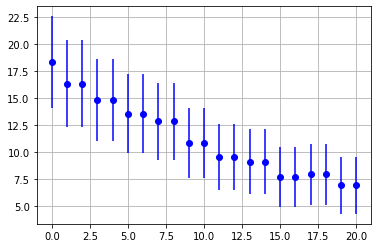

In [81]:
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.grid(True)

<ErrorbarContainer object of 3 artists>

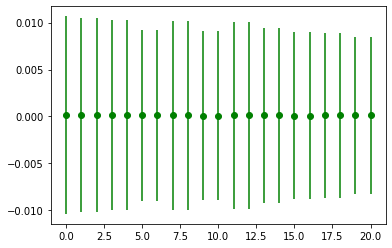

In [82]:
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')

<ErrorbarContainer object of 3 artists>

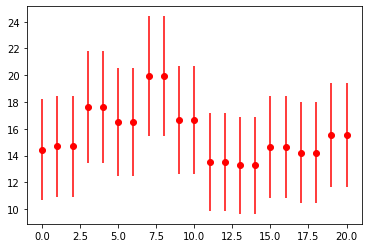

In [83]:
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')

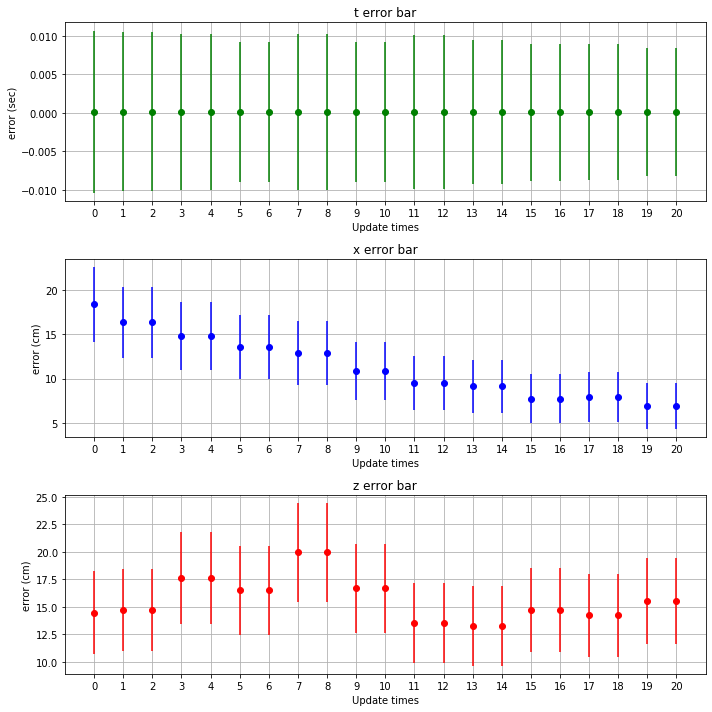

In [84]:
plt.figure(figsize=(10,10))

plt.subplot(3,1,1)
plt.errorbar(x, arr_mse_t.reshape(n,), arr_std_t.reshape(n,), linestyle='None', marker='o', color='g', label='t error')
plt.title('t error bar')
plt.xlabel('Update times')
plt.ylabel('error (sec)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,2)
plt.errorbar(x, arr_mse_x.reshape(n,), arr_std_x.reshape(n,), linestyle='None', marker='o', color='b', label='x error')
plt.title('x error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.subplot(3,1,3)
plt.errorbar(x, arr_mse_z.reshape(n,), arr_std_z.reshape(n,), linestyle='None', marker='o', color='r', label='z error')
plt.title('z error bar')
plt.xlabel('Update times')
plt.ylabel('error (cm)')
plt.xticks(np.arange(0,21))
plt.grid(True)

plt.tight_layout()
plt.savefig('./fig/without2/'+name+'_test_res.png')
plt.savefig('./fig/without2/'+name+'_test_res.svg')

In [85]:
arr_for_err_x

array([[-2.57429879, -2.67054962, -2.67054962, ..., -2.568784  ,
        -1.77224269, -1.77224269],
       [-3.7693313 , -3.68349094, -3.68349094, ..., -3.34581622,
        -2.40866512, -2.40866512],
       [ 3.46102062,  2.42015621,  2.42015621, ..., -0.01254463,
        -1.0465429 , -1.0465429 ],
       ...,
       [-0.62022398, -1.11078139, -1.11078139, ..., -0.15381508,
         0.24803143,  0.24803143],
       [ 3.16079802,  3.39372881,  3.39372881, ...,  2.87131988,
         2.25711072,  2.25711072],
       [ 1.07303817,  0.36905505,  0.36905505, ...,  0.92815166,
         0.73892615,  0.73892615]])

232 247
accuray = 93.92712550607287%


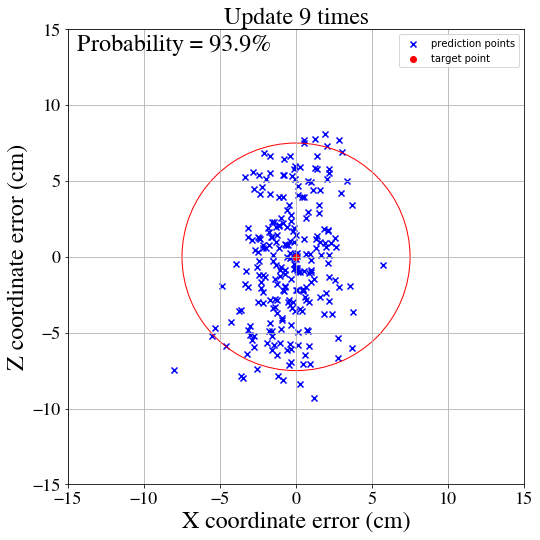

In [86]:
k = 10
up_times = k - 1

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')

title_name = 'Update ' + str(up_times) + ' times'
plt.title(title_name, fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
#plt.savefig('./fig/update_' + str(up_times) + '_times.png')

235 247
accuray = 95.1417004048583%
234 247
accuray = 94.73684210526315%
234 247
accuray = 94.73684210526315%
223 247
accuray = 90.2834008097166%
223 247
accuray = 90.2834008097166%
232 247
accuray = 93.92712550607287%
232 247
accuray = 93.92712550607287%
223 247
accuray = 90.2834008097166%
223 247
accuray = 90.2834008097166%
232 247
accuray = 93.92712550607287%
232 247
accuray = 93.92712550607287%
234 247
accuray = 94.73684210526315%
234 247
accuray = 94.73684210526315%
234 247
accuray = 94.73684210526315%
234 247
accuray = 94.73684210526315%
228 247
accuray = 92.3076923076923%
228 247
accuray = 92.3076923076923%
235 247
accuray = 95.1417004048583%
235 247
accuray = 95.1417004048583%
234 247
accuray = 94.73684210526315%
234 247
accuray = 94.73684210526315%


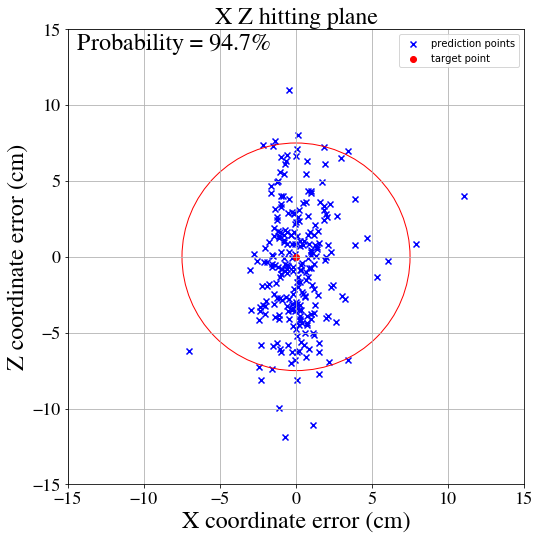

In [87]:
up_times = 0

correct = 0
for i in range(arr_for_err_x.shape[0]):
    if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
        correct += 1
print(correct, arr_for_err_x.shape[0])
print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
text = str("Probability = {}%".format(aa))

plt.figure(figsize=(8,8))

x = y = np.arange(-7.5, 7.5, 0.005)
x, y = np.meshgrid(x,y)
#plt.contour(x, y, x**2 + y**2, [15*15])
circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')

ax = plt.gca()
ax.add_artist(circle2)
ax.set_xlim((-15, 15))
ax.set_ylim((-15, 15))

plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
plt.scatter(0,0, color='r', marker='o', label='target point')
plt.Circle((0,0), 7.5, color='r', fill=False)

plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
plt.xticks(fontsize=18, fontname='FreeSerif')
plt.yticks(fontsize=18, fontname='FreeSerif')
plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

plt.tight_layout(pad=2.5)
plt.grid(True)
plt.legend(loc='upper right')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_with_classification.png')
plt.savefig('./fig/without2/update_' + str(up_times) + '_times_with_classification.svg')

for up_times in range(1,n,1):
    plt.clf()
    #plt.figure(figsize=(8,8))
    '''
    ax = plt.gca()
    ax.add_artist(circle2)
    ax.set_xlim((-15, 15))
    ax.set_ylim((-15, 15))
    '''
    
    circle2 = plt.Circle((0, 0), 7.5, color='r', fill=False, label='paddle edge')
    ax = plt.gca()
    ax.add_artist(circle2)
    
    correct = 0
    for i in range(arr_for_err_x.shape[0]):
        if arr_for_err_x[i,up_times] < 7.5 and arr_for_err_x[i,up_times] > -7.5 and arr_for_err_z[i,up_times] < 7.5 and arr_for_err_z[i,up_times] > -7.5:
            correct += 1
    print(correct, arr_for_err_x.shape[0])
    print("accuray = {}%".format(correct/arr_for_err_x.shape[0]*100))
    aa = np.round_(correct/arr_for_err_x.shape[0]*100, 1)
    text = str("Probability = {}%".format(aa))
    
    plt.scatter(cp.asnumpy(arr_for_err_x[:,up_times]), cp.asnumpy(arr_for_err_z[:,up_times]), edgecolors='b', label='prediction points', marker='x', color='b')
    plt.scatter(0,0, color='r', marker='o', label='target point')
    plt.Circle((0,0), 7.5, color='r', fill=False)

    plt.xlabel('X coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.ylabel('Z coordinate error (cm)', fontsize=24, fontname='FreeSerif')
    plt.xticks(fontsize=18, fontname='FreeSerif')
    plt.yticks(fontsize=18, fontname='FreeSerif')
    plt.title('X Z hitting plane', fontsize=24, fontname='FreeSerif')
    plt.text(-8,14,text, fontsize=24, fontname='FreeSerif', horizontalalignment='center', verticalalignment='center')

    plt.xlim(-15,15)
    plt.ylim(-15,15)
    
    plt.tight_layout(pad=2.5)
    plt.grid(True)
    plt.legend(loc='upper right')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_with_classification.png')
    plt.savefig('./fig/without2/update_' + str(up_times) + '_times_with_classification.svg')
    